# Lib

In [ ]:
import pandas as pd
import pickle
import zipfile
import numpy as np
import time
import datetime
import logging
import os
import sys
import argparse
import random
import copy
from random import sample
from pandas import DataFrame

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.pyplot as mp
from mpl_toolkits.mplot3d import axes3d
import seaborn as sns

In [ ]:
import torch
import torch.nn as nn
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
import torch.nn.functional as F

In [ ]:
print(torch.__version__)

1.10.2+cu113


# Config

In [ ]:
def get_config(args=None):
    parser = argparse.ArgumentParser(
        description="CVAE-Opt Training")

    parser.add_argument('--problem', type=str, default='Flowshop 20*6')
    parser.add_argument('--output_path', type=str, default="")
    parser.add_argument('--device', default='cuda', type=str)
    parser.add_argument('--process_num', default=6, type=int)
    parser.add_argument("--problem_size", type=int, default=20)
    parser.add_argument('--batch_size', default=128, type=int)
    #parser.add_argument('--epoch_size', type=int, default=9344, help='Number of instances used for training')
    parser.add_argument('--epoch_size', type=int, default=28032, help='Number of instances used for training')
    parser.add_argument('--nb_epochs', default=500, type=int)
    parser.add_argument('--search_validation_size', default=100, type=int)
    parser.add_argument('--network_validation_size', default=640, type=int)
    parser.add_argument('--KLD_weight', default=0.01, type=float)  # Beta in the paper
    parser.add_argument('--lr', default=0.001, type=float)
    parser.add_argument('--q_percentile', default=99, type=float)


    # Differential Evolution
    parser.add_argument('--search_space_size', default=20, type=int)    
    parser.add_argument('--de_mutate', default=0.3, type=float)
    parser.add_argument('--de_recombine', default=0.95, type=float)
    parser.add_argument('--de_popsize', default=128, type=float)
    parser.add_argument('--search_timelimit', default=30, type=int)
    parser.add_argument('--search_iterations', default=3, type=int)    
    
    config = parser.parse_args(args=[])

    config.device = torch.device(config.device)

    return config

In [ ]:
def get_config(args=None):
    parser = argparse.ArgumentParser(
        description="CVAE-Opt Training")

    parser.add_argument('--problem', type=str, default='Flowshop 50*17')
    parser.add_argument('--output_path', type=str, default="")
    parser.add_argument('--device', default='cuda', type=str)
    parser.add_argument('--process_num', default=17, type=int)
    parser.add_argument("--problem_size", type=int, default=50)
    parser.add_argument('--batch_size', default=64, type=int)
    parser.add_argument('--epoch_size', type=int, default=6400, help='Number of instances used for training')
    parser.add_argument('--nb_epochs', default=500, type=int)
    parser.add_argument('--search_validation_size', default=50, type=int)
    parser.add_argument('--network_validation_size', default=640, type=int)
    parser.add_argument('--KLD_weight', default=0.01, type=float)  # Beta in the paper
    parser.add_argument('--lr', default=0.001, type=float)
    parser.add_argument('--q_percentile', default=99, type=float)


    # Differential Evolution
    parser.add_argument('--search_space_size', default=50, type=int)    
    parser.add_argument('--de_mutate', default=0.3, type=float)
    parser.add_argument('--de_recombine', default=0.95, type=float)
    parser.add_argument('--de_popsize', default=200, type=float)
    parser.add_argument('--search_timelimit', default=999, type=int)
    parser.add_argument('--search_iterations', default=3, type=int)    
    
    config = parser.parse_args(args=[])

    config.device = torch.device(config.device)

    return config



In [ ]:
config = get_config()

# Input data

## process_size=20*6

In [ ]:
pickle_file = open(r"/home/nagashijun/cvae/flowdata/process_num=20x6(100000)/instances.pkl",'rb')
instances=pickle.load(pickle_file)
pickle_file.close()

In [ ]:
pickle_file = open(r"/home/nagashijun/cvae/flowdata/process_num=20x6(100000)/solutions.pkl",'rb')
solutions=pickle.load(pickle_file)
pickle_file.close()

In [ ]:
pickle_file = open(r"/home/nagashijun/cvae/flowdata/process_num=20x6(100000)/solution_values.pkl",'rb')
solution_values=pickle.load(pickle_file)
pickle_file.close()

In [ ]:
training_data=[instances[:config.epoch_size],solutions[:config.epoch_size]]     
validation_data=[instances[config.epoch_size:],solutions[config.epoch_size:]]  

In [ ]:
validation_datasolution_values_20=solution_values[config.epoch_size:]  
validation_datasolution_values_20=validation_datasolution_values_20[: config.search_validation_size]

In [ ]:
validation_datasolution_sequence_20=solutions[config.epoch_size:]  
validation_datasolution_sequence_20=validation_datasolution_sequence_20[: config.search_validation_size]

## process_size=50*17

In [ ]:
pickle_file = open(r"/home/nagashijun/cvae/flowdata/process_num=50x17(8000)/instances_50.pkl",'rb')
instances_50=pickle.load(pickle_file)
pickle_file.close()

In [ ]:
pickle_file = open(r"/home/nagashijun/cvae/flowdata/process_num=50x17(8000)/solutions_50.pkl",'rb')
solutions_50=pickle.load(pickle_file)
pickle_file.close()
#solutions_50[0]    

In [ ]:
pickle_file = open(r"/home/nagashijun/cvae/flowdata/process_num=50x17(8000)/solution_values_50.pkl",'rb')
solution_values_50=pickle.load(pickle_file)
pickle_file.close()

In [ ]:
training_data=[instances_50[:config.epoch_size],solutions_50[:config.epoch_size]]     #training_data[0](6400, 50, 17) training_data[1](7040, 50)
validation_data=[instances_50[config.epoch_size:],solutions_50[config.epoch_size:]]   #validation_data[0](1600, 50, 17) validation_data[1](960, 50)

In [ ]:
validation_datasolution_values_50=solution_values_50[config.epoch_size:]  
validation_datasolution_values_50=validation_datasolution_values_50[: config.search_validation_size]

In [ ]:
validation_datasolution_sequence_50=solutions_50[config.epoch_size:]  
validation_datasolution_sequence_50=validation_datasolution_sequence_50[: config.search_validation_size]

## pytorch input

In [ ]:
class FlowshopDataset(Dataset):
    def __init__(self, size, problem_size, config, data):
        self.size = size
        self.problem_size = problem_size
        self.instances = data[0]
        self.solutions = data[1]
        self.config = config

        assert len(self.instances) == len(self.solutions)
        assert len(self.instances) >= size

    def __len__(self):
        return self.size

    def __getitem__(self, idx):
        instances = self.instances[idx]
        solutions = np.array(self.solutions[idx])

        instances = torch.from_numpy(instances).to(self.config.device).float()
        solutions = torch.from_numpy(solutions).long().to(self.config.device)
        
        #return locations, tours        
        return instances, solutions, solutions

In [ ]:
training_dataset = FlowshopDataset(config.epoch_size, config.problem_size, config, training_data)
validation_dataset = FlowshopDataset(config.network_validation_size, config.problem_size, config, validation_data)

training_dataloader = DataLoader(training_dataset, batch_size=config.batch_size, num_workers=0, shuffle=True)
validation_dataloader = DataLoader(validation_dataset, batch_size=config.batch_size, num_workers=0, shuffle=True)

# Model

In [ ]:
class Embedding(nn.Module):
    """Encodes the coordinate states using 1D Convolution."""

    def __init__(self, input_size, hidden_size):
        super(Embedding, self).__init__()
        self.embed = nn.Linear(input_size, hidden_size)

    def forward(self, input_data):
        output_data = self.embed(input_data)
        return output_data

## encoder

In [ ]:
class Encoder(nn.Module):
    def __init__(self, instance_embedding, reference_embedding, encoder_attn, rnn, search_space_size,
                 hidden_size):
        super(Encoder, self).__init__()
        self.instance_embedding = instance_embedding
        self.reference_embedding = reference_embedding
        self.encoder_attn = encoder_attn
        self.gru_decoder = nn.GRU(hidden_size * 2, hidden_size, 1, batch_first=True)
        self.fc1 = nn.Linear(hidden_size, search_space_size)
        self.fc2 = nn.Linear(hidden_size, search_space_size)
        self.rnn = rnn #rnn = nn.GRU(hidden_size, hidden_size, 1, batch_first=True, dropout=0)
    
    def forward(self, instance, solution, instance_hidden, config):
        batch_size, sequence_size, input_size, = instance.size() 
        reference_input = instance[torch.arange(batch_size), solution[:, 0], :].unsqueeze(1).detach() 
    
        last_hh = None  # hidden state(num_layers * num_directions, batch, hidden_size)
        last_hh_2 = None # hidden state(num_layers * num_directions, batch, hidden_size)
        
        reference_hidden = self.reference_embedding(reference_input) 
        
        for j in range(1, solution.shape[1]):
            
            rnn_out, last_hh = self.rnn(reference_hidden, last_hh)
            
            # Given a summary of the output, find an input context
            enc_attn = self.encoder_attn(instance_hidden, rnn_out)
            context = enc_attn.permute(0, 2, 1).bmm(instance_hidden) 
            
            ptr = solution.t()[j].long() 
            
            reference_input = torch.gather(instance, 1, ptr.view(-1, 1, 1).expand(-1, 1, input_size))
            reference_hidden = self.reference_embedding(reference_input)

            rnn_input = torch.cat((reference_hidden, context), dim=2)
            rnn_out_2, last_hh_2 = self.gru_decoder(rnn_input, last_hh_2)            
        
        mu = self.fc1(last_hh_2.squeeze(0))
        log_var = self.fc2(last_hh_2.squeeze(0))
        return self.reparameterise(mu, log_var), mu, log_var       

    @staticmethod
    def reparameterise(mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

In [ ]:
class Attention(nn.Module):
    """Calculates attention over the input nodes given the current state."""

    def __init__(self, hidden_size):
        super(Attention, self).__init__()

        # W processes features from static decoder elements
        self.v = nn.Parameter(torch.zeros((1, hidden_size, 1), requires_grad=True)) 
        self.W = nn.Parameter(torch.zeros((1, 2 * hidden_size, 1 * hidden_size), requires_grad=True))
    def forward(self, instance_hidden, rnn_out):
        batch_size, _, hidden_size = instance_hidden.size() 

        hidden = rnn_out.expand_as(instance_hidden)  
        hidden = torch.cat((instance_hidden, hidden), 2) 

        # Broadcast some dimensions so we can do batch-matrix-multiply
        v = self.v.expand(batch_size, -1, -1) 
        W = self.W.expand(batch_size, -1, -1) 

        ret = torch.bmm(hidden, W)  
        attns = torch.bmm(torch.relu(ret), v) 
        attns = F.softmax(attns, dim=1)  
        return attns

## decoder

In [ ]:
def update_mask(mask, dynamic, chosen_idx):
    """Marks the Processed process, so it can't be selected a second time."""
    mask.scatter_(1, chosen_idx.unsqueeze(1), 0)
    return mask

In [ ]:
## version 2 Remove the restriction that it can only start from the first starting point,which is different from orginal paper
class Decoder(nn.Module):
    def __init__(self, instance_embedding, reference_embedding, encoder_attn, rnn, hidden_size,
                 search_space_size, mask_fn):
        super(Decoder, self).__init__()

        # Define the encoder & decoder models
        self.pointer = Pointer(encoder_attn, rnn, hidden_size, search_space_size)
        self.instance_embedding = instance_embedding
        self.reference_embedding = reference_embedding
        self.encoder_attn = encoder_attn
        self.mask_fn = mask_fn

        self.rnn = rnn
        
    def forward(self, instance, solution, Z, instance_hidden, config, teacher_forcing, last_hh_new=None):
        batch_size, sequence_size, input_size, = instance.size() 
        
        max_steps = sequence_size if self.mask_fn is None else 10000  #10000
        reference_input = instance[torch.arange(batch_size), solution[:, 0], :].unsqueeze(1).detach()

        tour_logp =[]
        tour_prob= []
        
        mask = torch.ones(batch_size, sequence_size, device=config.device) 
        
        if teacher_forcing:    #(True)
            tour_idx=[solution[:, [0]]]
            mask[torch.arange(batch_size), solution[:, 0]] = 0
            for j in range(1, max_steps):
                if not mask.byte().any():
                    break   # mask all -->0 then break
        
                reference_hidden = self.reference_embedding(reference_input)
                probs, last_hh_new = self.pointer(instance_hidden, reference_hidden, Z, last_hh_new)
                probs = F.softmax(probs + mask.log(), dim=1) 
                
                # Select the actions based on the training solutions (during training)
                ptr = solution.t()[j].long() 
                t = mask[torch.arange(len(mask)), ptr] 
                assert t.eq(1).all()
                logp = torch.log(probs[torch.arange(batch_size), ptr])
                # probs torch.Size([128, 20])
                _, predicted_ptr = torch.max(probs, 1) # – the result: tuple of two output tensors (max, max_indices)

                tour_idx.append(predicted_ptr.data.unsqueeze(1)) 
                if self.mask_fn is not None:
                    mask = self.mask_fn(mask, instance[:, :, 2:], ptr).detach() #visited position`s index-->
                
                reference_input = torch.gather(instance, 1, ptr.view(-1, 1, 1).expand(-1, 1, input_size)) 
                tour_prob.append(probs)
                tour_logp.append(logp.unsqueeze(1))
                
        else:
            tour_idx=[]
            for j in range(0, max_steps):
                if not mask.byte().any():
                    break   
                
                reference_hidden = self.reference_embedding(reference_input)
                probs, last_hh_new = self.pointer(instance_hidden, reference_hidden, Z, last_hh_new)
                probs = F.softmax(probs + mask.log(), dim=1)               
                
                # Select actions greedily (during the search)
                prob, ptr = torch.max(probs, 1)
                logp = prob.log()
                tour_idx.append(ptr.data.unsqueeze(1))
                
                if self.mask_fn is not None:
                    mask = self.mask_fn(mask, instance[:, :, 2:], ptr).detach() 
                
                reference_input = torch.gather(instance, 1, ptr.view(-1, 1, 1).expand(-1, 1, input_size))
            
                tour_prob.append(probs)
                tour_logp.append(logp.unsqueeze(1))
            
        tour_idx = torch.cat(tour_idx, dim=1)
        tour_logp = torch.cat(tour_logp, dim=1)

        return None, tour_idx, tour_logp

In [ ]:
class Pointer(nn.Module):
    """Calculates the next state given the previous state and input embeddings."""
    def __init__(self, encoder_attn, rnn, hidden_size, search_space_size):
        super(Pointer, self).__init__()
        
        # Used to calculate probability of selecting next state
        self.v = nn.Parameter(torch.zeros((1, hidden_size, 1), requires_grad=True))
        self.W = nn.Parameter(torch.zeros((1, 2 * hidden_size, hidden_size) , requires_grad=True))
        
        # Used to compute a representation of the current decoder output
        self.fc1 = nn.Linear(2 * hidden_size + search_space_size, 2 * hidden_size)
        self.fc2 = nn.Linear(2 * hidden_size, hidden_size)
        self.encoder_attn = encoder_attn
        self.rnn = rnn #rnn = nn.GRU(hidden_size, hidden_size, 1, batch_first=True, dropout=0)
  
    def forward(self, instance_hidden, reference_hidden, Z, last_hh):
        rnn_out, last_hh = self.rnn(reference_hidden, last_hh)
        rnn_out = rnn_out

        # Given a summary of the output, find an  input context
        enc_attn = self.encoder_attn(instance_hidden, rnn_out)
        context = enc_attn.permute(0, 2, 1).bmm(instance_hidden)  # (B, 1, num_feats)

        fc_input = torch.cat((context.squeeze(1), Z, reference_hidden.squeeze(1)), dim=1)  # (B, num_feats, seq_len)
        fc_output = self.fc1(fc_input)
        fc_output = self.fc2(fc_output).unsqueeze(1)
        fc_output = fc_output.expand(-1, instance_hidden.size(1), -1)
        fc_output = torch.cat((instance_hidden, fc_output), dim=2)

        v = self.v.expand(instance_hidden.size(0), -1, -1)
        W = self.W.expand(instance_hidden.size(0), -1, -1)
        probs = torch.bmm(torch.tanh(torch.bmm(fc_output, W)), v).squeeze(2)
        return probs, last_hh   

## CAVE

In [ ]:
class VAE(nn.Module): 
    def __init__(self, config):
        super(VAE, self).__init__()

        input_size = config.process_num
        mask_fn = update_mask           
        hidden_size = 128    
    
        self.instance_embedding = Embedding(input_size, hidden_size)
        reference_embedding = Embedding(input_size, hidden_size)
        encoder_attn = Attention(hidden_size)
        rnn = nn.GRU(hidden_size, hidden_size, 1, batch_first=True, dropout=0)    
        
        self.encoder = Encoder(self.instance_embedding, reference_embedding, encoder_attn, rnn,
                               config.search_space_size, hidden_size)
        self.decoder = Decoder(self.instance_embedding, reference_embedding, encoder_attn, rnn, hidden_size,
                               config.search_space_size, mask_fn)    
    
        self.instance_hidden = None
        self.dummy_solution = None    
        
        for p in self.parameters():
            if len(p.shape) > 1:
                nn.init.xavier_uniform_(p)
                
    def forward(self, instance, solution_1, solution_2, config):
        instance_hidden = self.instance_embedding(instance)
        output_e = self.encoder(instance, solution_1, instance_hidden, config)

        Z, mu, log_var = output_e

        output_prob, tour_idx, tour_logp = self.decoder(instance, solution_2, Z, instance_hidden, config,True)
        return  output_prob, mu, log_var, Z, tour_idx, tour_logp
        
    def decode(self, instance, Z, config):
        if self.instance_hidden is None:
            self.instance_hidden = self.instance_embedding(instance)
        output_prob, tour_idx, tour_logp = self.decoder(instance, self.dummy_solution, Z, self.instance_hidden, config,
                                                        False)
        return output_prob, tour_idx, tour_logp    
     
    def reset_decoder(self, batch_size, config):
        self.instance_hidden = None
        self.dummy_solution = torch.zeros(batch_size, 1).long().to(config.device)   #torch.Size([600, 1])  

# Train

## loss function

In [1]:
def calculate_RC_loss(tour_logp):
    RC = - tour_logp.sum()
    return RC


def calculate_KLD_loss(mean, log_var):
    KLD = -0.5 * torch.sum(1 + log_var - mean.pow(2) - log_var.exp())
    return KLD

## train

In [2]:
def train_epoch(model, config, epoch_idx, training_dataloader, optimizer):
    
    model.train() #set model to train mode

    start_time = time.time()
    
    loss_RC_values = []
    loss_KLD_values = []
    
    for batch_id, batch in enumerate(training_dataloader):    
        print("Batch {}/{}".format(batch_id, int(config.epoch_size / config.batch_size)))#Batch 729/730    
    
        # Get an instance and two symmetric solutions (see the paragraph symmetry breaking in the paper)
        instances, solutions_1, solutions_2 = batch    
        
        # Forward pass
        output, mean, log_var, Z, tour_idx, tour_logp = VAEModel(instances, solutions_1,solutions_2, config)
        
        # Calculate weighted loss
        loss_RC = calculate_RC_loss(tour_logp)
        loss_KLD = calculate_KLD_loss(mean, log_var)
        loss = loss_RC + loss_KLD * config.KLD_weight    
        
        # Update network weights 
        optimizer.zero_grad()    # Sets the gradients of all optimized torch.Tensors to zero
        assert not torch.isnan(loss)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 2.0)
        optimizer.step()      # Performs a single optimization step Update network weights 
        
        loss_RC_values.append(loss_RC.item())
        loss_KLD_values.append(loss_KLD.item())
        
    print(f' Loss_RC: {loss_RC.item()} Loss_KLD: {loss_KLD.item()}')
        
    epoch_duration = time.time() - start_time
    
    logging.info(
        "Finished epoch {}, took {} s".format(epoch_idx, time.strftime('%H:%M:%S', time.gmtime(epoch_duration))))
    logging.info("Epoch Loss_RC {}, Epoch Loss_KLD {}".format(np.mean(loss_RC_values), np.mean(loss_KLD_values)))
    #return loss_RC.item(), loss_KLD.item()
    loss_RC_mean=np.mean(loss_RC_values)
    loss_KLD_mean=np.mean(loss_KLD_values)
    return loss_RC_mean, loss_KLD_mean

In [3]:
def evaluate_network(config, model, validation_dataloader, epoch_idx):
    
    model.eval() 
    loss_RC_values = []
    loss_KLD_values = []
    abs_Z_values = []
    
    for batch_id, batch in enumerate(validation_dataloader):  
        instances, solutions_1, solutions_2 = batch
    
        with torch.no_grad():
            output, mean, log_var, Z, tour_idx, tour_logp = VAEModel(instances, solutions_1, solutions_2, config)
        
        loss_RC = calculate_RC_loss(tour_logp)
        loss_KLD = calculate_KLD_loss(mean, log_var)
        
        loss_RC_values.append(loss_RC.item())
        loss_KLD_values.append(loss_KLD.item())        
        
        abs_Z = torch.abs(Z)  # Absolute coordinates of points in latent space (Z)
        abs_Z_values.append(abs_Z.cpu().numpy())    # from tensor to array form, delete device: cuda:0

    abs_Z_values = np.array(abs_Z_values).flatten() #(128,20)

    # The bounds of the search space are defined as a percentile of the absolute latent variable coordinates
    new_bound = np.percentile(abs_Z_values, config.q_percentile).item()   
        
    logging.info(f'[Network Validation] Loss_RC: {np.mean(loss_RC_values)} Loss_KLD: {np.mean(loss_KLD_values)}')
    
    model.train()

    return new_bound # sampling boundary

In [4]:
def train(model, training_data, validation_data, config):
    assert config.nb_epochs > 2
    optimizer = torch.optim.Adam(model.parameters(), lr=config.lr)
    
    training_dataset = FlowshopDataset(config.epoch_size, config.problem_size, config, training_data)
    validation_dataset = FlowshopDataset(config.network_validation_size, config.problem_size, config, validation_data)
    
    training_dataloader = DataLoader(training_dataset, batch_size=config.batch_size, num_workers=0, shuffle=True)
    validation_dataloader = DataLoader(validation_dataset, batch_size=config.batch_size, num_workers=0, shuffle=True)
    
    runtime_values=[]
    cost_values=[]
    predict_solutions=[]
    loss_RCs, loss_KLDs=[],[]
    for epoch_idx in range(1, config.nb_epochs + 1):
        print("epoch {}/{}".format(epoch_idx, config.nb_epochs))
        loss_RC, loss_KLD=train_epoch(model, config, epoch_idx, training_dataloader, optimizer)
        loss_RCs.append(loss_RC)
        loss_KLDs.append(loss_KLD)
        # Validate and save model every 20 epochs
        if epoch_idx==1 or epoch_idx % 20 == 0 or epoch_idx==config.nb_epochs:
            logging.info("Start validation")
            # Evaluate the network performance on the validation set  
            new_bound = evaluate_network(config, VAEModel, validation_dataloader, epoch_idx)
            
            config.search_space_bound = new_bound
            logging.info(f"Setting search space bounds to {new_bound:2.3f}")            
            # Evaluate the search performance of the current model on a small subset of the validation set
            """
         
            """
            runtime_value, cost_value,predict_solution = validate(VAEModel, config,
                                                 validation_data[0][: config.search_validation_size],
                                                 None)
            
            runtime_values.append(runtime_value)
            cost_values.append(cost_value)  
            predict_solutions.append(predict_solution)
           
            #  save the model every __ epoch            
            model_data = {
                    'parameters': model.state_dict(),
                    'code_version': VERSION,
                    'problem': config.problem,
                    'problem_size': config.problem_size,
                    'Z_bound': new_bound,
                    'training_epochs': epoch_idx,
                    'model': "VAE_final"
                    }     


            torch.save(model_data, os.path.join(config.output_path, "models",
                                                    "model_{}_{}.pt".format(run_id, epoch_idx)))
            
    # Save the last model after the end of the training
    torch.save(model_data, os.path.join(config.output_path, "models",
                                        "model_{0}_final.pt".format(run_id, epoch_idx)))
    #logging.info("Training finished")   
    return runtime_values, cost_values,predict_solutions,loss_RCs, loss_KLDs

## validate

In [5]:
def calculateTotalTime(instances,seqs):
    instances_= torch.gather(instances, 1, seqs.unsqueeze(2).expand_as(instances))
    flow_time=[]
    n_row_cttable, n_col_cttable = instances_[0].shape
    for instance_id, instance in enumerate(instances_):
        for i in range(n_row_cttable-1):
            for j in range(n_col_cttable-1):
                ct_form, ct_latt = instance[i,j+1], instance[i+1,j]
                if ct_form >= ct_latt:
                    ct_latt = ct_form
                instance[i,j+1], instance[i+1,j] = ct_form, ct_latt    
        total_time= instance.sum(axis=0)[0] + instance.sum(axis=1)[n_row_cttable-1] - instance[n_row_cttable-1, 0]    
        
        #penalty objective function
        """
        penalty=0
        for i in range (len(seqs[instance_id])):
            penalty=pow(10,-i-2)*seqs[instance_id][i]+penalty
        total_time = total_time + penalty           
        """
        
        flow_time.append(total_time.item())
    return torch.Tensor(flow_time).to(config.device).detach()

In [6]:
def decode(Z, model, config, instance, cost_fn):
    Z = torch.Tensor(Z).to(config.device)
    with torch.no_grad():
        tour_probs, tour_idx, tour_logp = model.decode(instance, Z, config)
    costs = cost_fn(instance, tour_idx)
    return tour_idx, costs.tolist()

In [7]:
def validate(model, config, instances, solutions=None, verbose=True):
    model.eval()
    cost_fn=calculateTotalTime
    cost_values = []
    runtime_values = []
    predict_solutions=[]
    for i, instance in enumerate(instances):
        print("validate NO.",i+1)
        start_time = time.time()
        objective_value, solution = solve_instance_de(model, instance, config, cost_fn)
        runtime = time.time() - start_time
        cost_values.append(objective_value)
        predict_solutions.append(solution)
        print("Costs " + str(objective_value))
        runtime_values.append(runtime)
        print(cost_values)
        print(predict_solutions)

    return runtime_values, cost_values,predict_solutions

In [8]:
def solve_instance_de(model, instance, config, cost_fn):
    batch_size = config.de_popsize 
    instance = torch.Tensor(instance)
    instance = instance.unsqueeze(0).expand(batch_size, -1, -1)
    instance = instance.to(config.device)
    model.reset_decoder(batch_size, config)

    result_cost, result_tour = minimize(decode, (model, config, instance, cost_fn), config.search_space_bound,
                                        config.search_space_size, popsize=config.de_popsize,
                                        mutate=config.de_mutate, recombination=config.de_recombine,
                                        maxiter=config.search_iterations, maxtime=config.search_timelimit)
    solution = decode(np.array([result_tour] * batch_size), model, config, instance, cost_fn)[0][0].tolist()
    return result_cost, solution

In [9]:
def minimize(cost_func, args, search_space_bound, search_space_size, popsize, mutate, recombination, maxiter, maxtime):
    
    time_start=datetime.datetime.now()
    print("start:",time_start)
    
    # --- INITIALIZE A POPULATION (step #1) ----------------+
    start_time = time.time()
    population_cost = np.ones((popsize)) * np.inf
    children = np.zeros((popsize, search_space_size))
    iterations_without_improvement = 0
    gen_best = np.inf

    population = np.random.uniform(-search_space_bound, search_space_bound,
                                   (popsize, search_space_size))

    # --- SOLVE --------------------------------------------+

    # cycle through each generation (step #2)
    for i in range(1, maxiter + 1):
        print(i)
        if time.time() - start_time > maxtime:
            break

        # cycle through each individual in the population
        for j in range(0, popsize):
            # --- MUTATION (step #3.A) ---------------------+

            # select three random vector index positions [0, popsize), not including current vector (j)
            candidates = list(range(0, popsize))
            candidates.remove(j)
            random_index = sample(candidates, 3)

            # subtract x3 from x2, and create a new vector (x_diff)
            x_diff = population[random_index[1]] - population[random_index[2]]

            # multiply x_diff by the mutation factor (F) and add to x_1
            child = population[random_index[0]] + mutate * x_diff

            # --- RECOMBINATION (step #3.B) ----------------+
            crossover = np.random.uniform(0, 1, search_space_size)
            crossover = crossover > recombination
            child[crossover] = population[j][crossover]

            children[j] = child

        # Ensure bounds
        children = np.clip(children, -search_space_bound, search_space_bound)
        
        _, scores_trial = cost_func(children, *args)
        scores_trial = np.array(scores_trial)

        iterations_without_improvement += 1
        if min(population_cost) > min(scores_trial):
            iterations_without_improvement = 0

        improvement = population_cost > scores_trial
        population[improvement] = children[improvement]
        population_cost[improvement] = scores_trial[improvement]

        # --- SCORE KEEPING --------------------------------+
        gen_best = min(population_cost)  # fitness of best individual
   
    time_end=datetime.datetime.now()
    duration=time_end-time_start
    print("end:",time_end)
    print("duration:",duration)
    
    return gen_best, population[np.argmin(population_cost)]

# Main

## train model

In [ ]:
VERSION = "1.9.0"
if __name__ == "__main__":
    
    time_start=datetime.datetime.now()
    print("start:",time_start)
    run_id = np.random.randint(10000, 99999)
    now = datetime.datetime.now()
    config = get_config()
    if config.output_path == "":
        config.output_path = os.getcwd()
    config.output_path = os.path.join(config.output_path, "runs", "run_" + str(now.day) + "." + str(now.month) + "." + str(now.year) + "_" + str(run_id))
    #config.output_path = os.path.join(config.output_path, "runs", "run_" + str(now.year) + "Y." +str(now.month) + "M."  +   str(now.day) + "D." + "_id" + str(run_id))

    os.makedirs(os.path.join(config.output_path, "models"))

    logging.basicConfig(
        filename=os.path.join(config.output_path, "log_" + str(run_id) + ".txt"), filemode='w',
        level=logging.INFO, format='[%(levelname)s]%(message)s')
    logging.info("Started Training Run")
    logging.info("Call: {0}".format(''.join(sys.argv)))
    logging.info("Version: {0}".format(VERSION))
    logging.info("PARAMETERS:")
    for arg in sorted(vars(config)):
        logging.info("{0}: {1}".format(arg, getattr(config, arg)))
    logging.info("----------")    
     
    VAEModel = VAE(config).to(config.device)
    #train(VAEModel, training_data, validation_data, config)   
    runtime_values, cost_values, predict_solutions,loss_RCs, loss_KLDs=train(VAEModel, training_data, validation_data, config)    
    
    time_end=datetime.datetime.now()
    print("end:",time_end) 

start: 2022-03-24 17:27:47.690614
epoch 1/500
Batch 0/100
Batch 1/100
Batch 2/100
Batch 3/100
Batch 4/100
Batch 5/100
Batch 6/100
Batch 7/100
Batch 8/100
Batch 9/100
Batch 10/100
Batch 11/100
Batch 12/100
Batch 13/100
Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Ba

2
3
end: 2022-03-24 17:31:49.139995
duration: 0:00:21.553366
Costs 2438.463134765625
[2527.347412109375, 2392.03076171875, 2439.495361328125, 2457.483642578125, 2456.18701171875, 2506.31298828125, 2476.390625, 2438.463134765625]
[[30, 44, 31, 35, 22, 41, 7, 24, 28, 14, 5, 9, 26, 32, 38, 43, 48, 47, 39, 6, 16, 15, 42, 49, 3, 27, 29, 19, 1, 2, 17, 33, 4, 10, 25, 45, 46, 23, 18, 20, 12, 37, 21, 8, 13, 11, 0, 40, 36, 34], [3, 0, 6, 7, 18, 46, 19, 13, 30, 28, 8, 27, 1, 25, 20, 45, 4, 2, 31, 22, 35, 11, 23, 39, 9, 12, 48, 26, 43, 36, 24, 41, 32, 10, 42, 38, 34, 49, 33, 16, 44, 40, 37, 21, 29, 17, 15, 5, 47, 14], [48, 13, 21, 17, 43, 24, 12, 35, 47, 8, 5, 32, 37, 3, 2, 46, 6, 10, 42, 20, 26, 22, 16, 18, 33, 15, 34, 25, 1, 41, 38, 40, 44, 27, 30, 0, 19, 28, 23, 7, 11, 39, 29, 49, 14, 31, 45, 4, 36, 9], [46, 20, 32, 40, 38, 37, 28, 36, 4, 30, 1, 0, 12, 25, 47, 3, 15, 11, 44, 41, 2, 10, 13, 31, 9, 48, 6, 39, 14, 24, 35, 29, 5, 42, 19, 49, 34, 27, 33, 7, 18, 21, 43, 17, 8, 26, 16, 22, 23, 45], [1

2
3
end: 2022-03-24 17:33:43.021461
duration: 0:00:21.386471
Costs 2480.351806640625
[2527.347412109375, 2392.03076171875, 2439.495361328125, 2457.483642578125, 2456.18701171875, 2506.31298828125, 2476.390625, 2438.463134765625, 2364.40283203125, 2447.28369140625, 2475.317626953125, 2480.351806640625]
[[30, 44, 31, 35, 22, 41, 7, 24, 28, 14, 5, 9, 26, 32, 38, 43, 48, 47, 39, 6, 16, 15, 42, 49, 3, 27, 29, 19, 1, 2, 17, 33, 4, 10, 25, 45, 46, 23, 18, 20, 12, 37, 21, 8, 13, 11, 0, 40, 36, 34], [3, 0, 6, 7, 18, 46, 19, 13, 30, 28, 8, 27, 1, 25, 20, 45, 4, 2, 31, 22, 35, 11, 23, 39, 9, 12, 48, 26, 43, 36, 24, 41, 32, 10, 42, 38, 34, 49, 33, 16, 44, 40, 37, 21, 29, 17, 15, 5, 47, 14], [48, 13, 21, 17, 43, 24, 12, 35, 47, 8, 5, 32, 37, 3, 2, 46, 6, 10, 42, 20, 26, 22, 16, 18, 33, 15, 34, 25, 1, 41, 38, 40, 44, 27, 30, 0, 19, 28, 23, 7, 11, 39, 29, 49, 14, 31, 45, 4, 36, 9], [46, 20, 32, 40, 38, 37, 28, 36, 4, 30, 1, 0, 12, 25, 47, 3, 15, 11, 44, 41, 2, 10, 13, 31, 9, 48, 6, 39, 14, 24, 35, 29

2
3
end: 2022-03-24 17:35:08.292394
duration: 0:00:21.175838
Costs 2358.14794921875
[2527.347412109375, 2392.03076171875, 2439.495361328125, 2457.483642578125, 2456.18701171875, 2506.31298828125, 2476.390625, 2438.463134765625, 2364.40283203125, 2447.28369140625, 2475.317626953125, 2480.351806640625, 2427.12451171875, 2565.4921875, 2358.14794921875]
[[30, 44, 31, 35, 22, 41, 7, 24, 28, 14, 5, 9, 26, 32, 38, 43, 48, 47, 39, 6, 16, 15, 42, 49, 3, 27, 29, 19, 1, 2, 17, 33, 4, 10, 25, 45, 46, 23, 18, 20, 12, 37, 21, 8, 13, 11, 0, 40, 36, 34], [3, 0, 6, 7, 18, 46, 19, 13, 30, 28, 8, 27, 1, 25, 20, 45, 4, 2, 31, 22, 35, 11, 23, 39, 9, 12, 48, 26, 43, 36, 24, 41, 32, 10, 42, 38, 34, 49, 33, 16, 44, 40, 37, 21, 29, 17, 15, 5, 47, 14], [48, 13, 21, 17, 43, 24, 12, 35, 47, 8, 5, 32, 37, 3, 2, 46, 6, 10, 42, 20, 26, 22, 16, 18, 33, 15, 34, 25, 1, 41, 38, 40, 44, 27, 30, 0, 19, 28, 23, 7, 11, 39, 29, 49, 14, 31, 45, 4, 36, 9], [46, 20, 32, 40, 38, 37, 28, 36, 4, 30, 1, 0, 12, 25, 47, 3, 15, 11, 44

2
3
end: 2022-03-24 17:36:33.209729
duration: 0:00:21.329238
Costs 2401.06103515625
[2527.347412109375, 2392.03076171875, 2439.495361328125, 2457.483642578125, 2456.18701171875, 2506.31298828125, 2476.390625, 2438.463134765625, 2364.40283203125, 2447.28369140625, 2475.317626953125, 2480.351806640625, 2427.12451171875, 2565.4921875, 2358.14794921875, 2476.070068359375, 2459.39599609375, 2401.06103515625]
[[30, 44, 31, 35, 22, 41, 7, 24, 28, 14, 5, 9, 26, 32, 38, 43, 48, 47, 39, 6, 16, 15, 42, 49, 3, 27, 29, 19, 1, 2, 17, 33, 4, 10, 25, 45, 46, 23, 18, 20, 12, 37, 21, 8, 13, 11, 0, 40, 36, 34], [3, 0, 6, 7, 18, 46, 19, 13, 30, 28, 8, 27, 1, 25, 20, 45, 4, 2, 31, 22, 35, 11, 23, 39, 9, 12, 48, 26, 43, 36, 24, 41, 32, 10, 42, 38, 34, 49, 33, 16, 44, 40, 37, 21, 29, 17, 15, 5, 47, 14], [48, 13, 21, 17, 43, 24, 12, 35, 47, 8, 5, 32, 37, 3, 2, 46, 6, 10, 42, 20, 26, 22, 16, 18, 33, 15, 34, 25, 1, 41, 38, 40, 44, 27, 30, 0, 19, 28, 23, 7, 11, 39, 29, 49, 14, 31, 45, 4, 36, 9], [46, 20, 32, 40,

2
3
end: 2022-03-24 17:37:58.154350
duration: 0:00:21.134524
Costs 2329.105224609375
[2527.347412109375, 2392.03076171875, 2439.495361328125, 2457.483642578125, 2456.18701171875, 2506.31298828125, 2476.390625, 2438.463134765625, 2364.40283203125, 2447.28369140625, 2475.317626953125, 2480.351806640625, 2427.12451171875, 2565.4921875, 2358.14794921875, 2476.070068359375, 2459.39599609375, 2401.06103515625, 2436.45361328125, 2465.435302734375, 2329.105224609375]
[[30, 44, 31, 35, 22, 41, 7, 24, 28, 14, 5, 9, 26, 32, 38, 43, 48, 47, 39, 6, 16, 15, 42, 49, 3, 27, 29, 19, 1, 2, 17, 33, 4, 10, 25, 45, 46, 23, 18, 20, 12, 37, 21, 8, 13, 11, 0, 40, 36, 34], [3, 0, 6, 7, 18, 46, 19, 13, 30, 28, 8, 27, 1, 25, 20, 45, 4, 2, 31, 22, 35, 11, 23, 39, 9, 12, 48, 26, 43, 36, 24, 41, 32, 10, 42, 38, 34, 49, 33, 16, 44, 40, 37, 21, 29, 17, 15, 5, 47, 14], [48, 13, 21, 17, 43, 24, 12, 35, 47, 8, 5, 32, 37, 3, 2, 46, 6, 10, 42, 20, 26, 22, 16, 18, 33, 15, 34, 25, 1, 41, 38, 40, 44, 27, 30, 0, 19, 28, 23, 7

2
3
end: 2022-03-24 17:38:54.770387
duration: 0:00:21.185883
Costs 2434.446533203125
[2527.347412109375, 2392.03076171875, 2439.495361328125, 2457.483642578125, 2456.18701171875, 2506.31298828125, 2476.390625, 2438.463134765625, 2364.40283203125, 2447.28369140625, 2475.317626953125, 2480.351806640625, 2427.12451171875, 2565.4921875, 2358.14794921875, 2476.070068359375, 2459.39599609375, 2401.06103515625, 2436.45361328125, 2465.435302734375, 2329.105224609375, 2456.2607421875, 2434.446533203125]
[[30, 44, 31, 35, 22, 41, 7, 24, 28, 14, 5, 9, 26, 32, 38, 43, 48, 47, 39, 6, 16, 15, 42, 49, 3, 27, 29, 19, 1, 2, 17, 33, 4, 10, 25, 45, 46, 23, 18, 20, 12, 37, 21, 8, 13, 11, 0, 40, 36, 34], [3, 0, 6, 7, 18, 46, 19, 13, 30, 28, 8, 27, 1, 25, 20, 45, 4, 2, 31, 22, 35, 11, 23, 39, 9, 12, 48, 26, 43, 36, 24, 41, 32, 10, 42, 38, 34, 49, 33, 16, 44, 40, 37, 21, 29, 17, 15, 5, 47, 14], [48, 13, 21, 17, 43, 24, 12, 35, 47, 8, 5, 32, 37, 3, 2, 46, 6, 10, 42, 20, 26, 22, 16, 18, 33, 15, 34, 25, 1, 41, 

2
3
end: 2022-03-24 17:39:51.371487
duration: 0:00:21.175080
Costs 2429.2431640625
[2527.347412109375, 2392.03076171875, 2439.495361328125, 2457.483642578125, 2456.18701171875, 2506.31298828125, 2476.390625, 2438.463134765625, 2364.40283203125, 2447.28369140625, 2475.317626953125, 2480.351806640625, 2427.12451171875, 2565.4921875, 2358.14794921875, 2476.070068359375, 2459.39599609375, 2401.06103515625, 2436.45361328125, 2465.435302734375, 2329.105224609375, 2456.2607421875, 2434.446533203125, 2432.07421875, 2429.2431640625]
[[30, 44, 31, 35, 22, 41, 7, 24, 28, 14, 5, 9, 26, 32, 38, 43, 48, 47, 39, 6, 16, 15, 42, 49, 3, 27, 29, 19, 1, 2, 17, 33, 4, 10, 25, 45, 46, 23, 18, 20, 12, 37, 21, 8, 13, 11, 0, 40, 36, 34], [3, 0, 6, 7, 18, 46, 19, 13, 30, 28, 8, 27, 1, 25, 20, 45, 4, 2, 31, 22, 35, 11, 23, 39, 9, 12, 48, 26, 43, 36, 24, 41, 32, 10, 42, 38, 34, 49, 33, 16, 44, 40, 37, 21, 29, 17, 15, 5, 47, 14], [48, 13, 21, 17, 43, 24, 12, 35, 47, 8, 5, 32, 37, 3, 2, 46, 6, 10, 42, 20, 26, 22, 1

2
3
end: 2022-03-24 17:40:48.188731
duration: 0:00:21.139772
Costs 2527.13623046875
[2527.347412109375, 2392.03076171875, 2439.495361328125, 2457.483642578125, 2456.18701171875, 2506.31298828125, 2476.390625, 2438.463134765625, 2364.40283203125, 2447.28369140625, 2475.317626953125, 2480.351806640625, 2427.12451171875, 2565.4921875, 2358.14794921875, 2476.070068359375, 2459.39599609375, 2401.06103515625, 2436.45361328125, 2465.435302734375, 2329.105224609375, 2456.2607421875, 2434.446533203125, 2432.07421875, 2429.2431640625, 2468.393798828125, 2527.13623046875]
[[30, 44, 31, 35, 22, 41, 7, 24, 28, 14, 5, 9, 26, 32, 38, 43, 48, 47, 39, 6, 16, 15, 42, 49, 3, 27, 29, 19, 1, 2, 17, 33, 4, 10, 25, 45, 46, 23, 18, 20, 12, 37, 21, 8, 13, 11, 0, 40, 36, 34], [3, 0, 6, 7, 18, 46, 19, 13, 30, 28, 8, 27, 1, 25, 20, 45, 4, 2, 31, 22, 35, 11, 23, 39, 9, 12, 48, 26, 43, 36, 24, 41, 32, 10, 42, 38, 34, 49, 33, 16, 44, 40, 37, 21, 29, 17, 15, 5, 47, 14], [48, 13, 21, 17, 43, 24, 12, 35, 47, 8, 5, 32, 

2
3
end: 2022-03-24 17:41:44.821215
duration: 0:00:21.199538
Costs 2487.187744140625
[2527.347412109375, 2392.03076171875, 2439.495361328125, 2457.483642578125, 2456.18701171875, 2506.31298828125, 2476.390625, 2438.463134765625, 2364.40283203125, 2447.28369140625, 2475.317626953125, 2480.351806640625, 2427.12451171875, 2565.4921875, 2358.14794921875, 2476.070068359375, 2459.39599609375, 2401.06103515625, 2436.45361328125, 2465.435302734375, 2329.105224609375, 2456.2607421875, 2434.446533203125, 2432.07421875, 2429.2431640625, 2468.393798828125, 2527.13623046875, 2501.0654296875, 2487.187744140625]
[[30, 44, 31, 35, 22, 41, 7, 24, 28, 14, 5, 9, 26, 32, 38, 43, 48, 47, 39, 6, 16, 15, 42, 49, 3, 27, 29, 19, 1, 2, 17, 33, 4, 10, 25, 45, 46, 23, 18, 20, 12, 37, 21, 8, 13, 11, 0, 40, 36, 34], [3, 0, 6, 7, 18, 46, 19, 13, 30, 28, 8, 27, 1, 25, 20, 45, 4, 2, 31, 22, 35, 11, 23, 39, 9, 12, 48, 26, 43, 36, 24, 41, 32, 10, 42, 38, 34, 49, 33, 16, 44, 40, 37, 21, 29, 17, 15, 5, 47, 14], [48, 13, 2

2
3
end: 2022-03-24 17:42:41.953939
duration: 0:00:21.319597
Costs 2503.056884765625
[2527.347412109375, 2392.03076171875, 2439.495361328125, 2457.483642578125, 2456.18701171875, 2506.31298828125, 2476.390625, 2438.463134765625, 2364.40283203125, 2447.28369140625, 2475.317626953125, 2480.351806640625, 2427.12451171875, 2565.4921875, 2358.14794921875, 2476.070068359375, 2459.39599609375, 2401.06103515625, 2436.45361328125, 2465.435302734375, 2329.105224609375, 2456.2607421875, 2434.446533203125, 2432.07421875, 2429.2431640625, 2468.393798828125, 2527.13623046875, 2501.0654296875, 2487.187744140625, 2415.15283203125, 2503.056884765625]
[[30, 44, 31, 35, 22, 41, 7, 24, 28, 14, 5, 9, 26, 32, 38, 43, 48, 47, 39, 6, 16, 15, 42, 49, 3, 27, 29, 19, 1, 2, 17, 33, 4, 10, 25, 45, 46, 23, 18, 20, 12, 37, 21, 8, 13, 11, 0, 40, 36, 34], [3, 0, 6, 7, 18, 46, 19, 13, 30, 28, 8, 27, 1, 25, 20, 45, 4, 2, 31, 22, 35, 11, 23, 39, 9, 12, 48, 26, 43, 36, 24, 41, 32, 10, 42, 38, 34, 49, 33, 16, 44, 40, 37, 2

2
3
end: 2022-03-24 17:43:39.444554
duration: 0:00:21.511048
Costs 2465.468017578125
[2527.347412109375, 2392.03076171875, 2439.495361328125, 2457.483642578125, 2456.18701171875, 2506.31298828125, 2476.390625, 2438.463134765625, 2364.40283203125, 2447.28369140625, 2475.317626953125, 2480.351806640625, 2427.12451171875, 2565.4921875, 2358.14794921875, 2476.070068359375, 2459.39599609375, 2401.06103515625, 2436.45361328125, 2465.435302734375, 2329.105224609375, 2456.2607421875, 2434.446533203125, 2432.07421875, 2429.2431640625, 2468.393798828125, 2527.13623046875, 2501.0654296875, 2487.187744140625, 2415.15283203125, 2503.056884765625, 2481.081787109375, 2465.468017578125]
[[30, 44, 31, 35, 22, 41, 7, 24, 28, 14, 5, 9, 26, 32, 38, 43, 48, 47, 39, 6, 16, 15, 42, 49, 3, 27, 29, 19, 1, 2, 17, 33, 4, 10, 25, 45, 46, 23, 18, 20, 12, 37, 21, 8, 13, 11, 0, 40, 36, 34], [3, 0, 6, 7, 18, 46, 19, 13, 30, 28, 8, 27, 1, 25, 20, 45, 4, 2, 31, 22, 35, 11, 23, 39, 9, 12, 48, 26, 43, 36, 24, 41, 32, 10,

2
3
end: 2022-03-24 17:44:36.630685
duration: 0:00:21.343733
Costs 2424.342529296875
[2527.347412109375, 2392.03076171875, 2439.495361328125, 2457.483642578125, 2456.18701171875, 2506.31298828125, 2476.390625, 2438.463134765625, 2364.40283203125, 2447.28369140625, 2475.317626953125, 2480.351806640625, 2427.12451171875, 2565.4921875, 2358.14794921875, 2476.070068359375, 2459.39599609375, 2401.06103515625, 2436.45361328125, 2465.435302734375, 2329.105224609375, 2456.2607421875, 2434.446533203125, 2432.07421875, 2429.2431640625, 2468.393798828125, 2527.13623046875, 2501.0654296875, 2487.187744140625, 2415.15283203125, 2503.056884765625, 2481.081787109375, 2465.468017578125, 2498.3154296875, 2424.342529296875]
[[30, 44, 31, 35, 22, 41, 7, 24, 28, 14, 5, 9, 26, 32, 38, 43, 48, 47, 39, 6, 16, 15, 42, 49, 3, 27, 29, 19, 1, 2, 17, 33, 4, 10, 25, 45, 46, 23, 18, 20, 12, 37, 21, 8, 13, 11, 0, 40, 36, 34], [3, 0, 6, 7, 18, 46, 19, 13, 30, 28, 8, 27, 1, 25, 20, 45, 4, 2, 31, 22, 35, 11, 23, 39, 9,

2
3
end: 2022-03-24 17:45:33.804677
duration: 0:00:21.351956
Costs 2388.24365234375
[2527.347412109375, 2392.03076171875, 2439.495361328125, 2457.483642578125, 2456.18701171875, 2506.31298828125, 2476.390625, 2438.463134765625, 2364.40283203125, 2447.28369140625, 2475.317626953125, 2480.351806640625, 2427.12451171875, 2565.4921875, 2358.14794921875, 2476.070068359375, 2459.39599609375, 2401.06103515625, 2436.45361328125, 2465.435302734375, 2329.105224609375, 2456.2607421875, 2434.446533203125, 2432.07421875, 2429.2431640625, 2468.393798828125, 2527.13623046875, 2501.0654296875, 2487.187744140625, 2415.15283203125, 2503.056884765625, 2481.081787109375, 2465.468017578125, 2498.3154296875, 2424.342529296875, 2421.38427734375, 2388.24365234375]
[[30, 44, 31, 35, 22, 41, 7, 24, 28, 14, 5, 9, 26, 32, 38, 43, 48, 47, 39, 6, 16, 15, 42, 49, 3, 27, 29, 19, 1, 2, 17, 33, 4, 10, 25, 45, 46, 23, 18, 20, 12, 37, 21, 8, 13, 11, 0, 40, 36, 34], [3, 0, 6, 7, 18, 46, 19, 13, 30, 28, 8, 27, 1, 25, 20, 4

2
3
end: 2022-03-24 17:46:31.226456
duration: 0:00:21.577020
Costs 2400.098388671875
[2527.347412109375, 2392.03076171875, 2439.495361328125, 2457.483642578125, 2456.18701171875, 2506.31298828125, 2476.390625, 2438.463134765625, 2364.40283203125, 2447.28369140625, 2475.317626953125, 2480.351806640625, 2427.12451171875, 2565.4921875, 2358.14794921875, 2476.070068359375, 2459.39599609375, 2401.06103515625, 2436.45361328125, 2465.435302734375, 2329.105224609375, 2456.2607421875, 2434.446533203125, 2432.07421875, 2429.2431640625, 2468.393798828125, 2527.13623046875, 2501.0654296875, 2487.187744140625, 2415.15283203125, 2503.056884765625, 2481.081787109375, 2465.468017578125, 2498.3154296875, 2424.342529296875, 2421.38427734375, 2388.24365234375, 2364.3818359375, 2400.098388671875]
[[30, 44, 31, 35, 22, 41, 7, 24, 28, 14, 5, 9, 26, 32, 38, 43, 48, 47, 39, 6, 16, 15, 42, 49, 3, 27, 29, 19, 1, 2, 17, 33, 4, 10, 25, 45, 46, 23, 18, 20, 12, 37, 21, 8, 13, 11, 0, 40, 36, 34], [3, 0, 6, 7, 18, 46

2
3
end: 2022-03-24 17:46:59.855859
duration: 0:00:21.536348
Costs 2340.4208984375
[2527.347412109375, 2392.03076171875, 2439.495361328125, 2457.483642578125, 2456.18701171875, 2506.31298828125, 2476.390625, 2438.463134765625, 2364.40283203125, 2447.28369140625, 2475.317626953125, 2480.351806640625, 2427.12451171875, 2565.4921875, 2358.14794921875, 2476.070068359375, 2459.39599609375, 2401.06103515625, 2436.45361328125, 2465.435302734375, 2329.105224609375, 2456.2607421875, 2434.446533203125, 2432.07421875, 2429.2431640625, 2468.393798828125, 2527.13623046875, 2501.0654296875, 2487.187744140625, 2415.15283203125, 2503.056884765625, 2481.081787109375, 2465.468017578125, 2498.3154296875, 2424.342529296875, 2421.38427734375, 2388.24365234375, 2364.3818359375, 2400.098388671875, 2340.4208984375]
[[30, 44, 31, 35, 22, 41, 7, 24, 28, 14, 5, 9, 26, 32, 38, 43, 48, 47, 39, 6, 16, 15, 42, 49, 3, 27, 29, 19, 1, 2, 17, 33, 4, 10, 25, 45, 46, 23, 18, 20, 12, 37, 21, 8, 13, 11, 0, 40, 36, 34], [3, 

2
3
end: 2022-03-24 17:47:28.332467
duration: 0:00:21.314715
Costs 2444.367919921875
[2527.347412109375, 2392.03076171875, 2439.495361328125, 2457.483642578125, 2456.18701171875, 2506.31298828125, 2476.390625, 2438.463134765625, 2364.40283203125, 2447.28369140625, 2475.317626953125, 2480.351806640625, 2427.12451171875, 2565.4921875, 2358.14794921875, 2476.070068359375, 2459.39599609375, 2401.06103515625, 2436.45361328125, 2465.435302734375, 2329.105224609375, 2456.2607421875, 2434.446533203125, 2432.07421875, 2429.2431640625, 2468.393798828125, 2527.13623046875, 2501.0654296875, 2487.187744140625, 2415.15283203125, 2503.056884765625, 2481.081787109375, 2465.468017578125, 2498.3154296875, 2424.342529296875, 2421.38427734375, 2388.24365234375, 2364.3818359375, 2400.098388671875, 2340.4208984375, 2444.367919921875]
[[30, 44, 31, 35, 22, 41, 7, 24, 28, 14, 5, 9, 26, 32, 38, 43, 48, 47, 39, 6, 16, 15, 42, 49, 3, 27, 29, 19, 1, 2, 17, 33, 4, 10, 25, 45, 46, 23, 18, 20, 12, 37, 21, 8, 13, 11,

2
3
end: 2022-03-24 17:47:56.930668
duration: 0:00:21.495920
Costs 2458.31396484375
[2527.347412109375, 2392.03076171875, 2439.495361328125, 2457.483642578125, 2456.18701171875, 2506.31298828125, 2476.390625, 2438.463134765625, 2364.40283203125, 2447.28369140625, 2475.317626953125, 2480.351806640625, 2427.12451171875, 2565.4921875, 2358.14794921875, 2476.070068359375, 2459.39599609375, 2401.06103515625, 2436.45361328125, 2465.435302734375, 2329.105224609375, 2456.2607421875, 2434.446533203125, 2432.07421875, 2429.2431640625, 2468.393798828125, 2527.13623046875, 2501.0654296875, 2487.187744140625, 2415.15283203125, 2503.056884765625, 2481.081787109375, 2465.468017578125, 2498.3154296875, 2424.342529296875, 2421.38427734375, 2388.24365234375, 2364.3818359375, 2400.098388671875, 2340.4208984375, 2444.367919921875, 2458.31396484375]
[[30, 44, 31, 35, 22, 41, 7, 24, 28, 14, 5, 9, 26, 32, 38, 43, 48, 47, 39, 6, 16, 15, 42, 49, 3, 27, 29, 19, 1, 2, 17, 33, 4, 10, 25, 45, 46, 23, 18, 20, 12, 3

2
3
end: 2022-03-24 17:48:25.139854
duration: 0:00:21.100310
Costs 2512.505615234375
[2527.347412109375, 2392.03076171875, 2439.495361328125, 2457.483642578125, 2456.18701171875, 2506.31298828125, 2476.390625, 2438.463134765625, 2364.40283203125, 2447.28369140625, 2475.317626953125, 2480.351806640625, 2427.12451171875, 2565.4921875, 2358.14794921875, 2476.070068359375, 2459.39599609375, 2401.06103515625, 2436.45361328125, 2465.435302734375, 2329.105224609375, 2456.2607421875, 2434.446533203125, 2432.07421875, 2429.2431640625, 2468.393798828125, 2527.13623046875, 2501.0654296875, 2487.187744140625, 2415.15283203125, 2503.056884765625, 2481.081787109375, 2465.468017578125, 2498.3154296875, 2424.342529296875, 2421.38427734375, 2388.24365234375, 2364.3818359375, 2400.098388671875, 2340.4208984375, 2444.367919921875, 2458.31396484375, 2512.505615234375]
[[30, 44, 31, 35, 22, 41, 7, 24, 28, 14, 5, 9, 26, 32, 38, 43, 48, 47, 39, 6, 16, 15, 42, 49, 3, 27, 29, 19, 1, 2, 17, 33, 4, 10, 25, 45, 4

2
3
end: 2022-03-24 17:48:53.521274
duration: 0:00:21.346203
Costs 2404.450927734375
[2527.347412109375, 2392.03076171875, 2439.495361328125, 2457.483642578125, 2456.18701171875, 2506.31298828125, 2476.390625, 2438.463134765625, 2364.40283203125, 2447.28369140625, 2475.317626953125, 2480.351806640625, 2427.12451171875, 2565.4921875, 2358.14794921875, 2476.070068359375, 2459.39599609375, 2401.06103515625, 2436.45361328125, 2465.435302734375, 2329.105224609375, 2456.2607421875, 2434.446533203125, 2432.07421875, 2429.2431640625, 2468.393798828125, 2527.13623046875, 2501.0654296875, 2487.187744140625, 2415.15283203125, 2503.056884765625, 2481.081787109375, 2465.468017578125, 2498.3154296875, 2424.342529296875, 2421.38427734375, 2388.24365234375, 2364.3818359375, 2400.098388671875, 2340.4208984375, 2444.367919921875, 2458.31396484375, 2512.505615234375, 2404.450927734375]
[[30, 44, 31, 35, 22, 41, 7, 24, 28, 14, 5, 9, 26, 32, 38, 43, 48, 47, 39, 6, 16, 15, 42, 49, 3, 27, 29, 19, 1, 2, 17, 3

2
3
end: 2022-03-24 17:49:21.916936
duration: 0:00:21.284238
Costs 2500.234619140625
[2527.347412109375, 2392.03076171875, 2439.495361328125, 2457.483642578125, 2456.18701171875, 2506.31298828125, 2476.390625, 2438.463134765625, 2364.40283203125, 2447.28369140625, 2475.317626953125, 2480.351806640625, 2427.12451171875, 2565.4921875, 2358.14794921875, 2476.070068359375, 2459.39599609375, 2401.06103515625, 2436.45361328125, 2465.435302734375, 2329.105224609375, 2456.2607421875, 2434.446533203125, 2432.07421875, 2429.2431640625, 2468.393798828125, 2527.13623046875, 2501.0654296875, 2487.187744140625, 2415.15283203125, 2503.056884765625, 2481.081787109375, 2465.468017578125, 2498.3154296875, 2424.342529296875, 2421.38427734375, 2388.24365234375, 2364.3818359375, 2400.098388671875, 2340.4208984375, 2444.367919921875, 2458.31396484375, 2512.505615234375, 2404.450927734375, 2500.234619140625]
[[30, 44, 31, 35, 22, 41, 7, 24, 28, 14, 5, 9, 26, 32, 38, 43, 48, 47, 39, 6, 16, 15, 42, 49, 3, 27, 

2
3
end: 2022-03-24 17:49:50.309743
duration: 0:00:21.316425
Costs 2441.375244140625
[2527.347412109375, 2392.03076171875, 2439.495361328125, 2457.483642578125, 2456.18701171875, 2506.31298828125, 2476.390625, 2438.463134765625, 2364.40283203125, 2447.28369140625, 2475.317626953125, 2480.351806640625, 2427.12451171875, 2565.4921875, 2358.14794921875, 2476.070068359375, 2459.39599609375, 2401.06103515625, 2436.45361328125, 2465.435302734375, 2329.105224609375, 2456.2607421875, 2434.446533203125, 2432.07421875, 2429.2431640625, 2468.393798828125, 2527.13623046875, 2501.0654296875, 2487.187744140625, 2415.15283203125, 2503.056884765625, 2481.081787109375, 2465.468017578125, 2498.3154296875, 2424.342529296875, 2421.38427734375, 2388.24365234375, 2364.3818359375, 2400.098388671875, 2340.4208984375, 2444.367919921875, 2458.31396484375, 2512.505615234375, 2404.450927734375, 2500.234619140625, 2441.375244140625]
[[30, 44, 31, 35, 22, 41, 7, 24, 28, 14, 5, 9, 26, 32, 38, 43, 48, 47, 39, 6, 16, 

2
3
end: 2022-03-24 17:50:18.555203
duration: 0:00:21.145489
Costs 2489.498779296875
[2527.347412109375, 2392.03076171875, 2439.495361328125, 2457.483642578125, 2456.18701171875, 2506.31298828125, 2476.390625, 2438.463134765625, 2364.40283203125, 2447.28369140625, 2475.317626953125, 2480.351806640625, 2427.12451171875, 2565.4921875, 2358.14794921875, 2476.070068359375, 2459.39599609375, 2401.06103515625, 2436.45361328125, 2465.435302734375, 2329.105224609375, 2456.2607421875, 2434.446533203125, 2432.07421875, 2429.2431640625, 2468.393798828125, 2527.13623046875, 2501.0654296875, 2487.187744140625, 2415.15283203125, 2503.056884765625, 2481.081787109375, 2465.468017578125, 2498.3154296875, 2424.342529296875, 2421.38427734375, 2388.24365234375, 2364.3818359375, 2400.098388671875, 2340.4208984375, 2444.367919921875, 2458.31396484375, 2512.505615234375, 2404.450927734375, 2500.234619140625, 2441.375244140625, 2489.498779296875]
[[30, 44, 31, 35, 22, 41, 7, 24, 28, 14, 5, 9, 26, 32, 38, 43, 

2
3
end: 2022-03-24 17:50:47.063049
duration: 0:00:21.462468
Costs 2424.490478515625
[2527.347412109375, 2392.03076171875, 2439.495361328125, 2457.483642578125, 2456.18701171875, 2506.31298828125, 2476.390625, 2438.463134765625, 2364.40283203125, 2447.28369140625, 2475.317626953125, 2480.351806640625, 2427.12451171875, 2565.4921875, 2358.14794921875, 2476.070068359375, 2459.39599609375, 2401.06103515625, 2436.45361328125, 2465.435302734375, 2329.105224609375, 2456.2607421875, 2434.446533203125, 2432.07421875, 2429.2431640625, 2468.393798828125, 2527.13623046875, 2501.0654296875, 2487.187744140625, 2415.15283203125, 2503.056884765625, 2481.081787109375, 2465.468017578125, 2498.3154296875, 2424.342529296875, 2421.38427734375, 2388.24365234375, 2364.3818359375, 2400.098388671875, 2340.4208984375, 2444.367919921875, 2458.31396484375, 2512.505615234375, 2404.450927734375, 2500.234619140625, 2441.375244140625, 2489.498779296875, 2424.490478515625]
[[30, 44, 31, 35, 22, 41, 7, 24, 28, 14, 5, 

2
3
end: 2022-03-24 17:51:15.564503
duration: 0:00:21.354951
Costs 2489.36767578125
[2527.347412109375, 2392.03076171875, 2439.495361328125, 2457.483642578125, 2456.18701171875, 2506.31298828125, 2476.390625, 2438.463134765625, 2364.40283203125, 2447.28369140625, 2475.317626953125, 2480.351806640625, 2427.12451171875, 2565.4921875, 2358.14794921875, 2476.070068359375, 2459.39599609375, 2401.06103515625, 2436.45361328125, 2465.435302734375, 2329.105224609375, 2456.2607421875, 2434.446533203125, 2432.07421875, 2429.2431640625, 2468.393798828125, 2527.13623046875, 2501.0654296875, 2487.187744140625, 2415.15283203125, 2503.056884765625, 2481.081787109375, 2465.468017578125, 2498.3154296875, 2424.342529296875, 2421.38427734375, 2388.24365234375, 2364.3818359375, 2400.098388671875, 2340.4208984375, 2444.367919921875, 2458.31396484375, 2512.505615234375, 2404.450927734375, 2500.234619140625, 2441.375244140625, 2489.498779296875, 2424.490478515625, 2489.36767578125]
[[30, 44, 31, 35, 22, 41, 7

2
3
end: 2022-03-24 17:51:44.147528
duration: 0:00:21.483402
Costs 2582.303955078125
[2527.347412109375, 2392.03076171875, 2439.495361328125, 2457.483642578125, 2456.18701171875, 2506.31298828125, 2476.390625, 2438.463134765625, 2364.40283203125, 2447.28369140625, 2475.317626953125, 2480.351806640625, 2427.12451171875, 2565.4921875, 2358.14794921875, 2476.070068359375, 2459.39599609375, 2401.06103515625, 2436.45361328125, 2465.435302734375, 2329.105224609375, 2456.2607421875, 2434.446533203125, 2432.07421875, 2429.2431640625, 2468.393798828125, 2527.13623046875, 2501.0654296875, 2487.187744140625, 2415.15283203125, 2503.056884765625, 2481.081787109375, 2465.468017578125, 2498.3154296875, 2424.342529296875, 2421.38427734375, 2388.24365234375, 2364.3818359375, 2400.098388671875, 2340.4208984375, 2444.367919921875, 2458.31396484375, 2512.505615234375, 2404.450927734375, 2500.234619140625, 2441.375244140625, 2489.498779296875, 2424.490478515625, 2489.36767578125, 2582.303955078125]
[[30, 4

Batch 2/100
Batch 3/100
Batch 4/100
Batch 5/100
Batch 6/100
Batch 7/100
Batch 8/100
Batch 9/100
Batch 10/100
Batch 11/100
Batch 12/100
Batch 13/100
Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 7

Batch 9/100
Batch 10/100
Batch 11/100
Batch 12/100
Batch 13/100
Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
Batch 85/100


Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
Batch 85/100
Batch 86/100
Batch 87/100
Batch 88/100
Batch 89/100
Batch 90/100

Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
Batch 85/100
Batch 86/100
Batch 87/100
Batch 88/100
Batch 89/100
Batch 90/100
Batch 91/100
Batch 92/100
Batch 93/100
Batch 94/100
Batch 95/100

2
3
end: 2022-03-24 18:01:10.059584
duration: 0:00:21.169778
Costs 2302.22900390625
[2434.309814453125, 2366.22216796875, 2337.0419921875, 2387.404052734375, 2341.127685546875, 2411.26220703125, 2398.114013671875, 2363.340576171875, 2302.22900390625]
[[26, 48, 15, 22, 24, 42, 14, 30, 7, 44, 41, 6, 28, 4, 9, 8, 35, 49, 40, 16, 5, 13, 2, 36, 34, 32, 12, 45, 18, 46, 10, 31, 39, 38, 11, 43, 47, 19, 0, 1, 27, 25, 3, 33, 21, 37, 17, 23, 29, 20], [20, 18, 40, 12, 23, 2, 1, 7, 3, 6, 41, 28, 46, 27, 4, 22, 43, 39, 0, 17, 25, 13, 11, 15, 5, 30, 36, 33, 34, 49, 44, 9, 37, 45, 35, 24, 31, 38, 21, 42, 29, 48, 26, 10, 16, 32, 19, 8, 47, 14], [0, 41, 8, 20, 46, 3, 13, 27, 48, 44, 47, 21, 24, 5, 43, 32, 17, 42, 29, 2, 1, 16, 45, 4, 12, 22, 18, 37, 36, 30, 28, 40, 35, 26, 11, 34, 49, 7, 10, 14, 39, 33, 19, 38, 25, 6, 31, 23, 15, 9], [38, 20, 40, 4, 28, 37, 25, 1, 30, 36, 46, 3, 5, 41, 10, 31, 22, 47, 0, 11, 14, 23, 45, 12, 32, 33, 9, 34, 7, 27, 43, 2, 24, 17, 15, 16, 13, 49, 44, 6, 26, 42, 18, 21, 48, 

2
3
end: 2022-03-24 18:03:03.565598
duration: 0:00:21.171175
Costs 2344.12451171875
[2434.309814453125, 2366.22216796875, 2337.0419921875, 2387.404052734375, 2341.127685546875, 2411.26220703125, 2398.114013671875, 2363.340576171875, 2302.22900390625, 2370.16552734375, 2379.166748046875, 2408.46142578125, 2344.12451171875]
[[26, 48, 15, 22, 24, 42, 14, 30, 7, 44, 41, 6, 28, 4, 9, 8, 35, 49, 40, 16, 5, 13, 2, 36, 34, 32, 12, 45, 18, 46, 10, 31, 39, 38, 11, 43, 47, 19, 0, 1, 27, 25, 3, 33, 21, 37, 17, 23, 29, 20], [20, 18, 40, 12, 23, 2, 1, 7, 3, 6, 41, 28, 46, 27, 4, 22, 43, 39, 0, 17, 25, 13, 11, 15, 5, 30, 36, 33, 34, 49, 44, 9, 37, 45, 35, 24, 31, 38, 21, 42, 29, 48, 26, 10, 16, 32, 19, 8, 47, 14], [0, 41, 8, 20, 46, 3, 13, 27, 48, 44, 47, 21, 24, 5, 43, 32, 17, 42, 29, 2, 1, 16, 45, 4, 12, 22, 18, 37, 36, 30, 28, 40, 35, 26, 11, 34, 49, 7, 10, 14, 39, 33, 19, 38, 25, 6, 31, 23, 15, 9], [38, 20, 40, 4, 28, 37, 25, 1, 30, 36, 46, 3, 5, 41, 10, 31, 22, 47, 0, 11, 14, 23, 45, 12, 32, 33,

2
3
end: 2022-03-24 18:04:28.949539
duration: 0:00:21.592571
Costs 2375.084716796875
[2434.309814453125, 2366.22216796875, 2337.0419921875, 2387.404052734375, 2341.127685546875, 2411.26220703125, 2398.114013671875, 2363.340576171875, 2302.22900390625, 2370.16552734375, 2379.166748046875, 2408.46142578125, 2344.12451171875, 2425.177978515625, 2335.02001953125, 2375.084716796875]
[[26, 48, 15, 22, 24, 42, 14, 30, 7, 44, 41, 6, 28, 4, 9, 8, 35, 49, 40, 16, 5, 13, 2, 36, 34, 32, 12, 45, 18, 46, 10, 31, 39, 38, 11, 43, 47, 19, 0, 1, 27, 25, 3, 33, 21, 37, 17, 23, 29, 20], [20, 18, 40, 12, 23, 2, 1, 7, 3, 6, 41, 28, 46, 27, 4, 22, 43, 39, 0, 17, 25, 13, 11, 15, 5, 30, 36, 33, 34, 49, 44, 9, 37, 45, 35, 24, 31, 38, 21, 42, 29, 48, 26, 10, 16, 32, 19, 8, 47, 14], [0, 41, 8, 20, 46, 3, 13, 27, 48, 44, 47, 21, 24, 5, 43, 32, 17, 42, 29, 2, 1, 16, 45, 4, 12, 22, 18, 37, 36, 30, 28, 40, 35, 26, 11, 34, 49, 7, 10, 14, 39, 33, 19, 38, 25, 6, 31, 23, 15, 9], [38, 20, 40, 4, 28, 37, 25, 1, 30, 36, 46,

2
3
end: 2022-03-24 18:05:53.854254
duration: 0:00:21.174326
Costs 2359.168701171875
[2434.309814453125, 2366.22216796875, 2337.0419921875, 2387.404052734375, 2341.127685546875, 2411.26220703125, 2398.114013671875, 2363.340576171875, 2302.22900390625, 2370.16552734375, 2379.166748046875, 2408.46142578125, 2344.12451171875, 2425.177978515625, 2335.02001953125, 2375.084716796875, 2385.338134765625, 2329.206298828125, 2359.168701171875]
[[26, 48, 15, 22, 24, 42, 14, 30, 7, 44, 41, 6, 28, 4, 9, 8, 35, 49, 40, 16, 5, 13, 2, 36, 34, 32, 12, 45, 18, 46, 10, 31, 39, 38, 11, 43, 47, 19, 0, 1, 27, 25, 3, 33, 21, 37, 17, 23, 29, 20], [20, 18, 40, 12, 23, 2, 1, 7, 3, 6, 41, 28, 46, 27, 4, 22, 43, 39, 0, 17, 25, 13, 11, 15, 5, 30, 36, 33, 34, 49, 44, 9, 37, 45, 35, 24, 31, 38, 21, 42, 29, 48, 26, 10, 16, 32, 19, 8, 47, 14], [0, 41, 8, 20, 46, 3, 13, 27, 48, 44, 47, 21, 24, 5, 43, 32, 17, 42, 29, 2, 1, 16, 45, 4, 12, 22, 18, 37, 36, 30, 28, 40, 35, 26, 11, 34, 49, 7, 10, 14, 39, 33, 19, 38, 25, 6, 3

2
3
end: 2022-03-24 18:06:50.545511
duration: 0:00:21.201454
Costs 2300.038818359375
[2434.309814453125, 2366.22216796875, 2337.0419921875, 2387.404052734375, 2341.127685546875, 2411.26220703125, 2398.114013671875, 2363.340576171875, 2302.22900390625, 2370.16552734375, 2379.166748046875, 2408.46142578125, 2344.12451171875, 2425.177978515625, 2335.02001953125, 2375.084716796875, 2385.338134765625, 2329.206298828125, 2359.168701171875, 2360.10595703125, 2300.038818359375]
[[26, 48, 15, 22, 24, 42, 14, 30, 7, 44, 41, 6, 28, 4, 9, 8, 35, 49, 40, 16, 5, 13, 2, 36, 34, 32, 12, 45, 18, 46, 10, 31, 39, 38, 11, 43, 47, 19, 0, 1, 27, 25, 3, 33, 21, 37, 17, 23, 29, 20], [20, 18, 40, 12, 23, 2, 1, 7, 3, 6, 41, 28, 46, 27, 4, 22, 43, 39, 0, 17, 25, 13, 11, 15, 5, 30, 36, 33, 34, 49, 44, 9, 37, 45, 35, 24, 31, 38, 21, 42, 29, 48, 26, 10, 16, 32, 19, 8, 47, 14], [0, 41, 8, 20, 46, 3, 13, 27, 48, 44, 47, 21, 24, 5, 43, 32, 17, 42, 29, 2, 1, 16, 45, 4, 12, 22, 18, 37, 36, 30, 28, 40, 35, 26, 11, 34, 49

2
3
end: 2022-03-24 18:07:47.472679
duration: 0:00:21.184368
Costs 2374.056884765625
[2434.309814453125, 2366.22216796875, 2337.0419921875, 2387.404052734375, 2341.127685546875, 2411.26220703125, 2398.114013671875, 2363.340576171875, 2302.22900390625, 2370.16552734375, 2379.166748046875, 2408.46142578125, 2344.12451171875, 2425.177978515625, 2335.02001953125, 2375.084716796875, 2385.338134765625, 2329.206298828125, 2359.168701171875, 2360.10595703125, 2300.038818359375, 2363.280029296875, 2374.056884765625]
[[26, 48, 15, 22, 24, 42, 14, 30, 7, 44, 41, 6, 28, 4, 9, 8, 35, 49, 40, 16, 5, 13, 2, 36, 34, 32, 12, 45, 18, 46, 10, 31, 39, 38, 11, 43, 47, 19, 0, 1, 27, 25, 3, 33, 21, 37, 17, 23, 29, 20], [20, 18, 40, 12, 23, 2, 1, 7, 3, 6, 41, 28, 46, 27, 4, 22, 43, 39, 0, 17, 25, 13, 11, 15, 5, 30, 36, 33, 34, 49, 44, 9, 37, 45, 35, 24, 31, 38, 21, 42, 29, 48, 26, 10, 16, 32, 19, 8, 47, 14], [0, 41, 8, 20, 46, 3, 13, 27, 48, 44, 47, 21, 24, 5, 43, 32, 17, 42, 29, 2, 1, 16, 45, 4, 12, 22, 18, 

2
3
end: 2022-03-24 18:08:44.141079
duration: 0:00:21.215827
Costs 2343.3896484375
[2434.309814453125, 2366.22216796875, 2337.0419921875, 2387.404052734375, 2341.127685546875, 2411.26220703125, 2398.114013671875, 2363.340576171875, 2302.22900390625, 2370.16552734375, 2379.166748046875, 2408.46142578125, 2344.12451171875, 2425.177978515625, 2335.02001953125, 2375.084716796875, 2385.338134765625, 2329.206298828125, 2359.168701171875, 2360.10595703125, 2300.038818359375, 2363.280029296875, 2374.056884765625, 2337.315185546875, 2343.3896484375]
[[26, 48, 15, 22, 24, 42, 14, 30, 7, 44, 41, 6, 28, 4, 9, 8, 35, 49, 40, 16, 5, 13, 2, 36, 34, 32, 12, 45, 18, 46, 10, 31, 39, 38, 11, 43, 47, 19, 0, 1, 27, 25, 3, 33, 21, 37, 17, 23, 29, 20], [20, 18, 40, 12, 23, 2, 1, 7, 3, 6, 41, 28, 46, 27, 4, 22, 43, 39, 0, 17, 25, 13, 11, 15, 5, 30, 36, 33, 34, 49, 44, 9, 37, 45, 35, 24, 31, 38, 21, 42, 29, 48, 26, 10, 16, 32, 19, 8, 47, 14], [0, 41, 8, 20, 46, 3, 13, 27, 48, 44, 47, 21, 24, 5, 43, 32, 17, 42,

2
3
end: 2022-03-24 18:09:40.925265
duration: 0:00:21.199392
Costs 2393.20068359375
[2434.309814453125, 2366.22216796875, 2337.0419921875, 2387.404052734375, 2341.127685546875, 2411.26220703125, 2398.114013671875, 2363.340576171875, 2302.22900390625, 2370.16552734375, 2379.166748046875, 2408.46142578125, 2344.12451171875, 2425.177978515625, 2335.02001953125, 2375.084716796875, 2385.338134765625, 2329.206298828125, 2359.168701171875, 2360.10595703125, 2300.038818359375, 2363.280029296875, 2374.056884765625, 2337.315185546875, 2343.3896484375, 2354.08642578125, 2393.20068359375]
[[26, 48, 15, 22, 24, 42, 14, 30, 7, 44, 41, 6, 28, 4, 9, 8, 35, 49, 40, 16, 5, 13, 2, 36, 34, 32, 12, 45, 18, 46, 10, 31, 39, 38, 11, 43, 47, 19, 0, 1, 27, 25, 3, 33, 21, 37, 17, 23, 29, 20], [20, 18, 40, 12, 23, 2, 1, 7, 3, 6, 41, 28, 46, 27, 4, 22, 43, 39, 0, 17, 25, 13, 11, 15, 5, 30, 36, 33, 34, 49, 44, 9, 37, 45, 35, 24, 31, 38, 21, 42, 29, 48, 26, 10, 16, 32, 19, 8, 47, 14], [0, 41, 8, 20, 46, 3, 13, 27, 4

2
3
end: 2022-03-24 18:10:37.824744
duration: 0:00:21.319628
Costs 2379.324951171875
[2434.309814453125, 2366.22216796875, 2337.0419921875, 2387.404052734375, 2341.127685546875, 2411.26220703125, 2398.114013671875, 2363.340576171875, 2302.22900390625, 2370.16552734375, 2379.166748046875, 2408.46142578125, 2344.12451171875, 2425.177978515625, 2335.02001953125, 2375.084716796875, 2385.338134765625, 2329.206298828125, 2359.168701171875, 2360.10595703125, 2300.038818359375, 2363.280029296875, 2374.056884765625, 2337.315185546875, 2343.3896484375, 2354.08642578125, 2393.20068359375, 2401.21630859375, 2379.324951171875]
[[26, 48, 15, 22, 24, 42, 14, 30, 7, 44, 41, 6, 28, 4, 9, 8, 35, 49, 40, 16, 5, 13, 2, 36, 34, 32, 12, 45, 18, 46, 10, 31, 39, 38, 11, 43, 47, 19, 0, 1, 27, 25, 3, 33, 21, 37, 17, 23, 29, 20], [20, 18, 40, 12, 23, 2, 1, 7, 3, 6, 41, 28, 46, 27, 4, 22, 43, 39, 0, 17, 25, 13, 11, 15, 5, 30, 36, 33, 34, 49, 44, 9, 37, 45, 35, 24, 31, 38, 21, 42, 29, 48, 26, 10, 16, 32, 19, 8, 47

2
3
end: 2022-03-24 18:11:34.465817
duration: 0:00:21.154681
Costs 2358.056884765625
[2434.309814453125, 2366.22216796875, 2337.0419921875, 2387.404052734375, 2341.127685546875, 2411.26220703125, 2398.114013671875, 2363.340576171875, 2302.22900390625, 2370.16552734375, 2379.166748046875, 2408.46142578125, 2344.12451171875, 2425.177978515625, 2335.02001953125, 2375.084716796875, 2385.338134765625, 2329.206298828125, 2359.168701171875, 2360.10595703125, 2300.038818359375, 2363.280029296875, 2374.056884765625, 2337.315185546875, 2343.3896484375, 2354.08642578125, 2393.20068359375, 2401.21630859375, 2379.324951171875, 2373.02685546875, 2358.056884765625]
[[26, 48, 15, 22, 24, 42, 14, 30, 7, 44, 41, 6, 28, 4, 9, 8, 35, 49, 40, 16, 5, 13, 2, 36, 34, 32, 12, 45, 18, 46, 10, 31, 39, 38, 11, 43, 47, 19, 0, 1, 27, 25, 3, 33, 21, 37, 17, 23, 29, 20], [20, 18, 40, 12, 23, 2, 1, 7, 3, 6, 41, 28, 46, 27, 4, 22, 43, 39, 0, 17, 25, 13, 11, 15, 5, 30, 36, 33, 34, 49, 44, 9, 37, 45, 35, 24, 31, 38, 21, 

2
3
end: 2022-03-24 18:12:31.143493
duration: 0:00:21.172898
Costs 2369.12841796875
[2434.309814453125, 2366.22216796875, 2337.0419921875, 2387.404052734375, 2341.127685546875, 2411.26220703125, 2398.114013671875, 2363.340576171875, 2302.22900390625, 2370.16552734375, 2379.166748046875, 2408.46142578125, 2344.12451171875, 2425.177978515625, 2335.02001953125, 2375.084716796875, 2385.338134765625, 2329.206298828125, 2359.168701171875, 2360.10595703125, 2300.038818359375, 2363.280029296875, 2374.056884765625, 2337.315185546875, 2343.3896484375, 2354.08642578125, 2393.20068359375, 2401.21630859375, 2379.324951171875, 2373.02685546875, 2358.056884765625, 2347.212158203125, 2369.12841796875]
[[26, 48, 15, 22, 24, 42, 14, 30, 7, 44, 41, 6, 28, 4, 9, 8, 35, 49, 40, 16, 5, 13, 2, 36, 34, 32, 12, 45, 18, 46, 10, 31, 39, 38, 11, 43, 47, 19, 0, 1, 27, 25, 3, 33, 21, 37, 17, 23, 29, 20], [20, 18, 40, 12, 23, 2, 1, 7, 3, 6, 41, 28, 46, 27, 4, 22, 43, 39, 0, 17, 25, 13, 11, 15, 5, 30, 36, 33, 34, 49,

2
3
end: 2022-03-24 18:13:28.091417
duration: 0:00:21.402117
Costs 2366.345947265625
[2434.309814453125, 2366.22216796875, 2337.0419921875, 2387.404052734375, 2341.127685546875, 2411.26220703125, 2398.114013671875, 2363.340576171875, 2302.22900390625, 2370.16552734375, 2379.166748046875, 2408.46142578125, 2344.12451171875, 2425.177978515625, 2335.02001953125, 2375.084716796875, 2385.338134765625, 2329.206298828125, 2359.168701171875, 2360.10595703125, 2300.038818359375, 2363.280029296875, 2374.056884765625, 2337.315185546875, 2343.3896484375, 2354.08642578125, 2393.20068359375, 2401.21630859375, 2379.324951171875, 2373.02685546875, 2358.056884765625, 2347.212158203125, 2369.12841796875, 2380.29443359375, 2366.345947265625]
[[26, 48, 15, 22, 24, 42, 14, 30, 7, 44, 41, 6, 28, 4, 9, 8, 35, 49, 40, 16, 5, 13, 2, 36, 34, 32, 12, 45, 18, 46, 10, 31, 39, 38, 11, 43, 47, 19, 0, 1, 27, 25, 3, 33, 21, 37, 17, 23, 29, 20], [20, 18, 40, 12, 23, 2, 1, 7, 3, 6, 41, 28, 46, 27, 4, 22, 43, 39, 0, 17, 

2
3
end: 2022-03-24 18:14:24.818966
duration: 0:00:21.187162
Costs 2314.302001953125
[2434.309814453125, 2366.22216796875, 2337.0419921875, 2387.404052734375, 2341.127685546875, 2411.26220703125, 2398.114013671875, 2363.340576171875, 2302.22900390625, 2370.16552734375, 2379.166748046875, 2408.46142578125, 2344.12451171875, 2425.177978515625, 2335.02001953125, 2375.084716796875, 2385.338134765625, 2329.206298828125, 2359.168701171875, 2360.10595703125, 2300.038818359375, 2363.280029296875, 2374.056884765625, 2337.315185546875, 2343.3896484375, 2354.08642578125, 2393.20068359375, 2401.21630859375, 2379.324951171875, 2373.02685546875, 2358.056884765625, 2347.212158203125, 2369.12841796875, 2380.29443359375, 2366.345947265625, 2354.18359375, 2314.302001953125]
[[26, 48, 15, 22, 24, 42, 14, 30, 7, 44, 41, 6, 28, 4, 9, 8, 35, 49, 40, 16, 5, 13, 2, 36, 34, 32, 12, 45, 18, 46, 10, 31, 39, 38, 11, 43, 47, 19, 0, 1, 27, 25, 3, 33, 21, 37, 17, 23, 29, 20], [20, 18, 40, 12, 23, 2, 1, 7, 3, 6, 41, 

2
3
end: 2022-03-24 18:15:21.611839
duration: 0:00:21.337894
Costs 2349.09033203125
[2434.309814453125, 2366.22216796875, 2337.0419921875, 2387.404052734375, 2341.127685546875, 2411.26220703125, 2398.114013671875, 2363.340576171875, 2302.22900390625, 2370.16552734375, 2379.166748046875, 2408.46142578125, 2344.12451171875, 2425.177978515625, 2335.02001953125, 2375.084716796875, 2385.338134765625, 2329.206298828125, 2359.168701171875, 2360.10595703125, 2300.038818359375, 2363.280029296875, 2374.056884765625, 2337.315185546875, 2343.3896484375, 2354.08642578125, 2393.20068359375, 2401.21630859375, 2379.324951171875, 2373.02685546875, 2358.056884765625, 2347.212158203125, 2369.12841796875, 2380.29443359375, 2366.345947265625, 2354.18359375, 2314.302001953125, 2322.31884765625, 2349.09033203125]
[[26, 48, 15, 22, 24, 42, 14, 30, 7, 44, 41, 6, 28, 4, 9, 8, 35, 49, 40, 16, 5, 13, 2, 36, 34, 32, 12, 45, 18, 46, 10, 31, 39, 38, 11, 43, 47, 19, 0, 1, 27, 25, 3, 33, 21, 37, 17, 23, 29, 20], [20, 

2
3
end: 2022-03-24 18:15:50.223333
duration: 0:00:21.500105
Costs 2270.132080078125
[2434.309814453125, 2366.22216796875, 2337.0419921875, 2387.404052734375, 2341.127685546875, 2411.26220703125, 2398.114013671875, 2363.340576171875, 2302.22900390625, 2370.16552734375, 2379.166748046875, 2408.46142578125, 2344.12451171875, 2425.177978515625, 2335.02001953125, 2375.084716796875, 2385.338134765625, 2329.206298828125, 2359.168701171875, 2360.10595703125, 2300.038818359375, 2363.280029296875, 2374.056884765625, 2337.315185546875, 2343.3896484375, 2354.08642578125, 2393.20068359375, 2401.21630859375, 2379.324951171875, 2373.02685546875, 2358.056884765625, 2347.212158203125, 2369.12841796875, 2380.29443359375, 2366.345947265625, 2354.18359375, 2314.302001953125, 2322.31884765625, 2349.09033203125, 2270.132080078125]
[[26, 48, 15, 22, 24, 42, 14, 30, 7, 44, 41, 6, 28, 4, 9, 8, 35, 49, 40, 16, 5, 13, 2, 36, 34, 32, 12, 45, 18, 46, 10, 31, 39, 38, 11, 43, 47, 19, 0, 1, 27, 25, 3, 33, 21, 37, 17

2
3
end: 2022-03-24 18:16:18.840812
duration: 0:00:21.439634
Costs 2366.174560546875
[2434.309814453125, 2366.22216796875, 2337.0419921875, 2387.404052734375, 2341.127685546875, 2411.26220703125, 2398.114013671875, 2363.340576171875, 2302.22900390625, 2370.16552734375, 2379.166748046875, 2408.46142578125, 2344.12451171875, 2425.177978515625, 2335.02001953125, 2375.084716796875, 2385.338134765625, 2329.206298828125, 2359.168701171875, 2360.10595703125, 2300.038818359375, 2363.280029296875, 2374.056884765625, 2337.315185546875, 2343.3896484375, 2354.08642578125, 2393.20068359375, 2401.21630859375, 2379.324951171875, 2373.02685546875, 2358.056884765625, 2347.212158203125, 2369.12841796875, 2380.29443359375, 2366.345947265625, 2354.18359375, 2314.302001953125, 2322.31884765625, 2349.09033203125, 2270.132080078125, 2366.174560546875]
[[26, 48, 15, 22, 24, 42, 14, 30, 7, 44, 41, 6, 28, 4, 9, 8, 35, 49, 40, 16, 5, 13, 2, 36, 34, 32, 12, 45, 18, 46, 10, 31, 39, 38, 11, 43, 47, 19, 0, 1, 27, 25

2
3
end: 2022-03-24 18:16:47.603666
duration: 0:00:21.507795
Costs 2303.350830078125
[2434.309814453125, 2366.22216796875, 2337.0419921875, 2387.404052734375, 2341.127685546875, 2411.26220703125, 2398.114013671875, 2363.340576171875, 2302.22900390625, 2370.16552734375, 2379.166748046875, 2408.46142578125, 2344.12451171875, 2425.177978515625, 2335.02001953125, 2375.084716796875, 2385.338134765625, 2329.206298828125, 2359.168701171875, 2360.10595703125, 2300.038818359375, 2363.280029296875, 2374.056884765625, 2337.315185546875, 2343.3896484375, 2354.08642578125, 2393.20068359375, 2401.21630859375, 2379.324951171875, 2373.02685546875, 2358.056884765625, 2347.212158203125, 2369.12841796875, 2380.29443359375, 2366.345947265625, 2354.18359375, 2314.302001953125, 2322.31884765625, 2349.09033203125, 2270.132080078125, 2366.174560546875, 2303.350830078125]
[[26, 48, 15, 22, 24, 42, 14, 30, 7, 44, 41, 6, 28, 4, 9, 8, 35, 49, 40, 16, 5, 13, 2, 36, 34, 32, 12, 45, 18, 46, 10, 31, 39, 38, 11, 43, 4

2
3
end: 2022-03-24 18:17:16.082450
duration: 0:00:21.332905
Costs 2384.48828125
[2434.309814453125, 2366.22216796875, 2337.0419921875, 2387.404052734375, 2341.127685546875, 2411.26220703125, 2398.114013671875, 2363.340576171875, 2302.22900390625, 2370.16552734375, 2379.166748046875, 2408.46142578125, 2344.12451171875, 2425.177978515625, 2335.02001953125, 2375.084716796875, 2385.338134765625, 2329.206298828125, 2359.168701171875, 2360.10595703125, 2300.038818359375, 2363.280029296875, 2374.056884765625, 2337.315185546875, 2343.3896484375, 2354.08642578125, 2393.20068359375, 2401.21630859375, 2379.324951171875, 2373.02685546875, 2358.056884765625, 2347.212158203125, 2369.12841796875, 2380.29443359375, 2366.345947265625, 2354.18359375, 2314.302001953125, 2322.31884765625, 2349.09033203125, 2270.132080078125, 2366.174560546875, 2303.350830078125, 2384.48828125]
[[26, 48, 15, 22, 24, 42, 14, 30, 7, 44, 41, 6, 28, 4, 9, 8, 35, 49, 40, 16, 5, 13, 2, 36, 34, 32, 12, 45, 18, 46, 10, 31, 39, 38

2
3
end: 2022-03-24 18:17:44.690199
duration: 0:00:21.511063
Costs 2316.052734375
[2434.309814453125, 2366.22216796875, 2337.0419921875, 2387.404052734375, 2341.127685546875, 2411.26220703125, 2398.114013671875, 2363.340576171875, 2302.22900390625, 2370.16552734375, 2379.166748046875, 2408.46142578125, 2344.12451171875, 2425.177978515625, 2335.02001953125, 2375.084716796875, 2385.338134765625, 2329.206298828125, 2359.168701171875, 2360.10595703125, 2300.038818359375, 2363.280029296875, 2374.056884765625, 2337.315185546875, 2343.3896484375, 2354.08642578125, 2393.20068359375, 2401.21630859375, 2379.324951171875, 2373.02685546875, 2358.056884765625, 2347.212158203125, 2369.12841796875, 2380.29443359375, 2366.345947265625, 2354.18359375, 2314.302001953125, 2322.31884765625, 2349.09033203125, 2270.132080078125, 2366.174560546875, 2303.350830078125, 2384.48828125, 2316.052734375]
[[26, 48, 15, 22, 24, 42, 14, 30, 7, 44, 41, 6, 28, 4, 9, 8, 35, 49, 40, 16, 5, 13, 2, 36, 34, 32, 12, 45, 18, 4

2
3
end: 2022-03-24 18:18:13.186952
duration: 0:00:21.330406
Costs 2385.147216796875
[2434.309814453125, 2366.22216796875, 2337.0419921875, 2387.404052734375, 2341.127685546875, 2411.26220703125, 2398.114013671875, 2363.340576171875, 2302.22900390625, 2370.16552734375, 2379.166748046875, 2408.46142578125, 2344.12451171875, 2425.177978515625, 2335.02001953125, 2375.084716796875, 2385.338134765625, 2329.206298828125, 2359.168701171875, 2360.10595703125, 2300.038818359375, 2363.280029296875, 2374.056884765625, 2337.315185546875, 2343.3896484375, 2354.08642578125, 2393.20068359375, 2401.21630859375, 2379.324951171875, 2373.02685546875, 2358.056884765625, 2347.212158203125, 2369.12841796875, 2380.29443359375, 2366.345947265625, 2354.18359375, 2314.302001953125, 2322.31884765625, 2349.09033203125, 2270.132080078125, 2366.174560546875, 2303.350830078125, 2384.48828125, 2316.052734375, 2385.147216796875]
[[26, 48, 15, 22, 24, 42, 14, 30, 7, 44, 41, 6, 28, 4, 9, 8, 35, 49, 40, 16, 5, 13, 2, 36,

2
3
end: 2022-03-24 18:18:41.810885
duration: 0:00:21.530454
Costs 2316.12255859375
[2434.309814453125, 2366.22216796875, 2337.0419921875, 2387.404052734375, 2341.127685546875, 2411.26220703125, 2398.114013671875, 2363.340576171875, 2302.22900390625, 2370.16552734375, 2379.166748046875, 2408.46142578125, 2344.12451171875, 2425.177978515625, 2335.02001953125, 2375.084716796875, 2385.338134765625, 2329.206298828125, 2359.168701171875, 2360.10595703125, 2300.038818359375, 2363.280029296875, 2374.056884765625, 2337.315185546875, 2343.3896484375, 2354.08642578125, 2393.20068359375, 2401.21630859375, 2379.324951171875, 2373.02685546875, 2358.056884765625, 2347.212158203125, 2369.12841796875, 2380.29443359375, 2366.345947265625, 2354.18359375, 2314.302001953125, 2322.31884765625, 2349.09033203125, 2270.132080078125, 2366.174560546875, 2303.350830078125, 2384.48828125, 2316.052734375, 2385.147216796875, 2316.12255859375]
[[26, 48, 15, 22, 24, 42, 14, 30, 7, 44, 41, 6, 28, 4, 9, 8, 35, 49, 40, 

2
3
end: 2022-03-24 18:19:10.348792
duration: 0:00:21.369323
Costs 2387.485595703125
[2434.309814453125, 2366.22216796875, 2337.0419921875, 2387.404052734375, 2341.127685546875, 2411.26220703125, 2398.114013671875, 2363.340576171875, 2302.22900390625, 2370.16552734375, 2379.166748046875, 2408.46142578125, 2344.12451171875, 2425.177978515625, 2335.02001953125, 2375.084716796875, 2385.338134765625, 2329.206298828125, 2359.168701171875, 2360.10595703125, 2300.038818359375, 2363.280029296875, 2374.056884765625, 2337.315185546875, 2343.3896484375, 2354.08642578125, 2393.20068359375, 2401.21630859375, 2379.324951171875, 2373.02685546875, 2358.056884765625, 2347.212158203125, 2369.12841796875, 2380.29443359375, 2366.345947265625, 2354.18359375, 2314.302001953125, 2322.31884765625, 2349.09033203125, 2270.132080078125, 2366.174560546875, 2303.350830078125, 2384.48828125, 2316.052734375, 2385.147216796875, 2316.12255859375, 2387.485595703125]
[[26, 48, 15, 22, 24, 42, 14, 30, 7, 44, 41, 6, 28, 4

2
3
end: 2022-03-24 18:19:39.154758
duration: 0:00:21.632206
Costs 2366.035400390625
[2434.309814453125, 2366.22216796875, 2337.0419921875, 2387.404052734375, 2341.127685546875, 2411.26220703125, 2398.114013671875, 2363.340576171875, 2302.22900390625, 2370.16552734375, 2379.166748046875, 2408.46142578125, 2344.12451171875, 2425.177978515625, 2335.02001953125, 2375.084716796875, 2385.338134765625, 2329.206298828125, 2359.168701171875, 2360.10595703125, 2300.038818359375, 2363.280029296875, 2374.056884765625, 2337.315185546875, 2343.3896484375, 2354.08642578125, 2393.20068359375, 2401.21630859375, 2379.324951171875, 2373.02685546875, 2358.056884765625, 2347.212158203125, 2369.12841796875, 2380.29443359375, 2366.345947265625, 2354.18359375, 2314.302001953125, 2322.31884765625, 2349.09033203125, 2270.132080078125, 2366.174560546875, 2303.350830078125, 2384.48828125, 2316.052734375, 2385.147216796875, 2316.12255859375, 2387.485595703125, 2366.035400390625]
[[26, 48, 15, 22, 24, 42, 14, 30, 

2
3
end: 2022-03-24 18:20:07.418118
duration: 0:00:21.159417
Costs 2418.341552734375
[2434.309814453125, 2366.22216796875, 2337.0419921875, 2387.404052734375, 2341.127685546875, 2411.26220703125, 2398.114013671875, 2363.340576171875, 2302.22900390625, 2370.16552734375, 2379.166748046875, 2408.46142578125, 2344.12451171875, 2425.177978515625, 2335.02001953125, 2375.084716796875, 2385.338134765625, 2329.206298828125, 2359.168701171875, 2360.10595703125, 2300.038818359375, 2363.280029296875, 2374.056884765625, 2337.315185546875, 2343.3896484375, 2354.08642578125, 2393.20068359375, 2401.21630859375, 2379.324951171875, 2373.02685546875, 2358.056884765625, 2347.212158203125, 2369.12841796875, 2380.29443359375, 2366.345947265625, 2354.18359375, 2314.302001953125, 2322.31884765625, 2349.09033203125, 2270.132080078125, 2366.174560546875, 2303.350830078125, 2384.48828125, 2316.052734375, 2385.147216796875, 2316.12255859375, 2387.485595703125, 2366.035400390625, 2418.341552734375]
[[26, 48, 15, 2

2
3
end: 2022-03-24 18:20:35.815831
duration: 0:00:21.354892
Costs 2443.21728515625
[2434.309814453125, 2366.22216796875, 2337.0419921875, 2387.404052734375, 2341.127685546875, 2411.26220703125, 2398.114013671875, 2363.340576171875, 2302.22900390625, 2370.16552734375, 2379.166748046875, 2408.46142578125, 2344.12451171875, 2425.177978515625, 2335.02001953125, 2375.084716796875, 2385.338134765625, 2329.206298828125, 2359.168701171875, 2360.10595703125, 2300.038818359375, 2363.280029296875, 2374.056884765625, 2337.315185546875, 2343.3896484375, 2354.08642578125, 2393.20068359375, 2401.21630859375, 2379.324951171875, 2373.02685546875, 2358.056884765625, 2347.212158203125, 2369.12841796875, 2380.29443359375, 2366.345947265625, 2354.18359375, 2314.302001953125, 2322.31884765625, 2349.09033203125, 2270.132080078125, 2366.174560546875, 2303.350830078125, 2384.48828125, 2316.052734375, 2385.147216796875, 2316.12255859375, 2387.485595703125, 2366.035400390625, 2418.341552734375, 2443.21728515625

Batch 2/100
Batch 3/100
Batch 4/100
Batch 5/100
Batch 6/100
Batch 7/100
Batch 8/100
Batch 9/100
Batch 10/100
Batch 11/100
Batch 12/100
Batch 13/100
Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 7

Batch 10/100
Batch 11/100
Batch 12/100
Batch 13/100
Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
Batch 85/100
Batch 86/100

Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
Batch 85/100
Batch 86/100
Batch 87/100
Batch 88/100
Batch 89/100
Batch 90/100
Batch 91/100
Batch 92/100

Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
Batch 85/100
Batch 86/100
Batch 87/100
Batch 88/100
Batch 89/100
Batch 90/100
Batch 91/100
Batch 92/100
Batch 93/100
Batch 94/100
Batch 95/100
Batch 96/100
Batch 97/100
Batch 98/100
Batch 99/100

2
3
end: 2022-03-24 18:29:49.624905
duration: 0:00:21.307475
Costs 2363.344482421875
[2434.31787109375, 2361.21826171875, 2333.084228515625, 2386.42333984375, 2340.130615234375, 2406.3232421875, 2399.114013671875, 2363.344482421875]
[[30, 15, 26, 22, 35, 14, 24, 25, 41, 7, 31, 4, 28, 6, 43, 49, 40, 9, 16, 5, 36, 32, 34, 8, 12, 38, 33, 27, 19, 47, 42, 10, 39, 48, 18, 45, 2, 46, 3, 23, 20, 21, 1, 0, 37, 11, 13, 17, 29, 44], [20, 18, 3, 2, 23, 1, 0, 41, 7, 26, 29, 11, 36, 12, 48, 31, 6, 24, 40, 44, 49, 37, 16, 38, 10, 34, 35, 21, 42, 32, 8, 19, 33, 45, 9, 43, 13, 22, 4, 30, 25, 27, 39, 46, 28, 17, 5, 15, 47, 14], [8, 0, 41, 20, 6, 27, 13, 48, 21, 44, 34, 37, 14, 49, 11, 38, 33, 10, 26, 32, 12, 28, 35, 17, 22, 30, 42, 1, 3, 46, 16, 18, 40, 47, 2, 5, 7, 4, 29, 19, 25, 43, 45, 39, 24, 31, 23, 15, 36, 9], [38, 40, 32, 3, 4, 13, 37, 30, 36, 49, 25, 28, 26, 10, 31, 45, 41, 22, 46, 5, 1, 23, 20, 47, 17, 35, 6, 33, 48, 44, 15, 0, 12, 19, 43, 39, 7, 14, 24, 34, 27, 2, 11, 9, 8, 29, 18, 16, 21, 42]

2
3
end: 2022-03-24 18:31:43.637482
duration: 0:00:21.619166
Costs 2405.152587890625
[2434.31787109375, 2361.21826171875, 2333.084228515625, 2386.42333984375, 2340.130615234375, 2406.3232421875, 2399.114013671875, 2363.344482421875, 2307.217041015625, 2379.512451171875, 2380.1044921875, 2405.152587890625]
[[30, 15, 26, 22, 35, 14, 24, 25, 41, 7, 31, 4, 28, 6, 43, 49, 40, 9, 16, 5, 36, 32, 34, 8, 12, 38, 33, 27, 19, 47, 42, 10, 39, 48, 18, 45, 2, 46, 3, 23, 20, 21, 1, 0, 37, 11, 13, 17, 29, 44], [20, 18, 3, 2, 23, 1, 0, 41, 7, 26, 29, 11, 36, 12, 48, 31, 6, 24, 40, 44, 49, 37, 16, 38, 10, 34, 35, 21, 42, 32, 8, 19, 33, 45, 9, 43, 13, 22, 4, 30, 25, 27, 39, 46, 28, 17, 5, 15, 47, 14], [8, 0, 41, 20, 6, 27, 13, 48, 21, 44, 34, 37, 14, 49, 11, 38, 33, 10, 26, 32, 12, 28, 35, 17, 22, 30, 42, 1, 3, 46, 16, 18, 40, 47, 2, 5, 7, 4, 29, 19, 25, 43, 45, 39, 24, 31, 23, 15, 36, 9], [38, 40, 32, 3, 4, 13, 37, 30, 36, 49, 25, 28, 26, 10, 31, 45, 41, 22, 46, 5, 1, 23, 20, 47, 17, 35, 6, 33, 48, 44, 

2
3
end: 2022-03-24 18:33:09.422049
duration: 0:00:21.403091
Costs 2334.26318359375
[2434.31787109375, 2361.21826171875, 2333.084228515625, 2386.42333984375, 2340.130615234375, 2406.3232421875, 2399.114013671875, 2363.344482421875, 2307.217041015625, 2379.512451171875, 2380.1044921875, 2405.152587890625, 2344.1083984375, 2429.22509765625, 2334.26318359375]
[[30, 15, 26, 22, 35, 14, 24, 25, 41, 7, 31, 4, 28, 6, 43, 49, 40, 9, 16, 5, 36, 32, 34, 8, 12, 38, 33, 27, 19, 47, 42, 10, 39, 48, 18, 45, 2, 46, 3, 23, 20, 21, 1, 0, 37, 11, 13, 17, 29, 44], [20, 18, 3, 2, 23, 1, 0, 41, 7, 26, 29, 11, 36, 12, 48, 31, 6, 24, 40, 44, 49, 37, 16, 38, 10, 34, 35, 21, 42, 32, 8, 19, 33, 45, 9, 43, 13, 22, 4, 30, 25, 27, 39, 46, 28, 17, 5, 15, 47, 14], [8, 0, 41, 20, 6, 27, 13, 48, 21, 44, 34, 37, 14, 49, 11, 38, 33, 10, 26, 32, 12, 28, 35, 17, 22, 30, 42, 1, 3, 46, 16, 18, 40, 47, 2, 5, 7, 4, 29, 19, 25, 43, 45, 39, 24, 31, 23, 15, 36, 9], [38, 40, 32, 3, 4, 13, 37, 30, 36, 49, 25, 28, 26, 10, 31, 45, 4

2
3
end: 2022-03-24 18:34:35.267952
duration: 0:00:21.797801
Costs 2328.208984375
[2434.31787109375, 2361.21826171875, 2333.084228515625, 2386.42333984375, 2340.130615234375, 2406.3232421875, 2399.114013671875, 2363.344482421875, 2307.217041015625, 2379.512451171875, 2380.1044921875, 2405.152587890625, 2344.1083984375, 2429.22509765625, 2334.26318359375, 2376.0478515625, 2386.153076171875, 2328.208984375]
[[30, 15, 26, 22, 35, 14, 24, 25, 41, 7, 31, 4, 28, 6, 43, 49, 40, 9, 16, 5, 36, 32, 34, 8, 12, 38, 33, 27, 19, 47, 42, 10, 39, 48, 18, 45, 2, 46, 3, 23, 20, 21, 1, 0, 37, 11, 13, 17, 29, 44], [20, 18, 3, 2, 23, 1, 0, 41, 7, 26, 29, 11, 36, 12, 48, 31, 6, 24, 40, 44, 49, 37, 16, 38, 10, 34, 35, 21, 42, 32, 8, 19, 33, 45, 9, 43, 13, 22, 4, 30, 25, 27, 39, 46, 28, 17, 5, 15, 47, 14], [8, 0, 41, 20, 6, 27, 13, 48, 21, 44, 34, 37, 14, 49, 11, 38, 33, 10, 26, 32, 12, 28, 35, 17, 22, 30, 42, 1, 3, 46, 16, 18, 40, 47, 2, 5, 7, 4, 29, 19, 25, 43, 45, 39, 24, 31, 23, 15, 36, 9], [38, 40, 32, 3

2
3
end: 2022-03-24 18:36:00.358760
duration: 0:00:21.233828
Costs 2300.07568359375
[2434.31787109375, 2361.21826171875, 2333.084228515625, 2386.42333984375, 2340.130615234375, 2406.3232421875, 2399.114013671875, 2363.344482421875, 2307.217041015625, 2379.512451171875, 2380.1044921875, 2405.152587890625, 2344.1083984375, 2429.22509765625, 2334.26318359375, 2376.0478515625, 2386.153076171875, 2328.208984375, 2359.168212890625, 2361.053466796875, 2300.07568359375]
[[30, 15, 26, 22, 35, 14, 24, 25, 41, 7, 31, 4, 28, 6, 43, 49, 40, 9, 16, 5, 36, 32, 34, 8, 12, 38, 33, 27, 19, 47, 42, 10, 39, 48, 18, 45, 2, 46, 3, 23, 20, 21, 1, 0, 37, 11, 13, 17, 29, 44], [20, 18, 3, 2, 23, 1, 0, 41, 7, 26, 29, 11, 36, 12, 48, 31, 6, 24, 40, 44, 49, 37, 16, 38, 10, 34, 35, 21, 42, 32, 8, 19, 33, 45, 9, 43, 13, 22, 4, 30, 25, 27, 39, 46, 28, 17, 5, 15, 47, 14], [8, 0, 41, 20, 6, 27, 13, 48, 21, 44, 34, 37, 14, 49, 11, 38, 33, 10, 26, 32, 12, 28, 35, 17, 22, 30, 42, 1, 3, 46, 16, 18, 40, 47, 2, 5, 7, 4, 29, 

2
3
end: 2022-03-24 18:36:57.175699
duration: 0:00:21.218097
Costs 2374.056396484375
[2434.31787109375, 2361.21826171875, 2333.084228515625, 2386.42333984375, 2340.130615234375, 2406.3232421875, 2399.114013671875, 2363.344482421875, 2307.217041015625, 2379.512451171875, 2380.1044921875, 2405.152587890625, 2344.1083984375, 2429.22509765625, 2334.26318359375, 2376.0478515625, 2386.153076171875, 2328.208984375, 2359.168212890625, 2361.053466796875, 2300.07568359375, 2362.281494140625, 2374.056396484375]
[[30, 15, 26, 22, 35, 14, 24, 25, 41, 7, 31, 4, 28, 6, 43, 49, 40, 9, 16, 5, 36, 32, 34, 8, 12, 38, 33, 27, 19, 47, 42, 10, 39, 48, 18, 45, 2, 46, 3, 23, 20, 21, 1, 0, 37, 11, 13, 17, 29, 44], [20, 18, 3, 2, 23, 1, 0, 41, 7, 26, 29, 11, 36, 12, 48, 31, 6, 24, 40, 44, 49, 37, 16, 38, 10, 34, 35, 21, 42, 32, 8, 19, 33, 45, 9, 43, 13, 22, 4, 30, 25, 27, 39, 46, 28, 17, 5, 15, 47, 14], [8, 0, 41, 20, 6, 27, 13, 48, 21, 44, 34, 37, 14, 49, 11, 38, 33, 10, 26, 32, 12, 28, 35, 17, 22, 30, 42, 1, 

2
3
end: 2022-03-24 18:37:54.406809
duration: 0:00:21.229620
Costs 2340.23046875
[2434.31787109375, 2361.21826171875, 2333.084228515625, 2386.42333984375, 2340.130615234375, 2406.3232421875, 2399.114013671875, 2363.344482421875, 2307.217041015625, 2379.512451171875, 2380.1044921875, 2405.152587890625, 2344.1083984375, 2429.22509765625, 2334.26318359375, 2376.0478515625, 2386.153076171875, 2328.208984375, 2359.168212890625, 2361.053466796875, 2300.07568359375, 2362.281494140625, 2374.056396484375, 2328.1259765625, 2340.23046875]
[[30, 15, 26, 22, 35, 14, 24, 25, 41, 7, 31, 4, 28, 6, 43, 49, 40, 9, 16, 5, 36, 32, 34, 8, 12, 38, 33, 27, 19, 47, 42, 10, 39, 48, 18, 45, 2, 46, 3, 23, 20, 21, 1, 0, 37, 11, 13, 17, 29, 44], [20, 18, 3, 2, 23, 1, 0, 41, 7, 26, 29, 11, 36, 12, 48, 31, 6, 24, 40, 44, 49, 37, 16, 38, 10, 34, 35, 21, 42, 32, 8, 19, 33, 45, 9, 43, 13, 22, 4, 30, 25, 27, 39, 46, 28, 17, 5, 15, 47, 14], [8, 0, 41, 20, 6, 27, 13, 48, 21, 44, 34, 37, 14, 49, 11, 38, 33, 10, 26, 32, 12,

2
3
end: 2022-03-24 18:38:51.206964
duration: 0:00:21.217777
Costs 2393.193359375
[2434.31787109375, 2361.21826171875, 2333.084228515625, 2386.42333984375, 2340.130615234375, 2406.3232421875, 2399.114013671875, 2363.344482421875, 2307.217041015625, 2379.512451171875, 2380.1044921875, 2405.152587890625, 2344.1083984375, 2429.22509765625, 2334.26318359375, 2376.0478515625, 2386.153076171875, 2328.208984375, 2359.168212890625, 2361.053466796875, 2300.07568359375, 2362.281494140625, 2374.056396484375, 2328.1259765625, 2340.23046875, 2353.062255859375, 2393.193359375]
[[30, 15, 26, 22, 35, 14, 24, 25, 41, 7, 31, 4, 28, 6, 43, 49, 40, 9, 16, 5, 36, 32, 34, 8, 12, 38, 33, 27, 19, 47, 42, 10, 39, 48, 18, 45, 2, 46, 3, 23, 20, 21, 1, 0, 37, 11, 13, 17, 29, 44], [20, 18, 3, 2, 23, 1, 0, 41, 7, 26, 29, 11, 36, 12, 48, 31, 6, 24, 40, 44, 49, 37, 16, 38, 10, 34, 35, 21, 42, 32, 8, 19, 33, 45, 9, 43, 13, 22, 4, 30, 25, 27, 39, 46, 28, 17, 5, 15, 47, 14], [8, 0, 41, 20, 6, 27, 13, 48, 21, 44, 34, 37,

2
3
end: 2022-03-24 18:39:48.046061
duration: 0:00:21.235668
Costs 2393.35498046875
[2434.31787109375, 2361.21826171875, 2333.084228515625, 2386.42333984375, 2340.130615234375, 2406.3232421875, 2399.114013671875, 2363.344482421875, 2307.217041015625, 2379.512451171875, 2380.1044921875, 2405.152587890625, 2344.1083984375, 2429.22509765625, 2334.26318359375, 2376.0478515625, 2386.153076171875, 2328.208984375, 2359.168212890625, 2361.053466796875, 2300.07568359375, 2362.281494140625, 2374.056396484375, 2328.1259765625, 2340.23046875, 2353.062255859375, 2393.193359375, 2401.0439453125, 2393.35498046875]
[[30, 15, 26, 22, 35, 14, 24, 25, 41, 7, 31, 4, 28, 6, 43, 49, 40, 9, 16, 5, 36, 32, 34, 8, 12, 38, 33, 27, 19, 47, 42, 10, 39, 48, 18, 45, 2, 46, 3, 23, 20, 21, 1, 0, 37, 11, 13, 17, 29, 44], [20, 18, 3, 2, 23, 1, 0, 41, 7, 26, 29, 11, 36, 12, 48, 31, 6, 24, 40, 44, 49, 37, 16, 38, 10, 34, 35, 21, 42, 32, 8, 19, 33, 45, 9, 43, 13, 22, 4, 30, 25, 27, 39, 46, 28, 17, 5, 15, 47, 14], [8, 0, 4

2
3
end: 2022-03-24 18:40:44.894025
duration: 0:00:21.127726
Costs 2352.056884765625
[2434.31787109375, 2361.21826171875, 2333.084228515625, 2386.42333984375, 2340.130615234375, 2406.3232421875, 2399.114013671875, 2363.344482421875, 2307.217041015625, 2379.512451171875, 2380.1044921875, 2405.152587890625, 2344.1083984375, 2429.22509765625, 2334.26318359375, 2376.0478515625, 2386.153076171875, 2328.208984375, 2359.168212890625, 2361.053466796875, 2300.07568359375, 2362.281494140625, 2374.056396484375, 2328.1259765625, 2340.23046875, 2353.062255859375, 2393.193359375, 2401.0439453125, 2393.35498046875, 2369.08203125, 2352.056884765625]
[[30, 15, 26, 22, 35, 14, 24, 25, 41, 7, 31, 4, 28, 6, 43, 49, 40, 9, 16, 5, 36, 32, 34, 8, 12, 38, 33, 27, 19, 47, 42, 10, 39, 48, 18, 45, 2, 46, 3, 23, 20, 21, 1, 0, 37, 11, 13, 17, 29, 44], [20, 18, 3, 2, 23, 1, 0, 41, 7, 26, 29, 11, 36, 12, 48, 31, 6, 24, 40, 44, 49, 37, 16, 38, 10, 34, 35, 21, 42, 32, 8, 19, 33, 45, 9, 43, 13, 22, 4, 30, 25, 27, 39, 4

2
3
end: 2022-03-24 18:41:41.530218
duration: 0:00:21.176036
Costs 2369.2744140625
[2434.31787109375, 2361.21826171875, 2333.084228515625, 2386.42333984375, 2340.130615234375, 2406.3232421875, 2399.114013671875, 2363.344482421875, 2307.217041015625, 2379.512451171875, 2380.1044921875, 2405.152587890625, 2344.1083984375, 2429.22509765625, 2334.26318359375, 2376.0478515625, 2386.153076171875, 2328.208984375, 2359.168212890625, 2361.053466796875, 2300.07568359375, 2362.281494140625, 2374.056396484375, 2328.1259765625, 2340.23046875, 2353.062255859375, 2393.193359375, 2401.0439453125, 2393.35498046875, 2369.08203125, 2352.056884765625, 2333.2421875, 2369.2744140625]
[[30, 15, 26, 22, 35, 14, 24, 25, 41, 7, 31, 4, 28, 6, 43, 49, 40, 9, 16, 5, 36, 32, 34, 8, 12, 38, 33, 27, 19, 47, 42, 10, 39, 48, 18, 45, 2, 46, 3, 23, 20, 21, 1, 0, 37, 11, 13, 17, 29, 44], [20, 18, 3, 2, 23, 1, 0, 41, 7, 26, 29, 11, 36, 12, 48, 31, 6, 24, 40, 44, 49, 37, 16, 38, 10, 34, 35, 21, 42, 32, 8, 19, 33, 45, 9, 43,

2
3
end: 2022-03-24 18:42:38.194881
duration: 0:00:21.189445
Costs 2367.46435546875
[2434.31787109375, 2361.21826171875, 2333.084228515625, 2386.42333984375, 2340.130615234375, 2406.3232421875, 2399.114013671875, 2363.344482421875, 2307.217041015625, 2379.512451171875, 2380.1044921875, 2405.152587890625, 2344.1083984375, 2429.22509765625, 2334.26318359375, 2376.0478515625, 2386.153076171875, 2328.208984375, 2359.168212890625, 2361.053466796875, 2300.07568359375, 2362.281494140625, 2374.056396484375, 2328.1259765625, 2340.23046875, 2353.062255859375, 2393.193359375, 2401.0439453125, 2393.35498046875, 2369.08203125, 2352.056884765625, 2333.2421875, 2369.2744140625, 2394.0390625, 2367.46435546875]
[[30, 15, 26, 22, 35, 14, 24, 25, 41, 7, 31, 4, 28, 6, 43, 49, 40, 9, 16, 5, 36, 32, 34, 8, 12, 38, 33, 27, 19, 47, 42, 10, 39, 48, 18, 45, 2, 46, 3, 23, 20, 21, 1, 0, 37, 11, 13, 17, 29, 44], [20, 18, 3, 2, 23, 1, 0, 41, 7, 26, 29, 11, 36, 12, 48, 31, 6, 24, 40, 44, 49, 37, 16, 38, 10, 34, 35, 

2
3
end: 2022-03-24 18:43:35.068804
duration: 0:00:21.367467
Costs 2309.121337890625
[2434.31787109375, 2361.21826171875, 2333.084228515625, 2386.42333984375, 2340.130615234375, 2406.3232421875, 2399.114013671875, 2363.344482421875, 2307.217041015625, 2379.512451171875, 2380.1044921875, 2405.152587890625, 2344.1083984375, 2429.22509765625, 2334.26318359375, 2376.0478515625, 2386.153076171875, 2328.208984375, 2359.168212890625, 2361.053466796875, 2300.07568359375, 2362.281494140625, 2374.056396484375, 2328.1259765625, 2340.23046875, 2353.062255859375, 2393.193359375, 2401.0439453125, 2393.35498046875, 2369.08203125, 2352.056884765625, 2333.2421875, 2369.2744140625, 2394.0390625, 2367.46435546875, 2355.039306640625, 2309.121337890625]
[[30, 15, 26, 22, 35, 14, 24, 25, 41, 7, 31, 4, 28, 6, 43, 49, 40, 9, 16, 5, 36, 32, 34, 8, 12, 38, 33, 27, 19, 47, 42, 10, 39, 48, 18, 45, 2, 46, 3, 23, 20, 21, 1, 0, 37, 11, 13, 17, 29, 44], [20, 18, 3, 2, 23, 1, 0, 41, 7, 26, 29, 11, 36, 12, 48, 31, 6, 2

2
3
end: 2022-03-24 18:44:31.747038
duration: 0:00:21.204561
Costs 2350.053955078125
[2434.31787109375, 2361.21826171875, 2333.084228515625, 2386.42333984375, 2340.130615234375, 2406.3232421875, 2399.114013671875, 2363.344482421875, 2307.217041015625, 2379.512451171875, 2380.1044921875, 2405.152587890625, 2344.1083984375, 2429.22509765625, 2334.26318359375, 2376.0478515625, 2386.153076171875, 2328.208984375, 2359.168212890625, 2361.053466796875, 2300.07568359375, 2362.281494140625, 2374.056396484375, 2328.1259765625, 2340.23046875, 2353.062255859375, 2393.193359375, 2401.0439453125, 2393.35498046875, 2369.08203125, 2352.056884765625, 2333.2421875, 2369.2744140625, 2394.0390625, 2367.46435546875, 2355.039306640625, 2309.121337890625, 2323.31982421875, 2350.053955078125]
[[30, 15, 26, 22, 35, 14, 24, 25, 41, 7, 31, 4, 28, 6, 43, 49, 40, 9, 16, 5, 36, 32, 34, 8, 12, 38, 33, 27, 19, 47, 42, 10, 39, 48, 18, 45, 2, 46, 3, 23, 20, 21, 1, 0, 37, 11, 13, 17, 29, 44], [20, 18, 3, 2, 23, 1, 0, 41

2
3
end: 2022-03-24 18:45:00.188397
duration: 0:00:21.376682
Costs 2270.13232421875
[2434.31787109375, 2361.21826171875, 2333.084228515625, 2386.42333984375, 2340.130615234375, 2406.3232421875, 2399.114013671875, 2363.344482421875, 2307.217041015625, 2379.512451171875, 2380.1044921875, 2405.152587890625, 2344.1083984375, 2429.22509765625, 2334.26318359375, 2376.0478515625, 2386.153076171875, 2328.208984375, 2359.168212890625, 2361.053466796875, 2300.07568359375, 2362.281494140625, 2374.056396484375, 2328.1259765625, 2340.23046875, 2353.062255859375, 2393.193359375, 2401.0439453125, 2393.35498046875, 2369.08203125, 2352.056884765625, 2333.2421875, 2369.2744140625, 2394.0390625, 2367.46435546875, 2355.039306640625, 2309.121337890625, 2323.31982421875, 2350.053955078125, 2270.13232421875]
[[30, 15, 26, 22, 35, 14, 24, 25, 41, 7, 31, 4, 28, 6, 43, 49, 40, 9, 16, 5, 36, 32, 34, 8, 12, 38, 33, 27, 19, 47, 42, 10, 39, 48, 18, 45, 2, 46, 3, 23, 20, 21, 1, 0, 37, 11, 13, 17, 29, 44], [20, 18, 3

2
3
end: 2022-03-24 18:45:28.469084
duration: 0:00:21.183967
Costs 2365.1787109375
[2434.31787109375, 2361.21826171875, 2333.084228515625, 2386.42333984375, 2340.130615234375, 2406.3232421875, 2399.114013671875, 2363.344482421875, 2307.217041015625, 2379.512451171875, 2380.1044921875, 2405.152587890625, 2344.1083984375, 2429.22509765625, 2334.26318359375, 2376.0478515625, 2386.153076171875, 2328.208984375, 2359.168212890625, 2361.053466796875, 2300.07568359375, 2362.281494140625, 2374.056396484375, 2328.1259765625, 2340.23046875, 2353.062255859375, 2393.193359375, 2401.0439453125, 2393.35498046875, 2369.08203125, 2352.056884765625, 2333.2421875, 2369.2744140625, 2394.0390625, 2367.46435546875, 2355.039306640625, 2309.121337890625, 2323.31982421875, 2350.053955078125, 2270.13232421875, 2365.1787109375]
[[30, 15, 26, 22, 35, 14, 24, 25, 41, 7, 31, 4, 28, 6, 43, 49, 40, 9, 16, 5, 36, 32, 34, 8, 12, 38, 33, 27, 19, 47, 42, 10, 39, 48, 18, 45, 2, 46, 3, 23, 20, 21, 1, 0, 37, 11, 13, 17, 29,

2
3
end: 2022-03-24 18:45:56.862322
duration: 0:00:21.365659
Costs 2298.08349609375
[2434.31787109375, 2361.21826171875, 2333.084228515625, 2386.42333984375, 2340.130615234375, 2406.3232421875, 2399.114013671875, 2363.344482421875, 2307.217041015625, 2379.512451171875, 2380.1044921875, 2405.152587890625, 2344.1083984375, 2429.22509765625, 2334.26318359375, 2376.0478515625, 2386.153076171875, 2328.208984375, 2359.168212890625, 2361.053466796875, 2300.07568359375, 2362.281494140625, 2374.056396484375, 2328.1259765625, 2340.23046875, 2353.062255859375, 2393.193359375, 2401.0439453125, 2393.35498046875, 2369.08203125, 2352.056884765625, 2333.2421875, 2369.2744140625, 2394.0390625, 2367.46435546875, 2355.039306640625, 2309.121337890625, 2323.31982421875, 2350.053955078125, 2270.13232421875, 2365.1787109375, 2298.08349609375]
[[30, 15, 26, 22, 35, 14, 24, 25, 41, 7, 31, 4, 28, 6, 43, 49, 40, 9, 16, 5, 36, 32, 34, 8, 12, 38, 33, 27, 19, 47, 42, 10, 39, 48, 18, 45, 2, 46, 3, 23, 20, 21, 1, 0, 

2
3
end: 2022-03-24 18:46:25.351487
duration: 0:00:21.403518
Costs 2383.438720703125
[2434.31787109375, 2361.21826171875, 2333.084228515625, 2386.42333984375, 2340.130615234375, 2406.3232421875, 2399.114013671875, 2363.344482421875, 2307.217041015625, 2379.512451171875, 2380.1044921875, 2405.152587890625, 2344.1083984375, 2429.22509765625, 2334.26318359375, 2376.0478515625, 2386.153076171875, 2328.208984375, 2359.168212890625, 2361.053466796875, 2300.07568359375, 2362.281494140625, 2374.056396484375, 2328.1259765625, 2340.23046875, 2353.062255859375, 2393.193359375, 2401.0439453125, 2393.35498046875, 2369.08203125, 2352.056884765625, 2333.2421875, 2369.2744140625, 2394.0390625, 2367.46435546875, 2355.039306640625, 2309.121337890625, 2323.31982421875, 2350.053955078125, 2270.13232421875, 2365.1787109375, 2298.08349609375, 2383.438720703125]
[[30, 15, 26, 22, 35, 14, 24, 25, 41, 7, 31, 4, 28, 6, 43, 49, 40, 9, 16, 5, 36, 32, 34, 8, 12, 38, 33, 27, 19, 47, 42, 10, 39, 48, 18, 45, 2, 46, 3

2
3
end: 2022-03-24 18:46:53.758910
duration: 0:00:21.369763
Costs 2316.278564453125
[2434.31787109375, 2361.21826171875, 2333.084228515625, 2386.42333984375, 2340.130615234375, 2406.3232421875, 2399.114013671875, 2363.344482421875, 2307.217041015625, 2379.512451171875, 2380.1044921875, 2405.152587890625, 2344.1083984375, 2429.22509765625, 2334.26318359375, 2376.0478515625, 2386.153076171875, 2328.208984375, 2359.168212890625, 2361.053466796875, 2300.07568359375, 2362.281494140625, 2374.056396484375, 2328.1259765625, 2340.23046875, 2353.062255859375, 2393.193359375, 2401.0439453125, 2393.35498046875, 2369.08203125, 2352.056884765625, 2333.2421875, 2369.2744140625, 2394.0390625, 2367.46435546875, 2355.039306640625, 2309.121337890625, 2323.31982421875, 2350.053955078125, 2270.13232421875, 2365.1787109375, 2298.08349609375, 2383.438720703125, 2316.278564453125]
[[30, 15, 26, 22, 35, 14, 24, 25, 41, 7, 31, 4, 28, 6, 43, 49, 40, 9, 16, 5, 36, 32, 34, 8, 12, 38, 33, 27, 19, 47, 42, 10, 39, 4

2
3
end: 2022-03-24 18:47:22.009847
duration: 0:00:21.131142
Costs 2380.3466796875
[2434.31787109375, 2361.21826171875, 2333.084228515625, 2386.42333984375, 2340.130615234375, 2406.3232421875, 2399.114013671875, 2363.344482421875, 2307.217041015625, 2379.512451171875, 2380.1044921875, 2405.152587890625, 2344.1083984375, 2429.22509765625, 2334.26318359375, 2376.0478515625, 2386.153076171875, 2328.208984375, 2359.168212890625, 2361.053466796875, 2300.07568359375, 2362.281494140625, 2374.056396484375, 2328.1259765625, 2340.23046875, 2353.062255859375, 2393.193359375, 2401.0439453125, 2393.35498046875, 2369.08203125, 2352.056884765625, 2333.2421875, 2369.2744140625, 2394.0390625, 2367.46435546875, 2355.039306640625, 2309.121337890625, 2323.31982421875, 2350.053955078125, 2270.13232421875, 2365.1787109375, 2298.08349609375, 2383.438720703125, 2316.278564453125, 2380.3466796875]
[[30, 15, 26, 22, 35, 14, 24, 25, 41, 7, 31, 4, 28, 6, 43, 49, 40, 9, 16, 5, 36, 32, 34, 8, 12, 38, 33, 27, 19, 47

2
3
end: 2022-03-24 18:47:50.420573
duration: 0:00:21.359372
Costs 2315.3525390625
[2434.31787109375, 2361.21826171875, 2333.084228515625, 2386.42333984375, 2340.130615234375, 2406.3232421875, 2399.114013671875, 2363.344482421875, 2307.217041015625, 2379.512451171875, 2380.1044921875, 2405.152587890625, 2344.1083984375, 2429.22509765625, 2334.26318359375, 2376.0478515625, 2386.153076171875, 2328.208984375, 2359.168212890625, 2361.053466796875, 2300.07568359375, 2362.281494140625, 2374.056396484375, 2328.1259765625, 2340.23046875, 2353.062255859375, 2393.193359375, 2401.0439453125, 2393.35498046875, 2369.08203125, 2352.056884765625, 2333.2421875, 2369.2744140625, 2394.0390625, 2367.46435546875, 2355.039306640625, 2309.121337890625, 2323.31982421875, 2350.053955078125, 2270.13232421875, 2365.1787109375, 2298.08349609375, 2383.438720703125, 2316.278564453125, 2380.3466796875, 2315.3525390625]
[[30, 15, 26, 22, 35, 14, 24, 25, 41, 7, 31, 4, 28, 6, 43, 49, 40, 9, 16, 5, 36, 32, 34, 8, 12, 3

2
3
end: 2022-03-24 18:48:18.692501
duration: 0:00:21.190008
Costs 2387.170654296875
[2434.31787109375, 2361.21826171875, 2333.084228515625, 2386.42333984375, 2340.130615234375, 2406.3232421875, 2399.114013671875, 2363.344482421875, 2307.217041015625, 2379.512451171875, 2380.1044921875, 2405.152587890625, 2344.1083984375, 2429.22509765625, 2334.26318359375, 2376.0478515625, 2386.153076171875, 2328.208984375, 2359.168212890625, 2361.053466796875, 2300.07568359375, 2362.281494140625, 2374.056396484375, 2328.1259765625, 2340.23046875, 2353.062255859375, 2393.193359375, 2401.0439453125, 2393.35498046875, 2369.08203125, 2352.056884765625, 2333.2421875, 2369.2744140625, 2394.0390625, 2367.46435546875, 2355.039306640625, 2309.121337890625, 2323.31982421875, 2350.053955078125, 2270.13232421875, 2365.1787109375, 2298.08349609375, 2383.438720703125, 2316.278564453125, 2380.3466796875, 2315.3525390625, 2387.170654296875]
[[30, 15, 26, 22, 35, 14, 24, 25, 41, 7, 31, 4, 28, 6, 43, 49, 40, 9, 16, 5,

2
3
end: 2022-03-24 18:48:47.111773
duration: 0:00:21.366375
Costs 2366.05224609375
[2434.31787109375, 2361.21826171875, 2333.084228515625, 2386.42333984375, 2340.130615234375, 2406.3232421875, 2399.114013671875, 2363.344482421875, 2307.217041015625, 2379.512451171875, 2380.1044921875, 2405.152587890625, 2344.1083984375, 2429.22509765625, 2334.26318359375, 2376.0478515625, 2386.153076171875, 2328.208984375, 2359.168212890625, 2361.053466796875, 2300.07568359375, 2362.281494140625, 2374.056396484375, 2328.1259765625, 2340.23046875, 2353.062255859375, 2393.193359375, 2401.0439453125, 2393.35498046875, 2369.08203125, 2352.056884765625, 2333.2421875, 2369.2744140625, 2394.0390625, 2367.46435546875, 2355.039306640625, 2309.121337890625, 2323.31982421875, 2350.053955078125, 2270.13232421875, 2365.1787109375, 2298.08349609375, 2383.438720703125, 2316.278564453125, 2380.3466796875, 2315.3525390625, 2387.170654296875, 2366.05224609375]
[[30, 15, 26, 22, 35, 14, 24, 25, 41, 7, 31, 4, 28, 6, 43, 

2
3
end: 2022-03-24 18:49:15.552108
duration: 0:00:21.348330
Costs 2423.239013671875
[2434.31787109375, 2361.21826171875, 2333.084228515625, 2386.42333984375, 2340.130615234375, 2406.3232421875, 2399.114013671875, 2363.344482421875, 2307.217041015625, 2379.512451171875, 2380.1044921875, 2405.152587890625, 2344.1083984375, 2429.22509765625, 2334.26318359375, 2376.0478515625, 2386.153076171875, 2328.208984375, 2359.168212890625, 2361.053466796875, 2300.07568359375, 2362.281494140625, 2374.056396484375, 2328.1259765625, 2340.23046875, 2353.062255859375, 2393.193359375, 2401.0439453125, 2393.35498046875, 2369.08203125, 2352.056884765625, 2333.2421875, 2369.2744140625, 2394.0390625, 2367.46435546875, 2355.039306640625, 2309.121337890625, 2323.31982421875, 2350.053955078125, 2270.13232421875, 2365.1787109375, 2298.08349609375, 2383.438720703125, 2316.278564453125, 2380.3466796875, 2315.3525390625, 2387.170654296875, 2366.05224609375, 2423.239013671875]
[[30, 15, 26, 22, 35, 14, 24, 25, 41, 7

2
3
end: 2022-03-24 18:49:44.415788
duration: 0:00:21.570471
Costs 2443.2421875
[2434.31787109375, 2361.21826171875, 2333.084228515625, 2386.42333984375, 2340.130615234375, 2406.3232421875, 2399.114013671875, 2363.344482421875, 2307.217041015625, 2379.512451171875, 2380.1044921875, 2405.152587890625, 2344.1083984375, 2429.22509765625, 2334.26318359375, 2376.0478515625, 2386.153076171875, 2328.208984375, 2359.168212890625, 2361.053466796875, 2300.07568359375, 2362.281494140625, 2374.056396484375, 2328.1259765625, 2340.23046875, 2353.062255859375, 2393.193359375, 2401.0439453125, 2393.35498046875, 2369.08203125, 2352.056884765625, 2333.2421875, 2369.2744140625, 2394.0390625, 2367.46435546875, 2355.039306640625, 2309.121337890625, 2323.31982421875, 2350.053955078125, 2270.13232421875, 2365.1787109375, 2298.08349609375, 2383.438720703125, 2316.278564453125, 2380.3466796875, 2315.3525390625, 2387.170654296875, 2366.05224609375, 2423.239013671875, 2443.2421875]
[[30, 15, 26, 22, 35, 14, 24, 

Batch 2/100
Batch 3/100
Batch 4/100
Batch 5/100
Batch 6/100
Batch 7/100
Batch 8/100
Batch 9/100
Batch 10/100
Batch 11/100
Batch 12/100
Batch 13/100
Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 7

Batch 8/100
Batch 9/100
Batch 10/100
Batch 11/100
Batch 12/100
Batch 13/100
Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
B

Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
Batch 85/100
Batch 86/100
Batch 87/100
Batch 88/100
Batch 89/100
Batch 90/100
Batch 91/100

Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
Batch 85/100
Batch 86/100
Batch 87/100
Batch 88/100
Batch 89/100
Batch 90/100
Batch 91/100
Batch 92/100
Batch 93/100
Batch 94/100
Batch 95/100
Batch 96/100
Batch 97/100
Batch 98/100

2
3
end: 2022-03-24 18:59:00.163914
duration: 0:00:21.575379
Costs 2363.199462890625
[2433.3359375, 2362.031982421875, 2332.17822265625, 2388.24658203125, 2341.10888671875, 2406.3232421875, 2399.11376953125, 2363.199462890625]
[[30, 31, 44, 48, 35, 47, 42, 5, 32, 10, 25, 15, 19, 38, 20, 23, 18, 8, 21, 46, 45, 24, 37, 12, 4, 7, 28, 22, 6, 41, 17, 9, 26, 33, 27, 49, 34, 39, 14, 0, 13, 11, 40, 43, 3, 1, 2, 29, 16, 36], [3, 0, 18, 6, 7, 11, 19, 36, 28, 46, 27, 4, 17, 22, 39, 25, 14, 13, 20, 15, 47, 5, 30, 1, 43, 45, 33, 9, 34, 40, 21, 29, 8, 2, 31, 12, 48, 32, 35, 24, 41, 42, 10, 16, 23, 26, 44, 49, 37, 38], [13, 48, 0, 24, 12, 5, 46, 47, 2, 3, 8, 17, 32, 29, 42, 10, 21, 43, 16, 15, 35, 1, 25, 4, 36, 9, 6, 40, 14, 11, 49, 33, 38, 37, 18, 30, 28, 22, 20, 26, 27, 44, 34, 41, 19, 7, 31, 23, 45, 39], [20, 46, 3, 28, 13, 36, 30, 19, 37, 25, 4, 41, 31, 45, 47, 5, 10, 1, 48, 23, 22, 32, 0, 12, 15, 40, 44, 38, 6, 11, 35, 9, 39, 14, 33, 2, 49, 24, 18, 16, 34, 27, 7, 29, 42, 43, 17, 21, 8, 26], [9, 

2
3
end: 2022-03-24 19:00:54.513207
duration: 0:00:21.553248
Costs 2403.37451171875
[2433.3359375, 2362.031982421875, 2332.17822265625, 2388.24658203125, 2341.10888671875, 2406.3232421875, 2399.11376953125, 2363.199462890625, 2311.2275390625, 2354.167724609375, 2370.436767578125, 2403.37451171875]
[[30, 31, 44, 48, 35, 47, 42, 5, 32, 10, 25, 15, 19, 38, 20, 23, 18, 8, 21, 46, 45, 24, 37, 12, 4, 7, 28, 22, 6, 41, 17, 9, 26, 33, 27, 49, 34, 39, 14, 0, 13, 11, 40, 43, 3, 1, 2, 29, 16, 36], [3, 0, 18, 6, 7, 11, 19, 36, 28, 46, 27, 4, 17, 22, 39, 25, 14, 13, 20, 15, 47, 5, 30, 1, 43, 45, 33, 9, 34, 40, 21, 29, 8, 2, 31, 12, 48, 32, 35, 24, 41, 42, 10, 16, 23, 26, 44, 49, 37, 38], [13, 48, 0, 24, 12, 5, 46, 47, 2, 3, 8, 17, 32, 29, 42, 10, 21, 43, 16, 15, 35, 1, 25, 4, 36, 9, 6, 40, 14, 11, 49, 33, 38, 37, 18, 30, 28, 22, 20, 26, 27, 44, 34, 41, 19, 7, 31, 23, 45, 39], [20, 46, 3, 28, 13, 36, 30, 19, 37, 25, 4, 41, 31, 45, 47, 5, 10, 1, 48, 23, 22, 32, 0, 12, 15, 40, 44, 38, 6, 11, 35, 9, 39

2
3
end: 2022-03-24 19:02:20.070207
duration: 0:00:21.247082
Costs 2335.015380859375
[2433.3359375, 2362.031982421875, 2332.17822265625, 2388.24658203125, 2341.10888671875, 2406.3232421875, 2399.11376953125, 2363.199462890625, 2311.2275390625, 2354.167724609375, 2370.436767578125, 2403.37451171875, 2344.062744140625, 2424.2255859375, 2335.015380859375]
[[30, 31, 44, 48, 35, 47, 42, 5, 32, 10, 25, 15, 19, 38, 20, 23, 18, 8, 21, 46, 45, 24, 37, 12, 4, 7, 28, 22, 6, 41, 17, 9, 26, 33, 27, 49, 34, 39, 14, 0, 13, 11, 40, 43, 3, 1, 2, 29, 16, 36], [3, 0, 18, 6, 7, 11, 19, 36, 28, 46, 27, 4, 17, 22, 39, 25, 14, 13, 20, 15, 47, 5, 30, 1, 43, 45, 33, 9, 34, 40, 21, 29, 8, 2, 31, 12, 48, 32, 35, 24, 41, 42, 10, 16, 23, 26, 44, 49, 37, 38], [13, 48, 0, 24, 12, 5, 46, 47, 2, 3, 8, 17, 32, 29, 42, 10, 21, 43, 16, 15, 35, 1, 25, 4, 36, 9, 6, 40, 14, 11, 49, 33, 38, 37, 18, 30, 28, 22, 20, 26, 27, 44, 34, 41, 19, 7, 31, 23, 45, 39], [20, 46, 3, 28, 13, 36, 30, 19, 37, 25, 4, 41, 31, 45, 47, 5, 10, 1,

2
3
end: 2022-03-24 19:03:45.176537
duration: 0:00:21.319085
Costs 2329.06201171875
[2433.3359375, 2362.031982421875, 2332.17822265625, 2388.24658203125, 2341.10888671875, 2406.3232421875, 2399.11376953125, 2363.199462890625, 2311.2275390625, 2354.167724609375, 2370.436767578125, 2403.37451171875, 2344.062744140625, 2424.2255859375, 2335.015380859375, 2376.076904296875, 2385.317138671875, 2329.06201171875]
[[30, 31, 44, 48, 35, 47, 42, 5, 32, 10, 25, 15, 19, 38, 20, 23, 18, 8, 21, 46, 45, 24, 37, 12, 4, 7, 28, 22, 6, 41, 17, 9, 26, 33, 27, 49, 34, 39, 14, 0, 13, 11, 40, 43, 3, 1, 2, 29, 16, 36], [3, 0, 18, 6, 7, 11, 19, 36, 28, 46, 27, 4, 17, 22, 39, 25, 14, 13, 20, 15, 47, 5, 30, 1, 43, 45, 33, 9, 34, 40, 21, 29, 8, 2, 31, 12, 48, 32, 35, 24, 41, 42, 10, 16, 23, 26, 44, 49, 37, 38], [13, 48, 0, 24, 12, 5, 46, 47, 2, 3, 8, 17, 32, 29, 42, 10, 21, 43, 16, 15, 35, 1, 25, 4, 36, 9, 6, 40, 14, 11, 49, 33, 38, 37, 18, 30, 28, 22, 20, 26, 27, 44, 34, 41, 19, 7, 31, 23, 45, 39], [20, 46, 3, 2

2
3
end: 2022-03-24 19:05:10.472956
duration: 0:00:21.182624
Costs 2299.10546875
[2433.3359375, 2362.031982421875, 2332.17822265625, 2388.24658203125, 2341.10888671875, 2406.3232421875, 2399.11376953125, 2363.199462890625, 2311.2275390625, 2354.167724609375, 2370.436767578125, 2403.37451171875, 2344.062744140625, 2424.2255859375, 2335.015380859375, 2376.076904296875, 2385.317138671875, 2329.06201171875, 2358.08642578125, 2361.115478515625, 2299.10546875]
[[30, 31, 44, 48, 35, 47, 42, 5, 32, 10, 25, 15, 19, 38, 20, 23, 18, 8, 21, 46, 45, 24, 37, 12, 4, 7, 28, 22, 6, 41, 17, 9, 26, 33, 27, 49, 34, 39, 14, 0, 13, 11, 40, 43, 3, 1, 2, 29, 16, 36], [3, 0, 18, 6, 7, 11, 19, 36, 28, 46, 27, 4, 17, 22, 39, 25, 14, 13, 20, 15, 47, 5, 30, 1, 43, 45, 33, 9, 34, 40, 21, 29, 8, 2, 31, 12, 48, 32, 35, 24, 41, 42, 10, 16, 23, 26, 44, 49, 37, 38], [13, 48, 0, 24, 12, 5, 46, 47, 2, 3, 8, 17, 32, 29, 42, 10, 21, 43, 16, 15, 35, 1, 25, 4, 36, 9, 6, 40, 14, 11, 49, 33, 38, 37, 18, 30, 28, 22, 20, 26, 27, 

2
3
end: 2022-03-24 19:06:07.184299
duration: 0:00:21.185966
Costs 2374.076171875
[2433.3359375, 2362.031982421875, 2332.17822265625, 2388.24658203125, 2341.10888671875, 2406.3232421875, 2399.11376953125, 2363.199462890625, 2311.2275390625, 2354.167724609375, 2370.436767578125, 2403.37451171875, 2344.062744140625, 2424.2255859375, 2335.015380859375, 2376.076904296875, 2385.317138671875, 2329.06201171875, 2358.08642578125, 2361.115478515625, 2299.10546875, 2362.506591796875, 2374.076171875]
[[30, 31, 44, 48, 35, 47, 42, 5, 32, 10, 25, 15, 19, 38, 20, 23, 18, 8, 21, 46, 45, 24, 37, 12, 4, 7, 28, 22, 6, 41, 17, 9, 26, 33, 27, 49, 34, 39, 14, 0, 13, 11, 40, 43, 3, 1, 2, 29, 16, 36], [3, 0, 18, 6, 7, 11, 19, 36, 28, 46, 27, 4, 17, 22, 39, 25, 14, 13, 20, 15, 47, 5, 30, 1, 43, 45, 33, 9, 34, 40, 21, 29, 8, 2, 31, 12, 48, 32, 35, 24, 41, 42, 10, 16, 23, 26, 44, 49, 37, 38], [13, 48, 0, 24, 12, 5, 46, 47, 2, 3, 8, 17, 32, 29, 42, 10, 21, 43, 16, 15, 35, 1, 25, 4, 36, 9, 6, 40, 14, 11, 49, 33, 

2
3
end: 2022-03-24 19:07:03.854384
duration: 0:00:21.182721
Costs 2340.22802734375
[2433.3359375, 2362.031982421875, 2332.17822265625, 2388.24658203125, 2341.10888671875, 2406.3232421875, 2399.11376953125, 2363.199462890625, 2311.2275390625, 2354.167724609375, 2370.436767578125, 2403.37451171875, 2344.062744140625, 2424.2255859375, 2335.015380859375, 2376.076904296875, 2385.317138671875, 2329.06201171875, 2358.08642578125, 2361.115478515625, 2299.10546875, 2362.506591796875, 2374.076171875, 2333.12646484375, 2340.22802734375]
[[30, 31, 44, 48, 35, 47, 42, 5, 32, 10, 25, 15, 19, 38, 20, 23, 18, 8, 21, 46, 45, 24, 37, 12, 4, 7, 28, 22, 6, 41, 17, 9, 26, 33, 27, 49, 34, 39, 14, 0, 13, 11, 40, 43, 3, 1, 2, 29, 16, 36], [3, 0, 18, 6, 7, 11, 19, 36, 28, 46, 27, 4, 17, 22, 39, 25, 14, 13, 20, 15, 47, 5, 30, 1, 43, 45, 33, 9, 34, 40, 21, 29, 8, 2, 31, 12, 48, 32, 35, 24, 41, 42, 10, 16, 23, 26, 44, 49, 37, 38], [13, 48, 0, 24, 12, 5, 46, 47, 2, 3, 8, 17, 32, 29, 42, 10, 21, 43, 16, 15, 35, 1,

2
3
end: 2022-03-24 19:08:00.757713
duration: 0:00:21.203272
Costs 2393.183837890625
[2433.3359375, 2362.031982421875, 2332.17822265625, 2388.24658203125, 2341.10888671875, 2406.3232421875, 2399.11376953125, 2363.199462890625, 2311.2275390625, 2354.167724609375, 2370.436767578125, 2403.37451171875, 2344.062744140625, 2424.2255859375, 2335.015380859375, 2376.076904296875, 2385.317138671875, 2329.06201171875, 2358.08642578125, 2361.115478515625, 2299.10546875, 2362.506591796875, 2374.076171875, 2333.12646484375, 2340.22802734375, 2353.060791015625, 2393.183837890625]
[[30, 31, 44, 48, 35, 47, 42, 5, 32, 10, 25, 15, 19, 38, 20, 23, 18, 8, 21, 46, 45, 24, 37, 12, 4, 7, 28, 22, 6, 41, 17, 9, 26, 33, 27, 49, 34, 39, 14, 0, 13, 11, 40, 43, 3, 1, 2, 29, 16, 36], [3, 0, 18, 6, 7, 11, 19, 36, 28, 46, 27, 4, 17, 22, 39, 25, 14, 13, 20, 15, 47, 5, 30, 1, 43, 45, 33, 9, 34, 40, 21, 29, 8, 2, 31, 12, 48, 32, 35, 24, 41, 42, 10, 16, 23, 26, 44, 49, 37, 38], [13, 48, 0, 24, 12, 5, 46, 47, 2, 3, 8, 17,

2
3
end: 2022-03-24 19:08:57.444088
duration: 0:00:21.169303
Costs 2375.24951171875
[2433.3359375, 2362.031982421875, 2332.17822265625, 2388.24658203125, 2341.10888671875, 2406.3232421875, 2399.11376953125, 2363.199462890625, 2311.2275390625, 2354.167724609375, 2370.436767578125, 2403.37451171875, 2344.062744140625, 2424.2255859375, 2335.015380859375, 2376.076904296875, 2385.317138671875, 2329.06201171875, 2358.08642578125, 2361.115478515625, 2299.10546875, 2362.506591796875, 2374.076171875, 2333.12646484375, 2340.22802734375, 2353.060791015625, 2393.183837890625, 2401.3154296875, 2375.24951171875]
[[30, 31, 44, 48, 35, 47, 42, 5, 32, 10, 25, 15, 19, 38, 20, 23, 18, 8, 21, 46, 45, 24, 37, 12, 4, 7, 28, 22, 6, 41, 17, 9, 26, 33, 27, 49, 34, 39, 14, 0, 13, 11, 40, 43, 3, 1, 2, 29, 16, 36], [3, 0, 18, 6, 7, 11, 19, 36, 28, 46, 27, 4, 17, 22, 39, 25, 14, 13, 20, 15, 47, 5, 30, 1, 43, 45, 33, 9, 34, 40, 21, 29, 8, 2, 31, 12, 48, 32, 35, 24, 41, 42, 10, 16, 23, 26, 44, 49, 37, 38], [13, 48, 

2
3
end: 2022-03-24 19:09:54.027919
duration: 0:00:21.120568
Costs 2352.3681640625
[2433.3359375, 2362.031982421875, 2332.17822265625, 2388.24658203125, 2341.10888671875, 2406.3232421875, 2399.11376953125, 2363.199462890625, 2311.2275390625, 2354.167724609375, 2370.436767578125, 2403.37451171875, 2344.062744140625, 2424.2255859375, 2335.015380859375, 2376.076904296875, 2385.317138671875, 2329.06201171875, 2358.08642578125, 2361.115478515625, 2299.10546875, 2362.506591796875, 2374.076171875, 2333.12646484375, 2340.22802734375, 2353.060791015625, 2393.183837890625, 2401.3154296875, 2375.24951171875, 2373.380126953125, 2352.3681640625]
[[30, 31, 44, 48, 35, 47, 42, 5, 32, 10, 25, 15, 19, 38, 20, 23, 18, 8, 21, 46, 45, 24, 37, 12, 4, 7, 28, 22, 6, 41, 17, 9, 26, 33, 27, 49, 34, 39, 14, 0, 13, 11, 40, 43, 3, 1, 2, 29, 16, 36], [3, 0, 18, 6, 7, 11, 19, 36, 28, 46, 27, 4, 17, 22, 39, 25, 14, 13, 20, 15, 47, 5, 30, 1, 43, 45, 33, 9, 34, 40, 21, 29, 8, 2, 31, 12, 48, 32, 35, 24, 41, 42, 10, 16,

2
3
end: 2022-03-24 19:10:50.883809
duration: 0:00:21.162087
Costs 2369.130615234375
[2433.3359375, 2362.031982421875, 2332.17822265625, 2388.24658203125, 2341.10888671875, 2406.3232421875, 2399.11376953125, 2363.199462890625, 2311.2275390625, 2354.167724609375, 2370.436767578125, 2403.37451171875, 2344.062744140625, 2424.2255859375, 2335.015380859375, 2376.076904296875, 2385.317138671875, 2329.06201171875, 2358.08642578125, 2361.115478515625, 2299.10546875, 2362.506591796875, 2374.076171875, 2333.12646484375, 2340.22802734375, 2353.060791015625, 2393.183837890625, 2401.3154296875, 2375.24951171875, 2373.380126953125, 2352.3681640625, 2332.473876953125, 2369.130615234375]
[[30, 31, 44, 48, 35, 47, 42, 5, 32, 10, 25, 15, 19, 38, 20, 23, 18, 8, 21, 46, 45, 24, 37, 12, 4, 7, 28, 22, 6, 41, 17, 9, 26, 33, 27, 49, 34, 39, 14, 0, 13, 11, 40, 43, 3, 1, 2, 29, 16, 36], [3, 0, 18, 6, 7, 11, 19, 36, 28, 46, 27, 4, 17, 22, 39, 25, 14, 13, 20, 15, 47, 5, 30, 1, 43, 45, 33, 9, 34, 40, 21, 29, 8, 2,

2
3
end: 2022-03-24 19:11:47.586036
duration: 0:00:21.213708
Costs 2371.1455078125
[2433.3359375, 2362.031982421875, 2332.17822265625, 2388.24658203125, 2341.10888671875, 2406.3232421875, 2399.11376953125, 2363.199462890625, 2311.2275390625, 2354.167724609375, 2370.436767578125, 2403.37451171875, 2344.062744140625, 2424.2255859375, 2335.015380859375, 2376.076904296875, 2385.317138671875, 2329.06201171875, 2358.08642578125, 2361.115478515625, 2299.10546875, 2362.506591796875, 2374.076171875, 2333.12646484375, 2340.22802734375, 2353.060791015625, 2393.183837890625, 2401.3154296875, 2375.24951171875, 2373.380126953125, 2352.3681640625, 2332.473876953125, 2369.130615234375, 2378.029052734375, 2371.1455078125]
[[30, 31, 44, 48, 35, 47, 42, 5, 32, 10, 25, 15, 19, 38, 20, 23, 18, 8, 21, 46, 45, 24, 37, 12, 4, 7, 28, 22, 6, 41, 17, 9, 26, 33, 27, 49, 34, 39, 14, 0, 13, 11, 40, 43, 3, 1, 2, 29, 16, 36], [3, 0, 18, 6, 7, 11, 19, 36, 28, 46, 27, 4, 17, 22, 39, 25, 14, 13, 20, 15, 47, 5, 30, 1, 43

2
3
end: 2022-03-24 19:12:44.314141
duration: 0:00:21.206547
Costs 2319.10400390625
[2433.3359375, 2362.031982421875, 2332.17822265625, 2388.24658203125, 2341.10888671875, 2406.3232421875, 2399.11376953125, 2363.199462890625, 2311.2275390625, 2354.167724609375, 2370.436767578125, 2403.37451171875, 2344.062744140625, 2424.2255859375, 2335.015380859375, 2376.076904296875, 2385.317138671875, 2329.06201171875, 2358.08642578125, 2361.115478515625, 2299.10546875, 2362.506591796875, 2374.076171875, 2333.12646484375, 2340.22802734375, 2353.060791015625, 2393.183837890625, 2401.3154296875, 2375.24951171875, 2373.380126953125, 2352.3681640625, 2332.473876953125, 2369.130615234375, 2378.029052734375, 2371.1455078125, 2355.03515625, 2319.10400390625]
[[30, 31, 44, 48, 35, 47, 42, 5, 32, 10, 25, 15, 19, 38, 20, 23, 18, 8, 21, 46, 45, 24, 37, 12, 4, 7, 28, 22, 6, 41, 17, 9, 26, 33, 27, 49, 34, 39, 14, 0, 13, 11, 40, 43, 3, 1, 2, 29, 16, 36], [3, 0, 18, 6, 7, 11, 19, 36, 28, 46, 27, 4, 17, 22, 39, 25

2
3
end: 2022-03-24 19:13:41.226810
duration: 0:00:21.288932
Costs 2350.053466796875
[2433.3359375, 2362.031982421875, 2332.17822265625, 2388.24658203125, 2341.10888671875, 2406.3232421875, 2399.11376953125, 2363.199462890625, 2311.2275390625, 2354.167724609375, 2370.436767578125, 2403.37451171875, 2344.062744140625, 2424.2255859375, 2335.015380859375, 2376.076904296875, 2385.317138671875, 2329.06201171875, 2358.08642578125, 2361.115478515625, 2299.10546875, 2362.506591796875, 2374.076171875, 2333.12646484375, 2340.22802734375, 2353.060791015625, 2393.183837890625, 2401.3154296875, 2375.24951171875, 2373.380126953125, 2352.3681640625, 2332.473876953125, 2369.130615234375, 2378.029052734375, 2371.1455078125, 2355.03515625, 2319.10400390625, 2322.31982421875, 2350.053466796875]
[[30, 31, 44, 48, 35, 47, 42, 5, 32, 10, 25, 15, 19, 38, 20, 23, 18, 8, 21, 46, 45, 24, 37, 12, 4, 7, 28, 22, 6, 41, 17, 9, 26, 33, 27, 49, 34, 39, 14, 0, 13, 11, 40, 43, 3, 1, 2, 29, 16, 36], [3, 0, 18, 6, 7, 11,

2
3
end: 2022-03-24 19:14:09.659369
duration: 0:00:21.403922
Costs 2271.264892578125
[2433.3359375, 2362.031982421875, 2332.17822265625, 2388.24658203125, 2341.10888671875, 2406.3232421875, 2399.11376953125, 2363.199462890625, 2311.2275390625, 2354.167724609375, 2370.436767578125, 2403.37451171875, 2344.062744140625, 2424.2255859375, 2335.015380859375, 2376.076904296875, 2385.317138671875, 2329.06201171875, 2358.08642578125, 2361.115478515625, 2299.10546875, 2362.506591796875, 2374.076171875, 2333.12646484375, 2340.22802734375, 2353.060791015625, 2393.183837890625, 2401.3154296875, 2375.24951171875, 2373.380126953125, 2352.3681640625, 2332.473876953125, 2369.130615234375, 2378.029052734375, 2371.1455078125, 2355.03515625, 2319.10400390625, 2322.31982421875, 2350.053466796875, 2271.264892578125]
[[30, 31, 44, 48, 35, 47, 42, 5, 32, 10, 25, 15, 19, 38, 20, 23, 18, 8, 21, 46, 45, 24, 37, 12, 4, 7, 28, 22, 6, 41, 17, 9, 26, 33, 27, 49, 34, 39, 14, 0, 13, 11, 40, 43, 3, 1, 2, 29, 16, 36], [

2
3
end: 2022-03-24 19:14:37.936837
duration: 0:00:21.180735
Costs 2366.1787109375
[2433.3359375, 2362.031982421875, 2332.17822265625, 2388.24658203125, 2341.10888671875, 2406.3232421875, 2399.11376953125, 2363.199462890625, 2311.2275390625, 2354.167724609375, 2370.436767578125, 2403.37451171875, 2344.062744140625, 2424.2255859375, 2335.015380859375, 2376.076904296875, 2385.317138671875, 2329.06201171875, 2358.08642578125, 2361.115478515625, 2299.10546875, 2362.506591796875, 2374.076171875, 2333.12646484375, 2340.22802734375, 2353.060791015625, 2393.183837890625, 2401.3154296875, 2375.24951171875, 2373.380126953125, 2352.3681640625, 2332.473876953125, 2369.130615234375, 2378.029052734375, 2371.1455078125, 2355.03515625, 2319.10400390625, 2322.31982421875, 2350.053466796875, 2271.264892578125, 2366.1787109375]
[[30, 31, 44, 48, 35, 47, 42, 5, 32, 10, 25, 15, 19, 38, 20, 23, 18, 8, 21, 46, 45, 24, 37, 12, 4, 7, 28, 22, 6, 41, 17, 9, 26, 33, 27, 49, 34, 39, 14, 0, 13, 11, 40, 43, 3, 1, 2,

2
3
end: 2022-03-24 19:15:06.413282
duration: 0:00:21.416061
Costs 2303.09619140625
[2433.3359375, 2362.031982421875, 2332.17822265625, 2388.24658203125, 2341.10888671875, 2406.3232421875, 2399.11376953125, 2363.199462890625, 2311.2275390625, 2354.167724609375, 2370.436767578125, 2403.37451171875, 2344.062744140625, 2424.2255859375, 2335.015380859375, 2376.076904296875, 2385.317138671875, 2329.06201171875, 2358.08642578125, 2361.115478515625, 2299.10546875, 2362.506591796875, 2374.076171875, 2333.12646484375, 2340.22802734375, 2353.060791015625, 2393.183837890625, 2401.3154296875, 2375.24951171875, 2373.380126953125, 2352.3681640625, 2332.473876953125, 2369.130615234375, 2378.029052734375, 2371.1455078125, 2355.03515625, 2319.10400390625, 2322.31982421875, 2350.053466796875, 2271.264892578125, 2366.1787109375, 2303.09619140625]
[[30, 31, 44, 48, 35, 47, 42, 5, 32, 10, 25, 15, 19, 38, 20, 23, 18, 8, 21, 46, 45, 24, 37, 12, 4, 7, 28, 22, 6, 41, 17, 9, 26, 33, 27, 49, 34, 39, 14, 0, 13, 1

2
3
end: 2022-03-24 19:15:34.913024
duration: 0:00:21.359654
Costs 2388.288330078125
[2433.3359375, 2362.031982421875, 2332.17822265625, 2388.24658203125, 2341.10888671875, 2406.3232421875, 2399.11376953125, 2363.199462890625, 2311.2275390625, 2354.167724609375, 2370.436767578125, 2403.37451171875, 2344.062744140625, 2424.2255859375, 2335.015380859375, 2376.076904296875, 2385.317138671875, 2329.06201171875, 2358.08642578125, 2361.115478515625, 2299.10546875, 2362.506591796875, 2374.076171875, 2333.12646484375, 2340.22802734375, 2353.060791015625, 2393.183837890625, 2401.3154296875, 2375.24951171875, 2373.380126953125, 2352.3681640625, 2332.473876953125, 2369.130615234375, 2378.029052734375, 2371.1455078125, 2355.03515625, 2319.10400390625, 2322.31982421875, 2350.053466796875, 2271.264892578125, 2366.1787109375, 2303.09619140625, 2388.288330078125]
[[30, 31, 44, 48, 35, 47, 42, 5, 32, 10, 25, 15, 19, 38, 20, 23, 18, 8, 21, 46, 45, 24, 37, 12, 4, 7, 28, 22, 6, 41, 17, 9, 26, 33, 27, 49, 

2
3
end: 2022-03-24 19:16:03.558364
duration: 0:00:21.530176
Costs 2316.088134765625
[2433.3359375, 2362.031982421875, 2332.17822265625, 2388.24658203125, 2341.10888671875, 2406.3232421875, 2399.11376953125, 2363.199462890625, 2311.2275390625, 2354.167724609375, 2370.436767578125, 2403.37451171875, 2344.062744140625, 2424.2255859375, 2335.015380859375, 2376.076904296875, 2385.317138671875, 2329.06201171875, 2358.08642578125, 2361.115478515625, 2299.10546875, 2362.506591796875, 2374.076171875, 2333.12646484375, 2340.22802734375, 2353.060791015625, 2393.183837890625, 2401.3154296875, 2375.24951171875, 2373.380126953125, 2352.3681640625, 2332.473876953125, 2369.130615234375, 2378.029052734375, 2371.1455078125, 2355.03515625, 2319.10400390625, 2322.31982421875, 2350.053466796875, 2271.264892578125, 2366.1787109375, 2303.09619140625, 2388.288330078125, 2316.088134765625]
[[30, 31, 44, 48, 35, 47, 42, 5, 32, 10, 25, 15, 19, 38, 20, 23, 18, 8, 21, 46, 45, 24, 37, 12, 4, 7, 28, 22, 6, 41, 17, 

2
3
end: 2022-03-24 19:16:32.301171
duration: 0:00:21.567292
Costs 2385.17041015625
[2433.3359375, 2362.031982421875, 2332.17822265625, 2388.24658203125, 2341.10888671875, 2406.3232421875, 2399.11376953125, 2363.199462890625, 2311.2275390625, 2354.167724609375, 2370.436767578125, 2403.37451171875, 2344.062744140625, 2424.2255859375, 2335.015380859375, 2376.076904296875, 2385.317138671875, 2329.06201171875, 2358.08642578125, 2361.115478515625, 2299.10546875, 2362.506591796875, 2374.076171875, 2333.12646484375, 2340.22802734375, 2353.060791015625, 2393.183837890625, 2401.3154296875, 2375.24951171875, 2373.380126953125, 2352.3681640625, 2332.473876953125, 2369.130615234375, 2378.029052734375, 2371.1455078125, 2355.03515625, 2319.10400390625, 2322.31982421875, 2350.053466796875, 2271.264892578125, 2366.1787109375, 2303.09619140625, 2388.288330078125, 2316.088134765625, 2385.17041015625]
[[30, 31, 44, 48, 35, 47, 42, 5, 32, 10, 25, 15, 19, 38, 20, 23, 18, 8, 21, 46, 45, 24, 37, 12, 4, 7, 28

2
3
end: 2022-03-24 19:17:00.935956
duration: 0:00:21.524359
Costs 2316.12255859375
[2433.3359375, 2362.031982421875, 2332.17822265625, 2388.24658203125, 2341.10888671875, 2406.3232421875, 2399.11376953125, 2363.199462890625, 2311.2275390625, 2354.167724609375, 2370.436767578125, 2403.37451171875, 2344.062744140625, 2424.2255859375, 2335.015380859375, 2376.076904296875, 2385.317138671875, 2329.06201171875, 2358.08642578125, 2361.115478515625, 2299.10546875, 2362.506591796875, 2374.076171875, 2333.12646484375, 2340.22802734375, 2353.060791015625, 2393.183837890625, 2401.3154296875, 2375.24951171875, 2373.380126953125, 2352.3681640625, 2332.473876953125, 2369.130615234375, 2378.029052734375, 2371.1455078125, 2355.03515625, 2319.10400390625, 2322.31982421875, 2350.053466796875, 2271.264892578125, 2366.1787109375, 2303.09619140625, 2388.288330078125, 2316.088134765625, 2385.17041015625, 2316.12255859375]
[[30, 31, 44, 48, 35, 47, 42, 5, 32, 10, 25, 15, 19, 38, 20, 23, 18, 8, 21, 46, 45, 24

2
3
end: 2022-03-24 19:17:29.480727
duration: 0:00:21.370880
Costs 2387.155517578125
[2433.3359375, 2362.031982421875, 2332.17822265625, 2388.24658203125, 2341.10888671875, 2406.3232421875, 2399.11376953125, 2363.199462890625, 2311.2275390625, 2354.167724609375, 2370.436767578125, 2403.37451171875, 2344.062744140625, 2424.2255859375, 2335.015380859375, 2376.076904296875, 2385.317138671875, 2329.06201171875, 2358.08642578125, 2361.115478515625, 2299.10546875, 2362.506591796875, 2374.076171875, 2333.12646484375, 2340.22802734375, 2353.060791015625, 2393.183837890625, 2401.3154296875, 2375.24951171875, 2373.380126953125, 2352.3681640625, 2332.473876953125, 2369.130615234375, 2378.029052734375, 2371.1455078125, 2355.03515625, 2319.10400390625, 2322.31982421875, 2350.053466796875, 2271.264892578125, 2366.1787109375, 2303.09619140625, 2388.288330078125, 2316.088134765625, 2385.17041015625, 2316.12255859375, 2387.155517578125]
[[30, 31, 44, 48, 35, 47, 42, 5, 32, 10, 25, 15, 19, 38, 20, 23, 1

2
3
end: 2022-03-24 19:17:58.045505
duration: 0:00:21.429689
Costs 2366.035400390625
[2433.3359375, 2362.031982421875, 2332.17822265625, 2388.24658203125, 2341.10888671875, 2406.3232421875, 2399.11376953125, 2363.199462890625, 2311.2275390625, 2354.167724609375, 2370.436767578125, 2403.37451171875, 2344.062744140625, 2424.2255859375, 2335.015380859375, 2376.076904296875, 2385.317138671875, 2329.06201171875, 2358.08642578125, 2361.115478515625, 2299.10546875, 2362.506591796875, 2374.076171875, 2333.12646484375, 2340.22802734375, 2353.060791015625, 2393.183837890625, 2401.3154296875, 2375.24951171875, 2373.380126953125, 2352.3681640625, 2332.473876953125, 2369.130615234375, 2378.029052734375, 2371.1455078125, 2355.03515625, 2319.10400390625, 2322.31982421875, 2350.053466796875, 2271.264892578125, 2366.1787109375, 2303.09619140625, 2388.288330078125, 2316.088134765625, 2385.17041015625, 2316.12255859375, 2387.155517578125, 2366.035400390625]
[[30, 31, 44, 48, 35, 47, 42, 5, 32, 10, 25, 15

2
3
end: 2022-03-24 19:18:26.338179
duration: 0:00:21.179416
Costs 2418.064453125
[2433.3359375, 2362.031982421875, 2332.17822265625, 2388.24658203125, 2341.10888671875, 2406.3232421875, 2399.11376953125, 2363.199462890625, 2311.2275390625, 2354.167724609375, 2370.436767578125, 2403.37451171875, 2344.062744140625, 2424.2255859375, 2335.015380859375, 2376.076904296875, 2385.317138671875, 2329.06201171875, 2358.08642578125, 2361.115478515625, 2299.10546875, 2362.506591796875, 2374.076171875, 2333.12646484375, 2340.22802734375, 2353.060791015625, 2393.183837890625, 2401.3154296875, 2375.24951171875, 2373.380126953125, 2352.3681640625, 2332.473876953125, 2369.130615234375, 2378.029052734375, 2371.1455078125, 2355.03515625, 2319.10400390625, 2322.31982421875, 2350.053466796875, 2271.264892578125, 2366.1787109375, 2303.09619140625, 2388.288330078125, 2316.088134765625, 2385.17041015625, 2316.12255859375, 2387.155517578125, 2366.035400390625, 2418.064453125]
[[30, 31, 44, 48, 35, 47, 42, 5, 3

2
3
end: 2022-03-24 19:18:54.799469
duration: 0:00:21.416792
Costs 2439.3046875
[2433.3359375, 2362.031982421875, 2332.17822265625, 2388.24658203125, 2341.10888671875, 2406.3232421875, 2399.11376953125, 2363.199462890625, 2311.2275390625, 2354.167724609375, 2370.436767578125, 2403.37451171875, 2344.062744140625, 2424.2255859375, 2335.015380859375, 2376.076904296875, 2385.317138671875, 2329.06201171875, 2358.08642578125, 2361.115478515625, 2299.10546875, 2362.506591796875, 2374.076171875, 2333.12646484375, 2340.22802734375, 2353.060791015625, 2393.183837890625, 2401.3154296875, 2375.24951171875, 2373.380126953125, 2352.3681640625, 2332.473876953125, 2369.130615234375, 2378.029052734375, 2371.1455078125, 2355.03515625, 2319.10400390625, 2322.31982421875, 2350.053466796875, 2271.264892578125, 2366.1787109375, 2303.09619140625, 2388.288330078125, 2316.088134765625, 2385.17041015625, 2316.12255859375, 2387.155517578125, 2366.035400390625, 2418.064453125, 2439.3046875]
[[30, 31, 44, 48, 35, 

Batch 2/100
Batch 3/100
Batch 4/100
Batch 5/100
Batch 6/100
Batch 7/100
Batch 8/100
Batch 9/100
Batch 10/100
Batch 11/100
Batch 12/100
Batch 13/100
Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 7

Batch 9/100
Batch 10/100
Batch 11/100
Batch 12/100
Batch 13/100
Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
Batch 85/100


Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
Batch 85/100
Batch 86/100
Batch 87/100
Batch 88/100
Batch 89/100
Batch 90/100
Batch 91/100
Batch 92/100

Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
Batch 85/100
Batch 86/100
Batch 87/100
Batch 88/100
Batch 89/100
Batch 90/100
Batch 91/100
Batch 92/100
Batch 93/100
Batch 94/100
Batch 95/100
Batch 96/100
Batch 97/100

2
3
end: 2022-03-24 19:28:09.513104
duration: 0:00:21.507225
Costs 2363.119384765625
[2434.50927734375, 2357.244384765625, 2337.402587890625, 2387.362548828125, 2341.376220703125, 2407.463623046875, 2399.112060546875, 2363.119384765625]
[[48, 26, 31, 22, 35, 41, 42, 14, 24, 28, 7, 4, 40, 44, 30, 49, 9, 16, 32, 15, 6, 18, 36, 46, 8, 20, 5, 34, 12, 38, 25, 2, 45, 10, 21, 19, 39, 23, 47, 33, 27, 37, 0, 29, 17, 1, 11, 3, 43, 13], [22, 20, 38, 46, 19, 3, 8, 28, 11, 13, 4, 39, 49, 27, 17, 44, 29, 30, 14, 0, 6, 7, 18, 1, 25, 9, 45, 43, 33, 2, 31, 12, 32, 48, 35, 24, 26, 15, 5, 47, 23, 10, 16, 36, 41, 34, 42, 37, 40, 21], [40, 0, 25, 12, 5, 3, 47, 21, 2, 24, 17, 8, 32, 29, 42, 13, 35, 16, 43, 1, 4, 15, 10, 46, 36, 9, 11, 37, 30, 19, 18, 22, 33, 6, 34, 31, 48, 20, 26, 27, 44, 28, 14, 49, 7, 41, 45, 23, 38, 39], [32, 38, 46, 4, 28, 25, 13, 30, 36, 37, 3, 47, 5, 6, 31, 45, 35, 41, 10, 1, 44, 22, 23, 40, 48, 43, 15, 0, 49, 19, 18, 12, 7, 8, 27, 34, 16, 26, 20, 17, 33, 39, 14, 21, 42, 29, 24, 9, 2,

2
3
end: 2022-03-24 19:30:04.128487
duration: 0:00:21.531455
Costs 2403.3515625
[2434.50927734375, 2357.244384765625, 2337.402587890625, 2387.362548828125, 2341.376220703125, 2407.463623046875, 2399.112060546875, 2363.119384765625, 2303.133544921875, 2376.150146484375, 2374.3359375, 2403.3515625]
[[48, 26, 31, 22, 35, 41, 42, 14, 24, 28, 7, 4, 40, 44, 30, 49, 9, 16, 32, 15, 6, 18, 36, 46, 8, 20, 5, 34, 12, 38, 25, 2, 45, 10, 21, 19, 39, 23, 47, 33, 27, 37, 0, 29, 17, 1, 11, 3, 43, 13], [22, 20, 38, 46, 19, 3, 8, 28, 11, 13, 4, 39, 49, 27, 17, 44, 29, 30, 14, 0, 6, 7, 18, 1, 25, 9, 45, 43, 33, 2, 31, 12, 32, 48, 35, 24, 26, 15, 5, 47, 23, 10, 16, 36, 41, 34, 42, 37, 40, 21], [40, 0, 25, 12, 5, 3, 47, 21, 2, 24, 17, 8, 32, 29, 42, 13, 35, 16, 43, 1, 4, 15, 10, 46, 36, 9, 11, 37, 30, 19, 18, 22, 33, 6, 34, 31, 48, 20, 26, 27, 44, 28, 14, 49, 7, 41, 45, 23, 38, 39], [32, 38, 46, 4, 28, 25, 13, 30, 36, 37, 3, 47, 5, 6, 31, 45, 35, 41, 10, 1, 44, 22, 23, 40, 48, 43, 15, 0, 49, 19, 18, 12, 7,

2
3
end: 2022-03-24 19:31:30.152319
duration: 0:00:21.653431
Costs 2334.238525390625
[2434.50927734375, 2357.244384765625, 2337.402587890625, 2387.362548828125, 2341.376220703125, 2407.463623046875, 2399.112060546875, 2363.119384765625, 2303.133544921875, 2376.150146484375, 2374.3359375, 2403.3515625, 2348.17236328125, 2430.3818359375, 2334.238525390625]
[[48, 26, 31, 22, 35, 41, 42, 14, 24, 28, 7, 4, 40, 44, 30, 49, 9, 16, 32, 15, 6, 18, 36, 46, 8, 20, 5, 34, 12, 38, 25, 2, 45, 10, 21, 19, 39, 23, 47, 33, 27, 37, 0, 29, 17, 1, 11, 3, 43, 13], [22, 20, 38, 46, 19, 3, 8, 28, 11, 13, 4, 39, 49, 27, 17, 44, 29, 30, 14, 0, 6, 7, 18, 1, 25, 9, 45, 43, 33, 2, 31, 12, 32, 48, 35, 24, 26, 15, 5, 47, 23, 10, 16, 36, 41, 34, 42, 37, 40, 21], [40, 0, 25, 12, 5, 3, 47, 21, 2, 24, 17, 8, 32, 29, 42, 13, 35, 16, 43, 1, 4, 15, 10, 46, 36, 9, 11, 37, 30, 19, 18, 22, 33, 6, 34, 31, 48, 20, 26, 27, 44, 28, 14, 49, 7, 41, 45, 23, 38, 39], [32, 38, 46, 4, 28, 25, 13, 30, 36, 37, 3, 47, 5, 6, 31, 45, 35, 4

2
3
end: 2022-03-24 19:32:56.053696
duration: 0:00:21.582945
Costs 2329.028076171875
[2434.50927734375, 2357.244384765625, 2337.402587890625, 2387.362548828125, 2341.376220703125, 2407.463623046875, 2399.112060546875, 2363.119384765625, 2303.133544921875, 2376.150146484375, 2374.3359375, 2403.3515625, 2348.17236328125, 2430.3818359375, 2334.238525390625, 2376.265869140625, 2386.153076171875, 2329.028076171875]
[[48, 26, 31, 22, 35, 41, 42, 14, 24, 28, 7, 4, 40, 44, 30, 49, 9, 16, 32, 15, 6, 18, 36, 46, 8, 20, 5, 34, 12, 38, 25, 2, 45, 10, 21, 19, 39, 23, 47, 33, 27, 37, 0, 29, 17, 1, 11, 3, 43, 13], [22, 20, 38, 46, 19, 3, 8, 28, 11, 13, 4, 39, 49, 27, 17, 44, 29, 30, 14, 0, 6, 7, 18, 1, 25, 9, 45, 43, 33, 2, 31, 12, 32, 48, 35, 24, 26, 15, 5, 47, 23, 10, 16, 36, 41, 34, 42, 37, 40, 21], [40, 0, 25, 12, 5, 3, 47, 21, 2, 24, 17, 8, 32, 29, 42, 13, 35, 16, 43, 1, 4, 15, 10, 46, 36, 9, 11, 37, 30, 19, 18, 22, 33, 6, 34, 31, 48, 20, 26, 27, 44, 28, 14, 49, 7, 41, 45, 23, 38, 39], [32, 38, 

2
3
end: 2022-03-24 19:34:21.999698
duration: 0:00:21.577822
Costs 2300.11181640625
[2434.50927734375, 2357.244384765625, 2337.402587890625, 2387.362548828125, 2341.376220703125, 2407.463623046875, 2399.112060546875, 2363.119384765625, 2303.133544921875, 2376.150146484375, 2374.3359375, 2403.3515625, 2348.17236328125, 2430.3818359375, 2334.238525390625, 2376.265869140625, 2386.153076171875, 2329.028076171875, 2358.186279296875, 2361.0859375, 2300.11181640625]
[[48, 26, 31, 22, 35, 41, 42, 14, 24, 28, 7, 4, 40, 44, 30, 49, 9, 16, 32, 15, 6, 18, 36, 46, 8, 20, 5, 34, 12, 38, 25, 2, 45, 10, 21, 19, 39, 23, 47, 33, 27, 37, 0, 29, 17, 1, 11, 3, 43, 13], [22, 20, 38, 46, 19, 3, 8, 28, 11, 13, 4, 39, 49, 27, 17, 44, 29, 30, 14, 0, 6, 7, 18, 1, 25, 9, 45, 43, 33, 2, 31, 12, 32, 48, 35, 24, 26, 15, 5, 47, 23, 10, 16, 36, 41, 34, 42, 37, 40, 21], [40, 0, 25, 12, 5, 3, 47, 21, 2, 24, 17, 8, 32, 29, 42, 13, 35, 16, 43, 1, 4, 15, 10, 46, 36, 9, 11, 37, 30, 19, 18, 22, 33, 6, 34, 31, 48, 20, 26, 27,

2
3
end: 2022-03-24 19:35:19.345395
duration: 0:00:21.396228
Costs 2374.264404296875
[2434.50927734375, 2357.244384765625, 2337.402587890625, 2387.362548828125, 2341.376220703125, 2407.463623046875, 2399.112060546875, 2363.119384765625, 2303.133544921875, 2376.150146484375, 2374.3359375, 2403.3515625, 2348.17236328125, 2430.3818359375, 2334.238525390625, 2376.265869140625, 2386.153076171875, 2329.028076171875, 2358.186279296875, 2361.0859375, 2300.11181640625, 2367.437744140625, 2374.264404296875]
[[48, 26, 31, 22, 35, 41, 42, 14, 24, 28, 7, 4, 40, 44, 30, 49, 9, 16, 32, 15, 6, 18, 36, 46, 8, 20, 5, 34, 12, 38, 25, 2, 45, 10, 21, 19, 39, 23, 47, 33, 27, 37, 0, 29, 17, 1, 11, 3, 43, 13], [22, 20, 38, 46, 19, 3, 8, 28, 11, 13, 4, 39, 49, 27, 17, 44, 29, 30, 14, 0, 6, 7, 18, 1, 25, 9, 45, 43, 33, 2, 31, 12, 32, 48, 35, 24, 26, 15, 5, 47, 23, 10, 16, 36, 41, 34, 42, 37, 40, 21], [40, 0, 25, 12, 5, 3, 47, 21, 2, 24, 17, 8, 32, 29, 42, 13, 35, 16, 43, 1, 4, 15, 10, 46, 36, 9, 11, 37, 30, 19,

2
3
end: 2022-03-24 19:36:16.557718
duration: 0:00:21.392390
Costs 2340.213134765625
[2434.50927734375, 2357.244384765625, 2337.402587890625, 2387.362548828125, 2341.376220703125, 2407.463623046875, 2399.112060546875, 2363.119384765625, 2303.133544921875, 2376.150146484375, 2374.3359375, 2403.3515625, 2348.17236328125, 2430.3818359375, 2334.238525390625, 2376.265869140625, 2386.153076171875, 2329.028076171875, 2358.186279296875, 2361.0859375, 2300.11181640625, 2367.437744140625, 2374.264404296875, 2333.14794921875, 2340.213134765625]
[[48, 26, 31, 22, 35, 41, 42, 14, 24, 28, 7, 4, 40, 44, 30, 49, 9, 16, 32, 15, 6, 18, 36, 46, 8, 20, 5, 34, 12, 38, 25, 2, 45, 10, 21, 19, 39, 23, 47, 33, 27, 37, 0, 29, 17, 1, 11, 3, 43, 13], [22, 20, 38, 46, 19, 3, 8, 28, 11, 13, 4, 39, 49, 27, 17, 44, 29, 30, 14, 0, 6, 7, 18, 1, 25, 9, 45, 43, 33, 2, 31, 12, 32, 48, 35, 24, 26, 15, 5, 47, 23, 10, 16, 36, 41, 34, 42, 37, 40, 21], [40, 0, 25, 12, 5, 3, 47, 21, 2, 24, 17, 8, 32, 29, 42, 13, 35, 16, 43, 1, 

2
3
end: 2022-03-24 19:37:13.774261
duration: 0:00:21.377581
Costs 2393.42333984375
[2434.50927734375, 2357.244384765625, 2337.402587890625, 2387.362548828125, 2341.376220703125, 2407.463623046875, 2399.112060546875, 2363.119384765625, 2303.133544921875, 2376.150146484375, 2374.3359375, 2403.3515625, 2348.17236328125, 2430.3818359375, 2334.238525390625, 2376.265869140625, 2386.153076171875, 2329.028076171875, 2358.186279296875, 2361.0859375, 2300.11181640625, 2367.437744140625, 2374.264404296875, 2333.14794921875, 2340.213134765625, 2353.058837890625, 2393.42333984375]
[[48, 26, 31, 22, 35, 41, 42, 14, 24, 28, 7, 4, 40, 44, 30, 49, 9, 16, 32, 15, 6, 18, 36, 46, 8, 20, 5, 34, 12, 38, 25, 2, 45, 10, 21, 19, 39, 23, 47, 33, 27, 37, 0, 29, 17, 1, 11, 3, 43, 13], [22, 20, 38, 46, 19, 3, 8, 28, 11, 13, 4, 39, 49, 27, 17, 44, 29, 30, 14, 0, 6, 7, 18, 1, 25, 9, 45, 43, 33, 2, 31, 12, 32, 48, 35, 24, 26, 15, 5, 47, 23, 10, 16, 36, 41, 34, 42, 37, 40, 21], [40, 0, 25, 12, 5, 3, 47, 21, 2, 24, 17

2
3
end: 2022-03-24 19:38:10.907348
duration: 0:00:21.236157
Costs 2364.0751953125
[2434.50927734375, 2357.244384765625, 2337.402587890625, 2387.362548828125, 2341.376220703125, 2407.463623046875, 2399.112060546875, 2363.119384765625, 2303.133544921875, 2376.150146484375, 2374.3359375, 2403.3515625, 2348.17236328125, 2430.3818359375, 2334.238525390625, 2376.265869140625, 2386.153076171875, 2329.028076171875, 2358.186279296875, 2361.0859375, 2300.11181640625, 2367.437744140625, 2374.264404296875, 2333.14794921875, 2340.213134765625, 2353.058837890625, 2393.42333984375, 2401.21484375, 2364.0751953125]
[[48, 26, 31, 22, 35, 41, 42, 14, 24, 28, 7, 4, 40, 44, 30, 49, 9, 16, 32, 15, 6, 18, 36, 46, 8, 20, 5, 34, 12, 38, 25, 2, 45, 10, 21, 19, 39, 23, 47, 33, 27, 37, 0, 29, 17, 1, 11, 3, 43, 13], [22, 20, 38, 46, 19, 3, 8, 28, 11, 13, 4, 39, 49, 27, 17, 44, 29, 30, 14, 0, 6, 7, 18, 1, 25, 9, 45, 43, 33, 2, 31, 12, 32, 48, 35, 24, 26, 15, 5, 47, 23, 10, 16, 36, 41, 34, 42, 37, 40, 21], [40, 0, 

2
3
end: 2022-03-24 19:39:07.752238
duration: 0:00:21.253728
Costs 2353.413330078125
[2434.50927734375, 2357.244384765625, 2337.402587890625, 2387.362548828125, 2341.376220703125, 2407.463623046875, 2399.112060546875, 2363.119384765625, 2303.133544921875, 2376.150146484375, 2374.3359375, 2403.3515625, 2348.17236328125, 2430.3818359375, 2334.238525390625, 2376.265869140625, 2386.153076171875, 2329.028076171875, 2358.186279296875, 2361.0859375, 2300.11181640625, 2367.437744140625, 2374.264404296875, 2333.14794921875, 2340.213134765625, 2353.058837890625, 2393.42333984375, 2401.21484375, 2364.0751953125, 2369.509765625, 2353.413330078125]
[[48, 26, 31, 22, 35, 41, 42, 14, 24, 28, 7, 4, 40, 44, 30, 49, 9, 16, 32, 15, 6, 18, 36, 46, 8, 20, 5, 34, 12, 38, 25, 2, 45, 10, 21, 19, 39, 23, 47, 33, 27, 37, 0, 29, 17, 1, 11, 3, 43, 13], [22, 20, 38, 46, 19, 3, 8, 28, 11, 13, 4, 39, 49, 27, 17, 44, 29, 30, 14, 0, 6, 7, 18, 1, 25, 9, 45, 43, 33, 2, 31, 12, 32, 48, 35, 24, 26, 15, 5, 47, 23, 10, 16, 

2
3
end: 2022-03-24 19:40:04.691642
duration: 0:00:21.311101
Costs 2369.130615234375
[2434.50927734375, 2357.244384765625, 2337.402587890625, 2387.362548828125, 2341.376220703125, 2407.463623046875, 2399.112060546875, 2363.119384765625, 2303.133544921875, 2376.150146484375, 2374.3359375, 2403.3515625, 2348.17236328125, 2430.3818359375, 2334.238525390625, 2376.265869140625, 2386.153076171875, 2329.028076171875, 2358.186279296875, 2361.0859375, 2300.11181640625, 2367.437744140625, 2374.264404296875, 2333.14794921875, 2340.213134765625, 2353.058837890625, 2393.42333984375, 2401.21484375, 2364.0751953125, 2369.509765625, 2353.413330078125, 2332.19921875, 2369.130615234375]
[[48, 26, 31, 22, 35, 41, 42, 14, 24, 28, 7, 4, 40, 44, 30, 49, 9, 16, 32, 15, 6, 18, 36, 46, 8, 20, 5, 34, 12, 38, 25, 2, 45, 10, 21, 19, 39, 23, 47, 33, 27, 37, 0, 29, 17, 1, 11, 3, 43, 13], [22, 20, 38, 46, 19, 3, 8, 28, 11, 13, 4, 39, 49, 27, 17, 44, 29, 30, 14, 0, 6, 7, 18, 1, 25, 9, 45, 43, 33, 2, 31, 12, 32, 48, 3

2
3
end: 2022-03-24 19:41:02.138917
duration: 0:00:21.358606
Costs 2366.11474609375
[2434.50927734375, 2357.244384765625, 2337.402587890625, 2387.362548828125, 2341.376220703125, 2407.463623046875, 2399.112060546875, 2363.119384765625, 2303.133544921875, 2376.150146484375, 2374.3359375, 2403.3515625, 2348.17236328125, 2430.3818359375, 2334.238525390625, 2376.265869140625, 2386.153076171875, 2329.028076171875, 2358.186279296875, 2361.0859375, 2300.11181640625, 2367.437744140625, 2374.264404296875, 2333.14794921875, 2340.213134765625, 2353.058837890625, 2393.42333984375, 2401.21484375, 2364.0751953125, 2369.509765625, 2353.413330078125, 2332.19921875, 2369.130615234375, 2380.157470703125, 2366.11474609375]
[[48, 26, 31, 22, 35, 41, 42, 14, 24, 28, 7, 4, 40, 44, 30, 49, 9, 16, 32, 15, 6, 18, 36, 46, 8, 20, 5, 34, 12, 38, 25, 2, 45, 10, 21, 19, 39, 23, 47, 33, 27, 37, 0, 29, 17, 1, 11, 3, 43, 13], [22, 20, 38, 46, 19, 3, 8, 28, 11, 13, 4, 39, 49, 27, 17, 44, 29, 30, 14, 0, 6, 7, 18, 1, 25,

2
3
end: 2022-03-24 19:41:59.328111
duration: 0:00:21.328802
Costs 2319.47607421875
[2434.50927734375, 2357.244384765625, 2337.402587890625, 2387.362548828125, 2341.376220703125, 2407.463623046875, 2399.112060546875, 2363.119384765625, 2303.133544921875, 2376.150146484375, 2374.3359375, 2403.3515625, 2348.17236328125, 2430.3818359375, 2334.238525390625, 2376.265869140625, 2386.153076171875, 2329.028076171875, 2358.186279296875, 2361.0859375, 2300.11181640625, 2367.437744140625, 2374.264404296875, 2333.14794921875, 2340.213134765625, 2353.058837890625, 2393.42333984375, 2401.21484375, 2364.0751953125, 2369.509765625, 2353.413330078125, 2332.19921875, 2369.130615234375, 2380.157470703125, 2366.11474609375, 2354.21826171875, 2319.47607421875]
[[48, 26, 31, 22, 35, 41, 42, 14, 24, 28, 7, 4, 40, 44, 30, 49, 9, 16, 32, 15, 6, 18, 36, 46, 8, 20, 5, 34, 12, 38, 25, 2, 45, 10, 21, 19, 39, 23, 47, 33, 27, 37, 0, 29, 17, 1, 11, 3, 43, 13], [22, 20, 38, 46, 19, 3, 8, 28, 11, 13, 4, 39, 49, 27, 17,

2
3
end: 2022-03-24 19:42:56.520163
duration: 0:00:21.389347
Costs 2350.087158203125
[2434.50927734375, 2357.244384765625, 2337.402587890625, 2387.362548828125, 2341.376220703125, 2407.463623046875, 2399.112060546875, 2363.119384765625, 2303.133544921875, 2376.150146484375, 2374.3359375, 2403.3515625, 2348.17236328125, 2430.3818359375, 2334.238525390625, 2376.265869140625, 2386.153076171875, 2329.028076171875, 2358.186279296875, 2361.0859375, 2300.11181640625, 2367.437744140625, 2374.264404296875, 2333.14794921875, 2340.213134765625, 2353.058837890625, 2393.42333984375, 2401.21484375, 2364.0751953125, 2369.509765625, 2353.413330078125, 2332.19921875, 2369.130615234375, 2380.157470703125, 2366.11474609375, 2354.21826171875, 2319.47607421875, 2322.38916015625, 2350.087158203125]
[[48, 26, 31, 22, 35, 41, 42, 14, 24, 28, 7, 4, 40, 44, 30, 49, 9, 16, 32, 15, 6, 18, 36, 46, 8, 20, 5, 34, 12, 38, 25, 2, 45, 10, 21, 19, 39, 23, 47, 33, 27, 37, 0, 29, 17, 1, 11, 3, 43, 13], [22, 20, 38, 46, 19

2
3
end: 2022-03-24 19:43:25.402298
duration: 0:00:21.761743
Costs 2270.345947265625
[2434.50927734375, 2357.244384765625, 2337.402587890625, 2387.362548828125, 2341.376220703125, 2407.463623046875, 2399.112060546875, 2363.119384765625, 2303.133544921875, 2376.150146484375, 2374.3359375, 2403.3515625, 2348.17236328125, 2430.3818359375, 2334.238525390625, 2376.265869140625, 2386.153076171875, 2329.028076171875, 2358.186279296875, 2361.0859375, 2300.11181640625, 2367.437744140625, 2374.264404296875, 2333.14794921875, 2340.213134765625, 2353.058837890625, 2393.42333984375, 2401.21484375, 2364.0751953125, 2369.509765625, 2353.413330078125, 2332.19921875, 2369.130615234375, 2380.157470703125, 2366.11474609375, 2354.21826171875, 2319.47607421875, 2322.38916015625, 2350.087158203125, 2270.345947265625]
[[48, 26, 31, 22, 35, 41, 42, 14, 24, 28, 7, 4, 40, 44, 30, 49, 9, 16, 32, 15, 6, 18, 36, 46, 8, 20, 5, 34, 12, 38, 25, 2, 45, 10, 21, 19, 39, 23, 47, 33, 27, 37, 0, 29, 17, 1, 11, 3, 43, 13], 

2
3
end: 2022-03-24 19:43:53.948445
duration: 0:00:21.350284
Costs 2366.238525390625
[2434.50927734375, 2357.244384765625, 2337.402587890625, 2387.362548828125, 2341.376220703125, 2407.463623046875, 2399.112060546875, 2363.119384765625, 2303.133544921875, 2376.150146484375, 2374.3359375, 2403.3515625, 2348.17236328125, 2430.3818359375, 2334.238525390625, 2376.265869140625, 2386.153076171875, 2329.028076171875, 2358.186279296875, 2361.0859375, 2300.11181640625, 2367.437744140625, 2374.264404296875, 2333.14794921875, 2340.213134765625, 2353.058837890625, 2393.42333984375, 2401.21484375, 2364.0751953125, 2369.509765625, 2353.413330078125, 2332.19921875, 2369.130615234375, 2380.157470703125, 2366.11474609375, 2354.21826171875, 2319.47607421875, 2322.38916015625, 2350.087158203125, 2270.345947265625, 2366.238525390625]
[[48, 26, 31, 22, 35, 41, 42, 14, 24, 28, 7, 4, 40, 44, 30, 49, 9, 16, 32, 15, 6, 18, 36, 46, 8, 20, 5, 34, 12, 38, 25, 2, 45, 10, 21, 19, 39, 23, 47, 33, 27, 37, 0, 29, 17, 

2
3
end: 2022-03-24 19:44:22.589635
duration: 0:00:21.517089
Costs 2298.099609375
[2434.50927734375, 2357.244384765625, 2337.402587890625, 2387.362548828125, 2341.376220703125, 2407.463623046875, 2399.112060546875, 2363.119384765625, 2303.133544921875, 2376.150146484375, 2374.3359375, 2403.3515625, 2348.17236328125, 2430.3818359375, 2334.238525390625, 2376.265869140625, 2386.153076171875, 2329.028076171875, 2358.186279296875, 2361.0859375, 2300.11181640625, 2367.437744140625, 2374.264404296875, 2333.14794921875, 2340.213134765625, 2353.058837890625, 2393.42333984375, 2401.21484375, 2364.0751953125, 2369.509765625, 2353.413330078125, 2332.19921875, 2369.130615234375, 2380.157470703125, 2366.11474609375, 2354.21826171875, 2319.47607421875, 2322.38916015625, 2350.087158203125, 2270.345947265625, 2366.238525390625, 2298.099609375]
[[48, 26, 31, 22, 35, 41, 42, 14, 24, 28, 7, 4, 40, 44, 30, 49, 9, 16, 32, 15, 6, 18, 36, 46, 8, 20, 5, 34, 12, 38, 25, 2, 45, 10, 21, 19, 39, 23, 47, 33, 27, 37

2
3
end: 2022-03-24 19:44:51.131830
duration: 0:00:21.374060
Costs 2383.50439453125
[2434.50927734375, 2357.244384765625, 2337.402587890625, 2387.362548828125, 2341.376220703125, 2407.463623046875, 2399.112060546875, 2363.119384765625, 2303.133544921875, 2376.150146484375, 2374.3359375, 2403.3515625, 2348.17236328125, 2430.3818359375, 2334.238525390625, 2376.265869140625, 2386.153076171875, 2329.028076171875, 2358.186279296875, 2361.0859375, 2300.11181640625, 2367.437744140625, 2374.264404296875, 2333.14794921875, 2340.213134765625, 2353.058837890625, 2393.42333984375, 2401.21484375, 2364.0751953125, 2369.509765625, 2353.413330078125, 2332.19921875, 2369.130615234375, 2380.157470703125, 2366.11474609375, 2354.21826171875, 2319.47607421875, 2322.38916015625, 2350.087158203125, 2270.345947265625, 2366.238525390625, 2298.099609375, 2383.50439453125]
[[48, 26, 31, 22, 35, 41, 42, 14, 24, 28, 7, 4, 40, 44, 30, 49, 9, 16, 32, 15, 6, 18, 36, 46, 8, 20, 5, 34, 12, 38, 25, 2, 45, 10, 21, 19, 39

2
3
end: 2022-03-24 19:45:19.790636
duration: 0:00:21.551292
Costs 2316.40869140625
[2434.50927734375, 2357.244384765625, 2337.402587890625, 2387.362548828125, 2341.376220703125, 2407.463623046875, 2399.112060546875, 2363.119384765625, 2303.133544921875, 2376.150146484375, 2374.3359375, 2403.3515625, 2348.17236328125, 2430.3818359375, 2334.238525390625, 2376.265869140625, 2386.153076171875, 2329.028076171875, 2358.186279296875, 2361.0859375, 2300.11181640625, 2367.437744140625, 2374.264404296875, 2333.14794921875, 2340.213134765625, 2353.058837890625, 2393.42333984375, 2401.21484375, 2364.0751953125, 2369.509765625, 2353.413330078125, 2332.19921875, 2369.130615234375, 2380.157470703125, 2366.11474609375, 2354.21826171875, 2319.47607421875, 2322.38916015625, 2350.087158203125, 2270.345947265625, 2366.238525390625, 2298.099609375, 2383.50439453125, 2316.40869140625]
[[48, 26, 31, 22, 35, 41, 42, 14, 24, 28, 7, 4, 40, 44, 30, 49, 9, 16, 32, 15, 6, 18, 36, 46, 8, 20, 5, 34, 12, 38, 25, 2, 

2
3
end: 2022-03-24 19:45:48.297406
duration: 0:00:21.338633
Costs 2385.088134765625
[2434.50927734375, 2357.244384765625, 2337.402587890625, 2387.362548828125, 2341.376220703125, 2407.463623046875, 2399.112060546875, 2363.119384765625, 2303.133544921875, 2376.150146484375, 2374.3359375, 2403.3515625, 2348.17236328125, 2430.3818359375, 2334.238525390625, 2376.265869140625, 2386.153076171875, 2329.028076171875, 2358.186279296875, 2361.0859375, 2300.11181640625, 2367.437744140625, 2374.264404296875, 2333.14794921875, 2340.213134765625, 2353.058837890625, 2393.42333984375, 2401.21484375, 2364.0751953125, 2369.509765625, 2353.413330078125, 2332.19921875, 2369.130615234375, 2380.157470703125, 2366.11474609375, 2354.21826171875, 2319.47607421875, 2322.38916015625, 2350.087158203125, 2270.345947265625, 2366.238525390625, 2298.099609375, 2383.50439453125, 2316.40869140625, 2385.088134765625]
[[48, 26, 31, 22, 35, 41, 42, 14, 24, 28, 7, 4, 40, 44, 30, 49, 9, 16, 32, 15, 6, 18, 36, 46, 8, 20, 5,

2
3
end: 2022-03-24 19:46:17.061818
duration: 0:00:21.639793
Costs 2317.02880859375
[2434.50927734375, 2357.244384765625, 2337.402587890625, 2387.362548828125, 2341.376220703125, 2407.463623046875, 2399.112060546875, 2363.119384765625, 2303.133544921875, 2376.150146484375, 2374.3359375, 2403.3515625, 2348.17236328125, 2430.3818359375, 2334.238525390625, 2376.265869140625, 2386.153076171875, 2329.028076171875, 2358.186279296875, 2361.0859375, 2300.11181640625, 2367.437744140625, 2374.264404296875, 2333.14794921875, 2340.213134765625, 2353.058837890625, 2393.42333984375, 2401.21484375, 2364.0751953125, 2369.509765625, 2353.413330078125, 2332.19921875, 2369.130615234375, 2380.157470703125, 2366.11474609375, 2354.21826171875, 2319.47607421875, 2322.38916015625, 2350.087158203125, 2270.345947265625, 2366.238525390625, 2298.099609375, 2383.50439453125, 2316.40869140625, 2385.088134765625, 2317.02880859375]
[[48, 26, 31, 22, 35, 41, 42, 14, 24, 28, 7, 4, 40, 44, 30, 49, 9, 16, 32, 15, 6, 18, 

2
3
end: 2022-03-24 19:46:45.649688
duration: 0:00:21.219347
Costs 2392.087158203125
[2434.50927734375, 2357.244384765625, 2337.402587890625, 2387.362548828125, 2341.376220703125, 2407.463623046875, 2399.112060546875, 2363.119384765625, 2303.133544921875, 2376.150146484375, 2374.3359375, 2403.3515625, 2348.17236328125, 2430.3818359375, 2334.238525390625, 2376.265869140625, 2386.153076171875, 2329.028076171875, 2358.186279296875, 2361.0859375, 2300.11181640625, 2367.437744140625, 2374.264404296875, 2333.14794921875, 2340.213134765625, 2353.058837890625, 2393.42333984375, 2401.21484375, 2364.0751953125, 2369.509765625, 2353.413330078125, 2332.19921875, 2369.130615234375, 2380.157470703125, 2366.11474609375, 2354.21826171875, 2319.47607421875, 2322.38916015625, 2350.087158203125, 2270.345947265625, 2366.238525390625, 2298.099609375, 2383.50439453125, 2316.40869140625, 2385.088134765625, 2317.02880859375, 2392.087158203125]
[[48, 26, 31, 22, 35, 41, 42, 14, 24, 28, 7, 4, 40, 44, 30, 49, 9,

2
3
end: 2022-03-24 19:47:14.073887
duration: 0:00:21.376171
Costs 2371.219482421875
[2434.50927734375, 2357.244384765625, 2337.402587890625, 2387.362548828125, 2341.376220703125, 2407.463623046875, 2399.112060546875, 2363.119384765625, 2303.133544921875, 2376.150146484375, 2374.3359375, 2403.3515625, 2348.17236328125, 2430.3818359375, 2334.238525390625, 2376.265869140625, 2386.153076171875, 2329.028076171875, 2358.186279296875, 2361.0859375, 2300.11181640625, 2367.437744140625, 2374.264404296875, 2333.14794921875, 2340.213134765625, 2353.058837890625, 2393.42333984375, 2401.21484375, 2364.0751953125, 2369.509765625, 2353.413330078125, 2332.19921875, 2369.130615234375, 2380.157470703125, 2366.11474609375, 2354.21826171875, 2319.47607421875, 2322.38916015625, 2350.087158203125, 2270.345947265625, 2366.238525390625, 2298.099609375, 2383.50439453125, 2316.40869140625, 2385.088134765625, 2317.02880859375, 2392.087158203125, 2371.219482421875]
[[48, 26, 31, 22, 35, 41, 42, 14, 24, 28, 7, 4,

2
3
end: 2022-03-24 19:47:42.526373
duration: 0:00:21.347339
Costs 2422.4638671875
[2434.50927734375, 2357.244384765625, 2337.402587890625, 2387.362548828125, 2341.376220703125, 2407.463623046875, 2399.112060546875, 2363.119384765625, 2303.133544921875, 2376.150146484375, 2374.3359375, 2403.3515625, 2348.17236328125, 2430.3818359375, 2334.238525390625, 2376.265869140625, 2386.153076171875, 2329.028076171875, 2358.186279296875, 2361.0859375, 2300.11181640625, 2367.437744140625, 2374.264404296875, 2333.14794921875, 2340.213134765625, 2353.058837890625, 2393.42333984375, 2401.21484375, 2364.0751953125, 2369.509765625, 2353.413330078125, 2332.19921875, 2369.130615234375, 2380.157470703125, 2366.11474609375, 2354.21826171875, 2319.47607421875, 2322.38916015625, 2350.087158203125, 2270.345947265625, 2366.238525390625, 2298.099609375, 2383.50439453125, 2316.40869140625, 2385.088134765625, 2317.02880859375, 2392.087158203125, 2371.219482421875, 2422.4638671875]
[[48, 26, 31, 22, 35, 41, 42, 14

2
3
end: 2022-03-24 19:48:11.117672
duration: 0:00:21.484250
Costs 2439.21875
[2434.50927734375, 2357.244384765625, 2337.402587890625, 2387.362548828125, 2341.376220703125, 2407.463623046875, 2399.112060546875, 2363.119384765625, 2303.133544921875, 2376.150146484375, 2374.3359375, 2403.3515625, 2348.17236328125, 2430.3818359375, 2334.238525390625, 2376.265869140625, 2386.153076171875, 2329.028076171875, 2358.186279296875, 2361.0859375, 2300.11181640625, 2367.437744140625, 2374.264404296875, 2333.14794921875, 2340.213134765625, 2353.058837890625, 2393.42333984375, 2401.21484375, 2364.0751953125, 2369.509765625, 2353.413330078125, 2332.19921875, 2369.130615234375, 2380.157470703125, 2366.11474609375, 2354.21826171875, 2319.47607421875, 2322.38916015625, 2350.087158203125, 2270.345947265625, 2366.238525390625, 2298.099609375, 2383.50439453125, 2316.40869140625, 2385.088134765625, 2317.02880859375, 2392.087158203125, 2371.219482421875, 2422.4638671875, 2439.21875]
[[48, 26, 31, 22, 35, 41,

Batch 2/100
Batch 3/100
Batch 4/100
Batch 5/100
Batch 6/100
Batch 7/100
Batch 8/100
Batch 9/100
Batch 10/100
Batch 11/100
Batch 12/100
Batch 13/100
Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 7

Batch 8/100
Batch 9/100
Batch 10/100
Batch 11/100
Batch 12/100
Batch 13/100
Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
B

Batch 13/100
Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
Batch 85/100
Batch 86/100
Batch 87/100
Batch 88/100
Batch 89/100

Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
Batch 85/100
Batch 86/100
Batch 87/100
Batch 88/100
Batch 89/100
Batch 90/100
Batch 91/100
Batch 92/100
Batch 93/100
Batch 94/100

2
3
end: 2022-03-24 19:57:24.108366
duration: 0:00:21.320678
Costs 2363.382080078125
[2439.20068359375, 2361.29638671875, 2332.04248046875, 2386.250244140625, 2346.105712890625, 2411.323974609375, 2399.339111328125, 2363.382080078125]
[[15, 48, 26, 5, 32, 43, 41, 22, 7, 14, 35, 9, 24, 6, 16, 4, 28, 8, 49, 40, 34, 30, 44, 31, 29, 36, 1, 3, 2, 39, 13, 45, 18, 12, 47, 17, 38, 23, 20, 10, 37, 27, 19, 25, 42, 33, 21, 11, 46, 0], [26, 35, 11, 19, 23, 12, 1, 48, 8, 2, 13, 41, 25, 36, 31, 33, 32, 21, 45, 29, 30, 49, 44, 10, 16, 9, 24, 20, 42, 38, 27, 37, 34, 40, 43, 28, 46, 22, 4, 17, 15, 39, 18, 7, 3, 0, 6, 5, 14, 47], [0, 41, 13, 24, 5, 12, 6, 17, 46, 21, 8, 48, 1, 11, 4, 49, 30, 14, 43, 38, 33, 47, 10, 37, 32, 16, 28, 20, 26, 35, 27, 42, 36, 2, 18, 9, 15, 39, 3, 23, 44, 34, 22, 25, 40, 7, 19, 29, 31, 45], [20, 46, 38, 32, 40, 36, 3, 28, 11, 37, 4, 47, 22, 10, 5, 25, 41, 1, 30, 0, 31, 33, 12, 14, 9, 23, 15, 45, 48, 34, 17, 2, 29, 42, 35, 26, 6, 43, 44, 7, 49, 24, 18, 13, 19, 39, 8, 27, 21, 1

2
3
end: 2022-03-24 19:59:17.637995
duration: 0:00:21.390418
Costs 2408.107666015625
[2439.20068359375, 2361.29638671875, 2332.04248046875, 2386.250244140625, 2346.105712890625, 2411.323974609375, 2399.339111328125, 2363.382080078125, 2298.227294921875, 2359.150390625, 2380.0654296875, 2408.107666015625]
[[15, 48, 26, 5, 32, 43, 41, 22, 7, 14, 35, 9, 24, 6, 16, 4, 28, 8, 49, 40, 34, 30, 44, 31, 29, 36, 1, 3, 2, 39, 13, 45, 18, 12, 47, 17, 38, 23, 20, 10, 37, 27, 19, 25, 42, 33, 21, 11, 46, 0], [26, 35, 11, 19, 23, 12, 1, 48, 8, 2, 13, 41, 25, 36, 31, 33, 32, 21, 45, 29, 30, 49, 44, 10, 16, 9, 24, 20, 42, 38, 27, 37, 34, 40, 43, 28, 46, 22, 4, 17, 15, 39, 18, 7, 3, 0, 6, 5, 14, 47], [0, 41, 13, 24, 5, 12, 6, 17, 46, 21, 8, 48, 1, 11, 4, 49, 30, 14, 43, 38, 33, 47, 10, 37, 32, 16, 28, 20, 26, 35, 27, 42, 36, 2, 18, 9, 15, 39, 3, 23, 44, 34, 22, 25, 40, 7, 19, 29, 31, 45], [20, 46, 38, 32, 40, 36, 3, 28, 11, 37, 4, 47, 22, 10, 5, 25, 41, 1, 30, 0, 31, 33, 12, 14, 9, 23, 15, 45, 48, 34, 17

2
3
end: 2022-03-24 20:00:43.304119
duration: 0:00:21.209812
Costs 2335.215576171875
[2439.20068359375, 2361.29638671875, 2332.04248046875, 2386.250244140625, 2346.105712890625, 2411.323974609375, 2399.339111328125, 2363.382080078125, 2298.227294921875, 2359.150390625, 2380.0654296875, 2408.107666015625, 2344.1083984375, 2441.150390625, 2335.215576171875]
[[15, 48, 26, 5, 32, 43, 41, 22, 7, 14, 35, 9, 24, 6, 16, 4, 28, 8, 49, 40, 34, 30, 44, 31, 29, 36, 1, 3, 2, 39, 13, 45, 18, 12, 47, 17, 38, 23, 20, 10, 37, 27, 19, 25, 42, 33, 21, 11, 46, 0], [26, 35, 11, 19, 23, 12, 1, 48, 8, 2, 13, 41, 25, 36, 31, 33, 32, 21, 45, 29, 30, 49, 44, 10, 16, 9, 24, 20, 42, 38, 27, 37, 34, 40, 43, 28, 46, 22, 4, 17, 15, 39, 18, 7, 3, 0, 6, 5, 14, 47], [0, 41, 13, 24, 5, 12, 6, 17, 46, 21, 8, 48, 1, 11, 4, 49, 30, 14, 43, 38, 33, 47, 10, 37, 32, 16, 28, 20, 26, 35, 27, 42, 36, 2, 18, 9, 15, 39, 3, 23, 44, 34, 22, 25, 40, 7, 19, 29, 31, 45], [20, 46, 38, 32, 40, 36, 3, 28, 11, 37, 4, 47, 22, 10, 5, 25, 41,

2
3
end: 2022-03-24 20:02:08.742346
duration: 0:00:21.352655
Costs 2330.240478515625
[2439.20068359375, 2361.29638671875, 2332.04248046875, 2386.250244140625, 2346.105712890625, 2411.323974609375, 2399.339111328125, 2363.382080078125, 2298.227294921875, 2359.150390625, 2380.0654296875, 2408.107666015625, 2344.1083984375, 2441.150390625, 2335.215576171875, 2380.26806640625, 2386.252685546875, 2330.240478515625]
[[15, 48, 26, 5, 32, 43, 41, 22, 7, 14, 35, 9, 24, 6, 16, 4, 28, 8, 49, 40, 34, 30, 44, 31, 29, 36, 1, 3, 2, 39, 13, 45, 18, 12, 47, 17, 38, 23, 20, 10, 37, 27, 19, 25, 42, 33, 21, 11, 46, 0], [26, 35, 11, 19, 23, 12, 1, 48, 8, 2, 13, 41, 25, 36, 31, 33, 32, 21, 45, 29, 30, 49, 44, 10, 16, 9, 24, 20, 42, 38, 27, 37, 34, 40, 43, 28, 46, 22, 4, 17, 15, 39, 18, 7, 3, 0, 6, 5, 14, 47], [0, 41, 13, 24, 5, 12, 6, 17, 46, 21, 8, 48, 1, 11, 4, 49, 30, 14, 43, 38, 33, 47, 10, 37, 32, 16, 28, 20, 26, 35, 27, 42, 36, 2, 18, 9, 15, 39, 3, 23, 44, 34, 22, 25, 40, 7, 19, 29, 31, 45], [20, 46, 

2
3
end: 2022-03-24 20:03:33.522873
duration: 0:00:21.144338
Costs 2300.443359375
[2439.20068359375, 2361.29638671875, 2332.04248046875, 2386.250244140625, 2346.105712890625, 2411.323974609375, 2399.339111328125, 2363.382080078125, 2298.227294921875, 2359.150390625, 2380.0654296875, 2408.107666015625, 2344.1083984375, 2441.150390625, 2335.215576171875, 2380.26806640625, 2386.252685546875, 2330.240478515625, 2358.186279296875, 2361.051513671875, 2300.443359375]
[[15, 48, 26, 5, 32, 43, 41, 22, 7, 14, 35, 9, 24, 6, 16, 4, 28, 8, 49, 40, 34, 30, 44, 31, 29, 36, 1, 3, 2, 39, 13, 45, 18, 12, 47, 17, 38, 23, 20, 10, 37, 27, 19, 25, 42, 33, 21, 11, 46, 0], [26, 35, 11, 19, 23, 12, 1, 48, 8, 2, 13, 41, 25, 36, 31, 33, 32, 21, 45, 29, 30, 49, 44, 10, 16, 9, 24, 20, 42, 38, 27, 37, 34, 40, 43, 28, 46, 22, 4, 17, 15, 39, 18, 7, 3, 0, 6, 5, 14, 47], [0, 41, 13, 24, 5, 12, 6, 17, 46, 21, 8, 48, 1, 11, 4, 49, 30, 14, 43, 38, 33, 47, 10, 37, 32, 16, 28, 20, 26, 35, 27, 42, 36, 2, 18, 9, 15, 39, 3, 23

2
3
end: 2022-03-24 20:04:30.352168
duration: 0:00:21.375245
Costs 2374.076171875
[2439.20068359375, 2361.29638671875, 2332.04248046875, 2386.250244140625, 2346.105712890625, 2411.323974609375, 2399.339111328125, 2363.382080078125, 2298.227294921875, 2359.150390625, 2380.0654296875, 2408.107666015625, 2344.1083984375, 2441.150390625, 2335.215576171875, 2380.26806640625, 2386.252685546875, 2330.240478515625, 2358.186279296875, 2361.051513671875, 2300.443359375, 2367.05322265625, 2374.076171875]
[[15, 48, 26, 5, 32, 43, 41, 22, 7, 14, 35, 9, 24, 6, 16, 4, 28, 8, 49, 40, 34, 30, 44, 31, 29, 36, 1, 3, 2, 39, 13, 45, 18, 12, 47, 17, 38, 23, 20, 10, 37, 27, 19, 25, 42, 33, 21, 11, 46, 0], [26, 35, 11, 19, 23, 12, 1, 48, 8, 2, 13, 41, 25, 36, 31, 33, 32, 21, 45, 29, 30, 49, 44, 10, 16, 9, 24, 20, 42, 38, 27, 37, 34, 40, 43, 28, 46, 22, 4, 17, 15, 39, 18, 7, 3, 0, 6, 5, 14, 47], [0, 41, 13, 24, 5, 12, 6, 17, 46, 21, 8, 48, 1, 11, 4, 49, 30, 14, 43, 38, 33, 47, 10, 37, 32, 16, 28, 20, 26, 35, 2

2
3
end: 2022-03-24 20:05:26.995459
duration: 0:00:21.163700
Costs 2339.379150390625
[2439.20068359375, 2361.29638671875, 2332.04248046875, 2386.250244140625, 2346.105712890625, 2411.323974609375, 2399.339111328125, 2363.382080078125, 2298.227294921875, 2359.150390625, 2380.0654296875, 2408.107666015625, 2344.1083984375, 2441.150390625, 2335.215576171875, 2380.26806640625, 2386.252685546875, 2330.240478515625, 2358.186279296875, 2361.051513671875, 2300.443359375, 2367.05322265625, 2374.076171875, 2342.234375, 2339.379150390625]
[[15, 48, 26, 5, 32, 43, 41, 22, 7, 14, 35, 9, 24, 6, 16, 4, 28, 8, 49, 40, 34, 30, 44, 31, 29, 36, 1, 3, 2, 39, 13, 45, 18, 12, 47, 17, 38, 23, 20, 10, 37, 27, 19, 25, 42, 33, 21, 11, 46, 0], [26, 35, 11, 19, 23, 12, 1, 48, 8, 2, 13, 41, 25, 36, 31, 33, 32, 21, 45, 29, 30, 49, 44, 10, 16, 9, 24, 20, 42, 38, 27, 37, 34, 40, 43, 28, 46, 22, 4, 17, 15, 39, 18, 7, 3, 0, 6, 5, 14, 47], [0, 41, 13, 24, 5, 12, 6, 17, 46, 21, 8, 48, 1, 11, 4, 49, 30, 14, 43, 38, 33, 47

2
3
end: 2022-03-24 20:06:24.140351
duration: 0:00:21.324154
Costs 2393.176025390625
[2439.20068359375, 2361.29638671875, 2332.04248046875, 2386.250244140625, 2346.105712890625, 2411.323974609375, 2399.339111328125, 2363.382080078125, 2298.227294921875, 2359.150390625, 2380.0654296875, 2408.107666015625, 2344.1083984375, 2441.150390625, 2335.215576171875, 2380.26806640625, 2386.252685546875, 2330.240478515625, 2358.186279296875, 2361.051513671875, 2300.443359375, 2367.05322265625, 2374.076171875, 2342.234375, 2339.379150390625, 2354.057861328125, 2393.176025390625]
[[15, 48, 26, 5, 32, 43, 41, 22, 7, 14, 35, 9, 24, 6, 16, 4, 28, 8, 49, 40, 34, 30, 44, 31, 29, 36, 1, 3, 2, 39, 13, 45, 18, 12, 47, 17, 38, 23, 20, 10, 37, 27, 19, 25, 42, 33, 21, 11, 46, 0], [26, 35, 11, 19, 23, 12, 1, 48, 8, 2, 13, 41, 25, 36, 31, 33, 32, 21, 45, 29, 30, 49, 44, 10, 16, 9, 24, 20, 42, 38, 27, 37, 34, 40, 43, 28, 46, 22, 4, 17, 15, 39, 18, 7, 3, 0, 6, 5, 14, 47], [0, 41, 13, 24, 5, 12, 6, 17, 46, 21, 8, 48

2
3
end: 2022-03-24 20:07:21.463555
duration: 0:00:21.541276
Costs 2368.368408203125
[2439.20068359375, 2361.29638671875, 2332.04248046875, 2386.250244140625, 2346.105712890625, 2411.323974609375, 2399.339111328125, 2363.382080078125, 2298.227294921875, 2359.150390625, 2380.0654296875, 2408.107666015625, 2344.1083984375, 2441.150390625, 2335.215576171875, 2380.26806640625, 2386.252685546875, 2330.240478515625, 2358.186279296875, 2361.051513671875, 2300.443359375, 2367.05322265625, 2374.076171875, 2342.234375, 2339.379150390625, 2354.057861328125, 2393.176025390625, 2401.25341796875, 2368.368408203125]
[[15, 48, 26, 5, 32, 43, 41, 22, 7, 14, 35, 9, 24, 6, 16, 4, 28, 8, 49, 40, 34, 30, 44, 31, 29, 36, 1, 3, 2, 39, 13, 45, 18, 12, 47, 17, 38, 23, 20, 10, 37, 27, 19, 25, 42, 33, 21, 11, 46, 0], [26, 35, 11, 19, 23, 12, 1, 48, 8, 2, 13, 41, 25, 36, 31, 33, 32, 21, 45, 29, 30, 49, 44, 10, 16, 9, 24, 20, 42, 38, 27, 37, 34, 40, 43, 28, 46, 22, 4, 17, 15, 39, 18, 7, 3, 0, 6, 5, 14, 47], [0, 41

2
3
end: 2022-03-24 20:08:18.691721
duration: 0:00:21.311129
Costs 2357.255615234375
[2439.20068359375, 2361.29638671875, 2332.04248046875, 2386.250244140625, 2346.105712890625, 2411.323974609375, 2399.339111328125, 2363.382080078125, 2298.227294921875, 2359.150390625, 2380.0654296875, 2408.107666015625, 2344.1083984375, 2441.150390625, 2335.215576171875, 2380.26806640625, 2386.252685546875, 2330.240478515625, 2358.186279296875, 2361.051513671875, 2300.443359375, 2367.05322265625, 2374.076171875, 2342.234375, 2339.379150390625, 2354.057861328125, 2393.176025390625, 2401.25341796875, 2368.368408203125, 2374.12841796875, 2357.255615234375]
[[15, 48, 26, 5, 32, 43, 41, 22, 7, 14, 35, 9, 24, 6, 16, 4, 28, 8, 49, 40, 34, 30, 44, 31, 29, 36, 1, 3, 2, 39, 13, 45, 18, 12, 47, 17, 38, 23, 20, 10, 37, 27, 19, 25, 42, 33, 21, 11, 46, 0], [26, 35, 11, 19, 23, 12, 1, 48, 8, 2, 13, 41, 25, 36, 31, 33, 32, 21, 45, 29, 30, 49, 44, 10, 16, 9, 24, 20, 42, 38, 27, 37, 34, 40, 43, 28, 46, 22, 4, 17, 15, 3

2
3
end: 2022-03-24 20:09:15.835591
duration: 0:00:21.358158
Costs 2369.146728515625
[2439.20068359375, 2361.29638671875, 2332.04248046875, 2386.250244140625, 2346.105712890625, 2411.323974609375, 2399.339111328125, 2363.382080078125, 2298.227294921875, 2359.150390625, 2380.0654296875, 2408.107666015625, 2344.1083984375, 2441.150390625, 2335.215576171875, 2380.26806640625, 2386.252685546875, 2330.240478515625, 2358.186279296875, 2361.051513671875, 2300.443359375, 2367.05322265625, 2374.076171875, 2342.234375, 2339.379150390625, 2354.057861328125, 2393.176025390625, 2401.25341796875, 2368.368408203125, 2374.12841796875, 2357.255615234375, 2332.099609375, 2369.146728515625]
[[15, 48, 26, 5, 32, 43, 41, 22, 7, 14, 35, 9, 24, 6, 16, 4, 28, 8, 49, 40, 34, 30, 44, 31, 29, 36, 1, 3, 2, 39, 13, 45, 18, 12, 47, 17, 38, 23, 20, 10, 37, 27, 19, 25, 42, 33, 21, 11, 46, 0], [26, 35, 11, 19, 23, 12, 1, 48, 8, 2, 13, 41, 25, 36, 31, 33, 32, 21, 45, 29, 30, 49, 44, 10, 16, 9, 24, 20, 42, 38, 27, 37, 3

2
3
end: 2022-03-24 20:10:12.989910
duration: 0:00:21.355017
Costs 2366.447265625
[2439.20068359375, 2361.29638671875, 2332.04248046875, 2386.250244140625, 2346.105712890625, 2411.323974609375, 2399.339111328125, 2363.382080078125, 2298.227294921875, 2359.150390625, 2380.0654296875, 2408.107666015625, 2344.1083984375, 2441.150390625, 2335.215576171875, 2380.26806640625, 2386.252685546875, 2330.240478515625, 2358.186279296875, 2361.051513671875, 2300.443359375, 2367.05322265625, 2374.076171875, 2342.234375, 2339.379150390625, 2354.057861328125, 2393.176025390625, 2401.25341796875, 2368.368408203125, 2374.12841796875, 2357.255615234375, 2332.099609375, 2369.146728515625, 2383.326171875, 2366.447265625]
[[15, 48, 26, 5, 32, 43, 41, 22, 7, 14, 35, 9, 24, 6, 16, 4, 28, 8, 49, 40, 34, 30, 44, 31, 29, 36, 1, 3, 2, 39, 13, 45, 18, 12, 47, 17, 38, 23, 20, 10, 37, 27, 19, 25, 42, 33, 21, 11, 46, 0], [26, 35, 11, 19, 23, 12, 1, 48, 8, 2, 13, 41, 25, 36, 31, 33, 32, 21, 45, 29, 30, 49, 44, 10, 16,

2
3
end: 2022-03-24 20:11:10.173720
duration: 0:00:21.331360
Costs 2319.113037109375
[2439.20068359375, 2361.29638671875, 2332.04248046875, 2386.250244140625, 2346.105712890625, 2411.323974609375, 2399.339111328125, 2363.382080078125, 2298.227294921875, 2359.150390625, 2380.0654296875, 2408.107666015625, 2344.1083984375, 2441.150390625, 2335.215576171875, 2380.26806640625, 2386.252685546875, 2330.240478515625, 2358.186279296875, 2361.051513671875, 2300.443359375, 2367.05322265625, 2374.076171875, 2342.234375, 2339.379150390625, 2354.057861328125, 2393.176025390625, 2401.25341796875, 2368.368408203125, 2374.12841796875, 2357.255615234375, 2332.099609375, 2369.146728515625, 2383.326171875, 2366.447265625, 2355.041748046875, 2319.113037109375]
[[15, 48, 26, 5, 32, 43, 41, 22, 7, 14, 35, 9, 24, 6, 16, 4, 28, 8, 49, 40, 34, 30, 44, 31, 29, 36, 1, 3, 2, 39, 13, 45, 18, 12, 47, 17, 38, 23, 20, 10, 37, 27, 19, 25, 42, 33, 21, 11, 46, 0], [26, 35, 11, 19, 23, 12, 1, 48, 8, 2, 13, 41, 25, 36, 31

2
3
end: 2022-03-24 20:12:07.279136
duration: 0:00:21.326695
Costs 2350.46728515625
[2439.20068359375, 2361.29638671875, 2332.04248046875, 2386.250244140625, 2346.105712890625, 2411.323974609375, 2399.339111328125, 2363.382080078125, 2298.227294921875, 2359.150390625, 2380.0654296875, 2408.107666015625, 2344.1083984375, 2441.150390625, 2335.215576171875, 2380.26806640625, 2386.252685546875, 2330.240478515625, 2358.186279296875, 2361.051513671875, 2300.443359375, 2367.05322265625, 2374.076171875, 2342.234375, 2339.379150390625, 2354.057861328125, 2393.176025390625, 2401.25341796875, 2368.368408203125, 2374.12841796875, 2357.255615234375, 2332.099609375, 2369.146728515625, 2383.326171875, 2366.447265625, 2355.041748046875, 2319.113037109375, 2326.39794921875, 2350.46728515625]
[[15, 48, 26, 5, 32, 43, 41, 22, 7, 14, 35, 9, 24, 6, 16, 4, 28, 8, 49, 40, 34, 30, 44, 31, 29, 36, 1, 3, 2, 39, 13, 45, 18, 12, 47, 17, 38, 23, 20, 10, 37, 27, 19, 25, 42, 33, 21, 11, 46, 0], [26, 35, 11, 19, 23, 

2
3
end: 2022-03-24 20:12:35.947435
duration: 0:00:21.546029
Costs 2270.3623046875
[2439.20068359375, 2361.29638671875, 2332.04248046875, 2386.250244140625, 2346.105712890625, 2411.323974609375, 2399.339111328125, 2363.382080078125, 2298.227294921875, 2359.150390625, 2380.0654296875, 2408.107666015625, 2344.1083984375, 2441.150390625, 2335.215576171875, 2380.26806640625, 2386.252685546875, 2330.240478515625, 2358.186279296875, 2361.051513671875, 2300.443359375, 2367.05322265625, 2374.076171875, 2342.234375, 2339.379150390625, 2354.057861328125, 2393.176025390625, 2401.25341796875, 2368.368408203125, 2374.12841796875, 2357.255615234375, 2332.099609375, 2369.146728515625, 2383.326171875, 2366.447265625, 2355.041748046875, 2319.113037109375, 2326.39794921875, 2350.46728515625, 2270.3623046875]
[[15, 48, 26, 5, 32, 43, 41, 22, 7, 14, 35, 9, 24, 6, 16, 4, 28, 8, 49, 40, 34, 30, 44, 31, 29, 36, 1, 3, 2, 39, 13, 45, 18, 12, 47, 17, 38, 23, 20, 10, 37, 27, 19, 25, 42, 33, 21, 11, 46, 0], [26, 

2
3
end: 2022-03-24 20:13:04.478908
duration: 0:00:21.348391
Costs 2370.2685546875
[2439.20068359375, 2361.29638671875, 2332.04248046875, 2386.250244140625, 2346.105712890625, 2411.323974609375, 2399.339111328125, 2363.382080078125, 2298.227294921875, 2359.150390625, 2380.0654296875, 2408.107666015625, 2344.1083984375, 2441.150390625, 2335.215576171875, 2380.26806640625, 2386.252685546875, 2330.240478515625, 2358.186279296875, 2361.051513671875, 2300.443359375, 2367.05322265625, 2374.076171875, 2342.234375, 2339.379150390625, 2354.057861328125, 2393.176025390625, 2401.25341796875, 2368.368408203125, 2374.12841796875, 2357.255615234375, 2332.099609375, 2369.146728515625, 2383.326171875, 2366.447265625, 2355.041748046875, 2319.113037109375, 2326.39794921875, 2350.46728515625, 2270.3623046875, 2370.2685546875]
[[15, 48, 26, 5, 32, 43, 41, 22, 7, 14, 35, 9, 24, 6, 16, 4, 28, 8, 49, 40, 34, 30, 44, 31, 29, 36, 1, 3, 2, 39, 13, 45, 18, 12, 47, 17, 38, 23, 20, 10, 37, 27, 19, 25, 42, 33, 21, 

2
3
end: 2022-03-24 20:13:33.286841
duration: 0:00:21.716309
Costs 2298.21484375
[2439.20068359375, 2361.29638671875, 2332.04248046875, 2386.250244140625, 2346.105712890625, 2411.323974609375, 2399.339111328125, 2363.382080078125, 2298.227294921875, 2359.150390625, 2380.0654296875, 2408.107666015625, 2344.1083984375, 2441.150390625, 2335.215576171875, 2380.26806640625, 2386.252685546875, 2330.240478515625, 2358.186279296875, 2361.051513671875, 2300.443359375, 2367.05322265625, 2374.076171875, 2342.234375, 2339.379150390625, 2354.057861328125, 2393.176025390625, 2401.25341796875, 2368.368408203125, 2374.12841796875, 2357.255615234375, 2332.099609375, 2369.146728515625, 2383.326171875, 2366.447265625, 2355.041748046875, 2319.113037109375, 2326.39794921875, 2350.46728515625, 2270.3623046875, 2370.2685546875, 2298.21484375]
[[15, 48, 26, 5, 32, 43, 41, 22, 7, 14, 35, 9, 24, 6, 16, 4, 28, 8, 49, 40, 34, 30, 44, 31, 29, 36, 1, 3, 2, 39, 13, 45, 18, 12, 47, 17, 38, 23, 20, 10, 37, 27, 19, 25,

2
3
end: 2022-03-24 20:14:01.755445
duration: 0:00:21.304099
Costs 2388.489990234375
[2439.20068359375, 2361.29638671875, 2332.04248046875, 2386.250244140625, 2346.105712890625, 2411.323974609375, 2399.339111328125, 2363.382080078125, 2298.227294921875, 2359.150390625, 2380.0654296875, 2408.107666015625, 2344.1083984375, 2441.150390625, 2335.215576171875, 2380.26806640625, 2386.252685546875, 2330.240478515625, 2358.186279296875, 2361.051513671875, 2300.443359375, 2367.05322265625, 2374.076171875, 2342.234375, 2339.379150390625, 2354.057861328125, 2393.176025390625, 2401.25341796875, 2368.368408203125, 2374.12841796875, 2357.255615234375, 2332.099609375, 2369.146728515625, 2383.326171875, 2366.447265625, 2355.041748046875, 2319.113037109375, 2326.39794921875, 2350.46728515625, 2270.3623046875, 2370.2685546875, 2298.21484375, 2388.489990234375]
[[15, 48, 26, 5, 32, 43, 41, 22, 7, 14, 35, 9, 24, 6, 16, 4, 28, 8, 49, 40, 34, 30, 44, 31, 29, 36, 1, 3, 2, 39, 13, 45, 18, 12, 47, 17, 38, 23, 

2
3
end: 2022-03-24 20:14:30.379352
duration: 0:00:21.520737
Costs 2316.526123046875
[2439.20068359375, 2361.29638671875, 2332.04248046875, 2386.250244140625, 2346.105712890625, 2411.323974609375, 2399.339111328125, 2363.382080078125, 2298.227294921875, 2359.150390625, 2380.0654296875, 2408.107666015625, 2344.1083984375, 2441.150390625, 2335.215576171875, 2380.26806640625, 2386.252685546875, 2330.240478515625, 2358.186279296875, 2361.051513671875, 2300.443359375, 2367.05322265625, 2374.076171875, 2342.234375, 2339.379150390625, 2354.057861328125, 2393.176025390625, 2401.25341796875, 2368.368408203125, 2374.12841796875, 2357.255615234375, 2332.099609375, 2369.146728515625, 2383.326171875, 2366.447265625, 2355.041748046875, 2319.113037109375, 2326.39794921875, 2350.46728515625, 2270.3623046875, 2370.2685546875, 2298.21484375, 2388.489990234375, 2316.526123046875]
[[15, 48, 26, 5, 32, 43, 41, 22, 7, 14, 35, 9, 24, 6, 16, 4, 28, 8, 49, 40, 34, 30, 44, 31, 29, 36, 1, 3, 2, 39, 13, 45, 18, 1

2
3
end: 2022-03-24 20:14:58.863793
duration: 0:00:21.333350
Costs 2384.056640625
[2439.20068359375, 2361.29638671875, 2332.04248046875, 2386.250244140625, 2346.105712890625, 2411.323974609375, 2399.339111328125, 2363.382080078125, 2298.227294921875, 2359.150390625, 2380.0654296875, 2408.107666015625, 2344.1083984375, 2441.150390625, 2335.215576171875, 2380.26806640625, 2386.252685546875, 2330.240478515625, 2358.186279296875, 2361.051513671875, 2300.443359375, 2367.05322265625, 2374.076171875, 2342.234375, 2339.379150390625, 2354.057861328125, 2393.176025390625, 2401.25341796875, 2368.368408203125, 2374.12841796875, 2357.255615234375, 2332.099609375, 2369.146728515625, 2383.326171875, 2366.447265625, 2355.041748046875, 2319.113037109375, 2326.39794921875, 2350.46728515625, 2270.3623046875, 2370.2685546875, 2298.21484375, 2388.489990234375, 2316.526123046875, 2384.056640625]
[[15, 48, 26, 5, 32, 43, 41, 22, 7, 14, 35, 9, 24, 6, 16, 4, 28, 8, 49, 40, 34, 30, 44, 31, 29, 36, 1, 3, 2, 39, 

2
3
end: 2022-03-24 20:15:27.514504
duration: 0:00:21.549215
Costs 2322.029296875
[2439.20068359375, 2361.29638671875, 2332.04248046875, 2386.250244140625, 2346.105712890625, 2411.323974609375, 2399.339111328125, 2363.382080078125, 2298.227294921875, 2359.150390625, 2380.0654296875, 2408.107666015625, 2344.1083984375, 2441.150390625, 2335.215576171875, 2380.26806640625, 2386.252685546875, 2330.240478515625, 2358.186279296875, 2361.051513671875, 2300.443359375, 2367.05322265625, 2374.076171875, 2342.234375, 2339.379150390625, 2354.057861328125, 2393.176025390625, 2401.25341796875, 2368.368408203125, 2374.12841796875, 2357.255615234375, 2332.099609375, 2369.146728515625, 2383.326171875, 2366.447265625, 2355.041748046875, 2319.113037109375, 2326.39794921875, 2350.46728515625, 2270.3623046875, 2370.2685546875, 2298.21484375, 2388.489990234375, 2316.526123046875, 2384.056640625, 2322.029296875]
[[15, 48, 26, 5, 32, 43, 41, 22, 7, 14, 35, 9, 24, 6, 16, 4, 28, 8, 49, 40, 34, 30, 44, 31, 29, 3

2
3
end: 2022-03-24 20:15:56.019505
duration: 0:00:21.336317
Costs 2388.15673828125
[2439.20068359375, 2361.29638671875, 2332.04248046875, 2386.250244140625, 2346.105712890625, 2411.323974609375, 2399.339111328125, 2363.382080078125, 2298.227294921875, 2359.150390625, 2380.0654296875, 2408.107666015625, 2344.1083984375, 2441.150390625, 2335.215576171875, 2380.26806640625, 2386.252685546875, 2330.240478515625, 2358.186279296875, 2361.051513671875, 2300.443359375, 2367.05322265625, 2374.076171875, 2342.234375, 2339.379150390625, 2354.057861328125, 2393.176025390625, 2401.25341796875, 2368.368408203125, 2374.12841796875, 2357.255615234375, 2332.099609375, 2369.146728515625, 2383.326171875, 2366.447265625, 2355.041748046875, 2319.113037109375, 2326.39794921875, 2350.46728515625, 2270.3623046875, 2370.2685546875, 2298.21484375, 2388.489990234375, 2316.526123046875, 2384.056640625, 2322.029296875, 2388.15673828125]
[[15, 48, 26, 5, 32, 43, 41, 22, 7, 14, 35, 9, 24, 6, 16, 4, 28, 8, 49, 40, 3

2
3
end: 2022-03-24 20:16:24.958842
duration: 0:00:21.815759
Costs 2370.492919921875
[2439.20068359375, 2361.29638671875, 2332.04248046875, 2386.250244140625, 2346.105712890625, 2411.323974609375, 2399.339111328125, 2363.382080078125, 2298.227294921875, 2359.150390625, 2380.0654296875, 2408.107666015625, 2344.1083984375, 2441.150390625, 2335.215576171875, 2380.26806640625, 2386.252685546875, 2330.240478515625, 2358.186279296875, 2361.051513671875, 2300.443359375, 2367.05322265625, 2374.076171875, 2342.234375, 2339.379150390625, 2354.057861328125, 2393.176025390625, 2401.25341796875, 2368.368408203125, 2374.12841796875, 2357.255615234375, 2332.099609375, 2369.146728515625, 2383.326171875, 2366.447265625, 2355.041748046875, 2319.113037109375, 2326.39794921875, 2350.46728515625, 2270.3623046875, 2370.2685546875, 2298.21484375, 2388.489990234375, 2316.526123046875, 2384.056640625, 2322.029296875, 2388.15673828125, 2370.492919921875]
[[15, 48, 26, 5, 32, 43, 41, 22, 7, 14, 35, 9, 24, 6, 16,

2
3
end: 2022-03-24 20:16:53.487112
duration: 0:00:21.355936
Costs 2423.50537109375
[2439.20068359375, 2361.29638671875, 2332.04248046875, 2386.250244140625, 2346.105712890625, 2411.323974609375, 2399.339111328125, 2363.382080078125, 2298.227294921875, 2359.150390625, 2380.0654296875, 2408.107666015625, 2344.1083984375, 2441.150390625, 2335.215576171875, 2380.26806640625, 2386.252685546875, 2330.240478515625, 2358.186279296875, 2361.051513671875, 2300.443359375, 2367.05322265625, 2374.076171875, 2342.234375, 2339.379150390625, 2354.057861328125, 2393.176025390625, 2401.25341796875, 2368.368408203125, 2374.12841796875, 2357.255615234375, 2332.099609375, 2369.146728515625, 2383.326171875, 2366.447265625, 2355.041748046875, 2319.113037109375, 2326.39794921875, 2350.46728515625, 2270.3623046875, 2370.2685546875, 2298.21484375, 2388.489990234375, 2316.526123046875, 2384.056640625, 2322.029296875, 2388.15673828125, 2370.492919921875, 2423.50537109375]
[[15, 48, 26, 5, 32, 43, 41, 22, 7, 14, 

2
3
end: 2022-03-24 20:17:22.113775
duration: 0:00:21.517067
Costs 2443.260498046875
[2439.20068359375, 2361.29638671875, 2332.04248046875, 2386.250244140625, 2346.105712890625, 2411.323974609375, 2399.339111328125, 2363.382080078125, 2298.227294921875, 2359.150390625, 2380.0654296875, 2408.107666015625, 2344.1083984375, 2441.150390625, 2335.215576171875, 2380.26806640625, 2386.252685546875, 2330.240478515625, 2358.186279296875, 2361.051513671875, 2300.443359375, 2367.05322265625, 2374.076171875, 2342.234375, 2339.379150390625, 2354.057861328125, 2393.176025390625, 2401.25341796875, 2368.368408203125, 2374.12841796875, 2357.255615234375, 2332.099609375, 2369.146728515625, 2383.326171875, 2366.447265625, 2355.041748046875, 2319.113037109375, 2326.39794921875, 2350.46728515625, 2270.3623046875, 2370.2685546875, 2298.21484375, 2388.489990234375, 2316.526123046875, 2384.056640625, 2322.029296875, 2388.15673828125, 2370.492919921875, 2423.50537109375, 2443.260498046875]
[[15, 48, 26, 5, 32,

Batch 2/100
Batch 3/100
Batch 4/100
Batch 5/100
Batch 6/100
Batch 7/100
Batch 8/100
Batch 9/100
Batch 10/100
Batch 11/100
Batch 12/100
Batch 13/100
Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 7

Batch 7/100
Batch 8/100
Batch 9/100
Batch 10/100
Batch 11/100
Batch 12/100
Batch 13/100
Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Ba

Batch 12/100
Batch 13/100
Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
Batch 85/100
Batch 86/100
Batch 87/100
Batch 88/100

Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
Batch 85/100
Batch 86/100
Batch 87/100
Batch 88/100
Batch 89/100
Batch 90/100
Batch 91/100
Batch 92/100
Batch 93/100

2
3
end: 2022-03-24 20:26:35.565821
duration: 0:00:21.308790
Costs 2364.23974609375
[2434.179443359375, 2350.018798828125, 2338.182373046875, 2386.42236328125, 2346.109130859375, 2411.313232421875, 2400.390625, 2364.23974609375]
[[15, 26, 30, 32, 22, 24, 38, 7, 41, 42, 25, 28, 6, 31, 33, 40, 44, 5, 35, 36, 14, 10, 16, 9, 4, 46, 43, 8, 19, 1, 48, 49, 29, 3, 2, 39, 23, 20, 34, 13, 21, 47, 18, 45, 37, 27, 17, 0, 11, 12], [0, 18, 7, 3, 6, 19, 1, 13, 12, 46, 28, 8, 27, 4, 24, 22, 23, 17, 34, 48, 43, 39, 40, 20, 33, 30, 45, 21, 15, 29, 2, 5, 31, 32, 25, 9, 26, 47, 35, 10, 16, 38, 37, 42, 11, 14, 36, 41, 49, 44], [13, 48, 41, 12, 35, 40, 24, 46, 44, 0, 8, 34, 47, 42, 32, 20, 29, 6, 17, 26, 43, 4, 1, 3, 30, 16, 28, 9, 2, 22, 5, 15, 36, 25, 21, 37, 18, 27, 19, 10, 7, 23, 39, 38, 33, 31, 45, 11, 49, 14], [38, 40, 20, 32, 1, 46, 19, 25, 28, 36, 3, 30, 4, 10, 37, 47, 31, 6, 22, 45, 0, 5, 44, 23, 12, 7, 15, 48, 35, 14, 18, 34, 43, 26, 17, 33, 13, 49, 24, 2, 11, 8, 41, 29, 39, 9, 27, 42, 21, 16], [9

2
3
end: 2022-03-24 20:28:29.050081
duration: 0:00:21.560423
Costs 2408.3759765625
[2434.179443359375, 2350.018798828125, 2338.182373046875, 2386.42236328125, 2346.109130859375, 2411.313232421875, 2400.390625, 2364.23974609375, 2297.115478515625, 2359.138427734375, 2374.45751953125, 2408.3759765625]
[[15, 26, 30, 32, 22, 24, 38, 7, 41, 42, 25, 28, 6, 31, 33, 40, 44, 5, 35, 36, 14, 10, 16, 9, 4, 46, 43, 8, 19, 1, 48, 49, 29, 3, 2, 39, 23, 20, 34, 13, 21, 47, 18, 45, 37, 27, 17, 0, 11, 12], [0, 18, 7, 3, 6, 19, 1, 13, 12, 46, 28, 8, 27, 4, 24, 22, 23, 17, 34, 48, 43, 39, 40, 20, 33, 30, 45, 21, 15, 29, 2, 5, 31, 32, 25, 9, 26, 47, 35, 10, 16, 38, 37, 42, 11, 14, 36, 41, 49, 44], [13, 48, 41, 12, 35, 40, 24, 46, 44, 0, 8, 34, 47, 42, 32, 20, 29, 6, 17, 26, 43, 4, 1, 3, 30, 16, 28, 9, 2, 22, 5, 15, 36, 25, 21, 37, 18, 27, 19, 10, 7, 23, 39, 38, 33, 31, 45, 11, 49, 14], [38, 40, 20, 32, 1, 46, 19, 25, 28, 36, 3, 30, 4, 10, 37, 47, 31, 6, 22, 45, 0, 5, 44, 23, 12, 7, 15, 48, 35, 14, 18, 34, 

2
3
end: 2022-03-24 20:29:54.354400
duration: 0:00:21.363751
Costs 2335.027099609375
[2434.179443359375, 2350.018798828125, 2338.182373046875, 2386.42236328125, 2346.109130859375, 2411.313232421875, 2400.390625, 2364.23974609375, 2297.115478515625, 2359.138427734375, 2374.45751953125, 2408.3759765625, 2349.114013671875, 2441.4296875, 2335.027099609375]
[[15, 26, 30, 32, 22, 24, 38, 7, 41, 42, 25, 28, 6, 31, 33, 40, 44, 5, 35, 36, 14, 10, 16, 9, 4, 46, 43, 8, 19, 1, 48, 49, 29, 3, 2, 39, 23, 20, 34, 13, 21, 47, 18, 45, 37, 27, 17, 0, 11, 12], [0, 18, 7, 3, 6, 19, 1, 13, 12, 46, 28, 8, 27, 4, 24, 22, 23, 17, 34, 48, 43, 39, 40, 20, 33, 30, 45, 21, 15, 29, 2, 5, 31, 32, 25, 9, 26, 47, 35, 10, 16, 38, 37, 42, 11, 14, 36, 41, 49, 44], [13, 48, 41, 12, 35, 40, 24, 46, 44, 0, 8, 34, 47, 42, 32, 20, 29, 6, 17, 26, 43, 4, 1, 3, 30, 16, 28, 9, 2, 22, 5, 15, 36, 25, 21, 37, 18, 27, 19, 10, 7, 23, 39, 38, 33, 31, 45, 11, 49, 14], [38, 40, 20, 32, 1, 46, 19, 25, 28, 36, 3, 30, 4, 10, 37, 47, 31, 6,

2
3
end: 2022-03-24 20:31:20.403927
duration: 0:00:21.671136
Costs 2329.494384765625
[2434.179443359375, 2350.018798828125, 2338.182373046875, 2386.42236328125, 2346.109130859375, 2411.313232421875, 2400.390625, 2364.23974609375, 2297.115478515625, 2359.138427734375, 2374.45751953125, 2408.3759765625, 2349.114013671875, 2441.4296875, 2335.027099609375, 2376.269287109375, 2386.412841796875, 2329.494384765625]
[[15, 26, 30, 32, 22, 24, 38, 7, 41, 42, 25, 28, 6, 31, 33, 40, 44, 5, 35, 36, 14, 10, 16, 9, 4, 46, 43, 8, 19, 1, 48, 49, 29, 3, 2, 39, 23, 20, 34, 13, 21, 47, 18, 45, 37, 27, 17, 0, 11, 12], [0, 18, 7, 3, 6, 19, 1, 13, 12, 46, 28, 8, 27, 4, 24, 22, 23, 17, 34, 48, 43, 39, 40, 20, 33, 30, 45, 21, 15, 29, 2, 5, 31, 32, 25, 9, 26, 47, 35, 10, 16, 38, 37, 42, 11, 14, 36, 41, 49, 44], [13, 48, 41, 12, 35, 40, 24, 46, 44, 0, 8, 34, 47, 42, 32, 20, 29, 6, 17, 26, 43, 4, 1, 3, 30, 16, 28, 9, 2, 22, 5, 15, 36, 25, 21, 37, 18, 27, 19, 10, 7, 23, 39, 38, 33, 31, 45, 11, 49, 14], [38, 40, 20

2
3
end: 2022-03-24 20:32:46.068548
duration: 0:00:21.332495
Costs 2300.1875
[2434.179443359375, 2350.018798828125, 2338.182373046875, 2386.42236328125, 2346.109130859375, 2411.313232421875, 2400.390625, 2364.23974609375, 2297.115478515625, 2359.138427734375, 2374.45751953125, 2408.3759765625, 2349.114013671875, 2441.4296875, 2335.027099609375, 2376.269287109375, 2386.412841796875, 2329.494384765625, 2359.45361328125, 2361.084228515625, 2300.1875]
[[15, 26, 30, 32, 22, 24, 38, 7, 41, 42, 25, 28, 6, 31, 33, 40, 44, 5, 35, 36, 14, 10, 16, 9, 4, 46, 43, 8, 19, 1, 48, 49, 29, 3, 2, 39, 23, 20, 34, 13, 21, 47, 18, 45, 37, 27, 17, 0, 11, 12], [0, 18, 7, 3, 6, 19, 1, 13, 12, 46, 28, 8, 27, 4, 24, 22, 23, 17, 34, 48, 43, 39, 40, 20, 33, 30, 45, 21, 15, 29, 2, 5, 31, 32, 25, 9, 26, 47, 35, 10, 16, 38, 37, 42, 11, 14, 36, 41, 49, 44], [13, 48, 41, 12, 35, 40, 24, 46, 44, 0, 8, 34, 47, 42, 32, 20, 29, 6, 17, 26, 43, 4, 1, 3, 30, 16, 28, 9, 2, 22, 5, 15, 36, 25, 21, 37, 18, 27, 19, 10, 7, 23, 39, 

2
3
end: 2022-03-24 20:33:43.130287
duration: 0:00:21.343256
Costs 2374.076416015625
[2434.179443359375, 2350.018798828125, 2338.182373046875, 2386.42236328125, 2346.109130859375, 2411.313232421875, 2400.390625, 2364.23974609375, 2297.115478515625, 2359.138427734375, 2374.45751953125, 2408.3759765625, 2349.114013671875, 2441.4296875, 2335.027099609375, 2376.269287109375, 2386.412841796875, 2329.494384765625, 2359.45361328125, 2361.084228515625, 2300.1875, 2363.50634765625, 2374.076416015625]
[[15, 26, 30, 32, 22, 24, 38, 7, 41, 42, 25, 28, 6, 31, 33, 40, 44, 5, 35, 36, 14, 10, 16, 9, 4, 46, 43, 8, 19, 1, 48, 49, 29, 3, 2, 39, 23, 20, 34, 13, 21, 47, 18, 45, 37, 27, 17, 0, 11, 12], [0, 18, 7, 3, 6, 19, 1, 13, 12, 46, 28, 8, 27, 4, 24, 22, 23, 17, 34, 48, 43, 39, 40, 20, 33, 30, 45, 21, 15, 29, 2, 5, 31, 32, 25, 9, 26, 47, 35, 10, 16, 38, 37, 42, 11, 14, 36, 41, 49, 44], [13, 48, 41, 12, 35, 40, 24, 46, 44, 0, 8, 34, 47, 42, 32, 20, 29, 6, 17, 26, 43, 4, 1, 3, 30, 16, 28, 9, 2, 22, 5, 15

2
3
end: 2022-03-24 20:34:40.447923
duration: 0:00:21.465702
Costs 2339.353759765625
[2434.179443359375, 2350.018798828125, 2338.182373046875, 2386.42236328125, 2346.109130859375, 2411.313232421875, 2400.390625, 2364.23974609375, 2297.115478515625, 2359.138427734375, 2374.45751953125, 2408.3759765625, 2349.114013671875, 2441.4296875, 2335.027099609375, 2376.269287109375, 2386.412841796875, 2329.494384765625, 2359.45361328125, 2361.084228515625, 2300.1875, 2363.50634765625, 2374.076416015625, 2343.239501953125, 2339.353759765625]
[[15, 26, 30, 32, 22, 24, 38, 7, 41, 42, 25, 28, 6, 31, 33, 40, 44, 5, 35, 36, 14, 10, 16, 9, 4, 46, 43, 8, 19, 1, 48, 49, 29, 3, 2, 39, 23, 20, 34, 13, 21, 47, 18, 45, 37, 27, 17, 0, 11, 12], [0, 18, 7, 3, 6, 19, 1, 13, 12, 46, 28, 8, 27, 4, 24, 22, 23, 17, 34, 48, 43, 39, 40, 20, 33, 30, 45, 21, 15, 29, 2, 5, 31, 32, 25, 9, 26, 47, 35, 10, 16, 38, 37, 42, 11, 14, 36, 41, 49, 44], [13, 48, 41, 12, 35, 40, 24, 46, 44, 0, 8, 34, 47, 42, 32, 20, 29, 6, 17, 26, 43

2
3
end: 2022-03-24 20:35:37.598034
duration: 0:00:21.350367
Costs 2397.423828125
[2434.179443359375, 2350.018798828125, 2338.182373046875, 2386.42236328125, 2346.109130859375, 2411.313232421875, 2400.390625, 2364.23974609375, 2297.115478515625, 2359.138427734375, 2374.45751953125, 2408.3759765625, 2349.114013671875, 2441.4296875, 2335.027099609375, 2376.269287109375, 2386.412841796875, 2329.494384765625, 2359.45361328125, 2361.084228515625, 2300.1875, 2363.50634765625, 2374.076416015625, 2343.239501953125, 2339.353759765625, 2353.1357421875, 2397.423828125]
[[15, 26, 30, 32, 22, 24, 38, 7, 41, 42, 25, 28, 6, 31, 33, 40, 44, 5, 35, 36, 14, 10, 16, 9, 4, 46, 43, 8, 19, 1, 48, 49, 29, 3, 2, 39, 23, 20, 34, 13, 21, 47, 18, 45, 37, 27, 17, 0, 11, 12], [0, 18, 7, 3, 6, 19, 1, 13, 12, 46, 28, 8, 27, 4, 24, 22, 23, 17, 34, 48, 43, 39, 40, 20, 33, 30, 45, 21, 15, 29, 2, 5, 31, 32, 25, 9, 26, 47, 35, 10, 16, 38, 37, 42, 11, 14, 36, 41, 49, 44], [13, 48, 41, 12, 35, 40, 24, 46, 44, 0, 8, 34, 47,

2
3
end: 2022-03-24 20:36:34.717632
duration: 0:00:21.367972
Costs 2374.17138671875
[2434.179443359375, 2350.018798828125, 2338.182373046875, 2386.42236328125, 2346.109130859375, 2411.313232421875, 2400.390625, 2364.23974609375, 2297.115478515625, 2359.138427734375, 2374.45751953125, 2408.3759765625, 2349.114013671875, 2441.4296875, 2335.027099609375, 2376.269287109375, 2386.412841796875, 2329.494384765625, 2359.45361328125, 2361.084228515625, 2300.1875, 2363.50634765625, 2374.076416015625, 2343.239501953125, 2339.353759765625, 2353.1357421875, 2397.423828125, 2402.25341796875, 2374.17138671875]
[[15, 26, 30, 32, 22, 24, 38, 7, 41, 42, 25, 28, 6, 31, 33, 40, 44, 5, 35, 36, 14, 10, 16, 9, 4, 46, 43, 8, 19, 1, 48, 49, 29, 3, 2, 39, 23, 20, 34, 13, 21, 47, 18, 45, 37, 27, 17, 0, 11, 12], [0, 18, 7, 3, 6, 19, 1, 13, 12, 46, 28, 8, 27, 4, 24, 22, 23, 17, 34, 48, 43, 39, 40, 20, 33, 30, 45, 21, 15, 29, 2, 5, 31, 32, 25, 9, 26, 47, 35, 10, 16, 38, 37, 42, 11, 14, 36, 41, 49, 44], [13, 48, 41,

2
3
end: 2022-03-24 20:37:32.029275
duration: 0:00:21.591311
Costs 2353.0693359375
[2434.179443359375, 2350.018798828125, 2338.182373046875, 2386.42236328125, 2346.109130859375, 2411.313232421875, 2400.390625, 2364.23974609375, 2297.115478515625, 2359.138427734375, 2374.45751953125, 2408.3759765625, 2349.114013671875, 2441.4296875, 2335.027099609375, 2376.269287109375, 2386.412841796875, 2329.494384765625, 2359.45361328125, 2361.084228515625, 2300.1875, 2363.50634765625, 2374.076416015625, 2343.239501953125, 2339.353759765625, 2353.1357421875, 2397.423828125, 2402.25341796875, 2374.17138671875, 2369.498046875, 2353.0693359375]
[[15, 26, 30, 32, 22, 24, 38, 7, 41, 42, 25, 28, 6, 31, 33, 40, 44, 5, 35, 36, 14, 10, 16, 9, 4, 46, 43, 8, 19, 1, 48, 49, 29, 3, 2, 39, 23, 20, 34, 13, 21, 47, 18, 45, 37, 27, 17, 0, 11, 12], [0, 18, 7, 3, 6, 19, 1, 13, 12, 46, 28, 8, 27, 4, 24, 22, 23, 17, 34, 48, 43, 39, 40, 20, 33, 30, 45, 21, 15, 29, 2, 5, 31, 32, 25, 9, 26, 47, 35, 10, 16, 38, 37, 42, 11, 1

2
3
end: 2022-03-24 20:38:29.102632
duration: 0:00:21.232817
Costs 2369.130615234375
[2434.179443359375, 2350.018798828125, 2338.182373046875, 2386.42236328125, 2346.109130859375, 2411.313232421875, 2400.390625, 2364.23974609375, 2297.115478515625, 2359.138427734375, 2374.45751953125, 2408.3759765625, 2349.114013671875, 2441.4296875, 2335.027099609375, 2376.269287109375, 2386.412841796875, 2329.494384765625, 2359.45361328125, 2361.084228515625, 2300.1875, 2363.50634765625, 2374.076416015625, 2343.239501953125, 2339.353759765625, 2353.1357421875, 2397.423828125, 2402.25341796875, 2374.17138671875, 2369.498046875, 2353.0693359375, 2331.41357421875, 2369.130615234375]
[[15, 26, 30, 32, 22, 24, 38, 7, 41, 42, 25, 28, 6, 31, 33, 40, 44, 5, 35, 36, 14, 10, 16, 9, 4, 46, 43, 8, 19, 1, 48, 49, 29, 3, 2, 39, 23, 20, 34, 13, 21, 47, 18, 45, 37, 27, 17, 0, 11, 12], [0, 18, 7, 3, 6, 19, 1, 13, 12, 46, 28, 8, 27, 4, 24, 22, 23, 17, 34, 48, 43, 39, 40, 20, 33, 30, 45, 21, 15, 29, 2, 5, 31, 32, 25, 9

2
3
end: 2022-03-24 20:39:25.856836
duration: 0:00:21.208562
Costs 2370.1435546875
[2434.179443359375, 2350.018798828125, 2338.182373046875, 2386.42236328125, 2346.109130859375, 2411.313232421875, 2400.390625, 2364.23974609375, 2297.115478515625, 2359.138427734375, 2374.45751953125, 2408.3759765625, 2349.114013671875, 2441.4296875, 2335.027099609375, 2376.269287109375, 2386.412841796875, 2329.494384765625, 2359.45361328125, 2361.084228515625, 2300.1875, 2363.50634765625, 2374.076416015625, 2343.239501953125, 2339.353759765625, 2353.1357421875, 2397.423828125, 2402.25341796875, 2374.17138671875, 2369.498046875, 2353.0693359375, 2331.41357421875, 2369.130615234375, 2384.019287109375, 2370.1435546875]
[[15, 26, 30, 32, 22, 24, 38, 7, 41, 42, 25, 28, 6, 31, 33, 40, 44, 5, 35, 36, 14, 10, 16, 9, 4, 46, 43, 8, 19, 1, 48, 49, 29, 3, 2, 39, 23, 20, 34, 13, 21, 47, 18, 45, 37, 27, 17, 0, 11, 12], [0, 18, 7, 3, 6, 19, 1, 13, 12, 46, 28, 8, 27, 4, 24, 22, 23, 17, 34, 48, 43, 39, 40, 20, 33, 30, 4

2
3
end: 2022-03-24 20:40:22.997390
duration: 0:00:21.559972
Costs 2319.516357421875
[2434.179443359375, 2350.018798828125, 2338.182373046875, 2386.42236328125, 2346.109130859375, 2411.313232421875, 2400.390625, 2364.23974609375, 2297.115478515625, 2359.138427734375, 2374.45751953125, 2408.3759765625, 2349.114013671875, 2441.4296875, 2335.027099609375, 2376.269287109375, 2386.412841796875, 2329.494384765625, 2359.45361328125, 2361.084228515625, 2300.1875, 2363.50634765625, 2374.076416015625, 2343.239501953125, 2339.353759765625, 2353.1357421875, 2397.423828125, 2402.25341796875, 2374.17138671875, 2369.498046875, 2353.0693359375, 2331.41357421875, 2369.130615234375, 2384.019287109375, 2370.1435546875, 2355.03662109375, 2319.516357421875]
[[15, 26, 30, 32, 22, 24, 38, 7, 41, 42, 25, 28, 6, 31, 33, 40, 44, 5, 35, 36, 14, 10, 16, 9, 4, 46, 43, 8, 19, 1, 48, 49, 29, 3, 2, 39, 23, 20, 34, 13, 21, 47, 18, 45, 37, 27, 17, 0, 11, 12], [0, 18, 7, 3, 6, 19, 1, 13, 12, 46, 28, 8, 27, 4, 24, 22, 23

2
3
end: 2022-03-24 20:41:19.757997
duration: 0:00:21.182128
Costs 2349.467041015625
[2434.179443359375, 2350.018798828125, 2338.182373046875, 2386.42236328125, 2346.109130859375, 2411.313232421875, 2400.390625, 2364.23974609375, 2297.115478515625, 2359.138427734375, 2374.45751953125, 2408.3759765625, 2349.114013671875, 2441.4296875, 2335.027099609375, 2376.269287109375, 2386.412841796875, 2329.494384765625, 2359.45361328125, 2361.084228515625, 2300.1875, 2363.50634765625, 2374.076416015625, 2343.239501953125, 2339.353759765625, 2353.1357421875, 2397.423828125, 2402.25341796875, 2374.17138671875, 2369.498046875, 2353.0693359375, 2331.41357421875, 2369.130615234375, 2384.019287109375, 2370.1435546875, 2355.03662109375, 2319.516357421875, 2322.398193359375, 2349.467041015625]
[[15, 26, 30, 32, 22, 24, 38, 7, 41, 42, 25, 28, 6, 31, 33, 40, 44, 5, 35, 36, 14, 10, 16, 9, 4, 46, 43, 8, 19, 1, 48, 49, 29, 3, 2, 39, 23, 20, 34, 13, 21, 47, 18, 45, 37, 27, 17, 0, 11, 12], [0, 18, 7, 3, 6, 19, 1

2
3
end: 2022-03-24 20:41:48.234700
duration: 0:00:21.414801
Costs 2271.134521484375
[2434.179443359375, 2350.018798828125, 2338.182373046875, 2386.42236328125, 2346.109130859375, 2411.313232421875, 2400.390625, 2364.23974609375, 2297.115478515625, 2359.138427734375, 2374.45751953125, 2408.3759765625, 2349.114013671875, 2441.4296875, 2335.027099609375, 2376.269287109375, 2386.412841796875, 2329.494384765625, 2359.45361328125, 2361.084228515625, 2300.1875, 2363.50634765625, 2374.076416015625, 2343.239501953125, 2339.353759765625, 2353.1357421875, 2397.423828125, 2402.25341796875, 2374.17138671875, 2369.498046875, 2353.0693359375, 2331.41357421875, 2369.130615234375, 2384.019287109375, 2370.1435546875, 2355.03662109375, 2319.516357421875, 2322.398193359375, 2349.467041015625, 2271.134521484375]
[[15, 26, 30, 32, 22, 24, 38, 7, 41, 42, 25, 28, 6, 31, 33, 40, 44, 5, 35, 36, 14, 10, 16, 9, 4, 46, 43, 8, 19, 1, 48, 49, 29, 3, 2, 39, 23, 20, 34, 13, 21, 47, 18, 45, 37, 27, 17, 0, 11, 12], [0,

2
3
end: 2022-03-24 20:42:16.543731
duration: 0:00:21.196652
Costs 2371.017578125
[2434.179443359375, 2350.018798828125, 2338.182373046875, 2386.42236328125, 2346.109130859375, 2411.313232421875, 2400.390625, 2364.23974609375, 2297.115478515625, 2359.138427734375, 2374.45751953125, 2408.3759765625, 2349.114013671875, 2441.4296875, 2335.027099609375, 2376.269287109375, 2386.412841796875, 2329.494384765625, 2359.45361328125, 2361.084228515625, 2300.1875, 2363.50634765625, 2374.076416015625, 2343.239501953125, 2339.353759765625, 2353.1357421875, 2397.423828125, 2402.25341796875, 2374.17138671875, 2369.498046875, 2353.0693359375, 2331.41357421875, 2369.130615234375, 2384.019287109375, 2370.1435546875, 2355.03662109375, 2319.516357421875, 2322.398193359375, 2349.467041015625, 2271.134521484375, 2371.017578125]
[[15, 26, 30, 32, 22, 24, 38, 7, 41, 42, 25, 28, 6, 31, 33, 40, 44, 5, 35, 36, 14, 10, 16, 9, 4, 46, 43, 8, 19, 1, 48, 49, 29, 3, 2, 39, 23, 20, 34, 13, 21, 47, 18, 45, 37, 27, 17, 0,

2
3
end: 2022-03-24 20:42:44.952328
duration: 0:00:21.335162
Costs 2293.3388671875
[2434.179443359375, 2350.018798828125, 2338.182373046875, 2386.42236328125, 2346.109130859375, 2411.313232421875, 2400.390625, 2364.23974609375, 2297.115478515625, 2359.138427734375, 2374.45751953125, 2408.3759765625, 2349.114013671875, 2441.4296875, 2335.027099609375, 2376.269287109375, 2386.412841796875, 2329.494384765625, 2359.45361328125, 2361.084228515625, 2300.1875, 2363.50634765625, 2374.076416015625, 2343.239501953125, 2339.353759765625, 2353.1357421875, 2397.423828125, 2402.25341796875, 2374.17138671875, 2369.498046875, 2353.0693359375, 2331.41357421875, 2369.130615234375, 2384.019287109375, 2370.1435546875, 2355.03662109375, 2319.516357421875, 2322.398193359375, 2349.467041015625, 2271.134521484375, 2371.017578125, 2293.3388671875]
[[15, 26, 30, 32, 22, 24, 38, 7, 41, 42, 25, 28, 6, 31, 33, 40, 44, 5, 35, 36, 14, 10, 16, 9, 4, 46, 43, 8, 19, 1, 48, 49, 29, 3, 2, 39, 23, 20, 34, 13, 21, 47, 18, 

2
3
end: 2022-03-24 20:43:13.224382
duration: 0:00:21.172310
Costs 2389.503662109375
[2434.179443359375, 2350.018798828125, 2338.182373046875, 2386.42236328125, 2346.109130859375, 2411.313232421875, 2400.390625, 2364.23974609375, 2297.115478515625, 2359.138427734375, 2374.45751953125, 2408.3759765625, 2349.114013671875, 2441.4296875, 2335.027099609375, 2376.269287109375, 2386.412841796875, 2329.494384765625, 2359.45361328125, 2361.084228515625, 2300.1875, 2363.50634765625, 2374.076416015625, 2343.239501953125, 2339.353759765625, 2353.1357421875, 2397.423828125, 2402.25341796875, 2374.17138671875, 2369.498046875, 2353.0693359375, 2331.41357421875, 2369.130615234375, 2384.019287109375, 2370.1435546875, 2355.03662109375, 2319.516357421875, 2322.398193359375, 2349.467041015625, 2271.134521484375, 2371.017578125, 2293.3388671875, 2389.503662109375]
[[15, 26, 30, 32, 22, 24, 38, 7, 41, 42, 25, 28, 6, 31, 33, 40, 44, 5, 35, 36, 14, 10, 16, 9, 4, 46, 43, 8, 19, 1, 48, 49, 29, 3, 2, 39, 23, 20,

2
3
end: 2022-03-24 20:43:42.059748
duration: 0:00:21.469664
Costs 2321.067626953125
[2434.179443359375, 2350.018798828125, 2338.182373046875, 2386.42236328125, 2346.109130859375, 2411.313232421875, 2400.390625, 2364.23974609375, 2297.115478515625, 2359.138427734375, 2374.45751953125, 2408.3759765625, 2349.114013671875, 2441.4296875, 2335.027099609375, 2376.269287109375, 2386.412841796875, 2329.494384765625, 2359.45361328125, 2361.084228515625, 2300.1875, 2363.50634765625, 2374.076416015625, 2343.239501953125, 2339.353759765625, 2353.1357421875, 2397.423828125, 2402.25341796875, 2374.17138671875, 2369.498046875, 2353.0693359375, 2331.41357421875, 2369.130615234375, 2384.019287109375, 2370.1435546875, 2355.03662109375, 2319.516357421875, 2322.398193359375, 2349.467041015625, 2271.134521484375, 2371.017578125, 2293.3388671875, 2389.503662109375, 2321.067626953125]
[[15, 26, 30, 32, 22, 24, 38, 7, 41, 42, 25, 28, 6, 31, 33, 40, 44, 5, 35, 36, 14, 10, 16, 9, 4, 46, 43, 8, 19, 1, 48, 49, 29

2
3
end: 2022-03-24 20:44:10.323705
duration: 0:00:21.141169
Costs 2390.16650390625
[2434.179443359375, 2350.018798828125, 2338.182373046875, 2386.42236328125, 2346.109130859375, 2411.313232421875, 2400.390625, 2364.23974609375, 2297.115478515625, 2359.138427734375, 2374.45751953125, 2408.3759765625, 2349.114013671875, 2441.4296875, 2335.027099609375, 2376.269287109375, 2386.412841796875, 2329.494384765625, 2359.45361328125, 2361.084228515625, 2300.1875, 2363.50634765625, 2374.076416015625, 2343.239501953125, 2339.353759765625, 2353.1357421875, 2397.423828125, 2402.25341796875, 2374.17138671875, 2369.498046875, 2353.0693359375, 2331.41357421875, 2369.130615234375, 2384.019287109375, 2370.1435546875, 2355.03662109375, 2319.516357421875, 2322.398193359375, 2349.467041015625, 2271.134521484375, 2371.017578125, 2293.3388671875, 2389.503662109375, 2321.067626953125, 2390.16650390625]
[[15, 26, 30, 32, 22, 24, 38, 7, 41, 42, 25, 28, 6, 31, 33, 40, 44, 5, 35, 36, 14, 10, 16, 9, 4, 46, 43, 8, 

2
3
end: 2022-03-24 20:44:38.744628
duration: 0:00:21.371024
Costs 2322.35302734375
[2434.179443359375, 2350.018798828125, 2338.182373046875, 2386.42236328125, 2346.109130859375, 2411.313232421875, 2400.390625, 2364.23974609375, 2297.115478515625, 2359.138427734375, 2374.45751953125, 2408.3759765625, 2349.114013671875, 2441.4296875, 2335.027099609375, 2376.269287109375, 2386.412841796875, 2329.494384765625, 2359.45361328125, 2361.084228515625, 2300.1875, 2363.50634765625, 2374.076416015625, 2343.239501953125, 2339.353759765625, 2353.1357421875, 2397.423828125, 2402.25341796875, 2374.17138671875, 2369.498046875, 2353.0693359375, 2331.41357421875, 2369.130615234375, 2384.019287109375, 2370.1435546875, 2355.03662109375, 2319.516357421875, 2322.398193359375, 2349.467041015625, 2271.134521484375, 2371.017578125, 2293.3388671875, 2389.503662109375, 2321.067626953125, 2390.16650390625, 2322.35302734375]
[[15, 26, 30, 32, 22, 24, 38, 7, 41, 42, 25, 28, 6, 31, 33, 40, 44, 5, 35, 36, 14, 10, 16,

2
3
end: 2022-03-24 20:45:07.046963
duration: 0:00:21.198598
Costs 2391.50927734375
[2434.179443359375, 2350.018798828125, 2338.182373046875, 2386.42236328125, 2346.109130859375, 2411.313232421875, 2400.390625, 2364.23974609375, 2297.115478515625, 2359.138427734375, 2374.45751953125, 2408.3759765625, 2349.114013671875, 2441.4296875, 2335.027099609375, 2376.269287109375, 2386.412841796875, 2329.494384765625, 2359.45361328125, 2361.084228515625, 2300.1875, 2363.50634765625, 2374.076416015625, 2343.239501953125, 2339.353759765625, 2353.1357421875, 2397.423828125, 2402.25341796875, 2374.17138671875, 2369.498046875, 2353.0693359375, 2331.41357421875, 2369.130615234375, 2384.019287109375, 2370.1435546875, 2355.03662109375, 2319.516357421875, 2322.398193359375, 2349.467041015625, 2271.134521484375, 2371.017578125, 2293.3388671875, 2389.503662109375, 2321.067626953125, 2390.16650390625, 2322.35302734375, 2391.50927734375]
[[15, 26, 30, 32, 22, 24, 38, 7, 41, 42, 25, 28, 6, 31, 33, 40, 44, 5, 3

2
3
end: 2022-03-24 20:45:35.882738
duration: 0:00:21.760843
Costs 2371.532958984375
[2434.179443359375, 2350.018798828125, 2338.182373046875, 2386.42236328125, 2346.109130859375, 2411.313232421875, 2400.390625, 2364.23974609375, 2297.115478515625, 2359.138427734375, 2374.45751953125, 2408.3759765625, 2349.114013671875, 2441.4296875, 2335.027099609375, 2376.269287109375, 2386.412841796875, 2329.494384765625, 2359.45361328125, 2361.084228515625, 2300.1875, 2363.50634765625, 2374.076416015625, 2343.239501953125, 2339.353759765625, 2353.1357421875, 2397.423828125, 2402.25341796875, 2374.17138671875, 2369.498046875, 2353.0693359375, 2331.41357421875, 2369.130615234375, 2384.019287109375, 2370.1435546875, 2355.03662109375, 2319.516357421875, 2322.398193359375, 2349.467041015625, 2271.134521484375, 2371.017578125, 2293.3388671875, 2389.503662109375, 2321.067626953125, 2390.16650390625, 2322.35302734375, 2391.50927734375, 2371.532958984375]
[[15, 26, 30, 32, 22, 24, 38, 7, 41, 42, 25, 28, 6, 

2
3
end: 2022-03-24 20:46:04.329464
duration: 0:00:21.187377
Costs 2423.486328125
[2434.179443359375, 2350.018798828125, 2338.182373046875, 2386.42236328125, 2346.109130859375, 2411.313232421875, 2400.390625, 2364.23974609375, 2297.115478515625, 2359.138427734375, 2374.45751953125, 2408.3759765625, 2349.114013671875, 2441.4296875, 2335.027099609375, 2376.269287109375, 2386.412841796875, 2329.494384765625, 2359.45361328125, 2361.084228515625, 2300.1875, 2363.50634765625, 2374.076416015625, 2343.239501953125, 2339.353759765625, 2353.1357421875, 2397.423828125, 2402.25341796875, 2374.17138671875, 2369.498046875, 2353.0693359375, 2331.41357421875, 2369.130615234375, 2384.019287109375, 2370.1435546875, 2355.03662109375, 2319.516357421875, 2322.398193359375, 2349.467041015625, 2271.134521484375, 2371.017578125, 2293.3388671875, 2389.503662109375, 2321.067626953125, 2390.16650390625, 2322.35302734375, 2391.50927734375, 2371.532958984375, 2423.486328125]
[[15, 26, 30, 32, 22, 24, 38, 7, 41, 42

2
3
end: 2022-03-24 20:46:33.039666
duration: 0:00:21.656234
Costs 2442.30419921875
[2434.179443359375, 2350.018798828125, 2338.182373046875, 2386.42236328125, 2346.109130859375, 2411.313232421875, 2400.390625, 2364.23974609375, 2297.115478515625, 2359.138427734375, 2374.45751953125, 2408.3759765625, 2349.114013671875, 2441.4296875, 2335.027099609375, 2376.269287109375, 2386.412841796875, 2329.494384765625, 2359.45361328125, 2361.084228515625, 2300.1875, 2363.50634765625, 2374.076416015625, 2343.239501953125, 2339.353759765625, 2353.1357421875, 2397.423828125, 2402.25341796875, 2374.17138671875, 2369.498046875, 2353.0693359375, 2331.41357421875, 2369.130615234375, 2384.019287109375, 2370.1435546875, 2355.03662109375, 2319.516357421875, 2322.398193359375, 2349.467041015625, 2271.134521484375, 2371.017578125, 2293.3388671875, 2389.503662109375, 2321.067626953125, 2390.16650390625, 2322.35302734375, 2391.50927734375, 2371.532958984375, 2423.486328125, 2442.30419921875]
[[15, 26, 30, 32, 2

Batch 2/100
Batch 3/100
Batch 4/100
Batch 5/100
Batch 6/100
Batch 7/100
Batch 8/100
Batch 9/100
Batch 10/100
Batch 11/100
Batch 12/100
Batch 13/100
Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 7

Batch 7/100
Batch 8/100
Batch 9/100
Batch 10/100
Batch 11/100
Batch 12/100
Batch 13/100
Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Ba

Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
Batch 85/100
Batch 86/100
Batch 87/100
Batch 88/100
Batch 89/100
Batch 90/100

Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
Batch 85/100
Batch 86/100
Batch 87/100
Batch 88/100
Batch 89/100
Batch 90/100
Batch 91/100
Batch 92/100
Batch 93/100
Batch 94/100
Batch 95/100
Batch 96/100
Batch 97/100

2
3
end: 2022-03-24 20:55:47.235031
duration: 0:00:21.569431
Costs 2364.123291015625
[2434.47509765625, 2351.14599609375, 2332.04248046875, 2387.23583984375, 2341.2109375, 2412.3251953125, 2404.112060546875, 2364.123291015625]
[[44, 30, 48, 22, 5, 35, 42, 24, 25, 10, 26, 47, 31, 19, 40, 32, 7, 28, 14, 8, 41, 38, 9, 16, 4, 43, 37, 49, 6, 15, 18, 45, 39, 12, 34, 36, 27, 33, 2, 21, 1, 20, 23, 3, 17, 29, 46, 11, 13, 0], [12, 23, 26, 48, 8, 19, 2, 31, 36, 41, 28, 46, 3, 18, 7, 0, 6, 27, 22, 4, 37, 39, 17, 14, 1, 13, 47, 30, 5, 45, 32, 42, 49, 20, 44, 38, 43, 24, 34, 9, 40, 33, 10, 35, 21, 25, 29, 16, 11, 15], [0, 41, 13, 8, 46, 44, 27, 37, 6, 34, 5, 24, 21, 40, 10, 43, 33, 38, 32, 48, 11, 49, 16, 12, 1, 35, 3, 15, 25, 4, 29, 20, 42, 17, 26, 2, 39, 30, 47, 22, 36, 28, 23, 19, 7, 31, 18, 45, 14, 9], [20, 32, 38, 6, 13, 19, 25, 15, 46, 24, 36, 28, 40, 47, 0, 30, 12, 31, 5, 44, 37, 9, 23, 27, 45, 4, 48, 18, 42, 22, 41, 1, 35, 10, 43, 21, 3, 26, 11, 14, 17, 8, 7, 33, 2, 34, 29, 39, 49, 16], [20,

2
3
end: 2022-03-24 20:57:41.523114
duration: 0:00:21.553418
Costs 2408.341552734375
[2434.47509765625, 2351.14599609375, 2332.04248046875, 2387.23583984375, 2341.2109375, 2412.3251953125, 2404.112060546875, 2364.123291015625, 2302.1552734375, 2371.1279296875, 2380.065673828125, 2408.341552734375]
[[44, 30, 48, 22, 5, 35, 42, 24, 25, 10, 26, 47, 31, 19, 40, 32, 7, 28, 14, 8, 41, 38, 9, 16, 4, 43, 37, 49, 6, 15, 18, 45, 39, 12, 34, 36, 27, 33, 2, 21, 1, 20, 23, 3, 17, 29, 46, 11, 13, 0], [12, 23, 26, 48, 8, 19, 2, 31, 36, 41, 28, 46, 3, 18, 7, 0, 6, 27, 22, 4, 37, 39, 17, 14, 1, 13, 47, 30, 5, 45, 32, 42, 49, 20, 44, 38, 43, 24, 34, 9, 40, 33, 10, 35, 21, 25, 29, 16, 11, 15], [0, 41, 13, 8, 46, 44, 27, 37, 6, 34, 5, 24, 21, 40, 10, 43, 33, 38, 32, 48, 11, 49, 16, 12, 1, 35, 3, 15, 25, 4, 29, 20, 42, 17, 26, 2, 39, 30, 47, 22, 36, 28, 23, 19, 7, 31, 18, 45, 14, 9], [20, 32, 38, 6, 13, 19, 25, 15, 46, 24, 36, 28, 40, 47, 0, 30, 12, 31, 5, 44, 37, 9, 23, 27, 45, 4, 48, 18, 42, 22, 41, 1, 3

2
3
end: 2022-03-24 20:59:07.393785
duration: 0:00:21.370586
Costs 2335.182373046875
[2434.47509765625, 2351.14599609375, 2332.04248046875, 2387.23583984375, 2341.2109375, 2412.3251953125, 2404.112060546875, 2364.123291015625, 2302.1552734375, 2371.1279296875, 2380.065673828125, 2408.341552734375, 2344.397216796875, 2435.486572265625, 2335.182373046875]
[[44, 30, 48, 22, 5, 35, 42, 24, 25, 10, 26, 47, 31, 19, 40, 32, 7, 28, 14, 8, 41, 38, 9, 16, 4, 43, 37, 49, 6, 15, 18, 45, 39, 12, 34, 36, 27, 33, 2, 21, 1, 20, 23, 3, 17, 29, 46, 11, 13, 0], [12, 23, 26, 48, 8, 19, 2, 31, 36, 41, 28, 46, 3, 18, 7, 0, 6, 27, 22, 4, 37, 39, 17, 14, 1, 13, 47, 30, 5, 45, 32, 42, 49, 20, 44, 38, 43, 24, 34, 9, 40, 33, 10, 35, 21, 25, 29, 16, 11, 15], [0, 41, 13, 8, 46, 44, 27, 37, 6, 34, 5, 24, 21, 40, 10, 43, 33, 38, 32, 48, 11, 49, 16, 12, 1, 35, 3, 15, 25, 4, 29, 20, 42, 17, 26, 2, 39, 30, 47, 22, 36, 28, 23, 19, 7, 31, 18, 45, 14, 9], [20, 32, 38, 6, 13, 19, 25, 15, 46, 24, 36, 28, 40, 47, 0, 30, 12, 

2
3
end: 2022-03-24 21:00:33.117478
duration: 0:00:21.495364
Costs 2334.278564453125
[2434.47509765625, 2351.14599609375, 2332.04248046875, 2387.23583984375, 2341.2109375, 2412.3251953125, 2404.112060546875, 2364.123291015625, 2302.1552734375, 2371.1279296875, 2380.065673828125, 2408.341552734375, 2344.397216796875, 2435.486572265625, 2335.182373046875, 2375.447998046875, 2386.317138671875, 2334.278564453125]
[[44, 30, 48, 22, 5, 35, 42, 24, 25, 10, 26, 47, 31, 19, 40, 32, 7, 28, 14, 8, 41, 38, 9, 16, 4, 43, 37, 49, 6, 15, 18, 45, 39, 12, 34, 36, 27, 33, 2, 21, 1, 20, 23, 3, 17, 29, 46, 11, 13, 0], [12, 23, 26, 48, 8, 19, 2, 31, 36, 41, 28, 46, 3, 18, 7, 0, 6, 27, 22, 4, 37, 39, 17, 14, 1, 13, 47, 30, 5, 45, 32, 42, 49, 20, 44, 38, 43, 24, 34, 9, 40, 33, 10, 35, 21, 25, 29, 16, 11, 15], [0, 41, 13, 8, 46, 44, 27, 37, 6, 34, 5, 24, 21, 40, 10, 43, 33, 38, 32, 48, 11, 49, 16, 12, 1, 35, 3, 15, 25, 4, 29, 20, 42, 17, 26, 2, 39, 30, 47, 22, 36, 28, 23, 19, 7, 31, 18, 45, 14, 9], [20, 32, 3

2
3
end: 2022-03-24 21:01:58.636562
duration: 0:00:21.196714
Costs 2300.02880859375
[2434.47509765625, 2351.14599609375, 2332.04248046875, 2387.23583984375, 2341.2109375, 2412.3251953125, 2404.112060546875, 2364.123291015625, 2302.1552734375, 2371.1279296875, 2380.065673828125, 2408.341552734375, 2344.397216796875, 2435.486572265625, 2335.182373046875, 2375.447998046875, 2386.317138671875, 2334.278564453125, 2359.1865234375, 2366.05712890625, 2300.02880859375]
[[44, 30, 48, 22, 5, 35, 42, 24, 25, 10, 26, 47, 31, 19, 40, 32, 7, 28, 14, 8, 41, 38, 9, 16, 4, 43, 37, 49, 6, 15, 18, 45, 39, 12, 34, 36, 27, 33, 2, 21, 1, 20, 23, 3, 17, 29, 46, 11, 13, 0], [12, 23, 26, 48, 8, 19, 2, 31, 36, 41, 28, 46, 3, 18, 7, 0, 6, 27, 22, 4, 37, 39, 17, 14, 1, 13, 47, 30, 5, 45, 32, 42, 49, 20, 44, 38, 43, 24, 34, 9, 40, 33, 10, 35, 21, 25, 29, 16, 11, 15], [0, 41, 13, 8, 46, 44, 27, 37, 6, 34, 5, 24, 21, 40, 10, 43, 33, 38, 32, 48, 11, 49, 16, 12, 1, 35, 3, 15, 25, 4, 29, 20, 42, 17, 26, 2, 39, 30, 47, 2

2
3
end: 2022-03-24 21:02:55.530144
duration: 0:00:21.353035
Costs 2375.056640625
[2434.47509765625, 2351.14599609375, 2332.04248046875, 2387.23583984375, 2341.2109375, 2412.3251953125, 2404.112060546875, 2364.123291015625, 2302.1552734375, 2371.1279296875, 2380.065673828125, 2408.341552734375, 2344.397216796875, 2435.486572265625, 2335.182373046875, 2375.447998046875, 2386.317138671875, 2334.278564453125, 2359.1865234375, 2366.05712890625, 2300.02880859375, 2368.10498046875, 2375.056640625]
[[44, 30, 48, 22, 5, 35, 42, 24, 25, 10, 26, 47, 31, 19, 40, 32, 7, 28, 14, 8, 41, 38, 9, 16, 4, 43, 37, 49, 6, 15, 18, 45, 39, 12, 34, 36, 27, 33, 2, 21, 1, 20, 23, 3, 17, 29, 46, 11, 13, 0], [12, 23, 26, 48, 8, 19, 2, 31, 36, 41, 28, 46, 3, 18, 7, 0, 6, 27, 22, 4, 37, 39, 17, 14, 1, 13, 47, 30, 5, 45, 32, 42, 49, 20, 44, 38, 43, 24, 34, 9, 40, 33, 10, 35, 21, 25, 29, 16, 11, 15], [0, 41, 13, 8, 46, 44, 27, 37, 6, 34, 5, 24, 21, 40, 10, 43, 33, 38, 32, 48, 11, 49, 16, 12, 1, 35, 3, 15, 25, 4, 29, 

2
3
end: 2022-03-24 21:03:52.548924
duration: 0:00:21.288121
Costs 2340.211669921875
[2434.47509765625, 2351.14599609375, 2332.04248046875, 2387.23583984375, 2341.2109375, 2412.3251953125, 2404.112060546875, 2364.123291015625, 2302.1552734375, 2371.1279296875, 2380.065673828125, 2408.341552734375, 2344.397216796875, 2435.486572265625, 2335.182373046875, 2375.447998046875, 2386.317138671875, 2334.278564453125, 2359.1865234375, 2366.05712890625, 2300.02880859375, 2368.10498046875, 2375.056640625, 2329.075439453125, 2340.211669921875]
[[44, 30, 48, 22, 5, 35, 42, 24, 25, 10, 26, 47, 31, 19, 40, 32, 7, 28, 14, 8, 41, 38, 9, 16, 4, 43, 37, 49, 6, 15, 18, 45, 39, 12, 34, 36, 27, 33, 2, 21, 1, 20, 23, 3, 17, 29, 46, 11, 13, 0], [12, 23, 26, 48, 8, 19, 2, 31, 36, 41, 28, 46, 3, 18, 7, 0, 6, 27, 22, 4, 37, 39, 17, 14, 1, 13, 47, 30, 5, 45, 32, 42, 49, 20, 44, 38, 43, 24, 34, 9, 40, 33, 10, 35, 21, 25, 29, 16, 11, 15], [0, 41, 13, 8, 46, 44, 27, 37, 6, 34, 5, 24, 21, 40, 10, 43, 33, 38, 32, 48, 

2
3
end: 2022-03-24 21:04:49.907218
duration: 0:00:21.338175
Costs 2392.405517578125
[2434.47509765625, 2351.14599609375, 2332.04248046875, 2387.23583984375, 2341.2109375, 2412.3251953125, 2404.112060546875, 2364.123291015625, 2302.1552734375, 2371.1279296875, 2380.065673828125, 2408.341552734375, 2344.397216796875, 2435.486572265625, 2335.182373046875, 2375.447998046875, 2386.317138671875, 2334.278564453125, 2359.1865234375, 2366.05712890625, 2300.02880859375, 2368.10498046875, 2375.056640625, 2329.075439453125, 2340.211669921875, 2353.189453125, 2392.405517578125]
[[44, 30, 48, 22, 5, 35, 42, 24, 25, 10, 26, 47, 31, 19, 40, 32, 7, 28, 14, 8, 41, 38, 9, 16, 4, 43, 37, 49, 6, 15, 18, 45, 39, 12, 34, 36, 27, 33, 2, 21, 1, 20, 23, 3, 17, 29, 46, 11, 13, 0], [12, 23, 26, 48, 8, 19, 2, 31, 36, 41, 28, 46, 3, 18, 7, 0, 6, 27, 22, 4, 37, 39, 17, 14, 1, 13, 47, 30, 5, 45, 32, 42, 49, 20, 44, 38, 43, 24, 34, 9, 40, 33, 10, 35, 21, 25, 29, 16, 11, 15], [0, 41, 13, 8, 46, 44, 27, 37, 6, 34, 5, 2

2
3
end: 2022-03-24 21:05:46.984912
duration: 0:00:21.345842
Costs 2370.118896484375
[2434.47509765625, 2351.14599609375, 2332.04248046875, 2387.23583984375, 2341.2109375, 2412.3251953125, 2404.112060546875, 2364.123291015625, 2302.1552734375, 2371.1279296875, 2380.065673828125, 2408.341552734375, 2344.397216796875, 2435.486572265625, 2335.182373046875, 2375.447998046875, 2386.317138671875, 2334.278564453125, 2359.1865234375, 2366.05712890625, 2300.02880859375, 2368.10498046875, 2375.056640625, 2329.075439453125, 2340.211669921875, 2353.189453125, 2392.405517578125, 2401.253173828125, 2370.118896484375]
[[44, 30, 48, 22, 5, 35, 42, 24, 25, 10, 26, 47, 31, 19, 40, 32, 7, 28, 14, 8, 41, 38, 9, 16, 4, 43, 37, 49, 6, 15, 18, 45, 39, 12, 34, 36, 27, 33, 2, 21, 1, 20, 23, 3, 17, 29, 46, 11, 13, 0], [12, 23, 26, 48, 8, 19, 2, 31, 36, 41, 28, 46, 3, 18, 7, 0, 6, 27, 22, 4, 37, 39, 17, 14, 1, 13, 47, 30, 5, 45, 32, 42, 49, 20, 44, 38, 43, 24, 34, 9, 40, 33, 10, 35, 21, 25, 29, 16, 11, 15], [0, 

2
3
end: 2022-03-24 21:06:44.118924
duration: 0:00:21.339654
Costs 2357.38427734375
[2434.47509765625, 2351.14599609375, 2332.04248046875, 2387.23583984375, 2341.2109375, 2412.3251953125, 2404.112060546875, 2364.123291015625, 2302.1552734375, 2371.1279296875, 2380.065673828125, 2408.341552734375, 2344.397216796875, 2435.486572265625, 2335.182373046875, 2375.447998046875, 2386.317138671875, 2334.278564453125, 2359.1865234375, 2366.05712890625, 2300.02880859375, 2368.10498046875, 2375.056640625, 2329.075439453125, 2340.211669921875, 2353.189453125, 2392.405517578125, 2401.253173828125, 2370.118896484375, 2370.519775390625, 2357.38427734375]
[[44, 30, 48, 22, 5, 35, 42, 24, 25, 10, 26, 47, 31, 19, 40, 32, 7, 28, 14, 8, 41, 38, 9, 16, 4, 43, 37, 49, 6, 15, 18, 45, 39, 12, 34, 36, 27, 33, 2, 21, 1, 20, 23, 3, 17, 29, 46, 11, 13, 0], [12, 23, 26, 48, 8, 19, 2, 31, 36, 41, 28, 46, 3, 18, 7, 0, 6, 27, 22, 4, 37, 39, 17, 14, 1, 13, 47, 30, 5, 45, 32, 42, 49, 20, 44, 38, 43, 24, 34, 9, 40, 33, 1

2
3
end: 2022-03-24 21:07:41.506317
duration: 0:00:21.427984
Costs 2370.14453125
[2434.47509765625, 2351.14599609375, 2332.04248046875, 2387.23583984375, 2341.2109375, 2412.3251953125, 2404.112060546875, 2364.123291015625, 2302.1552734375, 2371.1279296875, 2380.065673828125, 2408.341552734375, 2344.397216796875, 2435.486572265625, 2335.182373046875, 2375.447998046875, 2386.317138671875, 2334.278564453125, 2359.1865234375, 2366.05712890625, 2300.02880859375, 2368.10498046875, 2375.056640625, 2329.075439453125, 2340.211669921875, 2353.189453125, 2392.405517578125, 2401.253173828125, 2370.118896484375, 2370.519775390625, 2357.38427734375, 2333.251953125, 2370.14453125]
[[44, 30, 48, 22, 5, 35, 42, 24, 25, 10, 26, 47, 31, 19, 40, 32, 7, 28, 14, 8, 41, 38, 9, 16, 4, 43, 37, 49, 6, 15, 18, 45, 39, 12, 34, 36, 27, 33, 2, 21, 1, 20, 23, 3, 17, 29, 46, 11, 13, 0], [12, 23, 26, 48, 8, 19, 2, 31, 36, 41, 28, 46, 3, 18, 7, 0, 6, 27, 22, 4, 37, 39, 17, 14, 1, 13, 47, 30, 5, 45, 32, 42, 49, 20, 44, 

2
3
end: 2022-03-24 21:08:38.709758
duration: 0:00:21.372128
Costs 2372.1962890625
[2434.47509765625, 2351.14599609375, 2332.04248046875, 2387.23583984375, 2341.2109375, 2412.3251953125, 2404.112060546875, 2364.123291015625, 2302.1552734375, 2371.1279296875, 2380.065673828125, 2408.341552734375, 2344.397216796875, 2435.486572265625, 2335.182373046875, 2375.447998046875, 2386.317138671875, 2334.278564453125, 2359.1865234375, 2366.05712890625, 2300.02880859375, 2368.10498046875, 2375.056640625, 2329.075439453125, 2340.211669921875, 2353.189453125, 2392.405517578125, 2401.253173828125, 2370.118896484375, 2370.519775390625, 2357.38427734375, 2333.251953125, 2370.14453125, 2374.304443359375, 2372.1962890625]
[[44, 30, 48, 22, 5, 35, 42, 24, 25, 10, 26, 47, 31, 19, 40, 32, 7, 28, 14, 8, 41, 38, 9, 16, 4, 43, 37, 49, 6, 15, 18, 45, 39, 12, 34, 36, 27, 33, 2, 21, 1, 20, 23, 3, 17, 29, 46, 11, 13, 0], [12, 23, 26, 48, 8, 19, 2, 31, 36, 41, 28, 46, 3, 18, 7, 0, 6, 27, 22, 4, 37, 39, 17, 14, 1, 1

2
3
end: 2022-03-24 21:09:35.891824
duration: 0:00:21.367759
Costs 2319.257568359375
[2434.47509765625, 2351.14599609375, 2332.04248046875, 2387.23583984375, 2341.2109375, 2412.3251953125, 2404.112060546875, 2364.123291015625, 2302.1552734375, 2371.1279296875, 2380.065673828125, 2408.341552734375, 2344.397216796875, 2435.486572265625, 2335.182373046875, 2375.447998046875, 2386.317138671875, 2334.278564453125, 2359.1865234375, 2366.05712890625, 2300.02880859375, 2368.10498046875, 2375.056640625, 2329.075439453125, 2340.211669921875, 2353.189453125, 2392.405517578125, 2401.253173828125, 2370.118896484375, 2370.519775390625, 2357.38427734375, 2333.251953125, 2370.14453125, 2374.304443359375, 2372.1962890625, 2355.353759765625, 2319.257568359375]
[[44, 30, 48, 22, 5, 35, 42, 24, 25, 10, 26, 47, 31, 19, 40, 32, 7, 28, 14, 8, 41, 38, 9, 16, 4, 43, 37, 49, 6, 15, 18, 45, 39, 12, 34, 36, 27, 33, 2, 21, 1, 20, 23, 3, 17, 29, 46, 11, 13, 0], [12, 23, 26, 48, 8, 19, 2, 31, 36, 41, 28, 46, 3, 18, 

2
3
end: 2022-03-24 21:10:33.332683
duration: 0:00:21.608269
Costs 2350.502685546875
[2434.47509765625, 2351.14599609375, 2332.04248046875, 2387.23583984375, 2341.2109375, 2412.3251953125, 2404.112060546875, 2364.123291015625, 2302.1552734375, 2371.1279296875, 2380.065673828125, 2408.341552734375, 2344.397216796875, 2435.486572265625, 2335.182373046875, 2375.447998046875, 2386.317138671875, 2334.278564453125, 2359.1865234375, 2366.05712890625, 2300.02880859375, 2368.10498046875, 2375.056640625, 2329.075439453125, 2340.211669921875, 2353.189453125, 2392.405517578125, 2401.253173828125, 2370.118896484375, 2370.519775390625, 2357.38427734375, 2333.251953125, 2370.14453125, 2374.304443359375, 2372.1962890625, 2355.353759765625, 2319.257568359375, 2322.391845703125, 2350.502685546875]
[[44, 30, 48, 22, 5, 35, 42, 24, 25, 10, 26, 47, 31, 19, 40, 32, 7, 28, 14, 8, 41, 38, 9, 16, 4, 43, 37, 49, 6, 15, 18, 45, 39, 12, 34, 36, 27, 33, 2, 21, 1, 20, 23, 3, 17, 29, 46, 11, 13, 0], [12, 23, 26, 48,

2
3
end: 2022-03-24 21:11:02.032198
duration: 0:00:21.596929
Costs 2270.135498046875
[2434.47509765625, 2351.14599609375, 2332.04248046875, 2387.23583984375, 2341.2109375, 2412.3251953125, 2404.112060546875, 2364.123291015625, 2302.1552734375, 2371.1279296875, 2380.065673828125, 2408.341552734375, 2344.397216796875, 2435.486572265625, 2335.182373046875, 2375.447998046875, 2386.317138671875, 2334.278564453125, 2359.1865234375, 2366.05712890625, 2300.02880859375, 2368.10498046875, 2375.056640625, 2329.075439453125, 2340.211669921875, 2353.189453125, 2392.405517578125, 2401.253173828125, 2370.118896484375, 2370.519775390625, 2357.38427734375, 2333.251953125, 2370.14453125, 2374.304443359375, 2372.1962890625, 2355.353759765625, 2319.257568359375, 2322.391845703125, 2350.502685546875, 2270.135498046875]
[[44, 30, 48, 22, 5, 35, 42, 24, 25, 10, 26, 47, 31, 19, 40, 32, 7, 28, 14, 8, 41, 38, 9, 16, 4, 43, 37, 49, 6, 15, 18, 45, 39, 12, 34, 36, 27, 33, 2, 21, 1, 20, 23, 3, 17, 29, 46, 11, 13, 0

2
3
end: 2022-03-24 21:11:30.537673
duration: 0:00:21.348147
Costs 2371.171630859375
[2434.47509765625, 2351.14599609375, 2332.04248046875, 2387.23583984375, 2341.2109375, 2412.3251953125, 2404.112060546875, 2364.123291015625, 2302.1552734375, 2371.1279296875, 2380.065673828125, 2408.341552734375, 2344.397216796875, 2435.486572265625, 2335.182373046875, 2375.447998046875, 2386.317138671875, 2334.278564453125, 2359.1865234375, 2366.05712890625, 2300.02880859375, 2368.10498046875, 2375.056640625, 2329.075439453125, 2340.211669921875, 2353.189453125, 2392.405517578125, 2401.253173828125, 2370.118896484375, 2370.519775390625, 2357.38427734375, 2333.251953125, 2370.14453125, 2374.304443359375, 2372.1962890625, 2355.353759765625, 2319.257568359375, 2322.391845703125, 2350.502685546875, 2270.135498046875, 2371.171630859375]
[[44, 30, 48, 22, 5, 35, 42, 24, 25, 10, 26, 47, 31, 19, 40, 32, 7, 28, 14, 8, 41, 38, 9, 16, 4, 43, 37, 49, 6, 15, 18, 45, 39, 12, 34, 36, 27, 33, 2, 21, 1, 20, 23, 3, 17

2
3
end: 2022-03-24 21:11:59.162441
duration: 0:00:21.507979
Costs 2298.360107421875
[2434.47509765625, 2351.14599609375, 2332.04248046875, 2387.23583984375, 2341.2109375, 2412.3251953125, 2404.112060546875, 2364.123291015625, 2302.1552734375, 2371.1279296875, 2380.065673828125, 2408.341552734375, 2344.397216796875, 2435.486572265625, 2335.182373046875, 2375.447998046875, 2386.317138671875, 2334.278564453125, 2359.1865234375, 2366.05712890625, 2300.02880859375, 2368.10498046875, 2375.056640625, 2329.075439453125, 2340.211669921875, 2353.189453125, 2392.405517578125, 2401.253173828125, 2370.118896484375, 2370.519775390625, 2357.38427734375, 2333.251953125, 2370.14453125, 2374.304443359375, 2372.1962890625, 2355.353759765625, 2319.257568359375, 2322.391845703125, 2350.502685546875, 2270.135498046875, 2371.171630859375, 2298.360107421875]
[[44, 30, 48, 22, 5, 35, 42, 24, 25, 10, 26, 47, 31, 19, 40, 32, 7, 28, 14, 8, 41, 38, 9, 16, 4, 43, 37, 49, 6, 15, 18, 45, 39, 12, 34, 36, 27, 33, 2, 2

2
3
end: 2022-03-24 21:12:27.668836
duration: 0:00:21.333570
Costs 2383.411376953125
[2434.47509765625, 2351.14599609375, 2332.04248046875, 2387.23583984375, 2341.2109375, 2412.3251953125, 2404.112060546875, 2364.123291015625, 2302.1552734375, 2371.1279296875, 2380.065673828125, 2408.341552734375, 2344.397216796875, 2435.486572265625, 2335.182373046875, 2375.447998046875, 2386.317138671875, 2334.278564453125, 2359.1865234375, 2366.05712890625, 2300.02880859375, 2368.10498046875, 2375.056640625, 2329.075439453125, 2340.211669921875, 2353.189453125, 2392.405517578125, 2401.253173828125, 2370.118896484375, 2370.519775390625, 2357.38427734375, 2333.251953125, 2370.14453125, 2374.304443359375, 2372.1962890625, 2355.353759765625, 2319.257568359375, 2322.391845703125, 2350.502685546875, 2270.135498046875, 2371.171630859375, 2298.360107421875, 2383.411376953125]
[[44, 30, 48, 22, 5, 35, 42, 24, 25, 10, 26, 47, 31, 19, 40, 32, 7, 28, 14, 8, 41, 38, 9, 16, 4, 43, 37, 49, 6, 15, 18, 45, 39, 12, 3

2
3
end: 2022-03-24 21:12:56.306750
duration: 0:00:21.539089
Costs 2316.0810546875
[2434.47509765625, 2351.14599609375, 2332.04248046875, 2387.23583984375, 2341.2109375, 2412.3251953125, 2404.112060546875, 2364.123291015625, 2302.1552734375, 2371.1279296875, 2380.065673828125, 2408.341552734375, 2344.397216796875, 2435.486572265625, 2335.182373046875, 2375.447998046875, 2386.317138671875, 2334.278564453125, 2359.1865234375, 2366.05712890625, 2300.02880859375, 2368.10498046875, 2375.056640625, 2329.075439453125, 2340.211669921875, 2353.189453125, 2392.405517578125, 2401.253173828125, 2370.118896484375, 2370.519775390625, 2357.38427734375, 2333.251953125, 2370.14453125, 2374.304443359375, 2372.1962890625, 2355.353759765625, 2319.257568359375, 2322.391845703125, 2350.502685546875, 2270.135498046875, 2371.171630859375, 2298.360107421875, 2383.411376953125, 2316.0810546875]
[[44, 30, 48, 22, 5, 35, 42, 24, 25, 10, 26, 47, 31, 19, 40, 32, 7, 28, 14, 8, 41, 38, 9, 16, 4, 43, 37, 49, 6, 15, 18

2
3
end: 2022-03-24 21:13:25.043522
duration: 0:00:21.567195
Costs 2385.479736328125
[2434.47509765625, 2351.14599609375, 2332.04248046875, 2387.23583984375, 2341.2109375, 2412.3251953125, 2404.112060546875, 2364.123291015625, 2302.1552734375, 2371.1279296875, 2380.065673828125, 2408.341552734375, 2344.397216796875, 2435.486572265625, 2335.182373046875, 2375.447998046875, 2386.317138671875, 2334.278564453125, 2359.1865234375, 2366.05712890625, 2300.02880859375, 2368.10498046875, 2375.056640625, 2329.075439453125, 2340.211669921875, 2353.189453125, 2392.405517578125, 2401.253173828125, 2370.118896484375, 2370.519775390625, 2357.38427734375, 2333.251953125, 2370.14453125, 2374.304443359375, 2372.1962890625, 2355.353759765625, 2319.257568359375, 2322.391845703125, 2350.502685546875, 2270.135498046875, 2371.171630859375, 2298.360107421875, 2383.411376953125, 2316.0810546875, 2385.479736328125]
[[44, 30, 48, 22, 5, 35, 42, 24, 25, 10, 26, 47, 31, 19, 40, 32, 7, 28, 14, 8, 41, 38, 9, 16, 4, 

2
3
end: 2022-03-24 21:13:53.641336
duration: 0:00:21.507168
Costs 2320.37646484375
[2434.47509765625, 2351.14599609375, 2332.04248046875, 2387.23583984375, 2341.2109375, 2412.3251953125, 2404.112060546875, 2364.123291015625, 2302.1552734375, 2371.1279296875, 2380.065673828125, 2408.341552734375, 2344.397216796875, 2435.486572265625, 2335.182373046875, 2375.447998046875, 2386.317138671875, 2334.278564453125, 2359.1865234375, 2366.05712890625, 2300.02880859375, 2368.10498046875, 2375.056640625, 2329.075439453125, 2340.211669921875, 2353.189453125, 2392.405517578125, 2401.253173828125, 2370.118896484375, 2370.519775390625, 2357.38427734375, 2333.251953125, 2370.14453125, 2374.304443359375, 2372.1962890625, 2355.353759765625, 2319.257568359375, 2322.391845703125, 2350.502685546875, 2270.135498046875, 2371.171630859375, 2298.360107421875, 2383.411376953125, 2316.0810546875, 2385.479736328125, 2320.37646484375]
[[44, 30, 48, 22, 5, 35, 42, 24, 25, 10, 26, 47, 31, 19, 40, 32, 7, 28, 14, 8, 4

2
3
end: 2022-03-24 21:14:22.193880
duration: 0:00:21.383398
Costs 2387.5029296875
[2434.47509765625, 2351.14599609375, 2332.04248046875, 2387.23583984375, 2341.2109375, 2412.3251953125, 2404.112060546875, 2364.123291015625, 2302.1552734375, 2371.1279296875, 2380.065673828125, 2408.341552734375, 2344.397216796875, 2435.486572265625, 2335.182373046875, 2375.447998046875, 2386.317138671875, 2334.278564453125, 2359.1865234375, 2366.05712890625, 2300.02880859375, 2368.10498046875, 2375.056640625, 2329.075439453125, 2340.211669921875, 2353.189453125, 2392.405517578125, 2401.253173828125, 2370.118896484375, 2370.519775390625, 2357.38427734375, 2333.251953125, 2370.14453125, 2374.304443359375, 2372.1962890625, 2355.353759765625, 2319.257568359375, 2322.391845703125, 2350.502685546875, 2270.135498046875, 2371.171630859375, 2298.360107421875, 2383.411376953125, 2316.0810546875, 2385.479736328125, 2320.37646484375, 2387.5029296875]
[[44, 30, 48, 22, 5, 35, 42, 24, 25, 10, 26, 47, 31, 19, 40, 32,

2
3
end: 2022-03-24 21:14:50.858376
duration: 0:00:21.565786
Costs 2372.35009765625
[2434.47509765625, 2351.14599609375, 2332.04248046875, 2387.23583984375, 2341.2109375, 2412.3251953125, 2404.112060546875, 2364.123291015625, 2302.1552734375, 2371.1279296875, 2380.065673828125, 2408.341552734375, 2344.397216796875, 2435.486572265625, 2335.182373046875, 2375.447998046875, 2386.317138671875, 2334.278564453125, 2359.1865234375, 2366.05712890625, 2300.02880859375, 2368.10498046875, 2375.056640625, 2329.075439453125, 2340.211669921875, 2353.189453125, 2392.405517578125, 2401.253173828125, 2370.118896484375, 2370.519775390625, 2357.38427734375, 2333.251953125, 2370.14453125, 2374.304443359375, 2372.1962890625, 2355.353759765625, 2319.257568359375, 2322.391845703125, 2350.502685546875, 2270.135498046875, 2371.171630859375, 2298.360107421875, 2383.411376953125, 2316.0810546875, 2385.479736328125, 2320.37646484375, 2387.5029296875, 2372.35009765625]
[[44, 30, 48, 22, 5, 35, 42, 24, 25, 10, 26, 

2
3
end: 2022-03-24 21:15:19.338559
duration: 0:00:21.322250
Costs 2417.50439453125
[2434.47509765625, 2351.14599609375, 2332.04248046875, 2387.23583984375, 2341.2109375, 2412.3251953125, 2404.112060546875, 2364.123291015625, 2302.1552734375, 2371.1279296875, 2380.065673828125, 2408.341552734375, 2344.397216796875, 2435.486572265625, 2335.182373046875, 2375.447998046875, 2386.317138671875, 2334.278564453125, 2359.1865234375, 2366.05712890625, 2300.02880859375, 2368.10498046875, 2375.056640625, 2329.075439453125, 2340.211669921875, 2353.189453125, 2392.405517578125, 2401.253173828125, 2370.118896484375, 2370.519775390625, 2357.38427734375, 2333.251953125, 2370.14453125, 2374.304443359375, 2372.1962890625, 2355.353759765625, 2319.257568359375, 2322.391845703125, 2350.502685546875, 2270.135498046875, 2371.171630859375, 2298.360107421875, 2383.411376953125, 2316.0810546875, 2385.479736328125, 2320.37646484375, 2387.5029296875, 2372.35009765625, 2417.50439453125]
[[44, 30, 48, 22, 5, 35, 42

2
3
end: 2022-03-24 21:15:47.959316
duration: 0:00:21.522196
Costs 2442.316162109375
[2434.47509765625, 2351.14599609375, 2332.04248046875, 2387.23583984375, 2341.2109375, 2412.3251953125, 2404.112060546875, 2364.123291015625, 2302.1552734375, 2371.1279296875, 2380.065673828125, 2408.341552734375, 2344.397216796875, 2435.486572265625, 2335.182373046875, 2375.447998046875, 2386.317138671875, 2334.278564453125, 2359.1865234375, 2366.05712890625, 2300.02880859375, 2368.10498046875, 2375.056640625, 2329.075439453125, 2340.211669921875, 2353.189453125, 2392.405517578125, 2401.253173828125, 2370.118896484375, 2370.519775390625, 2357.38427734375, 2333.251953125, 2370.14453125, 2374.304443359375, 2372.1962890625, 2355.353759765625, 2319.257568359375, 2322.391845703125, 2350.502685546875, 2270.135498046875, 2371.171630859375, 2298.360107421875, 2383.411376953125, 2316.0810546875, 2385.479736328125, 2320.37646484375, 2387.5029296875, 2372.35009765625, 2417.50439453125, 2442.316162109375]
[[44, 3

Batch 2/100
Batch 3/100
Batch 4/100
Batch 5/100
Batch 6/100
Batch 7/100
Batch 8/100
Batch 9/100
Batch 10/100
Batch 11/100
Batch 12/100
Batch 13/100
Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 7

Batch 8/100
Batch 9/100
Batch 10/100
Batch 11/100
Batch 12/100
Batch 13/100
Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
B

Batch 13/100
Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
Batch 85/100
Batch 86/100
Batch 87/100
Batch 88/100
Batch 89/100

Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
Batch 85/100
Batch 86/100
Batch 87/100
Batch 88/100
Batch 89/100
Batch 90/100
Batch 91/100
Batch 92/100
Batch 93/100
Batch 94/100

2
3
end: 2022-03-24 21:25:02.221697
duration: 0:00:21.519958
Costs 2364.319580078125
[2434.295654296875, 2357.419189453125, 2337.4150390625, 2388.36474609375, 2345.407958984375, 2416.3310546875, 2399.413818359375, 2364.319580078125]
[[26, 31, 44, 22, 5, 43, 19, 24, 42, 30, 35, 25, 32, 41, 6, 33, 7, 38, 27, 39, 49, 40, 18, 4, 15, 45, 12, 34, 48, 2, 21, 16, 14, 28, 20, 37, 9, 23, 8, 17, 47, 10, 36, 29, 1, 3, 46, 0, 11, 13], [40, 18, 10, 23, 44, 28, 1, 12, 19, 8, 2, 3, 7, 6, 0, 29, 31, 13, 45, 30, 48, 49, 32, 43, 34, 33, 21, 11, 36, 41, 27, 16, 25, 26, 39, 46, 35, 22, 4, 42, 24, 47, 20, 9, 37, 38, 17, 14, 5, 15], [41, 0, 48, 24, 5, 46, 12, 17, 13, 21, 47, 8, 35, 2, 16, 43, 42, 32, 29, 3, 25, 4, 36, 15, 1, 9, 10, 20, 26, 22, 18, 34, 44, 19, 40, 23, 39, 7, 33, 31, 30, 38, 28, 45, 11, 37, 49, 6, 27, 14], [32, 40, 46, 4, 28, 19, 36, 30, 25, 3, 41, 20, 5, 31, 22, 38, 37, 6, 44, 15, 23, 45, 0, 12, 43, 7, 48, 39, 34, 35, 18, 1, 14, 26, 17, 33, 49, 47, 21, 10, 42, 8, 13, 24, 11, 2, 29, 27, 9, 16]

2
3
end: 2022-03-24 21:26:56.919466
duration: 0:00:21.560766
Costs 2414.102783203125
[2434.295654296875, 2357.419189453125, 2337.4150390625, 2388.36474609375, 2345.407958984375, 2416.3310546875, 2399.413818359375, 2364.319580078125, 2297.294189453125, 2359.1572265625, 2379.046142578125, 2414.102783203125]
[[26, 31, 44, 22, 5, 43, 19, 24, 42, 30, 35, 25, 32, 41, 6, 33, 7, 38, 27, 39, 49, 40, 18, 4, 15, 45, 12, 34, 48, 2, 21, 16, 14, 28, 20, 37, 9, 23, 8, 17, 47, 10, 36, 29, 1, 3, 46, 0, 11, 13], [40, 18, 10, 23, 44, 28, 1, 12, 19, 8, 2, 3, 7, 6, 0, 29, 31, 13, 45, 30, 48, 49, 32, 43, 34, 33, 21, 11, 36, 41, 27, 16, 25, 26, 39, 46, 35, 22, 4, 42, 24, 47, 20, 9, 37, 38, 17, 14, 5, 15], [41, 0, 48, 24, 5, 46, 12, 17, 13, 21, 47, 8, 35, 2, 16, 43, 42, 32, 29, 3, 25, 4, 36, 15, 1, 9, 10, 20, 26, 22, 18, 34, 44, 19, 40, 23, 39, 7, 33, 31, 30, 38, 28, 45, 11, 37, 49, 6, 27, 14], [32, 40, 46, 4, 28, 19, 36, 30, 25, 3, 41, 20, 5, 31, 22, 38, 37, 6, 44, 15, 23, 45, 0, 12, 43, 7, 48, 39, 34, 35, 1

2
3
end: 2022-03-24 21:28:22.862512
duration: 0:00:21.549196
Costs 2334.15185546875
[2434.295654296875, 2357.419189453125, 2337.4150390625, 2388.36474609375, 2345.407958984375, 2416.3310546875, 2399.413818359375, 2364.319580078125, 2297.294189453125, 2359.1572265625, 2379.046142578125, 2414.102783203125, 2344.129638671875, 2435.3994140625, 2334.15185546875]
[[26, 31, 44, 22, 5, 43, 19, 24, 42, 30, 35, 25, 32, 41, 6, 33, 7, 38, 27, 39, 49, 40, 18, 4, 15, 45, 12, 34, 48, 2, 21, 16, 14, 28, 20, 37, 9, 23, 8, 17, 47, 10, 36, 29, 1, 3, 46, 0, 11, 13], [40, 18, 10, 23, 44, 28, 1, 12, 19, 8, 2, 3, 7, 6, 0, 29, 31, 13, 45, 30, 48, 49, 32, 43, 34, 33, 21, 11, 36, 41, 27, 16, 25, 26, 39, 46, 35, 22, 4, 42, 24, 47, 20, 9, 37, 38, 17, 14, 5, 15], [41, 0, 48, 24, 5, 46, 12, 17, 13, 21, 47, 8, 35, 2, 16, 43, 42, 32, 29, 3, 25, 4, 36, 15, 1, 9, 10, 20, 26, 22, 18, 34, 44, 19, 40, 23, 39, 7, 33, 31, 30, 38, 28, 45, 11, 37, 49, 6, 27, 14], [32, 40, 46, 4, 28, 19, 36, 30, 25, 3, 41, 20, 5, 31, 22, 38, 3

2
3
end: 2022-03-24 21:29:48.289377
duration: 0:00:21.364698
Costs 2329.510498046875
[2434.295654296875, 2357.419189453125, 2337.4150390625, 2388.36474609375, 2345.407958984375, 2416.3310546875, 2399.413818359375, 2364.319580078125, 2297.294189453125, 2359.1572265625, 2379.046142578125, 2414.102783203125, 2344.129638671875, 2435.3994140625, 2334.15185546875, 2381.395751953125, 2391.189697265625, 2329.510498046875]
[[26, 31, 44, 22, 5, 43, 19, 24, 42, 30, 35, 25, 32, 41, 6, 33, 7, 38, 27, 39, 49, 40, 18, 4, 15, 45, 12, 34, 48, 2, 21, 16, 14, 28, 20, 37, 9, 23, 8, 17, 47, 10, 36, 29, 1, 3, 46, 0, 11, 13], [40, 18, 10, 23, 44, 28, 1, 12, 19, 8, 2, 3, 7, 6, 0, 29, 31, 13, 45, 30, 48, 49, 32, 43, 34, 33, 21, 11, 36, 41, 27, 16, 25, 26, 39, 46, 35, 22, 4, 42, 24, 47, 20, 9, 37, 38, 17, 14, 5, 15], [41, 0, 48, 24, 5, 46, 12, 17, 13, 21, 47, 8, 35, 2, 16, 43, 42, 32, 29, 3, 25, 4, 36, 15, 1, 9, 10, 20, 26, 22, 18, 34, 44, 19, 40, 23, 39, 7, 33, 31, 30, 38, 28, 45, 11, 37, 49, 6, 27, 14], [32, 

2
3
end: 2022-03-24 21:31:13.402520
duration: 0:00:21.206226
Costs 2301.175048828125
[2434.295654296875, 2357.419189453125, 2337.4150390625, 2388.36474609375, 2345.407958984375, 2416.3310546875, 2399.413818359375, 2364.319580078125, 2297.294189453125, 2359.1572265625, 2379.046142578125, 2414.102783203125, 2344.129638671875, 2435.3994140625, 2334.15185546875, 2381.395751953125, 2391.189697265625, 2329.510498046875, 2363.23486328125, 2366.0634765625, 2301.175048828125]
[[26, 31, 44, 22, 5, 43, 19, 24, 42, 30, 35, 25, 32, 41, 6, 33, 7, 38, 27, 39, 49, 40, 18, 4, 15, 45, 12, 34, 48, 2, 21, 16, 14, 28, 20, 37, 9, 23, 8, 17, 47, 10, 36, 29, 1, 3, 46, 0, 11, 13], [40, 18, 10, 23, 44, 28, 1, 12, 19, 8, 2, 3, 7, 6, 0, 29, 31, 13, 45, 30, 48, 49, 32, 43, 34, 33, 21, 11, 36, 41, 27, 16, 25, 26, 39, 46, 35, 22, 4, 42, 24, 47, 20, 9, 37, 38, 17, 14, 5, 15], [41, 0, 48, 24, 5, 46, 12, 17, 13, 21, 47, 8, 35, 2, 16, 43, 42, 32, 29, 3, 25, 4, 36, 15, 1, 9, 10, 20, 26, 22, 18, 34, 44, 19, 40, 23, 39, 7,

2
3
end: 2022-03-24 21:32:10.522814
duration: 0:00:21.215686
Costs 2379.224365234375
[2434.295654296875, 2357.419189453125, 2337.4150390625, 2388.36474609375, 2345.407958984375, 2416.3310546875, 2399.413818359375, 2364.319580078125, 2297.294189453125, 2359.1572265625, 2379.046142578125, 2414.102783203125, 2344.129638671875, 2435.3994140625, 2334.15185546875, 2381.395751953125, 2391.189697265625, 2329.510498046875, 2363.23486328125, 2366.0634765625, 2301.175048828125, 2363.2822265625, 2379.224365234375]
[[26, 31, 44, 22, 5, 43, 19, 24, 42, 30, 35, 25, 32, 41, 6, 33, 7, 38, 27, 39, 49, 40, 18, 4, 15, 45, 12, 34, 48, 2, 21, 16, 14, 28, 20, 37, 9, 23, 8, 17, 47, 10, 36, 29, 1, 3, 46, 0, 11, 13], [40, 18, 10, 23, 44, 28, 1, 12, 19, 8, 2, 3, 7, 6, 0, 29, 31, 13, 45, 30, 48, 49, 32, 43, 34, 33, 21, 11, 36, 41, 27, 16, 25, 26, 39, 46, 35, 22, 4, 42, 24, 47, 20, 9, 37, 38, 17, 14, 5, 15], [41, 0, 48, 24, 5, 46, 12, 17, 13, 21, 47, 8, 35, 2, 16, 43, 42, 32, 29, 3, 25, 4, 36, 15, 1, 9, 10, 20, 26

2
3
end: 2022-03-24 21:33:07.230191
duration: 0:00:21.210787
Costs 2339.49169921875
[2434.295654296875, 2357.419189453125, 2337.4150390625, 2388.36474609375, 2345.407958984375, 2416.3310546875, 2399.413818359375, 2364.319580078125, 2297.294189453125, 2359.1572265625, 2379.046142578125, 2414.102783203125, 2344.129638671875, 2435.3994140625, 2334.15185546875, 2381.395751953125, 2391.189697265625, 2329.510498046875, 2363.23486328125, 2366.0634765625, 2301.175048828125, 2363.2822265625, 2379.224365234375, 2342.1845703125, 2339.49169921875]
[[26, 31, 44, 22, 5, 43, 19, 24, 42, 30, 35, 25, 32, 41, 6, 33, 7, 38, 27, 39, 49, 40, 18, 4, 15, 45, 12, 34, 48, 2, 21, 16, 14, 28, 20, 37, 9, 23, 8, 17, 47, 10, 36, 29, 1, 3, 46, 0, 11, 13], [40, 18, 10, 23, 44, 28, 1, 12, 19, 8, 2, 3, 7, 6, 0, 29, 31, 13, 45, 30, 48, 49, 32, 43, 34, 33, 21, 11, 36, 41, 27, 16, 25, 26, 39, 46, 35, 22, 4, 42, 24, 47, 20, 9, 37, 38, 17, 14, 5, 15], [41, 0, 48, 24, 5, 46, 12, 17, 13, 21, 47, 8, 35, 2, 16, 43, 42, 32, 29, 

2
3
end: 2022-03-24 21:34:03.947155
duration: 0:00:21.173479
Costs 2398.345947265625
[2434.295654296875, 2357.419189453125, 2337.4150390625, 2388.36474609375, 2345.407958984375, 2416.3310546875, 2399.413818359375, 2364.319580078125, 2297.294189453125, 2359.1572265625, 2379.046142578125, 2414.102783203125, 2344.129638671875, 2435.3994140625, 2334.15185546875, 2381.395751953125, 2391.189697265625, 2329.510498046875, 2363.23486328125, 2366.0634765625, 2301.175048828125, 2363.2822265625, 2379.224365234375, 2342.1845703125, 2339.49169921875, 2353.405517578125, 2398.345947265625]
[[26, 31, 44, 22, 5, 43, 19, 24, 42, 30, 35, 25, 32, 41, 6, 33, 7, 38, 27, 39, 49, 40, 18, 4, 15, 45, 12, 34, 48, 2, 21, 16, 14, 28, 20, 37, 9, 23, 8, 17, 47, 10, 36, 29, 1, 3, 46, 0, 11, 13], [40, 18, 10, 23, 44, 28, 1, 12, 19, 8, 2, 3, 7, 6, 0, 29, 31, 13, 45, 30, 48, 49, 32, 43, 34, 33, 21, 11, 36, 41, 27, 16, 25, 26, 39, 46, 35, 22, 4, 42, 24, 47, 20, 9, 37, 38, 17, 14, 5, 15], [41, 0, 48, 24, 5, 46, 12, 17, 13,

2
3
end: 2022-03-24 21:35:01.076438
duration: 0:00:21.179895
Costs 2369.0849609375
[2434.295654296875, 2357.419189453125, 2337.4150390625, 2388.36474609375, 2345.407958984375, 2416.3310546875, 2399.413818359375, 2364.319580078125, 2297.294189453125, 2359.1572265625, 2379.046142578125, 2414.102783203125, 2344.129638671875, 2435.3994140625, 2334.15185546875, 2381.395751953125, 2391.189697265625, 2329.510498046875, 2363.23486328125, 2366.0634765625, 2301.175048828125, 2363.2822265625, 2379.224365234375, 2342.1845703125, 2339.49169921875, 2353.405517578125, 2398.345947265625, 2402.250244140625, 2369.0849609375]
[[26, 31, 44, 22, 5, 43, 19, 24, 42, 30, 35, 25, 32, 41, 6, 33, 7, 38, 27, 39, 49, 40, 18, 4, 15, 45, 12, 34, 48, 2, 21, 16, 14, 28, 20, 37, 9, 23, 8, 17, 47, 10, 36, 29, 1, 3, 46, 0, 11, 13], [40, 18, 10, 23, 44, 28, 1, 12, 19, 8, 2, 3, 7, 6, 0, 29, 31, 13, 45, 30, 48, 49, 32, 43, 34, 33, 21, 11, 36, 41, 27, 16, 25, 26, 39, 46, 35, 22, 4, 42, 24, 47, 20, 9, 37, 38, 17, 14, 5, 15], 

2
3
end: 2022-03-24 21:35:57.689504
duration: 0:00:21.164979
Costs 2363.38623046875
[2434.295654296875, 2357.419189453125, 2337.4150390625, 2388.36474609375, 2345.407958984375, 2416.3310546875, 2399.413818359375, 2364.319580078125, 2297.294189453125, 2359.1572265625, 2379.046142578125, 2414.102783203125, 2344.129638671875, 2435.3994140625, 2334.15185546875, 2381.395751953125, 2391.189697265625, 2329.510498046875, 2363.23486328125, 2366.0634765625, 2301.175048828125, 2363.2822265625, 2379.224365234375, 2342.1845703125, 2339.49169921875, 2353.405517578125, 2398.345947265625, 2402.250244140625, 2369.0849609375, 2374.1591796875, 2363.38623046875]
[[26, 31, 44, 22, 5, 43, 19, 24, 42, 30, 35, 25, 32, 41, 6, 33, 7, 38, 27, 39, 49, 40, 18, 4, 15, 45, 12, 34, 48, 2, 21, 16, 14, 28, 20, 37, 9, 23, 8, 17, 47, 10, 36, 29, 1, 3, 46, 0, 11, 13], [40, 18, 10, 23, 44, 28, 1, 12, 19, 8, 2, 3, 7, 6, 0, 29, 31, 13, 45, 30, 48, 49, 32, 43, 34, 33, 21, 11, 36, 41, 27, 16, 25, 26, 39, 46, 35, 22, 4, 42, 24,

2
3
end: 2022-03-24 21:36:54.809980
duration: 0:00:21.354739
Costs 2369.146728515625
[2434.295654296875, 2357.419189453125, 2337.4150390625, 2388.36474609375, 2345.407958984375, 2416.3310546875, 2399.413818359375, 2364.319580078125, 2297.294189453125, 2359.1572265625, 2379.046142578125, 2414.102783203125, 2344.129638671875, 2435.3994140625, 2334.15185546875, 2381.395751953125, 2391.189697265625, 2329.510498046875, 2363.23486328125, 2366.0634765625, 2301.175048828125, 2363.2822265625, 2379.224365234375, 2342.1845703125, 2339.49169921875, 2353.405517578125, 2398.345947265625, 2402.250244140625, 2369.0849609375, 2374.1591796875, 2363.38623046875, 2333.252197265625, 2369.146728515625]
[[26, 31, 44, 22, 5, 43, 19, 24, 42, 30, 35, 25, 32, 41, 6, 33, 7, 38, 27, 39, 49, 40, 18, 4, 15, 45, 12, 34, 48, 2, 21, 16, 14, 28, 20, 37, 9, 23, 8, 17, 47, 10, 36, 29, 1, 3, 46, 0, 11, 13], [40, 18, 10, 23, 44, 28, 1, 12, 19, 8, 2, 3, 7, 6, 0, 29, 31, 13, 45, 30, 48, 49, 32, 43, 34, 33, 21, 11, 36, 41, 27,

2
3
end: 2022-03-24 21:37:52.040184
duration: 0:00:21.193865
Costs 2370.342529296875
[2434.295654296875, 2357.419189453125, 2337.4150390625, 2388.36474609375, 2345.407958984375, 2416.3310546875, 2399.413818359375, 2364.319580078125, 2297.294189453125, 2359.1572265625, 2379.046142578125, 2414.102783203125, 2344.129638671875, 2435.3994140625, 2334.15185546875, 2381.395751953125, 2391.189697265625, 2329.510498046875, 2363.23486328125, 2366.0634765625, 2301.175048828125, 2363.2822265625, 2379.224365234375, 2342.1845703125, 2339.49169921875, 2353.405517578125, 2398.345947265625, 2402.250244140625, 2369.0849609375, 2374.1591796875, 2363.38623046875, 2333.252197265625, 2369.146728515625, 2384.093994140625, 2370.342529296875]
[[26, 31, 44, 22, 5, 43, 19, 24, 42, 30, 35, 25, 32, 41, 6, 33, 7, 38, 27, 39, 49, 40, 18, 4, 15, 45, 12, 34, 48, 2, 21, 16, 14, 28, 20, 37, 9, 23, 8, 17, 47, 10, 36, 29, 1, 3, 46, 0, 11, 13], [40, 18, 10, 23, 44, 28, 1, 12, 19, 8, 2, 3, 7, 6, 0, 29, 31, 13, 45, 30, 48, 4

2
3
end: 2022-03-24 21:38:48.755558
duration: 0:00:21.174294
Costs 2324.5146484375
[2434.295654296875, 2357.419189453125, 2337.4150390625, 2388.36474609375, 2345.407958984375, 2416.3310546875, 2399.413818359375, 2364.319580078125, 2297.294189453125, 2359.1572265625, 2379.046142578125, 2414.102783203125, 2344.129638671875, 2435.3994140625, 2334.15185546875, 2381.395751953125, 2391.189697265625, 2329.510498046875, 2363.23486328125, 2366.0634765625, 2301.175048828125, 2363.2822265625, 2379.224365234375, 2342.1845703125, 2339.49169921875, 2353.405517578125, 2398.345947265625, 2402.250244140625, 2369.0849609375, 2374.1591796875, 2363.38623046875, 2333.252197265625, 2369.146728515625, 2384.093994140625, 2370.342529296875, 2359.38427734375, 2324.5146484375]
[[26, 31, 44, 22, 5, 43, 19, 24, 42, 30, 35, 25, 32, 41, 6, 33, 7, 38, 27, 39, 49, 40, 18, 4, 15, 45, 12, 34, 48, 2, 21, 16, 14, 28, 20, 37, 9, 23, 8, 17, 47, 10, 36, 29, 1, 3, 46, 0, 11, 13], [40, 18, 10, 23, 44, 28, 1, 12, 19, 8, 2, 3, 7

2
3
end: 2022-03-24 21:39:45.939715
duration: 0:00:21.350476
Costs 2355.0908203125
[2434.295654296875, 2357.419189453125, 2337.4150390625, 2388.36474609375, 2345.407958984375, 2416.3310546875, 2399.413818359375, 2364.319580078125, 2297.294189453125, 2359.1572265625, 2379.046142578125, 2414.102783203125, 2344.129638671875, 2435.3994140625, 2334.15185546875, 2381.395751953125, 2391.189697265625, 2329.510498046875, 2363.23486328125, 2366.0634765625, 2301.175048828125, 2363.2822265625, 2379.224365234375, 2342.1845703125, 2339.49169921875, 2353.405517578125, 2398.345947265625, 2402.250244140625, 2369.0849609375, 2374.1591796875, 2363.38623046875, 2333.252197265625, 2369.146728515625, 2384.093994140625, 2370.342529296875, 2359.38427734375, 2324.5146484375, 2327.35400390625, 2355.0908203125]
[[26, 31, 44, 22, 5, 43, 19, 24, 42, 30, 35, 25, 32, 41, 6, 33, 7, 38, 27, 39, 49, 40, 18, 4, 15, 45, 12, 34, 48, 2, 21, 16, 14, 28, 20, 37, 9, 23, 8, 17, 47, 10, 36, 29, 1, 3, 46, 0, 11, 13], [40, 18, 10

2
3
end: 2022-03-24 21:40:14.574066
duration: 0:00:21.524947
Costs 2271.136474609375
[2434.295654296875, 2357.419189453125, 2337.4150390625, 2388.36474609375, 2345.407958984375, 2416.3310546875, 2399.413818359375, 2364.319580078125, 2297.294189453125, 2359.1572265625, 2379.046142578125, 2414.102783203125, 2344.129638671875, 2435.3994140625, 2334.15185546875, 2381.395751953125, 2391.189697265625, 2329.510498046875, 2363.23486328125, 2366.0634765625, 2301.175048828125, 2363.2822265625, 2379.224365234375, 2342.1845703125, 2339.49169921875, 2353.405517578125, 2398.345947265625, 2402.250244140625, 2369.0849609375, 2374.1591796875, 2363.38623046875, 2333.252197265625, 2369.146728515625, 2384.093994140625, 2370.342529296875, 2359.38427734375, 2324.5146484375, 2327.35400390625, 2355.0908203125, 2271.136474609375]
[[26, 31, 44, 22, 5, 43, 19, 24, 42, 30, 35, 25, 32, 41, 6, 33, 7, 38, 27, 39, 49, 40, 18, 4, 15, 45, 12, 34, 48, 2, 21, 16, 14, 28, 20, 37, 9, 23, 8, 17, 47, 10, 36, 29, 1, 3, 46, 0,

2
3
end: 2022-03-24 21:40:43.346123
duration: 0:00:21.407794
Costs 2366.287353515625
[2434.295654296875, 2357.419189453125, 2337.4150390625, 2388.36474609375, 2345.407958984375, 2416.3310546875, 2399.413818359375, 2364.319580078125, 2297.294189453125, 2359.1572265625, 2379.046142578125, 2414.102783203125, 2344.129638671875, 2435.3994140625, 2334.15185546875, 2381.395751953125, 2391.189697265625, 2329.510498046875, 2363.23486328125, 2366.0634765625, 2301.175048828125, 2363.2822265625, 2379.224365234375, 2342.1845703125, 2339.49169921875, 2353.405517578125, 2398.345947265625, 2402.250244140625, 2369.0849609375, 2374.1591796875, 2363.38623046875, 2333.252197265625, 2369.146728515625, 2384.093994140625, 2370.342529296875, 2359.38427734375, 2324.5146484375, 2327.35400390625, 2355.0908203125, 2271.136474609375, 2366.287353515625]
[[26, 31, 44, 22, 5, 43, 19, 24, 42, 30, 35, 25, 32, 41, 6, 33, 7, 38, 27, 39, 49, 40, 18, 4, 15, 45, 12, 34, 48, 2, 21, 16, 14, 28, 20, 37, 9, 23, 8, 17, 47, 10, 3

2
3
end: 2022-03-24 21:41:12.289251
duration: 0:00:21.652721
Costs 2304.325927734375
[2434.295654296875, 2357.419189453125, 2337.4150390625, 2388.36474609375, 2345.407958984375, 2416.3310546875, 2399.413818359375, 2364.319580078125, 2297.294189453125, 2359.1572265625, 2379.046142578125, 2414.102783203125, 2344.129638671875, 2435.3994140625, 2334.15185546875, 2381.395751953125, 2391.189697265625, 2329.510498046875, 2363.23486328125, 2366.0634765625, 2301.175048828125, 2363.2822265625, 2379.224365234375, 2342.1845703125, 2339.49169921875, 2353.405517578125, 2398.345947265625, 2402.250244140625, 2369.0849609375, 2374.1591796875, 2363.38623046875, 2333.252197265625, 2369.146728515625, 2384.093994140625, 2370.342529296875, 2359.38427734375, 2324.5146484375, 2327.35400390625, 2355.0908203125, 2271.136474609375, 2366.287353515625, 2304.325927734375]
[[26, 31, 44, 22, 5, 43, 19, 24, 42, 30, 35, 25, 32, 41, 6, 33, 7, 38, 27, 39, 49, 40, 18, 4, 15, 45, 12, 34, 48, 2, 21, 16, 14, 28, 20, 37, 9, 2

2
3
end: 2022-03-24 21:41:40.627019
duration: 0:00:21.221951
Costs 2388.412109375
[2434.295654296875, 2357.419189453125, 2337.4150390625, 2388.36474609375, 2345.407958984375, 2416.3310546875, 2399.413818359375, 2364.319580078125, 2297.294189453125, 2359.1572265625, 2379.046142578125, 2414.102783203125, 2344.129638671875, 2435.3994140625, 2334.15185546875, 2381.395751953125, 2391.189697265625, 2329.510498046875, 2363.23486328125, 2366.0634765625, 2301.175048828125, 2363.2822265625, 2379.224365234375, 2342.1845703125, 2339.49169921875, 2353.405517578125, 2398.345947265625, 2402.250244140625, 2369.0849609375, 2374.1591796875, 2363.38623046875, 2333.252197265625, 2369.146728515625, 2384.093994140625, 2370.342529296875, 2359.38427734375, 2324.5146484375, 2327.35400390625, 2355.0908203125, 2271.136474609375, 2366.287353515625, 2304.325927734375, 2388.412109375]
[[26, 31, 44, 22, 5, 43, 19, 24, 42, 30, 35, 25, 32, 41, 6, 33, 7, 38, 27, 39, 49, 40, 18, 4, 15, 45, 12, 34, 48, 2, 21, 16, 14, 28,

2
3
end: 2022-03-24 21:42:09.038376
duration: 0:00:21.361920
Costs 2317.124755859375
[2434.295654296875, 2357.419189453125, 2337.4150390625, 2388.36474609375, 2345.407958984375, 2416.3310546875, 2399.413818359375, 2364.319580078125, 2297.294189453125, 2359.1572265625, 2379.046142578125, 2414.102783203125, 2344.129638671875, 2435.3994140625, 2334.15185546875, 2381.395751953125, 2391.189697265625, 2329.510498046875, 2363.23486328125, 2366.0634765625, 2301.175048828125, 2363.2822265625, 2379.224365234375, 2342.1845703125, 2339.49169921875, 2353.405517578125, 2398.345947265625, 2402.250244140625, 2369.0849609375, 2374.1591796875, 2363.38623046875, 2333.252197265625, 2369.146728515625, 2384.093994140625, 2370.342529296875, 2359.38427734375, 2324.5146484375, 2327.35400390625, 2355.0908203125, 2271.136474609375, 2366.287353515625, 2304.325927734375, 2388.412109375, 2317.124755859375]
[[26, 31, 44, 22, 5, 43, 19, 24, 42, 30, 35, 25, 32, 41, 6, 33, 7, 38, 27, 39, 49, 40, 18, 4, 15, 45, 12, 34, 

2
3
end: 2022-03-24 21:42:37.308967
duration: 0:00:21.177844
Costs 2394.1474609375
[2434.295654296875, 2357.419189453125, 2337.4150390625, 2388.36474609375, 2345.407958984375, 2416.3310546875, 2399.413818359375, 2364.319580078125, 2297.294189453125, 2359.1572265625, 2379.046142578125, 2414.102783203125, 2344.129638671875, 2435.3994140625, 2334.15185546875, 2381.395751953125, 2391.189697265625, 2329.510498046875, 2363.23486328125, 2366.0634765625, 2301.175048828125, 2363.2822265625, 2379.224365234375, 2342.1845703125, 2339.49169921875, 2353.405517578125, 2398.345947265625, 2402.250244140625, 2369.0849609375, 2374.1591796875, 2363.38623046875, 2333.252197265625, 2369.146728515625, 2384.093994140625, 2370.342529296875, 2359.38427734375, 2324.5146484375, 2327.35400390625, 2355.0908203125, 2271.136474609375, 2366.287353515625, 2304.325927734375, 2388.412109375, 2317.124755859375, 2394.1474609375]
[[26, 31, 44, 22, 5, 43, 19, 24, 42, 30, 35, 25, 32, 41, 6, 33, 7, 38, 27, 39, 49, 40, 18, 4, 1

2
3
end: 2022-03-24 21:43:05.762841
duration: 0:00:21.386418
Costs 2326.204345703125
[2434.295654296875, 2357.419189453125, 2337.4150390625, 2388.36474609375, 2345.407958984375, 2416.3310546875, 2399.413818359375, 2364.319580078125, 2297.294189453125, 2359.1572265625, 2379.046142578125, 2414.102783203125, 2344.129638671875, 2435.3994140625, 2334.15185546875, 2381.395751953125, 2391.189697265625, 2329.510498046875, 2363.23486328125, 2366.0634765625, 2301.175048828125, 2363.2822265625, 2379.224365234375, 2342.1845703125, 2339.49169921875, 2353.405517578125, 2398.345947265625, 2402.250244140625, 2369.0849609375, 2374.1591796875, 2363.38623046875, 2333.252197265625, 2369.146728515625, 2384.093994140625, 2370.342529296875, 2359.38427734375, 2324.5146484375, 2327.35400390625, 2355.0908203125, 2271.136474609375, 2366.287353515625, 2304.325927734375, 2388.412109375, 2317.124755859375, 2394.1474609375, 2326.204345703125]
[[26, 31, 44, 22, 5, 43, 19, 24, 42, 30, 35, 25, 32, 41, 6, 33, 7, 38, 27,

2
3
end: 2022-03-24 21:43:34.493980
duration: 0:00:21.596574
Costs 2388.155517578125
[2434.295654296875, 2357.419189453125, 2337.4150390625, 2388.36474609375, 2345.407958984375, 2416.3310546875, 2399.413818359375, 2364.319580078125, 2297.294189453125, 2359.1572265625, 2379.046142578125, 2414.102783203125, 2344.129638671875, 2435.3994140625, 2334.15185546875, 2381.395751953125, 2391.189697265625, 2329.510498046875, 2363.23486328125, 2366.0634765625, 2301.175048828125, 2363.2822265625, 2379.224365234375, 2342.1845703125, 2339.49169921875, 2353.405517578125, 2398.345947265625, 2402.250244140625, 2369.0849609375, 2374.1591796875, 2363.38623046875, 2333.252197265625, 2369.146728515625, 2384.093994140625, 2370.342529296875, 2359.38427734375, 2324.5146484375, 2327.35400390625, 2355.0908203125, 2271.136474609375, 2366.287353515625, 2304.325927734375, 2388.412109375, 2317.124755859375, 2394.1474609375, 2326.204345703125, 2388.155517578125]
[[26, 31, 44, 22, 5, 43, 19, 24, 42, 30, 35, 25, 32, 41

2
3
end: 2022-03-24 21:44:02.914944
duration: 0:00:21.368142
Costs 2370.4892578125
[2434.295654296875, 2357.419189453125, 2337.4150390625, 2388.36474609375, 2345.407958984375, 2416.3310546875, 2399.413818359375, 2364.319580078125, 2297.294189453125, 2359.1572265625, 2379.046142578125, 2414.102783203125, 2344.129638671875, 2435.3994140625, 2334.15185546875, 2381.395751953125, 2391.189697265625, 2329.510498046875, 2363.23486328125, 2366.0634765625, 2301.175048828125, 2363.2822265625, 2379.224365234375, 2342.1845703125, 2339.49169921875, 2353.405517578125, 2398.345947265625, 2402.250244140625, 2369.0849609375, 2374.1591796875, 2363.38623046875, 2333.252197265625, 2369.146728515625, 2384.093994140625, 2370.342529296875, 2359.38427734375, 2324.5146484375, 2327.35400390625, 2355.0908203125, 2271.136474609375, 2366.287353515625, 2304.325927734375, 2388.412109375, 2317.124755859375, 2394.1474609375, 2326.204345703125, 2388.155517578125, 2370.4892578125]
[[26, 31, 44, 22, 5, 43, 19, 24, 42, 30,

2
3
end: 2022-03-24 21:44:31.223519
duration: 0:00:21.184855
Costs 2423.266845703125
[2434.295654296875, 2357.419189453125, 2337.4150390625, 2388.36474609375, 2345.407958984375, 2416.3310546875, 2399.413818359375, 2364.319580078125, 2297.294189453125, 2359.1572265625, 2379.046142578125, 2414.102783203125, 2344.129638671875, 2435.3994140625, 2334.15185546875, 2381.395751953125, 2391.189697265625, 2329.510498046875, 2363.23486328125, 2366.0634765625, 2301.175048828125, 2363.2822265625, 2379.224365234375, 2342.1845703125, 2339.49169921875, 2353.405517578125, 2398.345947265625, 2402.250244140625, 2369.0849609375, 2374.1591796875, 2363.38623046875, 2333.252197265625, 2369.146728515625, 2384.093994140625, 2370.342529296875, 2359.38427734375, 2324.5146484375, 2327.35400390625, 2355.0908203125, 2271.136474609375, 2366.287353515625, 2304.325927734375, 2388.412109375, 2317.124755859375, 2394.1474609375, 2326.204345703125, 2388.155517578125, 2370.4892578125, 2423.266845703125]
[[26, 31, 44, 22, 5

2
3
end: 2022-03-24 21:44:59.602171
duration: 0:00:21.337907
Costs 2438.261962890625
[2434.295654296875, 2357.419189453125, 2337.4150390625, 2388.36474609375, 2345.407958984375, 2416.3310546875, 2399.413818359375, 2364.319580078125, 2297.294189453125, 2359.1572265625, 2379.046142578125, 2414.102783203125, 2344.129638671875, 2435.3994140625, 2334.15185546875, 2381.395751953125, 2391.189697265625, 2329.510498046875, 2363.23486328125, 2366.0634765625, 2301.175048828125, 2363.2822265625, 2379.224365234375, 2342.1845703125, 2339.49169921875, 2353.405517578125, 2398.345947265625, 2402.250244140625, 2369.0849609375, 2374.1591796875, 2363.38623046875, 2333.252197265625, 2369.146728515625, 2384.093994140625, 2370.342529296875, 2359.38427734375, 2324.5146484375, 2327.35400390625, 2355.0908203125, 2271.136474609375, 2366.287353515625, 2304.325927734375, 2388.412109375, 2317.124755859375, 2394.1474609375, 2326.204345703125, 2388.155517578125, 2370.4892578125, 2423.266845703125, 2438.261962890625]


Batch 2/100
Batch 3/100
Batch 4/100
Batch 5/100
Batch 6/100
Batch 7/100
Batch 8/100
Batch 9/100
Batch 10/100
Batch 11/100
Batch 12/100
Batch 13/100
Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 7

Batch 9/100
Batch 10/100
Batch 11/100
Batch 12/100
Batch 13/100
Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
Batch 85/100


Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
Batch 85/100
Batch 86/100
Batch 87/100
Batch 88/100
Batch 89/100
Batch 90/100

Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
Batch 85/100
Batch 86/100
Batch 87/100
Batch 88/100
Batch 89/100
Batch 90/100
Batch 91/100
Batch 92/100
Batch 93/100
Batch 94/100
Batch 95/100

2
3
end: 2022-03-24 21:54:14.602287
duration: 0:00:21.488390
Costs 2364.19384765625
[2434.3310546875, 2357.214111328125, 2337.481201171875, 2387.500244140625, 2342.23779296875, 2412.262451171875, 2399.31201171875, 2364.19384765625]
[[30, 26, 48, 22, 41, 35, 5, 28, 7, 24, 10, 6, 49, 9, 14, 4, 40, 33, 36, 34, 16, 8, 44, 31, 42, 2, 43, 39, 1, 3, 29, 13, 47, 32, 38, 15, 19, 25, 18, 0, 21, 11, 12, 20, 23, 45, 27, 46, 17, 37], [20, 12, 18, 19, 26, 8, 35, 23, 1, 41, 46, 13, 28, 30, 27, 4, 25, 24, 32, 17, 3, 22, 2, 15, 5, 47, 7, 9, 0, 43, 6, 45, 39, 31, 33, 48, 11, 34, 36, 14, 42, 10, 38, 16, 40, 37, 49, 44, 21, 29], [44, 41, 0, 8, 3, 5, 21, 24, 47, 2, 6, 43, 32, 14, 29, 37, 1, 10, 16, 42, 38, 12, 35, 4, 13, 36, 48, 17, 25, 15, 20, 26, 46, 34, 9, 22, 27, 18, 30, 40, 19, 7, 28, 11, 31, 45, 49, 33, 23, 39], [46, 40, 3, 6, 1, 0, 12, 44, 37, 4, 25, 28, 36, 5, 47, 41, 30, 48, 35, 31, 15, 10, 33, 22, 17, 23, 45, 26, 18, 43, 34, 7, 14, 9, 27, 38, 11, 32, 2, 20, 13, 24, 19, 49, 39, 42, 21, 29, 8, 16],

2
3
end: 2022-03-24 21:56:08.775693
duration: 0:00:21.511797
Costs 2409.1494140625
[2434.3310546875, 2357.214111328125, 2337.481201171875, 2387.500244140625, 2342.23779296875, 2412.262451171875, 2399.31201171875, 2364.19384765625, 2297.037109375, 2386.156494140625, 2374.07568359375, 2409.1494140625]
[[30, 26, 48, 22, 41, 35, 5, 28, 7, 24, 10, 6, 49, 9, 14, 4, 40, 33, 36, 34, 16, 8, 44, 31, 42, 2, 43, 39, 1, 3, 29, 13, 47, 32, 38, 15, 19, 25, 18, 0, 21, 11, 12, 20, 23, 45, 27, 46, 17, 37], [20, 12, 18, 19, 26, 8, 35, 23, 1, 41, 46, 13, 28, 30, 27, 4, 25, 24, 32, 17, 3, 22, 2, 15, 5, 47, 7, 9, 0, 43, 6, 45, 39, 31, 33, 48, 11, 34, 36, 14, 42, 10, 38, 16, 40, 37, 49, 44, 21, 29], [44, 41, 0, 8, 3, 5, 21, 24, 47, 2, 6, 43, 32, 14, 29, 37, 1, 10, 16, 42, 38, 12, 35, 4, 13, 36, 48, 17, 25, 15, 20, 26, 46, 34, 9, 22, 27, 18, 30, 40, 19, 7, 28, 11, 31, 45, 49, 33, 23, 39], [46, 40, 3, 6, 1, 0, 12, 44, 37, 4, 25, 28, 36, 5, 47, 41, 30, 48, 35, 31, 15, 10, 33, 22, 17, 23, 45, 26, 18, 43, 34, 7, 

2
3
end: 2022-03-24 21:57:34.271513
duration: 0:00:21.323755
Costs 2334.21875
[2434.3310546875, 2357.214111328125, 2337.481201171875, 2387.500244140625, 2342.23779296875, 2412.262451171875, 2399.31201171875, 2364.19384765625, 2297.037109375, 2386.156494140625, 2374.07568359375, 2409.1494140625, 2348.372802734375, 2444.29736328125, 2334.21875]
[[30, 26, 48, 22, 41, 35, 5, 28, 7, 24, 10, 6, 49, 9, 14, 4, 40, 33, 36, 34, 16, 8, 44, 31, 42, 2, 43, 39, 1, 3, 29, 13, 47, 32, 38, 15, 19, 25, 18, 0, 21, 11, 12, 20, 23, 45, 27, 46, 17, 37], [20, 12, 18, 19, 26, 8, 35, 23, 1, 41, 46, 13, 28, 30, 27, 4, 25, 24, 32, 17, 3, 22, 2, 15, 5, 47, 7, 9, 0, 43, 6, 45, 39, 31, 33, 48, 11, 34, 36, 14, 42, 10, 38, 16, 40, 37, 49, 44, 21, 29], [44, 41, 0, 8, 3, 5, 21, 24, 47, 2, 6, 43, 32, 14, 29, 37, 1, 10, 16, 42, 38, 12, 35, 4, 13, 36, 48, 17, 25, 15, 20, 26, 46, 34, 9, 22, 27, 18, 30, 40, 19, 7, 28, 11, 31, 45, 49, 33, 23, 39], [46, 40, 3, 6, 1, 0, 12, 44, 37, 4, 25, 28, 36, 5, 47, 41, 30, 48, 35, 31, 15,

2
3
end: 2022-03-24 21:59:00.150627
duration: 0:00:21.468433
Costs 2334.260498046875
[2434.3310546875, 2357.214111328125, 2337.481201171875, 2387.500244140625, 2342.23779296875, 2412.262451171875, 2399.31201171875, 2364.19384765625, 2297.037109375, 2386.156494140625, 2374.07568359375, 2409.1494140625, 2348.372802734375, 2444.29736328125, 2334.21875, 2376.477783203125, 2386.252685546875, 2334.260498046875]
[[30, 26, 48, 22, 41, 35, 5, 28, 7, 24, 10, 6, 49, 9, 14, 4, 40, 33, 36, 34, 16, 8, 44, 31, 42, 2, 43, 39, 1, 3, 29, 13, 47, 32, 38, 15, 19, 25, 18, 0, 21, 11, 12, 20, 23, 45, 27, 46, 17, 37], [20, 12, 18, 19, 26, 8, 35, 23, 1, 41, 46, 13, 28, 30, 27, 4, 25, 24, 32, 17, 3, 22, 2, 15, 5, 47, 7, 9, 0, 43, 6, 45, 39, 31, 33, 48, 11, 34, 36, 14, 42, 10, 38, 16, 40, 37, 49, 44, 21, 29], [44, 41, 0, 8, 3, 5, 21, 24, 47, 2, 6, 43, 32, 14, 29, 37, 1, 10, 16, 42, 38, 12, 35, 4, 13, 36, 48, 17, 25, 15, 20, 26, 46, 34, 9, 22, 27, 18, 30, 40, 19, 7, 28, 11, 31, 45, 49, 33, 23, 39], [46, 40, 3, 6,

2
3
end: 2022-03-24 22:00:25.667238
duration: 0:00:21.315777
Costs 2300.3427734375
[2434.3310546875, 2357.214111328125, 2337.481201171875, 2387.500244140625, 2342.23779296875, 2412.262451171875, 2399.31201171875, 2364.19384765625, 2297.037109375, 2386.156494140625, 2374.07568359375, 2409.1494140625, 2348.372802734375, 2444.29736328125, 2334.21875, 2376.477783203125, 2386.252685546875, 2334.260498046875, 2363.113525390625, 2366.08544921875, 2300.3427734375]
[[30, 26, 48, 22, 41, 35, 5, 28, 7, 24, 10, 6, 49, 9, 14, 4, 40, 33, 36, 34, 16, 8, 44, 31, 42, 2, 43, 39, 1, 3, 29, 13, 47, 32, 38, 15, 19, 25, 18, 0, 21, 11, 12, 20, 23, 45, 27, 46, 17, 37], [20, 12, 18, 19, 26, 8, 35, 23, 1, 41, 46, 13, 28, 30, 27, 4, 25, 24, 32, 17, 3, 22, 2, 15, 5, 47, 7, 9, 0, 43, 6, 45, 39, 31, 33, 48, 11, 34, 36, 14, 42, 10, 38, 16, 40, 37, 49, 44, 21, 29], [44, 41, 0, 8, 3, 5, 21, 24, 47, 2, 6, 43, 32, 14, 29, 37, 1, 10, 16, 42, 38, 12, 35, 4, 13, 36, 48, 17, 25, 15, 20, 26, 46, 34, 9, 22, 27, 18, 30, 40, 19

2
3
end: 2022-03-24 22:01:22.961238
duration: 0:00:21.574809
Costs 2379.334228515625
[2434.3310546875, 2357.214111328125, 2337.481201171875, 2387.500244140625, 2342.23779296875, 2412.262451171875, 2399.31201171875, 2364.19384765625, 2297.037109375, 2386.156494140625, 2374.07568359375, 2409.1494140625, 2348.372802734375, 2444.29736328125, 2334.21875, 2376.477783203125, 2386.252685546875, 2334.260498046875, 2363.113525390625, 2366.08544921875, 2300.3427734375, 2363.5126953125, 2379.334228515625]
[[30, 26, 48, 22, 41, 35, 5, 28, 7, 24, 10, 6, 49, 9, 14, 4, 40, 33, 36, 34, 16, 8, 44, 31, 42, 2, 43, 39, 1, 3, 29, 13, 47, 32, 38, 15, 19, 25, 18, 0, 21, 11, 12, 20, 23, 45, 27, 46, 17, 37], [20, 12, 18, 19, 26, 8, 35, 23, 1, 41, 46, 13, 28, 30, 27, 4, 25, 24, 32, 17, 3, 22, 2, 15, 5, 47, 7, 9, 0, 43, 6, 45, 39, 31, 33, 48, 11, 34, 36, 14, 42, 10, 38, 16, 40, 37, 49, 44, 21, 29], [44, 41, 0, 8, 3, 5, 21, 24, 47, 2, 6, 43, 32, 14, 29, 37, 1, 10, 16, 42, 38, 12, 35, 4, 13, 36, 48, 17, 25, 15, 20,

2
3
end: 2022-03-24 22:02:20.070449
duration: 0:00:21.338522
Costs 2344.23046875
[2434.3310546875, 2357.214111328125, 2337.481201171875, 2387.500244140625, 2342.23779296875, 2412.262451171875, 2399.31201171875, 2364.19384765625, 2297.037109375, 2386.156494140625, 2374.07568359375, 2409.1494140625, 2348.372802734375, 2444.29736328125, 2334.21875, 2376.477783203125, 2386.252685546875, 2334.260498046875, 2363.113525390625, 2366.08544921875, 2300.3427734375, 2363.5126953125, 2379.334228515625, 2338.146728515625, 2344.23046875]
[[30, 26, 48, 22, 41, 35, 5, 28, 7, 24, 10, 6, 49, 9, 14, 4, 40, 33, 36, 34, 16, 8, 44, 31, 42, 2, 43, 39, 1, 3, 29, 13, 47, 32, 38, 15, 19, 25, 18, 0, 21, 11, 12, 20, 23, 45, 27, 46, 17, 37], [20, 12, 18, 19, 26, 8, 35, 23, 1, 41, 46, 13, 28, 30, 27, 4, 25, 24, 32, 17, 3, 22, 2, 15, 5, 47, 7, 9, 0, 43, 6, 45, 39, 31, 33, 48, 11, 34, 36, 14, 42, 10, 38, 16, 40, 37, 49, 44, 21, 29], [44, 41, 0, 8, 3, 5, 21, 24, 47, 2, 6, 43, 32, 14, 29, 37, 1, 10, 16, 42, 38, 12, 35, 

2
3
end: 2022-03-24 22:03:17.099620
duration: 0:00:21.293084
Costs 2398.12353515625
[2434.3310546875, 2357.214111328125, 2337.481201171875, 2387.500244140625, 2342.23779296875, 2412.262451171875, 2399.31201171875, 2364.19384765625, 2297.037109375, 2386.156494140625, 2374.07568359375, 2409.1494140625, 2348.372802734375, 2444.29736328125, 2334.21875, 2376.477783203125, 2386.252685546875, 2334.260498046875, 2363.113525390625, 2366.08544921875, 2300.3427734375, 2363.5126953125, 2379.334228515625, 2338.146728515625, 2344.23046875, 2354.08740234375, 2398.12353515625]
[[30, 26, 48, 22, 41, 35, 5, 28, 7, 24, 10, 6, 49, 9, 14, 4, 40, 33, 36, 34, 16, 8, 44, 31, 42, 2, 43, 39, 1, 3, 29, 13, 47, 32, 38, 15, 19, 25, 18, 0, 21, 11, 12, 20, 23, 45, 27, 46, 17, 37], [20, 12, 18, 19, 26, 8, 35, 23, 1, 41, 46, 13, 28, 30, 27, 4, 25, 24, 32, 17, 3, 22, 2, 15, 5, 47, 7, 9, 0, 43, 6, 45, 39, 31, 33, 48, 11, 34, 36, 14, 42, 10, 38, 16, 40, 37, 49, 44, 21, 29], [44, 41, 0, 8, 3, 5, 21, 24, 47, 2, 6, 43, 32, 

2
3
end: 2022-03-24 22:04:14.183363
duration: 0:00:21.337362
Costs 2379.30859375
[2434.3310546875, 2357.214111328125, 2337.481201171875, 2387.500244140625, 2342.23779296875, 2412.262451171875, 2399.31201171875, 2364.19384765625, 2297.037109375, 2386.156494140625, 2374.07568359375, 2409.1494140625, 2348.372802734375, 2444.29736328125, 2334.21875, 2376.477783203125, 2386.252685546875, 2334.260498046875, 2363.113525390625, 2366.08544921875, 2300.3427734375, 2363.5126953125, 2379.334228515625, 2338.146728515625, 2344.23046875, 2354.08740234375, 2398.12353515625, 2400.4755859375, 2379.30859375]
[[30, 26, 48, 22, 41, 35, 5, 28, 7, 24, 10, 6, 49, 9, 14, 4, 40, 33, 36, 34, 16, 8, 44, 31, 42, 2, 43, 39, 1, 3, 29, 13, 47, 32, 38, 15, 19, 25, 18, 0, 21, 11, 12, 20, 23, 45, 27, 46, 17, 37], [20, 12, 18, 19, 26, 8, 35, 23, 1, 41, 46, 13, 28, 30, 27, 4, 25, 24, 32, 17, 3, 22, 2, 15, 5, 47, 7, 9, 0, 43, 6, 45, 39, 31, 33, 48, 11, 34, 36, 14, 42, 10, 38, 16, 40, 37, 49, 44, 21, 29], [44, 41, 0, 8, 3, 

2
3
end: 2022-03-24 22:05:11.466910
duration: 0:00:21.327656
Costs 2362.079345703125
[2434.3310546875, 2357.214111328125, 2337.481201171875, 2387.500244140625, 2342.23779296875, 2412.262451171875, 2399.31201171875, 2364.19384765625, 2297.037109375, 2386.156494140625, 2374.07568359375, 2409.1494140625, 2348.372802734375, 2444.29736328125, 2334.21875, 2376.477783203125, 2386.252685546875, 2334.260498046875, 2363.113525390625, 2366.08544921875, 2300.3427734375, 2363.5126953125, 2379.334228515625, 2338.146728515625, 2344.23046875, 2354.08740234375, 2398.12353515625, 2400.4755859375, 2379.30859375, 2369.193115234375, 2362.079345703125]
[[30, 26, 48, 22, 41, 35, 5, 28, 7, 24, 10, 6, 49, 9, 14, 4, 40, 33, 36, 34, 16, 8, 44, 31, 42, 2, 43, 39, 1, 3, 29, 13, 47, 32, 38, 15, 19, 25, 18, 0, 21, 11, 12, 20, 23, 45, 27, 46, 17, 37], [20, 12, 18, 19, 26, 8, 35, 23, 1, 41, 46, 13, 28, 30, 27, 4, 25, 24, 32, 17, 3, 22, 2, 15, 5, 47, 7, 9, 0, 43, 6, 45, 39, 31, 33, 48, 11, 34, 36, 14, 42, 10, 38, 16, 4

2
3
end: 2022-03-24 22:06:08.506808
duration: 0:00:21.308230
Costs 2369.130615234375
[2434.3310546875, 2357.214111328125, 2337.481201171875, 2387.500244140625, 2342.23779296875, 2412.262451171875, 2399.31201171875, 2364.19384765625, 2297.037109375, 2386.156494140625, 2374.07568359375, 2409.1494140625, 2348.372802734375, 2444.29736328125, 2334.21875, 2376.477783203125, 2386.252685546875, 2334.260498046875, 2363.113525390625, 2366.08544921875, 2300.3427734375, 2363.5126953125, 2379.334228515625, 2338.146728515625, 2344.23046875, 2354.08740234375, 2398.12353515625, 2400.4755859375, 2379.30859375, 2369.193115234375, 2362.079345703125, 2332.51953125, 2369.130615234375]
[[30, 26, 48, 22, 41, 35, 5, 28, 7, 24, 10, 6, 49, 9, 14, 4, 40, 33, 36, 34, 16, 8, 44, 31, 42, 2, 43, 39, 1, 3, 29, 13, 47, 32, 38, 15, 19, 25, 18, 0, 21, 11, 12, 20, 23, 45, 27, 46, 17, 37], [20, 12, 18, 19, 26, 8, 35, 23, 1, 41, 46, 13, 28, 30, 27, 4, 25, 24, 32, 17, 3, 22, 2, 15, 5, 47, 7, 9, 0, 43, 6, 45, 39, 31, 33, 48,

2
3
end: 2022-03-24 22:07:05.244253
duration: 0:00:21.207863
Costs 2370.341552734375
[2434.3310546875, 2357.214111328125, 2337.481201171875, 2387.500244140625, 2342.23779296875, 2412.262451171875, 2399.31201171875, 2364.19384765625, 2297.037109375, 2386.156494140625, 2374.07568359375, 2409.1494140625, 2348.372802734375, 2444.29736328125, 2334.21875, 2376.477783203125, 2386.252685546875, 2334.260498046875, 2363.113525390625, 2366.08544921875, 2300.3427734375, 2363.5126953125, 2379.334228515625, 2338.146728515625, 2344.23046875, 2354.08740234375, 2398.12353515625, 2400.4755859375, 2379.30859375, 2369.193115234375, 2362.079345703125, 2332.51953125, 2369.130615234375, 2384.153076171875, 2370.341552734375]
[[30, 26, 48, 22, 41, 35, 5, 28, 7, 24, 10, 6, 49, 9, 14, 4, 40, 33, 36, 34, 16, 8, 44, 31, 42, 2, 43, 39, 1, 3, 29, 13, 47, 32, 38, 15, 19, 25, 18, 0, 21, 11, 12, 20, 23, 45, 27, 46, 17, 37], [20, 12, 18, 19, 26, 8, 35, 23, 1, 41, 46, 13, 28, 30, 27, 4, 25, 24, 32, 17, 3, 22, 2, 15, 5, 4

2
3
end: 2022-03-24 22:08:02.287755
duration: 0:00:21.145952
Costs 2324.494384765625
[2434.3310546875, 2357.214111328125, 2337.481201171875, 2387.500244140625, 2342.23779296875, 2412.262451171875, 2399.31201171875, 2364.19384765625, 2297.037109375, 2386.156494140625, 2374.07568359375, 2409.1494140625, 2348.372802734375, 2444.29736328125, 2334.21875, 2376.477783203125, 2386.252685546875, 2334.260498046875, 2363.113525390625, 2366.08544921875, 2300.3427734375, 2363.5126953125, 2379.334228515625, 2338.146728515625, 2344.23046875, 2354.08740234375, 2398.12353515625, 2400.4755859375, 2379.30859375, 2369.193115234375, 2362.079345703125, 2332.51953125, 2369.130615234375, 2384.153076171875, 2370.341552734375, 2355.183349609375, 2324.494384765625]
[[30, 26, 48, 22, 41, 35, 5, 28, 7, 24, 10, 6, 49, 9, 14, 4, 40, 33, 36, 34, 16, 8, 44, 31, 42, 2, 43, 39, 1, 3, 29, 13, 47, 32, 38, 15, 19, 25, 18, 0, 21, 11, 12, 20, 23, 45, 27, 46, 17, 37], [20, 12, 18, 19, 26, 8, 35, 23, 1, 41, 46, 13, 28, 30, 27,

2
3
end: 2022-03-24 22:08:59.323335
duration: 0:00:21.338270
Costs 2350.136962890625
[2434.3310546875, 2357.214111328125, 2337.481201171875, 2387.500244140625, 2342.23779296875, 2412.262451171875, 2399.31201171875, 2364.19384765625, 2297.037109375, 2386.156494140625, 2374.07568359375, 2409.1494140625, 2348.372802734375, 2444.29736328125, 2334.21875, 2376.477783203125, 2386.252685546875, 2334.260498046875, 2363.113525390625, 2366.08544921875, 2300.3427734375, 2363.5126953125, 2379.334228515625, 2338.146728515625, 2344.23046875, 2354.08740234375, 2398.12353515625, 2400.4755859375, 2379.30859375, 2369.193115234375, 2362.079345703125, 2332.51953125, 2369.130615234375, 2384.153076171875, 2370.341552734375, 2355.183349609375, 2324.494384765625, 2322.3818359375, 2350.136962890625]
[[30, 26, 48, 22, 41, 35, 5, 28, 7, 24, 10, 6, 49, 9, 14, 4, 40, 33, 36, 34, 16, 8, 44, 31, 42, 2, 43, 39, 1, 3, 29, 13, 47, 32, 38, 15, 19, 25, 18, 0, 21, 11, 12, 20, 23, 45, 27, 46, 17, 37], [20, 12, 18, 19, 26, 8

2
3
end: 2022-03-24 22:09:27.905682
duration: 0:00:21.488866
Costs 2270.446044921875
[2434.3310546875, 2357.214111328125, 2337.481201171875, 2387.500244140625, 2342.23779296875, 2412.262451171875, 2399.31201171875, 2364.19384765625, 2297.037109375, 2386.156494140625, 2374.07568359375, 2409.1494140625, 2348.372802734375, 2444.29736328125, 2334.21875, 2376.477783203125, 2386.252685546875, 2334.260498046875, 2363.113525390625, 2366.08544921875, 2300.3427734375, 2363.5126953125, 2379.334228515625, 2338.146728515625, 2344.23046875, 2354.08740234375, 2398.12353515625, 2400.4755859375, 2379.30859375, 2369.193115234375, 2362.079345703125, 2332.51953125, 2369.130615234375, 2384.153076171875, 2370.341552734375, 2355.183349609375, 2324.494384765625, 2322.3818359375, 2350.136962890625, 2270.446044921875]
[[30, 26, 48, 22, 41, 35, 5, 28, 7, 24, 10, 6, 49, 9, 14, 4, 40, 33, 36, 34, 16, 8, 44, 31, 42, 2, 43, 39, 1, 3, 29, 13, 47, 32, 38, 15, 19, 25, 18, 0, 21, 11, 12, 20, 23, 45, 27, 46, 17, 37], [20

2
3
end: 2022-03-24 22:09:56.390803
duration: 0:00:21.333327
Costs 2366.287109375
[2434.3310546875, 2357.214111328125, 2337.481201171875, 2387.500244140625, 2342.23779296875, 2412.262451171875, 2399.31201171875, 2364.19384765625, 2297.037109375, 2386.156494140625, 2374.07568359375, 2409.1494140625, 2348.372802734375, 2444.29736328125, 2334.21875, 2376.477783203125, 2386.252685546875, 2334.260498046875, 2363.113525390625, 2366.08544921875, 2300.3427734375, 2363.5126953125, 2379.334228515625, 2338.146728515625, 2344.23046875, 2354.08740234375, 2398.12353515625, 2400.4755859375, 2379.30859375, 2369.193115234375, 2362.079345703125, 2332.51953125, 2369.130615234375, 2384.153076171875, 2370.341552734375, 2355.183349609375, 2324.494384765625, 2322.3818359375, 2350.136962890625, 2270.446044921875, 2366.287109375]
[[30, 26, 48, 22, 41, 35, 5, 28, 7, 24, 10, 6, 49, 9, 14, 4, 40, 33, 36, 34, 16, 8, 44, 31, 42, 2, 43, 39, 1, 3, 29, 13, 47, 32, 38, 15, 19, 25, 18, 0, 21, 11, 12, 20, 23, 45, 27, 46,

2
3
end: 2022-03-24 22:10:25.213618
duration: 0:00:21.727405
Costs 2303.400634765625
[2434.3310546875, 2357.214111328125, 2337.481201171875, 2387.500244140625, 2342.23779296875, 2412.262451171875, 2399.31201171875, 2364.19384765625, 2297.037109375, 2386.156494140625, 2374.07568359375, 2409.1494140625, 2348.372802734375, 2444.29736328125, 2334.21875, 2376.477783203125, 2386.252685546875, 2334.260498046875, 2363.113525390625, 2366.08544921875, 2300.3427734375, 2363.5126953125, 2379.334228515625, 2338.146728515625, 2344.23046875, 2354.08740234375, 2398.12353515625, 2400.4755859375, 2379.30859375, 2369.193115234375, 2362.079345703125, 2332.51953125, 2369.130615234375, 2384.153076171875, 2370.341552734375, 2355.183349609375, 2324.494384765625, 2322.3818359375, 2350.136962890625, 2270.446044921875, 2366.287109375, 2303.400634765625]
[[30, 26, 48, 22, 41, 35, 5, 28, 7, 24, 10, 6, 49, 9, 14, 4, 40, 33, 36, 34, 16, 8, 44, 31, 42, 2, 43, 39, 1, 3, 29, 13, 47, 32, 38, 15, 19, 25, 18, 0, 21, 11, 1

2
3
end: 2022-03-24 22:10:53.716085
duration: 0:00:21.333719
Costs 2388.120361328125
[2434.3310546875, 2357.214111328125, 2337.481201171875, 2387.500244140625, 2342.23779296875, 2412.262451171875, 2399.31201171875, 2364.19384765625, 2297.037109375, 2386.156494140625, 2374.07568359375, 2409.1494140625, 2348.372802734375, 2444.29736328125, 2334.21875, 2376.477783203125, 2386.252685546875, 2334.260498046875, 2363.113525390625, 2366.08544921875, 2300.3427734375, 2363.5126953125, 2379.334228515625, 2338.146728515625, 2344.23046875, 2354.08740234375, 2398.12353515625, 2400.4755859375, 2379.30859375, 2369.193115234375, 2362.079345703125, 2332.51953125, 2369.130615234375, 2384.153076171875, 2370.341552734375, 2355.183349609375, 2324.494384765625, 2322.3818359375, 2350.136962890625, 2270.446044921875, 2366.287109375, 2303.400634765625, 2388.120361328125]
[[30, 26, 48, 22, 41, 35, 5, 28, 7, 24, 10, 6, 49, 9, 14, 4, 40, 33, 36, 34, 16, 8, 44, 31, 42, 2, 43, 39, 1, 3, 29, 13, 47, 32, 38, 15, 19, 2

2
3
end: 2022-03-24 22:11:22.373607
duration: 0:00:21.530418
Costs 2321.29833984375
[2434.3310546875, 2357.214111328125, 2337.481201171875, 2387.500244140625, 2342.23779296875, 2412.262451171875, 2399.31201171875, 2364.19384765625, 2297.037109375, 2386.156494140625, 2374.07568359375, 2409.1494140625, 2348.372802734375, 2444.29736328125, 2334.21875, 2376.477783203125, 2386.252685546875, 2334.260498046875, 2363.113525390625, 2366.08544921875, 2300.3427734375, 2363.5126953125, 2379.334228515625, 2338.146728515625, 2344.23046875, 2354.08740234375, 2398.12353515625, 2400.4755859375, 2379.30859375, 2369.193115234375, 2362.079345703125, 2332.51953125, 2369.130615234375, 2384.153076171875, 2370.341552734375, 2355.183349609375, 2324.494384765625, 2322.3818359375, 2350.136962890625, 2270.446044921875, 2366.287109375, 2303.400634765625, 2388.120361328125, 2321.29833984375]
[[30, 26, 48, 22, 41, 35, 5, 28, 7, 24, 10, 6, 49, 9, 14, 4, 40, 33, 36, 34, 16, 8, 44, 31, 42, 2, 43, 39, 1, 3, 29, 13, 47, 

2
3
end: 2022-03-24 22:11:51.125809
duration: 0:00:21.384501
Costs 2390.36181640625
[2434.3310546875, 2357.214111328125, 2337.481201171875, 2387.500244140625, 2342.23779296875, 2412.262451171875, 2399.31201171875, 2364.19384765625, 2297.037109375, 2386.156494140625, 2374.07568359375, 2409.1494140625, 2348.372802734375, 2444.29736328125, 2334.21875, 2376.477783203125, 2386.252685546875, 2334.260498046875, 2363.113525390625, 2366.08544921875, 2300.3427734375, 2363.5126953125, 2379.334228515625, 2338.146728515625, 2344.23046875, 2354.08740234375, 2398.12353515625, 2400.4755859375, 2379.30859375, 2369.193115234375, 2362.079345703125, 2332.51953125, 2369.130615234375, 2384.153076171875, 2370.341552734375, 2355.183349609375, 2324.494384765625, 2322.3818359375, 2350.136962890625, 2270.446044921875, 2366.287109375, 2303.400634765625, 2388.120361328125, 2321.29833984375, 2390.36181640625]
[[30, 26, 48, 22, 41, 35, 5, 28, 7, 24, 10, 6, 49, 9, 14, 4, 40, 33, 36, 34, 16, 8, 44, 31, 42, 2, 43, 39, 

2
3
end: 2022-03-24 22:12:19.739293
duration: 0:00:21.523996
Costs 2320.335205078125
[2434.3310546875, 2357.214111328125, 2337.481201171875, 2387.500244140625, 2342.23779296875, 2412.262451171875, 2399.31201171875, 2364.19384765625, 2297.037109375, 2386.156494140625, 2374.07568359375, 2409.1494140625, 2348.372802734375, 2444.29736328125, 2334.21875, 2376.477783203125, 2386.252685546875, 2334.260498046875, 2363.113525390625, 2366.08544921875, 2300.3427734375, 2363.5126953125, 2379.334228515625, 2338.146728515625, 2344.23046875, 2354.08740234375, 2398.12353515625, 2400.4755859375, 2379.30859375, 2369.193115234375, 2362.079345703125, 2332.51953125, 2369.130615234375, 2384.153076171875, 2370.341552734375, 2355.183349609375, 2324.494384765625, 2322.3818359375, 2350.136962890625, 2270.446044921875, 2366.287109375, 2303.400634765625, 2388.120361328125, 2321.29833984375, 2390.36181640625, 2320.335205078125]
[[30, 26, 48, 22, 41, 35, 5, 28, 7, 24, 10, 6, 49, 9, 14, 4, 40, 33, 36, 34, 16, 8, 44,

2
3
end: 2022-03-24 22:12:48.232526
duration: 0:00:21.339270
Costs 2391.517578125
[2434.3310546875, 2357.214111328125, 2337.481201171875, 2387.500244140625, 2342.23779296875, 2412.262451171875, 2399.31201171875, 2364.19384765625, 2297.037109375, 2386.156494140625, 2374.07568359375, 2409.1494140625, 2348.372802734375, 2444.29736328125, 2334.21875, 2376.477783203125, 2386.252685546875, 2334.260498046875, 2363.113525390625, 2366.08544921875, 2300.3427734375, 2363.5126953125, 2379.334228515625, 2338.146728515625, 2344.23046875, 2354.08740234375, 2398.12353515625, 2400.4755859375, 2379.30859375, 2369.193115234375, 2362.079345703125, 2332.51953125, 2369.130615234375, 2384.153076171875, 2370.341552734375, 2355.183349609375, 2324.494384765625, 2322.3818359375, 2350.136962890625, 2270.446044921875, 2366.287109375, 2303.400634765625, 2388.120361328125, 2321.29833984375, 2390.36181640625, 2320.335205078125, 2391.517578125]
[[30, 26, 48, 22, 41, 35, 5, 28, 7, 24, 10, 6, 49, 9, 14, 4, 40, 33, 36, 3

2
3
end: 2022-03-24 22:13:16.910957
duration: 0:00:21.572276
Costs 2371.304931640625
[2434.3310546875, 2357.214111328125, 2337.481201171875, 2387.500244140625, 2342.23779296875, 2412.262451171875, 2399.31201171875, 2364.19384765625, 2297.037109375, 2386.156494140625, 2374.07568359375, 2409.1494140625, 2348.372802734375, 2444.29736328125, 2334.21875, 2376.477783203125, 2386.252685546875, 2334.260498046875, 2363.113525390625, 2366.08544921875, 2300.3427734375, 2363.5126953125, 2379.334228515625, 2338.146728515625, 2344.23046875, 2354.08740234375, 2398.12353515625, 2400.4755859375, 2379.30859375, 2369.193115234375, 2362.079345703125, 2332.51953125, 2369.130615234375, 2384.153076171875, 2370.341552734375, 2355.183349609375, 2324.494384765625, 2322.3818359375, 2350.136962890625, 2270.446044921875, 2366.287109375, 2303.400634765625, 2388.120361328125, 2321.29833984375, 2390.36181640625, 2320.335205078125, 2391.517578125, 2371.304931640625]
[[30, 26, 48, 22, 41, 35, 5, 28, 7, 24, 10, 6, 49, 9

2
3
end: 2022-03-24 22:13:45.367596
duration: 0:00:21.115812
Costs 2422.07861328125
[2434.3310546875, 2357.214111328125, 2337.481201171875, 2387.500244140625, 2342.23779296875, 2412.262451171875, 2399.31201171875, 2364.19384765625, 2297.037109375, 2386.156494140625, 2374.07568359375, 2409.1494140625, 2348.372802734375, 2444.29736328125, 2334.21875, 2376.477783203125, 2386.252685546875, 2334.260498046875, 2363.113525390625, 2366.08544921875, 2300.3427734375, 2363.5126953125, 2379.334228515625, 2338.146728515625, 2344.23046875, 2354.08740234375, 2398.12353515625, 2400.4755859375, 2379.30859375, 2369.193115234375, 2362.079345703125, 2332.51953125, 2369.130615234375, 2384.153076171875, 2370.341552734375, 2355.183349609375, 2324.494384765625, 2322.3818359375, 2350.136962890625, 2270.446044921875, 2366.287109375, 2303.400634765625, 2388.120361328125, 2321.29833984375, 2390.36181640625, 2320.335205078125, 2391.517578125, 2371.304931640625, 2422.07861328125]
[[30, 26, 48, 22, 41, 35, 5, 28, 7,

2
3
end: 2022-03-24 22:14:13.798426
duration: 0:00:21.405843
Costs 2443.111328125
[2434.3310546875, 2357.214111328125, 2337.481201171875, 2387.500244140625, 2342.23779296875, 2412.262451171875, 2399.31201171875, 2364.19384765625, 2297.037109375, 2386.156494140625, 2374.07568359375, 2409.1494140625, 2348.372802734375, 2444.29736328125, 2334.21875, 2376.477783203125, 2386.252685546875, 2334.260498046875, 2363.113525390625, 2366.08544921875, 2300.3427734375, 2363.5126953125, 2379.334228515625, 2338.146728515625, 2344.23046875, 2354.08740234375, 2398.12353515625, 2400.4755859375, 2379.30859375, 2369.193115234375, 2362.079345703125, 2332.51953125, 2369.130615234375, 2384.153076171875, 2370.341552734375, 2355.183349609375, 2324.494384765625, 2322.3818359375, 2350.136962890625, 2270.446044921875, 2366.287109375, 2303.400634765625, 2388.120361328125, 2321.29833984375, 2390.36181640625, 2320.335205078125, 2391.517578125, 2371.304931640625, 2422.07861328125, 2443.111328125]
[[30, 26, 48, 22, 41,

Batch 2/100
Batch 3/100
Batch 4/100
Batch 5/100
Batch 6/100
Batch 7/100
Batch 8/100
Batch 9/100
Batch 10/100
Batch 11/100
Batch 12/100
Batch 13/100
Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 7

Batch 8/100
Batch 9/100
Batch 10/100
Batch 11/100
Batch 12/100
Batch 13/100
Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
B

Batch 13/100
Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
Batch 85/100
Batch 86/100
Batch 87/100
Batch 88/100
Batch 89/100

Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
Batch 85/100
Batch 86/100
Batch 87/100
Batch 88/100
Batch 89/100
Batch 90/100
Batch 91/100
Batch 92/100
Batch 93/100
Batch 94/100

2
3
end: 2022-03-24 22:23:27.927116
duration: 0:00:21.406322
Costs 2363.262451171875
[2439.205810546875, 2361.18798828125, 2337.08447265625, 2387.43408203125, 2341.109130859375, 2416.30810546875, 2399.3720703125, 2363.262451171875]
[[17, 31, 44, 30, 35, 22, 5, 28, 32, 24, 7, 41, 4, 26, 6, 14, 40, 42, 49, 9, 47, 34, 16, 19, 12, 36, 39, 2, 27, 45, 8, 33, 18, 13, 11, 3, 0, 29, 23, 20, 48, 37, 38, 15, 1, 46, 21, 43, 25, 10], [18, 7, 6, 46, 12, 19, 2, 13, 20, 24, 31, 28, 48, 1, 22, 23, 27, 30, 17, 4, 8, 26, 14, 39, 3, 25, 45, 33, 15, 0, 5, 43, 41, 35, 9, 47, 36, 11, 40, 44, 49, 34, 21, 29, 32, 42, 37, 38, 16, 10], [8, 0, 41, 24, 43, 44, 22, 17, 27, 34, 47, 36, 37, 6, 16, 21, 48, 32, 38, 20, 26, 4, 29, 15, 28, 9, 12, 42, 25, 30, 1, 35, 5, 3, 2, 10, 11, 49, 13, 14, 18, 33, 19, 40, 45, 46, 23, 39, 7, 31], [40, 32, 20, 0, 6, 12, 37, 25, 3, 28, 4, 47, 1, 36, 46, 30, 5, 41, 35, 14, 31, 45, 22, 38, 33, 11, 9, 23, 10, 15, 48, 34, 44, 17, 2, 13, 26, 49, 43, 7, 42, 18, 24, 19, 39, 27, 21, 29, 8, 16],

2
3
end: 2022-03-24 22:25:21.742481
duration: 0:00:21.676322
Costs 2409.364990234375
[2439.205810546875, 2361.18798828125, 2337.08447265625, 2387.43408203125, 2341.109130859375, 2416.30810546875, 2399.3720703125, 2363.262451171875, 2308.1103515625, 2380.530029296875, 2369.34375, 2409.364990234375]
[[17, 31, 44, 30, 35, 22, 5, 28, 32, 24, 7, 41, 4, 26, 6, 14, 40, 42, 49, 9, 47, 34, 16, 19, 12, 36, 39, 2, 27, 45, 8, 33, 18, 13, 11, 3, 0, 29, 23, 20, 48, 37, 38, 15, 1, 46, 21, 43, 25, 10], [18, 7, 6, 46, 12, 19, 2, 13, 20, 24, 31, 28, 48, 1, 22, 23, 27, 30, 17, 4, 8, 26, 14, 39, 3, 25, 45, 33, 15, 0, 5, 43, 41, 35, 9, 47, 36, 11, 40, 44, 49, 34, 21, 29, 32, 42, 37, 38, 16, 10], [8, 0, 41, 24, 43, 44, 22, 17, 27, 34, 47, 36, 37, 6, 16, 21, 48, 32, 38, 20, 26, 4, 29, 15, 28, 9, 12, 42, 25, 30, 1, 35, 5, 3, 2, 10, 11, 49, 13, 14, 18, 33, 19, 40, 45, 46, 23, 39, 7, 31], [40, 32, 20, 0, 6, 12, 37, 25, 3, 28, 4, 47, 1, 36, 46, 30, 5, 41, 35, 14, 31, 45, 22, 38, 33, 11, 9, 23, 10, 15, 48, 34, 44

2
3
end: 2022-03-24 22:26:47.533138
duration: 0:00:21.843387
Costs 2334.206787109375
[2439.205810546875, 2361.18798828125, 2337.08447265625, 2387.43408203125, 2341.109130859375, 2416.30810546875, 2399.3720703125, 2363.262451171875, 2308.1103515625, 2380.530029296875, 2369.34375, 2409.364990234375, 2344.124755859375, 2440.5185546875, 2334.206787109375]
[[17, 31, 44, 30, 35, 22, 5, 28, 32, 24, 7, 41, 4, 26, 6, 14, 40, 42, 49, 9, 47, 34, 16, 19, 12, 36, 39, 2, 27, 45, 8, 33, 18, 13, 11, 3, 0, 29, 23, 20, 48, 37, 38, 15, 1, 46, 21, 43, 25, 10], [18, 7, 6, 46, 12, 19, 2, 13, 20, 24, 31, 28, 48, 1, 22, 23, 27, 30, 17, 4, 8, 26, 14, 39, 3, 25, 45, 33, 15, 0, 5, 43, 41, 35, 9, 47, 36, 11, 40, 44, 49, 34, 21, 29, 32, 42, 37, 38, 16, 10], [8, 0, 41, 24, 43, 44, 22, 17, 27, 34, 47, 36, 37, 6, 16, 21, 48, 32, 38, 20, 26, 4, 29, 15, 28, 9, 12, 42, 25, 30, 1, 35, 5, 3, 2, 10, 11, 49, 13, 14, 18, 33, 19, 40, 45, 46, 23, 39, 7, 31], [40, 32, 20, 0, 6, 12, 37, 25, 3, 28, 4, 47, 1, 36, 46, 30, 5, 41, 35

2
3
end: 2022-03-24 22:28:13.527171
duration: 0:00:21.556519
Costs 2339.04052734375
[2439.205810546875, 2361.18798828125, 2337.08447265625, 2387.43408203125, 2341.109130859375, 2416.30810546875, 2399.3720703125, 2363.262451171875, 2308.1103515625, 2380.530029296875, 2369.34375, 2409.364990234375, 2344.124755859375, 2440.5185546875, 2334.206787109375, 2381.3046875, 2386.182861328125, 2339.04052734375]
[[17, 31, 44, 30, 35, 22, 5, 28, 32, 24, 7, 41, 4, 26, 6, 14, 40, 42, 49, 9, 47, 34, 16, 19, 12, 36, 39, 2, 27, 45, 8, 33, 18, 13, 11, 3, 0, 29, 23, 20, 48, 37, 38, 15, 1, 46, 21, 43, 25, 10], [18, 7, 6, 46, 12, 19, 2, 13, 20, 24, 31, 28, 48, 1, 22, 23, 27, 30, 17, 4, 8, 26, 14, 39, 3, 25, 45, 33, 15, 0, 5, 43, 41, 35, 9, 47, 36, 11, 40, 44, 49, 34, 21, 29, 32, 42, 37, 38, 16, 10], [8, 0, 41, 24, 43, 44, 22, 17, 27, 34, 47, 36, 37, 6, 16, 21, 48, 32, 38, 20, 26, 4, 29, 15, 28, 9, 12, 42, 25, 30, 1, 35, 5, 3, 2, 10, 11, 49, 13, 14, 18, 33, 19, 40, 45, 46, 23, 39, 7, 31], [40, 32, 20, 0, 6, 

2
3
end: 2022-03-24 22:29:38.911141
duration: 0:00:21.197717
Costs 2304.03955078125
[2439.205810546875, 2361.18798828125, 2337.08447265625, 2387.43408203125, 2341.109130859375, 2416.30810546875, 2399.3720703125, 2363.262451171875, 2308.1103515625, 2380.530029296875, 2369.34375, 2409.364990234375, 2344.124755859375, 2440.5185546875, 2334.206787109375, 2381.3046875, 2386.182861328125, 2339.04052734375, 2359.264892578125, 2366.114501953125, 2304.03955078125]
[[17, 31, 44, 30, 35, 22, 5, 28, 32, 24, 7, 41, 4, 26, 6, 14, 40, 42, 49, 9, 47, 34, 16, 19, 12, 36, 39, 2, 27, 45, 8, 33, 18, 13, 11, 3, 0, 29, 23, 20, 48, 37, 38, 15, 1, 46, 21, 43, 25, 10], [18, 7, 6, 46, 12, 19, 2, 13, 20, 24, 31, 28, 48, 1, 22, 23, 27, 30, 17, 4, 8, 26, 14, 39, 3, 25, 45, 33, 15, 0, 5, 43, 41, 35, 9, 47, 36, 11, 40, 44, 49, 34, 21, 29, 32, 42, 37, 38, 16, 10], [8, 0, 41, 24, 43, 44, 22, 17, 27, 34, 47, 36, 37, 6, 16, 21, 48, 32, 38, 20, 26, 4, 29, 15, 28, 9, 12, 42, 25, 30, 1, 35, 5, 3, 2, 10, 11, 49, 13, 14, 18,

2
3
end: 2022-03-24 22:30:35.640334
duration: 0:00:21.183174
Costs 2374.227783203125
[2439.205810546875, 2361.18798828125, 2337.08447265625, 2387.43408203125, 2341.109130859375, 2416.30810546875, 2399.3720703125, 2363.262451171875, 2308.1103515625, 2380.530029296875, 2369.34375, 2409.364990234375, 2344.124755859375, 2440.5185546875, 2334.206787109375, 2381.3046875, 2386.182861328125, 2339.04052734375, 2359.264892578125, 2366.114501953125, 2304.03955078125, 2363.350341796875, 2374.227783203125]
[[17, 31, 44, 30, 35, 22, 5, 28, 32, 24, 7, 41, 4, 26, 6, 14, 40, 42, 49, 9, 47, 34, 16, 19, 12, 36, 39, 2, 27, 45, 8, 33, 18, 13, 11, 3, 0, 29, 23, 20, 48, 37, 38, 15, 1, 46, 21, 43, 25, 10], [18, 7, 6, 46, 12, 19, 2, 13, 20, 24, 31, 28, 48, 1, 22, 23, 27, 30, 17, 4, 8, 26, 14, 39, 3, 25, 45, 33, 15, 0, 5, 43, 41, 35, 9, 47, 36, 11, 40, 44, 49, 34, 21, 29, 32, 42, 37, 38, 16, 10], [8, 0, 41, 24, 43, 44, 22, 17, 27, 34, 47, 36, 37, 6, 16, 21, 48, 32, 38, 20, 26, 4, 29, 15, 28, 9, 12, 42, 25, 30, 

2
3
end: 2022-03-24 22:31:32.816020
duration: 0:00:21.597266
Costs 2340.218017578125
[2439.205810546875, 2361.18798828125, 2337.08447265625, 2387.43408203125, 2341.109130859375, 2416.30810546875, 2399.3720703125, 2363.262451171875, 2308.1103515625, 2380.530029296875, 2369.34375, 2409.364990234375, 2344.124755859375, 2440.5185546875, 2334.206787109375, 2381.3046875, 2386.182861328125, 2339.04052734375, 2359.264892578125, 2366.114501953125, 2304.03955078125, 2363.350341796875, 2374.227783203125, 2349.1201171875, 2340.218017578125]
[[17, 31, 44, 30, 35, 22, 5, 28, 32, 24, 7, 41, 4, 26, 6, 14, 40, 42, 49, 9, 47, 34, 16, 19, 12, 36, 39, 2, 27, 45, 8, 33, 18, 13, 11, 3, 0, 29, 23, 20, 48, 37, 38, 15, 1, 46, 21, 43, 25, 10], [18, 7, 6, 46, 12, 19, 2, 13, 20, 24, 31, 28, 48, 1, 22, 23, 27, 30, 17, 4, 8, 26, 14, 39, 3, 25, 45, 33, 15, 0, 5, 43, 41, 35, 9, 47, 36, 11, 40, 44, 49, 34, 21, 29, 32, 42, 37, 38, 16, 10], [8, 0, 41, 24, 43, 44, 22, 17, 27, 34, 47, 36, 37, 6, 16, 21, 48, 32, 38, 20, 26

2
3
end: 2022-03-24 22:32:29.589579
duration: 0:00:21.214202
Costs 2399.463134765625
[2439.205810546875, 2361.18798828125, 2337.08447265625, 2387.43408203125, 2341.109130859375, 2416.30810546875, 2399.3720703125, 2363.262451171875, 2308.1103515625, 2380.530029296875, 2369.34375, 2409.364990234375, 2344.124755859375, 2440.5185546875, 2334.206787109375, 2381.3046875, 2386.182861328125, 2339.04052734375, 2359.264892578125, 2366.114501953125, 2304.03955078125, 2363.350341796875, 2374.227783203125, 2349.1201171875, 2340.218017578125, 2353.0888671875, 2399.463134765625]
[[17, 31, 44, 30, 35, 22, 5, 28, 32, 24, 7, 41, 4, 26, 6, 14, 40, 42, 49, 9, 47, 34, 16, 19, 12, 36, 39, 2, 27, 45, 8, 33, 18, 13, 11, 3, 0, 29, 23, 20, 48, 37, 38, 15, 1, 46, 21, 43, 25, 10], [18, 7, 6, 46, 12, 19, 2, 13, 20, 24, 31, 28, 48, 1, 22, 23, 27, 30, 17, 4, 8, 26, 14, 39, 3, 25, 45, 33, 15, 0, 5, 43, 41, 35, 9, 47, 36, 11, 40, 44, 49, 34, 21, 29, 32, 42, 37, 38, 16, 10], [8, 0, 41, 24, 43, 44, 22, 17, 27, 34, 47, 3

2
3
end: 2022-03-24 22:33:26.399515
duration: 0:00:21.213163
Costs 2365.32470703125
[2439.205810546875, 2361.18798828125, 2337.08447265625, 2387.43408203125, 2341.109130859375, 2416.30810546875, 2399.3720703125, 2363.262451171875, 2308.1103515625, 2380.530029296875, 2369.34375, 2409.364990234375, 2344.124755859375, 2440.5185546875, 2334.206787109375, 2381.3046875, 2386.182861328125, 2339.04052734375, 2359.264892578125, 2366.114501953125, 2304.03955078125, 2363.350341796875, 2374.227783203125, 2349.1201171875, 2340.218017578125, 2353.0888671875, 2399.463134765625, 2401.291259765625, 2365.32470703125]
[[17, 31, 44, 30, 35, 22, 5, 28, 32, 24, 7, 41, 4, 26, 6, 14, 40, 42, 49, 9, 47, 34, 16, 19, 12, 36, 39, 2, 27, 45, 8, 33, 18, 13, 11, 3, 0, 29, 23, 20, 48, 37, 38, 15, 1, 46, 21, 43, 25, 10], [18, 7, 6, 46, 12, 19, 2, 13, 20, 24, 31, 28, 48, 1, 22, 23, 27, 30, 17, 4, 8, 26, 14, 39, 3, 25, 45, 33, 15, 0, 5, 43, 41, 35, 9, 47, 36, 11, 40, 44, 49, 34, 21, 29, 32, 42, 37, 38, 16, 10], [8, 0, 4

2
3
end: 2022-03-24 22:34:23.350535
duration: 0:00:21.407288
Costs 2363.184814453125
[2439.205810546875, 2361.18798828125, 2337.08447265625, 2387.43408203125, 2341.109130859375, 2416.30810546875, 2399.3720703125, 2363.262451171875, 2308.1103515625, 2380.530029296875, 2369.34375, 2409.364990234375, 2344.124755859375, 2440.5185546875, 2334.206787109375, 2381.3046875, 2386.182861328125, 2339.04052734375, 2359.264892578125, 2366.114501953125, 2304.03955078125, 2363.350341796875, 2374.227783203125, 2349.1201171875, 2340.218017578125, 2353.0888671875, 2399.463134765625, 2401.291259765625, 2365.32470703125, 2373.194091796875, 2363.184814453125]
[[17, 31, 44, 30, 35, 22, 5, 28, 32, 24, 7, 41, 4, 26, 6, 14, 40, 42, 49, 9, 47, 34, 16, 19, 12, 36, 39, 2, 27, 45, 8, 33, 18, 13, 11, 3, 0, 29, 23, 20, 48, 37, 38, 15, 1, 46, 21, 43, 25, 10], [18, 7, 6, 46, 12, 19, 2, 13, 20, 24, 31, 28, 48, 1, 22, 23, 27, 30, 17, 4, 8, 26, 14, 39, 3, 25, 45, 33, 15, 0, 5, 43, 41, 35, 9, 47, 36, 11, 40, 44, 49, 34, 21

2
3
end: 2022-03-24 22:35:20.581364
duration: 0:00:21.393289
Costs 2370.1455078125
[2439.205810546875, 2361.18798828125, 2337.08447265625, 2387.43408203125, 2341.109130859375, 2416.30810546875, 2399.3720703125, 2363.262451171875, 2308.1103515625, 2380.530029296875, 2369.34375, 2409.364990234375, 2344.124755859375, 2440.5185546875, 2334.206787109375, 2381.3046875, 2386.182861328125, 2339.04052734375, 2359.264892578125, 2366.114501953125, 2304.03955078125, 2363.350341796875, 2374.227783203125, 2349.1201171875, 2340.218017578125, 2353.0888671875, 2399.463134765625, 2401.291259765625, 2365.32470703125, 2373.194091796875, 2363.184814453125, 2343.50341796875, 2370.1455078125]
[[17, 31, 44, 30, 35, 22, 5, 28, 32, 24, 7, 41, 4, 26, 6, 14, 40, 42, 49, 9, 47, 34, 16, 19, 12, 36, 39, 2, 27, 45, 8, 33, 18, 13, 11, 3, 0, 29, 23, 20, 48, 37, 38, 15, 1, 46, 21, 43, 25, 10], [18, 7, 6, 46, 12, 19, 2, 13, 20, 24, 31, 28, 48, 1, 22, 23, 27, 30, 17, 4, 8, 26, 14, 39, 3, 25, 45, 33, 15, 0, 5, 43, 41, 35, 

2
3
end: 2022-03-24 22:36:17.767105
duration: 0:00:21.366851
Costs 2370.454345703125
[2439.205810546875, 2361.18798828125, 2337.08447265625, 2387.43408203125, 2341.109130859375, 2416.30810546875, 2399.3720703125, 2363.262451171875, 2308.1103515625, 2380.530029296875, 2369.34375, 2409.364990234375, 2344.124755859375, 2440.5185546875, 2334.206787109375, 2381.3046875, 2386.182861328125, 2339.04052734375, 2359.264892578125, 2366.114501953125, 2304.03955078125, 2363.350341796875, 2374.227783203125, 2349.1201171875, 2340.218017578125, 2353.0888671875, 2399.463134765625, 2401.291259765625, 2365.32470703125, 2373.194091796875, 2363.184814453125, 2343.50341796875, 2370.1455078125, 2383.311279296875, 2370.454345703125]
[[17, 31, 44, 30, 35, 22, 5, 28, 32, 24, 7, 41, 4, 26, 6, 14, 40, 42, 49, 9, 47, 34, 16, 19, 12, 36, 39, 2, 27, 45, 8, 33, 18, 13, 11, 3, 0, 29, 23, 20, 48, 37, 38, 15, 1, 46, 21, 43, 25, 10], [18, 7, 6, 46, 12, 19, 2, 13, 20, 24, 31, 28, 48, 1, 22, 23, 27, 30, 17, 4, 8, 26, 14, 3

2
3
end: 2022-03-24 22:37:15.048190
duration: 0:00:21.366333
Costs 2310.513427734375
[2439.205810546875, 2361.18798828125, 2337.08447265625, 2387.43408203125, 2341.109130859375, 2416.30810546875, 2399.3720703125, 2363.262451171875, 2308.1103515625, 2380.530029296875, 2369.34375, 2409.364990234375, 2344.124755859375, 2440.5185546875, 2334.206787109375, 2381.3046875, 2386.182861328125, 2339.04052734375, 2359.264892578125, 2366.114501953125, 2304.03955078125, 2363.350341796875, 2374.227783203125, 2349.1201171875, 2340.218017578125, 2353.0888671875, 2399.463134765625, 2401.291259765625, 2365.32470703125, 2373.194091796875, 2363.184814453125, 2343.50341796875, 2370.1455078125, 2383.311279296875, 2370.454345703125, 2354.05419921875, 2310.513427734375]
[[17, 31, 44, 30, 35, 22, 5, 28, 32, 24, 7, 41, 4, 26, 6, 14, 40, 42, 49, 9, 47, 34, 16, 19, 12, 36, 39, 2, 27, 45, 8, 33, 18, 13, 11, 3, 0, 29, 23, 20, 48, 37, 38, 15, 1, 46, 21, 43, 25, 10], [18, 7, 6, 46, 12, 19, 2, 13, 20, 24, 31, 28, 48, 1

2
3
end: 2022-03-24 22:38:12.496590
duration: 0:00:21.346355
Costs 2350.05322265625
[2439.205810546875, 2361.18798828125, 2337.08447265625, 2387.43408203125, 2341.109130859375, 2416.30810546875, 2399.3720703125, 2363.262451171875, 2308.1103515625, 2380.530029296875, 2369.34375, 2409.364990234375, 2344.124755859375, 2440.5185546875, 2334.206787109375, 2381.3046875, 2386.182861328125, 2339.04052734375, 2359.264892578125, 2366.114501953125, 2304.03955078125, 2363.350341796875, 2374.227783203125, 2349.1201171875, 2340.218017578125, 2353.0888671875, 2399.463134765625, 2401.291259765625, 2365.32470703125, 2373.194091796875, 2363.184814453125, 2343.50341796875, 2370.1455078125, 2383.311279296875, 2370.454345703125, 2354.05419921875, 2310.513427734375, 2322.3818359375, 2350.05322265625]
[[17, 31, 44, 30, 35, 22, 5, 28, 32, 24, 7, 41, 4, 26, 6, 14, 40, 42, 49, 9, 47, 34, 16, 19, 12, 36, 39, 2, 27, 45, 8, 33, 18, 13, 11, 3, 0, 29, 23, 20, 48, 37, 38, 15, 1, 46, 21, 43, 25, 10], [18, 7, 6, 46, 12

2
3
end: 2022-03-24 22:38:41.161388
duration: 0:00:21.558728
Costs 2270.134521484375
[2439.205810546875, 2361.18798828125, 2337.08447265625, 2387.43408203125, 2341.109130859375, 2416.30810546875, 2399.3720703125, 2363.262451171875, 2308.1103515625, 2380.530029296875, 2369.34375, 2409.364990234375, 2344.124755859375, 2440.5185546875, 2334.206787109375, 2381.3046875, 2386.182861328125, 2339.04052734375, 2359.264892578125, 2366.114501953125, 2304.03955078125, 2363.350341796875, 2374.227783203125, 2349.1201171875, 2340.218017578125, 2353.0888671875, 2399.463134765625, 2401.291259765625, 2365.32470703125, 2373.194091796875, 2363.184814453125, 2343.50341796875, 2370.1455078125, 2383.311279296875, 2370.454345703125, 2354.05419921875, 2310.513427734375, 2322.3818359375, 2350.05322265625, 2270.134521484375]
[[17, 31, 44, 30, 35, 22, 5, 28, 32, 24, 7, 41, 4, 26, 6, 14, 40, 42, 49, 9, 47, 34, 16, 19, 12, 36, 39, 2, 27, 45, 8, 33, 18, 13, 11, 3, 0, 29, 23, 20, 48, 37, 38, 15, 1, 46, 21, 43, 25, 10

2
3
end: 2022-03-24 22:39:09.741628
duration: 0:00:21.404002
Costs 2370.337646484375
[2439.205810546875, 2361.18798828125, 2337.08447265625, 2387.43408203125, 2341.109130859375, 2416.30810546875, 2399.3720703125, 2363.262451171875, 2308.1103515625, 2380.530029296875, 2369.34375, 2409.364990234375, 2344.124755859375, 2440.5185546875, 2334.206787109375, 2381.3046875, 2386.182861328125, 2339.04052734375, 2359.264892578125, 2366.114501953125, 2304.03955078125, 2363.350341796875, 2374.227783203125, 2349.1201171875, 2340.218017578125, 2353.0888671875, 2399.463134765625, 2401.291259765625, 2365.32470703125, 2373.194091796875, 2363.184814453125, 2343.50341796875, 2370.1455078125, 2383.311279296875, 2370.454345703125, 2354.05419921875, 2310.513427734375, 2322.3818359375, 2350.05322265625, 2270.134521484375, 2370.337646484375]
[[17, 31, 44, 30, 35, 22, 5, 28, 32, 24, 7, 41, 4, 26, 6, 14, 40, 42, 49, 9, 47, 34, 16, 19, 12, 36, 39, 2, 27, 45, 8, 33, 18, 13, 11, 3, 0, 29, 23, 20, 48, 37, 38, 15, 1,

2
3
end: 2022-03-24 22:39:38.368574
duration: 0:00:21.520078
Costs 2327.343017578125
[2439.205810546875, 2361.18798828125, 2337.08447265625, 2387.43408203125, 2341.109130859375, 2416.30810546875, 2399.3720703125, 2363.262451171875, 2308.1103515625, 2380.530029296875, 2369.34375, 2409.364990234375, 2344.124755859375, 2440.5185546875, 2334.206787109375, 2381.3046875, 2386.182861328125, 2339.04052734375, 2359.264892578125, 2366.114501953125, 2304.03955078125, 2363.350341796875, 2374.227783203125, 2349.1201171875, 2340.218017578125, 2353.0888671875, 2399.463134765625, 2401.291259765625, 2365.32470703125, 2373.194091796875, 2363.184814453125, 2343.50341796875, 2370.1455078125, 2383.311279296875, 2370.454345703125, 2354.05419921875, 2310.513427734375, 2322.3818359375, 2350.05322265625, 2270.134521484375, 2370.337646484375, 2327.343017578125]
[[17, 31, 44, 30, 35, 22, 5, 28, 32, 24, 7, 41, 4, 26, 6, 14, 40, 42, 49, 9, 47, 34, 16, 19, 12, 36, 39, 2, 27, 45, 8, 33, 18, 13, 11, 3, 0, 29, 23, 20,

2
3
end: 2022-03-24 22:40:06.859398
duration: 0:00:21.324598
Costs 2389.50146484375
[2439.205810546875, 2361.18798828125, 2337.08447265625, 2387.43408203125, 2341.109130859375, 2416.30810546875, 2399.3720703125, 2363.262451171875, 2308.1103515625, 2380.530029296875, 2369.34375, 2409.364990234375, 2344.124755859375, 2440.5185546875, 2334.206787109375, 2381.3046875, 2386.182861328125, 2339.04052734375, 2359.264892578125, 2366.114501953125, 2304.03955078125, 2363.350341796875, 2374.227783203125, 2349.1201171875, 2340.218017578125, 2353.0888671875, 2399.463134765625, 2401.291259765625, 2365.32470703125, 2373.194091796875, 2363.184814453125, 2343.50341796875, 2370.1455078125, 2383.311279296875, 2370.454345703125, 2354.05419921875, 2310.513427734375, 2322.3818359375, 2350.05322265625, 2270.134521484375, 2370.337646484375, 2327.343017578125, 2389.50146484375]
[[17, 31, 44, 30, 35, 22, 5, 28, 32, 24, 7, 41, 4, 26, 6, 14, 40, 42, 49, 9, 47, 34, 16, 19, 12, 36, 39, 2, 27, 45, 8, 33, 18, 13, 11, 

2
3
end: 2022-03-24 22:40:35.735414
duration: 0:00:21.772796
Costs 2321.122802734375
[2439.205810546875, 2361.18798828125, 2337.08447265625, 2387.43408203125, 2341.109130859375, 2416.30810546875, 2399.3720703125, 2363.262451171875, 2308.1103515625, 2380.530029296875, 2369.34375, 2409.364990234375, 2344.124755859375, 2440.5185546875, 2334.206787109375, 2381.3046875, 2386.182861328125, 2339.04052734375, 2359.264892578125, 2366.114501953125, 2304.03955078125, 2363.350341796875, 2374.227783203125, 2349.1201171875, 2340.218017578125, 2353.0888671875, 2399.463134765625, 2401.291259765625, 2365.32470703125, 2373.194091796875, 2363.184814453125, 2343.50341796875, 2370.1455078125, 2383.311279296875, 2370.454345703125, 2354.05419921875, 2310.513427734375, 2322.3818359375, 2350.05322265625, 2270.134521484375, 2370.337646484375, 2327.343017578125, 2389.50146484375, 2321.122802734375]
[[17, 31, 44, 30, 35, 22, 5, 28, 32, 24, 7, 41, 4, 26, 6, 14, 40, 42, 49, 9, 47, 34, 16, 19, 12, 36, 39, 2, 27, 45,

2
3
end: 2022-03-24 22:41:04.096339
duration: 0:00:21.255802
Costs 2390.0576171875
[2439.205810546875, 2361.18798828125, 2337.08447265625, 2387.43408203125, 2341.109130859375, 2416.30810546875, 2399.3720703125, 2363.262451171875, 2308.1103515625, 2380.530029296875, 2369.34375, 2409.364990234375, 2344.124755859375, 2440.5185546875, 2334.206787109375, 2381.3046875, 2386.182861328125, 2339.04052734375, 2359.264892578125, 2366.114501953125, 2304.03955078125, 2363.350341796875, 2374.227783203125, 2349.1201171875, 2340.218017578125, 2353.0888671875, 2399.463134765625, 2401.291259765625, 2365.32470703125, 2373.194091796875, 2363.184814453125, 2343.50341796875, 2370.1455078125, 2383.311279296875, 2370.454345703125, 2354.05419921875, 2310.513427734375, 2322.3818359375, 2350.05322265625, 2270.134521484375, 2370.337646484375, 2327.343017578125, 2389.50146484375, 2321.122802734375, 2390.0576171875]
[[17, 31, 44, 30, 35, 22, 5, 28, 32, 24, 7, 41, 4, 26, 6, 14, 40, 42, 49, 9, 47, 34, 16, 19, 12, 36,

2
3
end: 2022-03-24 22:41:32.694387
duration: 0:00:21.502618
Costs 2326.1728515625
[2439.205810546875, 2361.18798828125, 2337.08447265625, 2387.43408203125, 2341.109130859375, 2416.30810546875, 2399.3720703125, 2363.262451171875, 2308.1103515625, 2380.530029296875, 2369.34375, 2409.364990234375, 2344.124755859375, 2440.5185546875, 2334.206787109375, 2381.3046875, 2386.182861328125, 2339.04052734375, 2359.264892578125, 2366.114501953125, 2304.03955078125, 2363.350341796875, 2374.227783203125, 2349.1201171875, 2340.218017578125, 2353.0888671875, 2399.463134765625, 2401.291259765625, 2365.32470703125, 2373.194091796875, 2363.184814453125, 2343.50341796875, 2370.1455078125, 2383.311279296875, 2370.454345703125, 2354.05419921875, 2310.513427734375, 2322.3818359375, 2350.05322265625, 2270.134521484375, 2370.337646484375, 2327.343017578125, 2389.50146484375, 2321.122802734375, 2390.0576171875, 2326.1728515625]
[[17, 31, 44, 30, 35, 22, 5, 28, 32, 24, 7, 41, 4, 26, 6, 14, 40, 42, 49, 9, 47, 34

2
3
end: 2022-03-24 22:42:01.208714
duration: 0:00:21.347720
Costs 2387.15673828125
[2439.205810546875, 2361.18798828125, 2337.08447265625, 2387.43408203125, 2341.109130859375, 2416.30810546875, 2399.3720703125, 2363.262451171875, 2308.1103515625, 2380.530029296875, 2369.34375, 2409.364990234375, 2344.124755859375, 2440.5185546875, 2334.206787109375, 2381.3046875, 2386.182861328125, 2339.04052734375, 2359.264892578125, 2366.114501953125, 2304.03955078125, 2363.350341796875, 2374.227783203125, 2349.1201171875, 2340.218017578125, 2353.0888671875, 2399.463134765625, 2401.291259765625, 2365.32470703125, 2373.194091796875, 2363.184814453125, 2343.50341796875, 2370.1455078125, 2383.311279296875, 2370.454345703125, 2354.05419921875, 2310.513427734375, 2322.3818359375, 2350.05322265625, 2270.134521484375, 2370.337646484375, 2327.343017578125, 2389.50146484375, 2321.122802734375, 2390.0576171875, 2326.1728515625, 2387.15673828125]
[[17, 31, 44, 30, 35, 22, 5, 28, 32, 24, 7, 41, 4, 26, 6, 14, 40

2
3
end: 2022-03-24 22:42:29.844124
duration: 0:00:21.517972
Costs 2375.4951171875
[2439.205810546875, 2361.18798828125, 2337.08447265625, 2387.43408203125, 2341.109130859375, 2416.30810546875, 2399.3720703125, 2363.262451171875, 2308.1103515625, 2380.530029296875, 2369.34375, 2409.364990234375, 2344.124755859375, 2440.5185546875, 2334.206787109375, 2381.3046875, 2386.182861328125, 2339.04052734375, 2359.264892578125, 2366.114501953125, 2304.03955078125, 2363.350341796875, 2374.227783203125, 2349.1201171875, 2340.218017578125, 2353.0888671875, 2399.463134765625, 2401.291259765625, 2365.32470703125, 2373.194091796875, 2363.184814453125, 2343.50341796875, 2370.1455078125, 2383.311279296875, 2370.454345703125, 2354.05419921875, 2310.513427734375, 2322.3818359375, 2350.05322265625, 2270.134521484375, 2370.337646484375, 2327.343017578125, 2389.50146484375, 2321.122802734375, 2390.0576171875, 2326.1728515625, 2387.15673828125, 2375.4951171875]
[[17, 31, 44, 30, 35, 22, 5, 28, 32, 24, 7, 41, 

2
3
end: 2022-03-24 22:42:58.329727
duration: 0:00:21.326950
Costs 2423.2958984375
[2439.205810546875, 2361.18798828125, 2337.08447265625, 2387.43408203125, 2341.109130859375, 2416.30810546875, 2399.3720703125, 2363.262451171875, 2308.1103515625, 2380.530029296875, 2369.34375, 2409.364990234375, 2344.124755859375, 2440.5185546875, 2334.206787109375, 2381.3046875, 2386.182861328125, 2339.04052734375, 2359.264892578125, 2366.114501953125, 2304.03955078125, 2363.350341796875, 2374.227783203125, 2349.1201171875, 2340.218017578125, 2353.0888671875, 2399.463134765625, 2401.291259765625, 2365.32470703125, 2373.194091796875, 2363.184814453125, 2343.50341796875, 2370.1455078125, 2383.311279296875, 2370.454345703125, 2354.05419921875, 2310.513427734375, 2322.3818359375, 2350.05322265625, 2270.134521484375, 2370.337646484375, 2327.343017578125, 2389.50146484375, 2321.122802734375, 2390.0576171875, 2326.1728515625, 2387.15673828125, 2375.4951171875, 2423.2958984375]
[[17, 31, 44, 30, 35, 22, 5, 28

2
3
end: 2022-03-24 22:43:27.206645
duration: 0:00:21.771873
Costs 2439.258544921875
[2439.205810546875, 2361.18798828125, 2337.08447265625, 2387.43408203125, 2341.109130859375, 2416.30810546875, 2399.3720703125, 2363.262451171875, 2308.1103515625, 2380.530029296875, 2369.34375, 2409.364990234375, 2344.124755859375, 2440.5185546875, 2334.206787109375, 2381.3046875, 2386.182861328125, 2339.04052734375, 2359.264892578125, 2366.114501953125, 2304.03955078125, 2363.350341796875, 2374.227783203125, 2349.1201171875, 2340.218017578125, 2353.0888671875, 2399.463134765625, 2401.291259765625, 2365.32470703125, 2373.194091796875, 2363.184814453125, 2343.50341796875, 2370.1455078125, 2383.311279296875, 2370.454345703125, 2354.05419921875, 2310.513427734375, 2322.3818359375, 2350.05322265625, 2270.134521484375, 2370.337646484375, 2327.343017578125, 2389.50146484375, 2321.122802734375, 2390.0576171875, 2326.1728515625, 2387.15673828125, 2375.4951171875, 2423.2958984375, 2439.258544921875]
[[17, 31, 

Batch 2/100
Batch 3/100
Batch 4/100
Batch 5/100
Batch 6/100
Batch 7/100
Batch 8/100
Batch 9/100
Batch 10/100
Batch 11/100
Batch 12/100
Batch 13/100
Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 7

Batch 8/100
Batch 9/100
Batch 10/100
Batch 11/100
Batch 12/100
Batch 13/100
Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
B

Batch 13/100
Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
Batch 85/100
Batch 86/100
Batch 87/100
Batch 88/100
Batch 89/100

Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
Batch 85/100
Batch 86/100
Batch 87/100
Batch 88/100
Batch 89/100
Batch 90/100
Batch 91/100
Batch 92/100
Batch 93/100
Batch 94/100

2
3
end: 2022-03-24 22:52:40.430810
duration: 0:00:21.483329
Costs 2363.400390625
[2438.25439453125, 2346.244873046875, 2332.05224609375, 2387.42333984375, 2346.18212890625, 2406.315185546875, 2400.119873046875, 2363.400390625]
[[22, 31, 30, 44, 5, 42, 47, 32, 19, 14, 35, 26, 9, 41, 4, 24, 8, 7, 16, 28, 6, 3, 49, 13, 29, 40, 1, 36, 48, 34, 43, 2, 39, 17, 15, 11, 21, 0, 45, 46, 12, 38, 27, 37, 23, 20, 10, 25, 18, 33], [20, 43, 18, 13, 2, 12, 24, 26, 25, 35, 48, 41, 19, 36, 8, 45, 32, 11, 49, 30, 31, 44, 23, 34, 40, 21, 29, 16, 10, 38, 3, 37, 7, 42, 39, 27, 46, 22, 4, 33, 9, 17, 1, 28, 6, 0, 15, 5, 47, 14], [0, 48, 41, 20, 37, 22, 34, 46, 44, 27, 6, 13, 18, 2, 30, 28, 11, 1, 49, 14, 45, 26, 38, 42, 47, 29, 40, 8, 43, 17, 33, 32, 39, 7, 23, 16, 9, 19, 24, 3, 5, 25, 4, 15, 10, 12, 21, 35, 31, 36], [38, 40, 32, 15, 20, 37, 1, 4, 0, 36, 19, 30, 25, 13, 46, 28, 31, 49, 22, 47, 33, 17, 26, 23, 5, 16, 9, 29, 12, 41, 10, 42, 18, 44, 48, 35, 3, 14, 34, 7, 45, 6, 39, 43, 27, 21, 11, 2, 24, 8], [17

2
3
end: 2022-03-24 22:54:33.679784
duration: 0:00:21.337069
Costs 2409.11669921875
[2438.25439453125, 2346.244873046875, 2332.05224609375, 2387.42333984375, 2346.18212890625, 2406.315185546875, 2400.119873046875, 2363.400390625, 2302.271484375, 2370.52294921875, 2375.088623046875, 2409.11669921875]
[[22, 31, 30, 44, 5, 42, 47, 32, 19, 14, 35, 26, 9, 41, 4, 24, 8, 7, 16, 28, 6, 3, 49, 13, 29, 40, 1, 36, 48, 34, 43, 2, 39, 17, 15, 11, 21, 0, 45, 46, 12, 38, 27, 37, 23, 20, 10, 25, 18, 33], [20, 43, 18, 13, 2, 12, 24, 26, 25, 35, 48, 41, 19, 36, 8, 45, 32, 11, 49, 30, 31, 44, 23, 34, 40, 21, 29, 16, 10, 38, 3, 37, 7, 42, 39, 27, 46, 22, 4, 33, 9, 17, 1, 28, 6, 0, 15, 5, 47, 14], [0, 48, 41, 20, 37, 22, 34, 46, 44, 27, 6, 13, 18, 2, 30, 28, 11, 1, 49, 14, 45, 26, 38, 42, 47, 29, 40, 8, 43, 17, 33, 32, 39, 7, 23, 16, 9, 19, 24, 3, 5, 25, 4, 15, 10, 12, 21, 35, 31, 36], [38, 40, 32, 15, 20, 37, 1, 4, 0, 36, 19, 30, 25, 13, 46, 28, 31, 49, 22, 47, 33, 17, 26, 23, 5, 16, 9, 29, 12, 41, 10, 42

2
3
end: 2022-03-24 22:55:58.946197
duration: 0:00:21.230761
Costs 2335.1572265625
[2438.25439453125, 2346.244873046875, 2332.05224609375, 2387.42333984375, 2346.18212890625, 2406.315185546875, 2400.119873046875, 2363.400390625, 2302.271484375, 2370.52294921875, 2375.088623046875, 2409.11669921875, 2348.125, 2440.496337890625, 2335.1572265625]
[[22, 31, 30, 44, 5, 42, 47, 32, 19, 14, 35, 26, 9, 41, 4, 24, 8, 7, 16, 28, 6, 3, 49, 13, 29, 40, 1, 36, 48, 34, 43, 2, 39, 17, 15, 11, 21, 0, 45, 46, 12, 38, 27, 37, 23, 20, 10, 25, 18, 33], [20, 43, 18, 13, 2, 12, 24, 26, 25, 35, 48, 41, 19, 36, 8, 45, 32, 11, 49, 30, 31, 44, 23, 34, 40, 21, 29, 16, 10, 38, 3, 37, 7, 42, 39, 27, 46, 22, 4, 33, 9, 17, 1, 28, 6, 0, 15, 5, 47, 14], [0, 48, 41, 20, 37, 22, 34, 46, 44, 27, 6, 13, 18, 2, 30, 28, 11, 1, 49, 14, 45, 26, 38, 42, 47, 29, 40, 8, 43, 17, 33, 32, 39, 7, 23, 16, 9, 19, 24, 3, 5, 25, 4, 15, 10, 12, 21, 35, 31, 36], [38, 40, 32, 15, 20, 37, 1, 4, 0, 36, 19, 30, 25, 13, 46, 28, 31, 49, 22, 47,

2
3
end: 2022-03-24 22:57:24.065214
duration: 0:00:21.310374
Costs 2334.06884765625
[2438.25439453125, 2346.244873046875, 2332.05224609375, 2387.42333984375, 2346.18212890625, 2406.315185546875, 2400.119873046875, 2363.400390625, 2302.271484375, 2370.52294921875, 2375.088623046875, 2409.11669921875, 2348.125, 2440.496337890625, 2335.1572265625, 2381.08447265625, 2386.41162109375, 2334.06884765625]
[[22, 31, 30, 44, 5, 42, 47, 32, 19, 14, 35, 26, 9, 41, 4, 24, 8, 7, 16, 28, 6, 3, 49, 13, 29, 40, 1, 36, 48, 34, 43, 2, 39, 17, 15, 11, 21, 0, 45, 46, 12, 38, 27, 37, 23, 20, 10, 25, 18, 33], [20, 43, 18, 13, 2, 12, 24, 26, 25, 35, 48, 41, 19, 36, 8, 45, 32, 11, 49, 30, 31, 44, 23, 34, 40, 21, 29, 16, 10, 38, 3, 37, 7, 42, 39, 27, 46, 22, 4, 33, 9, 17, 1, 28, 6, 0, 15, 5, 47, 14], [0, 48, 41, 20, 37, 22, 34, 46, 44, 27, 6, 13, 18, 2, 30, 28, 11, 1, 49, 14, 45, 26, 38, 42, 47, 29, 40, 8, 43, 17, 33, 32, 39, 7, 23, 16, 9, 19, 24, 3, 5, 25, 4, 15, 10, 12, 21, 35, 31, 36], [38, 40, 32, 15, 20, 3

2
3
end: 2022-03-24 22:58:49.498010
duration: 0:00:21.198287
Costs 2300.03466796875
[2438.25439453125, 2346.244873046875, 2332.05224609375, 2387.42333984375, 2346.18212890625, 2406.315185546875, 2400.119873046875, 2363.400390625, 2302.271484375, 2370.52294921875, 2375.088623046875, 2409.11669921875, 2348.125, 2440.496337890625, 2335.1572265625, 2381.08447265625, 2386.41162109375, 2334.06884765625, 2364.18359375, 2361.445556640625, 2300.03466796875]
[[22, 31, 30, 44, 5, 42, 47, 32, 19, 14, 35, 26, 9, 41, 4, 24, 8, 7, 16, 28, 6, 3, 49, 13, 29, 40, 1, 36, 48, 34, 43, 2, 39, 17, 15, 11, 21, 0, 45, 46, 12, 38, 27, 37, 23, 20, 10, 25, 18, 33], [20, 43, 18, 13, 2, 12, 24, 26, 25, 35, 48, 41, 19, 36, 8, 45, 32, 11, 49, 30, 31, 44, 23, 34, 40, 21, 29, 16, 10, 38, 3, 37, 7, 42, 39, 27, 46, 22, 4, 33, 9, 17, 1, 28, 6, 0, 15, 5, 47, 14], [0, 48, 41, 20, 37, 22, 34, 46, 44, 27, 6, 13, 18, 2, 30, 28, 11, 1, 49, 14, 45, 26, 38, 42, 47, 29, 40, 8, 43, 17, 33, 32, 39, 7, 23, 16, 9, 19, 24, 3, 5, 25, 4,

2
3
end: 2022-03-24 22:59:46.089077
duration: 0:00:21.158742
Costs 2374.2275390625
[2438.25439453125, 2346.244873046875, 2332.05224609375, 2387.42333984375, 2346.18212890625, 2406.315185546875, 2400.119873046875, 2363.400390625, 2302.271484375, 2370.52294921875, 2375.088623046875, 2409.11669921875, 2348.125, 2440.496337890625, 2335.1572265625, 2381.08447265625, 2386.41162109375, 2334.06884765625, 2364.18359375, 2361.445556640625, 2300.03466796875, 2368.118408203125, 2374.2275390625]
[[22, 31, 30, 44, 5, 42, 47, 32, 19, 14, 35, 26, 9, 41, 4, 24, 8, 7, 16, 28, 6, 3, 49, 13, 29, 40, 1, 36, 48, 34, 43, 2, 39, 17, 15, 11, 21, 0, 45, 46, 12, 38, 27, 37, 23, 20, 10, 25, 18, 33], [20, 43, 18, 13, 2, 12, 24, 26, 25, 35, 48, 41, 19, 36, 8, 45, 32, 11, 49, 30, 31, 44, 23, 34, 40, 21, 29, 16, 10, 38, 3, 37, 7, 42, 39, 27, 46, 22, 4, 33, 9, 17, 1, 28, 6, 0, 15, 5, 47, 14], [0, 48, 41, 20, 37, 22, 34, 46, 44, 27, 6, 13, 18, 2, 30, 28, 11, 1, 49, 14, 45, 26, 38, 42, 47, 29, 40, 8, 43, 17, 33, 32, 39,

2
3
end: 2022-03-24 23:00:42.708250
duration: 0:00:21.177218
Costs 2345.240478515625
[2438.25439453125, 2346.244873046875, 2332.05224609375, 2387.42333984375, 2346.18212890625, 2406.315185546875, 2400.119873046875, 2363.400390625, 2302.271484375, 2370.52294921875, 2375.088623046875, 2409.11669921875, 2348.125, 2440.496337890625, 2335.1572265625, 2381.08447265625, 2386.41162109375, 2334.06884765625, 2364.18359375, 2361.445556640625, 2300.03466796875, 2368.118408203125, 2374.2275390625, 2327.224853515625, 2345.240478515625]
[[22, 31, 30, 44, 5, 42, 47, 32, 19, 14, 35, 26, 9, 41, 4, 24, 8, 7, 16, 28, 6, 3, 49, 13, 29, 40, 1, 36, 48, 34, 43, 2, 39, 17, 15, 11, 21, 0, 45, 46, 12, 38, 27, 37, 23, 20, 10, 25, 18, 33], [20, 43, 18, 13, 2, 12, 24, 26, 25, 35, 48, 41, 19, 36, 8, 45, 32, 11, 49, 30, 31, 44, 23, 34, 40, 21, 29, 16, 10, 38, 3, 37, 7, 42, 39, 27, 46, 22, 4, 33, 9, 17, 1, 28, 6, 0, 15, 5, 47, 14], [0, 48, 41, 20, 37, 22, 34, 46, 44, 27, 6, 13, 18, 2, 30, 28, 11, 1, 49, 14, 45, 26, 38

2
3
end: 2022-03-24 23:01:39.651455
duration: 0:00:21.375263
Costs 2403.201171875
[2438.25439453125, 2346.244873046875, 2332.05224609375, 2387.42333984375, 2346.18212890625, 2406.315185546875, 2400.119873046875, 2363.400390625, 2302.271484375, 2370.52294921875, 2375.088623046875, 2409.11669921875, 2348.125, 2440.496337890625, 2335.1572265625, 2381.08447265625, 2386.41162109375, 2334.06884765625, 2364.18359375, 2361.445556640625, 2300.03466796875, 2368.118408203125, 2374.2275390625, 2327.224853515625, 2345.240478515625, 2358.207275390625, 2403.201171875]
[[22, 31, 30, 44, 5, 42, 47, 32, 19, 14, 35, 26, 9, 41, 4, 24, 8, 7, 16, 28, 6, 3, 49, 13, 29, 40, 1, 36, 48, 34, 43, 2, 39, 17, 15, 11, 21, 0, 45, 46, 12, 38, 27, 37, 23, 20, 10, 25, 18, 33], [20, 43, 18, 13, 2, 12, 24, 26, 25, 35, 48, 41, 19, 36, 8, 45, 32, 11, 49, 30, 31, 44, 23, 34, 40, 21, 29, 16, 10, 38, 3, 37, 7, 42, 39, 27, 46, 22, 4, 33, 9, 17, 1, 28, 6, 0, 15, 5, 47, 14], [0, 48, 41, 20, 37, 22, 34, 46, 44, 27, 6, 13, 18, 2, 3

2
3
end: 2022-03-24 23:02:36.363474
duration: 0:00:21.187373
Costs 2379.177001953125
[2438.25439453125, 2346.244873046875, 2332.05224609375, 2387.42333984375, 2346.18212890625, 2406.315185546875, 2400.119873046875, 2363.400390625, 2302.271484375, 2370.52294921875, 2375.088623046875, 2409.11669921875, 2348.125, 2440.496337890625, 2335.1572265625, 2381.08447265625, 2386.41162109375, 2334.06884765625, 2364.18359375, 2361.445556640625, 2300.03466796875, 2368.118408203125, 2374.2275390625, 2327.224853515625, 2345.240478515625, 2358.207275390625, 2403.201171875, 2402.25537109375, 2379.177001953125]
[[22, 31, 30, 44, 5, 42, 47, 32, 19, 14, 35, 26, 9, 41, 4, 24, 8, 7, 16, 28, 6, 3, 49, 13, 29, 40, 1, 36, 48, 34, 43, 2, 39, 17, 15, 11, 21, 0, 45, 46, 12, 38, 27, 37, 23, 20, 10, 25, 18, 33], [20, 43, 18, 13, 2, 12, 24, 26, 25, 35, 48, 41, 19, 36, 8, 45, 32, 11, 49, 30, 31, 44, 23, 34, 40, 21, 29, 16, 10, 38, 3, 37, 7, 42, 39, 27, 46, 22, 4, 33, 9, 17, 1, 28, 6, 0, 15, 5, 47, 14], [0, 48, 41, 20,

2
3
end: 2022-03-24 23:03:33.117172
duration: 0:00:21.220904
Costs 2359.024658203125
[2438.25439453125, 2346.244873046875, 2332.05224609375, 2387.42333984375, 2346.18212890625, 2406.315185546875, 2400.119873046875, 2363.400390625, 2302.271484375, 2370.52294921875, 2375.088623046875, 2409.11669921875, 2348.125, 2440.496337890625, 2335.1572265625, 2381.08447265625, 2386.41162109375, 2334.06884765625, 2364.18359375, 2361.445556640625, 2300.03466796875, 2368.118408203125, 2374.2275390625, 2327.224853515625, 2345.240478515625, 2358.207275390625, 2403.201171875, 2402.25537109375, 2379.177001953125, 2374.194580078125, 2359.024658203125]
[[22, 31, 30, 44, 5, 42, 47, 32, 19, 14, 35, 26, 9, 41, 4, 24, 8, 7, 16, 28, 6, 3, 49, 13, 29, 40, 1, 36, 48, 34, 43, 2, 39, 17, 15, 11, 21, 0, 45, 46, 12, 38, 27, 37, 23, 20, 10, 25, 18, 33], [20, 43, 18, 13, 2, 12, 24, 26, 25, 35, 48, 41, 19, 36, 8, 45, 32, 11, 49, 30, 31, 44, 23, 34, 40, 21, 29, 16, 10, 38, 3, 37, 7, 42, 39, 27, 46, 22, 4, 33, 9, 17, 1, 28,

2
3
end: 2022-03-24 23:04:30.128139
duration: 0:00:21.444997
Costs 2369.130615234375
[2438.25439453125, 2346.244873046875, 2332.05224609375, 2387.42333984375, 2346.18212890625, 2406.315185546875, 2400.119873046875, 2363.400390625, 2302.271484375, 2370.52294921875, 2375.088623046875, 2409.11669921875, 2348.125, 2440.496337890625, 2335.1572265625, 2381.08447265625, 2386.41162109375, 2334.06884765625, 2364.18359375, 2361.445556640625, 2300.03466796875, 2368.118408203125, 2374.2275390625, 2327.224853515625, 2345.240478515625, 2358.207275390625, 2403.201171875, 2402.25537109375, 2379.177001953125, 2374.194580078125, 2359.024658203125, 2337.176025390625, 2369.130615234375]
[[22, 31, 30, 44, 5, 42, 47, 32, 19, 14, 35, 26, 9, 41, 4, 24, 8, 7, 16, 28, 6, 3, 49, 13, 29, 40, 1, 36, 48, 34, 43, 2, 39, 17, 15, 11, 21, 0, 45, 46, 12, 38, 27, 37, 23, 20, 10, 25, 18, 33], [20, 43, 18, 13, 2, 12, 24, 26, 25, 35, 48, 41, 19, 36, 8, 45, 32, 11, 49, 30, 31, 44, 23, 34, 40, 21, 29, 16, 10, 38, 3, 37, 7, 42

2
3
end: 2022-03-24 23:05:26.758772
duration: 0:00:21.153980
Costs 2371.15478515625
[2438.25439453125, 2346.244873046875, 2332.05224609375, 2387.42333984375, 2346.18212890625, 2406.315185546875, 2400.119873046875, 2363.400390625, 2302.271484375, 2370.52294921875, 2375.088623046875, 2409.11669921875, 2348.125, 2440.496337890625, 2335.1572265625, 2381.08447265625, 2386.41162109375, 2334.06884765625, 2364.18359375, 2361.445556640625, 2300.03466796875, 2368.118408203125, 2374.2275390625, 2327.224853515625, 2345.240478515625, 2358.207275390625, 2403.201171875, 2402.25537109375, 2379.177001953125, 2374.194580078125, 2359.024658203125, 2337.176025390625, 2369.130615234375, 2383.31591796875, 2371.15478515625]
[[22, 31, 30, 44, 5, 42, 47, 32, 19, 14, 35, 26, 9, 41, 4, 24, 8, 7, 16, 28, 6, 3, 49, 13, 29, 40, 1, 36, 48, 34, 43, 2, 39, 17, 15, 11, 21, 0, 45, 46, 12, 38, 27, 37, 23, 20, 10, 25, 18, 33], [20, 43, 18, 13, 2, 12, 24, 26, 25, 35, 48, 41, 19, 36, 8, 45, 32, 11, 49, 30, 31, 44, 23, 34, 4

2
3
end: 2022-03-24 23:06:23.896749
duration: 0:00:21.347590
Costs 2323.094482421875
[2438.25439453125, 2346.244873046875, 2332.05224609375, 2387.42333984375, 2346.18212890625, 2406.315185546875, 2400.119873046875, 2363.400390625, 2302.271484375, 2370.52294921875, 2375.088623046875, 2409.11669921875, 2348.125, 2440.496337890625, 2335.1572265625, 2381.08447265625, 2386.41162109375, 2334.06884765625, 2364.18359375, 2361.445556640625, 2300.03466796875, 2368.118408203125, 2374.2275390625, 2327.224853515625, 2345.240478515625, 2358.207275390625, 2403.201171875, 2402.25537109375, 2379.177001953125, 2374.194580078125, 2359.024658203125, 2337.176025390625, 2369.130615234375, 2383.31591796875, 2371.15478515625, 2355.3837890625, 2323.094482421875]
[[22, 31, 30, 44, 5, 42, 47, 32, 19, 14, 35, 26, 9, 41, 4, 24, 8, 7, 16, 28, 6, 3, 49, 13, 29, 40, 1, 36, 48, 34, 43, 2, 39, 17, 15, 11, 21, 0, 45, 46, 12, 38, 27, 37, 23, 20, 10, 25, 18, 33], [20, 43, 18, 13, 2, 12, 24, 26, 25, 35, 48, 41, 19, 36, 8, 

2
3
end: 2022-03-24 23:07:21.287958
duration: 0:00:21.528364
Costs 2350.087158203125
[2438.25439453125, 2346.244873046875, 2332.05224609375, 2387.42333984375, 2346.18212890625, 2406.315185546875, 2400.119873046875, 2363.400390625, 2302.271484375, 2370.52294921875, 2375.088623046875, 2409.11669921875, 2348.125, 2440.496337890625, 2335.1572265625, 2381.08447265625, 2386.41162109375, 2334.06884765625, 2364.18359375, 2361.445556640625, 2300.03466796875, 2368.118408203125, 2374.2275390625, 2327.224853515625, 2345.240478515625, 2358.207275390625, 2403.201171875, 2402.25537109375, 2379.177001953125, 2374.194580078125, 2359.024658203125, 2337.176025390625, 2369.130615234375, 2383.31591796875, 2371.15478515625, 2355.3837890625, 2323.094482421875, 2326.38916015625, 2350.087158203125]
[[22, 31, 30, 44, 5, 42, 47, 32, 19, 14, 35, 26, 9, 41, 4, 24, 8, 7, 16, 28, 6, 3, 49, 13, 29, 40, 1, 36, 48, 34, 43, 2, 39, 17, 15, 11, 21, 0, 45, 46, 12, 38, 27, 37, 23, 20, 10, 25, 18, 33], [20, 43, 18, 13, 2, 12

2
3
end: 2022-03-24 23:07:49.891755
duration: 0:00:21.416233
Costs 2270.406494140625
[2438.25439453125, 2346.244873046875, 2332.05224609375, 2387.42333984375, 2346.18212890625, 2406.315185546875, 2400.119873046875, 2363.400390625, 2302.271484375, 2370.52294921875, 2375.088623046875, 2409.11669921875, 2348.125, 2440.496337890625, 2335.1572265625, 2381.08447265625, 2386.41162109375, 2334.06884765625, 2364.18359375, 2361.445556640625, 2300.03466796875, 2368.118408203125, 2374.2275390625, 2327.224853515625, 2345.240478515625, 2358.207275390625, 2403.201171875, 2402.25537109375, 2379.177001953125, 2374.194580078125, 2359.024658203125, 2337.176025390625, 2369.130615234375, 2383.31591796875, 2371.15478515625, 2355.3837890625, 2323.094482421875, 2326.38916015625, 2350.087158203125, 2270.406494140625]
[[22, 31, 30, 44, 5, 42, 47, 32, 19, 14, 35, 26, 9, 41, 4, 24, 8, 7, 16, 28, 6, 3, 49, 13, 29, 40, 1, 36, 48, 34, 43, 2, 39, 17, 15, 11, 21, 0, 45, 46, 12, 38, 27, 37, 23, 20, 10, 25, 18, 33], [20

2
3
end: 2022-03-24 23:08:18.159979
duration: 0:00:21.145647
Costs 2367.268798828125
[2438.25439453125, 2346.244873046875, 2332.05224609375, 2387.42333984375, 2346.18212890625, 2406.315185546875, 2400.119873046875, 2363.400390625, 2302.271484375, 2370.52294921875, 2375.088623046875, 2409.11669921875, 2348.125, 2440.496337890625, 2335.1572265625, 2381.08447265625, 2386.41162109375, 2334.06884765625, 2364.18359375, 2361.445556640625, 2300.03466796875, 2368.118408203125, 2374.2275390625, 2327.224853515625, 2345.240478515625, 2358.207275390625, 2403.201171875, 2402.25537109375, 2379.177001953125, 2374.194580078125, 2359.024658203125, 2337.176025390625, 2369.130615234375, 2383.31591796875, 2371.15478515625, 2355.3837890625, 2323.094482421875, 2326.38916015625, 2350.087158203125, 2270.406494140625, 2367.268798828125]
[[22, 31, 30, 44, 5, 42, 47, 32, 19, 14, 35, 26, 9, 41, 4, 24, 8, 7, 16, 28, 6, 3, 49, 13, 29, 40, 1, 36, 48, 34, 43, 2, 39, 17, 15, 11, 21, 0, 45, 46, 12, 38, 27, 37, 23, 20, 1

2
3
end: 2022-03-24 23:08:46.495999
duration: 0:00:21.297670
Costs 2303.397705078125
[2438.25439453125, 2346.244873046875, 2332.05224609375, 2387.42333984375, 2346.18212890625, 2406.315185546875, 2400.119873046875, 2363.400390625, 2302.271484375, 2370.52294921875, 2375.088623046875, 2409.11669921875, 2348.125, 2440.496337890625, 2335.1572265625, 2381.08447265625, 2386.41162109375, 2334.06884765625, 2364.18359375, 2361.445556640625, 2300.03466796875, 2368.118408203125, 2374.2275390625, 2327.224853515625, 2345.240478515625, 2358.207275390625, 2403.201171875, 2402.25537109375, 2379.177001953125, 2374.194580078125, 2359.024658203125, 2337.176025390625, 2369.130615234375, 2383.31591796875, 2371.15478515625, 2355.3837890625, 2323.094482421875, 2326.38916015625, 2350.087158203125, 2270.406494140625, 2367.268798828125, 2303.397705078125]
[[22, 31, 30, 44, 5, 42, 47, 32, 19, 14, 35, 26, 9, 41, 4, 24, 8, 7, 16, 28, 6, 3, 49, 13, 29, 40, 1, 36, 48, 34, 43, 2, 39, 17, 15, 11, 21, 0, 45, 46, 12, 38

2
3
end: 2022-03-24 23:09:14.731127
duration: 0:00:21.136795
Costs 2394.2666015625
[2438.25439453125, 2346.244873046875, 2332.05224609375, 2387.42333984375, 2346.18212890625, 2406.315185546875, 2400.119873046875, 2363.400390625, 2302.271484375, 2370.52294921875, 2375.088623046875, 2409.11669921875, 2348.125, 2440.496337890625, 2335.1572265625, 2381.08447265625, 2386.41162109375, 2334.06884765625, 2364.18359375, 2361.445556640625, 2300.03466796875, 2368.118408203125, 2374.2275390625, 2327.224853515625, 2345.240478515625, 2358.207275390625, 2403.201171875, 2402.25537109375, 2379.177001953125, 2374.194580078125, 2359.024658203125, 2337.176025390625, 2369.130615234375, 2383.31591796875, 2371.15478515625, 2355.3837890625, 2323.094482421875, 2326.38916015625, 2350.087158203125, 2270.406494140625, 2367.268798828125, 2303.397705078125, 2394.2666015625]
[[22, 31, 30, 44, 5, 42, 47, 32, 19, 14, 35, 26, 9, 41, 4, 24, 8, 7, 16, 28, 6, 3, 49, 13, 29, 40, 1, 36, 48, 34, 43, 2, 39, 17, 15, 11, 21, 0,

2
3
end: 2022-03-24 23:09:43.084547
duration: 0:00:21.310206
Costs 2320.322265625
[2438.25439453125, 2346.244873046875, 2332.05224609375, 2387.42333984375, 2346.18212890625, 2406.315185546875, 2400.119873046875, 2363.400390625, 2302.271484375, 2370.52294921875, 2375.088623046875, 2409.11669921875, 2348.125, 2440.496337890625, 2335.1572265625, 2381.08447265625, 2386.41162109375, 2334.06884765625, 2364.18359375, 2361.445556640625, 2300.03466796875, 2368.118408203125, 2374.2275390625, 2327.224853515625, 2345.240478515625, 2358.207275390625, 2403.201171875, 2402.25537109375, 2379.177001953125, 2374.194580078125, 2359.024658203125, 2337.176025390625, 2369.130615234375, 2383.31591796875, 2371.15478515625, 2355.3837890625, 2323.094482421875, 2326.38916015625, 2350.087158203125, 2270.406494140625, 2367.268798828125, 2303.397705078125, 2394.2666015625, 2320.322265625]
[[22, 31, 30, 44, 5, 42, 47, 32, 19, 14, 35, 26, 9, 41, 4, 24, 8, 7, 16, 28, 6, 3, 49, 13, 29, 40, 1, 36, 48, 34, 43, 2, 39, 17,

2
3
end: 2022-03-24 23:10:11.331111
duration: 0:00:21.148780
Costs 2385.23388671875
[2438.25439453125, 2346.244873046875, 2332.05224609375, 2387.42333984375, 2346.18212890625, 2406.315185546875, 2400.119873046875, 2363.400390625, 2302.271484375, 2370.52294921875, 2375.088623046875, 2409.11669921875, 2348.125, 2440.496337890625, 2335.1572265625, 2381.08447265625, 2386.41162109375, 2334.06884765625, 2364.18359375, 2361.445556640625, 2300.03466796875, 2368.118408203125, 2374.2275390625, 2327.224853515625, 2345.240478515625, 2358.207275390625, 2403.201171875, 2402.25537109375, 2379.177001953125, 2374.194580078125, 2359.024658203125, 2337.176025390625, 2369.130615234375, 2383.31591796875, 2371.15478515625, 2355.3837890625, 2323.094482421875, 2326.38916015625, 2350.087158203125, 2270.406494140625, 2367.268798828125, 2303.397705078125, 2394.2666015625, 2320.322265625, 2385.23388671875]
[[22, 31, 30, 44, 5, 42, 47, 32, 19, 14, 35, 26, 9, 41, 4, 24, 8, 7, 16, 28, 6, 3, 49, 13, 29, 40, 1, 36, 48

2
3
end: 2022-03-24 23:10:39.916617
duration: 0:00:21.449287
Costs 2320.06494140625
[2438.25439453125, 2346.244873046875, 2332.05224609375, 2387.42333984375, 2346.18212890625, 2406.315185546875, 2400.119873046875, 2363.400390625, 2302.271484375, 2370.52294921875, 2375.088623046875, 2409.11669921875, 2348.125, 2440.496337890625, 2335.1572265625, 2381.08447265625, 2386.41162109375, 2334.06884765625, 2364.18359375, 2361.445556640625, 2300.03466796875, 2368.118408203125, 2374.2275390625, 2327.224853515625, 2345.240478515625, 2358.207275390625, 2403.201171875, 2402.25537109375, 2379.177001953125, 2374.194580078125, 2359.024658203125, 2337.176025390625, 2369.130615234375, 2383.31591796875, 2371.15478515625, 2355.3837890625, 2323.094482421875, 2326.38916015625, 2350.087158203125, 2270.406494140625, 2367.268798828125, 2303.397705078125, 2394.2666015625, 2320.322265625, 2385.23388671875, 2320.06494140625]
[[22, 31, 30, 44, 5, 42, 47, 32, 19, 14, 35, 26, 9, 41, 4, 24, 8, 7, 16, 28, 6, 3, 49, 13,

2
3
end: 2022-03-24 23:11:08.176934
duration: 0:00:21.155399
Costs 2391.167724609375
[2438.25439453125, 2346.244873046875, 2332.05224609375, 2387.42333984375, 2346.18212890625, 2406.315185546875, 2400.119873046875, 2363.400390625, 2302.271484375, 2370.52294921875, 2375.088623046875, 2409.11669921875, 2348.125, 2440.496337890625, 2335.1572265625, 2381.08447265625, 2386.41162109375, 2334.06884765625, 2364.18359375, 2361.445556640625, 2300.03466796875, 2368.118408203125, 2374.2275390625, 2327.224853515625, 2345.240478515625, 2358.207275390625, 2403.201171875, 2402.25537109375, 2379.177001953125, 2374.194580078125, 2359.024658203125, 2337.176025390625, 2369.130615234375, 2383.31591796875, 2371.15478515625, 2355.3837890625, 2323.094482421875, 2326.38916015625, 2350.087158203125, 2270.406494140625, 2367.268798828125, 2303.397705078125, 2394.2666015625, 2320.322265625, 2385.23388671875, 2320.06494140625, 2391.167724609375]
[[22, 31, 30, 44, 5, 42, 47, 32, 19, 14, 35, 26, 9, 41, 4, 24, 8, 7, 1

2
3
end: 2022-03-24 23:11:36.549567
duration: 0:00:21.325164
Costs 2372.3017578125
[2438.25439453125, 2346.244873046875, 2332.05224609375, 2387.42333984375, 2346.18212890625, 2406.315185546875, 2400.119873046875, 2363.400390625, 2302.271484375, 2370.52294921875, 2375.088623046875, 2409.11669921875, 2348.125, 2440.496337890625, 2335.1572265625, 2381.08447265625, 2386.41162109375, 2334.06884765625, 2364.18359375, 2361.445556640625, 2300.03466796875, 2368.118408203125, 2374.2275390625, 2327.224853515625, 2345.240478515625, 2358.207275390625, 2403.201171875, 2402.25537109375, 2379.177001953125, 2374.194580078125, 2359.024658203125, 2337.176025390625, 2369.130615234375, 2383.31591796875, 2371.15478515625, 2355.3837890625, 2323.094482421875, 2326.38916015625, 2350.087158203125, 2270.406494140625, 2367.268798828125, 2303.397705078125, 2394.2666015625, 2320.322265625, 2385.23388671875, 2320.06494140625, 2391.167724609375, 2372.3017578125]
[[22, 31, 30, 44, 5, 42, 47, 32, 19, 14, 35, 26, 9, 41,

2
3
end: 2022-03-24 23:12:04.954947
duration: 0:00:21.314813
Costs 2418.0087890625
[2438.25439453125, 2346.244873046875, 2332.05224609375, 2387.42333984375, 2346.18212890625, 2406.315185546875, 2400.119873046875, 2363.400390625, 2302.271484375, 2370.52294921875, 2375.088623046875, 2409.11669921875, 2348.125, 2440.496337890625, 2335.1572265625, 2381.08447265625, 2386.41162109375, 2334.06884765625, 2364.18359375, 2361.445556640625, 2300.03466796875, 2368.118408203125, 2374.2275390625, 2327.224853515625, 2345.240478515625, 2358.207275390625, 2403.201171875, 2402.25537109375, 2379.177001953125, 2374.194580078125, 2359.024658203125, 2337.176025390625, 2369.130615234375, 2383.31591796875, 2371.15478515625, 2355.3837890625, 2323.094482421875, 2326.38916015625, 2350.087158203125, 2270.406494140625, 2367.268798828125, 2303.397705078125, 2394.2666015625, 2320.322265625, 2385.23388671875, 2320.06494140625, 2391.167724609375, 2372.3017578125, 2418.0087890625]
[[22, 31, 30, 44, 5, 42, 47, 32, 19, 1

2
3
end: 2022-03-24 23:12:33.547559
duration: 0:00:21.497900
Costs 2443.21875
[2438.25439453125, 2346.244873046875, 2332.05224609375, 2387.42333984375, 2346.18212890625, 2406.315185546875, 2400.119873046875, 2363.400390625, 2302.271484375, 2370.52294921875, 2375.088623046875, 2409.11669921875, 2348.125, 2440.496337890625, 2335.1572265625, 2381.08447265625, 2386.41162109375, 2334.06884765625, 2364.18359375, 2361.445556640625, 2300.03466796875, 2368.118408203125, 2374.2275390625, 2327.224853515625, 2345.240478515625, 2358.207275390625, 2403.201171875, 2402.25537109375, 2379.177001953125, 2374.194580078125, 2359.024658203125, 2337.176025390625, 2369.130615234375, 2383.31591796875, 2371.15478515625, 2355.3837890625, 2323.094482421875, 2326.38916015625, 2350.087158203125, 2270.406494140625, 2367.268798828125, 2303.397705078125, 2394.2666015625, 2320.322265625, 2385.23388671875, 2320.06494140625, 2391.167724609375, 2372.3017578125, 2418.0087890625, 2443.21875]
[[22, 31, 30, 44, 5, 42, 47, 32

Batch 2/100
Batch 3/100
Batch 4/100
Batch 5/100
Batch 6/100
Batch 7/100
Batch 8/100
Batch 9/100
Batch 10/100
Batch 11/100
Batch 12/100
Batch 13/100
Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 7

Batch 9/100
Batch 10/100
Batch 11/100
Batch 12/100
Batch 13/100
Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
Batch 85/100


Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
Batch 85/100
Batch 86/100
Batch 87/100
Batch 88/100
Batch 89/100
Batch 90/100

Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
Batch 85/100
Batch 86/100
Batch 87/100
Batch 88/100
Batch 89/100
Batch 90/100
Batch 91/100
Batch 92/100
Batch 93/100
Batch 94/100
Batch 95/100

2
3
end: 2022-03-24 23:21:47.070717
duration: 0:00:21.373798
Costs 2365.4296875
[2433.185791015625, 2356.18603515625, 2338.128173828125, 2391.322265625, 2345.451171875, 2410.42333984375, 2399.39111328125, 2365.4296875]
[[15, 31, 44, 30, 5, 35, 22, 43, 47, 24, 28, 26, 14, 4, 7, 41, 34, 9, 16, 3, 8, 29, 6, 1, 48, 2, 39, 13, 32, 40, 10, 25, 42, 49, 38, 19, 11, 17, 45, 27, 36, 12, 20, 23, 18, 33, 0, 46, 21, 37], [18, 6, 0, 13, 3, 1, 20, 23, 28, 46, 24, 27, 35, 4, 25, 17, 22, 30, 45, 15, 39, 43, 33, 19, 8, 11, 9, 5, 26, 41, 36, 12, 2, 31, 48, 47, 32, 49, 14, 7, 42, 44, 38, 21, 40, 29, 34, 37, 10, 16], [8, 48, 0, 24, 43, 47, 44, 22, 34, 21, 2, 4, 27, 6, 37, 17, 18, 46, 32, 3, 5, 20, 16, 26, 12, 29, 33, 35, 13, 9, 41, 10, 30, 42, 1, 38, 28, 45, 15, 14, 25, 31, 11, 49, 40, 19, 7, 23, 39, 36], [28, 38, 40, 32, 1, 15, 44, 0, 37, 46, 20, 25, 4, 3, 49, 11, 36, 30, 13, 47, 31, 6, 24, 22, 23, 41, 2, 45, 35, 5, 39, 48, 10, 12, 14, 19, 34, 7, 43, 27, 9, 33, 16, 17, 26, 29, 8, 42, 21, 18], [43, 20, 9, 

2
3
end: 2022-03-24 23:23:40.550013
duration: 0:00:21.353190
Costs 2413.0615234375
[2433.185791015625, 2356.18603515625, 2338.128173828125, 2391.322265625, 2345.451171875, 2410.42333984375, 2399.39111328125, 2365.4296875, 2292.277099609375, 2359.493408203125, 2378.454833984375, 2413.0615234375]
[[15, 31, 44, 30, 5, 35, 22, 43, 47, 24, 28, 26, 14, 4, 7, 41, 34, 9, 16, 3, 8, 29, 6, 1, 48, 2, 39, 13, 32, 40, 10, 25, 42, 49, 38, 19, 11, 17, 45, 27, 36, 12, 20, 23, 18, 33, 0, 46, 21, 37], [18, 6, 0, 13, 3, 1, 20, 23, 28, 46, 24, 27, 35, 4, 25, 17, 22, 30, 45, 15, 39, 43, 33, 19, 8, 11, 9, 5, 26, 41, 36, 12, 2, 31, 48, 47, 32, 49, 14, 7, 42, 44, 38, 21, 40, 29, 34, 37, 10, 16], [8, 48, 0, 24, 43, 47, 44, 22, 34, 21, 2, 4, 27, 6, 37, 17, 18, 46, 32, 3, 5, 20, 16, 26, 12, 29, 33, 35, 13, 9, 41, 10, 30, 42, 1, 38, 28, 45, 15, 14, 25, 31, 11, 49, 40, 19, 7, 23, 39, 36], [28, 38, 40, 32, 1, 15, 44, 0, 37, 46, 20, 25, 4, 3, 49, 11, 36, 30, 13, 47, 31, 6, 24, 22, 23, 41, 2, 45, 35, 5, 39, 48, 10, 1

2
3
end: 2022-03-24 23:25:05.351423
duration: 0:00:21.132226
Costs 2335.015380859375
[2433.185791015625, 2356.18603515625, 2338.128173828125, 2391.322265625, 2345.451171875, 2410.42333984375, 2399.39111328125, 2365.4296875, 2292.277099609375, 2359.493408203125, 2378.454833984375, 2413.0615234375, 2349.073486328125, 2440.498291015625, 2335.015380859375]
[[15, 31, 44, 30, 5, 35, 22, 43, 47, 24, 28, 26, 14, 4, 7, 41, 34, 9, 16, 3, 8, 29, 6, 1, 48, 2, 39, 13, 32, 40, 10, 25, 42, 49, 38, 19, 11, 17, 45, 27, 36, 12, 20, 23, 18, 33, 0, 46, 21, 37], [18, 6, 0, 13, 3, 1, 20, 23, 28, 46, 24, 27, 35, 4, 25, 17, 22, 30, 45, 15, 39, 43, 33, 19, 8, 11, 9, 5, 26, 41, 36, 12, 2, 31, 48, 47, 32, 49, 14, 7, 42, 44, 38, 21, 40, 29, 34, 37, 10, 16], [8, 48, 0, 24, 43, 47, 44, 22, 34, 21, 2, 4, 27, 6, 37, 17, 18, 46, 32, 3, 5, 20, 16, 26, 12, 29, 33, 35, 13, 9, 41, 10, 30, 42, 1, 38, 28, 45, 15, 14, 25, 31, 11, 49, 40, 19, 7, 23, 39, 36], [28, 38, 40, 32, 1, 15, 44, 0, 37, 46, 20, 25, 4, 3, 49, 11, 36, 30,

2
3
end: 2022-03-24 23:26:30.494637
duration: 0:00:21.312461
Costs 2334.044189453125
[2433.185791015625, 2356.18603515625, 2338.128173828125, 2391.322265625, 2345.451171875, 2410.42333984375, 2399.39111328125, 2365.4296875, 2292.277099609375, 2359.493408203125, 2378.454833984375, 2413.0615234375, 2349.073486328125, 2440.498291015625, 2335.015380859375, 2376.05712890625, 2390.24169921875, 2334.044189453125]
[[15, 31, 44, 30, 5, 35, 22, 43, 47, 24, 28, 26, 14, 4, 7, 41, 34, 9, 16, 3, 8, 29, 6, 1, 48, 2, 39, 13, 32, 40, 10, 25, 42, 49, 38, 19, 11, 17, 45, 27, 36, 12, 20, 23, 18, 33, 0, 46, 21, 37], [18, 6, 0, 13, 3, 1, 20, 23, 28, 46, 24, 27, 35, 4, 25, 17, 22, 30, 45, 15, 39, 43, 33, 19, 8, 11, 9, 5, 26, 41, 36, 12, 2, 31, 48, 47, 32, 49, 14, 7, 42, 44, 38, 21, 40, 29, 34, 37, 10, 16], [8, 48, 0, 24, 43, 47, 44, 22, 34, 21, 2, 4, 27, 6, 37, 17, 18, 46, 32, 3, 5, 20, 16, 26, 12, 29, 33, 35, 13, 9, 41, 10, 30, 42, 1, 38, 28, 45, 15, 14, 25, 31, 11, 49, 40, 19, 7, 23, 39, 36], [28, 38, 40, 

2
3
end: 2022-03-24 23:27:55.366321
duration: 0:00:21.159413
Costs 2301.061767578125
[2433.185791015625, 2356.18603515625, 2338.128173828125, 2391.322265625, 2345.451171875, 2410.42333984375, 2399.39111328125, 2365.4296875, 2292.277099609375, 2359.493408203125, 2378.454833984375, 2413.0615234375, 2349.073486328125, 2440.498291015625, 2335.015380859375, 2376.05712890625, 2390.24169921875, 2334.044189453125, 2359.20556640625, 2365.447265625, 2301.061767578125]
[[15, 31, 44, 30, 5, 35, 22, 43, 47, 24, 28, 26, 14, 4, 7, 41, 34, 9, 16, 3, 8, 29, 6, 1, 48, 2, 39, 13, 32, 40, 10, 25, 42, 49, 38, 19, 11, 17, 45, 27, 36, 12, 20, 23, 18, 33, 0, 46, 21, 37], [18, 6, 0, 13, 3, 1, 20, 23, 28, 46, 24, 27, 35, 4, 25, 17, 22, 30, 45, 15, 39, 43, 33, 19, 8, 11, 9, 5, 26, 41, 36, 12, 2, 31, 48, 47, 32, 49, 14, 7, 42, 44, 38, 21, 40, 29, 34, 37, 10, 16], [8, 48, 0, 24, 43, 47, 44, 22, 34, 21, 2, 4, 27, 6, 37, 17, 18, 46, 32, 3, 5, 20, 16, 26, 12, 29, 33, 35, 13, 9, 41, 10, 30, 42, 1, 38, 28, 45, 15, 14, 

2
3
end: 2022-03-24 23:28:52.283486
duration: 0:00:21.181114
Costs 2375.443359375
[2433.185791015625, 2356.18603515625, 2338.128173828125, 2391.322265625, 2345.451171875, 2410.42333984375, 2399.39111328125, 2365.4296875, 2292.277099609375, 2359.493408203125, 2378.454833984375, 2413.0615234375, 2349.073486328125, 2440.498291015625, 2335.015380859375, 2376.05712890625, 2390.24169921875, 2334.044189453125, 2359.20556640625, 2365.447265625, 2301.061767578125, 2367.44140625, 2375.443359375]
[[15, 31, 44, 30, 5, 35, 22, 43, 47, 24, 28, 26, 14, 4, 7, 41, 34, 9, 16, 3, 8, 29, 6, 1, 48, 2, 39, 13, 32, 40, 10, 25, 42, 49, 38, 19, 11, 17, 45, 27, 36, 12, 20, 23, 18, 33, 0, 46, 21, 37], [18, 6, 0, 13, 3, 1, 20, 23, 28, 46, 24, 27, 35, 4, 25, 17, 22, 30, 45, 15, 39, 43, 33, 19, 8, 11, 9, 5, 26, 41, 36, 12, 2, 31, 48, 47, 32, 49, 14, 7, 42, 44, 38, 21, 40, 29, 34, 37, 10, 16], [8, 48, 0, 24, 43, 47, 44, 22, 34, 21, 2, 4, 27, 6, 37, 17, 18, 46, 32, 3, 5, 20, 16, 26, 12, 29, 33, 35, 13, 9, 41, 10, 30,

2
3
end: 2022-03-24 23:29:48.927175
duration: 0:00:21.154948
Costs 2340.490966796875
[2433.185791015625, 2356.18603515625, 2338.128173828125, 2391.322265625, 2345.451171875, 2410.42333984375, 2399.39111328125, 2365.4296875, 2292.277099609375, 2359.493408203125, 2378.454833984375, 2413.0615234375, 2349.073486328125, 2440.498291015625, 2335.015380859375, 2376.05712890625, 2390.24169921875, 2334.044189453125, 2359.20556640625, 2365.447265625, 2301.061767578125, 2367.44140625, 2375.443359375, 2338.155517578125, 2340.490966796875]
[[15, 31, 44, 30, 5, 35, 22, 43, 47, 24, 28, 26, 14, 4, 7, 41, 34, 9, 16, 3, 8, 29, 6, 1, 48, 2, 39, 13, 32, 40, 10, 25, 42, 49, 38, 19, 11, 17, 45, 27, 36, 12, 20, 23, 18, 33, 0, 46, 21, 37], [18, 6, 0, 13, 3, 1, 20, 23, 28, 46, 24, 27, 35, 4, 25, 17, 22, 30, 45, 15, 39, 43, 33, 19, 8, 11, 9, 5, 26, 41, 36, 12, 2, 31, 48, 47, 32, 49, 14, 7, 42, 44, 38, 21, 40, 29, 34, 37, 10, 16], [8, 48, 0, 24, 43, 47, 44, 22, 34, 21, 2, 4, 27, 6, 37, 17, 18, 46, 32, 3, 5, 20, 1

2
3
end: 2022-03-24 23:30:45.606130
duration: 0:00:21.198347
Costs 2393.1982421875
[2433.185791015625, 2356.18603515625, 2338.128173828125, 2391.322265625, 2345.451171875, 2410.42333984375, 2399.39111328125, 2365.4296875, 2292.277099609375, 2359.493408203125, 2378.454833984375, 2413.0615234375, 2349.073486328125, 2440.498291015625, 2335.015380859375, 2376.05712890625, 2390.24169921875, 2334.044189453125, 2359.20556640625, 2365.447265625, 2301.061767578125, 2367.44140625, 2375.443359375, 2338.155517578125, 2340.490966796875, 2354.16943359375, 2393.1982421875]
[[15, 31, 44, 30, 5, 35, 22, 43, 47, 24, 28, 26, 14, 4, 7, 41, 34, 9, 16, 3, 8, 29, 6, 1, 48, 2, 39, 13, 32, 40, 10, 25, 42, 49, 38, 19, 11, 17, 45, 27, 36, 12, 20, 23, 18, 33, 0, 46, 21, 37], [18, 6, 0, 13, 3, 1, 20, 23, 28, 46, 24, 27, 35, 4, 25, 17, 22, 30, 45, 15, 39, 43, 33, 19, 8, 11, 9, 5, 26, 41, 36, 12, 2, 31, 48, 47, 32, 49, 14, 7, 42, 44, 38, 21, 40, 29, 34, 37, 10, 16], [8, 48, 0, 24, 43, 47, 44, 22, 34, 21, 2, 4, 27, 6

2
3
end: 2022-03-24 23:31:42.490066
duration: 0:00:21.275689
Costs 2374.31005859375
[2433.185791015625, 2356.18603515625, 2338.128173828125, 2391.322265625, 2345.451171875, 2410.42333984375, 2399.39111328125, 2365.4296875, 2292.277099609375, 2359.493408203125, 2378.454833984375, 2413.0615234375, 2349.073486328125, 2440.498291015625, 2335.015380859375, 2376.05712890625, 2390.24169921875, 2334.044189453125, 2359.20556640625, 2365.447265625, 2301.061767578125, 2367.44140625, 2375.443359375, 2338.155517578125, 2340.490966796875, 2354.16943359375, 2393.1982421875, 2405.0654296875, 2374.31005859375]
[[15, 31, 44, 30, 5, 35, 22, 43, 47, 24, 28, 26, 14, 4, 7, 41, 34, 9, 16, 3, 8, 29, 6, 1, 48, 2, 39, 13, 32, 40, 10, 25, 42, 49, 38, 19, 11, 17, 45, 27, 36, 12, 20, 23, 18, 33, 0, 46, 21, 37], [18, 6, 0, 13, 3, 1, 20, 23, 28, 46, 24, 27, 35, 4, 25, 17, 22, 30, 45, 15, 39, 43, 33, 19, 8, 11, 9, 5, 26, 41, 36, 12, 2, 31, 48, 47, 32, 49, 14, 7, 42, 44, 38, 21, 40, 29, 34, 37, 10, 16], [8, 48, 0, 24,

2
3
end: 2022-03-24 23:32:39.086650
duration: 0:00:21.144091
Costs 2358.0625
[2433.185791015625, 2356.18603515625, 2338.128173828125, 2391.322265625, 2345.451171875, 2410.42333984375, 2399.39111328125, 2365.4296875, 2292.277099609375, 2359.493408203125, 2378.454833984375, 2413.0615234375, 2349.073486328125, 2440.498291015625, 2335.015380859375, 2376.05712890625, 2390.24169921875, 2334.044189453125, 2359.20556640625, 2365.447265625, 2301.061767578125, 2367.44140625, 2375.443359375, 2338.155517578125, 2340.490966796875, 2354.16943359375, 2393.1982421875, 2405.0654296875, 2374.31005859375, 2369.19140625, 2358.0625]
[[15, 31, 44, 30, 5, 35, 22, 43, 47, 24, 28, 26, 14, 4, 7, 41, 34, 9, 16, 3, 8, 29, 6, 1, 48, 2, 39, 13, 32, 40, 10, 25, 42, 49, 38, 19, 11, 17, 45, 27, 36, 12, 20, 23, 18, 33, 0, 46, 21, 37], [18, 6, 0, 13, 3, 1, 20, 23, 28, 46, 24, 27, 35, 4, 25, 17, 22, 30, 45, 15, 39, 43, 33, 19, 8, 11, 9, 5, 26, 41, 36, 12, 2, 31, 48, 47, 32, 49, 14, 7, 42, 44, 38, 21, 40, 29, 34, 37, 10, 

2
3
end: 2022-03-24 23:33:35.717902
duration: 0:00:21.134718
Costs 2369.2744140625
[2433.185791015625, 2356.18603515625, 2338.128173828125, 2391.322265625, 2345.451171875, 2410.42333984375, 2399.39111328125, 2365.4296875, 2292.277099609375, 2359.493408203125, 2378.454833984375, 2413.0615234375, 2349.073486328125, 2440.498291015625, 2335.015380859375, 2376.05712890625, 2390.24169921875, 2334.044189453125, 2359.20556640625, 2365.447265625, 2301.061767578125, 2367.44140625, 2375.443359375, 2338.155517578125, 2340.490966796875, 2354.16943359375, 2393.1982421875, 2405.0654296875, 2374.31005859375, 2369.19140625, 2358.0625, 2337.1494140625, 2369.2744140625]
[[15, 31, 44, 30, 5, 35, 22, 43, 47, 24, 28, 26, 14, 4, 7, 41, 34, 9, 16, 3, 8, 29, 6, 1, 48, 2, 39, 13, 32, 40, 10, 25, 42, 49, 38, 19, 11, 17, 45, 27, 36, 12, 20, 23, 18, 33, 0, 46, 21, 37], [18, 6, 0, 13, 3, 1, 20, 23, 28, 46, 24, 27, 35, 4, 25, 17, 22, 30, 45, 15, 39, 43, 33, 19, 8, 11, 9, 5, 26, 41, 36, 12, 2, 31, 48, 47, 32, 49, 14,

2
3
end: 2022-03-24 23:34:32.776991
duration: 0:00:21.577427
Costs 2371.095947265625
[2433.185791015625, 2356.18603515625, 2338.128173828125, 2391.322265625, 2345.451171875, 2410.42333984375, 2399.39111328125, 2365.4296875, 2292.277099609375, 2359.493408203125, 2378.454833984375, 2413.0615234375, 2349.073486328125, 2440.498291015625, 2335.015380859375, 2376.05712890625, 2390.24169921875, 2334.044189453125, 2359.20556640625, 2365.447265625, 2301.061767578125, 2367.44140625, 2375.443359375, 2338.155517578125, 2340.490966796875, 2354.16943359375, 2393.1982421875, 2405.0654296875, 2374.31005859375, 2369.19140625, 2358.0625, 2337.1494140625, 2369.2744140625, 2384.44677734375, 2371.095947265625]
[[15, 31, 44, 30, 5, 35, 22, 43, 47, 24, 28, 26, 14, 4, 7, 41, 34, 9, 16, 3, 8, 29, 6, 1, 48, 2, 39, 13, 32, 40, 10, 25, 42, 49, 38, 19, 11, 17, 45, 27, 36, 12, 20, 23, 18, 33, 0, 46, 21, 37], [18, 6, 0, 13, 3, 1, 20, 23, 28, 46, 24, 27, 35, 4, 25, 17, 22, 30, 45, 15, 39, 43, 33, 19, 8, 11, 9, 5, 26,

2
3
end: 2022-03-24 23:35:29.566200
duration: 0:00:21.214118
Costs 2325.096435546875
[2433.185791015625, 2356.18603515625, 2338.128173828125, 2391.322265625, 2345.451171875, 2410.42333984375, 2399.39111328125, 2365.4296875, 2292.277099609375, 2359.493408203125, 2378.454833984375, 2413.0615234375, 2349.073486328125, 2440.498291015625, 2335.015380859375, 2376.05712890625, 2390.24169921875, 2334.044189453125, 2359.20556640625, 2365.447265625, 2301.061767578125, 2367.44140625, 2375.443359375, 2338.155517578125, 2340.490966796875, 2354.16943359375, 2393.1982421875, 2405.0654296875, 2374.31005859375, 2369.19140625, 2358.0625, 2337.1494140625, 2369.2744140625, 2384.44677734375, 2371.095947265625, 2355.05712890625, 2325.096435546875]
[[15, 31, 44, 30, 5, 35, 22, 43, 47, 24, 28, 26, 14, 4, 7, 41, 34, 9, 16, 3, 8, 29, 6, 1, 48, 2, 39, 13, 32, 40, 10, 25, 42, 49, 38, 19, 11, 17, 45, 27, 36, 12, 20, 23, 18, 33, 0, 46, 21, 37], [18, 6, 0, 13, 3, 1, 20, 23, 28, 46, 24, 27, 35, 4, 25, 17, 22, 30, 45,

2
3
end: 2022-03-24 23:36:26.301636
duration: 0:00:21.181972
Costs 2355.07958984375
[2433.185791015625, 2356.18603515625, 2338.128173828125, 2391.322265625, 2345.451171875, 2410.42333984375, 2399.39111328125, 2365.4296875, 2292.277099609375, 2359.493408203125, 2378.454833984375, 2413.0615234375, 2349.073486328125, 2440.498291015625, 2335.015380859375, 2376.05712890625, 2390.24169921875, 2334.044189453125, 2359.20556640625, 2365.447265625, 2301.061767578125, 2367.44140625, 2375.443359375, 2338.155517578125, 2340.490966796875, 2354.16943359375, 2393.1982421875, 2405.0654296875, 2374.31005859375, 2369.19140625, 2358.0625, 2337.1494140625, 2369.2744140625, 2384.44677734375, 2371.095947265625, 2355.05712890625, 2325.096435546875, 2327.319091796875, 2355.07958984375]
[[15, 31, 44, 30, 5, 35, 22, 43, 47, 24, 28, 26, 14, 4, 7, 41, 34, 9, 16, 3, 8, 29, 6, 1, 48, 2, 39, 13, 32, 40, 10, 25, 42, 49, 38, 19, 11, 17, 45, 27, 36, 12, 20, 23, 18, 33, 0, 46, 21, 37], [18, 6, 0, 13, 3, 1, 20, 23, 28, 46

2
3
end: 2022-03-24 23:36:54.710550
duration: 0:00:21.347198
Costs 2270.13330078125
[2433.185791015625, 2356.18603515625, 2338.128173828125, 2391.322265625, 2345.451171875, 2410.42333984375, 2399.39111328125, 2365.4296875, 2292.277099609375, 2359.493408203125, 2378.454833984375, 2413.0615234375, 2349.073486328125, 2440.498291015625, 2335.015380859375, 2376.05712890625, 2390.24169921875, 2334.044189453125, 2359.20556640625, 2365.447265625, 2301.061767578125, 2367.44140625, 2375.443359375, 2338.155517578125, 2340.490966796875, 2354.16943359375, 2393.1982421875, 2405.0654296875, 2374.31005859375, 2369.19140625, 2358.0625, 2337.1494140625, 2369.2744140625, 2384.44677734375, 2371.095947265625, 2355.05712890625, 2325.096435546875, 2327.319091796875, 2355.07958984375, 2270.13330078125]
[[15, 31, 44, 30, 5, 35, 22, 43, 47, 24, 28, 26, 14, 4, 7, 41, 34, 9, 16, 3, 8, 29, 6, 1, 48, 2, 39, 13, 32, 40, 10, 25, 42, 49, 38, 19, 11, 17, 45, 27, 36, 12, 20, 23, 18, 33, 0, 46, 21, 37], [18, 6, 0, 13, 3,

2
3
end: 2022-03-24 23:37:23.383064
duration: 0:00:21.573330
Costs 2370.204833984375
[2433.185791015625, 2356.18603515625, 2338.128173828125, 2391.322265625, 2345.451171875, 2410.42333984375, 2399.39111328125, 2365.4296875, 2292.277099609375, 2359.493408203125, 2378.454833984375, 2413.0615234375, 2349.073486328125, 2440.498291015625, 2335.015380859375, 2376.05712890625, 2390.24169921875, 2334.044189453125, 2359.20556640625, 2365.447265625, 2301.061767578125, 2367.44140625, 2375.443359375, 2338.155517578125, 2340.490966796875, 2354.16943359375, 2393.1982421875, 2405.0654296875, 2374.31005859375, 2369.19140625, 2358.0625, 2337.1494140625, 2369.2744140625, 2384.44677734375, 2371.095947265625, 2355.05712890625, 2325.096435546875, 2327.319091796875, 2355.07958984375, 2270.13330078125, 2370.204833984375]
[[15, 31, 44, 30, 5, 35, 22, 43, 47, 24, 28, 26, 14, 4, 7, 41, 34, 9, 16, 3, 8, 29, 6, 1, 48, 2, 39, 13, 32, 40, 10, 25, 42, 49, 38, 19, 11, 17, 45, 27, 36, 12, 20, 23, 18, 33, 0, 46, 21, 37

2
3
end: 2022-03-24 23:37:51.739771
duration: 0:00:21.278180
Costs 2303.4052734375
[2433.185791015625, 2356.18603515625, 2338.128173828125, 2391.322265625, 2345.451171875, 2410.42333984375, 2399.39111328125, 2365.4296875, 2292.277099609375, 2359.493408203125, 2378.454833984375, 2413.0615234375, 2349.073486328125, 2440.498291015625, 2335.015380859375, 2376.05712890625, 2390.24169921875, 2334.044189453125, 2359.20556640625, 2365.447265625, 2301.061767578125, 2367.44140625, 2375.443359375, 2338.155517578125, 2340.490966796875, 2354.16943359375, 2393.1982421875, 2405.0654296875, 2374.31005859375, 2369.19140625, 2358.0625, 2337.1494140625, 2369.2744140625, 2384.44677734375, 2371.095947265625, 2355.05712890625, 2325.096435546875, 2327.319091796875, 2355.07958984375, 2270.13330078125, 2370.204833984375, 2303.4052734375]
[[15, 31, 44, 30, 5, 35, 22, 43, 47, 24, 28, 26, 14, 4, 7, 41, 34, 9, 16, 3, 8, 29, 6, 1, 48, 2, 39, 13, 32, 40, 10, 25, 42, 49, 38, 19, 11, 17, 45, 27, 36, 12, 20, 23, 18, 33

2
3
end: 2022-03-24 23:38:20.026065
duration: 0:00:21.188585
Costs 2387.524658203125
[2433.185791015625, 2356.18603515625, 2338.128173828125, 2391.322265625, 2345.451171875, 2410.42333984375, 2399.39111328125, 2365.4296875, 2292.277099609375, 2359.493408203125, 2378.454833984375, 2413.0615234375, 2349.073486328125, 2440.498291015625, 2335.015380859375, 2376.05712890625, 2390.24169921875, 2334.044189453125, 2359.20556640625, 2365.447265625, 2301.061767578125, 2367.44140625, 2375.443359375, 2338.155517578125, 2340.490966796875, 2354.16943359375, 2393.1982421875, 2405.0654296875, 2374.31005859375, 2369.19140625, 2358.0625, 2337.1494140625, 2369.2744140625, 2384.44677734375, 2371.095947265625, 2355.05712890625, 2325.096435546875, 2327.319091796875, 2355.07958984375, 2270.13330078125, 2370.204833984375, 2303.4052734375, 2387.524658203125]
[[15, 31, 44, 30, 5, 35, 22, 43, 47, 24, 28, 26, 14, 4, 7, 41, 34, 9, 16, 3, 8, 29, 6, 1, 48, 2, 39, 13, 32, 40, 10, 25, 42, 49, 38, 19, 11, 17, 45, 27, 3

2
3
end: 2022-03-24 23:38:48.412682
duration: 0:00:21.352873
Costs 2317.52294921875
[2433.185791015625, 2356.18603515625, 2338.128173828125, 2391.322265625, 2345.451171875, 2410.42333984375, 2399.39111328125, 2365.4296875, 2292.277099609375, 2359.493408203125, 2378.454833984375, 2413.0615234375, 2349.073486328125, 2440.498291015625, 2335.015380859375, 2376.05712890625, 2390.24169921875, 2334.044189453125, 2359.20556640625, 2365.447265625, 2301.061767578125, 2367.44140625, 2375.443359375, 2338.155517578125, 2340.490966796875, 2354.16943359375, 2393.1982421875, 2405.0654296875, 2374.31005859375, 2369.19140625, 2358.0625, 2337.1494140625, 2369.2744140625, 2384.44677734375, 2371.095947265625, 2355.05712890625, 2325.096435546875, 2327.319091796875, 2355.07958984375, 2270.13330078125, 2370.204833984375, 2303.4052734375, 2387.524658203125, 2317.52294921875]
[[15, 31, 44, 30, 5, 35, 22, 43, 47, 24, 28, 26, 14, 4, 7, 41, 34, 9, 16, 3, 8, 29, 6, 1, 48, 2, 39, 13, 32, 40, 10, 25, 42, 49, 38, 19, 

2
3
end: 2022-03-24 23:39:16.613926
duration: 0:00:21.125989
Costs 2390.0517578125
[2433.185791015625, 2356.18603515625, 2338.128173828125, 2391.322265625, 2345.451171875, 2410.42333984375, 2399.39111328125, 2365.4296875, 2292.277099609375, 2359.493408203125, 2378.454833984375, 2413.0615234375, 2349.073486328125, 2440.498291015625, 2335.015380859375, 2376.05712890625, 2390.24169921875, 2334.044189453125, 2359.20556640625, 2365.447265625, 2301.061767578125, 2367.44140625, 2375.443359375, 2338.155517578125, 2340.490966796875, 2354.16943359375, 2393.1982421875, 2405.0654296875, 2374.31005859375, 2369.19140625, 2358.0625, 2337.1494140625, 2369.2744140625, 2384.44677734375, 2371.095947265625, 2355.05712890625, 2325.096435546875, 2327.319091796875, 2355.07958984375, 2270.13330078125, 2370.204833984375, 2303.4052734375, 2387.524658203125, 2317.52294921875, 2390.0517578125]
[[15, 31, 44, 30, 5, 35, 22, 43, 47, 24, 28, 26, 14, 4, 7, 41, 34, 9, 16, 3, 8, 29, 6, 1, 48, 2, 39, 13, 32, 40, 10, 25, 

2
3
end: 2022-03-24 23:39:44.974347
duration: 0:00:21.314835
Costs 2330.0234375
[2433.185791015625, 2356.18603515625, 2338.128173828125, 2391.322265625, 2345.451171875, 2410.42333984375, 2399.39111328125, 2365.4296875, 2292.277099609375, 2359.493408203125, 2378.454833984375, 2413.0615234375, 2349.073486328125, 2440.498291015625, 2335.015380859375, 2376.05712890625, 2390.24169921875, 2334.044189453125, 2359.20556640625, 2365.447265625, 2301.061767578125, 2367.44140625, 2375.443359375, 2338.155517578125, 2340.490966796875, 2354.16943359375, 2393.1982421875, 2405.0654296875, 2374.31005859375, 2369.19140625, 2358.0625, 2337.1494140625, 2369.2744140625, 2384.44677734375, 2371.095947265625, 2355.05712890625, 2325.096435546875, 2327.319091796875, 2355.07958984375, 2270.13330078125, 2370.204833984375, 2303.4052734375, 2387.524658203125, 2317.52294921875, 2390.0517578125, 2330.0234375]
[[15, 31, 44, 30, 5, 35, 22, 43, 47, 24, 28, 26, 14, 4, 7, 41, 34, 9, 16, 3, 8, 29, 6, 1, 48, 2, 39, 13, 32, 4

2
3
end: 2022-03-24 23:40:13.238226
duration: 0:00:21.172257
Costs 2387.503173828125
[2433.185791015625, 2356.18603515625, 2338.128173828125, 2391.322265625, 2345.451171875, 2410.42333984375, 2399.39111328125, 2365.4296875, 2292.277099609375, 2359.493408203125, 2378.454833984375, 2413.0615234375, 2349.073486328125, 2440.498291015625, 2335.015380859375, 2376.05712890625, 2390.24169921875, 2334.044189453125, 2359.20556640625, 2365.447265625, 2301.061767578125, 2367.44140625, 2375.443359375, 2338.155517578125, 2340.490966796875, 2354.16943359375, 2393.1982421875, 2405.0654296875, 2374.31005859375, 2369.19140625, 2358.0625, 2337.1494140625, 2369.2744140625, 2384.44677734375, 2371.095947265625, 2355.05712890625, 2325.096435546875, 2327.319091796875, 2355.07958984375, 2270.13330078125, 2370.204833984375, 2303.4052734375, 2387.524658203125, 2317.52294921875, 2390.0517578125, 2330.0234375, 2387.503173828125]
[[15, 31, 44, 30, 5, 35, 22, 43, 47, 24, 28, 26, 14, 4, 7, 41, 34, 9, 16, 3, 8, 29, 6,

2
3
end: 2022-03-24 23:40:41.820465
duration: 0:00:21.404523
Costs 2375.427978515625
[2433.185791015625, 2356.18603515625, 2338.128173828125, 2391.322265625, 2345.451171875, 2410.42333984375, 2399.39111328125, 2365.4296875, 2292.277099609375, 2359.493408203125, 2378.454833984375, 2413.0615234375, 2349.073486328125, 2440.498291015625, 2335.015380859375, 2376.05712890625, 2390.24169921875, 2334.044189453125, 2359.20556640625, 2365.447265625, 2301.061767578125, 2367.44140625, 2375.443359375, 2338.155517578125, 2340.490966796875, 2354.16943359375, 2393.1982421875, 2405.0654296875, 2374.31005859375, 2369.19140625, 2358.0625, 2337.1494140625, 2369.2744140625, 2384.44677734375, 2371.095947265625, 2355.05712890625, 2325.096435546875, 2327.319091796875, 2355.07958984375, 2270.13330078125, 2370.204833984375, 2303.4052734375, 2387.524658203125, 2317.52294921875, 2390.0517578125, 2330.0234375, 2387.503173828125, 2375.427978515625]
[[15, 31, 44, 30, 5, 35, 22, 43, 47, 24, 28, 26, 14, 4, 7, 41, 34, 

2
3
end: 2022-03-24 23:41:10.113357
duration: 0:00:21.171304
Costs 2423.474609375
[2433.185791015625, 2356.18603515625, 2338.128173828125, 2391.322265625, 2345.451171875, 2410.42333984375, 2399.39111328125, 2365.4296875, 2292.277099609375, 2359.493408203125, 2378.454833984375, 2413.0615234375, 2349.073486328125, 2440.498291015625, 2335.015380859375, 2376.05712890625, 2390.24169921875, 2334.044189453125, 2359.20556640625, 2365.447265625, 2301.061767578125, 2367.44140625, 2375.443359375, 2338.155517578125, 2340.490966796875, 2354.16943359375, 2393.1982421875, 2405.0654296875, 2374.31005859375, 2369.19140625, 2358.0625, 2337.1494140625, 2369.2744140625, 2384.44677734375, 2371.095947265625, 2355.05712890625, 2325.096435546875, 2327.319091796875, 2355.07958984375, 2270.13330078125, 2370.204833984375, 2303.4052734375, 2387.524658203125, 2317.52294921875, 2390.0517578125, 2330.0234375, 2387.503173828125, 2375.427978515625, 2423.474609375]
[[15, 31, 44, 30, 5, 35, 22, 43, 47, 24, 28, 26, 14, 4

2
3
end: 2022-03-24 23:41:38.720702
duration: 0:00:21.501066
Costs 2443.21826171875
[2433.185791015625, 2356.18603515625, 2338.128173828125, 2391.322265625, 2345.451171875, 2410.42333984375, 2399.39111328125, 2365.4296875, 2292.277099609375, 2359.493408203125, 2378.454833984375, 2413.0615234375, 2349.073486328125, 2440.498291015625, 2335.015380859375, 2376.05712890625, 2390.24169921875, 2334.044189453125, 2359.20556640625, 2365.447265625, 2301.061767578125, 2367.44140625, 2375.443359375, 2338.155517578125, 2340.490966796875, 2354.16943359375, 2393.1982421875, 2405.0654296875, 2374.31005859375, 2369.19140625, 2358.0625, 2337.1494140625, 2369.2744140625, 2384.44677734375, 2371.095947265625, 2355.05712890625, 2325.096435546875, 2327.319091796875, 2355.07958984375, 2270.13330078125, 2370.204833984375, 2303.4052734375, 2387.524658203125, 2317.52294921875, 2390.0517578125, 2330.0234375, 2387.503173828125, 2375.427978515625, 2423.474609375, 2443.21826171875]
[[15, 31, 44, 30, 5, 35, 22, 43, 4

Batch 2/100
Batch 3/100
Batch 4/100
Batch 5/100
Batch 6/100
Batch 7/100
Batch 8/100
Batch 9/100
Batch 10/100
Batch 11/100
Batch 12/100
Batch 13/100
Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 7

Batch 8/100
Batch 9/100
Batch 10/100
Batch 11/100
Batch 12/100
Batch 13/100
Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
B

Batch 13/100
Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
Batch 85/100
Batch 86/100
Batch 87/100
Batch 88/100
Batch 89/100

Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
Batch 85/100
Batch 86/100
Batch 87/100
Batch 88/100
Batch 89/100
Batch 90/100
Batch 91/100
Batch 92/100
Batch 93/100
Batch 94/100

2
3
end: 2022-03-24 23:50:53.629142
duration: 0:00:21.515899
Costs 2364.4345703125
[2435.347412109375, 2356.187744140625, 2337.121337890625, 2387.24462890625, 2341.188232421875, 2411.33447265625, 2399.12109375, 2364.4345703125]
[[30, 44, 31, 22, 48, 15, 5, 35, 43, 32, 47, 10, 21, 28, 11, 20, 23, 45, 42, 18, 46, 37, 7, 4, 3, 2, 41, 12, 0, 8, 24, 27, 17, 6, 1, 29, 9, 49, 16, 14, 34, 13, 19, 26, 40, 25, 38, 33, 39, 36], [18, 7, 6, 3, 23, 26, 0, 1, 8, 19, 2, 31, 13, 12, 48, 20, 30, 32, 45, 40, 34, 43, 27, 41, 46, 36, 11, 28, 33, 49, 4, 29, 44, 22, 24, 21, 35, 17, 25, 10, 16, 39, 42, 9, 15, 38, 37, 5, 47, 14], [8, 41, 0, 21, 6, 20, 18, 26, 2, 3, 27, 46, 40, 12, 22, 35, 7, 28, 19, 30, 25, 1, 34, 5, 39, 23, 15, 31, 45, 29, 11, 49, 14, 43, 10, 42, 24, 44, 47, 17, 16, 48, 37, 32, 13, 33, 4, 9, 38, 36], [20, 40, 46, 4, 37, 6, 3, 30, 25, 49, 36, 38, 32, 28, 31, 16, 44, 22, 41, 1, 15, 23, 5, 0, 12, 35, 33, 48, 19, 18, 39, 29, 17, 26, 8, 10, 14, 34, 47, 7, 43, 42, 21, 9, 27, 13, 11, 2, 24, 45], [15

2
3
end: 2022-03-24 23:52:47.564888
duration: 0:00:21.514376
Costs 2413.365234375
[2435.347412109375, 2356.187744140625, 2337.121337890625, 2387.24462890625, 2341.188232421875, 2411.33447265625, 2399.12109375, 2364.4345703125, 2303.395751953125, 2367.16552734375, 2374.275634765625, 2413.365234375]
[[30, 44, 31, 22, 48, 15, 5, 35, 43, 32, 47, 10, 21, 28, 11, 20, 23, 45, 42, 18, 46, 37, 7, 4, 3, 2, 41, 12, 0, 8, 24, 27, 17, 6, 1, 29, 9, 49, 16, 14, 34, 13, 19, 26, 40, 25, 38, 33, 39, 36], [18, 7, 6, 3, 23, 26, 0, 1, 8, 19, 2, 31, 13, 12, 48, 20, 30, 32, 45, 40, 34, 43, 27, 41, 46, 36, 11, 28, 33, 49, 4, 29, 44, 22, 24, 21, 35, 17, 25, 10, 16, 39, 42, 9, 15, 38, 37, 5, 47, 14], [8, 41, 0, 21, 6, 20, 18, 26, 2, 3, 27, 46, 40, 12, 22, 35, 7, 28, 19, 30, 25, 1, 34, 5, 39, 23, 15, 31, 45, 29, 11, 49, 14, 43, 10, 42, 24, 44, 47, 17, 16, 48, 37, 32, 13, 33, 4, 9, 38, 36], [20, 40, 46, 4, 37, 6, 3, 30, 25, 49, 36, 38, 32, 28, 31, 16, 44, 22, 41, 1, 15, 23, 5, 0, 12, 35, 33, 48, 19, 18, 39, 29, 1

2
3
end: 2022-03-24 23:54:13.172013
duration: 0:00:21.325904
Costs 2334.146484375
[2435.347412109375, 2356.187744140625, 2337.121337890625, 2387.24462890625, 2341.188232421875, 2411.33447265625, 2399.12109375, 2364.4345703125, 2303.395751953125, 2367.16552734375, 2374.275634765625, 2413.365234375, 2344.50439453125, 2440.35302734375, 2334.146484375]
[[30, 44, 31, 22, 48, 15, 5, 35, 43, 32, 47, 10, 21, 28, 11, 20, 23, 45, 42, 18, 46, 37, 7, 4, 3, 2, 41, 12, 0, 8, 24, 27, 17, 6, 1, 29, 9, 49, 16, 14, 34, 13, 19, 26, 40, 25, 38, 33, 39, 36], [18, 7, 6, 3, 23, 26, 0, 1, 8, 19, 2, 31, 13, 12, 48, 20, 30, 32, 45, 40, 34, 43, 27, 41, 46, 36, 11, 28, 33, 49, 4, 29, 44, 22, 24, 21, 35, 17, 25, 10, 16, 39, 42, 9, 15, 38, 37, 5, 47, 14], [8, 41, 0, 21, 6, 20, 18, 26, 2, 3, 27, 46, 40, 12, 22, 35, 7, 28, 19, 30, 25, 1, 34, 5, 39, 23, 15, 31, 45, 29, 11, 49, 14, 43, 10, 42, 24, 44, 47, 17, 16, 48, 37, 32, 13, 33, 4, 9, 38, 36], [20, 40, 46, 4, 37, 6, 3, 30, 25, 49, 36, 38, 32, 28, 31, 16, 44, 22, 41

2
3
end: 2022-03-24 23:55:39.045940
duration: 0:00:21.655513
Costs 2334.406982421875
[2435.347412109375, 2356.187744140625, 2337.121337890625, 2387.24462890625, 2341.188232421875, 2411.33447265625, 2399.12109375, 2364.4345703125, 2303.395751953125, 2367.16552734375, 2374.275634765625, 2413.365234375, 2344.50439453125, 2440.35302734375, 2334.146484375, 2376.376953125, 2390.411376953125, 2334.406982421875]
[[30, 44, 31, 22, 48, 15, 5, 35, 43, 32, 47, 10, 21, 28, 11, 20, 23, 45, 42, 18, 46, 37, 7, 4, 3, 2, 41, 12, 0, 8, 24, 27, 17, 6, 1, 29, 9, 49, 16, 14, 34, 13, 19, 26, 40, 25, 38, 33, 39, 36], [18, 7, 6, 3, 23, 26, 0, 1, 8, 19, 2, 31, 13, 12, 48, 20, 30, 32, 45, 40, 34, 43, 27, 41, 46, 36, 11, 28, 33, 49, 4, 29, 44, 22, 24, 21, 35, 17, 25, 10, 16, 39, 42, 9, 15, 38, 37, 5, 47, 14], [8, 41, 0, 21, 6, 20, 18, 26, 2, 3, 27, 46, 40, 12, 22, 35, 7, 28, 19, 30, 25, 1, 34, 5, 39, 23, 15, 31, 45, 29, 11, 49, 14, 43, 10, 42, 24, 44, 47, 17, 16, 48, 37, 32, 13, 33, 4, 9, 38, 36], [20, 40, 46, 4,

2
3
end: 2022-03-24 23:57:05.051870
duration: 0:00:21.774832
Costs 2300.385009765625
[2435.347412109375, 2356.187744140625, 2337.121337890625, 2387.24462890625, 2341.188232421875, 2411.33447265625, 2399.12109375, 2364.4345703125, 2303.395751953125, 2367.16552734375, 2374.275634765625, 2413.365234375, 2344.50439453125, 2440.35302734375, 2334.146484375, 2376.376953125, 2390.411376953125, 2334.406982421875, 2364.173828125, 2370.083984375, 2300.385009765625]
[[30, 44, 31, 22, 48, 15, 5, 35, 43, 32, 47, 10, 21, 28, 11, 20, 23, 45, 42, 18, 46, 37, 7, 4, 3, 2, 41, 12, 0, 8, 24, 27, 17, 6, 1, 29, 9, 49, 16, 14, 34, 13, 19, 26, 40, 25, 38, 33, 39, 36], [18, 7, 6, 3, 23, 26, 0, 1, 8, 19, 2, 31, 13, 12, 48, 20, 30, 32, 45, 40, 34, 43, 27, 41, 46, 36, 11, 28, 33, 49, 4, 29, 44, 22, 24, 21, 35, 17, 25, 10, 16, 39, 42, 9, 15, 38, 37, 5, 47, 14], [8, 41, 0, 21, 6, 20, 18, 26, 2, 3, 27, 46, 40, 12, 22, 35, 7, 28, 19, 30, 25, 1, 34, 5, 39, 23, 15, 31, 45, 29, 11, 49, 14, 43, 10, 42, 24, 44, 47, 17, 16,

2
3
end: 2022-03-24 23:58:02.282953
duration: 0:00:21.327975
Costs 2378.40283203125
[2435.347412109375, 2356.187744140625, 2337.121337890625, 2387.24462890625, 2341.188232421875, 2411.33447265625, 2399.12109375, 2364.4345703125, 2303.395751953125, 2367.16552734375, 2374.275634765625, 2413.365234375, 2344.50439453125, 2440.35302734375, 2334.146484375, 2376.376953125, 2390.411376953125, 2334.406982421875, 2364.173828125, 2370.083984375, 2300.385009765625, 2368.50634765625, 2378.40283203125]
[[30, 44, 31, 22, 48, 15, 5, 35, 43, 32, 47, 10, 21, 28, 11, 20, 23, 45, 42, 18, 46, 37, 7, 4, 3, 2, 41, 12, 0, 8, 24, 27, 17, 6, 1, 29, 9, 49, 16, 14, 34, 13, 19, 26, 40, 25, 38, 33, 39, 36], [18, 7, 6, 3, 23, 26, 0, 1, 8, 19, 2, 31, 13, 12, 48, 20, 30, 32, 45, 40, 34, 43, 27, 41, 46, 36, 11, 28, 33, 49, 4, 29, 44, 22, 24, 21, 35, 17, 25, 10, 16, 39, 42, 9, 15, 38, 37, 5, 47, 14], [8, 41, 0, 21, 6, 20, 18, 26, 2, 3, 27, 46, 40, 12, 22, 35, 7, 28, 19, 30, 25, 1, 34, 5, 39, 23, 15, 31, 45, 29, 11, 49, 

2
3
end: 2022-03-24 23:58:59.610077
duration: 0:00:21.318367
Costs 2345.331787109375
[2435.347412109375, 2356.187744140625, 2337.121337890625, 2387.24462890625, 2341.188232421875, 2411.33447265625, 2399.12109375, 2364.4345703125, 2303.395751953125, 2367.16552734375, 2374.275634765625, 2413.365234375, 2344.50439453125, 2440.35302734375, 2334.146484375, 2376.376953125, 2390.411376953125, 2334.406982421875, 2364.173828125, 2370.083984375, 2300.385009765625, 2368.50634765625, 2378.40283203125, 2343.236572265625, 2345.331787109375]
[[30, 44, 31, 22, 48, 15, 5, 35, 43, 32, 47, 10, 21, 28, 11, 20, 23, 45, 42, 18, 46, 37, 7, 4, 3, 2, 41, 12, 0, 8, 24, 27, 17, 6, 1, 29, 9, 49, 16, 14, 34, 13, 19, 26, 40, 25, 38, 33, 39, 36], [18, 7, 6, 3, 23, 26, 0, 1, 8, 19, 2, 31, 13, 12, 48, 20, 30, 32, 45, 40, 34, 43, 27, 41, 46, 36, 11, 28, 33, 49, 4, 29, 44, 22, 24, 21, 35, 17, 25, 10, 16, 39, 42, 9, 15, 38, 37, 5, 47, 14], [8, 41, 0, 21, 6, 20, 18, 26, 2, 3, 27, 46, 40, 12, 22, 35, 7, 28, 19, 30, 25, 1, 

2
3
end: 2022-03-24 23:59:56.682878
duration: 0:00:21.342127
Costs 2402.08837890625
[2435.347412109375, 2356.187744140625, 2337.121337890625, 2387.24462890625, 2341.188232421875, 2411.33447265625, 2399.12109375, 2364.4345703125, 2303.395751953125, 2367.16552734375, 2374.275634765625, 2413.365234375, 2344.50439453125, 2440.35302734375, 2334.146484375, 2376.376953125, 2390.411376953125, 2334.406982421875, 2364.173828125, 2370.083984375, 2300.385009765625, 2368.50634765625, 2378.40283203125, 2343.236572265625, 2345.331787109375, 2353.208984375, 2402.08837890625]
[[30, 44, 31, 22, 48, 15, 5, 35, 43, 32, 47, 10, 21, 28, 11, 20, 23, 45, 42, 18, 46, 37, 7, 4, 3, 2, 41, 12, 0, 8, 24, 27, 17, 6, 1, 29, 9, 49, 16, 14, 34, 13, 19, 26, 40, 25, 38, 33, 39, 36], [18, 7, 6, 3, 23, 26, 0, 1, 8, 19, 2, 31, 13, 12, 48, 20, 30, 32, 45, 40, 34, 43, 27, 41, 46, 36, 11, 28, 33, 49, 4, 29, 44, 22, 24, 21, 35, 17, 25, 10, 16, 39, 42, 9, 15, 38, 37, 5, 47, 14], [8, 41, 0, 21, 6, 20, 18, 26, 2, 3, 27, 46, 40, 1

2
3
end: 2022-03-25 00:00:53.792298
duration: 0:00:21.339399
Costs 2379.420654296875
[2435.347412109375, 2356.187744140625, 2337.121337890625, 2387.24462890625, 2341.188232421875, 2411.33447265625, 2399.12109375, 2364.4345703125, 2303.395751953125, 2367.16552734375, 2374.275634765625, 2413.365234375, 2344.50439453125, 2440.35302734375, 2334.146484375, 2376.376953125, 2390.411376953125, 2334.406982421875, 2364.173828125, 2370.083984375, 2300.385009765625, 2368.50634765625, 2378.40283203125, 2343.236572265625, 2345.331787109375, 2353.208984375, 2402.08837890625, 2405.08642578125, 2379.420654296875]
[[30, 44, 31, 22, 48, 15, 5, 35, 43, 32, 47, 10, 21, 28, 11, 20, 23, 45, 42, 18, 46, 37, 7, 4, 3, 2, 41, 12, 0, 8, 24, 27, 17, 6, 1, 29, 9, 49, 16, 14, 34, 13, 19, 26, 40, 25, 38, 33, 39, 36], [18, 7, 6, 3, 23, 26, 0, 1, 8, 19, 2, 31, 13, 12, 48, 20, 30, 32, 45, 40, 34, 43, 27, 41, 46, 36, 11, 28, 33, 49, 4, 29, 44, 22, 24, 21, 35, 17, 25, 10, 16, 39, 42, 9, 15, 38, 37, 5, 47, 14], [8, 41, 0, 

2
3
end: 2022-03-25 00:01:50.997312
duration: 0:00:21.147623
Costs 2357.41357421875
[2435.347412109375, 2356.187744140625, 2337.121337890625, 2387.24462890625, 2341.188232421875, 2411.33447265625, 2399.12109375, 2364.4345703125, 2303.395751953125, 2367.16552734375, 2374.275634765625, 2413.365234375, 2344.50439453125, 2440.35302734375, 2334.146484375, 2376.376953125, 2390.411376953125, 2334.406982421875, 2364.173828125, 2370.083984375, 2300.385009765625, 2368.50634765625, 2378.40283203125, 2343.236572265625, 2345.331787109375, 2353.208984375, 2402.08837890625, 2405.08642578125, 2379.420654296875, 2374.50927734375, 2357.41357421875]
[[30, 44, 31, 22, 48, 15, 5, 35, 43, 32, 47, 10, 21, 28, 11, 20, 23, 45, 42, 18, 46, 37, 7, 4, 3, 2, 41, 12, 0, 8, 24, 27, 17, 6, 1, 29, 9, 49, 16, 14, 34, 13, 19, 26, 40, 25, 38, 33, 39, 36], [18, 7, 6, 3, 23, 26, 0, 1, 8, 19, 2, 31, 13, 12, 48, 20, 30, 32, 45, 40, 34, 43, 27, 41, 46, 36, 11, 28, 33, 49, 4, 29, 44, 22, 24, 21, 35, 17, 25, 10, 16, 39, 42, 9, 

2
3
end: 2022-03-25 00:02:48.078620
duration: 0:00:21.351573
Costs 2369.146728515625
[2435.347412109375, 2356.187744140625, 2337.121337890625, 2387.24462890625, 2341.188232421875, 2411.33447265625, 2399.12109375, 2364.4345703125, 2303.395751953125, 2367.16552734375, 2374.275634765625, 2413.365234375, 2344.50439453125, 2440.35302734375, 2334.146484375, 2376.376953125, 2390.411376953125, 2334.406982421875, 2364.173828125, 2370.083984375, 2300.385009765625, 2368.50634765625, 2378.40283203125, 2343.236572265625, 2345.331787109375, 2353.208984375, 2402.08837890625, 2405.08642578125, 2379.420654296875, 2374.50927734375, 2357.41357421875, 2337.2197265625, 2369.146728515625]
[[30, 44, 31, 22, 48, 15, 5, 35, 43, 32, 47, 10, 21, 28, 11, 20, 23, 45, 42, 18, 46, 37, 7, 4, 3, 2, 41, 12, 0, 8, 24, 27, 17, 6, 1, 29, 9, 49, 16, 14, 34, 13, 19, 26, 40, 25, 38, 33, 39, 36], [18, 7, 6, 3, 23, 26, 0, 1, 8, 19, 2, 31, 13, 12, 48, 20, 30, 32, 45, 40, 34, 43, 27, 41, 46, 36, 11, 28, 33, 49, 4, 29, 44, 22, 24

2
3
end: 2022-03-25 00:03:45.208239
duration: 0:00:21.343818
Costs 2370.342529296875
[2435.347412109375, 2356.187744140625, 2337.121337890625, 2387.24462890625, 2341.188232421875, 2411.33447265625, 2399.12109375, 2364.4345703125, 2303.395751953125, 2367.16552734375, 2374.275634765625, 2413.365234375, 2344.50439453125, 2440.35302734375, 2334.146484375, 2376.376953125, 2390.411376953125, 2334.406982421875, 2364.173828125, 2370.083984375, 2300.385009765625, 2368.50634765625, 2378.40283203125, 2343.236572265625, 2345.331787109375, 2353.208984375, 2402.08837890625, 2405.08642578125, 2379.420654296875, 2374.50927734375, 2357.41357421875, 2337.2197265625, 2369.146728515625, 2379.330078125, 2370.342529296875]
[[30, 44, 31, 22, 48, 15, 5, 35, 43, 32, 47, 10, 21, 28, 11, 20, 23, 45, 42, 18, 46, 37, 7, 4, 3, 2, 41, 12, 0, 8, 24, 27, 17, 6, 1, 29, 9, 49, 16, 14, 34, 13, 19, 26, 40, 25, 38, 33, 39, 36], [18, 7, 6, 3, 23, 26, 0, 1, 8, 19, 2, 31, 13, 12, 48, 20, 30, 32, 45, 40, 34, 43, 27, 41, 46, 36

2
3
end: 2022-03-25 00:04:42.600864
duration: 0:00:21.420192
Costs 2314.380615234375
[2435.347412109375, 2356.187744140625, 2337.121337890625, 2387.24462890625, 2341.188232421875, 2411.33447265625, 2399.12109375, 2364.4345703125, 2303.395751953125, 2367.16552734375, 2374.275634765625, 2413.365234375, 2344.50439453125, 2440.35302734375, 2334.146484375, 2376.376953125, 2390.411376953125, 2334.406982421875, 2364.173828125, 2370.083984375, 2300.385009765625, 2368.50634765625, 2378.40283203125, 2343.236572265625, 2345.331787109375, 2353.208984375, 2402.08837890625, 2405.08642578125, 2379.420654296875, 2374.50927734375, 2357.41357421875, 2337.2197265625, 2369.146728515625, 2379.330078125, 2370.342529296875, 2355.03515625, 2314.380615234375]
[[30, 44, 31, 22, 48, 15, 5, 35, 43, 32, 47, 10, 21, 28, 11, 20, 23, 45, 42, 18, 46, 37, 7, 4, 3, 2, 41, 12, 0, 8, 24, 27, 17, 6, 1, 29, 9, 49, 16, 14, 34, 13, 19, 26, 40, 25, 38, 33, 39, 36], [18, 7, 6, 3, 23, 26, 0, 1, 8, 19, 2, 31, 13, 12, 48, 20, 30, 

2
3
end: 2022-03-25 00:05:39.739504
duration: 0:00:21.356463
Costs 2350.053955078125
[2435.347412109375, 2356.187744140625, 2337.121337890625, 2387.24462890625, 2341.188232421875, 2411.33447265625, 2399.12109375, 2364.4345703125, 2303.395751953125, 2367.16552734375, 2374.275634765625, 2413.365234375, 2344.50439453125, 2440.35302734375, 2334.146484375, 2376.376953125, 2390.411376953125, 2334.406982421875, 2364.173828125, 2370.083984375, 2300.385009765625, 2368.50634765625, 2378.40283203125, 2343.236572265625, 2345.331787109375, 2353.208984375, 2402.08837890625, 2405.08642578125, 2379.420654296875, 2374.50927734375, 2357.41357421875, 2337.2197265625, 2369.146728515625, 2379.330078125, 2370.342529296875, 2355.03515625, 2314.380615234375, 2326.382080078125, 2350.053955078125]
[[30, 44, 31, 22, 48, 15, 5, 35, 43, 32, 47, 10, 21, 28, 11, 20, 23, 45, 42, 18, 46, 37, 7, 4, 3, 2, 41, 12, 0, 8, 24, 27, 17, 6, 1, 29, 9, 49, 16, 14, 34, 13, 19, 26, 40, 25, 38, 33, 39, 36], [18, 7, 6, 3, 23, 26, 0,

2
3
end: 2022-03-25 00:06:08.353944
duration: 0:00:21.504368
Costs 2271.25341796875
[2435.347412109375, 2356.187744140625, 2337.121337890625, 2387.24462890625, 2341.188232421875, 2411.33447265625, 2399.12109375, 2364.4345703125, 2303.395751953125, 2367.16552734375, 2374.275634765625, 2413.365234375, 2344.50439453125, 2440.35302734375, 2334.146484375, 2376.376953125, 2390.411376953125, 2334.406982421875, 2364.173828125, 2370.083984375, 2300.385009765625, 2368.50634765625, 2378.40283203125, 2343.236572265625, 2345.331787109375, 2353.208984375, 2402.08837890625, 2405.08642578125, 2379.420654296875, 2374.50927734375, 2357.41357421875, 2337.2197265625, 2369.146728515625, 2379.330078125, 2370.342529296875, 2355.03515625, 2314.380615234375, 2326.382080078125, 2350.053955078125, 2271.25341796875]
[[30, 44, 31, 22, 48, 15, 5, 35, 43, 32, 47, 10, 21, 28, 11, 20, 23, 45, 42, 18, 46, 37, 7, 4, 3, 2, 41, 12, 0, 8, 24, 27, 17, 6, 1, 29, 9, 49, 16, 14, 34, 13, 19, 26, 40, 25, 38, 33, 39, 36], [18, 7,

2
3
end: 2022-03-25 00:06:36.868127
duration: 0:00:21.344743
Costs 2366.23779296875
[2435.347412109375, 2356.187744140625, 2337.121337890625, 2387.24462890625, 2341.188232421875, 2411.33447265625, 2399.12109375, 2364.4345703125, 2303.395751953125, 2367.16552734375, 2374.275634765625, 2413.365234375, 2344.50439453125, 2440.35302734375, 2334.146484375, 2376.376953125, 2390.411376953125, 2334.406982421875, 2364.173828125, 2370.083984375, 2300.385009765625, 2368.50634765625, 2378.40283203125, 2343.236572265625, 2345.331787109375, 2353.208984375, 2402.08837890625, 2405.08642578125, 2379.420654296875, 2374.50927734375, 2357.41357421875, 2337.2197265625, 2369.146728515625, 2379.330078125, 2370.342529296875, 2355.03515625, 2314.380615234375, 2326.382080078125, 2350.053955078125, 2271.25341796875, 2366.23779296875]
[[30, 44, 31, 22, 48, 15, 5, 35, 43, 32, 47, 10, 21, 28, 11, 20, 23, 45, 42, 18, 46, 37, 7, 4, 3, 2, 41, 12, 0, 8, 24, 27, 17, 6, 1, 29, 9, 49, 16, 14, 34, 13, 19, 26, 40, 25, 38, 33

2
3
end: 2022-03-25 00:07:05.473098
duration: 0:00:21.512027
Costs 2303.28955078125
[2435.347412109375, 2356.187744140625, 2337.121337890625, 2387.24462890625, 2341.188232421875, 2411.33447265625, 2399.12109375, 2364.4345703125, 2303.395751953125, 2367.16552734375, 2374.275634765625, 2413.365234375, 2344.50439453125, 2440.35302734375, 2334.146484375, 2376.376953125, 2390.411376953125, 2334.406982421875, 2364.173828125, 2370.083984375, 2300.385009765625, 2368.50634765625, 2378.40283203125, 2343.236572265625, 2345.331787109375, 2353.208984375, 2402.08837890625, 2405.08642578125, 2379.420654296875, 2374.50927734375, 2357.41357421875, 2337.2197265625, 2369.146728515625, 2379.330078125, 2370.342529296875, 2355.03515625, 2314.380615234375, 2326.382080078125, 2350.053955078125, 2271.25341796875, 2366.23779296875, 2303.28955078125]
[[30, 44, 31, 22, 48, 15, 5, 35, 43, 32, 47, 10, 21, 28, 11, 20, 23, 45, 42, 18, 46, 37, 7, 4, 3, 2, 41, 12, 0, 8, 24, 27, 17, 6, 1, 29, 9, 49, 16, 14, 34, 13, 19, 

2
3
end: 2022-03-25 00:07:34.210556
duration: 0:00:21.565288
Costs 2387.508544921875
[2435.347412109375, 2356.187744140625, 2337.121337890625, 2387.24462890625, 2341.188232421875, 2411.33447265625, 2399.12109375, 2364.4345703125, 2303.395751953125, 2367.16552734375, 2374.275634765625, 2413.365234375, 2344.50439453125, 2440.35302734375, 2334.146484375, 2376.376953125, 2390.411376953125, 2334.406982421875, 2364.173828125, 2370.083984375, 2300.385009765625, 2368.50634765625, 2378.40283203125, 2343.236572265625, 2345.331787109375, 2353.208984375, 2402.08837890625, 2405.08642578125, 2379.420654296875, 2374.50927734375, 2357.41357421875, 2337.2197265625, 2369.146728515625, 2379.330078125, 2370.342529296875, 2355.03515625, 2314.380615234375, 2326.382080078125, 2350.053955078125, 2271.25341796875, 2366.23779296875, 2303.28955078125, 2387.508544921875]
[[30, 44, 31, 22, 48, 15, 5, 35, 43, 32, 47, 10, 21, 28, 11, 20, 23, 45, 42, 18, 46, 37, 7, 4, 3, 2, 41, 12, 0, 8, 24, 27, 17, 6, 1, 29, 9, 49, 

2
3
end: 2022-03-25 00:08:02.791379
duration: 0:00:21.467002
Costs 2321.279052734375
[2435.347412109375, 2356.187744140625, 2337.121337890625, 2387.24462890625, 2341.188232421875, 2411.33447265625, 2399.12109375, 2364.4345703125, 2303.395751953125, 2367.16552734375, 2374.275634765625, 2413.365234375, 2344.50439453125, 2440.35302734375, 2334.146484375, 2376.376953125, 2390.411376953125, 2334.406982421875, 2364.173828125, 2370.083984375, 2300.385009765625, 2368.50634765625, 2378.40283203125, 2343.236572265625, 2345.331787109375, 2353.208984375, 2402.08837890625, 2405.08642578125, 2379.420654296875, 2374.50927734375, 2357.41357421875, 2337.2197265625, 2369.146728515625, 2379.330078125, 2370.342529296875, 2355.03515625, 2314.380615234375, 2326.382080078125, 2350.053955078125, 2271.25341796875, 2366.23779296875, 2303.28955078125, 2387.508544921875, 2321.279052734375]
[[30, 44, 31, 22, 48, 15, 5, 35, 43, 32, 47, 10, 21, 28, 11, 20, 23, 45, 42, 18, 46, 37, 7, 4, 3, 2, 41, 12, 0, 8, 24, 27, 17

2
3
end: 2022-03-25 00:08:31.122591
duration: 0:00:21.212246
Costs 2385.3466796875
[2435.347412109375, 2356.187744140625, 2337.121337890625, 2387.24462890625, 2341.188232421875, 2411.33447265625, 2399.12109375, 2364.4345703125, 2303.395751953125, 2367.16552734375, 2374.275634765625, 2413.365234375, 2344.50439453125, 2440.35302734375, 2334.146484375, 2376.376953125, 2390.411376953125, 2334.406982421875, 2364.173828125, 2370.083984375, 2300.385009765625, 2368.50634765625, 2378.40283203125, 2343.236572265625, 2345.331787109375, 2353.208984375, 2402.08837890625, 2405.08642578125, 2379.420654296875, 2374.50927734375, 2357.41357421875, 2337.2197265625, 2369.146728515625, 2379.330078125, 2370.342529296875, 2355.03515625, 2314.380615234375, 2326.382080078125, 2350.053955078125, 2271.25341796875, 2366.23779296875, 2303.28955078125, 2387.508544921875, 2321.279052734375, 2385.3466796875]
[[30, 44, 31, 22, 48, 15, 5, 35, 43, 32, 47, 10, 21, 28, 11, 20, 23, 45, 42, 18, 46, 37, 7, 4, 3, 2, 41, 12, 0

2
3
end: 2022-03-25 00:08:59.713412
duration: 0:00:21.523684
Costs 2326.294677734375
[2435.347412109375, 2356.187744140625, 2337.121337890625, 2387.24462890625, 2341.188232421875, 2411.33447265625, 2399.12109375, 2364.4345703125, 2303.395751953125, 2367.16552734375, 2374.275634765625, 2413.365234375, 2344.50439453125, 2440.35302734375, 2334.146484375, 2376.376953125, 2390.411376953125, 2334.406982421875, 2364.173828125, 2370.083984375, 2300.385009765625, 2368.50634765625, 2378.40283203125, 2343.236572265625, 2345.331787109375, 2353.208984375, 2402.08837890625, 2405.08642578125, 2379.420654296875, 2374.50927734375, 2357.41357421875, 2337.2197265625, 2369.146728515625, 2379.330078125, 2370.342529296875, 2355.03515625, 2314.380615234375, 2326.382080078125, 2350.053955078125, 2271.25341796875, 2366.23779296875, 2303.28955078125, 2387.508544921875, 2321.279052734375, 2385.3466796875, 2326.294677734375]
[[30, 44, 31, 22, 48, 15, 5, 35, 43, 32, 47, 10, 21, 28, 11, 20, 23, 45, 42, 18, 46, 37, 

2
3
end: 2022-03-25 00:09:28.219816
duration: 0:00:21.356822
Costs 2392.14111328125
[2435.347412109375, 2356.187744140625, 2337.121337890625, 2387.24462890625, 2341.188232421875, 2411.33447265625, 2399.12109375, 2364.4345703125, 2303.395751953125, 2367.16552734375, 2374.275634765625, 2413.365234375, 2344.50439453125, 2440.35302734375, 2334.146484375, 2376.376953125, 2390.411376953125, 2334.406982421875, 2364.173828125, 2370.083984375, 2300.385009765625, 2368.50634765625, 2378.40283203125, 2343.236572265625, 2345.331787109375, 2353.208984375, 2402.08837890625, 2405.08642578125, 2379.420654296875, 2374.50927734375, 2357.41357421875, 2337.2197265625, 2369.146728515625, 2379.330078125, 2370.342529296875, 2355.03515625, 2314.380615234375, 2326.382080078125, 2350.053955078125, 2271.25341796875, 2366.23779296875, 2303.28955078125, 2387.508544921875, 2321.279052734375, 2385.3466796875, 2326.294677734375, 2392.14111328125]
[[30, 44, 31, 22, 48, 15, 5, 35, 43, 32, 47, 10, 21, 28, 11, 20, 23, 45,

2
3
end: 2022-03-25 00:09:56.841485
duration: 0:00:21.514750
Costs 2367.521240234375
[2435.347412109375, 2356.187744140625, 2337.121337890625, 2387.24462890625, 2341.188232421875, 2411.33447265625, 2399.12109375, 2364.4345703125, 2303.395751953125, 2367.16552734375, 2374.275634765625, 2413.365234375, 2344.50439453125, 2440.35302734375, 2334.146484375, 2376.376953125, 2390.411376953125, 2334.406982421875, 2364.173828125, 2370.083984375, 2300.385009765625, 2368.50634765625, 2378.40283203125, 2343.236572265625, 2345.331787109375, 2353.208984375, 2402.08837890625, 2405.08642578125, 2379.420654296875, 2374.50927734375, 2357.41357421875, 2337.2197265625, 2369.146728515625, 2379.330078125, 2370.342529296875, 2355.03515625, 2314.380615234375, 2326.382080078125, 2350.053955078125, 2271.25341796875, 2366.23779296875, 2303.28955078125, 2387.508544921875, 2321.279052734375, 2385.3466796875, 2326.294677734375, 2392.14111328125, 2367.521240234375]
[[30, 44, 31, 22, 48, 15, 5, 35, 43, 32, 47, 10, 21,

2
3
end: 2022-03-25 00:10:25.596809
duration: 0:00:21.588038
Costs 2423.207763671875
[2435.347412109375, 2356.187744140625, 2337.121337890625, 2387.24462890625, 2341.188232421875, 2411.33447265625, 2399.12109375, 2364.4345703125, 2303.395751953125, 2367.16552734375, 2374.275634765625, 2413.365234375, 2344.50439453125, 2440.35302734375, 2334.146484375, 2376.376953125, 2390.411376953125, 2334.406982421875, 2364.173828125, 2370.083984375, 2300.385009765625, 2368.50634765625, 2378.40283203125, 2343.236572265625, 2345.331787109375, 2353.208984375, 2402.08837890625, 2405.08642578125, 2379.420654296875, 2374.50927734375, 2357.41357421875, 2337.2197265625, 2369.146728515625, 2379.330078125, 2370.342529296875, 2355.03515625, 2314.380615234375, 2326.382080078125, 2350.053955078125, 2271.25341796875, 2366.23779296875, 2303.28955078125, 2387.508544921875, 2321.279052734375, 2385.3466796875, 2326.294677734375, 2392.14111328125, 2367.521240234375, 2423.207763671875]
[[30, 44, 31, 22, 48, 15, 5, 35, 

2
3
end: 2022-03-25 00:10:54.198019
duration: 0:00:21.493658
Costs 2447.5029296875
[2435.347412109375, 2356.187744140625, 2337.121337890625, 2387.24462890625, 2341.188232421875, 2411.33447265625, 2399.12109375, 2364.4345703125, 2303.395751953125, 2367.16552734375, 2374.275634765625, 2413.365234375, 2344.50439453125, 2440.35302734375, 2334.146484375, 2376.376953125, 2390.411376953125, 2334.406982421875, 2364.173828125, 2370.083984375, 2300.385009765625, 2368.50634765625, 2378.40283203125, 2343.236572265625, 2345.331787109375, 2353.208984375, 2402.08837890625, 2405.08642578125, 2379.420654296875, 2374.50927734375, 2357.41357421875, 2337.2197265625, 2369.146728515625, 2379.330078125, 2370.342529296875, 2355.03515625, 2314.380615234375, 2326.382080078125, 2350.053955078125, 2271.25341796875, 2366.23779296875, 2303.28955078125, 2387.508544921875, 2321.279052734375, 2385.3466796875, 2326.294677734375, 2392.14111328125, 2367.521240234375, 2423.207763671875, 2447.5029296875]
[[30, 44, 31, 22, 

Batch 2/100
Batch 3/100
Batch 4/100
Batch 5/100
Batch 6/100
Batch 7/100
Batch 8/100
Batch 9/100
Batch 10/100
Batch 11/100
Batch 12/100
Batch 13/100
Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 7

Batch 9/100
Batch 10/100
Batch 11/100
Batch 12/100
Batch 13/100
Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
Batch 85/100


Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
Batch 85/100
Batch 86/100
Batch 87/100
Batch 88/100
Batch 89/100
Batch 90/100
Batch 91/100
Batch 92/100

Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
Batch 85/100
Batch 86/100
Batch 87/100
Batch 88/100
Batch 89/100
Batch 90/100
Batch 91/100
Batch 92/100
Batch 93/100
Batch 94/100
Batch 95/100
Batch 96/100
Batch 97/100
Batch 98/100
Batch 99/100

2
3
end: 2022-03-25 00:20:06.465006
duration: 0:00:21.334600
Costs 2364.339111328125
[2438.471923828125, 2337.188232421875, 2337.017333984375, 2387.237060546875, 2341.376220703125, 2410.342041015625, 2404.120361328125, 2364.339111328125]
[[44, 30, 15, 48, 26, 35, 42, 47, 19, 24, 22, 28, 14, 9, 7, 4, 6, 46, 43, 41, 16, 2, 39, 49, 32, 3, 40, 10, 8, 29, 34, 25, 36, 18, 20, 1, 31, 23, 12, 45, 21, 37, 17, 27, 13, 33, 0, 11, 38, 5], [18, 7, 12, 2, 26, 23, 6, 1, 3, 25, 0, 28, 46, 20, 8, 19, 27, 13, 17, 4, 30, 22, 39, 48, 45, 43, 31, 14, 32, 15, 5, 40, 47, 34, 29, 33, 21, 24, 35, 42, 41, 44, 36, 11, 49, 16, 10, 9, 38, 37], [0, 13, 41, 24, 46, 22, 48, 17, 6, 44, 47, 8, 34, 3, 16, 42, 32, 2, 29, 39, 43, 4, 21, 23, 20, 15, 26, 9, 37, 12, 35, 38, 33, 10, 14, 7, 25, 5, 28, 49, 11, 30, 1, 18, 36, 27, 19, 40, 31, 45], [20, 32, 46, 38, 37, 4, 49, 2, 25, 30, 24, 5, 36, 33, 19, 43, 31, 39, 27, 22, 11, 9, 6, 23, 47, 48, 35, 17, 15, 44, 0, 12, 1, 40, 16, 10, 41, 8, 28, 3, 7, 29, 18, 26, 14, 34, 21, 42, 13

2
3
end: 2022-03-25 00:21:59.759661
duration: 0:00:21.345317
Costs 2410.376953125
[2438.471923828125, 2337.188232421875, 2337.017333984375, 2387.237060546875, 2341.376220703125, 2410.342041015625, 2404.120361328125, 2364.339111328125, 2297.23095703125, 2360.488525390625, 2370.077392578125, 2410.376953125]
[[44, 30, 15, 48, 26, 35, 42, 47, 19, 24, 22, 28, 14, 9, 7, 4, 6, 46, 43, 41, 16, 2, 39, 49, 32, 3, 40, 10, 8, 29, 34, 25, 36, 18, 20, 1, 31, 23, 12, 45, 21, 37, 17, 27, 13, 33, 0, 11, 38, 5], [18, 7, 12, 2, 26, 23, 6, 1, 3, 25, 0, 28, 46, 20, 8, 19, 27, 13, 17, 4, 30, 22, 39, 48, 45, 43, 31, 14, 32, 15, 5, 40, 47, 34, 29, 33, 21, 24, 35, 42, 41, 44, 36, 11, 49, 16, 10, 9, 38, 37], [0, 13, 41, 24, 46, 22, 48, 17, 6, 44, 47, 8, 34, 3, 16, 42, 32, 2, 29, 39, 43, 4, 21, 23, 20, 15, 26, 9, 37, 12, 35, 38, 33, 10, 14, 7, 25, 5, 28, 49, 11, 30, 1, 18, 36, 27, 19, 40, 31, 45], [20, 32, 46, 38, 37, 4, 49, 2, 25, 30, 24, 5, 36, 33, 19, 43, 31, 39, 27, 22, 11, 9, 6, 23, 47, 48, 35, 17, 15, 44, 

2
3
end: 2022-03-25 00:23:25.135009
duration: 0:00:21.177334
Costs 2335.23828125
[2438.471923828125, 2337.188232421875, 2337.017333984375, 2387.237060546875, 2341.376220703125, 2410.342041015625, 2404.120361328125, 2364.339111328125, 2297.23095703125, 2360.488525390625, 2370.077392578125, 2410.376953125, 2349.125, 2442.079345703125, 2335.23828125]
[[44, 30, 15, 48, 26, 35, 42, 47, 19, 24, 22, 28, 14, 9, 7, 4, 6, 46, 43, 41, 16, 2, 39, 49, 32, 3, 40, 10, 8, 29, 34, 25, 36, 18, 20, 1, 31, 23, 12, 45, 21, 37, 17, 27, 13, 33, 0, 11, 38, 5], [18, 7, 12, 2, 26, 23, 6, 1, 3, 25, 0, 28, 46, 20, 8, 19, 27, 13, 17, 4, 30, 22, 39, 48, 45, 43, 31, 14, 32, 15, 5, 40, 47, 34, 29, 33, 21, 24, 35, 42, 41, 44, 36, 11, 49, 16, 10, 9, 38, 37], [0, 13, 41, 24, 46, 22, 48, 17, 6, 44, 47, 8, 34, 3, 16, 42, 32, 2, 29, 39, 43, 4, 21, 23, 20, 15, 26, 9, 37, 12, 35, 38, 33, 10, 14, 7, 25, 5, 28, 49, 11, 30, 1, 18, 36, 27, 19, 40, 31, 45], [20, 32, 46, 38, 37, 4, 49, 2, 25, 30, 24, 5, 36, 33, 19, 43, 31, 39, 27,

2
3
end: 2022-03-25 00:24:50.089903
duration: 0:00:21.346138
Costs 2334.417724609375
[2438.471923828125, 2337.188232421875, 2337.017333984375, 2387.237060546875, 2341.376220703125, 2410.342041015625, 2404.120361328125, 2364.339111328125, 2297.23095703125, 2360.488525390625, 2370.077392578125, 2410.376953125, 2349.125, 2442.079345703125, 2335.23828125, 2381.018310546875, 2386.341552734375, 2334.417724609375]
[[44, 30, 15, 48, 26, 35, 42, 47, 19, 24, 22, 28, 14, 9, 7, 4, 6, 46, 43, 41, 16, 2, 39, 49, 32, 3, 40, 10, 8, 29, 34, 25, 36, 18, 20, 1, 31, 23, 12, 45, 21, 37, 17, 27, 13, 33, 0, 11, 38, 5], [18, 7, 12, 2, 26, 23, 6, 1, 3, 25, 0, 28, 46, 20, 8, 19, 27, 13, 17, 4, 30, 22, 39, 48, 45, 43, 31, 14, 32, 15, 5, 40, 47, 34, 29, 33, 21, 24, 35, 42, 41, 44, 36, 11, 49, 16, 10, 9, 38, 37], [0, 13, 41, 24, 46, 22, 48, 17, 6, 44, 47, 8, 34, 3, 16, 42, 32, 2, 29, 39, 43, 4, 21, 23, 20, 15, 26, 9, 37, 12, 35, 38, 33, 10, 14, 7, 25, 5, 28, 49, 11, 30, 1, 18, 36, 27, 19, 40, 31, 45], [20, 32, 46,

2
3
end: 2022-03-25 00:26:15.314180
duration: 0:00:21.283798
Costs 2300.05517578125
[2438.471923828125, 2337.188232421875, 2337.017333984375, 2387.237060546875, 2341.376220703125, 2410.342041015625, 2404.120361328125, 2364.339111328125, 2297.23095703125, 2360.488525390625, 2370.077392578125, 2410.376953125, 2349.125, 2442.079345703125, 2335.23828125, 2381.018310546875, 2386.341552734375, 2334.417724609375, 2363.184814453125, 2362.08447265625, 2300.05517578125]
[[44, 30, 15, 48, 26, 35, 42, 47, 19, 24, 22, 28, 14, 9, 7, 4, 6, 46, 43, 41, 16, 2, 39, 49, 32, 3, 40, 10, 8, 29, 34, 25, 36, 18, 20, 1, 31, 23, 12, 45, 21, 37, 17, 27, 13, 33, 0, 11, 38, 5], [18, 7, 12, 2, 26, 23, 6, 1, 3, 25, 0, 28, 46, 20, 8, 19, 27, 13, 17, 4, 30, 22, 39, 48, 45, 43, 31, 14, 32, 15, 5, 40, 47, 34, 29, 33, 21, 24, 35, 42, 41, 44, 36, 11, 49, 16, 10, 9, 38, 37], [0, 13, 41, 24, 46, 22, 48, 17, 6, 44, 47, 8, 34, 3, 16, 42, 32, 2, 29, 39, 43, 4, 21, 23, 20, 15, 26, 9, 37, 12, 35, 38, 33, 10, 14, 7, 25, 5, 28, 49

2
3
end: 2022-03-25 00:27:12.577444
duration: 0:00:21.397753
Costs 2374.07666015625
[2438.471923828125, 2337.188232421875, 2337.017333984375, 2387.237060546875, 2341.376220703125, 2410.342041015625, 2404.120361328125, 2364.339111328125, 2297.23095703125, 2360.488525390625, 2370.077392578125, 2410.376953125, 2349.125, 2442.079345703125, 2335.23828125, 2381.018310546875, 2386.341552734375, 2334.417724609375, 2363.184814453125, 2362.08447265625, 2300.05517578125, 2373.2626953125, 2374.07666015625]
[[44, 30, 15, 48, 26, 35, 42, 47, 19, 24, 22, 28, 14, 9, 7, 4, 6, 46, 43, 41, 16, 2, 39, 49, 32, 3, 40, 10, 8, 29, 34, 25, 36, 18, 20, 1, 31, 23, 12, 45, 21, 37, 17, 27, 13, 33, 0, 11, 38, 5], [18, 7, 12, 2, 26, 23, 6, 1, 3, 25, 0, 28, 46, 20, 8, 19, 27, 13, 17, 4, 30, 22, 39, 48, 45, 43, 31, 14, 32, 15, 5, 40, 47, 34, 29, 33, 21, 24, 35, 42, 41, 44, 36, 11, 49, 16, 10, 9, 38, 37], [0, 13, 41, 24, 46, 22, 48, 17, 6, 44, 47, 8, 34, 3, 16, 42, 32, 2, 29, 39, 43, 4, 21, 23, 20, 15, 26, 9, 37, 12, 3

2
3
end: 2022-03-25 00:28:09.728205
duration: 0:00:21.354160
Costs 2339.49169921875
[2438.471923828125, 2337.188232421875, 2337.017333984375, 2387.237060546875, 2341.376220703125, 2410.342041015625, 2404.120361328125, 2364.339111328125, 2297.23095703125, 2360.488525390625, 2370.077392578125, 2410.376953125, 2349.125, 2442.079345703125, 2335.23828125, 2381.018310546875, 2386.341552734375, 2334.417724609375, 2363.184814453125, 2362.08447265625, 2300.05517578125, 2373.2626953125, 2374.07666015625, 2339.396240234375, 2339.49169921875]
[[44, 30, 15, 48, 26, 35, 42, 47, 19, 24, 22, 28, 14, 9, 7, 4, 6, 46, 43, 41, 16, 2, 39, 49, 32, 3, 40, 10, 8, 29, 34, 25, 36, 18, 20, 1, 31, 23, 12, 45, 21, 37, 17, 27, 13, 33, 0, 11, 38, 5], [18, 7, 12, 2, 26, 23, 6, 1, 3, 25, 0, 28, 46, 20, 8, 19, 27, 13, 17, 4, 30, 22, 39, 48, 45, 43, 31, 14, 32, 15, 5, 40, 47, 34, 29, 33, 21, 24, 35, 42, 41, 44, 36, 11, 49, 16, 10, 9, 38, 37], [0, 13, 41, 24, 46, 22, 48, 17, 6, 44, 47, 8, 34, 3, 16, 42, 32, 2, 29, 39, 43

2
3
end: 2022-03-25 00:29:07.152100
duration: 0:00:21.356132
Costs 2398.396728515625
[2438.471923828125, 2337.188232421875, 2337.017333984375, 2387.237060546875, 2341.376220703125, 2410.342041015625, 2404.120361328125, 2364.339111328125, 2297.23095703125, 2360.488525390625, 2370.077392578125, 2410.376953125, 2349.125, 2442.079345703125, 2335.23828125, 2381.018310546875, 2386.341552734375, 2334.417724609375, 2363.184814453125, 2362.08447265625, 2300.05517578125, 2373.2626953125, 2374.07666015625, 2339.396240234375, 2339.49169921875, 2353.223876953125, 2398.396728515625]
[[44, 30, 15, 48, 26, 35, 42, 47, 19, 24, 22, 28, 14, 9, 7, 4, 6, 46, 43, 41, 16, 2, 39, 49, 32, 3, 40, 10, 8, 29, 34, 25, 36, 18, 20, 1, 31, 23, 12, 45, 21, 37, 17, 27, 13, 33, 0, 11, 38, 5], [18, 7, 12, 2, 26, 23, 6, 1, 3, 25, 0, 28, 46, 20, 8, 19, 27, 13, 17, 4, 30, 22, 39, 48, 45, 43, 31, 14, 32, 15, 5, 40, 47, 34, 29, 33, 21, 24, 35, 42, 41, 44, 36, 11, 49, 16, 10, 9, 38, 37], [0, 13, 41, 24, 46, 22, 48, 17, 6, 44, 

2
3
end: 2022-03-25 00:30:04.283533
duration: 0:00:21.341245
Costs 2374.164794921875
[2438.471923828125, 2337.188232421875, 2337.017333984375, 2387.237060546875, 2341.376220703125, 2410.342041015625, 2404.120361328125, 2364.339111328125, 2297.23095703125, 2360.488525390625, 2370.077392578125, 2410.376953125, 2349.125, 2442.079345703125, 2335.23828125, 2381.018310546875, 2386.341552734375, 2334.417724609375, 2363.184814453125, 2362.08447265625, 2300.05517578125, 2373.2626953125, 2374.07666015625, 2339.396240234375, 2339.49169921875, 2353.223876953125, 2398.396728515625, 2401.43408203125, 2374.164794921875]
[[44, 30, 15, 48, 26, 35, 42, 47, 19, 24, 22, 28, 14, 9, 7, 4, 6, 46, 43, 41, 16, 2, 39, 49, 32, 3, 40, 10, 8, 29, 34, 25, 36, 18, 20, 1, 31, 23, 12, 45, 21, 37, 17, 27, 13, 33, 0, 11, 38, 5], [18, 7, 12, 2, 26, 23, 6, 1, 3, 25, 0, 28, 46, 20, 8, 19, 27, 13, 17, 4, 30, 22, 39, 48, 45, 43, 31, 14, 32, 15, 5, 40, 47, 34, 29, 33, 21, 24, 35, 42, 41, 44, 36, 11, 49, 16, 10, 9, 38, 37], [0

2
3
end: 2022-03-25 00:31:01.512964
duration: 0:00:21.386690
Costs 2362.081787109375
[2438.471923828125, 2337.188232421875, 2337.017333984375, 2387.237060546875, 2341.376220703125, 2410.342041015625, 2404.120361328125, 2364.339111328125, 2297.23095703125, 2360.488525390625, 2370.077392578125, 2410.376953125, 2349.125, 2442.079345703125, 2335.23828125, 2381.018310546875, 2386.341552734375, 2334.417724609375, 2363.184814453125, 2362.08447265625, 2300.05517578125, 2373.2626953125, 2374.07666015625, 2339.396240234375, 2339.49169921875, 2353.223876953125, 2398.396728515625, 2401.43408203125, 2374.164794921875, 2373.497802734375, 2362.081787109375]
[[44, 30, 15, 48, 26, 35, 42, 47, 19, 24, 22, 28, 14, 9, 7, 4, 6, 46, 43, 41, 16, 2, 39, 49, 32, 3, 40, 10, 8, 29, 34, 25, 36, 18, 20, 1, 31, 23, 12, 45, 21, 37, 17, 27, 13, 33, 0, 11, 38, 5], [18, 7, 12, 2, 26, 23, 6, 1, 3, 25, 0, 28, 46, 20, 8, 19, 27, 13, 17, 4, 30, 22, 39, 48, 45, 43, 31, 14, 32, 15, 5, 40, 47, 34, 29, 33, 21, 24, 35, 42, 41, 

2
3
end: 2022-03-25 00:31:58.860949
duration: 0:00:21.325267
Costs 2373.331787109375
[2438.471923828125, 2337.188232421875, 2337.017333984375, 2387.237060546875, 2341.376220703125, 2410.342041015625, 2404.120361328125, 2364.339111328125, 2297.23095703125, 2360.488525390625, 2370.077392578125, 2410.376953125, 2349.125, 2442.079345703125, 2335.23828125, 2381.018310546875, 2386.341552734375, 2334.417724609375, 2363.184814453125, 2362.08447265625, 2300.05517578125, 2373.2626953125, 2374.07666015625, 2339.396240234375, 2339.49169921875, 2353.223876953125, 2398.396728515625, 2401.43408203125, 2374.164794921875, 2373.497802734375, 2362.081787109375, 2338.387939453125, 2373.331787109375]
[[44, 30, 15, 48, 26, 35, 42, 47, 19, 24, 22, 28, 14, 9, 7, 4, 6, 46, 43, 41, 16, 2, 39, 49, 32, 3, 40, 10, 8, 29, 34, 25, 36, 18, 20, 1, 31, 23, 12, 45, 21, 37, 17, 27, 13, 33, 0, 11, 38, 5], [18, 7, 12, 2, 26, 23, 6, 1, 3, 25, 0, 28, 46, 20, 8, 19, 27, 13, 17, 4, 30, 22, 39, 48, 45, 43, 31, 14, 32, 15, 5, 40

2
3
end: 2022-03-25 00:32:56.034992
duration: 0:00:21.350551
Costs 2370.422607421875
[2438.471923828125, 2337.188232421875, 2337.017333984375, 2387.237060546875, 2341.376220703125, 2410.342041015625, 2404.120361328125, 2364.339111328125, 2297.23095703125, 2360.488525390625, 2370.077392578125, 2410.376953125, 2349.125, 2442.079345703125, 2335.23828125, 2381.018310546875, 2386.341552734375, 2334.417724609375, 2363.184814453125, 2362.08447265625, 2300.05517578125, 2373.2626953125, 2374.07666015625, 2339.396240234375, 2339.49169921875, 2353.223876953125, 2398.396728515625, 2401.43408203125, 2374.164794921875, 2373.497802734375, 2362.081787109375, 2338.387939453125, 2373.331787109375, 2379.294921875, 2370.422607421875]
[[44, 30, 15, 48, 26, 35, 42, 47, 19, 24, 22, 28, 14, 9, 7, 4, 6, 46, 43, 41, 16, 2, 39, 49, 32, 3, 40, 10, 8, 29, 34, 25, 36, 18, 20, 1, 31, 23, 12, 45, 21, 37, 17, 27, 13, 33, 0, 11, 38, 5], [18, 7, 12, 2, 26, 23, 6, 1, 3, 25, 0, 28, 46, 20, 8, 19, 27, 13, 17, 4, 30, 22, 39

2
3
end: 2022-03-25 00:33:53.247277
duration: 0:00:21.391704
Costs 2324.4814453125
[2438.471923828125, 2337.188232421875, 2337.017333984375, 2387.237060546875, 2341.376220703125, 2410.342041015625, 2404.120361328125, 2364.339111328125, 2297.23095703125, 2360.488525390625, 2370.077392578125, 2410.376953125, 2349.125, 2442.079345703125, 2335.23828125, 2381.018310546875, 2386.341552734375, 2334.417724609375, 2363.184814453125, 2362.08447265625, 2300.05517578125, 2373.2626953125, 2374.07666015625, 2339.396240234375, 2339.49169921875, 2353.223876953125, 2398.396728515625, 2401.43408203125, 2374.164794921875, 2373.497802734375, 2362.081787109375, 2338.387939453125, 2373.331787109375, 2379.294921875, 2370.422607421875, 2360.353271484375, 2324.4814453125]
[[44, 30, 15, 48, 26, 35, 42, 47, 19, 24, 22, 28, 14, 9, 7, 4, 6, 46, 43, 41, 16, 2, 39, 49, 32, 3, 40, 10, 8, 29, 34, 25, 36, 18, 20, 1, 31, 23, 12, 45, 21, 37, 17, 27, 13, 33, 0, 11, 38, 5], [18, 7, 12, 2, 26, 23, 6, 1, 3, 25, 0, 28, 46, 20

2
3
end: 2022-03-25 00:34:50.649496
duration: 0:00:21.384892
Costs 2351.08740234375
[2438.471923828125, 2337.188232421875, 2337.017333984375, 2387.237060546875, 2341.376220703125, 2410.342041015625, 2404.120361328125, 2364.339111328125, 2297.23095703125, 2360.488525390625, 2370.077392578125, 2410.376953125, 2349.125, 2442.079345703125, 2335.23828125, 2381.018310546875, 2386.341552734375, 2334.417724609375, 2363.184814453125, 2362.08447265625, 2300.05517578125, 2373.2626953125, 2374.07666015625, 2339.396240234375, 2339.49169921875, 2353.223876953125, 2398.396728515625, 2401.43408203125, 2374.164794921875, 2373.497802734375, 2362.081787109375, 2338.387939453125, 2373.331787109375, 2379.294921875, 2370.422607421875, 2360.353271484375, 2324.4814453125, 2326.3759765625, 2351.08740234375]
[[44, 30, 15, 48, 26, 35, 42, 47, 19, 24, 22, 28, 14, 9, 7, 4, 6, 46, 43, 41, 16, 2, 39, 49, 32, 3, 40, 10, 8, 29, 34, 25, 36, 18, 20, 1, 31, 23, 12, 45, 21, 37, 17, 27, 13, 33, 0, 11, 38, 5], [18, 7, 12, 2

2
3
end: 2022-03-25 00:35:19.314374
duration: 0:00:21.566459
Costs 2274.03466796875
[2438.471923828125, 2337.188232421875, 2337.017333984375, 2387.237060546875, 2341.376220703125, 2410.342041015625, 2404.120361328125, 2364.339111328125, 2297.23095703125, 2360.488525390625, 2370.077392578125, 2410.376953125, 2349.125, 2442.079345703125, 2335.23828125, 2381.018310546875, 2386.341552734375, 2334.417724609375, 2363.184814453125, 2362.08447265625, 2300.05517578125, 2373.2626953125, 2374.07666015625, 2339.396240234375, 2339.49169921875, 2353.223876953125, 2398.396728515625, 2401.43408203125, 2374.164794921875, 2373.497802734375, 2362.081787109375, 2338.387939453125, 2373.331787109375, 2379.294921875, 2370.422607421875, 2360.353271484375, 2324.4814453125, 2326.3759765625, 2351.08740234375, 2274.03466796875]
[[44, 30, 15, 48, 26, 35, 42, 47, 19, 24, 22, 28, 14, 9, 7, 4, 6, 46, 43, 41, 16, 2, 39, 49, 32, 3, 40, 10, 8, 29, 34, 25, 36, 18, 20, 1, 31, 23, 12, 45, 21, 37, 17, 27, 13, 33, 0, 11, 38,

2
3
end: 2022-03-25 00:35:47.852134
duration: 0:00:21.360205
Costs 2371.237548828125
[2438.471923828125, 2337.188232421875, 2337.017333984375, 2387.237060546875, 2341.376220703125, 2410.342041015625, 2404.120361328125, 2364.339111328125, 2297.23095703125, 2360.488525390625, 2370.077392578125, 2410.376953125, 2349.125, 2442.079345703125, 2335.23828125, 2381.018310546875, 2386.341552734375, 2334.417724609375, 2363.184814453125, 2362.08447265625, 2300.05517578125, 2373.2626953125, 2374.07666015625, 2339.396240234375, 2339.49169921875, 2353.223876953125, 2398.396728515625, 2401.43408203125, 2374.164794921875, 2373.497802734375, 2362.081787109375, 2338.387939453125, 2373.331787109375, 2379.294921875, 2370.422607421875, 2360.353271484375, 2324.4814453125, 2326.3759765625, 2351.08740234375, 2274.03466796875, 2371.237548828125]
[[44, 30, 15, 48, 26, 35, 42, 47, 19, 24, 22, 28, 14, 9, 7, 4, 6, 46, 43, 41, 16, 2, 39, 49, 32, 3, 40, 10, 8, 29, 34, 25, 36, 18, 20, 1, 31, 23, 12, 45, 21, 37, 17, 27

2
3
end: 2022-03-25 00:36:16.511263
duration: 0:00:21.548867
Costs 2313.402587890625
[2438.471923828125, 2337.188232421875, 2337.017333984375, 2387.237060546875, 2341.376220703125, 2410.342041015625, 2404.120361328125, 2364.339111328125, 2297.23095703125, 2360.488525390625, 2370.077392578125, 2410.376953125, 2349.125, 2442.079345703125, 2335.23828125, 2381.018310546875, 2386.341552734375, 2334.417724609375, 2363.184814453125, 2362.08447265625, 2300.05517578125, 2373.2626953125, 2374.07666015625, 2339.396240234375, 2339.49169921875, 2353.223876953125, 2398.396728515625, 2401.43408203125, 2374.164794921875, 2373.497802734375, 2362.081787109375, 2338.387939453125, 2373.331787109375, 2379.294921875, 2370.422607421875, 2360.353271484375, 2324.4814453125, 2326.3759765625, 2351.08740234375, 2274.03466796875, 2371.237548828125, 2313.402587890625]
[[44, 30, 15, 48, 26, 35, 42, 47, 19, 24, 22, 28, 14, 9, 7, 4, 6, 46, 43, 41, 16, 2, 39, 49, 32, 3, 40, 10, 8, 29, 34, 25, 36, 18, 20, 1, 31, 23, 12,

2
3
end: 2022-03-25 00:36:45.042516
duration: 0:00:21.348214
Costs 2392.385009765625
[2438.471923828125, 2337.188232421875, 2337.017333984375, 2387.237060546875, 2341.376220703125, 2410.342041015625, 2404.120361328125, 2364.339111328125, 2297.23095703125, 2360.488525390625, 2370.077392578125, 2410.376953125, 2349.125, 2442.079345703125, 2335.23828125, 2381.018310546875, 2386.341552734375, 2334.417724609375, 2363.184814453125, 2362.08447265625, 2300.05517578125, 2373.2626953125, 2374.07666015625, 2339.396240234375, 2339.49169921875, 2353.223876953125, 2398.396728515625, 2401.43408203125, 2374.164794921875, 2373.497802734375, 2362.081787109375, 2338.387939453125, 2373.331787109375, 2379.294921875, 2370.422607421875, 2360.353271484375, 2324.4814453125, 2326.3759765625, 2351.08740234375, 2274.03466796875, 2371.237548828125, 2313.402587890625, 2392.385009765625]
[[44, 30, 15, 48, 26, 35, 42, 47, 19, 24, 22, 28, 14, 9, 7, 4, 6, 46, 43, 41, 16, 2, 39, 49, 32, 3, 40, 10, 8, 29, 34, 25, 36, 18,

2
3
end: 2022-03-25 00:37:13.716719
duration: 0:00:21.564640
Costs 2321.31494140625
[2438.471923828125, 2337.188232421875, 2337.017333984375, 2387.237060546875, 2341.376220703125, 2410.342041015625, 2404.120361328125, 2364.339111328125, 2297.23095703125, 2360.488525390625, 2370.077392578125, 2410.376953125, 2349.125, 2442.079345703125, 2335.23828125, 2381.018310546875, 2386.341552734375, 2334.417724609375, 2363.184814453125, 2362.08447265625, 2300.05517578125, 2373.2626953125, 2374.07666015625, 2339.396240234375, 2339.49169921875, 2353.223876953125, 2398.396728515625, 2401.43408203125, 2374.164794921875, 2373.497802734375, 2362.081787109375, 2338.387939453125, 2373.331787109375, 2379.294921875, 2370.422607421875, 2360.353271484375, 2324.4814453125, 2326.3759765625, 2351.08740234375, 2274.03466796875, 2371.237548828125, 2313.402587890625, 2392.385009765625, 2321.31494140625]
[[44, 30, 15, 48, 26, 35, 42, 47, 19, 24, 22, 28, 14, 9, 7, 4, 6, 46, 43, 41, 16, 2, 39, 49, 32, 3, 40, 10, 8, 29

2
3
end: 2022-03-25 00:37:42.494999
duration: 0:00:21.440507
Costs 2385.43798828125
[2438.471923828125, 2337.188232421875, 2337.017333984375, 2387.237060546875, 2341.376220703125, 2410.342041015625, 2404.120361328125, 2364.339111328125, 2297.23095703125, 2360.488525390625, 2370.077392578125, 2410.376953125, 2349.125, 2442.079345703125, 2335.23828125, 2381.018310546875, 2386.341552734375, 2334.417724609375, 2363.184814453125, 2362.08447265625, 2300.05517578125, 2373.2626953125, 2374.07666015625, 2339.396240234375, 2339.49169921875, 2353.223876953125, 2398.396728515625, 2401.43408203125, 2374.164794921875, 2373.497802734375, 2362.081787109375, 2338.387939453125, 2373.331787109375, 2379.294921875, 2370.422607421875, 2360.353271484375, 2324.4814453125, 2326.3759765625, 2351.08740234375, 2274.03466796875, 2371.237548828125, 2313.402587890625, 2392.385009765625, 2321.31494140625, 2385.43798828125]
[[44, 30, 15, 48, 26, 35, 42, 47, 19, 24, 22, 28, 14, 9, 7, 4, 6, 46, 43, 41, 16, 2, 39, 49, 32

2
3
end: 2022-03-25 00:38:10.974913
duration: 0:00:21.373657
Costs 2316.375
[2438.471923828125, 2337.188232421875, 2337.017333984375, 2387.237060546875, 2341.376220703125, 2410.342041015625, 2404.120361328125, 2364.339111328125, 2297.23095703125, 2360.488525390625, 2370.077392578125, 2410.376953125, 2349.125, 2442.079345703125, 2335.23828125, 2381.018310546875, 2386.341552734375, 2334.417724609375, 2363.184814453125, 2362.08447265625, 2300.05517578125, 2373.2626953125, 2374.07666015625, 2339.396240234375, 2339.49169921875, 2353.223876953125, 2398.396728515625, 2401.43408203125, 2374.164794921875, 2373.497802734375, 2362.081787109375, 2338.387939453125, 2373.331787109375, 2379.294921875, 2370.422607421875, 2360.353271484375, 2324.4814453125, 2326.3759765625, 2351.08740234375, 2274.03466796875, 2371.237548828125, 2313.402587890625, 2392.385009765625, 2321.31494140625, 2385.43798828125, 2316.375]
[[44, 30, 15, 48, 26, 35, 42, 47, 19, 24, 22, 28, 14, 9, 7, 4, 6, 46, 43, 41, 16, 2, 39, 49, 

2
3
end: 2022-03-25 00:38:39.253962
duration: 0:00:21.176145
Costs 2387.156982421875
[2438.471923828125, 2337.188232421875, 2337.017333984375, 2387.237060546875, 2341.376220703125, 2410.342041015625, 2404.120361328125, 2364.339111328125, 2297.23095703125, 2360.488525390625, 2370.077392578125, 2410.376953125, 2349.125, 2442.079345703125, 2335.23828125, 2381.018310546875, 2386.341552734375, 2334.417724609375, 2363.184814453125, 2362.08447265625, 2300.05517578125, 2373.2626953125, 2374.07666015625, 2339.396240234375, 2339.49169921875, 2353.223876953125, 2398.396728515625, 2401.43408203125, 2374.164794921875, 2373.497802734375, 2362.081787109375, 2338.387939453125, 2373.331787109375, 2379.294921875, 2370.422607421875, 2360.353271484375, 2324.4814453125, 2326.3759765625, 2351.08740234375, 2274.03466796875, 2371.237548828125, 2313.402587890625, 2392.385009765625, 2321.31494140625, 2385.43798828125, 2316.375, 2387.156982421875]
[[44, 30, 15, 48, 26, 35, 42, 47, 19, 24, 22, 28, 14, 9, 7, 4, 6,

2
3
end: 2022-03-25 00:39:07.619480
duration: 0:00:21.328221
Costs 2375.099365234375
[2438.471923828125, 2337.188232421875, 2337.017333984375, 2387.237060546875, 2341.376220703125, 2410.342041015625, 2404.120361328125, 2364.339111328125, 2297.23095703125, 2360.488525390625, 2370.077392578125, 2410.376953125, 2349.125, 2442.079345703125, 2335.23828125, 2381.018310546875, 2386.341552734375, 2334.417724609375, 2363.184814453125, 2362.08447265625, 2300.05517578125, 2373.2626953125, 2374.07666015625, 2339.396240234375, 2339.49169921875, 2353.223876953125, 2398.396728515625, 2401.43408203125, 2374.164794921875, 2373.497802734375, 2362.081787109375, 2338.387939453125, 2373.331787109375, 2379.294921875, 2370.422607421875, 2360.353271484375, 2324.4814453125, 2326.3759765625, 2351.08740234375, 2274.03466796875, 2371.237548828125, 2313.402587890625, 2392.385009765625, 2321.31494140625, 2385.43798828125, 2316.375, 2387.156982421875, 2375.099365234375]
[[44, 30, 15, 48, 26, 35, 42, 47, 19, 24, 22, 

2
3
end: 2022-03-25 00:39:35.851637
duration: 0:00:21.147894
Costs 2418.089599609375
[2438.471923828125, 2337.188232421875, 2337.017333984375, 2387.237060546875, 2341.376220703125, 2410.342041015625, 2404.120361328125, 2364.339111328125, 2297.23095703125, 2360.488525390625, 2370.077392578125, 2410.376953125, 2349.125, 2442.079345703125, 2335.23828125, 2381.018310546875, 2386.341552734375, 2334.417724609375, 2363.184814453125, 2362.08447265625, 2300.05517578125, 2373.2626953125, 2374.07666015625, 2339.396240234375, 2339.49169921875, 2353.223876953125, 2398.396728515625, 2401.43408203125, 2374.164794921875, 2373.497802734375, 2362.081787109375, 2338.387939453125, 2373.331787109375, 2379.294921875, 2370.422607421875, 2360.353271484375, 2324.4814453125, 2326.3759765625, 2351.08740234375, 2274.03466796875, 2371.237548828125, 2313.402587890625, 2392.385009765625, 2321.31494140625, 2385.43798828125, 2316.375, 2387.156982421875, 2375.099365234375, 2418.089599609375]
[[44, 30, 15, 48, 26, 35, 4

2
3
end: 2022-03-25 00:40:04.250402
duration: 0:00:21.352364
Costs 2448.402587890625
[2438.471923828125, 2337.188232421875, 2337.017333984375, 2387.237060546875, 2341.376220703125, 2410.342041015625, 2404.120361328125, 2364.339111328125, 2297.23095703125, 2360.488525390625, 2370.077392578125, 2410.376953125, 2349.125, 2442.079345703125, 2335.23828125, 2381.018310546875, 2386.341552734375, 2334.417724609375, 2363.184814453125, 2362.08447265625, 2300.05517578125, 2373.2626953125, 2374.07666015625, 2339.396240234375, 2339.49169921875, 2353.223876953125, 2398.396728515625, 2401.43408203125, 2374.164794921875, 2373.497802734375, 2362.081787109375, 2338.387939453125, 2373.331787109375, 2379.294921875, 2370.422607421875, 2360.353271484375, 2324.4814453125, 2326.3759765625, 2351.08740234375, 2274.03466796875, 2371.237548828125, 2313.402587890625, 2392.385009765625, 2321.31494140625, 2385.43798828125, 2316.375, 2387.156982421875, 2375.099365234375, 2418.089599609375, 2448.402587890625]
[[44, 30

Batch 2/100
Batch 3/100
Batch 4/100
Batch 5/100
Batch 6/100
Batch 7/100
Batch 8/100
Batch 9/100
Batch 10/100
Batch 11/100
Batch 12/100
Batch 13/100
Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 7

Batch 9/100
Batch 10/100
Batch 11/100
Batch 12/100
Batch 13/100
Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
Batch 85/100


Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
Batch 85/100
Batch 86/100
Batch 87/100
Batch 88/100
Batch 89/100
Batch 90/100

Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
Batch 85/100
Batch 86/100
Batch 87/100
Batch 88/100
Batch 89/100
Batch 90/100
Batch 91/100
Batch 92/100
Batch 93/100
Batch 94/100
Batch 95/100

2
3
end: 2022-03-25 00:49:17.474355
duration: 0:00:21.414814
Costs 2363.10546875
[2434.473388671875, 2361.187744140625, 2341.406005859375, 2391.50244140625, 2346.125, 2411.322998046875, 2399.39111328125, 2363.10546875]
[[44, 30, 31, 22, 48, 15, 32, 35, 7, 5, 10, 41, 28, 26, 14, 8, 24, 4, 6, 16, 20, 9, 49, 34, 18, 40, 23, 21, 37, 36, 0, 12, 33, 25, 45, 19, 46, 42, 27, 38, 11, 3, 2, 47, 13, 39, 17, 1, 29, 43], [18, 7, 6, 8, 24, 12, 44, 26, 23, 1, 35, 19, 48, 2, 31, 32, 40, 34, 13, 25, 30, 45, 43, 20, 21, 29, 33, 49, 27, 46, 28, 42, 16, 4, 39, 3, 22, 17, 0, 10, 9, 14, 37, 38, 11, 36, 41, 47, 5, 15], [40, 5, 8, 23, 37, 21, 17, 27, 0, 18, 6, 2, 20, 4, 26, 41, 31, 43, 44, 45, 42, 28, 30, 33, 16, 34, 29, 22, 38, 46, 12, 36, 11, 49, 14, 39, 15, 47, 24, 32, 25, 35, 10, 3, 1, 19, 7, 48, 9, 13], [46, 41, 10, 42, 30, 36, 25, 28, 4, 39, 13, 31, 22, 14, 3, 47, 49, 34, 23, 16, 37, 7, 5, 0, 1, 43, 45, 19, 12, 15, 44, 48, 33, 17, 26, 18, 20, 32, 40, 38, 29, 8, 21, 9, 27, 35, 6, 11, 2, 24], [9, 31, 36, 

2
3
end: 2022-03-25 00:51:10.729822
duration: 0:00:21.322072
Costs 2408.13671875
[2434.473388671875, 2361.187744140625, 2341.406005859375, 2391.50244140625, 2346.125, 2411.322998046875, 2399.39111328125, 2363.10546875, 2302.166259765625, 2364.136474609375, 2374.174072265625, 2408.13671875]
[[44, 30, 31, 22, 48, 15, 32, 35, 7, 5, 10, 41, 28, 26, 14, 8, 24, 4, 6, 16, 20, 9, 49, 34, 18, 40, 23, 21, 37, 36, 0, 12, 33, 25, 45, 19, 46, 42, 27, 38, 11, 3, 2, 47, 13, 39, 17, 1, 29, 43], [18, 7, 6, 8, 24, 12, 44, 26, 23, 1, 35, 19, 48, 2, 31, 32, 40, 34, 13, 25, 30, 45, 43, 20, 21, 29, 33, 49, 27, 46, 28, 42, 16, 4, 39, 3, 22, 17, 0, 10, 9, 14, 37, 38, 11, 36, 41, 47, 5, 15], [40, 5, 8, 23, 37, 21, 17, 27, 0, 18, 6, 2, 20, 4, 26, 41, 31, 43, 44, 45, 42, 28, 30, 33, 16, 34, 29, 22, 38, 46, 12, 36, 11, 49, 14, 39, 15, 47, 24, 32, 25, 35, 10, 3, 1, 19, 7, 48, 9, 13], [46, 41, 10, 42, 30, 36, 25, 28, 4, 39, 13, 31, 22, 14, 3, 47, 49, 34, 23, 16, 37, 7, 5, 0, 1, 43, 45, 19, 12, 15, 44, 48, 33, 17, 2

2
3
end: 2022-03-25 00:52:35.745437
duration: 0:00:21.454738
Costs 2340.144287109375
[2434.473388671875, 2361.187744140625, 2341.406005859375, 2391.50244140625, 2346.125, 2411.322998046875, 2399.39111328125, 2363.10546875, 2302.166259765625, 2364.136474609375, 2374.174072265625, 2408.13671875, 2349.108642578125, 2441.260009765625, 2340.144287109375]
[[44, 30, 31, 22, 48, 15, 32, 35, 7, 5, 10, 41, 28, 26, 14, 8, 24, 4, 6, 16, 20, 9, 49, 34, 18, 40, 23, 21, 37, 36, 0, 12, 33, 25, 45, 19, 46, 42, 27, 38, 11, 3, 2, 47, 13, 39, 17, 1, 29, 43], [18, 7, 6, 8, 24, 12, 44, 26, 23, 1, 35, 19, 48, 2, 31, 32, 40, 34, 13, 25, 30, 45, 43, 20, 21, 29, 33, 49, 27, 46, 28, 42, 16, 4, 39, 3, 22, 17, 0, 10, 9, 14, 37, 38, 11, 36, 41, 47, 5, 15], [40, 5, 8, 23, 37, 21, 17, 27, 0, 18, 6, 2, 20, 4, 26, 41, 31, 43, 44, 45, 42, 28, 30, 33, 16, 34, 29, 22, 38, 46, 12, 36, 11, 49, 14, 39, 15, 47, 24, 32, 25, 35, 10, 3, 1, 19, 7, 48, 9, 13], [46, 41, 10, 42, 30, 36, 25, 28, 4, 39, 13, 31, 22, 14, 3, 47, 49, 34, 

2
3
end: 2022-03-25 00:54:00.675865
duration: 0:00:21.307436
Costs 2333.062744140625
[2434.473388671875, 2361.187744140625, 2341.406005859375, 2391.50244140625, 2346.125, 2411.322998046875, 2399.39111328125, 2363.10546875, 2302.166259765625, 2364.136474609375, 2374.174072265625, 2408.13671875, 2349.108642578125, 2441.260009765625, 2340.144287109375, 2376.44873046875, 2390.4638671875, 2333.062744140625]
[[44, 30, 31, 22, 48, 15, 32, 35, 7, 5, 10, 41, 28, 26, 14, 8, 24, 4, 6, 16, 20, 9, 49, 34, 18, 40, 23, 21, 37, 36, 0, 12, 33, 25, 45, 19, 46, 42, 27, 38, 11, 3, 2, 47, 13, 39, 17, 1, 29, 43], [18, 7, 6, 8, 24, 12, 44, 26, 23, 1, 35, 19, 48, 2, 31, 32, 40, 34, 13, 25, 30, 45, 43, 20, 21, 29, 33, 49, 27, 46, 28, 42, 16, 4, 39, 3, 22, 17, 0, 10, 9, 14, 37, 38, 11, 36, 41, 47, 5, 15], [40, 5, 8, 23, 37, 21, 17, 27, 0, 18, 6, 2, 20, 4, 26, 41, 31, 43, 44, 45, 42, 28, 30, 33, 16, 34, 29, 22, 38, 46, 12, 36, 11, 49, 14, 39, 15, 47, 24, 32, 25, 35, 10, 3, 1, 19, 7, 48, 9, 13], [46, 41, 10, 42, 

2
3
end: 2022-03-25 00:55:25.718381
duration: 0:00:21.389138
Costs 2300.47509765625
[2434.473388671875, 2361.187744140625, 2341.406005859375, 2391.50244140625, 2346.125, 2411.322998046875, 2399.39111328125, 2363.10546875, 2302.166259765625, 2364.136474609375, 2374.174072265625, 2408.13671875, 2349.108642578125, 2441.260009765625, 2340.144287109375, 2376.44873046875, 2390.4638671875, 2333.062744140625, 2365.4853515625, 2362.115478515625, 2300.47509765625]
[[44, 30, 31, 22, 48, 15, 32, 35, 7, 5, 10, 41, 28, 26, 14, 8, 24, 4, 6, 16, 20, 9, 49, 34, 18, 40, 23, 21, 37, 36, 0, 12, 33, 25, 45, 19, 46, 42, 27, 38, 11, 3, 2, 47, 13, 39, 17, 1, 29, 43], [18, 7, 6, 8, 24, 12, 44, 26, 23, 1, 35, 19, 48, 2, 31, 32, 40, 34, 13, 25, 30, 45, 43, 20, 21, 29, 33, 49, 27, 46, 28, 42, 16, 4, 39, 3, 22, 17, 0, 10, 9, 14, 37, 38, 11, 36, 41, 47, 5, 15], [40, 5, 8, 23, 37, 21, 17, 27, 0, 18, 6, 2, 20, 4, 26, 41, 31, 43, 44, 45, 42, 28, 30, 33, 16, 34, 29, 22, 38, 46, 12, 36, 11, 49, 14, 39, 15, 47, 24, 32, 2

2
3
end: 2022-03-25 00:56:22.398220
duration: 0:00:21.157026
Costs 2379.077392578125
[2434.473388671875, 2361.187744140625, 2341.406005859375, 2391.50244140625, 2346.125, 2411.322998046875, 2399.39111328125, 2363.10546875, 2302.166259765625, 2364.136474609375, 2374.174072265625, 2408.13671875, 2349.108642578125, 2441.260009765625, 2340.144287109375, 2376.44873046875, 2390.4638671875, 2333.062744140625, 2365.4853515625, 2362.115478515625, 2300.47509765625, 2367.435546875, 2379.077392578125]
[[44, 30, 31, 22, 48, 15, 32, 35, 7, 5, 10, 41, 28, 26, 14, 8, 24, 4, 6, 16, 20, 9, 49, 34, 18, 40, 23, 21, 37, 36, 0, 12, 33, 25, 45, 19, 46, 42, 27, 38, 11, 3, 2, 47, 13, 39, 17, 1, 29, 43], [18, 7, 6, 8, 24, 12, 44, 26, 23, 1, 35, 19, 48, 2, 31, 32, 40, 34, 13, 25, 30, 45, 43, 20, 21, 29, 33, 49, 27, 46, 28, 42, 16, 4, 39, 3, 22, 17, 0, 10, 9, 14, 37, 38, 11, 36, 41, 47, 5, 15], [40, 5, 8, 23, 37, 21, 17, 27, 0, 18, 6, 2, 20, 4, 26, 41, 31, 43, 44, 45, 42, 28, 30, 33, 16, 34, 29, 22, 38, 46, 12, 3

2
3
end: 2022-03-25 00:57:19.013133
duration: 0:00:21.177648
Costs 2345.3525390625
[2434.473388671875, 2361.187744140625, 2341.406005859375, 2391.50244140625, 2346.125, 2411.322998046875, 2399.39111328125, 2363.10546875, 2302.166259765625, 2364.136474609375, 2374.174072265625, 2408.13671875, 2349.108642578125, 2441.260009765625, 2340.144287109375, 2376.44873046875, 2390.4638671875, 2333.062744140625, 2365.4853515625, 2362.115478515625, 2300.47509765625, 2367.435546875, 2379.077392578125, 2343.148193359375, 2345.3525390625]
[[44, 30, 31, 22, 48, 15, 32, 35, 7, 5, 10, 41, 28, 26, 14, 8, 24, 4, 6, 16, 20, 9, 49, 34, 18, 40, 23, 21, 37, 36, 0, 12, 33, 25, 45, 19, 46, 42, 27, 38, 11, 3, 2, 47, 13, 39, 17, 1, 29, 43], [18, 7, 6, 8, 24, 12, 44, 26, 23, 1, 35, 19, 48, 2, 31, 32, 40, 34, 13, 25, 30, 45, 43, 20, 21, 29, 33, 49, 27, 46, 28, 42, 16, 4, 39, 3, 22, 17, 0, 10, 9, 14, 37, 38, 11, 36, 41, 47, 5, 15], [40, 5, 8, 23, 37, 21, 17, 27, 0, 18, 6, 2, 20, 4, 26, 41, 31, 43, 44, 45, 42, 28, 30,

2
3
end: 2022-03-25 00:58:15.620122
duration: 0:00:21.159719
Costs 2407.226806640625
[2434.473388671875, 2361.187744140625, 2341.406005859375, 2391.50244140625, 2346.125, 2411.322998046875, 2399.39111328125, 2363.10546875, 2302.166259765625, 2364.136474609375, 2374.174072265625, 2408.13671875, 2349.108642578125, 2441.260009765625, 2340.144287109375, 2376.44873046875, 2390.4638671875, 2333.062744140625, 2365.4853515625, 2362.115478515625, 2300.47509765625, 2367.435546875, 2379.077392578125, 2343.148193359375, 2345.3525390625, 2354.46484375, 2407.226806640625]
[[44, 30, 31, 22, 48, 15, 32, 35, 7, 5, 10, 41, 28, 26, 14, 8, 24, 4, 6, 16, 20, 9, 49, 34, 18, 40, 23, 21, 37, 36, 0, 12, 33, 25, 45, 19, 46, 42, 27, 38, 11, 3, 2, 47, 13, 39, 17, 1, 29, 43], [18, 7, 6, 8, 24, 12, 44, 26, 23, 1, 35, 19, 48, 2, 31, 32, 40, 34, 13, 25, 30, 45, 43, 20, 21, 29, 33, 49, 27, 46, 28, 42, 16, 4, 39, 3, 22, 17, 0, 10, 9, 14, 37, 38, 11, 36, 41, 47, 5, 15], [40, 5, 8, 23, 37, 21, 17, 27, 0, 18, 6, 2, 20, 4,

2
3
end: 2022-03-25 00:59:12.434901
duration: 0:00:21.129556
Costs 2379.2158203125
[2434.473388671875, 2361.187744140625, 2341.406005859375, 2391.50244140625, 2346.125, 2411.322998046875, 2399.39111328125, 2363.10546875, 2302.166259765625, 2364.136474609375, 2374.174072265625, 2408.13671875, 2349.108642578125, 2441.260009765625, 2340.144287109375, 2376.44873046875, 2390.4638671875, 2333.062744140625, 2365.4853515625, 2362.115478515625, 2300.47509765625, 2367.435546875, 2379.077392578125, 2343.148193359375, 2345.3525390625, 2354.46484375, 2407.226806640625, 2405.21630859375, 2379.2158203125]
[[44, 30, 31, 22, 48, 15, 32, 35, 7, 5, 10, 41, 28, 26, 14, 8, 24, 4, 6, 16, 20, 9, 49, 34, 18, 40, 23, 21, 37, 36, 0, 12, 33, 25, 45, 19, 46, 42, 27, 38, 11, 3, 2, 47, 13, 39, 17, 1, 29, 43], [18, 7, 6, 8, 24, 12, 44, 26, 23, 1, 35, 19, 48, 2, 31, 32, 40, 34, 13, 25, 30, 45, 43, 20, 21, 29, 33, 49, 27, 46, 28, 42, 16, 4, 39, 3, 22, 17, 0, 10, 9, 14, 37, 38, 11, 36, 41, 47, 5, 15], [40, 5, 8, 23, 37

2
3
end: 2022-03-25 01:00:08.999691
duration: 0:00:21.121986
Costs 2363.062744140625
[2434.473388671875, 2361.187744140625, 2341.406005859375, 2391.50244140625, 2346.125, 2411.322998046875, 2399.39111328125, 2363.10546875, 2302.166259765625, 2364.136474609375, 2374.174072265625, 2408.13671875, 2349.108642578125, 2441.260009765625, 2340.144287109375, 2376.44873046875, 2390.4638671875, 2333.062744140625, 2365.4853515625, 2362.115478515625, 2300.47509765625, 2367.435546875, 2379.077392578125, 2343.148193359375, 2345.3525390625, 2354.46484375, 2407.226806640625, 2405.21630859375, 2379.2158203125, 2369.15283203125, 2363.062744140625]
[[44, 30, 31, 22, 48, 15, 32, 35, 7, 5, 10, 41, 28, 26, 14, 8, 24, 4, 6, 16, 20, 9, 49, 34, 18, 40, 23, 21, 37, 36, 0, 12, 33, 25, 45, 19, 46, 42, 27, 38, 11, 3, 2, 47, 13, 39, 17, 1, 29, 43], [18, 7, 6, 8, 24, 12, 44, 26, 23, 1, 35, 19, 48, 2, 31, 32, 40, 34, 13, 25, 30, 45, 43, 20, 21, 29, 33, 49, 27, 46, 28, 42, 16, 4, 39, 3, 22, 17, 0, 10, 9, 14, 37, 38, 11

2
3
end: 2022-03-25 01:01:05.563082
duration: 0:00:21.128367
Costs 2369.452880859375
[2434.473388671875, 2361.187744140625, 2341.406005859375, 2391.50244140625, 2346.125, 2411.322998046875, 2399.39111328125, 2363.10546875, 2302.166259765625, 2364.136474609375, 2374.174072265625, 2408.13671875, 2349.108642578125, 2441.260009765625, 2340.144287109375, 2376.44873046875, 2390.4638671875, 2333.062744140625, 2365.4853515625, 2362.115478515625, 2300.47509765625, 2367.435546875, 2379.077392578125, 2343.148193359375, 2345.3525390625, 2354.46484375, 2407.226806640625, 2405.21630859375, 2379.2158203125, 2369.15283203125, 2363.062744140625, 2332.21533203125, 2369.452880859375]
[[44, 30, 31, 22, 48, 15, 32, 35, 7, 5, 10, 41, 28, 26, 14, 8, 24, 4, 6, 16, 20, 9, 49, 34, 18, 40, 23, 21, 37, 36, 0, 12, 33, 25, 45, 19, 46, 42, 27, 38, 11, 3, 2, 47, 13, 39, 17, 1, 29, 43], [18, 7, 6, 8, 24, 12, 44, 26, 23, 1, 35, 19, 48, 2, 31, 32, 40, 34, 13, 25, 30, 45, 43, 20, 21, 29, 33, 49, 27, 46, 28, 42, 16, 4, 39

2
3
end: 2022-03-25 01:02:02.823687
duration: 0:00:21.422527
Costs 2365.13232421875
[2434.473388671875, 2361.187744140625, 2341.406005859375, 2391.50244140625, 2346.125, 2411.322998046875, 2399.39111328125, 2363.10546875, 2302.166259765625, 2364.136474609375, 2374.174072265625, 2408.13671875, 2349.108642578125, 2441.260009765625, 2340.144287109375, 2376.44873046875, 2390.4638671875, 2333.062744140625, 2365.4853515625, 2362.115478515625, 2300.47509765625, 2367.435546875, 2379.077392578125, 2343.148193359375, 2345.3525390625, 2354.46484375, 2407.226806640625, 2405.21630859375, 2379.2158203125, 2369.15283203125, 2363.062744140625, 2332.21533203125, 2369.452880859375, 2379.449462890625, 2365.13232421875]
[[44, 30, 31, 22, 48, 15, 32, 35, 7, 5, 10, 41, 28, 26, 14, 8, 24, 4, 6, 16, 20, 9, 49, 34, 18, 40, 23, 21, 37, 36, 0, 12, 33, 25, 45, 19, 46, 42, 27, 38, 11, 3, 2, 47, 13, 39, 17, 1, 29, 43], [18, 7, 6, 8, 24, 12, 44, 26, 23, 1, 35, 19, 48, 2, 31, 32, 40, 34, 13, 25, 30, 45, 43, 20, 21, 2

2
3
end: 2022-03-25 01:02:59.988246
duration: 0:00:21.324230
Costs 2324.126953125
[2434.473388671875, 2361.187744140625, 2341.406005859375, 2391.50244140625, 2346.125, 2411.322998046875, 2399.39111328125, 2363.10546875, 2302.166259765625, 2364.136474609375, 2374.174072265625, 2408.13671875, 2349.108642578125, 2441.260009765625, 2340.144287109375, 2376.44873046875, 2390.4638671875, 2333.062744140625, 2365.4853515625, 2362.115478515625, 2300.47509765625, 2367.435546875, 2379.077392578125, 2343.148193359375, 2345.3525390625, 2354.46484375, 2407.226806640625, 2405.21630859375, 2379.2158203125, 2369.15283203125, 2363.062744140625, 2332.21533203125, 2369.452880859375, 2379.449462890625, 2365.13232421875, 2360.341552734375, 2324.126953125]
[[44, 30, 31, 22, 48, 15, 32, 35, 7, 5, 10, 41, 28, 26, 14, 8, 24, 4, 6, 16, 20, 9, 49, 34, 18, 40, 23, 21, 37, 36, 0, 12, 33, 25, 45, 19, 46, 42, 27, 38, 11, 3, 2, 47, 13, 39, 17, 1, 29, 43], [18, 7, 6, 8, 24, 12, 44, 26, 23, 1, 35, 19, 48, 2, 31, 32, 40, 

2
3
end: 2022-03-25 01:03:57.096661
duration: 0:00:21.325392
Costs 2350.087158203125
[2434.473388671875, 2361.187744140625, 2341.406005859375, 2391.50244140625, 2346.125, 2411.322998046875, 2399.39111328125, 2363.10546875, 2302.166259765625, 2364.136474609375, 2374.174072265625, 2408.13671875, 2349.108642578125, 2441.260009765625, 2340.144287109375, 2376.44873046875, 2390.4638671875, 2333.062744140625, 2365.4853515625, 2362.115478515625, 2300.47509765625, 2367.435546875, 2379.077392578125, 2343.148193359375, 2345.3525390625, 2354.46484375, 2407.226806640625, 2405.21630859375, 2379.2158203125, 2369.15283203125, 2363.062744140625, 2332.21533203125, 2369.452880859375, 2379.449462890625, 2365.13232421875, 2360.341552734375, 2324.126953125, 2328.364013671875, 2350.087158203125]
[[44, 30, 31, 22, 48, 15, 32, 35, 7, 5, 10, 41, 28, 26, 14, 8, 24, 4, 6, 16, 20, 9, 49, 34, 18, 40, 23, 21, 37, 36, 0, 12, 33, 25, 45, 19, 46, 42, 27, 38, 11, 3, 2, 47, 13, 39, 17, 1, 29, 43], [18, 7, 6, 8, 24, 12, 4

2
3
end: 2022-03-25 01:04:25.989742
duration: 0:00:21.801363
Costs 2270.42236328125
[2434.473388671875, 2361.187744140625, 2341.406005859375, 2391.50244140625, 2346.125, 2411.322998046875, 2399.39111328125, 2363.10546875, 2302.166259765625, 2364.136474609375, 2374.174072265625, 2408.13671875, 2349.108642578125, 2441.260009765625, 2340.144287109375, 2376.44873046875, 2390.4638671875, 2333.062744140625, 2365.4853515625, 2362.115478515625, 2300.47509765625, 2367.435546875, 2379.077392578125, 2343.148193359375, 2345.3525390625, 2354.46484375, 2407.226806640625, 2405.21630859375, 2379.2158203125, 2369.15283203125, 2363.062744140625, 2332.21533203125, 2369.452880859375, 2379.449462890625, 2365.13232421875, 2360.341552734375, 2324.126953125, 2328.364013671875, 2350.087158203125, 2270.42236328125]
[[44, 30, 31, 22, 48, 15, 32, 35, 7, 5, 10, 41, 28, 26, 14, 8, 24, 4, 6, 16, 20, 9, 49, 34, 18, 40, 23, 21, 37, 36, 0, 12, 33, 25, 45, 19, 46, 42, 27, 38, 11, 3, 2, 47, 13, 39, 17, 1, 29, 43], [18, 7

2
3
end: 2022-03-25 01:04:54.520276
duration: 0:00:21.382841
Costs 2366.256591796875
[2434.473388671875, 2361.187744140625, 2341.406005859375, 2391.50244140625, 2346.125, 2411.322998046875, 2399.39111328125, 2363.10546875, 2302.166259765625, 2364.136474609375, 2374.174072265625, 2408.13671875, 2349.108642578125, 2441.260009765625, 2340.144287109375, 2376.44873046875, 2390.4638671875, 2333.062744140625, 2365.4853515625, 2362.115478515625, 2300.47509765625, 2367.435546875, 2379.077392578125, 2343.148193359375, 2345.3525390625, 2354.46484375, 2407.226806640625, 2405.21630859375, 2379.2158203125, 2369.15283203125, 2363.062744140625, 2332.21533203125, 2369.452880859375, 2379.449462890625, 2365.13232421875, 2360.341552734375, 2324.126953125, 2328.364013671875, 2350.087158203125, 2270.42236328125, 2366.256591796875]
[[44, 30, 31, 22, 48, 15, 32, 35, 7, 5, 10, 41, 28, 26, 14, 8, 24, 4, 6, 16, 20, 9, 49, 34, 18, 40, 23, 21, 37, 36, 0, 12, 33, 25, 45, 19, 46, 42, 27, 38, 11, 3, 2, 47, 13, 39, 17

2
3
end: 2022-03-25 01:05:23.170209
duration: 0:00:21.527486
Costs 2299.303466796875
[2434.473388671875, 2361.187744140625, 2341.406005859375, 2391.50244140625, 2346.125, 2411.322998046875, 2399.39111328125, 2363.10546875, 2302.166259765625, 2364.136474609375, 2374.174072265625, 2408.13671875, 2349.108642578125, 2441.260009765625, 2340.144287109375, 2376.44873046875, 2390.4638671875, 2333.062744140625, 2365.4853515625, 2362.115478515625, 2300.47509765625, 2367.435546875, 2379.077392578125, 2343.148193359375, 2345.3525390625, 2354.46484375, 2407.226806640625, 2405.21630859375, 2379.2158203125, 2369.15283203125, 2363.062744140625, 2332.21533203125, 2369.452880859375, 2379.449462890625, 2365.13232421875, 2360.341552734375, 2324.126953125, 2328.364013671875, 2350.087158203125, 2270.42236328125, 2366.256591796875, 2299.303466796875]
[[44, 30, 31, 22, 48, 15, 32, 35, 7, 5, 10, 41, 28, 26, 14, 8, 24, 4, 6, 16, 20, 9, 49, 34, 18, 40, 23, 21, 37, 36, 0, 12, 33, 25, 45, 19, 46, 42, 27, 38, 11, 3

2
3
end: 2022-03-25 01:05:51.645664
duration: 0:00:21.324280
Costs 2387.485107421875
[2434.473388671875, 2361.187744140625, 2341.406005859375, 2391.50244140625, 2346.125, 2411.322998046875, 2399.39111328125, 2363.10546875, 2302.166259765625, 2364.136474609375, 2374.174072265625, 2408.13671875, 2349.108642578125, 2441.260009765625, 2340.144287109375, 2376.44873046875, 2390.4638671875, 2333.062744140625, 2365.4853515625, 2362.115478515625, 2300.47509765625, 2367.435546875, 2379.077392578125, 2343.148193359375, 2345.3525390625, 2354.46484375, 2407.226806640625, 2405.21630859375, 2379.2158203125, 2369.15283203125, 2363.062744140625, 2332.21533203125, 2369.452880859375, 2379.449462890625, 2365.13232421875, 2360.341552734375, 2324.126953125, 2328.364013671875, 2350.087158203125, 2270.42236328125, 2366.256591796875, 2299.303466796875, 2387.485107421875]
[[44, 30, 31, 22, 48, 15, 32, 35, 7, 5, 10, 41, 28, 26, 14, 8, 24, 4, 6, 16, 20, 9, 49, 34, 18, 40, 23, 21, 37, 36, 0, 12, 33, 25, 45, 19, 46

2
3
end: 2022-03-25 01:06:20.225919
duration: 0:00:21.484311
Costs 2316.410888671875
[2434.473388671875, 2361.187744140625, 2341.406005859375, 2391.50244140625, 2346.125, 2411.322998046875, 2399.39111328125, 2363.10546875, 2302.166259765625, 2364.136474609375, 2374.174072265625, 2408.13671875, 2349.108642578125, 2441.260009765625, 2340.144287109375, 2376.44873046875, 2390.4638671875, 2333.062744140625, 2365.4853515625, 2362.115478515625, 2300.47509765625, 2367.435546875, 2379.077392578125, 2343.148193359375, 2345.3525390625, 2354.46484375, 2407.226806640625, 2405.21630859375, 2379.2158203125, 2369.15283203125, 2363.062744140625, 2332.21533203125, 2369.452880859375, 2379.449462890625, 2365.13232421875, 2360.341552734375, 2324.126953125, 2328.364013671875, 2350.087158203125, 2270.42236328125, 2366.256591796875, 2299.303466796875, 2387.485107421875, 2316.410888671875]
[[44, 30, 31, 22, 48, 15, 32, 35, 7, 5, 10, 41, 28, 26, 14, 8, 24, 4, 6, 16, 20, 9, 49, 34, 18, 40, 23, 21, 37, 36, 0, 12,

2
3
end: 2022-03-25 01:06:48.685203
duration: 0:00:21.318251
Costs 2389.37353515625
[2434.473388671875, 2361.187744140625, 2341.406005859375, 2391.50244140625, 2346.125, 2411.322998046875, 2399.39111328125, 2363.10546875, 2302.166259765625, 2364.136474609375, 2374.174072265625, 2408.13671875, 2349.108642578125, 2441.260009765625, 2340.144287109375, 2376.44873046875, 2390.4638671875, 2333.062744140625, 2365.4853515625, 2362.115478515625, 2300.47509765625, 2367.435546875, 2379.077392578125, 2343.148193359375, 2345.3525390625, 2354.46484375, 2407.226806640625, 2405.21630859375, 2379.2158203125, 2369.15283203125, 2363.062744140625, 2332.21533203125, 2369.452880859375, 2379.449462890625, 2365.13232421875, 2360.341552734375, 2324.126953125, 2328.364013671875, 2350.087158203125, 2270.42236328125, 2366.256591796875, 2299.303466796875, 2387.485107421875, 2316.410888671875, 2389.37353515625]
[[44, 30, 31, 22, 48, 15, 32, 35, 7, 5, 10, 41, 28, 26, 14, 8, 24, 4, 6, 16, 20, 9, 49, 34, 18, 40, 23, 2

2
3
end: 2022-03-25 01:07:17.388140
duration: 0:00:21.604033
Costs 2327.129638671875
[2434.473388671875, 2361.187744140625, 2341.406005859375, 2391.50244140625, 2346.125, 2411.322998046875, 2399.39111328125, 2363.10546875, 2302.166259765625, 2364.136474609375, 2374.174072265625, 2408.13671875, 2349.108642578125, 2441.260009765625, 2340.144287109375, 2376.44873046875, 2390.4638671875, 2333.062744140625, 2365.4853515625, 2362.115478515625, 2300.47509765625, 2367.435546875, 2379.077392578125, 2343.148193359375, 2345.3525390625, 2354.46484375, 2407.226806640625, 2405.21630859375, 2379.2158203125, 2369.15283203125, 2363.062744140625, 2332.21533203125, 2369.452880859375, 2379.449462890625, 2365.13232421875, 2360.341552734375, 2324.126953125, 2328.364013671875, 2350.087158203125, 2270.42236328125, 2366.256591796875, 2299.303466796875, 2387.485107421875, 2316.410888671875, 2389.37353515625, 2327.129638671875]
[[44, 30, 31, 22, 48, 15, 32, 35, 7, 5, 10, 41, 28, 26, 14, 8, 24, 4, 6, 16, 20, 9, 4

2
3
end: 2022-03-25 01:07:46.088619
duration: 0:00:21.355407
Costs 2392.100341796875
[2434.473388671875, 2361.187744140625, 2341.406005859375, 2391.50244140625, 2346.125, 2411.322998046875, 2399.39111328125, 2363.10546875, 2302.166259765625, 2364.136474609375, 2374.174072265625, 2408.13671875, 2349.108642578125, 2441.260009765625, 2340.144287109375, 2376.44873046875, 2390.4638671875, 2333.062744140625, 2365.4853515625, 2362.115478515625, 2300.47509765625, 2367.435546875, 2379.077392578125, 2343.148193359375, 2345.3525390625, 2354.46484375, 2407.226806640625, 2405.21630859375, 2379.2158203125, 2369.15283203125, 2363.062744140625, 2332.21533203125, 2369.452880859375, 2379.449462890625, 2365.13232421875, 2360.341552734375, 2324.126953125, 2328.364013671875, 2350.087158203125, 2270.42236328125, 2366.256591796875, 2299.303466796875, 2387.485107421875, 2316.410888671875, 2389.37353515625, 2327.129638671875, 2392.100341796875]
[[44, 30, 31, 22, 48, 15, 32, 35, 7, 5, 10, 41, 28, 26, 14, 8, 24,

2
3
end: 2022-03-25 01:08:14.674437
duration: 0:00:21.474161
Costs 2375.014892578125
[2434.473388671875, 2361.187744140625, 2341.406005859375, 2391.50244140625, 2346.125, 2411.322998046875, 2399.39111328125, 2363.10546875, 2302.166259765625, 2364.136474609375, 2374.174072265625, 2408.13671875, 2349.108642578125, 2441.260009765625, 2340.144287109375, 2376.44873046875, 2390.4638671875, 2333.062744140625, 2365.4853515625, 2362.115478515625, 2300.47509765625, 2367.435546875, 2379.077392578125, 2343.148193359375, 2345.3525390625, 2354.46484375, 2407.226806640625, 2405.21630859375, 2379.2158203125, 2369.15283203125, 2363.062744140625, 2332.21533203125, 2369.452880859375, 2379.449462890625, 2365.13232421875, 2360.341552734375, 2324.126953125, 2328.364013671875, 2350.087158203125, 2270.42236328125, 2366.256591796875, 2299.303466796875, 2387.485107421875, 2316.410888671875, 2389.37353515625, 2327.129638671875, 2392.100341796875, 2375.014892578125]
[[44, 30, 31, 22, 48, 15, 32, 35, 7, 5, 10, 41,

2
3
end: 2022-03-25 01:08:43.012328
duration: 0:00:21.196692
Costs 2424.358154296875
[2434.473388671875, 2361.187744140625, 2341.406005859375, 2391.50244140625, 2346.125, 2411.322998046875, 2399.39111328125, 2363.10546875, 2302.166259765625, 2364.136474609375, 2374.174072265625, 2408.13671875, 2349.108642578125, 2441.260009765625, 2340.144287109375, 2376.44873046875, 2390.4638671875, 2333.062744140625, 2365.4853515625, 2362.115478515625, 2300.47509765625, 2367.435546875, 2379.077392578125, 2343.148193359375, 2345.3525390625, 2354.46484375, 2407.226806640625, 2405.21630859375, 2379.2158203125, 2369.15283203125, 2363.062744140625, 2332.21533203125, 2369.452880859375, 2379.449462890625, 2365.13232421875, 2360.341552734375, 2324.126953125, 2328.364013671875, 2350.087158203125, 2270.42236328125, 2366.256591796875, 2299.303466796875, 2387.485107421875, 2316.410888671875, 2389.37353515625, 2327.129638671875, 2392.100341796875, 2375.014892578125, 2424.358154296875]
[[44, 30, 31, 22, 48, 15, 32

2
3
end: 2022-03-25 01:09:11.415271
duration: 0:00:21.304017
Costs 2443.2626953125
[2434.473388671875, 2361.187744140625, 2341.406005859375, 2391.50244140625, 2346.125, 2411.322998046875, 2399.39111328125, 2363.10546875, 2302.166259765625, 2364.136474609375, 2374.174072265625, 2408.13671875, 2349.108642578125, 2441.260009765625, 2340.144287109375, 2376.44873046875, 2390.4638671875, 2333.062744140625, 2365.4853515625, 2362.115478515625, 2300.47509765625, 2367.435546875, 2379.077392578125, 2343.148193359375, 2345.3525390625, 2354.46484375, 2407.226806640625, 2405.21630859375, 2379.2158203125, 2369.15283203125, 2363.062744140625, 2332.21533203125, 2369.452880859375, 2379.449462890625, 2365.13232421875, 2360.341552734375, 2324.126953125, 2328.364013671875, 2350.087158203125, 2270.42236328125, 2366.256591796875, 2299.303466796875, 2387.485107421875, 2316.410888671875, 2389.37353515625, 2327.129638671875, 2392.100341796875, 2375.014892578125, 2424.358154296875, 2443.2626953125]
[[44, 30, 31,

Batch 2/100
Batch 3/100
Batch 4/100
Batch 5/100
Batch 6/100
Batch 7/100
Batch 8/100
Batch 9/100
Batch 10/100
Batch 11/100
Batch 12/100
Batch 13/100
Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 7

Batch 8/100
Batch 9/100
Batch 10/100
Batch 11/100
Batch 12/100
Batch 13/100
Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
B

Batch 13/100
Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
Batch 85/100
Batch 86/100
Batch 87/100
Batch 88/100
Batch 89/100

Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
Batch 85/100
Batch 86/100
Batch 87/100
Batch 88/100
Batch 89/100
Batch 90/100
Batch 91/100
Batch 92/100
Batch 93/100
Batch 94/100

2
3
end: 2022-03-25 01:18:26.662794
duration: 0:00:21.536350
Costs 2364.343017578125
[2438.248779296875, 2356.390380859375, 2336.178955078125, 2392.42236328125, 2340.21630859375, 2415.34228515625, 2404.12255859375, 2364.343017578125]
[[21, 37, 15, 30, 35, 5, 26, 32, 24, 7, 25, 14, 47, 42, 28, 6, 31, 10, 41, 44, 4, 9, 49, 8, 19, 40, 16, 43, 22, 34, 0, 48, 36, 38, 11, 29, 3, 1, 2, 13, 39, 17, 12, 27, 33, 18, 45, 20, 23, 46], [37, 16, 38, 46, 3, 19, 8, 13, 26, 12, 48, 2, 31, 20, 44, 24, 30, 35, 23, 25, 41, 1, 36, 28, 0, 22, 11, 4, 6, 7, 18, 27, 42, 49, 10, 39, 17, 9, 33, 43, 40, 45, 15, 21, 29, 34, 32, 14, 47, 5], [13, 48, 7, 15, 21, 37, 12, 6, 20, 0, 41, 34, 46, 5, 22, 44, 3, 26, 35, 8, 27, 42, 18, 43, 39, 17, 23, 40, 47, 19, 4, 2, 16, 25, 28, 30, 29, 24, 32, 36, 1, 14, 38, 45, 31, 49, 11, 10, 9, 33], [38, 40, 24, 0, 44, 1, 15, 6, 2, 32, 49, 11, 20, 46, 13, 8, 12, 30, 29, 21, 3, 42, 18, 27, 31, 28, 43, 4, 10, 25, 41, 45, 36, 16, 37, 26, 5, 47, 23, 22, 17, 33, 39, 7, 35, 48, 9, 19, 14, 34

2
3
end: 2022-03-25 01:20:20.820003
duration: 0:00:21.377062
Costs 2409.17919921875
[2438.248779296875, 2356.390380859375, 2336.178955078125, 2392.42236328125, 2340.21630859375, 2415.34228515625, 2404.12255859375, 2364.343017578125, 2307.294189453125, 2372.105224609375, 2374.32763671875, 2409.17919921875]
[[21, 37, 15, 30, 35, 5, 26, 32, 24, 7, 25, 14, 47, 42, 28, 6, 31, 10, 41, 44, 4, 9, 49, 8, 19, 40, 16, 43, 22, 34, 0, 48, 36, 38, 11, 29, 3, 1, 2, 13, 39, 17, 12, 27, 33, 18, 45, 20, 23, 46], [37, 16, 38, 46, 3, 19, 8, 13, 26, 12, 48, 2, 31, 20, 44, 24, 30, 35, 23, 25, 41, 1, 36, 28, 0, 22, 11, 4, 6, 7, 18, 27, 42, 49, 10, 39, 17, 9, 33, 43, 40, 45, 15, 21, 29, 34, 32, 14, 47, 5], [13, 48, 7, 15, 21, 37, 12, 6, 20, 0, 41, 34, 46, 5, 22, 44, 3, 26, 35, 8, 27, 42, 18, 43, 39, 17, 23, 40, 47, 19, 4, 2, 16, 25, 28, 30, 29, 24, 32, 36, 1, 14, 38, 45, 31, 49, 11, 10, 9, 33], [38, 40, 24, 0, 44, 1, 15, 6, 2, 32, 49, 11, 20, 46, 13, 8, 12, 30, 29, 21, 3, 42, 18, 27, 31, 28, 43, 4, 10, 25, 41

2
3
end: 2022-03-25 01:21:45.808421
duration: 0:00:21.207942
Costs 2335.14794921875
[2438.248779296875, 2356.390380859375, 2336.178955078125, 2392.42236328125, 2340.21630859375, 2415.34228515625, 2404.12255859375, 2364.343017578125, 2307.294189453125, 2372.105224609375, 2374.32763671875, 2409.17919921875, 2348.244140625, 2444.150146484375, 2335.14794921875]
[[21, 37, 15, 30, 35, 5, 26, 32, 24, 7, 25, 14, 47, 42, 28, 6, 31, 10, 41, 44, 4, 9, 49, 8, 19, 40, 16, 43, 22, 34, 0, 48, 36, 38, 11, 29, 3, 1, 2, 13, 39, 17, 12, 27, 33, 18, 45, 20, 23, 46], [37, 16, 38, 46, 3, 19, 8, 13, 26, 12, 48, 2, 31, 20, 44, 24, 30, 35, 23, 25, 41, 1, 36, 28, 0, 22, 11, 4, 6, 7, 18, 27, 42, 49, 10, 39, 17, 9, 33, 43, 40, 45, 15, 21, 29, 34, 32, 14, 47, 5], [13, 48, 7, 15, 21, 37, 12, 6, 20, 0, 41, 34, 46, 5, 22, 44, 3, 26, 35, 8, 27, 42, 18, 43, 39, 17, 23, 40, 47, 19, 4, 2, 16, 25, 28, 30, 29, 24, 32, 36, 1, 14, 38, 45, 31, 49, 11, 10, 9, 33], [38, 40, 24, 0, 44, 1, 15, 6, 2, 32, 49, 11, 20, 46, 13, 8, 12,

2
3
end: 2022-03-25 01:23:11.557058
duration: 0:00:21.471728
Costs 2335.205078125
[2438.248779296875, 2356.390380859375, 2336.178955078125, 2392.42236328125, 2340.21630859375, 2415.34228515625, 2404.12255859375, 2364.343017578125, 2307.294189453125, 2372.105224609375, 2374.32763671875, 2409.17919921875, 2348.244140625, 2444.150146484375, 2335.14794921875, 2385.35986328125, 2385.411865234375, 2335.205078125]
[[21, 37, 15, 30, 35, 5, 26, 32, 24, 7, 25, 14, 47, 42, 28, 6, 31, 10, 41, 44, 4, 9, 49, 8, 19, 40, 16, 43, 22, 34, 0, 48, 36, 38, 11, 29, 3, 1, 2, 13, 39, 17, 12, 27, 33, 18, 45, 20, 23, 46], [37, 16, 38, 46, 3, 19, 8, 13, 26, 12, 48, 2, 31, 20, 44, 24, 30, 35, 23, 25, 41, 1, 36, 28, 0, 22, 11, 4, 6, 7, 18, 27, 42, 49, 10, 39, 17, 9, 33, 43, 40, 45, 15, 21, 29, 34, 32, 14, 47, 5], [13, 48, 7, 15, 21, 37, 12, 6, 20, 0, 41, 34, 46, 5, 22, 44, 3, 26, 35, 8, 27, 42, 18, 43, 39, 17, 23, 40, 47, 19, 4, 2, 16, 25, 28, 30, 29, 24, 32, 36, 1, 14, 38, 45, 31, 49, 11, 10, 9, 33], [38, 40, 24,

2
3
end: 2022-03-25 01:24:37.040039
duration: 0:00:21.306813
Costs 2300.425048828125
[2438.248779296875, 2356.390380859375, 2336.178955078125, 2392.42236328125, 2340.21630859375, 2415.34228515625, 2404.12255859375, 2364.343017578125, 2307.294189453125, 2372.105224609375, 2374.32763671875, 2409.17919921875, 2348.244140625, 2444.150146484375, 2335.14794921875, 2385.35986328125, 2385.411865234375, 2335.205078125, 2359.08056640625, 2370.083251953125, 2300.425048828125]
[[21, 37, 15, 30, 35, 5, 26, 32, 24, 7, 25, 14, 47, 42, 28, 6, 31, 10, 41, 44, 4, 9, 49, 8, 19, 40, 16, 43, 22, 34, 0, 48, 36, 38, 11, 29, 3, 1, 2, 13, 39, 17, 12, 27, 33, 18, 45, 20, 23, 46], [37, 16, 38, 46, 3, 19, 8, 13, 26, 12, 48, 2, 31, 20, 44, 24, 30, 35, 23, 25, 41, 1, 36, 28, 0, 22, 11, 4, 6, 7, 18, 27, 42, 49, 10, 39, 17, 9, 33, 43, 40, 45, 15, 21, 29, 34, 32, 14, 47, 5], [13, 48, 7, 15, 21, 37, 12, 6, 20, 0, 41, 34, 46, 5, 22, 44, 3, 26, 35, 8, 27, 42, 18, 43, 39, 17, 23, 40, 47, 19, 4, 2, 16, 25, 28, 30, 29, 24, 

2
3
end: 2022-03-25 01:25:34.303968
duration: 0:00:21.546469
Costs 2374.07421875
[2438.248779296875, 2356.390380859375, 2336.178955078125, 2392.42236328125, 2340.21630859375, 2415.34228515625, 2404.12255859375, 2364.343017578125, 2307.294189453125, 2372.105224609375, 2374.32763671875, 2409.17919921875, 2348.244140625, 2444.150146484375, 2335.14794921875, 2385.35986328125, 2385.411865234375, 2335.205078125, 2359.08056640625, 2370.083251953125, 2300.425048828125, 2367.49609375, 2374.07421875]
[[21, 37, 15, 30, 35, 5, 26, 32, 24, 7, 25, 14, 47, 42, 28, 6, 31, 10, 41, 44, 4, 9, 49, 8, 19, 40, 16, 43, 22, 34, 0, 48, 36, 38, 11, 29, 3, 1, 2, 13, 39, 17, 12, 27, 33, 18, 45, 20, 23, 46], [37, 16, 38, 46, 3, 19, 8, 13, 26, 12, 48, 2, 31, 20, 44, 24, 30, 35, 23, 25, 41, 1, 36, 28, 0, 22, 11, 4, 6, 7, 18, 27, 42, 49, 10, 39, 17, 9, 33, 43, 40, 45, 15, 21, 29, 34, 32, 14, 47, 5], [13, 48, 7, 15, 21, 37, 12, 6, 20, 0, 41, 34, 46, 5, 22, 44, 3, 26, 35, 8, 27, 42, 18, 43, 39, 17, 23, 40, 47, 19, 4, 2

2
3
end: 2022-03-25 01:26:31.373533
duration: 0:00:21.328386
Costs 2344.331298828125
[2438.248779296875, 2356.390380859375, 2336.178955078125, 2392.42236328125, 2340.21630859375, 2415.34228515625, 2404.12255859375, 2364.343017578125, 2307.294189453125, 2372.105224609375, 2374.32763671875, 2409.17919921875, 2348.244140625, 2444.150146484375, 2335.14794921875, 2385.35986328125, 2385.411865234375, 2335.205078125, 2359.08056640625, 2370.083251953125, 2300.425048828125, 2367.49609375, 2374.07421875, 2342.192626953125, 2344.331298828125]
[[21, 37, 15, 30, 35, 5, 26, 32, 24, 7, 25, 14, 47, 42, 28, 6, 31, 10, 41, 44, 4, 9, 49, 8, 19, 40, 16, 43, 22, 34, 0, 48, 36, 38, 11, 29, 3, 1, 2, 13, 39, 17, 12, 27, 33, 18, 45, 20, 23, 46], [37, 16, 38, 46, 3, 19, 8, 13, 26, 12, 48, 2, 31, 20, 44, 24, 30, 35, 23, 25, 41, 1, 36, 28, 0, 22, 11, 4, 6, 7, 18, 27, 42, 49, 10, 39, 17, 9, 33, 43, 40, 45, 15, 21, 29, 34, 32, 14, 47, 5], [13, 48, 7, 15, 21, 37, 12, 6, 20, 0, 41, 34, 46, 5, 22, 44, 3, 26, 35, 8, 27

2
3
end: 2022-03-25 01:27:28.465621
duration: 0:00:21.333165
Costs 2397.407470703125
[2438.248779296875, 2356.390380859375, 2336.178955078125, 2392.42236328125, 2340.21630859375, 2415.34228515625, 2404.12255859375, 2364.343017578125, 2307.294189453125, 2372.105224609375, 2374.32763671875, 2409.17919921875, 2348.244140625, 2444.150146484375, 2335.14794921875, 2385.35986328125, 2385.411865234375, 2335.205078125, 2359.08056640625, 2370.083251953125, 2300.425048828125, 2367.49609375, 2374.07421875, 2342.192626953125, 2344.331298828125, 2354.055419921875, 2397.407470703125]
[[21, 37, 15, 30, 35, 5, 26, 32, 24, 7, 25, 14, 47, 42, 28, 6, 31, 10, 41, 44, 4, 9, 49, 8, 19, 40, 16, 43, 22, 34, 0, 48, 36, 38, 11, 29, 3, 1, 2, 13, 39, 17, 12, 27, 33, 18, 45, 20, 23, 46], [37, 16, 38, 46, 3, 19, 8, 13, 26, 12, 48, 2, 31, 20, 44, 24, 30, 35, 23, 25, 41, 1, 36, 28, 0, 22, 11, 4, 6, 7, 18, 27, 42, 49, 10, 39, 17, 9, 33, 43, 40, 45, 15, 21, 29, 34, 32, 14, 47, 5], [13, 48, 7, 15, 21, 37, 12, 6, 20, 0, 4

2
3
end: 2022-03-25 01:28:25.861112
duration: 0:00:21.564698
Costs 2374.337890625
[2438.248779296875, 2356.390380859375, 2336.178955078125, 2392.42236328125, 2340.21630859375, 2415.34228515625, 2404.12255859375, 2364.343017578125, 2307.294189453125, 2372.105224609375, 2374.32763671875, 2409.17919921875, 2348.244140625, 2444.150146484375, 2335.14794921875, 2385.35986328125, 2385.411865234375, 2335.205078125, 2359.08056640625, 2370.083251953125, 2300.425048828125, 2367.49609375, 2374.07421875, 2342.192626953125, 2344.331298828125, 2354.055419921875, 2397.407470703125, 2401.25341796875, 2374.337890625]
[[21, 37, 15, 30, 35, 5, 26, 32, 24, 7, 25, 14, 47, 42, 28, 6, 31, 10, 41, 44, 4, 9, 49, 8, 19, 40, 16, 43, 22, 34, 0, 48, 36, 38, 11, 29, 3, 1, 2, 13, 39, 17, 12, 27, 33, 18, 45, 20, 23, 46], [37, 16, 38, 46, 3, 19, 8, 13, 26, 12, 48, 2, 31, 20, 44, 24, 30, 35, 23, 25, 41, 1, 36, 28, 0, 22, 11, 4, 6, 7, 18, 27, 42, 49, 10, 39, 17, 9, 33, 43, 40, 45, 15, 21, 29, 34, 32, 14, 47, 5], [13, 48,

2
3
end: 2022-03-25 01:29:22.902637
duration: 0:00:21.268666
Costs 2364.209228515625
[2438.248779296875, 2356.390380859375, 2336.178955078125, 2392.42236328125, 2340.21630859375, 2415.34228515625, 2404.12255859375, 2364.343017578125, 2307.294189453125, 2372.105224609375, 2374.32763671875, 2409.17919921875, 2348.244140625, 2444.150146484375, 2335.14794921875, 2385.35986328125, 2385.411865234375, 2335.205078125, 2359.08056640625, 2370.083251953125, 2300.425048828125, 2367.49609375, 2374.07421875, 2342.192626953125, 2344.331298828125, 2354.055419921875, 2397.407470703125, 2401.25341796875, 2374.337890625, 2378.339111328125, 2364.209228515625]
[[21, 37, 15, 30, 35, 5, 26, 32, 24, 7, 25, 14, 47, 42, 28, 6, 31, 10, 41, 44, 4, 9, 49, 8, 19, 40, 16, 43, 22, 34, 0, 48, 36, 38, 11, 29, 3, 1, 2, 13, 39, 17, 12, 27, 33, 18, 45, 20, 23, 46], [37, 16, 38, 46, 3, 19, 8, 13, 26, 12, 48, 2, 31, 20, 44, 24, 30, 35, 23, 25, 41, 1, 36, 28, 0, 22, 11, 4, 6, 7, 18, 27, 42, 49, 10, 39, 17, 9, 33, 43, 40, 45,

2
3
end: 2022-03-25 01:30:19.526067
duration: 0:00:21.176312
Costs 2369.13037109375
[2438.248779296875, 2356.390380859375, 2336.178955078125, 2392.42236328125, 2340.21630859375, 2415.34228515625, 2404.12255859375, 2364.343017578125, 2307.294189453125, 2372.105224609375, 2374.32763671875, 2409.17919921875, 2348.244140625, 2444.150146484375, 2335.14794921875, 2385.35986328125, 2385.411865234375, 2335.205078125, 2359.08056640625, 2370.083251953125, 2300.425048828125, 2367.49609375, 2374.07421875, 2342.192626953125, 2344.331298828125, 2354.055419921875, 2397.407470703125, 2401.25341796875, 2374.337890625, 2378.339111328125, 2364.209228515625, 2336.508056640625, 2369.13037109375]
[[21, 37, 15, 30, 35, 5, 26, 32, 24, 7, 25, 14, 47, 42, 28, 6, 31, 10, 41, 44, 4, 9, 49, 8, 19, 40, 16, 43, 22, 34, 0, 48, 36, 38, 11, 29, 3, 1, 2, 13, 39, 17, 12, 27, 33, 18, 45, 20, 23, 46], [37, 16, 38, 46, 3, 19, 8, 13, 26, 12, 48, 2, 31, 20, 44, 24, 30, 35, 23, 25, 41, 1, 36, 28, 0, 22, 11, 4, 6, 7, 18, 27, 42

2
3
end: 2022-03-25 01:31:16.315308
duration: 0:00:21.252234
Costs 2371.24169921875
[2438.248779296875, 2356.390380859375, 2336.178955078125, 2392.42236328125, 2340.21630859375, 2415.34228515625, 2404.12255859375, 2364.343017578125, 2307.294189453125, 2372.105224609375, 2374.32763671875, 2409.17919921875, 2348.244140625, 2444.150146484375, 2335.14794921875, 2385.35986328125, 2385.411865234375, 2335.205078125, 2359.08056640625, 2370.083251953125, 2300.425048828125, 2367.49609375, 2374.07421875, 2342.192626953125, 2344.331298828125, 2354.055419921875, 2397.407470703125, 2401.25341796875, 2374.337890625, 2378.339111328125, 2364.209228515625, 2336.508056640625, 2369.13037109375, 2380.041015625, 2371.24169921875]
[[21, 37, 15, 30, 35, 5, 26, 32, 24, 7, 25, 14, 47, 42, 28, 6, 31, 10, 41, 44, 4, 9, 49, 8, 19, 40, 16, 43, 22, 34, 0, 48, 36, 38, 11, 29, 3, 1, 2, 13, 39, 17, 12, 27, 33, 18, 45, 20, 23, 46], [37, 16, 38, 46, 3, 19, 8, 13, 26, 12, 48, 2, 31, 20, 44, 24, 30, 35, 23, 25, 41, 1, 36, 

2
3
end: 2022-03-25 01:32:13.778803
duration: 0:00:21.347325
Costs 2328.461669921875
[2438.248779296875, 2356.390380859375, 2336.178955078125, 2392.42236328125, 2340.21630859375, 2415.34228515625, 2404.12255859375, 2364.343017578125, 2307.294189453125, 2372.105224609375, 2374.32763671875, 2409.17919921875, 2348.244140625, 2444.150146484375, 2335.14794921875, 2385.35986328125, 2385.411865234375, 2335.205078125, 2359.08056640625, 2370.083251953125, 2300.425048828125, 2367.49609375, 2374.07421875, 2342.192626953125, 2344.331298828125, 2354.055419921875, 2397.407470703125, 2401.25341796875, 2374.337890625, 2378.339111328125, 2364.209228515625, 2336.508056640625, 2369.13037109375, 2380.041015625, 2371.24169921875, 2355.04150390625, 2328.461669921875]
[[21, 37, 15, 30, 35, 5, 26, 32, 24, 7, 25, 14, 47, 42, 28, 6, 31, 10, 41, 44, 4, 9, 49, 8, 19, 40, 16, 43, 22, 34, 0, 48, 36, 38, 11, 29, 3, 1, 2, 13, 39, 17, 12, 27, 33, 18, 45, 20, 23, 46], [37, 16, 38, 46, 3, 19, 8, 13, 26, 12, 48, 2, 31, 2

2
3
end: 2022-03-25 01:33:10.903848
duration: 0:00:21.348004
Costs 2355.005126953125
[2438.248779296875, 2356.390380859375, 2336.178955078125, 2392.42236328125, 2340.21630859375, 2415.34228515625, 2404.12255859375, 2364.343017578125, 2307.294189453125, 2372.105224609375, 2374.32763671875, 2409.17919921875, 2348.244140625, 2444.150146484375, 2335.14794921875, 2385.35986328125, 2385.411865234375, 2335.205078125, 2359.08056640625, 2370.083251953125, 2300.425048828125, 2367.49609375, 2374.07421875, 2342.192626953125, 2344.331298828125, 2354.055419921875, 2397.407470703125, 2401.25341796875, 2374.337890625, 2378.339111328125, 2364.209228515625, 2336.508056640625, 2369.13037109375, 2380.041015625, 2371.24169921875, 2355.04150390625, 2328.461669921875, 2322.391845703125, 2355.005126953125]
[[21, 37, 15, 30, 35, 5, 26, 32, 24, 7, 25, 14, 47, 42, 28, 6, 31, 10, 41, 44, 4, 9, 49, 8, 19, 40, 16, 43, 22, 34, 0, 48, 36, 38, 11, 29, 3, 1, 2, 13, 39, 17, 12, 27, 33, 18, 45, 20, 23, 46], [37, 16, 38, 

2
3
end: 2022-03-25 01:33:39.519054
duration: 0:00:21.502114
Costs 2271.406494140625
[2438.248779296875, 2356.390380859375, 2336.178955078125, 2392.42236328125, 2340.21630859375, 2415.34228515625, 2404.12255859375, 2364.343017578125, 2307.294189453125, 2372.105224609375, 2374.32763671875, 2409.17919921875, 2348.244140625, 2444.150146484375, 2335.14794921875, 2385.35986328125, 2385.411865234375, 2335.205078125, 2359.08056640625, 2370.083251953125, 2300.425048828125, 2367.49609375, 2374.07421875, 2342.192626953125, 2344.331298828125, 2354.055419921875, 2397.407470703125, 2401.25341796875, 2374.337890625, 2378.339111328125, 2364.209228515625, 2336.508056640625, 2369.13037109375, 2380.041015625, 2371.24169921875, 2355.04150390625, 2328.461669921875, 2322.391845703125, 2355.005126953125, 2271.406494140625]
[[21, 37, 15, 30, 35, 5, 26, 32, 24, 7, 25, 14, 47, 42, 28, 6, 31, 10, 41, 44, 4, 9, 49, 8, 19, 40, 16, 43, 22, 34, 0, 48, 36, 38, 11, 29, 3, 1, 2, 13, 39, 17, 12, 27, 33, 18, 45, 20, 23,

2
3
end: 2022-03-25 01:34:08.095234
duration: 0:00:21.394257
Costs 2370.208740234375
[2438.248779296875, 2356.390380859375, 2336.178955078125, 2392.42236328125, 2340.21630859375, 2415.34228515625, 2404.12255859375, 2364.343017578125, 2307.294189453125, 2372.105224609375, 2374.32763671875, 2409.17919921875, 2348.244140625, 2444.150146484375, 2335.14794921875, 2385.35986328125, 2385.411865234375, 2335.205078125, 2359.08056640625, 2370.083251953125, 2300.425048828125, 2367.49609375, 2374.07421875, 2342.192626953125, 2344.331298828125, 2354.055419921875, 2397.407470703125, 2401.25341796875, 2374.337890625, 2378.339111328125, 2364.209228515625, 2336.508056640625, 2369.13037109375, 2380.041015625, 2371.24169921875, 2355.04150390625, 2328.461669921875, 2322.391845703125, 2355.005126953125, 2271.406494140625, 2370.208740234375]
[[21, 37, 15, 30, 35, 5, 26, 32, 24, 7, 25, 14, 47, 42, 28, 6, 31, 10, 41, 44, 4, 9, 49, 8, 19, 40, 16, 43, 22, 34, 0, 48, 36, 38, 11, 29, 3, 1, 2, 13, 39, 17, 12, 27, 

2
3
end: 2022-03-25 01:34:36.955211
duration: 0:00:21.740388
Costs 2312.15576171875
[2438.248779296875, 2356.390380859375, 2336.178955078125, 2392.42236328125, 2340.21630859375, 2415.34228515625, 2404.12255859375, 2364.343017578125, 2307.294189453125, 2372.105224609375, 2374.32763671875, 2409.17919921875, 2348.244140625, 2444.150146484375, 2335.14794921875, 2385.35986328125, 2385.411865234375, 2335.205078125, 2359.08056640625, 2370.083251953125, 2300.425048828125, 2367.49609375, 2374.07421875, 2342.192626953125, 2344.331298828125, 2354.055419921875, 2397.407470703125, 2401.25341796875, 2374.337890625, 2378.339111328125, 2364.209228515625, 2336.508056640625, 2369.13037109375, 2380.041015625, 2371.24169921875, 2355.04150390625, 2328.461669921875, 2322.391845703125, 2355.005126953125, 2271.406494140625, 2370.208740234375, 2312.15576171875]
[[21, 37, 15, 30, 35, 5, 26, 32, 24, 7, 25, 14, 47, 42, 28, 6, 31, 10, 41, 44, 4, 9, 49, 8, 19, 40, 16, 43, 22, 34, 0, 48, 36, 38, 11, 29, 3, 1, 2, 13,

2
3
end: 2022-03-25 01:35:05.499374
duration: 0:00:21.375591
Costs 2388.411865234375
[2438.248779296875, 2356.390380859375, 2336.178955078125, 2392.42236328125, 2340.21630859375, 2415.34228515625, 2404.12255859375, 2364.343017578125, 2307.294189453125, 2372.105224609375, 2374.32763671875, 2409.17919921875, 2348.244140625, 2444.150146484375, 2335.14794921875, 2385.35986328125, 2385.411865234375, 2335.205078125, 2359.08056640625, 2370.083251953125, 2300.425048828125, 2367.49609375, 2374.07421875, 2342.192626953125, 2344.331298828125, 2354.055419921875, 2397.407470703125, 2401.25341796875, 2374.337890625, 2378.339111328125, 2364.209228515625, 2336.508056640625, 2369.13037109375, 2380.041015625, 2371.24169921875, 2355.04150390625, 2328.461669921875, 2322.391845703125, 2355.005126953125, 2271.406494140625, 2370.208740234375, 2312.15576171875, 2388.411865234375]
[[21, 37, 15, 30, 35, 5, 26, 32, 24, 7, 25, 14, 47, 42, 28, 6, 31, 10, 41, 44, 4, 9, 49, 8, 19, 40, 16, 43, 22, 34, 0, 48, 36, 38, 

2
3
end: 2022-03-25 01:35:34.115695
duration: 0:00:21.495825
Costs 2320.0732421875
[2438.248779296875, 2356.390380859375, 2336.178955078125, 2392.42236328125, 2340.21630859375, 2415.34228515625, 2404.12255859375, 2364.343017578125, 2307.294189453125, 2372.105224609375, 2374.32763671875, 2409.17919921875, 2348.244140625, 2444.150146484375, 2335.14794921875, 2385.35986328125, 2385.411865234375, 2335.205078125, 2359.08056640625, 2370.083251953125, 2300.425048828125, 2367.49609375, 2374.07421875, 2342.192626953125, 2344.331298828125, 2354.055419921875, 2397.407470703125, 2401.25341796875, 2374.337890625, 2378.339111328125, 2364.209228515625, 2336.508056640625, 2369.13037109375, 2380.041015625, 2371.24169921875, 2355.04150390625, 2328.461669921875, 2322.391845703125, 2355.005126953125, 2271.406494140625, 2370.208740234375, 2312.15576171875, 2388.411865234375, 2320.0732421875]
[[21, 37, 15, 30, 35, 5, 26, 32, 24, 7, 25, 14, 47, 42, 28, 6, 31, 10, 41, 44, 4, 9, 49, 8, 19, 40, 16, 43, 22, 34, 

2
3
end: 2022-03-25 01:36:02.637733
duration: 0:00:21.337609
Costs 2381.166015625
[2438.248779296875, 2356.390380859375, 2336.178955078125, 2392.42236328125, 2340.21630859375, 2415.34228515625, 2404.12255859375, 2364.343017578125, 2307.294189453125, 2372.105224609375, 2374.32763671875, 2409.17919921875, 2348.244140625, 2444.150146484375, 2335.14794921875, 2385.35986328125, 2385.411865234375, 2335.205078125, 2359.08056640625, 2370.083251953125, 2300.425048828125, 2367.49609375, 2374.07421875, 2342.192626953125, 2344.331298828125, 2354.055419921875, 2397.407470703125, 2401.25341796875, 2374.337890625, 2378.339111328125, 2364.209228515625, 2336.508056640625, 2369.13037109375, 2380.041015625, 2371.24169921875, 2355.04150390625, 2328.461669921875, 2322.391845703125, 2355.005126953125, 2271.406494140625, 2370.208740234375, 2312.15576171875, 2388.411865234375, 2320.0732421875, 2381.166015625]
[[21, 37, 15, 30, 35, 5, 26, 32, 24, 7, 25, 14, 47, 42, 28, 6, 31, 10, 41, 44, 4, 9, 49, 8, 19, 40, 1

2
3
end: 2022-03-25 01:36:31.203307
duration: 0:00:21.459144
Costs 2321.3818359375
[2438.248779296875, 2356.390380859375, 2336.178955078125, 2392.42236328125, 2340.21630859375, 2415.34228515625, 2404.12255859375, 2364.343017578125, 2307.294189453125, 2372.105224609375, 2374.32763671875, 2409.17919921875, 2348.244140625, 2444.150146484375, 2335.14794921875, 2385.35986328125, 2385.411865234375, 2335.205078125, 2359.08056640625, 2370.083251953125, 2300.425048828125, 2367.49609375, 2374.07421875, 2342.192626953125, 2344.331298828125, 2354.055419921875, 2397.407470703125, 2401.25341796875, 2374.337890625, 2378.339111328125, 2364.209228515625, 2336.508056640625, 2369.13037109375, 2380.041015625, 2371.24169921875, 2355.04150390625, 2328.461669921875, 2322.391845703125, 2355.005126953125, 2271.406494140625, 2370.208740234375, 2312.15576171875, 2388.411865234375, 2320.0732421875, 2381.166015625, 2321.3818359375]
[[21, 37, 15, 30, 35, 5, 26, 32, 24, 7, 25, 14, 47, 42, 28, 6, 31, 10, 41, 44, 4, 9

2
3
end: 2022-03-25 01:36:59.477584
duration: 0:00:21.181218
Costs 2391.156982421875
[2438.248779296875, 2356.390380859375, 2336.178955078125, 2392.42236328125, 2340.21630859375, 2415.34228515625, 2404.12255859375, 2364.343017578125, 2307.294189453125, 2372.105224609375, 2374.32763671875, 2409.17919921875, 2348.244140625, 2444.150146484375, 2335.14794921875, 2385.35986328125, 2385.411865234375, 2335.205078125, 2359.08056640625, 2370.083251953125, 2300.425048828125, 2367.49609375, 2374.07421875, 2342.192626953125, 2344.331298828125, 2354.055419921875, 2397.407470703125, 2401.25341796875, 2374.337890625, 2378.339111328125, 2364.209228515625, 2336.508056640625, 2369.13037109375, 2380.041015625, 2371.24169921875, 2355.04150390625, 2328.461669921875, 2322.391845703125, 2355.005126953125, 2271.406494140625, 2370.208740234375, 2312.15576171875, 2388.411865234375, 2320.0732421875, 2381.166015625, 2321.3818359375, 2391.156982421875]
[[21, 37, 15, 30, 35, 5, 26, 32, 24, 7, 25, 14, 47, 42, 28, 6,

2
3
end: 2022-03-25 01:37:28.296567
duration: 0:00:21.755263
Costs 2371.492919921875
[2438.248779296875, 2356.390380859375, 2336.178955078125, 2392.42236328125, 2340.21630859375, 2415.34228515625, 2404.12255859375, 2364.343017578125, 2307.294189453125, 2372.105224609375, 2374.32763671875, 2409.17919921875, 2348.244140625, 2444.150146484375, 2335.14794921875, 2385.35986328125, 2385.411865234375, 2335.205078125, 2359.08056640625, 2370.083251953125, 2300.425048828125, 2367.49609375, 2374.07421875, 2342.192626953125, 2344.331298828125, 2354.055419921875, 2397.407470703125, 2401.25341796875, 2374.337890625, 2378.339111328125, 2364.209228515625, 2336.508056640625, 2369.13037109375, 2380.041015625, 2371.24169921875, 2355.04150390625, 2328.461669921875, 2322.391845703125, 2355.005126953125, 2271.406494140625, 2370.208740234375, 2312.15576171875, 2388.411865234375, 2320.0732421875, 2381.166015625, 2321.3818359375, 2391.156982421875, 2371.492919921875]
[[21, 37, 15, 30, 35, 5, 26, 32, 24, 7, 25,

2
3
end: 2022-03-25 01:37:57.125017
duration: 0:00:21.572348
Costs 2418.260498046875
[2438.248779296875, 2356.390380859375, 2336.178955078125, 2392.42236328125, 2340.21630859375, 2415.34228515625, 2404.12255859375, 2364.343017578125, 2307.294189453125, 2372.105224609375, 2374.32763671875, 2409.17919921875, 2348.244140625, 2444.150146484375, 2335.14794921875, 2385.35986328125, 2385.411865234375, 2335.205078125, 2359.08056640625, 2370.083251953125, 2300.425048828125, 2367.49609375, 2374.07421875, 2342.192626953125, 2344.331298828125, 2354.055419921875, 2397.407470703125, 2401.25341796875, 2374.337890625, 2378.339111328125, 2364.209228515625, 2336.508056640625, 2369.13037109375, 2380.041015625, 2371.24169921875, 2355.04150390625, 2328.461669921875, 2322.391845703125, 2355.005126953125, 2271.406494140625, 2370.208740234375, 2312.15576171875, 2388.411865234375, 2320.0732421875, 2381.166015625, 2321.3818359375, 2391.156982421875, 2371.492919921875, 2418.260498046875]
[[21, 37, 15, 30, 35, 5,

2
3
end: 2022-03-25 01:38:25.462745
duration: 0:00:21.301036
Costs 2447.20703125
[2438.248779296875, 2356.390380859375, 2336.178955078125, 2392.42236328125, 2340.21630859375, 2415.34228515625, 2404.12255859375, 2364.343017578125, 2307.294189453125, 2372.105224609375, 2374.32763671875, 2409.17919921875, 2348.244140625, 2444.150146484375, 2335.14794921875, 2385.35986328125, 2385.411865234375, 2335.205078125, 2359.08056640625, 2370.083251953125, 2300.425048828125, 2367.49609375, 2374.07421875, 2342.192626953125, 2344.331298828125, 2354.055419921875, 2397.407470703125, 2401.25341796875, 2374.337890625, 2378.339111328125, 2364.209228515625, 2336.508056640625, 2369.13037109375, 2380.041015625, 2371.24169921875, 2355.04150390625, 2328.461669921875, 2322.391845703125, 2355.005126953125, 2271.406494140625, 2370.208740234375, 2312.15576171875, 2388.411865234375, 2320.0732421875, 2381.166015625, 2321.3818359375, 2391.156982421875, 2371.492919921875, 2418.260498046875, 2447.20703125]
[[21, 37, 15,

Batch 2/100
Batch 3/100
Batch 4/100
Batch 5/100
Batch 6/100
Batch 7/100
Batch 8/100
Batch 9/100
Batch 10/100
Batch 11/100
Batch 12/100
Batch 13/100
Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 7

Batch 7/100
Batch 8/100
Batch 9/100
Batch 10/100
Batch 11/100
Batch 12/100
Batch 13/100
Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Ba

Batch 12/100
Batch 13/100
Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
Batch 85/100
Batch 86/100
Batch 87/100
Batch 88/100

Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
Batch 85/100
Batch 86/100
Batch 87/100
Batch 88/100
Batch 89/100
Batch 90/100
Batch 91/100
Batch 92/100
Batch 93/100
Batch 94/100
Batch 95/100

2
3
end: 2022-03-25 01:47:40.525229
duration: 0:00:21.507645
Costs 2364.239990234375
[2438.25048828125, 2360.1865234375, 2338.49462890625, 2392.368408203125, 2346.194580078125, 2407.443359375, 2403.392333984375, 2364.239990234375]
[[21, 37, 31, 30, 35, 5, 22, 26, 32, 38, 48, 15, 7, 9, 14, 44, 43, 41, 4, 2, 25, 42, 47, 19, 40, 16, 29, 18, 24, 6, 28, 8, 17, 45, 3, 49, 36, 23, 46, 20, 33, 13, 34, 27, 11, 39, 12, 1, 0, 10], [18, 6, 3, 20, 8, 23, 7, 24, 41, 25, 36, 11, 28, 0, 46, 19, 27, 43, 16, 4, 39, 22, 9, 26, 10, 1, 42, 14, 33, 13, 30, 45, 12, 35, 2, 44, 15, 17, 31, 5, 32, 47, 29, 21, 48, 38, 34, 40, 37, 49], [48, 13, 12, 35, 41, 47, 18, 3, 5, 17, 32, 8, 24, 27, 43, 20, 16, 42, 4, 22, 15, 36, 21, 9, 45, 29, 26, 34, 31, 37, 2, 10, 25, 1, 44, 39, 14, 49, 11, 23, 40, 7, 19, 28, 38, 30, 33, 6, 0, 46], [32, 46, 20, 38, 49, 36, 37, 4, 3, 25, 47, 30, 31, 41, 5, 28, 10, 40, 45, 23, 22, 1, 6, 18, 44, 15, 35, 0, 12, 48, 14, 34, 33, 17, 26, 7, 43, 13, 11, 2, 24, 29, 8, 9, 39, 27, 42, 19, 21, 16], 

2
3
end: 2022-03-25 01:49:35.144225
duration: 0:00:21.747497
Costs 2415.457763671875
[2438.25048828125, 2360.1865234375, 2338.49462890625, 2392.368408203125, 2346.194580078125, 2407.443359375, 2403.392333984375, 2364.239990234375, 2307.294677734375, 2360.166259765625, 2379.176513671875, 2415.457763671875]
[[21, 37, 31, 30, 35, 5, 22, 26, 32, 38, 48, 15, 7, 9, 14, 44, 43, 41, 4, 2, 25, 42, 47, 19, 40, 16, 29, 18, 24, 6, 28, 8, 17, 45, 3, 49, 36, 23, 46, 20, 33, 13, 34, 27, 11, 39, 12, 1, 0, 10], [18, 6, 3, 20, 8, 23, 7, 24, 41, 25, 36, 11, 28, 0, 46, 19, 27, 43, 16, 4, 39, 22, 9, 26, 10, 1, 42, 14, 33, 13, 30, 45, 12, 35, 2, 44, 15, 17, 31, 5, 32, 47, 29, 21, 48, 38, 34, 40, 37, 49], [48, 13, 12, 35, 41, 47, 18, 3, 5, 17, 32, 8, 24, 27, 43, 20, 16, 42, 4, 22, 15, 36, 21, 9, 45, 29, 26, 34, 31, 37, 2, 10, 25, 1, 44, 39, 14, 49, 11, 23, 40, 7, 19, 28, 38, 30, 33, 6, 0, 46], [32, 46, 20, 38, 49, 36, 37, 4, 3, 25, 47, 30, 31, 41, 5, 28, 10, 40, 45, 23, 22, 1, 6, 18, 44, 15, 35, 0, 12, 48, 1

2
3
end: 2022-03-25 01:51:00.480222
duration: 0:00:21.357628
Costs 2335.146484375
[2438.25048828125, 2360.1865234375, 2338.49462890625, 2392.368408203125, 2346.194580078125, 2407.443359375, 2403.392333984375, 2364.239990234375, 2307.294677734375, 2360.166259765625, 2379.176513671875, 2415.457763671875, 2349.187744140625, 2444.07666015625, 2335.146484375]
[[21, 37, 31, 30, 35, 5, 22, 26, 32, 38, 48, 15, 7, 9, 14, 44, 43, 41, 4, 2, 25, 42, 47, 19, 40, 16, 29, 18, 24, 6, 28, 8, 17, 45, 3, 49, 36, 23, 46, 20, 33, 13, 34, 27, 11, 39, 12, 1, 0, 10], [18, 6, 3, 20, 8, 23, 7, 24, 41, 25, 36, 11, 28, 0, 46, 19, 27, 43, 16, 4, 39, 22, 9, 26, 10, 1, 42, 14, 33, 13, 30, 45, 12, 35, 2, 44, 15, 17, 31, 5, 32, 47, 29, 21, 48, 38, 34, 40, 37, 49], [48, 13, 12, 35, 41, 47, 18, 3, 5, 17, 32, 8, 24, 27, 43, 20, 16, 42, 4, 22, 15, 36, 21, 9, 45, 29, 26, 34, 31, 37, 2, 10, 25, 1, 44, 39, 14, 49, 11, 23, 40, 7, 19, 28, 38, 30, 33, 6, 0, 46], [32, 46, 20, 38, 49, 36, 37, 4, 3, 25, 47, 30, 31, 41, 5, 28, 10, 

2
3
end: 2022-03-25 01:52:26.554848
duration: 0:00:21.787717
Costs 2339.282958984375
[2438.25048828125, 2360.1865234375, 2338.49462890625, 2392.368408203125, 2346.194580078125, 2407.443359375, 2403.392333984375, 2364.239990234375, 2307.294677734375, 2360.166259765625, 2379.176513671875, 2415.457763671875, 2349.187744140625, 2444.07666015625, 2335.146484375, 2376.04931640625, 2386.342041015625, 2339.282958984375]
[[21, 37, 31, 30, 35, 5, 22, 26, 32, 38, 48, 15, 7, 9, 14, 44, 43, 41, 4, 2, 25, 42, 47, 19, 40, 16, 29, 18, 24, 6, 28, 8, 17, 45, 3, 49, 36, 23, 46, 20, 33, 13, 34, 27, 11, 39, 12, 1, 0, 10], [18, 6, 3, 20, 8, 23, 7, 24, 41, 25, 36, 11, 28, 0, 46, 19, 27, 43, 16, 4, 39, 22, 9, 26, 10, 1, 42, 14, 33, 13, 30, 45, 12, 35, 2, 44, 15, 17, 31, 5, 32, 47, 29, 21, 48, 38, 34, 40, 37, 49], [48, 13, 12, 35, 41, 47, 18, 3, 5, 17, 32, 8, 24, 27, 43, 20, 16, 42, 4, 22, 15, 36, 21, 9, 45, 29, 26, 34, 31, 37, 2, 10, 25, 1, 44, 39, 14, 49, 11, 23, 40, 7, 19, 28, 38, 30, 33, 6, 0, 46], [32, 46

2
3
end: 2022-03-25 01:53:52.169429
duration: 0:00:21.339585
Costs 2300.44287109375
[2438.25048828125, 2360.1865234375, 2338.49462890625, 2392.368408203125, 2346.194580078125, 2407.443359375, 2403.392333984375, 2364.239990234375, 2307.294677734375, 2360.166259765625, 2379.176513671875, 2415.457763671875, 2349.187744140625, 2444.07666015625, 2335.146484375, 2376.04931640625, 2386.342041015625, 2339.282958984375, 2359.448486328125, 2371.06884765625, 2300.44287109375]
[[21, 37, 31, 30, 35, 5, 22, 26, 32, 38, 48, 15, 7, 9, 14, 44, 43, 41, 4, 2, 25, 42, 47, 19, 40, 16, 29, 18, 24, 6, 28, 8, 17, 45, 3, 49, 36, 23, 46, 20, 33, 13, 34, 27, 11, 39, 12, 1, 0, 10], [18, 6, 3, 20, 8, 23, 7, 24, 41, 25, 36, 11, 28, 0, 46, 19, 27, 43, 16, 4, 39, 22, 9, 26, 10, 1, 42, 14, 33, 13, 30, 45, 12, 35, 2, 44, 15, 17, 31, 5, 32, 47, 29, 21, 48, 38, 34, 40, 37, 49], [48, 13, 12, 35, 41, 47, 18, 3, 5, 17, 32, 8, 24, 27, 43, 20, 16, 42, 4, 22, 15, 36, 21, 9, 45, 29, 26, 34, 31, 37, 2, 10, 25, 1, 44, 39, 14, 49,

2
3
end: 2022-03-25 01:54:48.930817
duration: 0:00:21.120605
Costs 2379.276611328125
[2438.25048828125, 2360.1865234375, 2338.49462890625, 2392.368408203125, 2346.194580078125, 2407.443359375, 2403.392333984375, 2364.239990234375, 2307.294677734375, 2360.166259765625, 2379.176513671875, 2415.457763671875, 2349.187744140625, 2444.07666015625, 2335.146484375, 2376.04931640625, 2386.342041015625, 2339.282958984375, 2359.448486328125, 2371.06884765625, 2300.44287109375, 2367.28125, 2379.276611328125]
[[21, 37, 31, 30, 35, 5, 22, 26, 32, 38, 48, 15, 7, 9, 14, 44, 43, 41, 4, 2, 25, 42, 47, 19, 40, 16, 29, 18, 24, 6, 28, 8, 17, 45, 3, 49, 36, 23, 46, 20, 33, 13, 34, 27, 11, 39, 12, 1, 0, 10], [18, 6, 3, 20, 8, 23, 7, 24, 41, 25, 36, 11, 28, 0, 46, 19, 27, 43, 16, 4, 39, 22, 9, 26, 10, 1, 42, 14, 33, 13, 30, 45, 12, 35, 2, 44, 15, 17, 31, 5, 32, 47, 29, 21, 48, 38, 34, 40, 37, 49], [48, 13, 12, 35, 41, 47, 18, 3, 5, 17, 32, 8, 24, 27, 43, 20, 16, 42, 4, 22, 15, 36, 21, 9, 45, 29, 26, 34, 31, 3

2
3
end: 2022-03-25 01:55:45.706892
duration: 0:00:21.136566
Costs 2344.3779296875
[2438.25048828125, 2360.1865234375, 2338.49462890625, 2392.368408203125, 2346.194580078125, 2407.443359375, 2403.392333984375, 2364.239990234375, 2307.294677734375, 2360.166259765625, 2379.176513671875, 2415.457763671875, 2349.187744140625, 2444.07666015625, 2335.146484375, 2376.04931640625, 2386.342041015625, 2339.282958984375, 2359.448486328125, 2371.06884765625, 2300.44287109375, 2367.28125, 2379.276611328125, 2328.178955078125, 2344.3779296875]
[[21, 37, 31, 30, 35, 5, 22, 26, 32, 38, 48, 15, 7, 9, 14, 44, 43, 41, 4, 2, 25, 42, 47, 19, 40, 16, 29, 18, 24, 6, 28, 8, 17, 45, 3, 49, 36, 23, 46, 20, 33, 13, 34, 27, 11, 39, 12, 1, 0, 10], [18, 6, 3, 20, 8, 23, 7, 24, 41, 25, 36, 11, 28, 0, 46, 19, 27, 43, 16, 4, 39, 22, 9, 26, 10, 1, 42, 14, 33, 13, 30, 45, 12, 35, 2, 44, 15, 17, 31, 5, 32, 47, 29, 21, 48, 38, 34, 40, 37, 49], [48, 13, 12, 35, 41, 47, 18, 3, 5, 17, 32, 8, 24, 27, 43, 20, 16, 42, 4, 22, 15

2
3
end: 2022-03-25 01:56:42.290355
duration: 0:00:21.154584
Costs 2408.489013671875
[2438.25048828125, 2360.1865234375, 2338.49462890625, 2392.368408203125, 2346.194580078125, 2407.443359375, 2403.392333984375, 2364.239990234375, 2307.294677734375, 2360.166259765625, 2379.176513671875, 2415.457763671875, 2349.187744140625, 2444.07666015625, 2335.146484375, 2376.04931640625, 2386.342041015625, 2339.282958984375, 2359.448486328125, 2371.06884765625, 2300.44287109375, 2367.28125, 2379.276611328125, 2328.178955078125, 2344.3779296875, 2354.058837890625, 2408.489013671875]
[[21, 37, 31, 30, 35, 5, 22, 26, 32, 38, 48, 15, 7, 9, 14, 44, 43, 41, 4, 2, 25, 42, 47, 19, 40, 16, 29, 18, 24, 6, 28, 8, 17, 45, 3, 49, 36, 23, 46, 20, 33, 13, 34, 27, 11, 39, 12, 1, 0, 10], [18, 6, 3, 20, 8, 23, 7, 24, 41, 25, 36, 11, 28, 0, 46, 19, 27, 43, 16, 4, 39, 22, 9, 26, 10, 1, 42, 14, 33, 13, 30, 45, 12, 35, 2, 44, 15, 17, 31, 5, 32, 47, 29, 21, 48, 38, 34, 40, 37, 49], [48, 13, 12, 35, 41, 47, 18, 3, 5, 17, 

2
3
end: 2022-03-25 01:57:38.873104
duration: 0:00:21.114352
Costs 2375.16748046875
[2438.25048828125, 2360.1865234375, 2338.49462890625, 2392.368408203125, 2346.194580078125, 2407.443359375, 2403.392333984375, 2364.239990234375, 2307.294677734375, 2360.166259765625, 2379.176513671875, 2415.457763671875, 2349.187744140625, 2444.07666015625, 2335.146484375, 2376.04931640625, 2386.342041015625, 2339.282958984375, 2359.448486328125, 2371.06884765625, 2300.44287109375, 2367.28125, 2379.276611328125, 2328.178955078125, 2344.3779296875, 2354.058837890625, 2408.489013671875, 2401.2587890625, 2375.16748046875]
[[21, 37, 31, 30, 35, 5, 22, 26, 32, 38, 48, 15, 7, 9, 14, 44, 43, 41, 4, 2, 25, 42, 47, 19, 40, 16, 29, 18, 24, 6, 28, 8, 17, 45, 3, 49, 36, 23, 46, 20, 33, 13, 34, 27, 11, 39, 12, 1, 0, 10], [18, 6, 3, 20, 8, 23, 7, 24, 41, 25, 36, 11, 28, 0, 46, 19, 27, 43, 16, 4, 39, 22, 9, 26, 10, 1, 42, 14, 33, 13, 30, 45, 12, 35, 2, 44, 15, 17, 31, 5, 32, 47, 29, 21, 48, 38, 34, 40, 37, 49], [48, 

2
3
end: 2022-03-25 01:58:36.194770
duration: 0:00:21.802465
Costs 2369.075927734375
[2438.25048828125, 2360.1865234375, 2338.49462890625, 2392.368408203125, 2346.194580078125, 2407.443359375, 2403.392333984375, 2364.239990234375, 2307.294677734375, 2360.166259765625, 2379.176513671875, 2415.457763671875, 2349.187744140625, 2444.07666015625, 2335.146484375, 2376.04931640625, 2386.342041015625, 2339.282958984375, 2359.448486328125, 2371.06884765625, 2300.44287109375, 2367.28125, 2379.276611328125, 2328.178955078125, 2344.3779296875, 2354.058837890625, 2408.489013671875, 2401.2587890625, 2375.16748046875, 2378.2841796875, 2369.075927734375]
[[21, 37, 31, 30, 35, 5, 22, 26, 32, 38, 48, 15, 7, 9, 14, 44, 43, 41, 4, 2, 25, 42, 47, 19, 40, 16, 29, 18, 24, 6, 28, 8, 17, 45, 3, 49, 36, 23, 46, 20, 33, 13, 34, 27, 11, 39, 12, 1, 0, 10], [18, 6, 3, 20, 8, 23, 7, 24, 41, 25, 36, 11, 28, 0, 46, 19, 27, 43, 16, 4, 39, 22, 9, 26, 10, 1, 42, 14, 33, 13, 30, 45, 12, 35, 2, 44, 15, 17, 31, 5, 32, 47, 2

2
3
end: 2022-03-25 01:59:32.852029
duration: 0:00:21.130462
Costs 2374.060546875
[2438.25048828125, 2360.1865234375, 2338.49462890625, 2392.368408203125, 2346.194580078125, 2407.443359375, 2403.392333984375, 2364.239990234375, 2307.294677734375, 2360.166259765625, 2379.176513671875, 2415.457763671875, 2349.187744140625, 2444.07666015625, 2335.146484375, 2376.04931640625, 2386.342041015625, 2339.282958984375, 2359.448486328125, 2371.06884765625, 2300.44287109375, 2367.28125, 2379.276611328125, 2328.178955078125, 2344.3779296875, 2354.058837890625, 2408.489013671875, 2401.2587890625, 2375.16748046875, 2378.2841796875, 2369.075927734375, 2337.504150390625, 2374.060546875]
[[21, 37, 31, 30, 35, 5, 22, 26, 32, 38, 48, 15, 7, 9, 14, 44, 43, 41, 4, 2, 25, 42, 47, 19, 40, 16, 29, 18, 24, 6, 28, 8, 17, 45, 3, 49, 36, 23, 46, 20, 33, 13, 34, 27, 11, 39, 12, 1, 0, 10], [18, 6, 3, 20, 8, 23, 7, 24, 41, 25, 36, 11, 28, 0, 46, 19, 27, 43, 16, 4, 39, 22, 9, 26, 10, 1, 42, 14, 33, 13, 30, 45, 12, 35,

2
3
end: 2022-03-25 02:00:29.450191
duration: 0:00:21.153885
Costs 2372.1328125
[2438.25048828125, 2360.1865234375, 2338.49462890625, 2392.368408203125, 2346.194580078125, 2407.443359375, 2403.392333984375, 2364.239990234375, 2307.294677734375, 2360.166259765625, 2379.176513671875, 2415.457763671875, 2349.187744140625, 2444.07666015625, 2335.146484375, 2376.04931640625, 2386.342041015625, 2339.282958984375, 2359.448486328125, 2371.06884765625, 2300.44287109375, 2367.28125, 2379.276611328125, 2328.178955078125, 2344.3779296875, 2354.058837890625, 2408.489013671875, 2401.2587890625, 2375.16748046875, 2378.2841796875, 2369.075927734375, 2337.504150390625, 2374.060546875, 2389.30615234375, 2372.1328125]
[[21, 37, 31, 30, 35, 5, 22, 26, 32, 38, 48, 15, 7, 9, 14, 44, 43, 41, 4, 2, 25, 42, 47, 19, 40, 16, 29, 18, 24, 6, 28, 8, 17, 45, 3, 49, 36, 23, 46, 20, 33, 13, 34, 27, 11, 39, 12, 1, 0, 10], [18, 6, 3, 20, 8, 23, 7, 24, 41, 25, 36, 11, 28, 0, 46, 19, 27, 43, 16, 4, 39, 22, 9, 26, 10, 1, 4

2
3
end: 2022-03-25 02:01:26.291776
duration: 0:00:21.383719
Costs 2324.483154296875
[2438.25048828125, 2360.1865234375, 2338.49462890625, 2392.368408203125, 2346.194580078125, 2407.443359375, 2403.392333984375, 2364.239990234375, 2307.294677734375, 2360.166259765625, 2379.176513671875, 2415.457763671875, 2349.187744140625, 2444.07666015625, 2335.146484375, 2376.04931640625, 2386.342041015625, 2339.282958984375, 2359.448486328125, 2371.06884765625, 2300.44287109375, 2367.28125, 2379.276611328125, 2328.178955078125, 2344.3779296875, 2354.058837890625, 2408.489013671875, 2401.2587890625, 2375.16748046875, 2378.2841796875, 2369.075927734375, 2337.504150390625, 2374.060546875, 2389.30615234375, 2372.1328125, 2356.341796875, 2324.483154296875]
[[21, 37, 31, 30, 35, 5, 22, 26, 32, 38, 48, 15, 7, 9, 14, 44, 43, 41, 4, 2, 25, 42, 47, 19, 40, 16, 29, 18, 24, 6, 28, 8, 17, 45, 3, 49, 36, 23, 46, 20, 33, 13, 34, 27, 11, 39, 12, 1, 0, 10], [18, 6, 3, 20, 8, 23, 7, 24, 41, 25, 36, 11, 28, 0, 46, 19

2
3
end: 2022-03-25 02:02:22.862289
duration: 0:00:21.128250
Costs 2355.09814453125
[2438.25048828125, 2360.1865234375, 2338.49462890625, 2392.368408203125, 2346.194580078125, 2407.443359375, 2403.392333984375, 2364.239990234375, 2307.294677734375, 2360.166259765625, 2379.176513671875, 2415.457763671875, 2349.187744140625, 2444.07666015625, 2335.146484375, 2376.04931640625, 2386.342041015625, 2339.282958984375, 2359.448486328125, 2371.06884765625, 2300.44287109375, 2367.28125, 2379.276611328125, 2328.178955078125, 2344.3779296875, 2354.058837890625, 2408.489013671875, 2401.2587890625, 2375.16748046875, 2378.2841796875, 2369.075927734375, 2337.504150390625, 2374.060546875, 2389.30615234375, 2372.1328125, 2356.341796875, 2324.483154296875, 2322.3916015625, 2355.09814453125]
[[21, 37, 31, 30, 35, 5, 22, 26, 32, 38, 48, 15, 7, 9, 14, 44, 43, 41, 4, 2, 25, 42, 47, 19, 40, 16, 29, 18, 24, 6, 28, 8, 17, 45, 3, 49, 36, 23, 46, 20, 33, 13, 34, 27, 11, 39, 12, 1, 0, 10], [18, 6, 3, 20, 8, 23, 7,

2
3
end: 2022-03-25 02:02:51.304897
duration: 0:00:21.410080
Costs 2270.42626953125
[2438.25048828125, 2360.1865234375, 2338.49462890625, 2392.368408203125, 2346.194580078125, 2407.443359375, 2403.392333984375, 2364.239990234375, 2307.294677734375, 2360.166259765625, 2379.176513671875, 2415.457763671875, 2349.187744140625, 2444.07666015625, 2335.146484375, 2376.04931640625, 2386.342041015625, 2339.282958984375, 2359.448486328125, 2371.06884765625, 2300.44287109375, 2367.28125, 2379.276611328125, 2328.178955078125, 2344.3779296875, 2354.058837890625, 2408.489013671875, 2401.2587890625, 2375.16748046875, 2378.2841796875, 2369.075927734375, 2337.504150390625, 2374.060546875, 2389.30615234375, 2372.1328125, 2356.341796875, 2324.483154296875, 2322.3916015625, 2355.09814453125, 2270.42626953125]
[[21, 37, 31, 30, 35, 5, 22, 26, 32, 38, 48, 15, 7, 9, 14, 44, 43, 41, 4, 2, 25, 42, 47, 19, 40, 16, 29, 18, 24, 6, 28, 8, 17, 45, 3, 49, 36, 23, 46, 20, 33, 13, 34, 27, 11, 39, 12, 1, 0, 10], [18, 6

2
3
end: 2022-03-25 02:03:19.576685
duration: 0:00:21.143819
Costs 2370.361083984375
[2438.25048828125, 2360.1865234375, 2338.49462890625, 2392.368408203125, 2346.194580078125, 2407.443359375, 2403.392333984375, 2364.239990234375, 2307.294677734375, 2360.166259765625, 2379.176513671875, 2415.457763671875, 2349.187744140625, 2444.07666015625, 2335.146484375, 2376.04931640625, 2386.342041015625, 2339.282958984375, 2359.448486328125, 2371.06884765625, 2300.44287109375, 2367.28125, 2379.276611328125, 2328.178955078125, 2344.3779296875, 2354.058837890625, 2408.489013671875, 2401.2587890625, 2375.16748046875, 2378.2841796875, 2369.075927734375, 2337.504150390625, 2374.060546875, 2389.30615234375, 2372.1328125, 2356.341796875, 2324.483154296875, 2322.3916015625, 2355.09814453125, 2270.42626953125, 2370.361083984375]
[[21, 37, 31, 30, 35, 5, 22, 26, 32, 38, 48, 15, 7, 9, 14, 44, 43, 41, 4, 2, 25, 42, 47, 19, 40, 16, 29, 18, 24, 6, 28, 8, 17, 45, 3, 49, 36, 23, 46, 20, 33, 13, 34, 27, 11, 39, 1

2
3
end: 2022-03-25 02:03:47.919281
duration: 0:00:21.306814
Costs 2308.37890625
[2438.25048828125, 2360.1865234375, 2338.49462890625, 2392.368408203125, 2346.194580078125, 2407.443359375, 2403.392333984375, 2364.239990234375, 2307.294677734375, 2360.166259765625, 2379.176513671875, 2415.457763671875, 2349.187744140625, 2444.07666015625, 2335.146484375, 2376.04931640625, 2386.342041015625, 2339.282958984375, 2359.448486328125, 2371.06884765625, 2300.44287109375, 2367.28125, 2379.276611328125, 2328.178955078125, 2344.3779296875, 2354.058837890625, 2408.489013671875, 2401.2587890625, 2375.16748046875, 2378.2841796875, 2369.075927734375, 2337.504150390625, 2374.060546875, 2389.30615234375, 2372.1328125, 2356.341796875, 2324.483154296875, 2322.3916015625, 2355.09814453125, 2270.42626953125, 2370.361083984375, 2308.37890625]
[[21, 37, 31, 30, 35, 5, 22, 26, 32, 38, 48, 15, 7, 9, 14, 44, 43, 41, 4, 2, 25, 42, 47, 19, 40, 16, 29, 18, 24, 6, 28, 8, 17, 45, 3, 49, 36, 23, 46, 20, 33, 13, 34, 27

2
3
end: 2022-03-25 02:04:16.240794
duration: 0:00:21.243778
Costs 2402.29052734375
[2438.25048828125, 2360.1865234375, 2338.49462890625, 2392.368408203125, 2346.194580078125, 2407.443359375, 2403.392333984375, 2364.239990234375, 2307.294677734375, 2360.166259765625, 2379.176513671875, 2415.457763671875, 2349.187744140625, 2444.07666015625, 2335.146484375, 2376.04931640625, 2386.342041015625, 2339.282958984375, 2359.448486328125, 2371.06884765625, 2300.44287109375, 2367.28125, 2379.276611328125, 2328.178955078125, 2344.3779296875, 2354.058837890625, 2408.489013671875, 2401.2587890625, 2375.16748046875, 2378.2841796875, 2369.075927734375, 2337.504150390625, 2374.060546875, 2389.30615234375, 2372.1328125, 2356.341796875, 2324.483154296875, 2322.3916015625, 2355.09814453125, 2270.42626953125, 2370.361083984375, 2308.37890625, 2402.29052734375]
[[21, 37, 31, 30, 35, 5, 22, 26, 32, 38, 48, 15, 7, 9, 14, 44, 43, 41, 4, 2, 25, 42, 47, 19, 40, 16, 29, 18, 24, 6, 28, 8, 17, 45, 3, 49, 36, 23, 4

2
3
end: 2022-03-25 02:04:44.927100
duration: 0:00:21.392606
Costs 2321.48876953125
[2438.25048828125, 2360.1865234375, 2338.49462890625, 2392.368408203125, 2346.194580078125, 2407.443359375, 2403.392333984375, 2364.239990234375, 2307.294677734375, 2360.166259765625, 2379.176513671875, 2415.457763671875, 2349.187744140625, 2444.07666015625, 2335.146484375, 2376.04931640625, 2386.342041015625, 2339.282958984375, 2359.448486328125, 2371.06884765625, 2300.44287109375, 2367.28125, 2379.276611328125, 2328.178955078125, 2344.3779296875, 2354.058837890625, 2408.489013671875, 2401.2587890625, 2375.16748046875, 2378.2841796875, 2369.075927734375, 2337.504150390625, 2374.060546875, 2389.30615234375, 2372.1328125, 2356.341796875, 2324.483154296875, 2322.3916015625, 2355.09814453125, 2270.42626953125, 2370.361083984375, 2308.37890625, 2402.29052734375, 2321.48876953125]
[[21, 37, 31, 30, 35, 5, 22, 26, 32, 38, 48, 15, 7, 9, 14, 44, 43, 41, 4, 2, 25, 42, 47, 19, 40, 16, 29, 18, 24, 6, 28, 8, 17, 45

2
3
end: 2022-03-25 02:05:13.205048
duration: 0:00:21.186060
Costs 2395.110595703125
[2438.25048828125, 2360.1865234375, 2338.49462890625, 2392.368408203125, 2346.194580078125, 2407.443359375, 2403.392333984375, 2364.239990234375, 2307.294677734375, 2360.166259765625, 2379.176513671875, 2415.457763671875, 2349.187744140625, 2444.07666015625, 2335.146484375, 2376.04931640625, 2386.342041015625, 2339.282958984375, 2359.448486328125, 2371.06884765625, 2300.44287109375, 2367.28125, 2379.276611328125, 2328.178955078125, 2344.3779296875, 2354.058837890625, 2408.489013671875, 2401.2587890625, 2375.16748046875, 2378.2841796875, 2369.075927734375, 2337.504150390625, 2374.060546875, 2389.30615234375, 2372.1328125, 2356.341796875, 2324.483154296875, 2322.3916015625, 2355.09814453125, 2270.42626953125, 2370.361083984375, 2308.37890625, 2402.29052734375, 2321.48876953125, 2395.110595703125]
[[21, 37, 31, 30, 35, 5, 22, 26, 32, 38, 48, 15, 7, 9, 14, 44, 43, 41, 4, 2, 25, 42, 47, 19, 40, 16, 29, 18, 

2
3
end: 2022-03-25 02:05:41.566995
duration: 0:00:21.327072
Costs 2321.30517578125
[2438.25048828125, 2360.1865234375, 2338.49462890625, 2392.368408203125, 2346.194580078125, 2407.443359375, 2403.392333984375, 2364.239990234375, 2307.294677734375, 2360.166259765625, 2379.176513671875, 2415.457763671875, 2349.187744140625, 2444.07666015625, 2335.146484375, 2376.04931640625, 2386.342041015625, 2339.282958984375, 2359.448486328125, 2371.06884765625, 2300.44287109375, 2367.28125, 2379.276611328125, 2328.178955078125, 2344.3779296875, 2354.058837890625, 2408.489013671875, 2401.2587890625, 2375.16748046875, 2378.2841796875, 2369.075927734375, 2337.504150390625, 2374.060546875, 2389.30615234375, 2372.1328125, 2356.341796875, 2324.483154296875, 2322.3916015625, 2355.09814453125, 2270.42626953125, 2370.361083984375, 2308.37890625, 2402.29052734375, 2321.48876953125, 2395.110595703125, 2321.30517578125]
[[21, 37, 31, 30, 35, 5, 22, 26, 32, 38, 48, 15, 7, 9, 14, 44, 43, 41, 4, 2, 25, 42, 47, 19,

2
3
end: 2022-03-25 02:06:09.832334
duration: 0:00:21.165335
Costs 2391.50341796875
[2438.25048828125, 2360.1865234375, 2338.49462890625, 2392.368408203125, 2346.194580078125, 2407.443359375, 2403.392333984375, 2364.239990234375, 2307.294677734375, 2360.166259765625, 2379.176513671875, 2415.457763671875, 2349.187744140625, 2444.07666015625, 2335.146484375, 2376.04931640625, 2386.342041015625, 2339.282958984375, 2359.448486328125, 2371.06884765625, 2300.44287109375, 2367.28125, 2379.276611328125, 2328.178955078125, 2344.3779296875, 2354.058837890625, 2408.489013671875, 2401.2587890625, 2375.16748046875, 2378.2841796875, 2369.075927734375, 2337.504150390625, 2374.060546875, 2389.30615234375, 2372.1328125, 2356.341796875, 2324.483154296875, 2322.3916015625, 2355.09814453125, 2270.42626953125, 2370.361083984375, 2308.37890625, 2402.29052734375, 2321.48876953125, 2395.110595703125, 2321.30517578125, 2391.50341796875]
[[21, 37, 31, 30, 35, 5, 22, 26, 32, 38, 48, 15, 7, 9, 14, 44, 43, 41, 4, 

2
3
end: 2022-03-25 02:06:38.164432
duration: 0:00:21.286652
Costs 2371.31298828125
[2438.25048828125, 2360.1865234375, 2338.49462890625, 2392.368408203125, 2346.194580078125, 2407.443359375, 2403.392333984375, 2364.239990234375, 2307.294677734375, 2360.166259765625, 2379.176513671875, 2415.457763671875, 2349.187744140625, 2444.07666015625, 2335.146484375, 2376.04931640625, 2386.342041015625, 2339.282958984375, 2359.448486328125, 2371.06884765625, 2300.44287109375, 2367.28125, 2379.276611328125, 2328.178955078125, 2344.3779296875, 2354.058837890625, 2408.489013671875, 2401.2587890625, 2375.16748046875, 2378.2841796875, 2369.075927734375, 2337.504150390625, 2374.060546875, 2389.30615234375, 2372.1328125, 2356.341796875, 2324.483154296875, 2322.3916015625, 2355.09814453125, 2270.42626953125, 2370.361083984375, 2308.37890625, 2402.29052734375, 2321.48876953125, 2395.110595703125, 2321.30517578125, 2391.50341796875, 2371.31298828125]
[[21, 37, 31, 30, 35, 5, 22, 26, 32, 38, 48, 15, 7, 9, 1

2
3
end: 2022-03-25 02:07:06.396734
duration: 0:00:21.136958
Costs 2423.21728515625
[2438.25048828125, 2360.1865234375, 2338.49462890625, 2392.368408203125, 2346.194580078125, 2407.443359375, 2403.392333984375, 2364.239990234375, 2307.294677734375, 2360.166259765625, 2379.176513671875, 2415.457763671875, 2349.187744140625, 2444.07666015625, 2335.146484375, 2376.04931640625, 2386.342041015625, 2339.282958984375, 2359.448486328125, 2371.06884765625, 2300.44287109375, 2367.28125, 2379.276611328125, 2328.178955078125, 2344.3779296875, 2354.058837890625, 2408.489013671875, 2401.2587890625, 2375.16748046875, 2378.2841796875, 2369.075927734375, 2337.504150390625, 2374.060546875, 2389.30615234375, 2372.1328125, 2356.341796875, 2324.483154296875, 2322.3916015625, 2355.09814453125, 2270.42626953125, 2370.361083984375, 2308.37890625, 2402.29052734375, 2321.48876953125, 2395.110595703125, 2321.30517578125, 2391.50341796875, 2371.31298828125, 2423.21728515625]
[[21, 37, 31, 30, 35, 5, 22, 26, 32, 3

2
3
end: 2022-03-25 02:07:35.018370
duration: 0:00:21.580699
Costs 2444.259765625
[2438.25048828125, 2360.1865234375, 2338.49462890625, 2392.368408203125, 2346.194580078125, 2407.443359375, 2403.392333984375, 2364.239990234375, 2307.294677734375, 2360.166259765625, 2379.176513671875, 2415.457763671875, 2349.187744140625, 2444.07666015625, 2335.146484375, 2376.04931640625, 2386.342041015625, 2339.282958984375, 2359.448486328125, 2371.06884765625, 2300.44287109375, 2367.28125, 2379.276611328125, 2328.178955078125, 2344.3779296875, 2354.058837890625, 2408.489013671875, 2401.2587890625, 2375.16748046875, 2378.2841796875, 2369.075927734375, 2337.504150390625, 2374.060546875, 2389.30615234375, 2372.1328125, 2356.341796875, 2324.483154296875, 2322.3916015625, 2355.09814453125, 2270.42626953125, 2370.361083984375, 2308.37890625, 2402.29052734375, 2321.48876953125, 2395.110595703125, 2321.30517578125, 2391.50341796875, 2371.31298828125, 2423.21728515625, 2444.259765625]
[[21, 37, 31, 30, 35, 5,

Batch 2/100
Batch 3/100
Batch 4/100
Batch 5/100
Batch 6/100
Batch 7/100
Batch 8/100
Batch 9/100
Batch 10/100
Batch 11/100
Batch 12/100
Batch 13/100
Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 7

Batch 8/100
Batch 9/100
Batch 10/100
Batch 11/100
Batch 12/100
Batch 13/100
Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
B

Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
Batch 85/100
Batch 86/100
Batch 87/100
Batch 88/100
Batch 89/100
Batch 90/100
Batch 91/100

Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
Batch 85/100
Batch 86/100
Batch 87/100
Batch 88/100
Batch 89/100
Batch 90/100
Batch 91/100
Batch 92/100
Batch 93/100
Batch 94/100
Batch 95/100
Batch 96/100

2
3
end: 2022-03-25 02:16:48.770687
duration: 0:00:21.394058
Costs 2363.4345703125
[2434.184326171875, 2336.187744140625, 2332.135009765625, 2387.4169921875, 2355.51416015625, 2411.44287109375, 2400.119873046875, 2363.4345703125]
[[15, 31, 30, 32, 48, 26, 22, 28, 35, 10, 43, 24, 2, 36, 14, 8, 13, 44, 6, 11, 1, 7, 29, 39, 3, 49, 16, 9, 4, 47, 0, 45, 40, 12, 38, 20, 41, 23, 42, 19, 25, 5, 18, 34, 37, 33, 17, 27, 21, 46], [18, 7, 6, 12, 0, 48, 3, 2, 19, 36, 23, 41, 11, 26, 34, 9, 44, 10, 16, 49, 43, 37, 38, 42, 40, 31, 33, 13, 30, 21, 24, 1, 35, 4, 25, 22, 46, 28, 27, 29, 8, 32, 39, 20, 17, 45, 15, 5, 47, 14], [13, 0, 48, 12, 21, 8, 22, 5, 24, 3, 27, 2, 47, 32, 35, 1, 16, 43, 29, 34, 44, 46, 17, 4, 36, 42, 31, 15, 45, 9, 10, 20, 26, 18, 41, 39, 40, 33, 38, 14, 49, 11, 23, 28, 30, 25, 19, 7, 37, 6], [38, 32, 46, 44, 20, 28, 13, 40, 4, 2, 24, 25, 36, 39, 5, 1, 11, 33, 30, 22, 6, 41, 18, 19, 34, 31, 15, 29, 3, 10, 48, 7, 23, 37, 47, 43, 21, 27, 35, 14, 9, 0, 12, 17, 45, 26, 49, 8, 42, 16], [

2
3
end: 2022-03-25 02:18:42.181090
duration: 0:00:21.368499
Costs 2413.187744140625
[2434.184326171875, 2336.187744140625, 2332.135009765625, 2387.4169921875, 2355.51416015625, 2411.44287109375, 2400.119873046875, 2363.4345703125, 2307.231201171875, 2377.269287109375, 2369.27490234375, 2413.187744140625]
[[15, 31, 30, 32, 48, 26, 22, 28, 35, 10, 43, 24, 2, 36, 14, 8, 13, 44, 6, 11, 1, 7, 29, 39, 3, 49, 16, 9, 4, 47, 0, 45, 40, 12, 38, 20, 41, 23, 42, 19, 25, 5, 18, 34, 37, 33, 17, 27, 21, 46], [18, 7, 6, 12, 0, 48, 3, 2, 19, 36, 23, 41, 11, 26, 34, 9, 44, 10, 16, 49, 43, 37, 38, 42, 40, 31, 33, 13, 30, 21, 24, 1, 35, 4, 25, 22, 46, 28, 27, 29, 8, 32, 39, 20, 17, 45, 15, 5, 47, 14], [13, 0, 48, 12, 21, 8, 22, 5, 24, 3, 27, 2, 47, 32, 35, 1, 16, 43, 29, 34, 44, 46, 17, 4, 36, 42, 31, 15, 45, 9, 10, 20, 26, 18, 41, 39, 40, 33, 38, 14, 49, 11, 23, 28, 30, 25, 19, 7, 37, 6], [38, 32, 46, 44, 20, 28, 13, 40, 4, 2, 24, 25, 36, 39, 5, 1, 11, 33, 30, 22, 6, 41, 18, 19, 34, 31, 15, 29, 3, 10, 4

2
3
end: 2022-03-25 02:20:07.442618
duration: 0:00:21.166521
Costs 2335.155029296875
[2434.184326171875, 2336.187744140625, 2332.135009765625, 2387.4169921875, 2355.51416015625, 2411.44287109375, 2400.119873046875, 2363.4345703125, 2307.231201171875, 2377.269287109375, 2369.27490234375, 2413.187744140625, 2349.016357421875, 2446.393310546875, 2335.155029296875]
[[15, 31, 30, 32, 48, 26, 22, 28, 35, 10, 43, 24, 2, 36, 14, 8, 13, 44, 6, 11, 1, 7, 29, 39, 3, 49, 16, 9, 4, 47, 0, 45, 40, 12, 38, 20, 41, 23, 42, 19, 25, 5, 18, 34, 37, 33, 17, 27, 21, 46], [18, 7, 6, 12, 0, 48, 3, 2, 19, 36, 23, 41, 11, 26, 34, 9, 44, 10, 16, 49, 43, 37, 38, 42, 40, 31, 33, 13, 30, 21, 24, 1, 35, 4, 25, 22, 46, 28, 27, 29, 8, 32, 39, 20, 17, 45, 15, 5, 47, 14], [13, 0, 48, 12, 21, 8, 22, 5, 24, 3, 27, 2, 47, 32, 35, 1, 16, 43, 29, 34, 44, 46, 17, 4, 36, 42, 31, 15, 45, 9, 10, 20, 26, 18, 41, 39, 40, 33, 38, 14, 49, 11, 23, 28, 30, 25, 19, 7, 37, 6], [38, 32, 46, 44, 20, 28, 13, 40, 4, 2, 24, 25, 36, 39, 5, 1

2
3
end: 2022-03-25 02:21:33.006850
duration: 0:00:21.531078
Costs 2340.061767578125
[2434.184326171875, 2336.187744140625, 2332.135009765625, 2387.4169921875, 2355.51416015625, 2411.44287109375, 2400.119873046875, 2363.4345703125, 2307.231201171875, 2377.269287109375, 2369.27490234375, 2413.187744140625, 2349.016357421875, 2446.393310546875, 2335.155029296875, 2384.092041015625, 2390.35400390625, 2340.061767578125]
[[15, 31, 30, 32, 48, 26, 22, 28, 35, 10, 43, 24, 2, 36, 14, 8, 13, 44, 6, 11, 1, 7, 29, 39, 3, 49, 16, 9, 4, 47, 0, 45, 40, 12, 38, 20, 41, 23, 42, 19, 25, 5, 18, 34, 37, 33, 17, 27, 21, 46], [18, 7, 6, 12, 0, 48, 3, 2, 19, 36, 23, 41, 11, 26, 34, 9, 44, 10, 16, 49, 43, 37, 38, 42, 40, 31, 33, 13, 30, 21, 24, 1, 35, 4, 25, 22, 46, 28, 27, 29, 8, 32, 39, 20, 17, 45, 15, 5, 47, 14], [13, 0, 48, 12, 21, 8, 22, 5, 24, 3, 27, 2, 47, 32, 35, 1, 16, 43, 29, 34, 44, 46, 17, 4, 36, 42, 31, 15, 45, 9, 10, 20, 26, 18, 41, 39, 40, 33, 38, 14, 49, 11, 23, 28, 30, 25, 19, 7, 37, 6], [38

2
3
end: 2022-03-25 02:22:58.882428
duration: 0:00:21.337138
Costs 2300.3828125
[2434.184326171875, 2336.187744140625, 2332.135009765625, 2387.4169921875, 2355.51416015625, 2411.44287109375, 2400.119873046875, 2363.4345703125, 2307.231201171875, 2377.269287109375, 2369.27490234375, 2413.187744140625, 2349.016357421875, 2446.393310546875, 2335.155029296875, 2384.092041015625, 2390.35400390625, 2340.061767578125, 2359.20556640625, 2366.24853515625, 2300.3828125]
[[15, 31, 30, 32, 48, 26, 22, 28, 35, 10, 43, 24, 2, 36, 14, 8, 13, 44, 6, 11, 1, 7, 29, 39, 3, 49, 16, 9, 4, 47, 0, 45, 40, 12, 38, 20, 41, 23, 42, 19, 25, 5, 18, 34, 37, 33, 17, 27, 21, 46], [18, 7, 6, 12, 0, 48, 3, 2, 19, 36, 23, 41, 11, 26, 34, 9, 44, 10, 16, 49, 43, 37, 38, 42, 40, 31, 33, 13, 30, 21, 24, 1, 35, 4, 25, 22, 46, 28, 27, 29, 8, 32, 39, 20, 17, 45, 15, 5, 47, 14], [13, 0, 48, 12, 21, 8, 22, 5, 24, 3, 27, 2, 47, 32, 35, 1, 16, 43, 29, 34, 44, 46, 17, 4, 36, 42, 31, 15, 45, 9, 10, 20, 26, 18, 41, 39, 40, 33, 38, 1

2
3
end: 2022-03-25 02:23:56.071106
duration: 0:00:21.384295
Costs 2375.264404296875
[2434.184326171875, 2336.187744140625, 2332.135009765625, 2387.4169921875, 2355.51416015625, 2411.44287109375, 2400.119873046875, 2363.4345703125, 2307.231201171875, 2377.269287109375, 2369.27490234375, 2413.187744140625, 2349.016357421875, 2446.393310546875, 2335.155029296875, 2384.092041015625, 2390.35400390625, 2340.061767578125, 2359.20556640625, 2366.24853515625, 2300.3828125, 2367.279541015625, 2375.264404296875]
[[15, 31, 30, 32, 48, 26, 22, 28, 35, 10, 43, 24, 2, 36, 14, 8, 13, 44, 6, 11, 1, 7, 29, 39, 3, 49, 16, 9, 4, 47, 0, 45, 40, 12, 38, 20, 41, 23, 42, 19, 25, 5, 18, 34, 37, 33, 17, 27, 21, 46], [18, 7, 6, 12, 0, 48, 3, 2, 19, 36, 23, 41, 11, 26, 34, 9, 44, 10, 16, 49, 43, 37, 38, 42, 40, 31, 33, 13, 30, 21, 24, 1, 35, 4, 25, 22, 46, 28, 27, 29, 8, 32, 39, 20, 17, 45, 15, 5, 47, 14], [13, 0, 48, 12, 21, 8, 22, 5, 24, 3, 27, 2, 47, 32, 35, 1, 16, 43, 29, 34, 44, 46, 17, 4, 36, 42, 31, 15, 4

2
3
end: 2022-03-25 02:24:53.264498
duration: 0:00:21.379759
Costs 2344.352783203125
[2434.184326171875, 2336.187744140625, 2332.135009765625, 2387.4169921875, 2355.51416015625, 2411.44287109375, 2400.119873046875, 2363.4345703125, 2307.231201171875, 2377.269287109375, 2369.27490234375, 2413.187744140625, 2349.016357421875, 2446.393310546875, 2335.155029296875, 2384.092041015625, 2390.35400390625, 2340.061767578125, 2359.20556640625, 2366.24853515625, 2300.3828125, 2367.279541015625, 2375.264404296875, 2344.22607421875, 2344.352783203125]
[[15, 31, 30, 32, 48, 26, 22, 28, 35, 10, 43, 24, 2, 36, 14, 8, 13, 44, 6, 11, 1, 7, 29, 39, 3, 49, 16, 9, 4, 47, 0, 45, 40, 12, 38, 20, 41, 23, 42, 19, 25, 5, 18, 34, 37, 33, 17, 27, 21, 46], [18, 7, 6, 12, 0, 48, 3, 2, 19, 36, 23, 41, 11, 26, 34, 9, 44, 10, 16, 49, 43, 37, 38, 42, 40, 31, 33, 13, 30, 21, 24, 1, 35, 4, 25, 22, 46, 28, 27, 29, 8, 32, 39, 20, 17, 45, 15, 5, 47, 14], [13, 0, 48, 12, 21, 8, 22, 5, 24, 3, 27, 2, 47, 32, 35, 1, 16, 43, 29,

2
3
end: 2022-03-25 02:25:50.680344
duration: 0:00:21.313165
Costs 2398.1484375
[2434.184326171875, 2336.187744140625, 2332.135009765625, 2387.4169921875, 2355.51416015625, 2411.44287109375, 2400.119873046875, 2363.4345703125, 2307.231201171875, 2377.269287109375, 2369.27490234375, 2413.187744140625, 2349.016357421875, 2446.393310546875, 2335.155029296875, 2384.092041015625, 2390.35400390625, 2340.061767578125, 2359.20556640625, 2366.24853515625, 2300.3828125, 2367.279541015625, 2375.264404296875, 2344.22607421875, 2344.352783203125, 2358.09033203125, 2398.1484375]
[[15, 31, 30, 32, 48, 26, 22, 28, 35, 10, 43, 24, 2, 36, 14, 8, 13, 44, 6, 11, 1, 7, 29, 39, 3, 49, 16, 9, 4, 47, 0, 45, 40, 12, 38, 20, 41, 23, 42, 19, 25, 5, 18, 34, 37, 33, 17, 27, 21, 46], [18, 7, 6, 12, 0, 48, 3, 2, 19, 36, 23, 41, 11, 26, 34, 9, 44, 10, 16, 49, 43, 37, 38, 42, 40, 31, 33, 13, 30, 21, 24, 1, 35, 4, 25, 22, 46, 28, 27, 29, 8, 32, 39, 20, 17, 45, 15, 5, 47, 14], [13, 0, 48, 12, 21, 8, 22, 5, 24, 3, 27, 2,

2
3
end: 2022-03-25 02:26:47.740713
duration: 0:00:21.285539
Costs 2380.067138671875
[2434.184326171875, 2336.187744140625, 2332.135009765625, 2387.4169921875, 2355.51416015625, 2411.44287109375, 2400.119873046875, 2363.4345703125, 2307.231201171875, 2377.269287109375, 2369.27490234375, 2413.187744140625, 2349.016357421875, 2446.393310546875, 2335.155029296875, 2384.092041015625, 2390.35400390625, 2340.061767578125, 2359.20556640625, 2366.24853515625, 2300.3828125, 2367.279541015625, 2375.264404296875, 2344.22607421875, 2344.352783203125, 2358.09033203125, 2398.1484375, 2406.24169921875, 2380.067138671875]
[[15, 31, 30, 32, 48, 26, 22, 28, 35, 10, 43, 24, 2, 36, 14, 8, 13, 44, 6, 11, 1, 7, 29, 39, 3, 49, 16, 9, 4, 47, 0, 45, 40, 12, 38, 20, 41, 23, 42, 19, 25, 5, 18, 34, 37, 33, 17, 27, 21, 46], [18, 7, 6, 12, 0, 48, 3, 2, 19, 36, 23, 41, 11, 26, 34, 9, 44, 10, 16, 49, 43, 37, 38, 42, 40, 31, 33, 13, 30, 21, 24, 1, 35, 4, 25, 22, 46, 28, 27, 29, 8, 32, 39, 20, 17, 45, 15, 5, 47, 14], [

2
3
end: 2022-03-25 02:27:44.498812
duration: 0:00:21.165128
Costs 2363.381591796875
[2434.184326171875, 2336.187744140625, 2332.135009765625, 2387.4169921875, 2355.51416015625, 2411.44287109375, 2400.119873046875, 2363.4345703125, 2307.231201171875, 2377.269287109375, 2369.27490234375, 2413.187744140625, 2349.016357421875, 2446.393310546875, 2335.155029296875, 2384.092041015625, 2390.35400390625, 2340.061767578125, 2359.20556640625, 2366.24853515625, 2300.3828125, 2367.279541015625, 2375.264404296875, 2344.22607421875, 2344.352783203125, 2358.09033203125, 2398.1484375, 2406.24169921875, 2380.067138671875, 2373.1728515625, 2363.381591796875]
[[15, 31, 30, 32, 48, 26, 22, 28, 35, 10, 43, 24, 2, 36, 14, 8, 13, 44, 6, 11, 1, 7, 29, 39, 3, 49, 16, 9, 4, 47, 0, 45, 40, 12, 38, 20, 41, 23, 42, 19, 25, 5, 18, 34, 37, 33, 17, 27, 21, 46], [18, 7, 6, 12, 0, 48, 3, 2, 19, 36, 23, 41, 11, 26, 34, 9, 44, 10, 16, 49, 43, 37, 38, 42, 40, 31, 33, 13, 30, 21, 24, 1, 35, 4, 25, 22, 46, 28, 27, 29, 8, 3

2
3
end: 2022-03-25 02:28:41.685062
duration: 0:00:21.298721
Costs 2374.062744140625
[2434.184326171875, 2336.187744140625, 2332.135009765625, 2387.4169921875, 2355.51416015625, 2411.44287109375, 2400.119873046875, 2363.4345703125, 2307.231201171875, 2377.269287109375, 2369.27490234375, 2413.187744140625, 2349.016357421875, 2446.393310546875, 2335.155029296875, 2384.092041015625, 2390.35400390625, 2340.061767578125, 2359.20556640625, 2366.24853515625, 2300.3828125, 2367.279541015625, 2375.264404296875, 2344.22607421875, 2344.352783203125, 2358.09033203125, 2398.1484375, 2406.24169921875, 2380.067138671875, 2373.1728515625, 2363.381591796875, 2338.410400390625, 2374.062744140625]
[[15, 31, 30, 32, 48, 26, 22, 28, 35, 10, 43, 24, 2, 36, 14, 8, 13, 44, 6, 11, 1, 7, 29, 39, 3, 49, 16, 9, 4, 47, 0, 45, 40, 12, 38, 20, 41, 23, 42, 19, 25, 5, 18, 34, 37, 33, 17, 27, 21, 46], [18, 7, 6, 12, 0, 48, 3, 2, 19, 36, 23, 41, 11, 26, 34, 9, 44, 10, 16, 49, 43, 37, 38, 42, 40, 31, 33, 13, 30, 21, 24, 

2
3
end: 2022-03-25 02:29:38.435269
duration: 0:00:21.185009
Costs 2371.18212890625
[2434.184326171875, 2336.187744140625, 2332.135009765625, 2387.4169921875, 2355.51416015625, 2411.44287109375, 2400.119873046875, 2363.4345703125, 2307.231201171875, 2377.269287109375, 2369.27490234375, 2413.187744140625, 2349.016357421875, 2446.393310546875, 2335.155029296875, 2384.092041015625, 2390.35400390625, 2340.061767578125, 2359.20556640625, 2366.24853515625, 2300.3828125, 2367.279541015625, 2375.264404296875, 2344.22607421875, 2344.352783203125, 2358.09033203125, 2398.1484375, 2406.24169921875, 2380.067138671875, 2373.1728515625, 2363.381591796875, 2338.410400390625, 2374.062744140625, 2384.018798828125, 2371.18212890625]
[[15, 31, 30, 32, 48, 26, 22, 28, 35, 10, 43, 24, 2, 36, 14, 8, 13, 44, 6, 11, 1, 7, 29, 39, 3, 49, 16, 9, 4, 47, 0, 45, 40, 12, 38, 20, 41, 23, 42, 19, 25, 5, 18, 34, 37, 33, 17, 27, 21, 46], [18, 7, 6, 12, 0, 48, 3, 2, 19, 36, 23, 41, 11, 26, 34, 9, 44, 10, 16, 49, 43, 37, 

2
3
end: 2022-03-25 02:30:35.172542
duration: 0:00:21.186255
Costs 2324.47998046875
[2434.184326171875, 2336.187744140625, 2332.135009765625, 2387.4169921875, 2355.51416015625, 2411.44287109375, 2400.119873046875, 2363.4345703125, 2307.231201171875, 2377.269287109375, 2369.27490234375, 2413.187744140625, 2349.016357421875, 2446.393310546875, 2335.155029296875, 2384.092041015625, 2390.35400390625, 2340.061767578125, 2359.20556640625, 2366.24853515625, 2300.3828125, 2367.279541015625, 2375.264404296875, 2344.22607421875, 2344.352783203125, 2358.09033203125, 2398.1484375, 2406.24169921875, 2380.067138671875, 2373.1728515625, 2363.381591796875, 2338.410400390625, 2374.062744140625, 2384.018798828125, 2371.18212890625, 2356.212890625, 2324.47998046875]
[[15, 31, 30, 32, 48, 26, 22, 28, 35, 10, 43, 24, 2, 36, 14, 8, 13, 44, 6, 11, 1, 7, 29, 39, 3, 49, 16, 9, 4, 47, 0, 45, 40, 12, 38, 20, 41, 23, 42, 19, 25, 5, 18, 34, 37, 33, 17, 27, 21, 46], [18, 7, 6, 12, 0, 48, 3, 2, 19, 36, 23, 41, 11, 2

2
3
end: 2022-03-25 02:31:32.310052
duration: 0:00:21.584761
Costs 2350.42529296875
[2434.184326171875, 2336.187744140625, 2332.135009765625, 2387.4169921875, 2355.51416015625, 2411.44287109375, 2400.119873046875, 2363.4345703125, 2307.231201171875, 2377.269287109375, 2369.27490234375, 2413.187744140625, 2349.016357421875, 2446.393310546875, 2335.155029296875, 2384.092041015625, 2390.35400390625, 2340.061767578125, 2359.20556640625, 2366.24853515625, 2300.3828125, 2367.279541015625, 2375.264404296875, 2344.22607421875, 2344.352783203125, 2358.09033203125, 2398.1484375, 2406.24169921875, 2380.067138671875, 2373.1728515625, 2363.381591796875, 2338.410400390625, 2374.062744140625, 2384.018798828125, 2371.18212890625, 2356.212890625, 2324.47998046875, 2328.38037109375, 2350.42529296875]
[[15, 31, 30, 32, 48, 26, 22, 28, 35, 10, 43, 24, 2, 36, 14, 8, 13, 44, 6, 11, 1, 7, 29, 39, 3, 49, 16, 9, 4, 47, 0, 45, 40, 12, 38, 20, 41, 23, 42, 19, 25, 5, 18, 34, 37, 33, 17, 27, 21, 46], [18, 7, 6, 12

2
3
end: 2022-03-25 02:32:00.643396
duration: 0:00:21.290905
Costs 2270.42236328125
[2434.184326171875, 2336.187744140625, 2332.135009765625, 2387.4169921875, 2355.51416015625, 2411.44287109375, 2400.119873046875, 2363.4345703125, 2307.231201171875, 2377.269287109375, 2369.27490234375, 2413.187744140625, 2349.016357421875, 2446.393310546875, 2335.155029296875, 2384.092041015625, 2390.35400390625, 2340.061767578125, 2359.20556640625, 2366.24853515625, 2300.3828125, 2367.279541015625, 2375.264404296875, 2344.22607421875, 2344.352783203125, 2358.09033203125, 2398.1484375, 2406.24169921875, 2380.067138671875, 2373.1728515625, 2363.381591796875, 2338.410400390625, 2374.062744140625, 2384.018798828125, 2371.18212890625, 2356.212890625, 2324.47998046875, 2328.38037109375, 2350.42529296875, 2270.42236328125]
[[15, 31, 30, 32, 48, 26, 22, 28, 35, 10, 43, 24, 2, 36, 14, 8, 13, 44, 6, 11, 1, 7, 29, 39, 3, 49, 16, 9, 4, 47, 0, 45, 40, 12, 38, 20, 41, 23, 42, 19, 25, 5, 18, 34, 37, 33, 17, 27, 21, 

2
3
end: 2022-03-25 02:32:28.895837
duration: 0:00:21.165711
Costs 2365.187744140625
[2434.184326171875, 2336.187744140625, 2332.135009765625, 2387.4169921875, 2355.51416015625, 2411.44287109375, 2400.119873046875, 2363.4345703125, 2307.231201171875, 2377.269287109375, 2369.27490234375, 2413.187744140625, 2349.016357421875, 2446.393310546875, 2335.155029296875, 2384.092041015625, 2390.35400390625, 2340.061767578125, 2359.20556640625, 2366.24853515625, 2300.3828125, 2367.279541015625, 2375.264404296875, 2344.22607421875, 2344.352783203125, 2358.09033203125, 2398.1484375, 2406.24169921875, 2380.067138671875, 2373.1728515625, 2363.381591796875, 2338.410400390625, 2374.062744140625, 2384.018798828125, 2371.18212890625, 2356.212890625, 2324.47998046875, 2328.38037109375, 2350.42529296875, 2270.42236328125, 2365.187744140625]
[[15, 31, 30, 32, 48, 26, 22, 28, 35, 10, 43, 24, 2, 36, 14, 8, 13, 44, 6, 11, 1, 7, 29, 39, 3, 49, 16, 9, 4, 47, 0, 45, 40, 12, 38, 20, 41, 23, 42, 19, 25, 5, 18, 34, 

2
3
end: 2022-03-25 02:32:57.214328
duration: 0:00:21.268351
Costs 2304.0830078125
[2434.184326171875, 2336.187744140625, 2332.135009765625, 2387.4169921875, 2355.51416015625, 2411.44287109375, 2400.119873046875, 2363.4345703125, 2307.231201171875, 2377.269287109375, 2369.27490234375, 2413.187744140625, 2349.016357421875, 2446.393310546875, 2335.155029296875, 2384.092041015625, 2390.35400390625, 2340.061767578125, 2359.20556640625, 2366.24853515625, 2300.3828125, 2367.279541015625, 2375.264404296875, 2344.22607421875, 2344.352783203125, 2358.09033203125, 2398.1484375, 2406.24169921875, 2380.067138671875, 2373.1728515625, 2363.381591796875, 2338.410400390625, 2374.062744140625, 2384.018798828125, 2371.18212890625, 2356.212890625, 2324.47998046875, 2328.38037109375, 2350.42529296875, 2270.42236328125, 2365.187744140625, 2304.0830078125]
[[15, 31, 30, 32, 48, 26, 22, 28, 35, 10, 43, 24, 2, 36, 14, 8, 13, 44, 6, 11, 1, 7, 29, 39, 3, 49, 16, 9, 4, 47, 0, 45, 40, 12, 38, 20, 41, 23, 42, 19, 

2
3
end: 2022-03-25 02:33:25.477384
duration: 0:00:21.150663
Costs 2398.419921875
[2434.184326171875, 2336.187744140625, 2332.135009765625, 2387.4169921875, 2355.51416015625, 2411.44287109375, 2400.119873046875, 2363.4345703125, 2307.231201171875, 2377.269287109375, 2369.27490234375, 2413.187744140625, 2349.016357421875, 2446.393310546875, 2335.155029296875, 2384.092041015625, 2390.35400390625, 2340.061767578125, 2359.20556640625, 2366.24853515625, 2300.3828125, 2367.279541015625, 2375.264404296875, 2344.22607421875, 2344.352783203125, 2358.09033203125, 2398.1484375, 2406.24169921875, 2380.067138671875, 2373.1728515625, 2363.381591796875, 2338.410400390625, 2374.062744140625, 2384.018798828125, 2371.18212890625, 2356.212890625, 2324.47998046875, 2328.38037109375, 2350.42529296875, 2270.42236328125, 2365.187744140625, 2304.0830078125, 2398.419921875]
[[15, 31, 30, 32, 48, 26, 22, 28, 35, 10, 43, 24, 2, 36, 14, 8, 13, 44, 6, 11, 1, 7, 29, 39, 3, 49, 16, 9, 4, 47, 0, 45, 40, 12, 38, 20, 4

2
3
end: 2022-03-25 02:33:53.846934
duration: 0:00:21.328131
Costs 2320.322021484375
[2434.184326171875, 2336.187744140625, 2332.135009765625, 2387.4169921875, 2355.51416015625, 2411.44287109375, 2400.119873046875, 2363.4345703125, 2307.231201171875, 2377.269287109375, 2369.27490234375, 2413.187744140625, 2349.016357421875, 2446.393310546875, 2335.155029296875, 2384.092041015625, 2390.35400390625, 2340.061767578125, 2359.20556640625, 2366.24853515625, 2300.3828125, 2367.279541015625, 2375.264404296875, 2344.22607421875, 2344.352783203125, 2358.09033203125, 2398.1484375, 2406.24169921875, 2380.067138671875, 2373.1728515625, 2363.381591796875, 2338.410400390625, 2374.062744140625, 2384.018798828125, 2371.18212890625, 2356.212890625, 2324.47998046875, 2328.38037109375, 2350.42529296875, 2270.42236328125, 2365.187744140625, 2304.0830078125, 2398.419921875, 2320.322021484375]
[[15, 31, 30, 32, 48, 26, 22, 28, 35, 10, 43, 24, 2, 36, 14, 8, 13, 44, 6, 11, 1, 7, 29, 39, 3, 49, 16, 9, 4, 47, 0,

2
3
end: 2022-03-25 02:34:22.269875
duration: 0:00:21.332846
Costs 2391.152099609375
[2434.184326171875, 2336.187744140625, 2332.135009765625, 2387.4169921875, 2355.51416015625, 2411.44287109375, 2400.119873046875, 2363.4345703125, 2307.231201171875, 2377.269287109375, 2369.27490234375, 2413.187744140625, 2349.016357421875, 2446.393310546875, 2335.155029296875, 2384.092041015625, 2390.35400390625, 2340.061767578125, 2359.20556640625, 2366.24853515625, 2300.3828125, 2367.279541015625, 2375.264404296875, 2344.22607421875, 2344.352783203125, 2358.09033203125, 2398.1484375, 2406.24169921875, 2380.067138671875, 2373.1728515625, 2363.381591796875, 2338.410400390625, 2374.062744140625, 2384.018798828125, 2371.18212890625, 2356.212890625, 2324.47998046875, 2328.38037109375, 2350.42529296875, 2270.42236328125, 2365.187744140625, 2304.0830078125, 2398.419921875, 2320.322021484375, 2391.152099609375]
[[15, 31, 30, 32, 48, 26, 22, 28, 35, 10, 43, 24, 2, 36, 14, 8, 13, 44, 6, 11, 1, 7, 29, 39, 3, 4

2
3
end: 2022-03-25 02:34:50.673247
duration: 0:00:21.328867
Costs 2326.265625
[2434.184326171875, 2336.187744140625, 2332.135009765625, 2387.4169921875, 2355.51416015625, 2411.44287109375, 2400.119873046875, 2363.4345703125, 2307.231201171875, 2377.269287109375, 2369.27490234375, 2413.187744140625, 2349.016357421875, 2446.393310546875, 2335.155029296875, 2384.092041015625, 2390.35400390625, 2340.061767578125, 2359.20556640625, 2366.24853515625, 2300.3828125, 2367.279541015625, 2375.264404296875, 2344.22607421875, 2344.352783203125, 2358.09033203125, 2398.1484375, 2406.24169921875, 2380.067138671875, 2373.1728515625, 2363.381591796875, 2338.410400390625, 2374.062744140625, 2384.018798828125, 2371.18212890625, 2356.212890625, 2324.47998046875, 2328.38037109375, 2350.42529296875, 2270.42236328125, 2365.187744140625, 2304.0830078125, 2398.419921875, 2320.322021484375, 2391.152099609375, 2326.265625]
[[15, 31, 30, 32, 48, 26, 22, 28, 35, 10, 43, 24, 2, 36, 14, 8, 13, 44, 6, 11, 1, 7, 29, 3

2
3
end: 2022-03-25 02:35:18.946694
duration: 0:00:21.182967
Costs 2392.155517578125
[2434.184326171875, 2336.187744140625, 2332.135009765625, 2387.4169921875, 2355.51416015625, 2411.44287109375, 2400.119873046875, 2363.4345703125, 2307.231201171875, 2377.269287109375, 2369.27490234375, 2413.187744140625, 2349.016357421875, 2446.393310546875, 2335.155029296875, 2384.092041015625, 2390.35400390625, 2340.061767578125, 2359.20556640625, 2366.24853515625, 2300.3828125, 2367.279541015625, 2375.264404296875, 2344.22607421875, 2344.352783203125, 2358.09033203125, 2398.1484375, 2406.24169921875, 2380.067138671875, 2373.1728515625, 2363.381591796875, 2338.410400390625, 2374.062744140625, 2384.018798828125, 2371.18212890625, 2356.212890625, 2324.47998046875, 2328.38037109375, 2350.42529296875, 2270.42236328125, 2365.187744140625, 2304.0830078125, 2398.419921875, 2320.322021484375, 2391.152099609375, 2326.265625, 2392.155517578125]
[[15, 31, 30, 32, 48, 26, 22, 28, 35, 10, 43, 24, 2, 36, 14, 8, 1

2
3
end: 2022-03-25 02:35:47.296964
duration: 0:00:21.313972
Costs 2370.052490234375
[2434.184326171875, 2336.187744140625, 2332.135009765625, 2387.4169921875, 2355.51416015625, 2411.44287109375, 2400.119873046875, 2363.4345703125, 2307.231201171875, 2377.269287109375, 2369.27490234375, 2413.187744140625, 2349.016357421875, 2446.393310546875, 2335.155029296875, 2384.092041015625, 2390.35400390625, 2340.061767578125, 2359.20556640625, 2366.24853515625, 2300.3828125, 2367.279541015625, 2375.264404296875, 2344.22607421875, 2344.352783203125, 2358.09033203125, 2398.1484375, 2406.24169921875, 2380.067138671875, 2373.1728515625, 2363.381591796875, 2338.410400390625, 2374.062744140625, 2384.018798828125, 2371.18212890625, 2356.212890625, 2324.47998046875, 2328.38037109375, 2350.42529296875, 2270.42236328125, 2365.187744140625, 2304.0830078125, 2398.419921875, 2320.322021484375, 2391.152099609375, 2326.265625, 2392.155517578125, 2370.052490234375]
[[15, 31, 30, 32, 48, 26, 22, 28, 35, 10, 43, 

2
3
end: 2022-03-25 02:36:15.670841
duration: 0:00:21.263191
Costs 2423.26513671875
[2434.184326171875, 2336.187744140625, 2332.135009765625, 2387.4169921875, 2355.51416015625, 2411.44287109375, 2400.119873046875, 2363.4345703125, 2307.231201171875, 2377.269287109375, 2369.27490234375, 2413.187744140625, 2349.016357421875, 2446.393310546875, 2335.155029296875, 2384.092041015625, 2390.35400390625, 2340.061767578125, 2359.20556640625, 2366.24853515625, 2300.3828125, 2367.279541015625, 2375.264404296875, 2344.22607421875, 2344.352783203125, 2358.09033203125, 2398.1484375, 2406.24169921875, 2380.067138671875, 2373.1728515625, 2363.381591796875, 2338.410400390625, 2374.062744140625, 2384.018798828125, 2371.18212890625, 2356.212890625, 2324.47998046875, 2328.38037109375, 2350.42529296875, 2270.42236328125, 2365.187744140625, 2304.0830078125, 2398.419921875, 2320.322021484375, 2391.152099609375, 2326.265625, 2392.155517578125, 2370.052490234375, 2423.26513671875]
[[15, 31, 30, 32, 48, 26, 22,

2
3
end: 2022-03-25 02:36:44.288325
duration: 0:00:21.526795
Costs 2444.122314453125
[2434.184326171875, 2336.187744140625, 2332.135009765625, 2387.4169921875, 2355.51416015625, 2411.44287109375, 2400.119873046875, 2363.4345703125, 2307.231201171875, 2377.269287109375, 2369.27490234375, 2413.187744140625, 2349.016357421875, 2446.393310546875, 2335.155029296875, 2384.092041015625, 2390.35400390625, 2340.061767578125, 2359.20556640625, 2366.24853515625, 2300.3828125, 2367.279541015625, 2375.264404296875, 2344.22607421875, 2344.352783203125, 2358.09033203125, 2398.1484375, 2406.24169921875, 2380.067138671875, 2373.1728515625, 2363.381591796875, 2338.410400390625, 2374.062744140625, 2384.018798828125, 2371.18212890625, 2356.212890625, 2324.47998046875, 2328.38037109375, 2350.42529296875, 2270.42236328125, 2365.187744140625, 2304.0830078125, 2398.419921875, 2320.322021484375, 2391.152099609375, 2326.265625, 2392.155517578125, 2370.052490234375, 2423.26513671875, 2444.122314453125]
[[15, 31,

Batch 2/100
Batch 3/100
Batch 4/100
Batch 5/100
Batch 6/100
Batch 7/100
Batch 8/100
Batch 9/100
Batch 10/100
Batch 11/100
Batch 12/100
Batch 13/100
Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 7

Batch 8/100
Batch 9/100
Batch 10/100
Batch 11/100
Batch 12/100
Batch 13/100
Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
B

Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
Batch 85/100
Batch 86/100
Batch 87/100
Batch 88/100
Batch 89/100
Batch 90/100
Batch 91/100

Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
Batch 85/100
Batch 86/100
Batch 87/100
Batch 88/100
Batch 89/100
Batch 90/100
Batch 91/100
Batch 92/100
Batch 93/100
Batch 94/100
Batch 95/100
Batch 96/100

2
3
end: 2022-03-25 02:45:57.237843
duration: 0:00:21.331566
Costs 2365.12109375
[2438.160400390625, 2340.187744140625, 2337.09814453125, 2391.4404296875, 2351.19482421875, 2421.1826171875, 2399.114013671875, 2365.12109375]
[[15, 7, 31, 26, 35, 24, 5, 41, 14, 19, 28, 22, 6, 10, 49, 9, 4, 16, 46, 40, 2, 34, 8, 36, 13, 43, 33, 11, 48, 0, 29, 30, 44, 3, 12, 32, 39, 17, 37, 45, 27, 18, 1, 23, 20, 21, 38, 47, 42, 25], [18, 7, 6, 3, 19, 1, 8, 2, 12, 25, 48, 31, 32, 21, 29, 40, 49, 24, 44, 34, 33, 23, 35, 38, 42, 41, 26, 27, 36, 11, 37, 43, 10, 16, 4, 22, 46, 28, 17, 45, 39, 13, 30, 20, 9, 15, 0, 5, 47, 14], [8, 13, 48, 41, 17, 3, 5, 24, 43, 21, 32, 4, 46, 10, 12, 16, 38, 35, 29, 42, 1, 15, 9, 37, 25, 22, 44, 34, 20, 23, 36, 47, 33, 26, 2, 6, 19, 11, 49, 31, 30, 28, 45, 0, 14, 27, 18, 40, 39, 7], [40, 38, 20, 32, 29, 13, 28, 46, 15, 11, 30, 36, 25, 37, 4, 47, 41, 31, 45, 5, 3, 10, 1, 6, 22, 23, 0, 9, 12, 18, 44, 14, 35, 33, 48, 19, 26, 17, 34, 7, 43, 49, 24, 2, 8, 42, 39, 27, 21, 16], [17, 20

2
3
end: 2022-03-25 02:47:50.651807
duration: 0:00:21.316010
Costs 2408.431884765625
[2438.160400390625, 2340.187744140625, 2337.09814453125, 2391.4404296875, 2351.19482421875, 2421.1826171875, 2399.114013671875, 2365.12109375, 2302.23095703125, 2370.16455078125, 2375.0439453125, 2408.431884765625]
[[15, 7, 31, 26, 35, 24, 5, 41, 14, 19, 28, 22, 6, 10, 49, 9, 4, 16, 46, 40, 2, 34, 8, 36, 13, 43, 33, 11, 48, 0, 29, 30, 44, 3, 12, 32, 39, 17, 37, 45, 27, 18, 1, 23, 20, 21, 38, 47, 42, 25], [18, 7, 6, 3, 19, 1, 8, 2, 12, 25, 48, 31, 32, 21, 29, 40, 49, 24, 44, 34, 33, 23, 35, 38, 42, 41, 26, 27, 36, 11, 37, 43, 10, 16, 4, 22, 46, 28, 17, 45, 39, 13, 30, 20, 9, 15, 0, 5, 47, 14], [8, 13, 48, 41, 17, 3, 5, 24, 43, 21, 32, 4, 46, 10, 12, 16, 38, 35, 29, 42, 1, 15, 9, 37, 25, 22, 44, 34, 20, 23, 36, 47, 33, 26, 2, 6, 19, 11, 49, 31, 30, 28, 45, 0, 14, 27, 18, 40, 39, 7], [40, 38, 20, 32, 29, 13, 28, 46, 15, 11, 30, 36, 25, 37, 4, 47, 41, 31, 45, 5, 3, 10, 1, 6, 22, 23, 0, 9, 12, 18, 44, 14, 3

2
3
end: 2022-03-25 02:49:15.456192
duration: 0:00:21.161558
Costs 2335.238525390625
[2438.160400390625, 2340.187744140625, 2337.09814453125, 2391.4404296875, 2351.19482421875, 2421.1826171875, 2399.114013671875, 2365.12109375, 2302.23095703125, 2370.16455078125, 2375.0439453125, 2408.431884765625, 2344.396240234375, 2445.4296875, 2335.238525390625]
[[15, 7, 31, 26, 35, 24, 5, 41, 14, 19, 28, 22, 6, 10, 49, 9, 4, 16, 46, 40, 2, 34, 8, 36, 13, 43, 33, 11, 48, 0, 29, 30, 44, 3, 12, 32, 39, 17, 37, 45, 27, 18, 1, 23, 20, 21, 38, 47, 42, 25], [18, 7, 6, 3, 19, 1, 8, 2, 12, 25, 48, 31, 32, 21, 29, 40, 49, 24, 44, 34, 33, 23, 35, 38, 42, 41, 26, 27, 36, 11, 37, 43, 10, 16, 4, 22, 46, 28, 17, 45, 39, 13, 30, 20, 9, 15, 0, 5, 47, 14], [8, 13, 48, 41, 17, 3, 5, 24, 43, 21, 32, 4, 46, 10, 12, 16, 38, 35, 29, 42, 1, 15, 9, 37, 25, 22, 44, 34, 20, 23, 36, 47, 33, 26, 2, 6, 19, 11, 49, 31, 30, 28, 45, 0, 14, 27, 18, 40, 39, 7], [40, 38, 20, 32, 29, 13, 28, 46, 15, 11, 30, 36, 25, 37, 4, 47, 41, 31,

2
3
end: 2022-03-25 02:50:40.828611
duration: 0:00:21.383475
Costs 2334.510498046875
[2438.160400390625, 2340.187744140625, 2337.09814453125, 2391.4404296875, 2351.19482421875, 2421.1826171875, 2399.114013671875, 2365.12109375, 2302.23095703125, 2370.16455078125, 2375.0439453125, 2408.431884765625, 2344.396240234375, 2445.4296875, 2335.238525390625, 2381.05810546875, 2386.317138671875, 2334.510498046875]
[[15, 7, 31, 26, 35, 24, 5, 41, 14, 19, 28, 22, 6, 10, 49, 9, 4, 16, 46, 40, 2, 34, 8, 36, 13, 43, 33, 11, 48, 0, 29, 30, 44, 3, 12, 32, 39, 17, 37, 45, 27, 18, 1, 23, 20, 21, 38, 47, 42, 25], [18, 7, 6, 3, 19, 1, 8, 2, 12, 25, 48, 31, 32, 21, 29, 40, 49, 24, 44, 34, 33, 23, 35, 38, 42, 41, 26, 27, 36, 11, 37, 43, 10, 16, 4, 22, 46, 28, 17, 45, 39, 13, 30, 20, 9, 15, 0, 5, 47, 14], [8, 13, 48, 41, 17, 3, 5, 24, 43, 21, 32, 4, 46, 10, 12, 16, 38, 35, 29, 42, 1, 15, 9, 37, 25, 22, 44, 34, 20, 23, 36, 47, 33, 26, 2, 6, 19, 11, 49, 31, 30, 28, 45, 0, 14, 27, 18, 40, 39, 7], [40, 38, 20, 32

2
3
end: 2022-03-25 02:52:05.668867
duration: 0:00:21.184296
Costs 2300.427490234375
[2438.160400390625, 2340.187744140625, 2337.09814453125, 2391.4404296875, 2351.19482421875, 2421.1826171875, 2399.114013671875, 2365.12109375, 2302.23095703125, 2370.16455078125, 2375.0439453125, 2408.431884765625, 2344.396240234375, 2445.4296875, 2335.238525390625, 2381.05810546875, 2386.317138671875, 2334.510498046875, 2365.170166015625, 2375.055908203125, 2300.427490234375]
[[15, 7, 31, 26, 35, 24, 5, 41, 14, 19, 28, 22, 6, 10, 49, 9, 4, 16, 46, 40, 2, 34, 8, 36, 13, 43, 33, 11, 48, 0, 29, 30, 44, 3, 12, 32, 39, 17, 37, 45, 27, 18, 1, 23, 20, 21, 38, 47, 42, 25], [18, 7, 6, 3, 19, 1, 8, 2, 12, 25, 48, 31, 32, 21, 29, 40, 49, 24, 44, 34, 33, 23, 35, 38, 42, 41, 26, 27, 36, 11, 37, 43, 10, 16, 4, 22, 46, 28, 17, 45, 39, 13, 30, 20, 9, 15, 0, 5, 47, 14], [8, 13, 48, 41, 17, 3, 5, 24, 43, 21, 32, 4, 46, 10, 12, 16, 38, 35, 29, 42, 1, 15, 9, 37, 25, 22, 44, 34, 20, 23, 36, 47, 33, 26, 2, 6, 19, 11, 49, 3

2
3
end: 2022-03-25 02:53:02.469682
duration: 0:00:21.153286
Costs 2375.078125
[2438.160400390625, 2340.187744140625, 2337.09814453125, 2391.4404296875, 2351.19482421875, 2421.1826171875, 2399.114013671875, 2365.12109375, 2302.23095703125, 2370.16455078125, 2375.0439453125, 2408.431884765625, 2344.396240234375, 2445.4296875, 2335.238525390625, 2381.05810546875, 2386.317138671875, 2334.510498046875, 2365.170166015625, 2375.055908203125, 2300.427490234375, 2369.291748046875, 2375.078125]
[[15, 7, 31, 26, 35, 24, 5, 41, 14, 19, 28, 22, 6, 10, 49, 9, 4, 16, 46, 40, 2, 34, 8, 36, 13, 43, 33, 11, 48, 0, 29, 30, 44, 3, 12, 32, 39, 17, 37, 45, 27, 18, 1, 23, 20, 21, 38, 47, 42, 25], [18, 7, 6, 3, 19, 1, 8, 2, 12, 25, 48, 31, 32, 21, 29, 40, 49, 24, 44, 34, 33, 23, 35, 38, 42, 41, 26, 27, 36, 11, 37, 43, 10, 16, 4, 22, 46, 28, 17, 45, 39, 13, 30, 20, 9, 15, 0, 5, 47, 14], [8, 13, 48, 41, 17, 3, 5, 24, 43, 21, 32, 4, 46, 10, 12, 16, 38, 35, 29, 42, 1, 15, 9, 37, 25, 22, 44, 34, 20, 23, 36, 47, 3

2
3
end: 2022-03-25 02:53:59.124382
duration: 0:00:21.181136
Costs 2340.35302734375
[2438.160400390625, 2340.187744140625, 2337.09814453125, 2391.4404296875, 2351.19482421875, 2421.1826171875, 2399.114013671875, 2365.12109375, 2302.23095703125, 2370.16455078125, 2375.0439453125, 2408.431884765625, 2344.396240234375, 2445.4296875, 2335.238525390625, 2381.05810546875, 2386.317138671875, 2334.510498046875, 2365.170166015625, 2375.055908203125, 2300.427490234375, 2369.291748046875, 2375.078125, 2333.5048828125, 2340.35302734375]
[[15, 7, 31, 26, 35, 24, 5, 41, 14, 19, 28, 22, 6, 10, 49, 9, 4, 16, 46, 40, 2, 34, 8, 36, 13, 43, 33, 11, 48, 0, 29, 30, 44, 3, 12, 32, 39, 17, 37, 45, 27, 18, 1, 23, 20, 21, 38, 47, 42, 25], [18, 7, 6, 3, 19, 1, 8, 2, 12, 25, 48, 31, 32, 21, 29, 40, 49, 24, 44, 34, 33, 23, 35, 38, 42, 41, 26, 27, 36, 11, 37, 43, 10, 16, 4, 22, 46, 28, 17, 45, 39, 13, 30, 20, 9, 15, 0, 5, 47, 14], [8, 13, 48, 41, 17, 3, 5, 24, 43, 21, 32, 4, 46, 10, 12, 16, 38, 35, 29, 42, 1, 15, 

2
3
end: 2022-03-25 02:54:55.702613
duration: 0:00:21.150464
Costs 2394.392333984375
[2438.160400390625, 2340.187744140625, 2337.09814453125, 2391.4404296875, 2351.19482421875, 2421.1826171875, 2399.114013671875, 2365.12109375, 2302.23095703125, 2370.16455078125, 2375.0439453125, 2408.431884765625, 2344.396240234375, 2445.4296875, 2335.238525390625, 2381.05810546875, 2386.317138671875, 2334.510498046875, 2365.170166015625, 2375.055908203125, 2300.427490234375, 2369.291748046875, 2375.078125, 2333.5048828125, 2340.35302734375, 2354.185546875, 2394.392333984375]
[[15, 7, 31, 26, 35, 24, 5, 41, 14, 19, 28, 22, 6, 10, 49, 9, 4, 16, 46, 40, 2, 34, 8, 36, 13, 43, 33, 11, 48, 0, 29, 30, 44, 3, 12, 32, 39, 17, 37, 45, 27, 18, 1, 23, 20, 21, 38, 47, 42, 25], [18, 7, 6, 3, 19, 1, 8, 2, 12, 25, 48, 31, 32, 21, 29, 40, 49, 24, 44, 34, 33, 23, 35, 38, 42, 41, 26, 27, 36, 11, 37, 43, 10, 16, 4, 22, 46, 28, 17, 45, 39, 13, 30, 20, 9, 15, 0, 5, 47, 14], [8, 13, 48, 41, 17, 3, 5, 24, 43, 21, 32, 4, 46,

2
3
end: 2022-03-25 02:55:52.669206
duration: 0:00:21.309938
Costs 2374.341552734375
[2438.160400390625, 2340.187744140625, 2337.09814453125, 2391.4404296875, 2351.19482421875, 2421.1826171875, 2399.114013671875, 2365.12109375, 2302.23095703125, 2370.16455078125, 2375.0439453125, 2408.431884765625, 2344.396240234375, 2445.4296875, 2335.238525390625, 2381.05810546875, 2386.317138671875, 2334.510498046875, 2365.170166015625, 2375.055908203125, 2300.427490234375, 2369.291748046875, 2375.078125, 2333.5048828125, 2340.35302734375, 2354.185546875, 2394.392333984375, 2406.029296875, 2374.341552734375]
[[15, 7, 31, 26, 35, 24, 5, 41, 14, 19, 28, 22, 6, 10, 49, 9, 4, 16, 46, 40, 2, 34, 8, 36, 13, 43, 33, 11, 48, 0, 29, 30, 44, 3, 12, 32, 39, 17, 37, 45, 27, 18, 1, 23, 20, 21, 38, 47, 42, 25], [18, 7, 6, 3, 19, 1, 8, 2, 12, 25, 48, 31, 32, 21, 29, 40, 49, 24, 44, 34, 33, 23, 35, 38, 42, 41, 26, 27, 36, 11, 37, 43, 10, 16, 4, 22, 46, 28, 17, 45, 39, 13, 30, 20, 9, 15, 0, 5, 47, 14], [8, 13, 48, 4

2
3
end: 2022-03-25 02:56:49.764210
duration: 0:00:21.307937
Costs 2363.035400390625
[2438.160400390625, 2340.187744140625, 2337.09814453125, 2391.4404296875, 2351.19482421875, 2421.1826171875, 2399.114013671875, 2365.12109375, 2302.23095703125, 2370.16455078125, 2375.0439453125, 2408.431884765625, 2344.396240234375, 2445.4296875, 2335.238525390625, 2381.05810546875, 2386.317138671875, 2334.510498046875, 2365.170166015625, 2375.055908203125, 2300.427490234375, 2369.291748046875, 2375.078125, 2333.5048828125, 2340.35302734375, 2354.185546875, 2394.392333984375, 2406.029296875, 2374.341552734375, 2369.153076171875, 2363.035400390625]
[[15, 7, 31, 26, 35, 24, 5, 41, 14, 19, 28, 22, 6, 10, 49, 9, 4, 16, 46, 40, 2, 34, 8, 36, 13, 43, 33, 11, 48, 0, 29, 30, 44, 3, 12, 32, 39, 17, 37, 45, 27, 18, 1, 23, 20, 21, 38, 47, 42, 25], [18, 7, 6, 3, 19, 1, 8, 2, 12, 25, 48, 31, 32, 21, 29, 40, 49, 24, 44, 34, 33, 23, 35, 38, 42, 41, 26, 27, 36, 11, 37, 43, 10, 16, 4, 22, 46, 28, 17, 45, 39, 13, 30, 2

2
3
end: 2022-03-25 02:57:46.880133
duration: 0:00:21.324439
Costs 2370.3046875
[2438.160400390625, 2340.187744140625, 2337.09814453125, 2391.4404296875, 2351.19482421875, 2421.1826171875, 2399.114013671875, 2365.12109375, 2302.23095703125, 2370.16455078125, 2375.0439453125, 2408.431884765625, 2344.396240234375, 2445.4296875, 2335.238525390625, 2381.05810546875, 2386.317138671875, 2334.510498046875, 2365.170166015625, 2375.055908203125, 2300.427490234375, 2369.291748046875, 2375.078125, 2333.5048828125, 2340.35302734375, 2354.185546875, 2394.392333984375, 2406.029296875, 2374.341552734375, 2369.153076171875, 2363.035400390625, 2333.14306640625, 2370.3046875]
[[15, 7, 31, 26, 35, 24, 5, 41, 14, 19, 28, 22, 6, 10, 49, 9, 4, 16, 46, 40, 2, 34, 8, 36, 13, 43, 33, 11, 48, 0, 29, 30, 44, 3, 12, 32, 39, 17, 37, 45, 27, 18, 1, 23, 20, 21, 38, 47, 42, 25], [18, 7, 6, 3, 19, 1, 8, 2, 12, 25, 48, 31, 32, 21, 29, 40, 49, 24, 44, 34, 33, 23, 35, 38, 42, 41, 26, 27, 36, 11, 37, 43, 10, 16, 4, 22, 46

2
3
end: 2022-03-25 02:58:44.266117
duration: 0:00:21.391756
Costs 2375.302734375
[2438.160400390625, 2340.187744140625, 2337.09814453125, 2391.4404296875, 2351.19482421875, 2421.1826171875, 2399.114013671875, 2365.12109375, 2302.23095703125, 2370.16455078125, 2375.0439453125, 2408.431884765625, 2344.396240234375, 2445.4296875, 2335.238525390625, 2381.05810546875, 2386.317138671875, 2334.510498046875, 2365.170166015625, 2375.055908203125, 2300.427490234375, 2369.291748046875, 2375.078125, 2333.5048828125, 2340.35302734375, 2354.185546875, 2394.392333984375, 2406.029296875, 2374.341552734375, 2369.153076171875, 2363.035400390625, 2333.14306640625, 2370.3046875, 2384.190673828125, 2375.302734375]
[[15, 7, 31, 26, 35, 24, 5, 41, 14, 19, 28, 22, 6, 10, 49, 9, 4, 16, 46, 40, 2, 34, 8, 36, 13, 43, 33, 11, 48, 0, 29, 30, 44, 3, 12, 32, 39, 17, 37, 45, 27, 18, 1, 23, 20, 21, 38, 47, 42, 25], [18, 7, 6, 3, 19, 1, 8, 2, 12, 25, 48, 31, 32, 21, 29, 40, 49, 24, 44, 34, 33, 23, 35, 38, 42, 41, 26, 

2
3
end: 2022-03-25 02:59:41.321325
duration: 0:00:21.335257
Costs 2324.139892578125
[2438.160400390625, 2340.187744140625, 2337.09814453125, 2391.4404296875, 2351.19482421875, 2421.1826171875, 2399.114013671875, 2365.12109375, 2302.23095703125, 2370.16455078125, 2375.0439453125, 2408.431884765625, 2344.396240234375, 2445.4296875, 2335.238525390625, 2381.05810546875, 2386.317138671875, 2334.510498046875, 2365.170166015625, 2375.055908203125, 2300.427490234375, 2369.291748046875, 2375.078125, 2333.5048828125, 2340.35302734375, 2354.185546875, 2394.392333984375, 2406.029296875, 2374.341552734375, 2369.153076171875, 2363.035400390625, 2333.14306640625, 2370.3046875, 2384.190673828125, 2375.302734375, 2355.21240234375, 2324.139892578125]
[[15, 7, 31, 26, 35, 24, 5, 41, 14, 19, 28, 22, 6, 10, 49, 9, 4, 16, 46, 40, 2, 34, 8, 36, 13, 43, 33, 11, 48, 0, 29, 30, 44, 3, 12, 32, 39, 17, 37, 45, 27, 18, 1, 23, 20, 21, 38, 47, 42, 25], [18, 7, 6, 3, 19, 1, 8, 2, 12, 25, 48, 31, 32, 21, 29, 40, 49, 

2
3
end: 2022-03-25 03:00:38.440995
duration: 0:00:21.369800
Costs 2351.053466796875
[2438.160400390625, 2340.187744140625, 2337.09814453125, 2391.4404296875, 2351.19482421875, 2421.1826171875, 2399.114013671875, 2365.12109375, 2302.23095703125, 2370.16455078125, 2375.0439453125, 2408.431884765625, 2344.396240234375, 2445.4296875, 2335.238525390625, 2381.05810546875, 2386.317138671875, 2334.510498046875, 2365.170166015625, 2375.055908203125, 2300.427490234375, 2369.291748046875, 2375.078125, 2333.5048828125, 2340.35302734375, 2354.185546875, 2394.392333984375, 2406.029296875, 2374.341552734375, 2369.153076171875, 2363.035400390625, 2333.14306640625, 2370.3046875, 2384.190673828125, 2375.302734375, 2355.21240234375, 2324.139892578125, 2327.433837890625, 2351.053466796875]
[[15, 7, 31, 26, 35, 24, 5, 41, 14, 19, 28, 22, 6, 10, 49, 9, 4, 16, 46, 40, 2, 34, 8, 36, 13, 43, 33, 11, 48, 0, 29, 30, 44, 3, 12, 32, 39, 17, 37, 45, 27, 18, 1, 23, 20, 21, 38, 47, 42, 25], [18, 7, 6, 3, 19, 1, 8, 2

2
3
end: 2022-03-25 03:01:07.031686
duration: 0:00:21.498188
Costs 2270.346435546875
[2438.160400390625, 2340.187744140625, 2337.09814453125, 2391.4404296875, 2351.19482421875, 2421.1826171875, 2399.114013671875, 2365.12109375, 2302.23095703125, 2370.16455078125, 2375.0439453125, 2408.431884765625, 2344.396240234375, 2445.4296875, 2335.238525390625, 2381.05810546875, 2386.317138671875, 2334.510498046875, 2365.170166015625, 2375.055908203125, 2300.427490234375, 2369.291748046875, 2375.078125, 2333.5048828125, 2340.35302734375, 2354.185546875, 2394.392333984375, 2406.029296875, 2374.341552734375, 2369.153076171875, 2363.035400390625, 2333.14306640625, 2370.3046875, 2384.190673828125, 2375.302734375, 2355.21240234375, 2324.139892578125, 2327.433837890625, 2351.053466796875, 2270.346435546875]
[[15, 7, 31, 26, 35, 24, 5, 41, 14, 19, 28, 22, 6, 10, 49, 9, 4, 16, 46, 40, 2, 34, 8, 36, 13, 43, 33, 11, 48, 0, 29, 30, 44, 3, 12, 32, 39, 17, 37, 45, 27, 18, 1, 23, 20, 21, 38, 47, 42, 25], [18, 7

2
3
end: 2022-03-25 03:01:35.765478
duration: 0:00:21.559349
Costs 2371.018798828125
[2438.160400390625, 2340.187744140625, 2337.09814453125, 2391.4404296875, 2351.19482421875, 2421.1826171875, 2399.114013671875, 2365.12109375, 2302.23095703125, 2370.16455078125, 2375.0439453125, 2408.431884765625, 2344.396240234375, 2445.4296875, 2335.238525390625, 2381.05810546875, 2386.317138671875, 2334.510498046875, 2365.170166015625, 2375.055908203125, 2300.427490234375, 2369.291748046875, 2375.078125, 2333.5048828125, 2340.35302734375, 2354.185546875, 2394.392333984375, 2406.029296875, 2374.341552734375, 2369.153076171875, 2363.035400390625, 2333.14306640625, 2370.3046875, 2384.190673828125, 2375.302734375, 2355.21240234375, 2324.139892578125, 2327.433837890625, 2351.053466796875, 2270.346435546875, 2371.018798828125]
[[15, 7, 31, 26, 35, 24, 5, 41, 14, 19, 28, 22, 6, 10, 49, 9, 4, 16, 46, 40, 2, 34, 8, 36, 13, 43, 33, 11, 48, 0, 29, 30, 44, 3, 12, 32, 39, 17, 37, 45, 27, 18, 1, 23, 20, 21, 38, 

2
3
end: 2022-03-25 03:02:04.365999
duration: 0:00:21.496819
Costs 2298.19921875
[2438.160400390625, 2340.187744140625, 2337.09814453125, 2391.4404296875, 2351.19482421875, 2421.1826171875, 2399.114013671875, 2365.12109375, 2302.23095703125, 2370.16455078125, 2375.0439453125, 2408.431884765625, 2344.396240234375, 2445.4296875, 2335.238525390625, 2381.05810546875, 2386.317138671875, 2334.510498046875, 2365.170166015625, 2375.055908203125, 2300.427490234375, 2369.291748046875, 2375.078125, 2333.5048828125, 2340.35302734375, 2354.185546875, 2394.392333984375, 2406.029296875, 2374.341552734375, 2369.153076171875, 2363.035400390625, 2333.14306640625, 2370.3046875, 2384.190673828125, 2375.302734375, 2355.21240234375, 2324.139892578125, 2327.433837890625, 2351.053466796875, 2270.346435546875, 2371.018798828125, 2298.19921875]
[[15, 7, 31, 26, 35, 24, 5, 41, 14, 19, 28, 22, 6, 10, 49, 9, 4, 16, 46, 40, 2, 34, 8, 36, 13, 43, 33, 11, 48, 0, 29, 30, 44, 3, 12, 32, 39, 17, 37, 45, 27, 18, 1, 23, 2

2
3
end: 2022-03-25 03:02:32.826420
duration: 0:00:21.307029
Costs 2388.30029296875
[2438.160400390625, 2340.187744140625, 2337.09814453125, 2391.4404296875, 2351.19482421875, 2421.1826171875, 2399.114013671875, 2365.12109375, 2302.23095703125, 2370.16455078125, 2375.0439453125, 2408.431884765625, 2344.396240234375, 2445.4296875, 2335.238525390625, 2381.05810546875, 2386.317138671875, 2334.510498046875, 2365.170166015625, 2375.055908203125, 2300.427490234375, 2369.291748046875, 2375.078125, 2333.5048828125, 2340.35302734375, 2354.185546875, 2394.392333984375, 2406.029296875, 2374.341552734375, 2369.153076171875, 2363.035400390625, 2333.14306640625, 2370.3046875, 2384.190673828125, 2375.302734375, 2355.21240234375, 2324.139892578125, 2327.433837890625, 2351.053466796875, 2270.346435546875, 2371.018798828125, 2298.19921875, 2388.30029296875]
[[15, 7, 31, 26, 35, 24, 5, 41, 14, 19, 28, 22, 6, 10, 49, 9, 4, 16, 46, 40, 2, 34, 8, 36, 13, 43, 33, 11, 48, 0, 29, 30, 44, 3, 12, 32, 39, 17, 37,

2
3
end: 2022-03-25 03:03:01.433669
duration: 0:00:21.497015
Costs 2321.4482421875
[2438.160400390625, 2340.187744140625, 2337.09814453125, 2391.4404296875, 2351.19482421875, 2421.1826171875, 2399.114013671875, 2365.12109375, 2302.23095703125, 2370.16455078125, 2375.0439453125, 2408.431884765625, 2344.396240234375, 2445.4296875, 2335.238525390625, 2381.05810546875, 2386.317138671875, 2334.510498046875, 2365.170166015625, 2375.055908203125, 2300.427490234375, 2369.291748046875, 2375.078125, 2333.5048828125, 2340.35302734375, 2354.185546875, 2394.392333984375, 2406.029296875, 2374.341552734375, 2369.153076171875, 2363.035400390625, 2333.14306640625, 2370.3046875, 2384.190673828125, 2375.302734375, 2355.21240234375, 2324.139892578125, 2327.433837890625, 2351.053466796875, 2270.346435546875, 2371.018798828125, 2298.19921875, 2388.30029296875, 2321.4482421875]
[[15, 7, 31, 26, 35, 24, 5, 41, 14, 19, 28, 22, 6, 10, 49, 9, 4, 16, 46, 40, 2, 34, 8, 36, 13, 43, 33, 11, 48, 0, 29, 30, 44, 3, 12,

2
3
end: 2022-03-25 03:03:29.920363
duration: 0:00:21.347922
Costs 2396.494140625
[2438.160400390625, 2340.187744140625, 2337.09814453125, 2391.4404296875, 2351.19482421875, 2421.1826171875, 2399.114013671875, 2365.12109375, 2302.23095703125, 2370.16455078125, 2375.0439453125, 2408.431884765625, 2344.396240234375, 2445.4296875, 2335.238525390625, 2381.05810546875, 2386.317138671875, 2334.510498046875, 2365.170166015625, 2375.055908203125, 2300.427490234375, 2369.291748046875, 2375.078125, 2333.5048828125, 2340.35302734375, 2354.185546875, 2394.392333984375, 2406.029296875, 2374.341552734375, 2369.153076171875, 2363.035400390625, 2333.14306640625, 2370.3046875, 2384.190673828125, 2375.302734375, 2355.21240234375, 2324.139892578125, 2327.433837890625, 2351.053466796875, 2270.346435546875, 2371.018798828125, 2298.19921875, 2388.30029296875, 2321.4482421875, 2396.494140625]
[[15, 7, 31, 26, 35, 24, 5, 41, 14, 19, 28, 22, 6, 10, 49, 9, 4, 16, 46, 40, 2, 34, 8, 36, 13, 43, 33, 11, 48, 0, 29,

2
3
end: 2022-03-25 03:03:58.538008
duration: 0:00:21.518437
Costs 2331.29248046875
[2438.160400390625, 2340.187744140625, 2337.09814453125, 2391.4404296875, 2351.19482421875, 2421.1826171875, 2399.114013671875, 2365.12109375, 2302.23095703125, 2370.16455078125, 2375.0439453125, 2408.431884765625, 2344.396240234375, 2445.4296875, 2335.238525390625, 2381.05810546875, 2386.317138671875, 2334.510498046875, 2365.170166015625, 2375.055908203125, 2300.427490234375, 2369.291748046875, 2375.078125, 2333.5048828125, 2340.35302734375, 2354.185546875, 2394.392333984375, 2406.029296875, 2374.341552734375, 2369.153076171875, 2363.035400390625, 2333.14306640625, 2370.3046875, 2384.190673828125, 2375.302734375, 2355.21240234375, 2324.139892578125, 2327.433837890625, 2351.053466796875, 2270.346435546875, 2371.018798828125, 2298.19921875, 2388.30029296875, 2321.4482421875, 2396.494140625, 2331.29248046875]
[[15, 7, 31, 26, 35, 24, 5, 41, 14, 19, 28, 22, 6, 10, 49, 9, 4, 16, 46, 40, 2, 34, 8, 36, 13, 43

2
3
end: 2022-03-25 03:04:27.285459
duration: 0:00:21.598451
Costs 2387.507568359375
[2438.160400390625, 2340.187744140625, 2337.09814453125, 2391.4404296875, 2351.19482421875, 2421.1826171875, 2399.114013671875, 2365.12109375, 2302.23095703125, 2370.16455078125, 2375.0439453125, 2408.431884765625, 2344.396240234375, 2445.4296875, 2335.238525390625, 2381.05810546875, 2386.317138671875, 2334.510498046875, 2365.170166015625, 2375.055908203125, 2300.427490234375, 2369.291748046875, 2375.078125, 2333.5048828125, 2340.35302734375, 2354.185546875, 2394.392333984375, 2406.029296875, 2374.341552734375, 2369.153076171875, 2363.035400390625, 2333.14306640625, 2370.3046875, 2384.190673828125, 2375.302734375, 2355.21240234375, 2324.139892578125, 2327.433837890625, 2351.053466796875, 2270.346435546875, 2371.018798828125, 2298.19921875, 2388.30029296875, 2321.4482421875, 2396.494140625, 2331.29248046875, 2387.507568359375]
[[15, 7, 31, 26, 35, 24, 5, 41, 14, 19, 28, 22, 6, 10, 49, 9, 4, 16, 46, 40, 

2
3
end: 2022-03-25 03:04:55.725230
duration: 0:00:21.336600
Costs 2371.30517578125
[2438.160400390625, 2340.187744140625, 2337.09814453125, 2391.4404296875, 2351.19482421875, 2421.1826171875, 2399.114013671875, 2365.12109375, 2302.23095703125, 2370.16455078125, 2375.0439453125, 2408.431884765625, 2344.396240234375, 2445.4296875, 2335.238525390625, 2381.05810546875, 2386.317138671875, 2334.510498046875, 2365.170166015625, 2375.055908203125, 2300.427490234375, 2369.291748046875, 2375.078125, 2333.5048828125, 2340.35302734375, 2354.185546875, 2394.392333984375, 2406.029296875, 2374.341552734375, 2369.153076171875, 2363.035400390625, 2333.14306640625, 2370.3046875, 2384.190673828125, 2375.302734375, 2355.21240234375, 2324.139892578125, 2327.433837890625, 2351.053466796875, 2270.346435546875, 2371.018798828125, 2298.19921875, 2388.30029296875, 2321.4482421875, 2396.494140625, 2331.29248046875, 2387.507568359375, 2371.30517578125]
[[15, 7, 31, 26, 35, 24, 5, 41, 14, 19, 28, 22, 6, 10, 49, 9

2
3
end: 2022-03-25 03:05:23.949407
duration: 0:00:21.139747
Costs 2422.34765625
[2438.160400390625, 2340.187744140625, 2337.09814453125, 2391.4404296875, 2351.19482421875, 2421.1826171875, 2399.114013671875, 2365.12109375, 2302.23095703125, 2370.16455078125, 2375.0439453125, 2408.431884765625, 2344.396240234375, 2445.4296875, 2335.238525390625, 2381.05810546875, 2386.317138671875, 2334.510498046875, 2365.170166015625, 2375.055908203125, 2300.427490234375, 2369.291748046875, 2375.078125, 2333.5048828125, 2340.35302734375, 2354.185546875, 2394.392333984375, 2406.029296875, 2374.341552734375, 2369.153076171875, 2363.035400390625, 2333.14306640625, 2370.3046875, 2384.190673828125, 2375.302734375, 2355.21240234375, 2324.139892578125, 2327.433837890625, 2351.053466796875, 2270.346435546875, 2371.018798828125, 2298.19921875, 2388.30029296875, 2321.4482421875, 2396.494140625, 2331.29248046875, 2387.507568359375, 2371.30517578125, 2422.34765625]
[[15, 7, 31, 26, 35, 24, 5, 41, 14, 19, 28, 22, 

2
3
end: 2022-03-25 03:05:52.314630
duration: 0:00:21.348988
Costs 2447.30322265625
[2438.160400390625, 2340.187744140625, 2337.09814453125, 2391.4404296875, 2351.19482421875, 2421.1826171875, 2399.114013671875, 2365.12109375, 2302.23095703125, 2370.16455078125, 2375.0439453125, 2408.431884765625, 2344.396240234375, 2445.4296875, 2335.238525390625, 2381.05810546875, 2386.317138671875, 2334.510498046875, 2365.170166015625, 2375.055908203125, 2300.427490234375, 2369.291748046875, 2375.078125, 2333.5048828125, 2340.35302734375, 2354.185546875, 2394.392333984375, 2406.029296875, 2374.341552734375, 2369.153076171875, 2363.035400390625, 2333.14306640625, 2370.3046875, 2384.190673828125, 2375.302734375, 2355.21240234375, 2324.139892578125, 2327.433837890625, 2351.053466796875, 2270.346435546875, 2371.018798828125, 2298.19921875, 2388.30029296875, 2321.4482421875, 2396.494140625, 2331.29248046875, 2387.507568359375, 2371.30517578125, 2422.34765625, 2447.30322265625]
[[15, 7, 31, 26, 35, 24, 5,

Batch 2/100
Batch 3/100
Batch 4/100
Batch 5/100
Batch 6/100
Batch 7/100
Batch 8/100
Batch 9/100
Batch 10/100
Batch 11/100
Batch 12/100
Batch 13/100
Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 7

Batch 7/100
Batch 8/100
Batch 9/100
Batch 10/100
Batch 11/100
Batch 12/100
Batch 13/100
Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Ba

Batch 12/100
Batch 13/100
Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
Batch 85/100
Batch 86/100
Batch 87/100
Batch 88/100

Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
Batch 85/100
Batch 86/100
Batch 87/100
Batch 88/100
Batch 89/100
Batch 90/100
Batch 91/100
Batch 92/100
Batch 93/100

2
3
end: 2022-03-25 03:15:05.709128
duration: 0:00:21.475473
Costs 2368.401611328125
[2439.343017578125, 2346.067138671875, 2342.08447265625, 2386.49609375, 2341.46728515625, 2411.060302734375, 2400.121826171875, 2368.401611328125]
[[31, 30, 26, 28, 35, 43, 47, 24, 41, 7, 22, 14, 9, 4, 6, 49, 11, 8, 5, 0, 16, 40, 34, 29, 44, 36, 2, 39, 48, 1, 13, 25, 3, 10, 12, 17, 46, 18, 37, 27, 33, 45, 20, 21, 15, 23, 32, 38, 42, 19], [6, 7, 0, 8, 12, 18, 2, 19, 24, 35, 31, 26, 23, 44, 28, 40, 1, 49, 20, 37, 25, 42, 34, 43, 33, 21, 38, 13, 9, 10, 16, 4, 22, 30, 46, 39, 27, 3, 17, 11, 48, 36, 14, 45, 41, 32, 29, 47, 5, 15], [8, 0, 41, 37, 6, 24, 3, 12, 47, 17, 18, 27, 43, 32, 20, 42, 36, 34, 26, 16, 29, 22, 28, 39, 49, 7, 9, 30, 23, 11, 48, 44, 13, 45, 19, 14, 38, 40, 2, 46, 31, 33, 10, 25, 21, 15, 5, 35, 1, 4], [46, 32, 40, 3, 36, 38, 6, 37, 30, 28, 25, 45, 4, 47, 10, 22, 41, 5, 20, 1, 31, 39, 13, 0, 35, 16, 12, 23, 48, 15, 2, 44, 17, 24, 34, 27, 18, 7, 49, 43, 21, 29, 42, 8, 26, 19, 33, 11, 14, 9],

2
3
end: 2022-03-25 03:17:00.200124
duration: 0:00:21.485207
Costs 2413.074951171875
[2439.343017578125, 2346.067138671875, 2342.08447265625, 2386.49609375, 2341.46728515625, 2411.060302734375, 2400.121826171875, 2368.401611328125, 2307.025390625, 2364.298095703125, 2373.41650390625, 2413.074951171875]
[[31, 30, 26, 28, 35, 43, 47, 24, 41, 7, 22, 14, 9, 4, 6, 49, 11, 8, 5, 0, 16, 40, 34, 29, 44, 36, 2, 39, 48, 1, 13, 25, 3, 10, 12, 17, 46, 18, 37, 27, 33, 45, 20, 21, 15, 23, 32, 38, 42, 19], [6, 7, 0, 8, 12, 18, 2, 19, 24, 35, 31, 26, 23, 44, 28, 40, 1, 49, 20, 37, 25, 42, 34, 43, 33, 21, 38, 13, 9, 10, 16, 4, 22, 30, 46, 39, 27, 3, 17, 11, 48, 36, 14, 45, 41, 32, 29, 47, 5, 15], [8, 0, 41, 37, 6, 24, 3, 12, 47, 17, 18, 27, 43, 32, 20, 42, 36, 34, 26, 16, 29, 22, 28, 39, 49, 7, 9, 30, 23, 11, 48, 44, 13, 45, 19, 14, 38, 40, 2, 46, 31, 33, 10, 25, 21, 15, 5, 35, 1, 4], [46, 32, 40, 3, 36, 38, 6, 37, 30, 28, 25, 45, 4, 47, 10, 22, 41, 5, 20, 1, 31, 39, 13, 0, 35, 16, 12, 23, 48, 15, 2, 4

2
3
end: 2022-03-25 03:18:25.809036
duration: 0:00:21.352851
Costs 2336.196044921875
[2439.343017578125, 2346.067138671875, 2342.08447265625, 2386.49609375, 2341.46728515625, 2411.060302734375, 2400.121826171875, 2368.401611328125, 2307.025390625, 2364.298095703125, 2373.41650390625, 2413.074951171875, 2349.2236328125, 2449.227783203125, 2336.196044921875]
[[31, 30, 26, 28, 35, 43, 47, 24, 41, 7, 22, 14, 9, 4, 6, 49, 11, 8, 5, 0, 16, 40, 34, 29, 44, 36, 2, 39, 48, 1, 13, 25, 3, 10, 12, 17, 46, 18, 37, 27, 33, 45, 20, 21, 15, 23, 32, 38, 42, 19], [6, 7, 0, 8, 12, 18, 2, 19, 24, 35, 31, 26, 23, 44, 28, 40, 1, 49, 20, 37, 25, 42, 34, 43, 33, 21, 38, 13, 9, 10, 16, 4, 22, 30, 46, 39, 27, 3, 17, 11, 48, 36, 14, 45, 41, 32, 29, 47, 5, 15], [8, 0, 41, 37, 6, 24, 3, 12, 47, 17, 18, 27, 43, 32, 20, 42, 36, 34, 26, 16, 29, 22, 28, 39, 49, 7, 9, 30, 23, 11, 48, 44, 13, 45, 19, 14, 38, 40, 2, 46, 31, 33, 10, 25, 21, 15, 5, 35, 1, 4], [46, 32, 40, 3, 36, 38, 6, 37, 30, 28, 25, 45, 4, 47, 10, 22, 41

2
3
end: 2022-03-25 03:19:52.310546
duration: 0:00:21.505693
Costs 2339.060302734375
[2439.343017578125, 2346.067138671875, 2342.08447265625, 2386.49609375, 2341.46728515625, 2411.060302734375, 2400.121826171875, 2368.401611328125, 2307.025390625, 2364.298095703125, 2373.41650390625, 2413.074951171875, 2349.2236328125, 2449.227783203125, 2336.196044921875, 2382.087646484375, 2390.286376953125, 2339.060302734375]
[[31, 30, 26, 28, 35, 43, 47, 24, 41, 7, 22, 14, 9, 4, 6, 49, 11, 8, 5, 0, 16, 40, 34, 29, 44, 36, 2, 39, 48, 1, 13, 25, 3, 10, 12, 17, 46, 18, 37, 27, 33, 45, 20, 21, 15, 23, 32, 38, 42, 19], [6, 7, 0, 8, 12, 18, 2, 19, 24, 35, 31, 26, 23, 44, 28, 40, 1, 49, 20, 37, 25, 42, 34, 43, 33, 21, 38, 13, 9, 10, 16, 4, 22, 30, 46, 39, 27, 3, 17, 11, 48, 36, 14, 45, 41, 32, 29, 47, 5, 15], [8, 0, 41, 37, 6, 24, 3, 12, 47, 17, 18, 27, 43, 32, 20, 42, 36, 34, 26, 16, 29, 22, 28, 39, 49, 7, 9, 30, 23, 11, 48, 44, 13, 45, 19, 14, 38, 40, 2, 46, 31, 33, 10, 25, 21, 15, 5, 35, 1, 4], [46, 32

2
3
end: 2022-03-25 03:21:17.854505
duration: 0:00:21.332975
Costs 2300.0546875
[2439.343017578125, 2346.067138671875, 2342.08447265625, 2386.49609375, 2341.46728515625, 2411.060302734375, 2400.121826171875, 2368.401611328125, 2307.025390625, 2364.298095703125, 2373.41650390625, 2413.074951171875, 2349.2236328125, 2449.227783203125, 2336.196044921875, 2382.087646484375, 2390.286376953125, 2339.060302734375, 2365.451904296875, 2375.436767578125, 2300.0546875]
[[31, 30, 26, 28, 35, 43, 47, 24, 41, 7, 22, 14, 9, 4, 6, 49, 11, 8, 5, 0, 16, 40, 34, 29, 44, 36, 2, 39, 48, 1, 13, 25, 3, 10, 12, 17, 46, 18, 37, 27, 33, 45, 20, 21, 15, 23, 32, 38, 42, 19], [6, 7, 0, 8, 12, 18, 2, 19, 24, 35, 31, 26, 23, 44, 28, 40, 1, 49, 20, 37, 25, 42, 34, 43, 33, 21, 38, 13, 9, 10, 16, 4, 22, 30, 46, 39, 27, 3, 17, 11, 48, 36, 14, 45, 41, 32, 29, 47, 5, 15], [8, 0, 41, 37, 6, 24, 3, 12, 47, 17, 18, 27, 43, 32, 20, 42, 36, 34, 26, 16, 29, 22, 28, 39, 49, 7, 9, 30, 23, 11, 48, 44, 13, 45, 19, 14, 38, 40, 2, 46

2
3
end: 2022-03-25 03:22:14.994617
duration: 0:00:21.372065
Costs 2379.061279296875
[2439.343017578125, 2346.067138671875, 2342.08447265625, 2386.49609375, 2341.46728515625, 2411.060302734375, 2400.121826171875, 2368.401611328125, 2307.025390625, 2364.298095703125, 2373.41650390625, 2413.074951171875, 2349.2236328125, 2449.227783203125, 2336.196044921875, 2382.087646484375, 2390.286376953125, 2339.060302734375, 2365.451904296875, 2375.436767578125, 2300.0546875, 2363.281005859375, 2379.061279296875]
[[31, 30, 26, 28, 35, 43, 47, 24, 41, 7, 22, 14, 9, 4, 6, 49, 11, 8, 5, 0, 16, 40, 34, 29, 44, 36, 2, 39, 48, 1, 13, 25, 3, 10, 12, 17, 46, 18, 37, 27, 33, 45, 20, 21, 15, 23, 32, 38, 42, 19], [6, 7, 0, 8, 12, 18, 2, 19, 24, 35, 31, 26, 23, 44, 28, 40, 1, 49, 20, 37, 25, 42, 34, 43, 33, 21, 38, 13, 9, 10, 16, 4, 22, 30, 46, 39, 27, 3, 17, 11, 48, 36, 14, 45, 41, 32, 29, 47, 5, 15], [8, 0, 41, 37, 6, 24, 3, 12, 47, 17, 18, 27, 43, 32, 20, 42, 36, 34, 26, 16, 29, 22, 28, 39, 49, 7, 9, 30, 23

2
3
end: 2022-03-25 03:23:12.032954
duration: 0:00:21.232161
Costs 2344.444091796875
[2439.343017578125, 2346.067138671875, 2342.08447265625, 2386.49609375, 2341.46728515625, 2411.060302734375, 2400.121826171875, 2368.401611328125, 2307.025390625, 2364.298095703125, 2373.41650390625, 2413.074951171875, 2349.2236328125, 2449.227783203125, 2336.196044921875, 2382.087646484375, 2390.286376953125, 2339.060302734375, 2365.451904296875, 2375.436767578125, 2300.0546875, 2363.281005859375, 2379.061279296875, 2353.147216796875, 2344.444091796875]
[[31, 30, 26, 28, 35, 43, 47, 24, 41, 7, 22, 14, 9, 4, 6, 49, 11, 8, 5, 0, 16, 40, 34, 29, 44, 36, 2, 39, 48, 1, 13, 25, 3, 10, 12, 17, 46, 18, 37, 27, 33, 45, 20, 21, 15, 23, 32, 38, 42, 19], [6, 7, 0, 8, 12, 18, 2, 19, 24, 35, 31, 26, 23, 44, 28, 40, 1, 49, 20, 37, 25, 42, 34, 43, 33, 21, 38, 13, 9, 10, 16, 4, 22, 30, 46, 39, 27, 3, 17, 11, 48, 36, 14, 45, 41, 32, 29, 47, 5, 15], [8, 0, 41, 37, 6, 24, 3, 12, 47, 17, 18, 27, 43, 32, 20, 42, 36, 34, 26

2
3
end: 2022-03-25 03:24:09.235607
duration: 0:00:21.384127
Costs 2402.172607421875
[2439.343017578125, 2346.067138671875, 2342.08447265625, 2386.49609375, 2341.46728515625, 2411.060302734375, 2400.121826171875, 2368.401611328125, 2307.025390625, 2364.298095703125, 2373.41650390625, 2413.074951171875, 2349.2236328125, 2449.227783203125, 2336.196044921875, 2382.087646484375, 2390.286376953125, 2339.060302734375, 2365.451904296875, 2375.436767578125, 2300.0546875, 2363.281005859375, 2379.061279296875, 2353.147216796875, 2344.444091796875, 2354.060546875, 2402.172607421875]
[[31, 30, 26, 28, 35, 43, 47, 24, 41, 7, 22, 14, 9, 4, 6, 49, 11, 8, 5, 0, 16, 40, 34, 29, 44, 36, 2, 39, 48, 1, 13, 25, 3, 10, 12, 17, 46, 18, 37, 27, 33, 45, 20, 21, 15, 23, 32, 38, 42, 19], [6, 7, 0, 8, 12, 18, 2, 19, 24, 35, 31, 26, 23, 44, 28, 40, 1, 49, 20, 37, 25, 42, 34, 43, 33, 21, 38, 13, 9, 10, 16, 4, 22, 30, 46, 39, 27, 3, 17, 11, 48, 36, 14, 45, 41, 32, 29, 47, 5, 15], [8, 0, 41, 37, 6, 24, 3, 12, 47, 17,

2
3
end: 2022-03-25 03:25:06.387410
duration: 0:00:21.340751
Costs 2379.3671875
[2439.343017578125, 2346.067138671875, 2342.08447265625, 2386.49609375, 2341.46728515625, 2411.060302734375, 2400.121826171875, 2368.401611328125, 2307.025390625, 2364.298095703125, 2373.41650390625, 2413.074951171875, 2349.2236328125, 2449.227783203125, 2336.196044921875, 2382.087646484375, 2390.286376953125, 2339.060302734375, 2365.451904296875, 2375.436767578125, 2300.0546875, 2363.281005859375, 2379.061279296875, 2353.147216796875, 2344.444091796875, 2354.060546875, 2402.172607421875, 2405.414306640625, 2379.3671875]
[[31, 30, 26, 28, 35, 43, 47, 24, 41, 7, 22, 14, 9, 4, 6, 49, 11, 8, 5, 0, 16, 40, 34, 29, 44, 36, 2, 39, 48, 1, 13, 25, 3, 10, 12, 17, 46, 18, 37, 27, 33, 45, 20, 21, 15, 23, 32, 38, 42, 19], [6, 7, 0, 8, 12, 18, 2, 19, 24, 35, 31, 26, 23, 44, 28, 40, 1, 49, 20, 37, 25, 42, 34, 43, 33, 21, 38, 13, 9, 10, 16, 4, 22, 30, 46, 39, 27, 3, 17, 11, 48, 36, 14, 45, 41, 32, 29, 47, 5, 15], [8, 0, 4

2
3
end: 2022-03-25 03:26:03.779616
duration: 0:00:21.358537
Costs 2369.41357421875
[2439.343017578125, 2346.067138671875, 2342.08447265625, 2386.49609375, 2341.46728515625, 2411.060302734375, 2400.121826171875, 2368.401611328125, 2307.025390625, 2364.298095703125, 2373.41650390625, 2413.074951171875, 2349.2236328125, 2449.227783203125, 2336.196044921875, 2382.087646484375, 2390.286376953125, 2339.060302734375, 2365.451904296875, 2375.436767578125, 2300.0546875, 2363.281005859375, 2379.061279296875, 2353.147216796875, 2344.444091796875, 2354.060546875, 2402.172607421875, 2405.414306640625, 2379.3671875, 2378.2197265625, 2369.41357421875]
[[31, 30, 26, 28, 35, 43, 47, 24, 41, 7, 22, 14, 9, 4, 6, 49, 11, 8, 5, 0, 16, 40, 34, 29, 44, 36, 2, 39, 48, 1, 13, 25, 3, 10, 12, 17, 46, 18, 37, 27, 33, 45, 20, 21, 15, 23, 32, 38, 42, 19], [6, 7, 0, 8, 12, 18, 2, 19, 24, 35, 31, 26, 23, 44, 28, 40, 1, 49, 20, 37, 25, 42, 34, 43, 33, 21, 38, 13, 9, 10, 16, 4, 22, 30, 46, 39, 27, 3, 17, 11, 48, 36, 1

2
3
end: 2022-03-25 03:27:00.939133
duration: 0:00:21.352562
Costs 2369.305419921875
[2439.343017578125, 2346.067138671875, 2342.08447265625, 2386.49609375, 2341.46728515625, 2411.060302734375, 2400.121826171875, 2368.401611328125, 2307.025390625, 2364.298095703125, 2373.41650390625, 2413.074951171875, 2349.2236328125, 2449.227783203125, 2336.196044921875, 2382.087646484375, 2390.286376953125, 2339.060302734375, 2365.451904296875, 2375.436767578125, 2300.0546875, 2363.281005859375, 2379.061279296875, 2353.147216796875, 2344.444091796875, 2354.060546875, 2402.172607421875, 2405.414306640625, 2379.3671875, 2378.2197265625, 2369.41357421875, 2341.21533203125, 2369.305419921875]
[[31, 30, 26, 28, 35, 43, 47, 24, 41, 7, 22, 14, 9, 4, 6, 49, 11, 8, 5, 0, 16, 40, 34, 29, 44, 36, 2, 39, 48, 1, 13, 25, 3, 10, 12, 17, 46, 18, 37, 27, 33, 45, 20, 21, 15, 23, 32, 38, 42, 19], [6, 7, 0, 8, 12, 18, 2, 19, 24, 35, 31, 26, 23, 44, 28, 40, 1, 49, 20, 37, 25, 42, 34, 43, 33, 21, 38, 13, 9, 10, 16, 4, 22

2
3
end: 2022-03-25 03:27:57.648686
duration: 0:00:21.178361
Costs 2371.34228515625
[2439.343017578125, 2346.067138671875, 2342.08447265625, 2386.49609375, 2341.46728515625, 2411.060302734375, 2400.121826171875, 2368.401611328125, 2307.025390625, 2364.298095703125, 2373.41650390625, 2413.074951171875, 2349.2236328125, 2449.227783203125, 2336.196044921875, 2382.087646484375, 2390.286376953125, 2339.060302734375, 2365.451904296875, 2375.436767578125, 2300.0546875, 2363.281005859375, 2379.061279296875, 2353.147216796875, 2344.444091796875, 2354.060546875, 2402.172607421875, 2405.414306640625, 2379.3671875, 2378.2197265625, 2369.41357421875, 2341.21533203125, 2369.305419921875, 2383.326171875, 2371.34228515625]
[[31, 30, 26, 28, 35, 43, 47, 24, 41, 7, 22, 14, 9, 4, 6, 49, 11, 8, 5, 0, 16, 40, 34, 29, 44, 36, 2, 39, 48, 1, 13, 25, 3, 10, 12, 17, 46, 18, 37, 27, 33, 45, 20, 21, 15, 23, 32, 38, 42, 19], [6, 7, 0, 8, 12, 18, 2, 19, 24, 35, 31, 26, 23, 44, 28, 40, 1, 49, 20, 37, 25, 42, 34, 43,

2
3
end: 2022-03-25 03:28:54.803897
duration: 0:00:21.196324
Costs 2313.143798828125
[2439.343017578125, 2346.067138671875, 2342.08447265625, 2386.49609375, 2341.46728515625, 2411.060302734375, 2400.121826171875, 2368.401611328125, 2307.025390625, 2364.298095703125, 2373.41650390625, 2413.074951171875, 2349.2236328125, 2449.227783203125, 2336.196044921875, 2382.087646484375, 2390.286376953125, 2339.060302734375, 2365.451904296875, 2375.436767578125, 2300.0546875, 2363.281005859375, 2379.061279296875, 2353.147216796875, 2344.444091796875, 2354.060546875, 2402.172607421875, 2405.414306640625, 2379.3671875, 2378.2197265625, 2369.41357421875, 2341.21533203125, 2369.305419921875, 2383.326171875, 2371.34228515625, 2355.384033203125, 2313.143798828125]
[[31, 30, 26, 28, 35, 43, 47, 24, 41, 7, 22, 14, 9, 4, 6, 49, 11, 8, 5, 0, 16, 40, 34, 29, 44, 36, 2, 39, 48, 1, 13, 25, 3, 10, 12, 17, 46, 18, 37, 27, 33, 45, 20, 21, 15, 23, 32, 38, 42, 19], [6, 7, 0, 8, 12, 18, 2, 19, 24, 35, 31, 26, 23, 44,

2
3
end: 2022-03-25 03:29:51.952281
duration: 0:00:21.359937
Costs 2355.0537109375
[2439.343017578125, 2346.067138671875, 2342.08447265625, 2386.49609375, 2341.46728515625, 2411.060302734375, 2400.121826171875, 2368.401611328125, 2307.025390625, 2364.298095703125, 2373.41650390625, 2413.074951171875, 2349.2236328125, 2449.227783203125, 2336.196044921875, 2382.087646484375, 2390.286376953125, 2339.060302734375, 2365.451904296875, 2375.436767578125, 2300.0546875, 2363.281005859375, 2379.061279296875, 2353.147216796875, 2344.444091796875, 2354.060546875, 2402.172607421875, 2405.414306640625, 2379.3671875, 2378.2197265625, 2369.41357421875, 2341.21533203125, 2369.305419921875, 2383.326171875, 2371.34228515625, 2355.384033203125, 2313.143798828125, 2328.0146484375, 2355.0537109375]
[[31, 30, 26, 28, 35, 43, 47, 24, 41, 7, 22, 14, 9, 4, 6, 49, 11, 8, 5, 0, 16, 40, 34, 29, 44, 36, 2, 39, 48, 1, 13, 25, 3, 10, 12, 17, 46, 18, 37, 27, 33, 45, 20, 21, 15, 23, 32, 38, 42, 19], [6, 7, 0, 8, 12, 18

2
3
end: 2022-03-25 03:30:20.567609
duration: 0:00:21.518070
Costs 2270.3623046875
[2439.343017578125, 2346.067138671875, 2342.08447265625, 2386.49609375, 2341.46728515625, 2411.060302734375, 2400.121826171875, 2368.401611328125, 2307.025390625, 2364.298095703125, 2373.41650390625, 2413.074951171875, 2349.2236328125, 2449.227783203125, 2336.196044921875, 2382.087646484375, 2390.286376953125, 2339.060302734375, 2365.451904296875, 2375.436767578125, 2300.0546875, 2363.281005859375, 2379.061279296875, 2353.147216796875, 2344.444091796875, 2354.060546875, 2402.172607421875, 2405.414306640625, 2379.3671875, 2378.2197265625, 2369.41357421875, 2341.21533203125, 2369.305419921875, 2383.326171875, 2371.34228515625, 2355.384033203125, 2313.143798828125, 2328.0146484375, 2355.0537109375, 2270.3623046875]
[[31, 30, 26, 28, 35, 43, 47, 24, 41, 7, 22, 14, 9, 4, 6, 49, 11, 8, 5, 0, 16, 40, 34, 29, 44, 36, 2, 39, 48, 1, 13, 25, 3, 10, 12, 17, 46, 18, 37, 27, 33, 45, 20, 21, 15, 23, 32, 38, 42, 19], [6

2
3
end: 2022-03-25 03:30:49.084039
duration: 0:00:21.346134
Costs 2366.28662109375
[2439.343017578125, 2346.067138671875, 2342.08447265625, 2386.49609375, 2341.46728515625, 2411.060302734375, 2400.121826171875, 2368.401611328125, 2307.025390625, 2364.298095703125, 2373.41650390625, 2413.074951171875, 2349.2236328125, 2449.227783203125, 2336.196044921875, 2382.087646484375, 2390.286376953125, 2339.060302734375, 2365.451904296875, 2375.436767578125, 2300.0546875, 2363.281005859375, 2379.061279296875, 2353.147216796875, 2344.444091796875, 2354.060546875, 2402.172607421875, 2405.414306640625, 2379.3671875, 2378.2197265625, 2369.41357421875, 2341.21533203125, 2369.305419921875, 2383.326171875, 2371.34228515625, 2355.384033203125, 2313.143798828125, 2328.0146484375, 2355.0537109375, 2270.3623046875, 2366.28662109375]
[[31, 30, 26, 28, 35, 43, 47, 24, 41, 7, 22, 14, 9, 4, 6, 49, 11, 8, 5, 0, 16, 40, 34, 29, 44, 36, 2, 39, 48, 1, 13, 25, 3, 10, 12, 17, 46, 18, 37, 27, 33, 45, 20, 21, 15, 23, 

2
3
end: 2022-03-25 03:31:17.780779
duration: 0:00:21.608934
Costs 2322.1845703125
[2439.343017578125, 2346.067138671875, 2342.08447265625, 2386.49609375, 2341.46728515625, 2411.060302734375, 2400.121826171875, 2368.401611328125, 2307.025390625, 2364.298095703125, 2373.41650390625, 2413.074951171875, 2349.2236328125, 2449.227783203125, 2336.196044921875, 2382.087646484375, 2390.286376953125, 2339.060302734375, 2365.451904296875, 2375.436767578125, 2300.0546875, 2363.281005859375, 2379.061279296875, 2353.147216796875, 2344.444091796875, 2354.060546875, 2402.172607421875, 2405.414306640625, 2379.3671875, 2378.2197265625, 2369.41357421875, 2341.21533203125, 2369.305419921875, 2383.326171875, 2371.34228515625, 2355.384033203125, 2313.143798828125, 2328.0146484375, 2355.0537109375, 2270.3623046875, 2366.28662109375, 2322.1845703125]
[[31, 30, 26, 28, 35, 43, 47, 24, 41, 7, 22, 14, 9, 4, 6, 49, 11, 8, 5, 0, 16, 40, 34, 29, 44, 36, 2, 39, 48, 1, 13, 25, 3, 10, 12, 17, 46, 18, 37, 27, 33, 45, 

2
3
end: 2022-03-25 03:31:46.270849
duration: 0:00:21.138856
Costs 2387.44189453125
[2439.343017578125, 2346.067138671875, 2342.08447265625, 2386.49609375, 2341.46728515625, 2411.060302734375, 2400.121826171875, 2368.401611328125, 2307.025390625, 2364.298095703125, 2373.41650390625, 2413.074951171875, 2349.2236328125, 2449.227783203125, 2336.196044921875, 2382.087646484375, 2390.286376953125, 2339.060302734375, 2365.451904296875, 2375.436767578125, 2300.0546875, 2363.281005859375, 2379.061279296875, 2353.147216796875, 2344.444091796875, 2354.060546875, 2402.172607421875, 2405.414306640625, 2379.3671875, 2378.2197265625, 2369.41357421875, 2341.21533203125, 2369.305419921875, 2383.326171875, 2371.34228515625, 2355.384033203125, 2313.143798828125, 2328.0146484375, 2355.0537109375, 2270.3623046875, 2366.28662109375, 2322.1845703125, 2387.44189453125]
[[31, 30, 26, 28, 35, 43, 47, 24, 41, 7, 22, 14, 9, 4, 6, 49, 11, 8, 5, 0, 16, 40, 34, 29, 44, 36, 2, 39, 48, 1, 13, 25, 3, 10, 12, 17, 46, 1

2
3
end: 2022-03-25 03:32:14.626700
duration: 0:00:21.307561
Costs 2321.0810546875
[2439.343017578125, 2346.067138671875, 2342.08447265625, 2386.49609375, 2341.46728515625, 2411.060302734375, 2400.121826171875, 2368.401611328125, 2307.025390625, 2364.298095703125, 2373.41650390625, 2413.074951171875, 2349.2236328125, 2449.227783203125, 2336.196044921875, 2382.087646484375, 2390.286376953125, 2339.060302734375, 2365.451904296875, 2375.436767578125, 2300.0546875, 2363.281005859375, 2379.061279296875, 2353.147216796875, 2344.444091796875, 2354.060546875, 2402.172607421875, 2405.414306640625, 2379.3671875, 2378.2197265625, 2369.41357421875, 2341.21533203125, 2369.305419921875, 2383.326171875, 2371.34228515625, 2355.384033203125, 2313.143798828125, 2328.0146484375, 2355.0537109375, 2270.3623046875, 2366.28662109375, 2322.1845703125, 2387.44189453125, 2321.0810546875]
[[31, 30, 26, 28, 35, 43, 47, 24, 41, 7, 22, 14, 9, 4, 6, 49, 11, 8, 5, 0, 16, 40, 34, 29, 44, 36, 2, 39, 48, 1, 13, 25, 3, 1

2
3
end: 2022-03-25 03:32:42.843091
duration: 0:00:21.133094
Costs 2395.260498046875
[2439.343017578125, 2346.067138671875, 2342.08447265625, 2386.49609375, 2341.46728515625, 2411.060302734375, 2400.121826171875, 2368.401611328125, 2307.025390625, 2364.298095703125, 2373.41650390625, 2413.074951171875, 2349.2236328125, 2449.227783203125, 2336.196044921875, 2382.087646484375, 2390.286376953125, 2339.060302734375, 2365.451904296875, 2375.436767578125, 2300.0546875, 2363.281005859375, 2379.061279296875, 2353.147216796875, 2344.444091796875, 2354.060546875, 2402.172607421875, 2405.414306640625, 2379.3671875, 2378.2197265625, 2369.41357421875, 2341.21533203125, 2369.305419921875, 2383.326171875, 2371.34228515625, 2355.384033203125, 2313.143798828125, 2328.0146484375, 2355.0537109375, 2270.3623046875, 2366.28662109375, 2322.1845703125, 2387.44189453125, 2321.0810546875, 2395.260498046875]
[[31, 30, 26, 28, 35, 43, 47, 24, 41, 7, 22, 14, 9, 4, 6, 49, 11, 8, 5, 0, 16, 40, 34, 29, 44, 36, 2, 39

2
3
end: 2022-03-25 03:33:11.190838
duration: 0:00:21.300363
Costs 2325.124755859375
[2439.343017578125, 2346.067138671875, 2342.08447265625, 2386.49609375, 2341.46728515625, 2411.060302734375, 2400.121826171875, 2368.401611328125, 2307.025390625, 2364.298095703125, 2373.41650390625, 2413.074951171875, 2349.2236328125, 2449.227783203125, 2336.196044921875, 2382.087646484375, 2390.286376953125, 2339.060302734375, 2365.451904296875, 2375.436767578125, 2300.0546875, 2363.281005859375, 2379.061279296875, 2353.147216796875, 2344.444091796875, 2354.060546875, 2402.172607421875, 2405.414306640625, 2379.3671875, 2378.2197265625, 2369.41357421875, 2341.21533203125, 2369.305419921875, 2383.326171875, 2371.34228515625, 2355.384033203125, 2313.143798828125, 2328.0146484375, 2355.0537109375, 2270.3623046875, 2366.28662109375, 2322.1845703125, 2387.44189453125, 2321.0810546875, 2395.260498046875, 2325.124755859375]
[[31, 30, 26, 28, 35, 43, 47, 24, 41, 7, 22, 14, 9, 4, 6, 49, 11, 8, 5, 0, 16, 40, 34

2
3
end: 2022-03-25 03:33:39.437728
duration: 0:00:21.147541
Costs 2397.055908203125
[2439.343017578125, 2346.067138671875, 2342.08447265625, 2386.49609375, 2341.46728515625, 2411.060302734375, 2400.121826171875, 2368.401611328125, 2307.025390625, 2364.298095703125, 2373.41650390625, 2413.074951171875, 2349.2236328125, 2449.227783203125, 2336.196044921875, 2382.087646484375, 2390.286376953125, 2339.060302734375, 2365.451904296875, 2375.436767578125, 2300.0546875, 2363.281005859375, 2379.061279296875, 2353.147216796875, 2344.444091796875, 2354.060546875, 2402.172607421875, 2405.414306640625, 2379.3671875, 2378.2197265625, 2369.41357421875, 2341.21533203125, 2369.305419921875, 2383.326171875, 2371.34228515625, 2355.384033203125, 2313.143798828125, 2328.0146484375, 2355.0537109375, 2270.3623046875, 2366.28662109375, 2322.1845703125, 2387.44189453125, 2321.0810546875, 2395.260498046875, 2325.124755859375, 2397.055908203125]
[[31, 30, 26, 28, 35, 43, 47, 24, 41, 7, 22, 14, 9, 4, 6, 49, 11, 

2
3
end: 2022-03-25 03:34:08.058588
duration: 0:00:21.597542
Costs 2371.373046875
[2439.343017578125, 2346.067138671875, 2342.08447265625, 2386.49609375, 2341.46728515625, 2411.060302734375, 2400.121826171875, 2368.401611328125, 2307.025390625, 2364.298095703125, 2373.41650390625, 2413.074951171875, 2349.2236328125, 2449.227783203125, 2336.196044921875, 2382.087646484375, 2390.286376953125, 2339.060302734375, 2365.451904296875, 2375.436767578125, 2300.0546875, 2363.281005859375, 2379.061279296875, 2353.147216796875, 2344.444091796875, 2354.060546875, 2402.172607421875, 2405.414306640625, 2379.3671875, 2378.2197265625, 2369.41357421875, 2341.21533203125, 2369.305419921875, 2383.326171875, 2371.34228515625, 2355.384033203125, 2313.143798828125, 2328.0146484375, 2355.0537109375, 2270.3623046875, 2366.28662109375, 2322.1845703125, 2387.44189453125, 2321.0810546875, 2395.260498046875, 2325.124755859375, 2397.055908203125, 2371.373046875]
[[31, 30, 26, 28, 35, 43, 47, 24, 41, 7, 22, 14, 9, 4

2
3
end: 2022-03-25 03:34:36.678624
duration: 0:00:21.372211
Costs 2418.50439453125
[2439.343017578125, 2346.067138671875, 2342.08447265625, 2386.49609375, 2341.46728515625, 2411.060302734375, 2400.121826171875, 2368.401611328125, 2307.025390625, 2364.298095703125, 2373.41650390625, 2413.074951171875, 2349.2236328125, 2449.227783203125, 2336.196044921875, 2382.087646484375, 2390.286376953125, 2339.060302734375, 2365.451904296875, 2375.436767578125, 2300.0546875, 2363.281005859375, 2379.061279296875, 2353.147216796875, 2344.444091796875, 2354.060546875, 2402.172607421875, 2405.414306640625, 2379.3671875, 2378.2197265625, 2369.41357421875, 2341.21533203125, 2369.305419921875, 2383.326171875, 2371.34228515625, 2355.384033203125, 2313.143798828125, 2328.0146484375, 2355.0537109375, 2270.3623046875, 2366.28662109375, 2322.1845703125, 2387.44189453125, 2321.0810546875, 2395.260498046875, 2325.124755859375, 2397.055908203125, 2371.373046875, 2418.50439453125]
[[31, 30, 26, 28, 35, 43, 47, 24,

2
3
end: 2022-03-25 03:35:05.012474
duration: 0:00:21.312060
Costs 2439.259033203125
[2439.343017578125, 2346.067138671875, 2342.08447265625, 2386.49609375, 2341.46728515625, 2411.060302734375, 2400.121826171875, 2368.401611328125, 2307.025390625, 2364.298095703125, 2373.41650390625, 2413.074951171875, 2349.2236328125, 2449.227783203125, 2336.196044921875, 2382.087646484375, 2390.286376953125, 2339.060302734375, 2365.451904296875, 2375.436767578125, 2300.0546875, 2363.281005859375, 2379.061279296875, 2353.147216796875, 2344.444091796875, 2354.060546875, 2402.172607421875, 2405.414306640625, 2379.3671875, 2378.2197265625, 2369.41357421875, 2341.21533203125, 2369.305419921875, 2383.326171875, 2371.34228515625, 2355.384033203125, 2313.143798828125, 2328.0146484375, 2355.0537109375, 2270.3623046875, 2366.28662109375, 2322.1845703125, 2387.44189453125, 2321.0810546875, 2395.260498046875, 2325.124755859375, 2397.055908203125, 2371.373046875, 2418.50439453125, 2439.259033203125]
[[31, 30, 26,

Batch 2/100
Batch 3/100
Batch 4/100
Batch 5/100
Batch 6/100
Batch 7/100
Batch 8/100
Batch 9/100
Batch 10/100
Batch 11/100
Batch 12/100
Batch 13/100
Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 7

Batch 8/100
Batch 9/100
Batch 10/100
Batch 11/100
Batch 12/100
Batch 13/100
Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
B

Batch 13/100
Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
Batch 85/100
Batch 86/100
Batch 87/100
Batch 88/100
Batch 89/100

Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
Batch 85/100
Batch 86/100
Batch 87/100
Batch 88/100
Batch 89/100
Batch 90/100
Batch 91/100
Batch 92/100
Batch 93/100
Batch 94/100

2
3
end: 2022-03-25 03:44:20.204414
duration: 0:00:21.348450
Costs 2369.204345703125
[2433.51416015625, 2356.006591796875, 2337.4970703125, 2387.4169921875, 2351.104736328125, 2416.3125, 2403.3994140625, 2369.204345703125]
[[48, 31, 30, 15, 22, 35, 5, 26, 32, 38, 28, 24, 10, 43, 41, 14, 47, 7, 6, 42, 2, 40, 9, 39, 4, 49, 36, 44, 8, 16, 29, 25, 34, 3, 13, 1, 19, 45, 17, 18, 11, 46, 0, 37, 12, 20, 21, 23, 27, 33], [0, 6, 3, 19, 23, 28, 26, 46, 12, 1, 2, 48, 41, 8, 11, 7, 36, 18, 24, 31, 25, 29, 35, 20, 33, 21, 13, 45, 32, 30, 40, 4, 49, 44, 42, 34, 22, 43, 27, 38, 39, 37, 17, 9, 10, 16, 15, 5, 47, 14], [48, 13, 41, 6, 21, 37, 20, 26, 27, 18, 2, 24, 8, 47, 32, 1, 42, 11, 29, 44, 43, 34, 17, 4, 22, 5, 46, 16, 3, 9, 45, 15, 31, 25, 36, 12, 35, 10, 38, 33, 40, 19, 30, 14, 49, 0, 7, 23, 28, 39], [38, 32, 46, 44, 1, 25, 36, 28, 3, 4, 37, 41, 10, 31, 30, 5, 47, 20, 40, 22, 23, 45, 16, 39, 49, 18, 15, 24, 13, 19, 27, 2, 21, 6, 34, 42, 29, 43, 7, 8, 17, 26, 48, 35, 33, 0, 12, 14, 11, 9], [6, 43, 

2
3
end: 2022-03-25 03:46:13.757712
duration: 0:00:21.493318
Costs 2413.127685546875
[2433.51416015625, 2356.006591796875, 2337.4970703125, 2387.4169921875, 2351.104736328125, 2416.3125, 2403.3994140625, 2369.204345703125, 2302.0830078125, 2372.107177734375, 2370.2783203125, 2413.127685546875]
[[48, 31, 30, 15, 22, 35, 5, 26, 32, 38, 28, 24, 10, 43, 41, 14, 47, 7, 6, 42, 2, 40, 9, 39, 4, 49, 36, 44, 8, 16, 29, 25, 34, 3, 13, 1, 19, 45, 17, 18, 11, 46, 0, 37, 12, 20, 21, 23, 27, 33], [0, 6, 3, 19, 23, 28, 26, 46, 12, 1, 2, 48, 41, 8, 11, 7, 36, 18, 24, 31, 25, 29, 35, 20, 33, 21, 13, 45, 32, 30, 40, 4, 49, 44, 42, 34, 22, 43, 27, 38, 39, 37, 17, 9, 10, 16, 15, 5, 47, 14], [48, 13, 41, 6, 21, 37, 20, 26, 27, 18, 2, 24, 8, 47, 32, 1, 42, 11, 29, 44, 43, 34, 17, 4, 22, 5, 46, 16, 3, 9, 45, 15, 31, 25, 36, 12, 35, 10, 38, 33, 40, 19, 30, 14, 49, 0, 7, 23, 28, 39], [38, 32, 46, 44, 1, 25, 36, 28, 3, 4, 37, 41, 10, 31, 30, 5, 47, 20, 40, 22, 23, 45, 16, 39, 49, 18, 15, 24, 13, 19, 27, 2, 21, 

2
3
end: 2022-03-25 03:47:38.863850
duration: 0:00:21.143877
Costs 2335.021728515625
[2433.51416015625, 2356.006591796875, 2337.4970703125, 2387.4169921875, 2351.104736328125, 2416.3125, 2403.3994140625, 2369.204345703125, 2302.0830078125, 2372.107177734375, 2370.2783203125, 2413.127685546875, 2349.1240234375, 2441.155029296875, 2335.021728515625]
[[48, 31, 30, 15, 22, 35, 5, 26, 32, 38, 28, 24, 10, 43, 41, 14, 47, 7, 6, 42, 2, 40, 9, 39, 4, 49, 36, 44, 8, 16, 29, 25, 34, 3, 13, 1, 19, 45, 17, 18, 11, 46, 0, 37, 12, 20, 21, 23, 27, 33], [0, 6, 3, 19, 23, 28, 26, 46, 12, 1, 2, 48, 41, 8, 11, 7, 36, 18, 24, 31, 25, 29, 35, 20, 33, 21, 13, 45, 32, 30, 40, 4, 49, 44, 42, 34, 22, 43, 27, 38, 39, 37, 17, 9, 10, 16, 15, 5, 47, 14], [48, 13, 41, 6, 21, 37, 20, 26, 27, 18, 2, 24, 8, 47, 32, 1, 42, 11, 29, 44, 43, 34, 17, 4, 22, 5, 46, 16, 3, 9, 45, 15, 31, 25, 36, 12, 35, 10, 38, 33, 40, 19, 30, 14, 49, 0, 7, 23, 28, 39], [38, 32, 46, 44, 1, 25, 36, 28, 3, 4, 37, 41, 10, 31, 30, 5, 47, 20, 40, 

2
3
end: 2022-03-25 03:49:04.031628
duration: 0:00:21.528616
Costs 2335.064208984375
[2433.51416015625, 2356.006591796875, 2337.4970703125, 2387.4169921875, 2351.104736328125, 2416.3125, 2403.3994140625, 2369.204345703125, 2302.0830078125, 2372.107177734375, 2370.2783203125, 2413.127685546875, 2349.1240234375, 2441.155029296875, 2335.021728515625, 2385.272705078125, 2386.1728515625, 2335.064208984375]
[[48, 31, 30, 15, 22, 35, 5, 26, 32, 38, 28, 24, 10, 43, 41, 14, 47, 7, 6, 42, 2, 40, 9, 39, 4, 49, 36, 44, 8, 16, 29, 25, 34, 3, 13, 1, 19, 45, 17, 18, 11, 46, 0, 37, 12, 20, 21, 23, 27, 33], [0, 6, 3, 19, 23, 28, 26, 46, 12, 1, 2, 48, 41, 8, 11, 7, 36, 18, 24, 31, 25, 29, 35, 20, 33, 21, 13, 45, 32, 30, 40, 4, 49, 44, 42, 34, 22, 43, 27, 38, 39, 37, 17, 9, 10, 16, 15, 5, 47, 14], [48, 13, 41, 6, 21, 37, 20, 26, 27, 18, 2, 24, 8, 47, 32, 1, 42, 11, 29, 44, 43, 34, 17, 4, 22, 5, 46, 16, 3, 9, 45, 15, 31, 25, 36, 12, 35, 10, 38, 33, 40, 19, 30, 14, 49, 0, 7, 23, 28, 39], [38, 32, 46, 44, 1

2
3
end: 2022-03-25 03:50:29.482757
duration: 0:00:21.148063
Costs 2301.088623046875
[2433.51416015625, 2356.006591796875, 2337.4970703125, 2387.4169921875, 2351.104736328125, 2416.3125, 2403.3994140625, 2369.204345703125, 2302.0830078125, 2372.107177734375, 2370.2783203125, 2413.127685546875, 2349.1240234375, 2441.155029296875, 2335.021728515625, 2385.272705078125, 2386.1728515625, 2335.064208984375, 2363.46875, 2371.321533203125, 2301.088623046875]
[[48, 31, 30, 15, 22, 35, 5, 26, 32, 38, 28, 24, 10, 43, 41, 14, 47, 7, 6, 42, 2, 40, 9, 39, 4, 49, 36, 44, 8, 16, 29, 25, 34, 3, 13, 1, 19, 45, 17, 18, 11, 46, 0, 37, 12, 20, 21, 23, 27, 33], [0, 6, 3, 19, 23, 28, 26, 46, 12, 1, 2, 48, 41, 8, 11, 7, 36, 18, 24, 31, 25, 29, 35, 20, 33, 21, 13, 45, 32, 30, 40, 4, 49, 44, 42, 34, 22, 43, 27, 38, 39, 37, 17, 9, 10, 16, 15, 5, 47, 14], [48, 13, 41, 6, 21, 37, 20, 26, 27, 18, 2, 24, 8, 47, 32, 1, 42, 11, 29, 44, 43, 34, 17, 4, 22, 5, 46, 16, 3, 9, 45, 15, 31, 25, 36, 12, 35, 10, 38, 33, 40, 19,

2
3
end: 2022-03-25 03:51:26.056440
duration: 0:00:21.152577
Costs 2379.4453125
[2433.51416015625, 2356.006591796875, 2337.4970703125, 2387.4169921875, 2351.104736328125, 2416.3125, 2403.3994140625, 2369.204345703125, 2302.0830078125, 2372.107177734375, 2370.2783203125, 2413.127685546875, 2349.1240234375, 2441.155029296875, 2335.021728515625, 2385.272705078125, 2386.1728515625, 2335.064208984375, 2363.46875, 2371.321533203125, 2301.088623046875, 2368.350830078125, 2379.4453125]
[[48, 31, 30, 15, 22, 35, 5, 26, 32, 38, 28, 24, 10, 43, 41, 14, 47, 7, 6, 42, 2, 40, 9, 39, 4, 49, 36, 44, 8, 16, 29, 25, 34, 3, 13, 1, 19, 45, 17, 18, 11, 46, 0, 37, 12, 20, 21, 23, 27, 33], [0, 6, 3, 19, 23, 28, 26, 46, 12, 1, 2, 48, 41, 8, 11, 7, 36, 18, 24, 31, 25, 29, 35, 20, 33, 21, 13, 45, 32, 30, 40, 4, 49, 44, 42, 34, 22, 43, 27, 38, 39, 37, 17, 9, 10, 16, 15, 5, 47, 14], [48, 13, 41, 6, 21, 37, 20, 26, 27, 18, 2, 24, 8, 47, 32, 1, 42, 11, 29, 44, 43, 34, 17, 4, 22, 5, 46, 16, 3, 9, 45, 15, 31, 25, 36,

2
3
end: 2022-03-25 03:52:22.865130
duration: 0:00:21.360580
Costs 2345.35302734375
[2433.51416015625, 2356.006591796875, 2337.4970703125, 2387.4169921875, 2351.104736328125, 2416.3125, 2403.3994140625, 2369.204345703125, 2302.0830078125, 2372.107177734375, 2370.2783203125, 2413.127685546875, 2349.1240234375, 2441.155029296875, 2335.021728515625, 2385.272705078125, 2386.1728515625, 2335.064208984375, 2363.46875, 2371.321533203125, 2301.088623046875, 2368.350830078125, 2379.4453125, 2338.2138671875, 2345.35302734375]
[[48, 31, 30, 15, 22, 35, 5, 26, 32, 38, 28, 24, 10, 43, 41, 14, 47, 7, 6, 42, 2, 40, 9, 39, 4, 49, 36, 44, 8, 16, 29, 25, 34, 3, 13, 1, 19, 45, 17, 18, 11, 46, 0, 37, 12, 20, 21, 23, 27, 33], [0, 6, 3, 19, 23, 28, 26, 46, 12, 1, 2, 48, 41, 8, 11, 7, 36, 18, 24, 31, 25, 29, 35, 20, 33, 21, 13, 45, 32, 30, 40, 4, 49, 44, 42, 34, 22, 43, 27, 38, 39, 37, 17, 9, 10, 16, 15, 5, 47, 14], [48, 13, 41, 6, 21, 37, 20, 26, 27, 18, 2, 24, 8, 47, 32, 1, 42, 11, 29, 44, 43, 34, 17, 4, 2

2
3
end: 2022-03-25 03:53:19.521398
duration: 0:00:21.152246
Costs 2403.20361328125
[2433.51416015625, 2356.006591796875, 2337.4970703125, 2387.4169921875, 2351.104736328125, 2416.3125, 2403.3994140625, 2369.204345703125, 2302.0830078125, 2372.107177734375, 2370.2783203125, 2413.127685546875, 2349.1240234375, 2441.155029296875, 2335.021728515625, 2385.272705078125, 2386.1728515625, 2335.064208984375, 2363.46875, 2371.321533203125, 2301.088623046875, 2368.350830078125, 2379.4453125, 2338.2138671875, 2345.35302734375, 2354.393798828125, 2403.20361328125]
[[48, 31, 30, 15, 22, 35, 5, 26, 32, 38, 28, 24, 10, 43, 41, 14, 47, 7, 6, 42, 2, 40, 9, 39, 4, 49, 36, 44, 8, 16, 29, 25, 34, 3, 13, 1, 19, 45, 17, 18, 11, 46, 0, 37, 12, 20, 21, 23, 27, 33], [0, 6, 3, 19, 23, 28, 26, 46, 12, 1, 2, 48, 41, 8, 11, 7, 36, 18, 24, 31, 25, 29, 35, 20, 33, 21, 13, 45, 32, 30, 40, 4, 49, 44, 42, 34, 22, 43, 27, 38, 39, 37, 17, 9, 10, 16, 15, 5, 47, 14], [48, 13, 41, 6, 21, 37, 20, 26, 27, 18, 2, 24, 8, 47, 32

2
3
end: 2022-03-25 03:54:16.107132
duration: 0:00:21.162448
Costs 2369.24951171875
[2433.51416015625, 2356.006591796875, 2337.4970703125, 2387.4169921875, 2351.104736328125, 2416.3125, 2403.3994140625, 2369.204345703125, 2302.0830078125, 2372.107177734375, 2370.2783203125, 2413.127685546875, 2349.1240234375, 2441.155029296875, 2335.021728515625, 2385.272705078125, 2386.1728515625, 2335.064208984375, 2363.46875, 2371.321533203125, 2301.088623046875, 2368.350830078125, 2379.4453125, 2338.2138671875, 2345.35302734375, 2354.393798828125, 2403.20361328125, 2402.253662109375, 2369.24951171875]
[[48, 31, 30, 15, 22, 35, 5, 26, 32, 38, 28, 24, 10, 43, 41, 14, 47, 7, 6, 42, 2, 40, 9, 39, 4, 49, 36, 44, 8, 16, 29, 25, 34, 3, 13, 1, 19, 45, 17, 18, 11, 46, 0, 37, 12, 20, 21, 23, 27, 33], [0, 6, 3, 19, 23, 28, 26, 46, 12, 1, 2, 48, 41, 8, 11, 7, 36, 18, 24, 31, 25, 29, 35, 20, 33, 21, 13, 45, 32, 30, 40, 4, 49, 44, 42, 34, 22, 43, 27, 38, 39, 37, 17, 9, 10, 16, 15, 5, 47, 14], [48, 13, 41, 6, 21,

2
3
end: 2022-03-25 03:55:12.723470
duration: 0:00:21.132683
Costs 2358.432373046875
[2433.51416015625, 2356.006591796875, 2337.4970703125, 2387.4169921875, 2351.104736328125, 2416.3125, 2403.3994140625, 2369.204345703125, 2302.0830078125, 2372.107177734375, 2370.2783203125, 2413.127685546875, 2349.1240234375, 2441.155029296875, 2335.021728515625, 2385.272705078125, 2386.1728515625, 2335.064208984375, 2363.46875, 2371.321533203125, 2301.088623046875, 2368.350830078125, 2379.4453125, 2338.2138671875, 2345.35302734375, 2354.393798828125, 2403.20361328125, 2402.253662109375, 2369.24951171875, 2374.375244140625, 2358.432373046875]
[[48, 31, 30, 15, 22, 35, 5, 26, 32, 38, 28, 24, 10, 43, 41, 14, 47, 7, 6, 42, 2, 40, 9, 39, 4, 49, 36, 44, 8, 16, 29, 25, 34, 3, 13, 1, 19, 45, 17, 18, 11, 46, 0, 37, 12, 20, 21, 23, 27, 33], [0, 6, 3, 19, 23, 28, 26, 46, 12, 1, 2, 48, 41, 8, 11, 7, 36, 18, 24, 31, 25, 29, 35, 20, 33, 21, 13, 45, 32, 30, 40, 4, 49, 44, 42, 34, 22, 43, 27, 38, 39, 37, 17, 9, 10, 

2
3
end: 2022-03-25 03:56:09.584069
duration: 0:00:21.142397
Costs 2373.477294921875
[2433.51416015625, 2356.006591796875, 2337.4970703125, 2387.4169921875, 2351.104736328125, 2416.3125, 2403.3994140625, 2369.204345703125, 2302.0830078125, 2372.107177734375, 2370.2783203125, 2413.127685546875, 2349.1240234375, 2441.155029296875, 2335.021728515625, 2385.272705078125, 2386.1728515625, 2335.064208984375, 2363.46875, 2371.321533203125, 2301.088623046875, 2368.350830078125, 2379.4453125, 2338.2138671875, 2345.35302734375, 2354.393798828125, 2403.20361328125, 2402.253662109375, 2369.24951171875, 2374.375244140625, 2358.432373046875, 2337.4306640625, 2373.477294921875]
[[48, 31, 30, 15, 22, 35, 5, 26, 32, 38, 28, 24, 10, 43, 41, 14, 47, 7, 6, 42, 2, 40, 9, 39, 4, 49, 36, 44, 8, 16, 29, 25, 34, 3, 13, 1, 19, 45, 17, 18, 11, 46, 0, 37, 12, 20, 21, 23, 27, 33], [0, 6, 3, 19, 23, 28, 26, 46, 12, 1, 2, 48, 41, 8, 11, 7, 36, 18, 24, 31, 25, 29, 35, 20, 33, 21, 13, 45, 32, 30, 40, 4, 49, 44, 42, 34,

2
3
end: 2022-03-25 03:57:06.178230
duration: 0:00:21.167336
Costs 2366.342529296875
[2433.51416015625, 2356.006591796875, 2337.4970703125, 2387.4169921875, 2351.104736328125, 2416.3125, 2403.3994140625, 2369.204345703125, 2302.0830078125, 2372.107177734375, 2370.2783203125, 2413.127685546875, 2349.1240234375, 2441.155029296875, 2335.021728515625, 2385.272705078125, 2386.1728515625, 2335.064208984375, 2363.46875, 2371.321533203125, 2301.088623046875, 2368.350830078125, 2379.4453125, 2338.2138671875, 2345.35302734375, 2354.393798828125, 2403.20361328125, 2402.253662109375, 2369.24951171875, 2374.375244140625, 2358.432373046875, 2337.4306640625, 2373.477294921875, 2378.029052734375, 2366.342529296875]
[[48, 31, 30, 15, 22, 35, 5, 26, 32, 38, 28, 24, 10, 43, 41, 14, 47, 7, 6, 42, 2, 40, 9, 39, 4, 49, 36, 44, 8, 16, 29, 25, 34, 3, 13, 1, 19, 45, 17, 18, 11, 46, 0, 37, 12, 20, 21, 23, 27, 33], [0, 6, 3, 19, 23, 28, 26, 46, 12, 1, 2, 48, 41, 8, 11, 7, 36, 18, 24, 31, 25, 29, 35, 20, 33, 21, 

2
3
end: 2022-03-25 03:58:02.836353
duration: 0:00:21.157115
Costs 2319.204345703125
[2433.51416015625, 2356.006591796875, 2337.4970703125, 2387.4169921875, 2351.104736328125, 2416.3125, 2403.3994140625, 2369.204345703125, 2302.0830078125, 2372.107177734375, 2370.2783203125, 2413.127685546875, 2349.1240234375, 2441.155029296875, 2335.021728515625, 2385.272705078125, 2386.1728515625, 2335.064208984375, 2363.46875, 2371.321533203125, 2301.088623046875, 2368.350830078125, 2379.4453125, 2338.2138671875, 2345.35302734375, 2354.393798828125, 2403.20361328125, 2402.253662109375, 2369.24951171875, 2374.375244140625, 2358.432373046875, 2337.4306640625, 2373.477294921875, 2378.029052734375, 2366.342529296875, 2355.216552734375, 2319.204345703125]
[[48, 31, 30, 15, 22, 35, 5, 26, 32, 38, 28, 24, 10, 43, 41, 14, 47, 7, 6, 42, 2, 40, 9, 39, 4, 49, 36, 44, 8, 16, 29, 25, 34, 3, 13, 1, 19, 45, 17, 18, 11, 46, 0, 37, 12, 20, 21, 23, 27, 33], [0, 6, 3, 19, 23, 28, 26, 46, 12, 1, 2, 48, 41, 8, 11, 7, 36

2
3
end: 2022-03-25 03:58:59.995039
duration: 0:00:21.323631
Costs 2351.46728515625
[2433.51416015625, 2356.006591796875, 2337.4970703125, 2387.4169921875, 2351.104736328125, 2416.3125, 2403.3994140625, 2369.204345703125, 2302.0830078125, 2372.107177734375, 2370.2783203125, 2413.127685546875, 2349.1240234375, 2441.155029296875, 2335.021728515625, 2385.272705078125, 2386.1728515625, 2335.064208984375, 2363.46875, 2371.321533203125, 2301.088623046875, 2368.350830078125, 2379.4453125, 2338.2138671875, 2345.35302734375, 2354.393798828125, 2403.20361328125, 2402.253662109375, 2369.24951171875, 2374.375244140625, 2358.432373046875, 2337.4306640625, 2373.477294921875, 2378.029052734375, 2366.342529296875, 2355.216552734375, 2319.204345703125, 2327.26806640625, 2351.46728515625]
[[48, 31, 30, 15, 22, 35, 5, 26, 32, 38, 28, 24, 10, 43, 41, 14, 47, 7, 6, 42, 2, 40, 9, 39, 4, 49, 36, 44, 8, 16, 29, 25, 34, 3, 13, 1, 19, 45, 17, 18, 11, 46, 0, 37, 12, 20, 21, 23, 27, 33], [0, 6, 3, 19, 23, 28, 26,

2
3
end: 2022-03-25 03:59:28.624932
duration: 0:00:21.519411
Costs 2270.1162109375
[2433.51416015625, 2356.006591796875, 2337.4970703125, 2387.4169921875, 2351.104736328125, 2416.3125, 2403.3994140625, 2369.204345703125, 2302.0830078125, 2372.107177734375, 2370.2783203125, 2413.127685546875, 2349.1240234375, 2441.155029296875, 2335.021728515625, 2385.272705078125, 2386.1728515625, 2335.064208984375, 2363.46875, 2371.321533203125, 2301.088623046875, 2368.350830078125, 2379.4453125, 2338.2138671875, 2345.35302734375, 2354.393798828125, 2403.20361328125, 2402.253662109375, 2369.24951171875, 2374.375244140625, 2358.432373046875, 2337.4306640625, 2373.477294921875, 2378.029052734375, 2366.342529296875, 2355.216552734375, 2319.204345703125, 2327.26806640625, 2351.46728515625, 2270.1162109375]
[[48, 31, 30, 15, 22, 35, 5, 26, 32, 38, 28, 24, 10, 43, 41, 14, 47, 7, 6, 42, 2, 40, 9, 39, 4, 49, 36, 44, 8, 16, 29, 25, 34, 3, 13, 1, 19, 45, 17, 18, 11, 46, 0, 37, 12, 20, 21, 23, 27, 33], [0, 6, 3,

2
3
end: 2022-03-25 03:59:57.183206
duration: 0:00:21.406026
Costs 2371.400634765625
[2433.51416015625, 2356.006591796875, 2337.4970703125, 2387.4169921875, 2351.104736328125, 2416.3125, 2403.3994140625, 2369.204345703125, 2302.0830078125, 2372.107177734375, 2370.2783203125, 2413.127685546875, 2349.1240234375, 2441.155029296875, 2335.021728515625, 2385.272705078125, 2386.1728515625, 2335.064208984375, 2363.46875, 2371.321533203125, 2301.088623046875, 2368.350830078125, 2379.4453125, 2338.2138671875, 2345.35302734375, 2354.393798828125, 2403.20361328125, 2402.253662109375, 2369.24951171875, 2374.375244140625, 2358.432373046875, 2337.4306640625, 2373.477294921875, 2378.029052734375, 2366.342529296875, 2355.216552734375, 2319.204345703125, 2327.26806640625, 2351.46728515625, 2270.1162109375, 2371.400634765625]
[[48, 31, 30, 15, 22, 35, 5, 26, 32, 38, 28, 24, 10, 43, 41, 14, 47, 7, 6, 42, 2, 40, 9, 39, 4, 49, 36, 44, 8, 16, 29, 25, 34, 3, 13, 1, 19, 45, 17, 18, 11, 46, 0, 37, 12, 20, 21, 2

2
3
end: 2022-03-25 04:00:25.815168
duration: 0:00:21.540654
Costs 2315.413330078125
[2433.51416015625, 2356.006591796875, 2337.4970703125, 2387.4169921875, 2351.104736328125, 2416.3125, 2403.3994140625, 2369.204345703125, 2302.0830078125, 2372.107177734375, 2370.2783203125, 2413.127685546875, 2349.1240234375, 2441.155029296875, 2335.021728515625, 2385.272705078125, 2386.1728515625, 2335.064208984375, 2363.46875, 2371.321533203125, 2301.088623046875, 2368.350830078125, 2379.4453125, 2338.2138671875, 2345.35302734375, 2354.393798828125, 2403.20361328125, 2402.253662109375, 2369.24951171875, 2374.375244140625, 2358.432373046875, 2337.4306640625, 2373.477294921875, 2378.029052734375, 2366.342529296875, 2355.216552734375, 2319.204345703125, 2327.26806640625, 2351.46728515625, 2270.1162109375, 2371.400634765625, 2315.413330078125]
[[48, 31, 30, 15, 22, 35, 5, 26, 32, 38, 28, 24, 10, 43, 41, 14, 47, 7, 6, 42, 2, 40, 9, 39, 4, 49, 36, 44, 8, 16, 29, 25, 34, 3, 13, 1, 19, 45, 17, 18, 11, 46, 0

2
3
end: 2022-03-25 04:00:54.326715
duration: 0:00:21.347913
Costs 2387.19580078125
[2433.51416015625, 2356.006591796875, 2337.4970703125, 2387.4169921875, 2351.104736328125, 2416.3125, 2403.3994140625, 2369.204345703125, 2302.0830078125, 2372.107177734375, 2370.2783203125, 2413.127685546875, 2349.1240234375, 2441.155029296875, 2335.021728515625, 2385.272705078125, 2386.1728515625, 2335.064208984375, 2363.46875, 2371.321533203125, 2301.088623046875, 2368.350830078125, 2379.4453125, 2338.2138671875, 2345.35302734375, 2354.393798828125, 2403.20361328125, 2402.253662109375, 2369.24951171875, 2374.375244140625, 2358.432373046875, 2337.4306640625, 2373.477294921875, 2378.029052734375, 2366.342529296875, 2355.216552734375, 2319.204345703125, 2327.26806640625, 2351.46728515625, 2270.1162109375, 2371.400634765625, 2315.413330078125, 2387.19580078125]
[[48, 31, 30, 15, 22, 35, 5, 26, 32, 38, 28, 24, 10, 43, 41, 14, 47, 7, 6, 42, 2, 40, 9, 39, 4, 49, 36, 44, 8, 16, 29, 25, 34, 3, 13, 1, 19, 45, 

2
3
end: 2022-03-25 04:01:23.177355
duration: 0:00:21.735504
Costs 2326.427978515625
[2433.51416015625, 2356.006591796875, 2337.4970703125, 2387.4169921875, 2351.104736328125, 2416.3125, 2403.3994140625, 2369.204345703125, 2302.0830078125, 2372.107177734375, 2370.2783203125, 2413.127685546875, 2349.1240234375, 2441.155029296875, 2335.021728515625, 2385.272705078125, 2386.1728515625, 2335.064208984375, 2363.46875, 2371.321533203125, 2301.088623046875, 2368.350830078125, 2379.4453125, 2338.2138671875, 2345.35302734375, 2354.393798828125, 2403.20361328125, 2402.253662109375, 2369.24951171875, 2374.375244140625, 2358.432373046875, 2337.4306640625, 2373.477294921875, 2378.029052734375, 2366.342529296875, 2355.216552734375, 2319.204345703125, 2327.26806640625, 2351.46728515625, 2270.1162109375, 2371.400634765625, 2315.413330078125, 2387.19580078125, 2326.427978515625]
[[48, 31, 30, 15, 22, 35, 5, 26, 32, 38, 28, 24, 10, 43, 41, 14, 47, 7, 6, 42, 2, 40, 9, 39, 4, 49, 36, 44, 8, 16, 29, 25, 34

2
3
end: 2022-03-25 04:01:51.530750
duration: 0:00:21.166995
Costs 2399.3271484375
[2433.51416015625, 2356.006591796875, 2337.4970703125, 2387.4169921875, 2351.104736328125, 2416.3125, 2403.3994140625, 2369.204345703125, 2302.0830078125, 2372.107177734375, 2370.2783203125, 2413.127685546875, 2349.1240234375, 2441.155029296875, 2335.021728515625, 2385.272705078125, 2386.1728515625, 2335.064208984375, 2363.46875, 2371.321533203125, 2301.088623046875, 2368.350830078125, 2379.4453125, 2338.2138671875, 2345.35302734375, 2354.393798828125, 2403.20361328125, 2402.253662109375, 2369.24951171875, 2374.375244140625, 2358.432373046875, 2337.4306640625, 2373.477294921875, 2378.029052734375, 2366.342529296875, 2355.216552734375, 2319.204345703125, 2327.26806640625, 2351.46728515625, 2270.1162109375, 2371.400634765625, 2315.413330078125, 2387.19580078125, 2326.427978515625, 2399.3271484375]
[[48, 31, 30, 15, 22, 35, 5, 26, 32, 38, 28, 24, 10, 43, 41, 14, 47, 7, 6, 42, 2, 40, 9, 39, 4, 49, 36, 44, 8,

2
3
end: 2022-03-25 04:02:20.099299
duration: 0:00:21.512938
Costs 2321.28515625
[2433.51416015625, 2356.006591796875, 2337.4970703125, 2387.4169921875, 2351.104736328125, 2416.3125, 2403.3994140625, 2369.204345703125, 2302.0830078125, 2372.107177734375, 2370.2783203125, 2413.127685546875, 2349.1240234375, 2441.155029296875, 2335.021728515625, 2385.272705078125, 2386.1728515625, 2335.064208984375, 2363.46875, 2371.321533203125, 2301.088623046875, 2368.350830078125, 2379.4453125, 2338.2138671875, 2345.35302734375, 2354.393798828125, 2403.20361328125, 2402.253662109375, 2369.24951171875, 2374.375244140625, 2358.432373046875, 2337.4306640625, 2373.477294921875, 2378.029052734375, 2366.342529296875, 2355.216552734375, 2319.204345703125, 2327.26806640625, 2351.46728515625, 2270.1162109375, 2371.400634765625, 2315.413330078125, 2387.19580078125, 2326.427978515625, 2399.3271484375, 2321.28515625]
[[48, 31, 30, 15, 22, 35, 5, 26, 32, 38, 28, 24, 10, 43, 41, 14, 47, 7, 6, 42, 2, 40, 9, 39, 4, 4

2
3
end: 2022-03-25 04:02:48.595688
duration: 0:00:21.334387
Costs 2387.503173828125
[2433.51416015625, 2356.006591796875, 2337.4970703125, 2387.4169921875, 2351.104736328125, 2416.3125, 2403.3994140625, 2369.204345703125, 2302.0830078125, 2372.107177734375, 2370.2783203125, 2413.127685546875, 2349.1240234375, 2441.155029296875, 2335.021728515625, 2385.272705078125, 2386.1728515625, 2335.064208984375, 2363.46875, 2371.321533203125, 2301.088623046875, 2368.350830078125, 2379.4453125, 2338.2138671875, 2345.35302734375, 2354.393798828125, 2403.20361328125, 2402.253662109375, 2369.24951171875, 2374.375244140625, 2358.432373046875, 2337.4306640625, 2373.477294921875, 2378.029052734375, 2366.342529296875, 2355.216552734375, 2319.204345703125, 2327.26806640625, 2351.46728515625, 2270.1162109375, 2371.400634765625, 2315.413330078125, 2387.19580078125, 2326.427978515625, 2399.3271484375, 2321.28515625, 2387.503173828125]
[[48, 31, 30, 15, 22, 35, 5, 26, 32, 38, 28, 24, 10, 43, 41, 14, 47, 7, 6,

2
3
end: 2022-03-25 04:03:17.056222
duration: 0:00:21.352384
Costs 2371.349365234375
[2433.51416015625, 2356.006591796875, 2337.4970703125, 2387.4169921875, 2351.104736328125, 2416.3125, 2403.3994140625, 2369.204345703125, 2302.0830078125, 2372.107177734375, 2370.2783203125, 2413.127685546875, 2349.1240234375, 2441.155029296875, 2335.021728515625, 2385.272705078125, 2386.1728515625, 2335.064208984375, 2363.46875, 2371.321533203125, 2301.088623046875, 2368.350830078125, 2379.4453125, 2338.2138671875, 2345.35302734375, 2354.393798828125, 2403.20361328125, 2402.253662109375, 2369.24951171875, 2374.375244140625, 2358.432373046875, 2337.4306640625, 2373.477294921875, 2378.029052734375, 2366.342529296875, 2355.216552734375, 2319.204345703125, 2327.26806640625, 2351.46728515625, 2270.1162109375, 2371.400634765625, 2315.413330078125, 2387.19580078125, 2326.427978515625, 2399.3271484375, 2321.28515625, 2387.503173828125, 2371.349365234375]
[[48, 31, 30, 15, 22, 35, 5, 26, 32, 38, 28, 24, 10, 43

2
3
end: 2022-03-25 04:03:45.325543
duration: 0:00:21.160136
Costs 2418.496826171875
[2433.51416015625, 2356.006591796875, 2337.4970703125, 2387.4169921875, 2351.104736328125, 2416.3125, 2403.3994140625, 2369.204345703125, 2302.0830078125, 2372.107177734375, 2370.2783203125, 2413.127685546875, 2349.1240234375, 2441.155029296875, 2335.021728515625, 2385.272705078125, 2386.1728515625, 2335.064208984375, 2363.46875, 2371.321533203125, 2301.088623046875, 2368.350830078125, 2379.4453125, 2338.2138671875, 2345.35302734375, 2354.393798828125, 2403.20361328125, 2402.253662109375, 2369.24951171875, 2374.375244140625, 2358.432373046875, 2337.4306640625, 2373.477294921875, 2378.029052734375, 2366.342529296875, 2355.216552734375, 2319.204345703125, 2327.26806640625, 2351.46728515625, 2270.1162109375, 2371.400634765625, 2315.413330078125, 2387.19580078125, 2326.427978515625, 2399.3271484375, 2321.28515625, 2387.503173828125, 2371.349365234375, 2418.496826171875]
[[48, 31, 30, 15, 22, 35, 5, 26, 32,

2
3
end: 2022-03-25 04:04:13.771427
duration: 0:00:21.389194
Costs 2447.20654296875
[2433.51416015625, 2356.006591796875, 2337.4970703125, 2387.4169921875, 2351.104736328125, 2416.3125, 2403.3994140625, 2369.204345703125, 2302.0830078125, 2372.107177734375, 2370.2783203125, 2413.127685546875, 2349.1240234375, 2441.155029296875, 2335.021728515625, 2385.272705078125, 2386.1728515625, 2335.064208984375, 2363.46875, 2371.321533203125, 2301.088623046875, 2368.350830078125, 2379.4453125, 2338.2138671875, 2345.35302734375, 2354.393798828125, 2403.20361328125, 2402.253662109375, 2369.24951171875, 2374.375244140625, 2358.432373046875, 2337.4306640625, 2373.477294921875, 2378.029052734375, 2366.342529296875, 2355.216552734375, 2319.204345703125, 2327.26806640625, 2351.46728515625, 2270.1162109375, 2371.400634765625, 2315.413330078125, 2387.19580078125, 2326.427978515625, 2399.3271484375, 2321.28515625, 2387.503173828125, 2371.349365234375, 2418.496826171875, 2447.20654296875]
[[48, 31, 30, 15, 2

Batch 2/100
Batch 3/100
Batch 4/100
Batch 5/100
Batch 6/100
Batch 7/100
Batch 8/100
Batch 9/100
Batch 10/100
Batch 11/100
Batch 12/100
Batch 13/100
Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 7

Batch 9/100
Batch 10/100
Batch 11/100
Batch 12/100
Batch 13/100
Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
Batch 85/100


Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
Batch 85/100
Batch 86/100
Batch 87/100
Batch 88/100
Batch 89/100
Batch 90/100

Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
Batch 85/100
Batch 86/100
Batch 87/100
Batch 88/100
Batch 89/100
Batch 90/100
Batch 91/100
Batch 92/100
Batch 93/100
Batch 94/100
Batch 95/100
Batch 96/100
Batch 97/100

2
3
end: 2022-03-25 04:13:29.203063
duration: 0:00:21.779192
Costs 2364.254150390625
[2438.4638671875, 2355.1904296875, 2333.04248046875, 2386.42236328125, 2351.18359375, 2416.443115234375, 2405.342041015625, 2364.254150390625]
[[44, 21, 26, 15, 35, 5, 47, 43, 24, 32, 42, 14, 18, 45, 33, 6, 19, 38, 22, 48, 25, 37, 49, 17, 29, 27, 10, 20, 23, 40, 30, 12, 31, 1, 28, 46, 8, 0, 41, 2, 3, 11, 39, 7, 16, 36, 9, 13, 4, 34], [18, 6, 40, 49, 19, 12, 8, 35, 24, 28, 46, 27, 4, 1, 3, 25, 13, 30, 17, 22, 20, 45, 15, 47, 43, 39, 0, 33, 9, 38, 42, 7, 5, 14, 26, 23, 10, 16, 44, 37, 34, 29, 48, 2, 31, 41, 36, 11, 21, 32], [0, 41, 12, 24, 20, 26, 22, 47, 46, 8, 32, 43, 34, 17, 4, 44, 27, 5, 16, 48, 9, 13, 2, 35, 25, 36, 21, 1, 3, 10, 15, 29, 42, 40, 18, 37, 30, 19, 33, 11, 31, 45, 38, 23, 7, 28, 49, 14, 39, 6], [38, 40, 20, 32, 1, 46, 25, 28, 3, 37, 4, 36, 47, 5, 41, 10, 49, 31, 22, 30, 0, 12, 14, 33, 23, 11, 45, 9, 15, 48, 44, 6, 35, 34, 26, 17, 43, 7, 18, 2, 21, 42, 8, 24, 29, 27, 19, 39, 13, 16], [17

2
3
end: 2022-03-25 04:15:23.526438
duration: 0:00:21.516919
Costs 2409.342529296875
[2438.4638671875, 2355.1904296875, 2333.04248046875, 2386.42236328125, 2351.18359375, 2416.443115234375, 2405.342041015625, 2364.254150390625, 2312.026611328125, 2374.117919921875, 2379.166015625, 2409.342529296875]
[[44, 21, 26, 15, 35, 5, 47, 43, 24, 32, 42, 14, 18, 45, 33, 6, 19, 38, 22, 48, 25, 37, 49, 17, 29, 27, 10, 20, 23, 40, 30, 12, 31, 1, 28, 46, 8, 0, 41, 2, 3, 11, 39, 7, 16, 36, 9, 13, 4, 34], [18, 6, 40, 49, 19, 12, 8, 35, 24, 28, 46, 27, 4, 1, 3, 25, 13, 30, 17, 22, 20, 45, 15, 47, 43, 39, 0, 33, 9, 38, 42, 7, 5, 14, 26, 23, 10, 16, 44, 37, 34, 29, 48, 2, 31, 41, 36, 11, 21, 32], [0, 41, 12, 24, 20, 26, 22, 47, 46, 8, 32, 43, 34, 17, 4, 44, 27, 5, 16, 48, 9, 13, 2, 35, 25, 36, 21, 1, 3, 10, 15, 29, 42, 40, 18, 37, 30, 19, 33, 11, 31, 45, 38, 23, 7, 28, 49, 14, 39, 6], [38, 40, 20, 32, 1, 46, 25, 28, 3, 37, 4, 36, 47, 5, 41, 10, 49, 31, 22, 30, 0, 12, 14, 33, 23, 11, 45, 9, 15, 48, 44, 6, 

2
3
end: 2022-03-25 04:16:49.380939
duration: 0:00:21.374016
Costs 2335.197998046875
[2438.4638671875, 2355.1904296875, 2333.04248046875, 2386.42236328125, 2351.18359375, 2416.443115234375, 2405.342041015625, 2364.254150390625, 2312.026611328125, 2374.117919921875, 2379.166015625, 2409.342529296875, 2349.18115234375, 2445.150146484375, 2335.197998046875]
[[44, 21, 26, 15, 35, 5, 47, 43, 24, 32, 42, 14, 18, 45, 33, 6, 19, 38, 22, 48, 25, 37, 49, 17, 29, 27, 10, 20, 23, 40, 30, 12, 31, 1, 28, 46, 8, 0, 41, 2, 3, 11, 39, 7, 16, 36, 9, 13, 4, 34], [18, 6, 40, 49, 19, 12, 8, 35, 24, 28, 46, 27, 4, 1, 3, 25, 13, 30, 17, 22, 20, 45, 15, 47, 43, 39, 0, 33, 9, 38, 42, 7, 5, 14, 26, 23, 10, 16, 44, 37, 34, 29, 48, 2, 31, 41, 36, 11, 21, 32], [0, 41, 12, 24, 20, 26, 22, 47, 46, 8, 32, 43, 34, 17, 4, 44, 27, 5, 16, 48, 9, 13, 2, 35, 25, 36, 21, 1, 3, 10, 15, 29, 42, 40, 18, 37, 30, 19, 33, 11, 31, 45, 38, 23, 7, 28, 49, 14, 39, 6], [38, 40, 20, 32, 1, 46, 25, 28, 3, 37, 4, 36, 47, 5, 41, 10, 49, 3

2
3
end: 2022-03-25 04:18:15.096569
duration: 0:00:21.483859
Costs 2334.060302734375
[2438.4638671875, 2355.1904296875, 2333.04248046875, 2386.42236328125, 2351.18359375, 2416.443115234375, 2405.342041015625, 2364.254150390625, 2312.026611328125, 2374.117919921875, 2379.166015625, 2409.342529296875, 2349.18115234375, 2445.150146484375, 2335.197998046875, 2380.440673828125, 2386.403076171875, 2334.060302734375]
[[44, 21, 26, 15, 35, 5, 47, 43, 24, 32, 42, 14, 18, 45, 33, 6, 19, 38, 22, 48, 25, 37, 49, 17, 29, 27, 10, 20, 23, 40, 30, 12, 31, 1, 28, 46, 8, 0, 41, 2, 3, 11, 39, 7, 16, 36, 9, 13, 4, 34], [18, 6, 40, 49, 19, 12, 8, 35, 24, 28, 46, 27, 4, 1, 3, 25, 13, 30, 17, 22, 20, 45, 15, 47, 43, 39, 0, 33, 9, 38, 42, 7, 5, 14, 26, 23, 10, 16, 44, 37, 34, 29, 48, 2, 31, 41, 36, 11, 21, 32], [0, 41, 12, 24, 20, 26, 22, 47, 46, 8, 32, 43, 34, 17, 4, 44, 27, 5, 16, 48, 9, 13, 2, 35, 25, 36, 21, 1, 3, 10, 15, 29, 42, 40, 18, 37, 30, 19, 33, 11, 31, 45, 38, 23, 7, 28, 49, 14, 39, 6], [38, 40, 

2
3
end: 2022-03-25 04:19:41.012301
duration: 0:00:21.478311
Costs 2300.384765625
[2438.4638671875, 2355.1904296875, 2333.04248046875, 2386.42236328125, 2351.18359375, 2416.443115234375, 2405.342041015625, 2364.254150390625, 2312.026611328125, 2374.117919921875, 2379.166015625, 2409.342529296875, 2349.18115234375, 2445.150146484375, 2335.197998046875, 2380.440673828125, 2386.403076171875, 2334.060302734375, 2359.105224609375, 2371.083984375, 2300.384765625]
[[44, 21, 26, 15, 35, 5, 47, 43, 24, 32, 42, 14, 18, 45, 33, 6, 19, 38, 22, 48, 25, 37, 49, 17, 29, 27, 10, 20, 23, 40, 30, 12, 31, 1, 28, 46, 8, 0, 41, 2, 3, 11, 39, 7, 16, 36, 9, 13, 4, 34], [18, 6, 40, 49, 19, 12, 8, 35, 24, 28, 46, 27, 4, 1, 3, 25, 13, 30, 17, 22, 20, 45, 15, 47, 43, 39, 0, 33, 9, 38, 42, 7, 5, 14, 26, 23, 10, 16, 44, 37, 34, 29, 48, 2, 31, 41, 36, 11, 21, 32], [0, 41, 12, 24, 20, 26, 22, 47, 46, 8, 32, 43, 34, 17, 4, 44, 27, 5, 16, 48, 9, 13, 2, 35, 25, 36, 21, 1, 3, 10, 15, 29, 42, 40, 18, 37, 30, 19, 33, 11, 

2
3
end: 2022-03-25 04:20:38.099018
duration: 0:00:21.337032
Costs 2375.056396484375
[2438.4638671875, 2355.1904296875, 2333.04248046875, 2386.42236328125, 2351.18359375, 2416.443115234375, 2405.342041015625, 2364.254150390625, 2312.026611328125, 2374.117919921875, 2379.166015625, 2409.342529296875, 2349.18115234375, 2445.150146484375, 2335.197998046875, 2380.440673828125, 2386.403076171875, 2334.060302734375, 2359.105224609375, 2371.083984375, 2300.384765625, 2372.258544921875, 2375.056396484375]
[[44, 21, 26, 15, 35, 5, 47, 43, 24, 32, 42, 14, 18, 45, 33, 6, 19, 38, 22, 48, 25, 37, 49, 17, 29, 27, 10, 20, 23, 40, 30, 12, 31, 1, 28, 46, 8, 0, 41, 2, 3, 11, 39, 7, 16, 36, 9, 13, 4, 34], [18, 6, 40, 49, 19, 12, 8, 35, 24, 28, 46, 27, 4, 1, 3, 25, 13, 30, 17, 22, 20, 45, 15, 47, 43, 39, 0, 33, 9, 38, 42, 7, 5, 14, 26, 23, 10, 16, 44, 37, 34, 29, 48, 2, 31, 41, 36, 11, 21, 32], [0, 41, 12, 24, 20, 26, 22, 47, 46, 8, 32, 43, 34, 17, 4, 44, 27, 5, 16, 48, 9, 13, 2, 35, 25, 36, 21, 1, 3, 10,

2
3
end: 2022-03-25 04:21:35.245460
duration: 0:00:21.351225
Costs 2344.216552734375
[2438.4638671875, 2355.1904296875, 2333.04248046875, 2386.42236328125, 2351.18359375, 2416.443115234375, 2405.342041015625, 2364.254150390625, 2312.026611328125, 2374.117919921875, 2379.166015625, 2409.342529296875, 2349.18115234375, 2445.150146484375, 2335.197998046875, 2380.440673828125, 2386.403076171875, 2334.060302734375, 2359.105224609375, 2371.083984375, 2300.384765625, 2372.258544921875, 2375.056396484375, 2343.22900390625, 2344.216552734375]
[[44, 21, 26, 15, 35, 5, 47, 43, 24, 32, 42, 14, 18, 45, 33, 6, 19, 38, 22, 48, 25, 37, 49, 17, 29, 27, 10, 20, 23, 40, 30, 12, 31, 1, 28, 46, 8, 0, 41, 2, 3, 11, 39, 7, 16, 36, 9, 13, 4, 34], [18, 6, 40, 49, 19, 12, 8, 35, 24, 28, 46, 27, 4, 1, 3, 25, 13, 30, 17, 22, 20, 45, 15, 47, 43, 39, 0, 33, 9, 38, 42, 7, 5, 14, 26, 23, 10, 16, 44, 37, 34, 29, 48, 2, 31, 41, 36, 11, 21, 32], [0, 41, 12, 24, 20, 26, 22, 47, 46, 8, 32, 43, 34, 17, 4, 44, 27, 5, 16, 48

2
3
end: 2022-03-25 04:22:32.621664
duration: 0:00:21.631567
Costs 2403.164306640625
[2438.4638671875, 2355.1904296875, 2333.04248046875, 2386.42236328125, 2351.18359375, 2416.443115234375, 2405.342041015625, 2364.254150390625, 2312.026611328125, 2374.117919921875, 2379.166015625, 2409.342529296875, 2349.18115234375, 2445.150146484375, 2335.197998046875, 2380.440673828125, 2386.403076171875, 2334.060302734375, 2359.105224609375, 2371.083984375, 2300.384765625, 2372.258544921875, 2375.056396484375, 2343.22900390625, 2344.216552734375, 2353.062744140625, 2403.164306640625]
[[44, 21, 26, 15, 35, 5, 47, 43, 24, 32, 42, 14, 18, 45, 33, 6, 19, 38, 22, 48, 25, 37, 49, 17, 29, 27, 10, 20, 23, 40, 30, 12, 31, 1, 28, 46, 8, 0, 41, 2, 3, 11, 39, 7, 16, 36, 9, 13, 4, 34], [18, 6, 40, 49, 19, 12, 8, 35, 24, 28, 46, 27, 4, 1, 3, 25, 13, 30, 17, 22, 20, 45, 15, 47, 43, 39, 0, 33, 9, 38, 42, 7, 5, 14, 26, 23, 10, 16, 44, 37, 34, 29, 48, 2, 31, 41, 36, 11, 21, 32], [0, 41, 12, 24, 20, 26, 22, 47, 46, 8

2
3
end: 2022-03-25 04:23:29.713950
duration: 0:00:21.345237
Costs 2379.46728515625
[2438.4638671875, 2355.1904296875, 2333.04248046875, 2386.42236328125, 2351.18359375, 2416.443115234375, 2405.342041015625, 2364.254150390625, 2312.026611328125, 2374.117919921875, 2379.166015625, 2409.342529296875, 2349.18115234375, 2445.150146484375, 2335.197998046875, 2380.440673828125, 2386.403076171875, 2334.060302734375, 2359.105224609375, 2371.083984375, 2300.384765625, 2372.258544921875, 2375.056396484375, 2343.22900390625, 2344.216552734375, 2353.062744140625, 2403.164306640625, 2401.434326171875, 2379.46728515625]
[[44, 21, 26, 15, 35, 5, 47, 43, 24, 32, 42, 14, 18, 45, 33, 6, 19, 38, 22, 48, 25, 37, 49, 17, 29, 27, 10, 20, 23, 40, 30, 12, 31, 1, 28, 46, 8, 0, 41, 2, 3, 11, 39, 7, 16, 36, 9, 13, 4, 34], [18, 6, 40, 49, 19, 12, 8, 35, 24, 28, 46, 27, 4, 1, 3, 25, 13, 30, 17, 22, 20, 45, 15, 47, 43, 39, 0, 33, 9, 38, 42, 7, 5, 14, 26, 23, 10, 16, 44, 37, 34, 29, 48, 2, 31, 41, 36, 11, 21, 32], [

2
3
end: 2022-03-25 04:24:26.906911
duration: 0:00:21.364093
Costs 2368.447265625
[2438.4638671875, 2355.1904296875, 2333.04248046875, 2386.42236328125, 2351.18359375, 2416.443115234375, 2405.342041015625, 2364.254150390625, 2312.026611328125, 2374.117919921875, 2379.166015625, 2409.342529296875, 2349.18115234375, 2445.150146484375, 2335.197998046875, 2380.440673828125, 2386.403076171875, 2334.060302734375, 2359.105224609375, 2371.083984375, 2300.384765625, 2372.258544921875, 2375.056396484375, 2343.22900390625, 2344.216552734375, 2353.062744140625, 2403.164306640625, 2401.434326171875, 2379.46728515625, 2375.4111328125, 2368.447265625]
[[44, 21, 26, 15, 35, 5, 47, 43, 24, 32, 42, 14, 18, 45, 33, 6, 19, 38, 22, 48, 25, 37, 49, 17, 29, 27, 10, 20, 23, 40, 30, 12, 31, 1, 28, 46, 8, 0, 41, 2, 3, 11, 39, 7, 16, 36, 9, 13, 4, 34], [18, 6, 40, 49, 19, 12, 8, 35, 24, 28, 46, 27, 4, 1, 3, 25, 13, 30, 17, 22, 20, 45, 15, 47, 43, 39, 0, 33, 9, 38, 42, 7, 5, 14, 26, 23, 10, 16, 44, 37, 34, 29, 48

2
3
end: 2022-03-25 04:25:24.348060
duration: 0:00:21.636689
Costs 2370.45263671875
[2438.4638671875, 2355.1904296875, 2333.04248046875, 2386.42236328125, 2351.18359375, 2416.443115234375, 2405.342041015625, 2364.254150390625, 2312.026611328125, 2374.117919921875, 2379.166015625, 2409.342529296875, 2349.18115234375, 2445.150146484375, 2335.197998046875, 2380.440673828125, 2386.403076171875, 2334.060302734375, 2359.105224609375, 2371.083984375, 2300.384765625, 2372.258544921875, 2375.056396484375, 2343.22900390625, 2344.216552734375, 2353.062744140625, 2403.164306640625, 2401.434326171875, 2379.46728515625, 2375.4111328125, 2368.447265625, 2336.50341796875, 2370.45263671875]
[[44, 21, 26, 15, 35, 5, 47, 43, 24, 32, 42, 14, 18, 45, 33, 6, 19, 38, 22, 48, 25, 37, 49, 17, 29, 27, 10, 20, 23, 40, 30, 12, 31, 1, 28, 46, 8, 0, 41, 2, 3, 11, 39, 7, 16, 36, 9, 13, 4, 34], [18, 6, 40, 49, 19, 12, 8, 35, 24, 28, 46, 27, 4, 1, 3, 25, 13, 30, 17, 22, 20, 45, 15, 47, 43, 39, 0, 33, 9, 38, 42, 7, 5, 

2
3
end: 2022-03-25 04:26:21.500402
duration: 0:00:21.349973
Costs 2377.453125
[2438.4638671875, 2355.1904296875, 2333.04248046875, 2386.42236328125, 2351.18359375, 2416.443115234375, 2405.342041015625, 2364.254150390625, 2312.026611328125, 2374.117919921875, 2379.166015625, 2409.342529296875, 2349.18115234375, 2445.150146484375, 2335.197998046875, 2380.440673828125, 2386.403076171875, 2334.060302734375, 2359.105224609375, 2371.083984375, 2300.384765625, 2372.258544921875, 2375.056396484375, 2343.22900390625, 2344.216552734375, 2353.062744140625, 2403.164306640625, 2401.434326171875, 2379.46728515625, 2375.4111328125, 2368.447265625, 2336.50341796875, 2370.45263671875, 2384.06103515625, 2377.453125]
[[44, 21, 26, 15, 35, 5, 47, 43, 24, 32, 42, 14, 18, 45, 33, 6, 19, 38, 22, 48, 25, 37, 49, 17, 29, 27, 10, 20, 23, 40, 30, 12, 31, 1, 28, 46, 8, 0, 41, 2, 3, 11, 39, 7, 16, 36, 9, 13, 4, 34], [18, 6, 40, 49, 19, 12, 8, 35, 24, 28, 46, 27, 4, 1, 3, 25, 13, 30, 17, 22, 20, 45, 15, 47, 43, 39

2
3
end: 2022-03-25 04:27:18.636550
duration: 0:00:21.350017
Costs 2325.139404296875
[2438.4638671875, 2355.1904296875, 2333.04248046875, 2386.42236328125, 2351.18359375, 2416.443115234375, 2405.342041015625, 2364.254150390625, 2312.026611328125, 2374.117919921875, 2379.166015625, 2409.342529296875, 2349.18115234375, 2445.150146484375, 2335.197998046875, 2380.440673828125, 2386.403076171875, 2334.060302734375, 2359.105224609375, 2371.083984375, 2300.384765625, 2372.258544921875, 2375.056396484375, 2343.22900390625, 2344.216552734375, 2353.062744140625, 2403.164306640625, 2401.434326171875, 2379.46728515625, 2375.4111328125, 2368.447265625, 2336.50341796875, 2370.45263671875, 2384.06103515625, 2377.453125, 2355.166748046875, 2325.139404296875]
[[44, 21, 26, 15, 35, 5, 47, 43, 24, 32, 42, 14, 18, 45, 33, 6, 19, 38, 22, 48, 25, 37, 49, 17, 29, 27, 10, 20, 23, 40, 30, 12, 31, 1, 28, 46, 8, 0, 41, 2, 3, 11, 39, 7, 16, 36, 9, 13, 4, 34], [18, 6, 40, 49, 19, 12, 8, 35, 24, 28, 46, 27, 4, 1, 3

2
3
end: 2022-03-25 04:28:15.805548
duration: 0:00:21.359250
Costs 2350.0986328125
[2438.4638671875, 2355.1904296875, 2333.04248046875, 2386.42236328125, 2351.18359375, 2416.443115234375, 2405.342041015625, 2364.254150390625, 2312.026611328125, 2374.117919921875, 2379.166015625, 2409.342529296875, 2349.18115234375, 2445.150146484375, 2335.197998046875, 2380.440673828125, 2386.403076171875, 2334.060302734375, 2359.105224609375, 2371.083984375, 2300.384765625, 2372.258544921875, 2375.056396484375, 2343.22900390625, 2344.216552734375, 2353.062744140625, 2403.164306640625, 2401.434326171875, 2379.46728515625, 2375.4111328125, 2368.447265625, 2336.50341796875, 2370.45263671875, 2384.06103515625, 2377.453125, 2355.166748046875, 2325.139404296875, 2327.319091796875, 2350.0986328125]
[[44, 21, 26, 15, 35, 5, 47, 43, 24, 32, 42, 14, 18, 45, 33, 6, 19, 38, 22, 48, 25, 37, 49, 17, 29, 27, 10, 20, 23, 40, 30, 12, 31, 1, 28, 46, 8, 0, 41, 2, 3, 11, 39, 7, 16, 36, 9, 13, 4, 34], [18, 6, 40, 49, 19, 

2
3
end: 2022-03-25 04:28:44.696649
duration: 0:00:21.578355
Costs 2271.422607421875
[2438.4638671875, 2355.1904296875, 2333.04248046875, 2386.42236328125, 2351.18359375, 2416.443115234375, 2405.342041015625, 2364.254150390625, 2312.026611328125, 2374.117919921875, 2379.166015625, 2409.342529296875, 2349.18115234375, 2445.150146484375, 2335.197998046875, 2380.440673828125, 2386.403076171875, 2334.060302734375, 2359.105224609375, 2371.083984375, 2300.384765625, 2372.258544921875, 2375.056396484375, 2343.22900390625, 2344.216552734375, 2353.062744140625, 2403.164306640625, 2401.434326171875, 2379.46728515625, 2375.4111328125, 2368.447265625, 2336.50341796875, 2370.45263671875, 2384.06103515625, 2377.453125, 2355.166748046875, 2325.139404296875, 2327.319091796875, 2350.0986328125, 2271.422607421875]
[[44, 21, 26, 15, 35, 5, 47, 43, 24, 32, 42, 14, 18, 45, 33, 6, 19, 38, 22, 48, 25, 37, 49, 17, 29, 27, 10, 20, 23, 40, 30, 12, 31, 1, 28, 46, 8, 0, 41, 2, 3, 11, 39, 7, 16, 36, 9, 13, 4, 34],

2
3
end: 2022-03-25 04:29:13.239661
duration: 0:00:21.365145
Costs 2367.185546875
[2438.4638671875, 2355.1904296875, 2333.04248046875, 2386.42236328125, 2351.18359375, 2416.443115234375, 2405.342041015625, 2364.254150390625, 2312.026611328125, 2374.117919921875, 2379.166015625, 2409.342529296875, 2349.18115234375, 2445.150146484375, 2335.197998046875, 2380.440673828125, 2386.403076171875, 2334.060302734375, 2359.105224609375, 2371.083984375, 2300.384765625, 2372.258544921875, 2375.056396484375, 2343.22900390625, 2344.216552734375, 2353.062744140625, 2403.164306640625, 2401.434326171875, 2379.46728515625, 2375.4111328125, 2368.447265625, 2336.50341796875, 2370.45263671875, 2384.06103515625, 2377.453125, 2355.166748046875, 2325.139404296875, 2327.319091796875, 2350.0986328125, 2271.422607421875, 2367.185546875]
[[44, 21, 26, 15, 35, 5, 47, 43, 24, 32, 42, 14, 18, 45, 33, 6, 19, 38, 22, 48, 25, 37, 49, 17, 29, 27, 10, 20, 23, 40, 30, 12, 31, 1, 28, 46, 8, 0, 41, 2, 3, 11, 39, 7, 16, 36, 9

2
3
end: 2022-03-25 04:29:41.905041
duration: 0:00:21.533194
Costs 2313.145263671875
[2438.4638671875, 2355.1904296875, 2333.04248046875, 2386.42236328125, 2351.18359375, 2416.443115234375, 2405.342041015625, 2364.254150390625, 2312.026611328125, 2374.117919921875, 2379.166015625, 2409.342529296875, 2349.18115234375, 2445.150146484375, 2335.197998046875, 2380.440673828125, 2386.403076171875, 2334.060302734375, 2359.105224609375, 2371.083984375, 2300.384765625, 2372.258544921875, 2375.056396484375, 2343.22900390625, 2344.216552734375, 2353.062744140625, 2403.164306640625, 2401.434326171875, 2379.46728515625, 2375.4111328125, 2368.447265625, 2336.50341796875, 2370.45263671875, 2384.06103515625, 2377.453125, 2355.166748046875, 2325.139404296875, 2327.319091796875, 2350.0986328125, 2271.422607421875, 2367.185546875, 2313.145263671875]
[[44, 21, 26, 15, 35, 5, 47, 43, 24, 32, 42, 14, 18, 45, 33, 6, 19, 38, 22, 48, 25, 37, 49, 17, 29, 27, 10, 20, 23, 40, 30, 12, 31, 1, 28, 46, 8, 0, 41, 2, 3

2
3
end: 2022-03-25 04:30:10.413072
duration: 0:00:21.365148
Costs 2402.372314453125
[2438.4638671875, 2355.1904296875, 2333.04248046875, 2386.42236328125, 2351.18359375, 2416.443115234375, 2405.342041015625, 2364.254150390625, 2312.026611328125, 2374.117919921875, 2379.166015625, 2409.342529296875, 2349.18115234375, 2445.150146484375, 2335.197998046875, 2380.440673828125, 2386.403076171875, 2334.060302734375, 2359.105224609375, 2371.083984375, 2300.384765625, 2372.258544921875, 2375.056396484375, 2343.22900390625, 2344.216552734375, 2353.062744140625, 2403.164306640625, 2401.434326171875, 2379.46728515625, 2375.4111328125, 2368.447265625, 2336.50341796875, 2370.45263671875, 2384.06103515625, 2377.453125, 2355.166748046875, 2325.139404296875, 2327.319091796875, 2350.0986328125, 2271.422607421875, 2367.185546875, 2313.145263671875, 2402.372314453125]
[[44, 21, 26, 15, 35, 5, 47, 43, 24, 32, 42, 14, 18, 45, 33, 6, 19, 38, 22, 48, 25, 37, 49, 17, 29, 27, 10, 20, 23, 40, 30, 12, 31, 1, 28,

2
3
end: 2022-03-25 04:30:39.101369
duration: 0:00:21.567243
Costs 2321.112060546875
[2438.4638671875, 2355.1904296875, 2333.04248046875, 2386.42236328125, 2351.18359375, 2416.443115234375, 2405.342041015625, 2364.254150390625, 2312.026611328125, 2374.117919921875, 2379.166015625, 2409.342529296875, 2349.18115234375, 2445.150146484375, 2335.197998046875, 2380.440673828125, 2386.403076171875, 2334.060302734375, 2359.105224609375, 2371.083984375, 2300.384765625, 2372.258544921875, 2375.056396484375, 2343.22900390625, 2344.216552734375, 2353.062744140625, 2403.164306640625, 2401.434326171875, 2379.46728515625, 2375.4111328125, 2368.447265625, 2336.50341796875, 2370.45263671875, 2384.06103515625, 2377.453125, 2355.166748046875, 2325.139404296875, 2327.319091796875, 2350.0986328125, 2271.422607421875, 2367.185546875, 2313.145263671875, 2402.372314453125, 2321.112060546875]
[[44, 21, 26, 15, 35, 5, 47, 43, 24, 32, 42, 14, 18, 45, 33, 6, 19, 38, 22, 48, 25, 37, 49, 17, 29, 27, 10, 20, 23, 40,

2
3
end: 2022-03-25 04:31:07.655162
duration: 0:00:21.371494
Costs 2384.151611328125
[2438.4638671875, 2355.1904296875, 2333.04248046875, 2386.42236328125, 2351.18359375, 2416.443115234375, 2405.342041015625, 2364.254150390625, 2312.026611328125, 2374.117919921875, 2379.166015625, 2409.342529296875, 2349.18115234375, 2445.150146484375, 2335.197998046875, 2380.440673828125, 2386.403076171875, 2334.060302734375, 2359.105224609375, 2371.083984375, 2300.384765625, 2372.258544921875, 2375.056396484375, 2343.22900390625, 2344.216552734375, 2353.062744140625, 2403.164306640625, 2401.434326171875, 2379.46728515625, 2375.4111328125, 2368.447265625, 2336.50341796875, 2370.45263671875, 2384.06103515625, 2377.453125, 2355.166748046875, 2325.139404296875, 2327.319091796875, 2350.0986328125, 2271.422607421875, 2367.185546875, 2313.145263671875, 2402.372314453125, 2321.112060546875, 2384.151611328125]
[[44, 21, 26, 15, 35, 5, 47, 43, 24, 32, 42, 14, 18, 45, 33, 6, 19, 38, 22, 48, 25, 37, 49, 17, 29, 

2
3
end: 2022-03-25 04:31:36.530584
duration: 0:00:21.775480
Costs 2326.12353515625
[2438.4638671875, 2355.1904296875, 2333.04248046875, 2386.42236328125, 2351.18359375, 2416.443115234375, 2405.342041015625, 2364.254150390625, 2312.026611328125, 2374.117919921875, 2379.166015625, 2409.342529296875, 2349.18115234375, 2445.150146484375, 2335.197998046875, 2380.440673828125, 2386.403076171875, 2334.060302734375, 2359.105224609375, 2371.083984375, 2300.384765625, 2372.258544921875, 2375.056396484375, 2343.22900390625, 2344.216552734375, 2353.062744140625, 2403.164306640625, 2401.434326171875, 2379.46728515625, 2375.4111328125, 2368.447265625, 2336.50341796875, 2370.45263671875, 2384.06103515625, 2377.453125, 2355.166748046875, 2325.139404296875, 2327.319091796875, 2350.0986328125, 2271.422607421875, 2367.185546875, 2313.145263671875, 2402.372314453125, 2321.112060546875, 2384.151611328125, 2326.12353515625]
[[44, 21, 26, 15, 35, 5, 47, 43, 24, 32, 42, 14, 18, 45, 33, 6, 19, 38, 22, 48, 25,

2
3
end: 2022-03-25 04:32:05.044550
duration: 0:00:21.360698
Costs 2392.1572265625
[2438.4638671875, 2355.1904296875, 2333.04248046875, 2386.42236328125, 2351.18359375, 2416.443115234375, 2405.342041015625, 2364.254150390625, 2312.026611328125, 2374.117919921875, 2379.166015625, 2409.342529296875, 2349.18115234375, 2445.150146484375, 2335.197998046875, 2380.440673828125, 2386.403076171875, 2334.060302734375, 2359.105224609375, 2371.083984375, 2300.384765625, 2372.258544921875, 2375.056396484375, 2343.22900390625, 2344.216552734375, 2353.062744140625, 2403.164306640625, 2401.434326171875, 2379.46728515625, 2375.4111328125, 2368.447265625, 2336.50341796875, 2370.45263671875, 2384.06103515625, 2377.453125, 2355.166748046875, 2325.139404296875, 2327.319091796875, 2350.0986328125, 2271.422607421875, 2367.185546875, 2313.145263671875, 2402.372314453125, 2321.112060546875, 2384.151611328125, 2326.12353515625, 2392.1572265625]
[[44, 21, 26, 15, 35, 5, 47, 43, 24, 32, 42, 14, 18, 45, 33, 6, 19,

2
3
end: 2022-03-25 04:32:33.680688
duration: 0:00:21.509044
Costs 2372.25048828125
[2438.4638671875, 2355.1904296875, 2333.04248046875, 2386.42236328125, 2351.18359375, 2416.443115234375, 2405.342041015625, 2364.254150390625, 2312.026611328125, 2374.117919921875, 2379.166015625, 2409.342529296875, 2349.18115234375, 2445.150146484375, 2335.197998046875, 2380.440673828125, 2386.403076171875, 2334.060302734375, 2359.105224609375, 2371.083984375, 2300.384765625, 2372.258544921875, 2375.056396484375, 2343.22900390625, 2344.216552734375, 2353.062744140625, 2403.164306640625, 2401.434326171875, 2379.46728515625, 2375.4111328125, 2368.447265625, 2336.50341796875, 2370.45263671875, 2384.06103515625, 2377.453125, 2355.166748046875, 2325.139404296875, 2327.319091796875, 2350.0986328125, 2271.422607421875, 2367.185546875, 2313.145263671875, 2402.372314453125, 2321.112060546875, 2384.151611328125, 2326.12353515625, 2392.1572265625, 2372.25048828125]
[[44, 21, 26, 15, 35, 5, 47, 43, 24, 32, 42, 14,

2
3
end: 2022-03-25 04:33:02.154099
duration: 0:00:21.315564
Costs 2430.237548828125
[2438.4638671875, 2355.1904296875, 2333.04248046875, 2386.42236328125, 2351.18359375, 2416.443115234375, 2405.342041015625, 2364.254150390625, 2312.026611328125, 2374.117919921875, 2379.166015625, 2409.342529296875, 2349.18115234375, 2445.150146484375, 2335.197998046875, 2380.440673828125, 2386.403076171875, 2334.060302734375, 2359.105224609375, 2371.083984375, 2300.384765625, 2372.258544921875, 2375.056396484375, 2343.22900390625, 2344.216552734375, 2353.062744140625, 2403.164306640625, 2401.434326171875, 2379.46728515625, 2375.4111328125, 2368.447265625, 2336.50341796875, 2370.45263671875, 2384.06103515625, 2377.453125, 2355.166748046875, 2325.139404296875, 2327.319091796875, 2350.0986328125, 2271.422607421875, 2367.185546875, 2313.145263671875, 2402.372314453125, 2321.112060546875, 2384.151611328125, 2326.12353515625, 2392.1572265625, 2372.25048828125, 2430.237548828125]
[[44, 21, 26, 15, 35, 5, 47,

2
3
end: 2022-03-25 04:33:30.795031
duration: 0:00:21.522748
Costs 2439.304931640625
[2438.4638671875, 2355.1904296875, 2333.04248046875, 2386.42236328125, 2351.18359375, 2416.443115234375, 2405.342041015625, 2364.254150390625, 2312.026611328125, 2374.117919921875, 2379.166015625, 2409.342529296875, 2349.18115234375, 2445.150146484375, 2335.197998046875, 2380.440673828125, 2386.403076171875, 2334.060302734375, 2359.105224609375, 2371.083984375, 2300.384765625, 2372.258544921875, 2375.056396484375, 2343.22900390625, 2344.216552734375, 2353.062744140625, 2403.164306640625, 2401.434326171875, 2379.46728515625, 2375.4111328125, 2368.447265625, 2336.50341796875, 2370.45263671875, 2384.06103515625, 2377.453125, 2355.166748046875, 2325.139404296875, 2327.319091796875, 2350.0986328125, 2271.422607421875, 2367.185546875, 2313.145263671875, 2402.372314453125, 2321.112060546875, 2384.151611328125, 2326.12353515625, 2392.1572265625, 2372.25048828125, 2430.237548828125, 2439.304931640625]
[[44, 21,

Batch 2/100
Batch 3/100
Batch 4/100
Batch 5/100
Batch 6/100
Batch 7/100
Batch 8/100
Batch 9/100
Batch 10/100
Batch 11/100
Batch 12/100
Batch 13/100
Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 7

Batch 9/100
Batch 10/100
Batch 11/100
Batch 12/100
Batch 13/100
Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
Batch 85/100


Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
Batch 85/100
Batch 86/100
Batch 87/100
Batch 88/100
Batch 89/100
Batch 90/100
Batch 91/100
Batch 92/100

Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
Batch 85/100
Batch 86/100
Batch 87/100
Batch 88/100
Batch 89/100
Batch 90/100
Batch 91/100
Batch 92/100
Batch 93/100
Batch 94/100
Batch 95/100
Batch 96/100
Batch 97/100

2
3
end: 2022-03-25 04:42:44.203384
duration: 0:00:21.525054
Costs 2364.450927734375
[2439.182861328125, 2360.2421875, 2342.17822265625, 2392.249267578125, 2347.38525390625, 2421.05322265625, 2404.011962890625, 2364.450927734375]
[[15, 30, 26, 32, 22, 24, 35, 14, 41, 3, 28, 43, 6, 7, 9, 40, 4, 16, 39, 49, 44, 34, 31, 8, 25, 19, 36, 13, 42, 29, 12, 2, 1, 23, 48, 20, 17, 47, 37, 46, 45, 18, 27, 33, 21, 10, 38, 5, 11, 0], [22, 18, 37, 42, 44, 16, 23, 12, 26, 1, 41, 11, 36, 6, 2, 7, 31, 0, 48, 49, 34, 40, 10, 38, 21, 29, 19, 32, 20, 8, 3, 4, 13, 43, 9, 33, 46, 27, 28, 30, 45, 39, 17, 47, 25, 14, 15, 24, 5, 35], [13, 48, 0, 24, 6, 20, 26, 21, 37, 41, 22, 5, 12, 46, 29, 34, 3, 31, 35, 1, 28, 32, 30, 45, 44, 17, 40, 7, 8, 10, 42, 33, 16, 19, 43, 47, 11, 23, 18, 4, 49, 9, 27, 39, 15, 2, 25, 14, 38, 36], [20, 46, 28, 44, 1, 30, 36, 11, 37, 49, 2, 15, 31, 22, 38, 32, 40, 3, 24, 23, 4, 0, 12, 6, 25, 14, 34, 41, 45, 47, 7, 16, 5, 8, 10, 48, 39, 35, 26, 19, 13, 33, 17, 18, 43, 29, 9, 27, 42, 21], [

2
3
end: 2022-03-25 04:44:38.664831
duration: 0:00:21.486298
Costs 2414.114990234375
[2439.182861328125, 2360.2421875, 2342.17822265625, 2392.249267578125, 2347.38525390625, 2421.05322265625, 2404.011962890625, 2364.450927734375, 2307.23095703125, 2372.04443359375, 2374.455078125, 2414.114990234375]
[[15, 30, 26, 32, 22, 24, 35, 14, 41, 3, 28, 43, 6, 7, 9, 40, 4, 16, 39, 49, 44, 34, 31, 8, 25, 19, 36, 13, 42, 29, 12, 2, 1, 23, 48, 20, 17, 47, 37, 46, 45, 18, 27, 33, 21, 10, 38, 5, 11, 0], [22, 18, 37, 42, 44, 16, 23, 12, 26, 1, 41, 11, 36, 6, 2, 7, 31, 0, 48, 49, 34, 40, 10, 38, 21, 29, 19, 32, 20, 8, 3, 4, 13, 43, 9, 33, 46, 27, 28, 30, 45, 39, 17, 47, 25, 14, 15, 24, 5, 35], [13, 48, 0, 24, 6, 20, 26, 21, 37, 41, 22, 5, 12, 46, 29, 34, 3, 31, 35, 1, 28, 32, 30, 45, 44, 17, 40, 7, 8, 10, 42, 33, 16, 19, 43, 47, 11, 23, 18, 4, 49, 9, 27, 39, 15, 2, 25, 14, 38, 36], [20, 46, 28, 44, 1, 30, 36, 11, 37, 49, 2, 15, 31, 22, 38, 32, 40, 3, 24, 23, 4, 0, 12, 6, 25, 14, 34, 41, 45, 47, 7, 16, 

2
3
end: 2022-03-25 04:46:04.169074
duration: 0:00:21.336588
Costs 2335.154052734375
[2439.182861328125, 2360.2421875, 2342.17822265625, 2392.249267578125, 2347.38525390625, 2421.05322265625, 2404.011962890625, 2364.450927734375, 2307.23095703125, 2372.04443359375, 2374.455078125, 2414.114990234375, 2344.062255859375, 2445.46728515625, 2335.154052734375]
[[15, 30, 26, 32, 22, 24, 35, 14, 41, 3, 28, 43, 6, 7, 9, 40, 4, 16, 39, 49, 44, 34, 31, 8, 25, 19, 36, 13, 42, 29, 12, 2, 1, 23, 48, 20, 17, 47, 37, 46, 45, 18, 27, 33, 21, 10, 38, 5, 11, 0], [22, 18, 37, 42, 44, 16, 23, 12, 26, 1, 41, 11, 36, 6, 2, 7, 31, 0, 48, 49, 34, 40, 10, 38, 21, 29, 19, 32, 20, 8, 3, 4, 13, 43, 9, 33, 46, 27, 28, 30, 45, 39, 17, 47, 25, 14, 15, 24, 5, 35], [13, 48, 0, 24, 6, 20, 26, 21, 37, 41, 22, 5, 12, 46, 29, 34, 3, 31, 35, 1, 28, 32, 30, 45, 44, 17, 40, 7, 8, 10, 42, 33, 16, 19, 43, 47, 11, 23, 18, 4, 49, 9, 27, 39, 15, 2, 25, 14, 38, 36], [20, 46, 28, 44, 1, 30, 36, 11, 37, 49, 2, 15, 31, 22, 38, 32, 40,

2
3
end: 2022-03-25 04:47:30.067600
duration: 0:00:21.519303
Costs 2339.3251953125
[2439.182861328125, 2360.2421875, 2342.17822265625, 2392.249267578125, 2347.38525390625, 2421.05322265625, 2404.011962890625, 2364.450927734375, 2307.23095703125, 2372.04443359375, 2374.455078125, 2414.114990234375, 2344.062255859375, 2445.46728515625, 2335.154052734375, 2376.448974609375, 2391.171142578125, 2339.3251953125]
[[15, 30, 26, 32, 22, 24, 35, 14, 41, 3, 28, 43, 6, 7, 9, 40, 4, 16, 39, 49, 44, 34, 31, 8, 25, 19, 36, 13, 42, 29, 12, 2, 1, 23, 48, 20, 17, 47, 37, 46, 45, 18, 27, 33, 21, 10, 38, 5, 11, 0], [22, 18, 37, 42, 44, 16, 23, 12, 26, 1, 41, 11, 36, 6, 2, 7, 31, 0, 48, 49, 34, 40, 10, 38, 21, 29, 19, 32, 20, 8, 3, 4, 13, 43, 9, 33, 46, 27, 28, 30, 45, 39, 17, 47, 25, 14, 15, 24, 5, 35], [13, 48, 0, 24, 6, 20, 26, 21, 37, 41, 22, 5, 12, 46, 29, 34, 3, 31, 35, 1, 28, 32, 30, 45, 44, 17, 40, 7, 8, 10, 42, 33, 16, 19, 43, 47, 11, 23, 18, 4, 49, 9, 27, 39, 15, 2, 25, 14, 38, 36], [20, 46, 28, 

2
3
end: 2022-03-25 04:48:55.737804
duration: 0:00:21.358545
Costs 2300.10791015625
[2439.182861328125, 2360.2421875, 2342.17822265625, 2392.249267578125, 2347.38525390625, 2421.05322265625, 2404.011962890625, 2364.450927734375, 2307.23095703125, 2372.04443359375, 2374.455078125, 2414.114990234375, 2344.062255859375, 2445.46728515625, 2335.154052734375, 2376.448974609375, 2391.171142578125, 2339.3251953125, 2369.12060546875, 2366.2783203125, 2300.10791015625]
[[15, 30, 26, 32, 22, 24, 35, 14, 41, 3, 28, 43, 6, 7, 9, 40, 4, 16, 39, 49, 44, 34, 31, 8, 25, 19, 36, 13, 42, 29, 12, 2, 1, 23, 48, 20, 17, 47, 37, 46, 45, 18, 27, 33, 21, 10, 38, 5, 11, 0], [22, 18, 37, 42, 44, 16, 23, 12, 26, 1, 41, 11, 36, 6, 2, 7, 31, 0, 48, 49, 34, 40, 10, 38, 21, 29, 19, 32, 20, 8, 3, 4, 13, 43, 9, 33, 46, 27, 28, 30, 45, 39, 17, 47, 25, 14, 15, 24, 5, 35], [13, 48, 0, 24, 6, 20, 26, 21, 37, 41, 22, 5, 12, 46, 29, 34, 3, 31, 35, 1, 28, 32, 30, 45, 44, 17, 40, 7, 8, 10, 42, 33, 16, 19, 43, 47, 11, 23, 18, 4

2
3
end: 2022-03-25 04:49:53.043691
duration: 0:00:21.303872
Costs 2380.445556640625
[2439.182861328125, 2360.2421875, 2342.17822265625, 2392.249267578125, 2347.38525390625, 2421.05322265625, 2404.011962890625, 2364.450927734375, 2307.23095703125, 2372.04443359375, 2374.455078125, 2414.114990234375, 2344.062255859375, 2445.46728515625, 2335.154052734375, 2376.448974609375, 2391.171142578125, 2339.3251953125, 2369.12060546875, 2366.2783203125, 2300.10791015625, 2367.32763671875, 2380.445556640625]
[[15, 30, 26, 32, 22, 24, 35, 14, 41, 3, 28, 43, 6, 7, 9, 40, 4, 16, 39, 49, 44, 34, 31, 8, 25, 19, 36, 13, 42, 29, 12, 2, 1, 23, 48, 20, 17, 47, 37, 46, 45, 18, 27, 33, 21, 10, 38, 5, 11, 0], [22, 18, 37, 42, 44, 16, 23, 12, 26, 1, 41, 11, 36, 6, 2, 7, 31, 0, 48, 49, 34, 40, 10, 38, 21, 29, 19, 32, 20, 8, 3, 4, 13, 43, 9, 33, 46, 27, 28, 30, 45, 39, 17, 47, 25, 14, 15, 24, 5, 35], [13, 48, 0, 24, 6, 20, 26, 21, 37, 41, 22, 5, 12, 46, 29, 34, 3, 31, 35, 1, 28, 32, 30, 45, 44, 17, 40, 7, 8, 10,

2
3
end: 2022-03-25 04:50:50.110462
duration: 0:00:21.348737
Costs 2344.418212890625
[2439.182861328125, 2360.2421875, 2342.17822265625, 2392.249267578125, 2347.38525390625, 2421.05322265625, 2404.011962890625, 2364.450927734375, 2307.23095703125, 2372.04443359375, 2374.455078125, 2414.114990234375, 2344.062255859375, 2445.46728515625, 2335.154052734375, 2376.448974609375, 2391.171142578125, 2339.3251953125, 2369.12060546875, 2366.2783203125, 2300.10791015625, 2367.32763671875, 2380.445556640625, 2348.3955078125, 2344.418212890625]
[[15, 30, 26, 32, 22, 24, 35, 14, 41, 3, 28, 43, 6, 7, 9, 40, 4, 16, 39, 49, 44, 34, 31, 8, 25, 19, 36, 13, 42, 29, 12, 2, 1, 23, 48, 20, 17, 47, 37, 46, 45, 18, 27, 33, 21, 10, 38, 5, 11, 0], [22, 18, 37, 42, 44, 16, 23, 12, 26, 1, 41, 11, 36, 6, 2, 7, 31, 0, 48, 49, 34, 40, 10, 38, 21, 29, 19, 32, 20, 8, 3, 4, 13, 43, 9, 33, 46, 27, 28, 30, 45, 39, 17, 47, 25, 14, 15, 24, 5, 35], [13, 48, 0, 24, 6, 20, 26, 21, 37, 41, 22, 5, 12, 46, 29, 34, 3, 31, 35, 1, 2

2
3
end: 2022-03-25 04:51:47.176544
duration: 0:00:21.347954
Costs 2403.394775390625
[2439.182861328125, 2360.2421875, 2342.17822265625, 2392.249267578125, 2347.38525390625, 2421.05322265625, 2404.011962890625, 2364.450927734375, 2307.23095703125, 2372.04443359375, 2374.455078125, 2414.114990234375, 2344.062255859375, 2445.46728515625, 2335.154052734375, 2376.448974609375, 2391.171142578125, 2339.3251953125, 2369.12060546875, 2366.2783203125, 2300.10791015625, 2367.32763671875, 2380.445556640625, 2348.3955078125, 2344.418212890625, 2354.380615234375, 2403.394775390625]
[[15, 30, 26, 32, 22, 24, 35, 14, 41, 3, 28, 43, 6, 7, 9, 40, 4, 16, 39, 49, 44, 34, 31, 8, 25, 19, 36, 13, 42, 29, 12, 2, 1, 23, 48, 20, 17, 47, 37, 46, 45, 18, 27, 33, 21, 10, 38, 5, 11, 0], [22, 18, 37, 42, 44, 16, 23, 12, 26, 1, 41, 11, 36, 6, 2, 7, 31, 0, 48, 49, 34, 40, 10, 38, 21, 29, 19, 32, 20, 8, 3, 4, 13, 43, 9, 33, 46, 27, 28, 30, 45, 39, 17, 47, 25, 14, 15, 24, 5, 35], [13, 48, 0, 24, 6, 20, 26, 21, 37, 41, 

2
3
end: 2022-03-25 04:52:44.529444
duration: 0:00:21.339000
Costs 2374.403076171875
[2439.182861328125, 2360.2421875, 2342.17822265625, 2392.249267578125, 2347.38525390625, 2421.05322265625, 2404.011962890625, 2364.450927734375, 2307.23095703125, 2372.04443359375, 2374.455078125, 2414.114990234375, 2344.062255859375, 2445.46728515625, 2335.154052734375, 2376.448974609375, 2391.171142578125, 2339.3251953125, 2369.12060546875, 2366.2783203125, 2300.10791015625, 2367.32763671875, 2380.445556640625, 2348.3955078125, 2344.418212890625, 2354.380615234375, 2403.394775390625, 2406.447998046875, 2374.403076171875]
[[15, 30, 26, 32, 22, 24, 35, 14, 41, 3, 28, 43, 6, 7, 9, 40, 4, 16, 39, 49, 44, 34, 31, 8, 25, 19, 36, 13, 42, 29, 12, 2, 1, 23, 48, 20, 17, 47, 37, 46, 45, 18, 27, 33, 21, 10, 38, 5, 11, 0], [22, 18, 37, 42, 44, 16, 23, 12, 26, 1, 41, 11, 36, 6, 2, 7, 31, 0, 48, 49, 34, 40, 10, 38, 21, 29, 19, 32, 20, 8, 3, 4, 13, 43, 9, 33, 46, 27, 28, 30, 45, 39, 17, 47, 25, 14, 15, 24, 5, 35], [

2
3
end: 2022-03-25 04:53:41.198592
duration: 0:00:21.157901
Costs 2372.445068359375
[2439.182861328125, 2360.2421875, 2342.17822265625, 2392.249267578125, 2347.38525390625, 2421.05322265625, 2404.011962890625, 2364.450927734375, 2307.23095703125, 2372.04443359375, 2374.455078125, 2414.114990234375, 2344.062255859375, 2445.46728515625, 2335.154052734375, 2376.448974609375, 2391.171142578125, 2339.3251953125, 2369.12060546875, 2366.2783203125, 2300.10791015625, 2367.32763671875, 2380.445556640625, 2348.3955078125, 2344.418212890625, 2354.380615234375, 2403.394775390625, 2406.447998046875, 2374.403076171875, 2378.198974609375, 2372.445068359375]
[[15, 30, 26, 32, 22, 24, 35, 14, 41, 3, 28, 43, 6, 7, 9, 40, 4, 16, 39, 49, 44, 34, 31, 8, 25, 19, 36, 13, 42, 29, 12, 2, 1, 23, 48, 20, 17, 47, 37, 46, 45, 18, 27, 33, 21, 10, 38, 5, 11, 0], [22, 18, 37, 42, 44, 16, 23, 12, 26, 1, 41, 11, 36, 6, 2, 7, 31, 0, 48, 49, 34, 40, 10, 38, 21, 29, 19, 32, 20, 8, 3, 4, 13, 43, 9, 33, 46, 27, 28, 30, 45,

2
3
end: 2022-03-25 04:54:38.295618
duration: 0:00:21.370351
Costs 2369.130615234375
[2439.182861328125, 2360.2421875, 2342.17822265625, 2392.249267578125, 2347.38525390625, 2421.05322265625, 2404.011962890625, 2364.450927734375, 2307.23095703125, 2372.04443359375, 2374.455078125, 2414.114990234375, 2344.062255859375, 2445.46728515625, 2335.154052734375, 2376.448974609375, 2391.171142578125, 2339.3251953125, 2369.12060546875, 2366.2783203125, 2300.10791015625, 2367.32763671875, 2380.445556640625, 2348.3955078125, 2344.418212890625, 2354.380615234375, 2403.394775390625, 2406.447998046875, 2374.403076171875, 2378.198974609375, 2372.445068359375, 2343.2216796875, 2369.130615234375]
[[15, 30, 26, 32, 22, 24, 35, 14, 41, 3, 28, 43, 6, 7, 9, 40, 4, 16, 39, 49, 44, 34, 31, 8, 25, 19, 36, 13, 42, 29, 12, 2, 1, 23, 48, 20, 17, 47, 37, 46, 45, 18, 27, 33, 21, 10, 38, 5, 11, 0], [22, 18, 37, 42, 44, 16, 23, 12, 26, 1, 41, 11, 36, 6, 2, 7, 31, 0, 48, 49, 34, 40, 10, 38, 21, 29, 19, 32, 20, 8, 3, 4

2
3
end: 2022-03-25 04:55:35.659104
duration: 0:00:21.599664
Costs 2377.192138671875
[2439.182861328125, 2360.2421875, 2342.17822265625, 2392.249267578125, 2347.38525390625, 2421.05322265625, 2404.011962890625, 2364.450927734375, 2307.23095703125, 2372.04443359375, 2374.455078125, 2414.114990234375, 2344.062255859375, 2445.46728515625, 2335.154052734375, 2376.448974609375, 2391.171142578125, 2339.3251953125, 2369.12060546875, 2366.2783203125, 2300.10791015625, 2367.32763671875, 2380.445556640625, 2348.3955078125, 2344.418212890625, 2354.380615234375, 2403.394775390625, 2406.447998046875, 2374.403076171875, 2378.198974609375, 2372.445068359375, 2343.2216796875, 2369.130615234375, 2388.171875, 2377.192138671875]
[[15, 30, 26, 32, 22, 24, 35, 14, 41, 3, 28, 43, 6, 7, 9, 40, 4, 16, 39, 49, 44, 34, 31, 8, 25, 19, 36, 13, 42, 29, 12, 2, 1, 23, 48, 20, 17, 47, 37, 46, 45, 18, 27, 33, 21, 10, 38, 5, 11, 0], [22, 18, 37, 42, 44, 16, 23, 12, 26, 1, 41, 11, 36, 6, 2, 7, 31, 0, 48, 49, 34, 40, 10,

2
3
end: 2022-03-25 04:56:32.547755
duration: 0:00:21.173497
Costs 2310.243896484375
[2439.182861328125, 2360.2421875, 2342.17822265625, 2392.249267578125, 2347.38525390625, 2421.05322265625, 2404.011962890625, 2364.450927734375, 2307.23095703125, 2372.04443359375, 2374.455078125, 2414.114990234375, 2344.062255859375, 2445.46728515625, 2335.154052734375, 2376.448974609375, 2391.171142578125, 2339.3251953125, 2369.12060546875, 2366.2783203125, 2300.10791015625, 2367.32763671875, 2380.445556640625, 2348.3955078125, 2344.418212890625, 2354.380615234375, 2403.394775390625, 2406.447998046875, 2374.403076171875, 2378.198974609375, 2372.445068359375, 2343.2216796875, 2369.130615234375, 2388.171875, 2377.192138671875, 2355.3837890625, 2310.243896484375]
[[15, 30, 26, 32, 22, 24, 35, 14, 41, 3, 28, 43, 6, 7, 9, 40, 4, 16, 39, 49, 44, 34, 31, 8, 25, 19, 36, 13, 42, 29, 12, 2, 1, 23, 48, 20, 17, 47, 37, 46, 45, 18, 27, 33, 21, 10, 38, 5, 11, 0], [22, 18, 37, 42, 44, 16, 23, 12, 26, 1, 41, 11, 36,

2
3
end: 2022-03-25 04:57:29.565041
duration: 0:00:21.344543
Costs 2354.100830078125
[2439.182861328125, 2360.2421875, 2342.17822265625, 2392.249267578125, 2347.38525390625, 2421.05322265625, 2404.011962890625, 2364.450927734375, 2307.23095703125, 2372.04443359375, 2374.455078125, 2414.114990234375, 2344.062255859375, 2445.46728515625, 2335.154052734375, 2376.448974609375, 2391.171142578125, 2339.3251953125, 2369.12060546875, 2366.2783203125, 2300.10791015625, 2367.32763671875, 2380.445556640625, 2348.3955078125, 2344.418212890625, 2354.380615234375, 2403.394775390625, 2406.447998046875, 2374.403076171875, 2378.198974609375, 2372.445068359375, 2343.2216796875, 2369.130615234375, 2388.171875, 2377.192138671875, 2355.3837890625, 2310.243896484375, 2328.296630859375, 2354.100830078125]
[[15, 30, 26, 32, 22, 24, 35, 14, 41, 3, 28, 43, 6, 7, 9, 40, 4, 16, 39, 49, 44, 34, 31, 8, 25, 19, 36, 13, 42, 29, 12, 2, 1, 23, 48, 20, 17, 47, 37, 46, 45, 18, 27, 33, 21, 10, 38, 5, 11, 0], [22, 18, 37, 

2
3
end: 2022-03-25 04:57:58.216134
duration: 0:00:21.543462
Costs 2271.454345703125
[2439.182861328125, 2360.2421875, 2342.17822265625, 2392.249267578125, 2347.38525390625, 2421.05322265625, 2404.011962890625, 2364.450927734375, 2307.23095703125, 2372.04443359375, 2374.455078125, 2414.114990234375, 2344.062255859375, 2445.46728515625, 2335.154052734375, 2376.448974609375, 2391.171142578125, 2339.3251953125, 2369.12060546875, 2366.2783203125, 2300.10791015625, 2367.32763671875, 2380.445556640625, 2348.3955078125, 2344.418212890625, 2354.380615234375, 2403.394775390625, 2406.447998046875, 2374.403076171875, 2378.198974609375, 2372.445068359375, 2343.2216796875, 2369.130615234375, 2388.171875, 2377.192138671875, 2355.3837890625, 2310.243896484375, 2328.296630859375, 2354.100830078125, 2271.454345703125]
[[15, 30, 26, 32, 22, 24, 35, 14, 41, 3, 28, 43, 6, 7, 9, 40, 4, 16, 39, 49, 44, 34, 31, 8, 25, 19, 36, 13, 42, 29, 12, 2, 1, 23, 48, 20, 17, 47, 37, 46, 45, 18, 27, 33, 21, 10, 38, 5, 11

2
3
end: 2022-03-25 04:58:26.985977
duration: 0:00:21.604618
Costs 2370.3671875
[2439.182861328125, 2360.2421875, 2342.17822265625, 2392.249267578125, 2347.38525390625, 2421.05322265625, 2404.011962890625, 2364.450927734375, 2307.23095703125, 2372.04443359375, 2374.455078125, 2414.114990234375, 2344.062255859375, 2445.46728515625, 2335.154052734375, 2376.448974609375, 2391.171142578125, 2339.3251953125, 2369.12060546875, 2366.2783203125, 2300.10791015625, 2367.32763671875, 2380.445556640625, 2348.3955078125, 2344.418212890625, 2354.380615234375, 2403.394775390625, 2406.447998046875, 2374.403076171875, 2378.198974609375, 2372.445068359375, 2343.2216796875, 2369.130615234375, 2388.171875, 2377.192138671875, 2355.3837890625, 2310.243896484375, 2328.296630859375, 2354.100830078125, 2271.454345703125, 2370.3671875]
[[15, 30, 26, 32, 22, 24, 35, 14, 41, 3, 28, 43, 6, 7, 9, 40, 4, 16, 39, 49, 44, 34, 31, 8, 25, 19, 36, 13, 42, 29, 12, 2, 1, 23, 48, 20, 17, 47, 37, 46, 45, 18, 27, 33, 21, 10, 

2
3
end: 2022-03-25 04:58:55.607675
duration: 0:00:21.520360
Costs 2313.107177734375
[2439.182861328125, 2360.2421875, 2342.17822265625, 2392.249267578125, 2347.38525390625, 2421.05322265625, 2404.011962890625, 2364.450927734375, 2307.23095703125, 2372.04443359375, 2374.455078125, 2414.114990234375, 2344.062255859375, 2445.46728515625, 2335.154052734375, 2376.448974609375, 2391.171142578125, 2339.3251953125, 2369.12060546875, 2366.2783203125, 2300.10791015625, 2367.32763671875, 2380.445556640625, 2348.3955078125, 2344.418212890625, 2354.380615234375, 2403.394775390625, 2406.447998046875, 2374.403076171875, 2378.198974609375, 2372.445068359375, 2343.2216796875, 2369.130615234375, 2388.171875, 2377.192138671875, 2355.3837890625, 2310.243896484375, 2328.296630859375, 2354.100830078125, 2271.454345703125, 2370.3671875, 2313.107177734375]
[[15, 30, 26, 32, 22, 24, 35, 14, 41, 3, 28, 43, 6, 7, 9, 40, 4, 16, 39, 49, 44, 34, 31, 8, 25, 19, 36, 13, 42, 29, 12, 2, 1, 23, 48, 20, 17, 47, 37, 46, 

2
3
end: 2022-03-25 04:59:24.121557
duration: 0:00:21.351566
Costs 2397.182373046875
[2439.182861328125, 2360.2421875, 2342.17822265625, 2392.249267578125, 2347.38525390625, 2421.05322265625, 2404.011962890625, 2364.450927734375, 2307.23095703125, 2372.04443359375, 2374.455078125, 2414.114990234375, 2344.062255859375, 2445.46728515625, 2335.154052734375, 2376.448974609375, 2391.171142578125, 2339.3251953125, 2369.12060546875, 2366.2783203125, 2300.10791015625, 2367.32763671875, 2380.445556640625, 2348.3955078125, 2344.418212890625, 2354.380615234375, 2403.394775390625, 2406.447998046875, 2374.403076171875, 2378.198974609375, 2372.445068359375, 2343.2216796875, 2369.130615234375, 2388.171875, 2377.192138671875, 2355.3837890625, 2310.243896484375, 2328.296630859375, 2354.100830078125, 2271.454345703125, 2370.3671875, 2313.107177734375, 2397.182373046875]
[[15, 30, 26, 32, 22, 24, 35, 14, 41, 3, 28, 43, 6, 7, 9, 40, 4, 16, 39, 49, 44, 34, 31, 8, 25, 19, 36, 13, 42, 29, 12, 2, 1, 23, 48, 2

2
3
end: 2022-03-25 04:59:52.744893
duration: 0:00:21.508669
Costs 2326.498779296875
[2439.182861328125, 2360.2421875, 2342.17822265625, 2392.249267578125, 2347.38525390625, 2421.05322265625, 2404.011962890625, 2364.450927734375, 2307.23095703125, 2372.04443359375, 2374.455078125, 2414.114990234375, 2344.062255859375, 2445.46728515625, 2335.154052734375, 2376.448974609375, 2391.171142578125, 2339.3251953125, 2369.12060546875, 2366.2783203125, 2300.10791015625, 2367.32763671875, 2380.445556640625, 2348.3955078125, 2344.418212890625, 2354.380615234375, 2403.394775390625, 2406.447998046875, 2374.403076171875, 2378.198974609375, 2372.445068359375, 2343.2216796875, 2369.130615234375, 2388.171875, 2377.192138671875, 2355.3837890625, 2310.243896484375, 2328.296630859375, 2354.100830078125, 2271.454345703125, 2370.3671875, 2313.107177734375, 2397.182373046875, 2326.498779296875]
[[15, 30, 26, 32, 22, 24, 35, 14, 41, 3, 28, 43, 6, 7, 9, 40, 4, 16, 39, 49, 44, 34, 31, 8, 25, 19, 36, 13, 42, 29, 

2
3
end: 2022-03-25 05:00:21.218577
duration: 0:00:21.298797
Costs 2394.087646484375
[2439.182861328125, 2360.2421875, 2342.17822265625, 2392.249267578125, 2347.38525390625, 2421.05322265625, 2404.011962890625, 2364.450927734375, 2307.23095703125, 2372.04443359375, 2374.455078125, 2414.114990234375, 2344.062255859375, 2445.46728515625, 2335.154052734375, 2376.448974609375, 2391.171142578125, 2339.3251953125, 2369.12060546875, 2366.2783203125, 2300.10791015625, 2367.32763671875, 2380.445556640625, 2348.3955078125, 2344.418212890625, 2354.380615234375, 2403.394775390625, 2406.447998046875, 2374.403076171875, 2378.198974609375, 2372.445068359375, 2343.2216796875, 2369.130615234375, 2388.171875, 2377.192138671875, 2355.3837890625, 2310.243896484375, 2328.296630859375, 2354.100830078125, 2271.454345703125, 2370.3671875, 2313.107177734375, 2397.182373046875, 2326.498779296875, 2394.087646484375]
[[15, 30, 26, 32, 22, 24, 35, 14, 41, 3, 28, 43, 6, 7, 9, 40, 4, 16, 39, 49, 44, 34, 31, 8, 25, 1

2
3
end: 2022-03-25 05:00:49.846153
duration: 0:00:21.513616
Costs 2325.074462890625
[2439.182861328125, 2360.2421875, 2342.17822265625, 2392.249267578125, 2347.38525390625, 2421.05322265625, 2404.011962890625, 2364.450927734375, 2307.23095703125, 2372.04443359375, 2374.455078125, 2414.114990234375, 2344.062255859375, 2445.46728515625, 2335.154052734375, 2376.448974609375, 2391.171142578125, 2339.3251953125, 2369.12060546875, 2366.2783203125, 2300.10791015625, 2367.32763671875, 2380.445556640625, 2348.3955078125, 2344.418212890625, 2354.380615234375, 2403.394775390625, 2406.447998046875, 2374.403076171875, 2378.198974609375, 2372.445068359375, 2343.2216796875, 2369.130615234375, 2388.171875, 2377.192138671875, 2355.3837890625, 2310.243896484375, 2328.296630859375, 2354.100830078125, 2271.454345703125, 2370.3671875, 2313.107177734375, 2397.182373046875, 2326.498779296875, 2394.087646484375, 2325.074462890625]
[[15, 30, 26, 32, 22, 24, 35, 14, 41, 3, 28, 43, 6, 7, 9, 40, 4, 16, 39, 49, 4

2
3
end: 2022-03-25 05:01:18.474677
duration: 0:00:21.456504
Costs 2392.485107421875
[2439.182861328125, 2360.2421875, 2342.17822265625, 2392.249267578125, 2347.38525390625, 2421.05322265625, 2404.011962890625, 2364.450927734375, 2307.23095703125, 2372.04443359375, 2374.455078125, 2414.114990234375, 2344.062255859375, 2445.46728515625, 2335.154052734375, 2376.448974609375, 2391.171142578125, 2339.3251953125, 2369.12060546875, 2366.2783203125, 2300.10791015625, 2367.32763671875, 2380.445556640625, 2348.3955078125, 2344.418212890625, 2354.380615234375, 2403.394775390625, 2406.447998046875, 2374.403076171875, 2378.198974609375, 2372.445068359375, 2343.2216796875, 2369.130615234375, 2388.171875, 2377.192138671875, 2355.3837890625, 2310.243896484375, 2328.296630859375, 2354.100830078125, 2271.454345703125, 2370.3671875, 2313.107177734375, 2397.182373046875, 2326.498779296875, 2394.087646484375, 2325.074462890625, 2392.485107421875]
[[15, 30, 26, 32, 22, 24, 35, 14, 41, 3, 28, 43, 6, 7, 9, 4

2
3
end: 2022-03-25 05:01:47.268941
duration: 0:00:21.534809
Costs 2371.32373046875
[2439.182861328125, 2360.2421875, 2342.17822265625, 2392.249267578125, 2347.38525390625, 2421.05322265625, 2404.011962890625, 2364.450927734375, 2307.23095703125, 2372.04443359375, 2374.455078125, 2414.114990234375, 2344.062255859375, 2445.46728515625, 2335.154052734375, 2376.448974609375, 2391.171142578125, 2339.3251953125, 2369.12060546875, 2366.2783203125, 2300.10791015625, 2367.32763671875, 2380.445556640625, 2348.3955078125, 2344.418212890625, 2354.380615234375, 2403.394775390625, 2406.447998046875, 2374.403076171875, 2378.198974609375, 2372.445068359375, 2343.2216796875, 2369.130615234375, 2388.171875, 2377.192138671875, 2355.3837890625, 2310.243896484375, 2328.296630859375, 2354.100830078125, 2271.454345703125, 2370.3671875, 2313.107177734375, 2397.182373046875, 2326.498779296875, 2394.087646484375, 2325.074462890625, 2392.485107421875, 2371.32373046875]
[[15, 30, 26, 32, 22, 24, 35, 14, 41, 3, 2

2
3
end: 2022-03-25 05:02:15.767641
duration: 0:00:21.322425
Costs 2428.310302734375
[2439.182861328125, 2360.2421875, 2342.17822265625, 2392.249267578125, 2347.38525390625, 2421.05322265625, 2404.011962890625, 2364.450927734375, 2307.23095703125, 2372.04443359375, 2374.455078125, 2414.114990234375, 2344.062255859375, 2445.46728515625, 2335.154052734375, 2376.448974609375, 2391.171142578125, 2339.3251953125, 2369.12060546875, 2366.2783203125, 2300.10791015625, 2367.32763671875, 2380.445556640625, 2348.3955078125, 2344.418212890625, 2354.380615234375, 2403.394775390625, 2406.447998046875, 2374.403076171875, 2378.198974609375, 2372.445068359375, 2343.2216796875, 2369.130615234375, 2388.171875, 2377.192138671875, 2355.3837890625, 2310.243896484375, 2328.296630859375, 2354.100830078125, 2271.454345703125, 2370.3671875, 2313.107177734375, 2397.182373046875, 2326.498779296875, 2394.087646484375, 2325.074462890625, 2392.485107421875, 2371.32373046875, 2428.310302734375]
[[15, 30, 26, 32, 22, 

2
3
end: 2022-03-25 05:02:44.391474
duration: 0:00:21.499571
Costs 2449.12060546875
[2439.182861328125, 2360.2421875, 2342.17822265625, 2392.249267578125, 2347.38525390625, 2421.05322265625, 2404.011962890625, 2364.450927734375, 2307.23095703125, 2372.04443359375, 2374.455078125, 2414.114990234375, 2344.062255859375, 2445.46728515625, 2335.154052734375, 2376.448974609375, 2391.171142578125, 2339.3251953125, 2369.12060546875, 2366.2783203125, 2300.10791015625, 2367.32763671875, 2380.445556640625, 2348.3955078125, 2344.418212890625, 2354.380615234375, 2403.394775390625, 2406.447998046875, 2374.403076171875, 2378.198974609375, 2372.445068359375, 2343.2216796875, 2369.130615234375, 2388.171875, 2377.192138671875, 2355.3837890625, 2310.243896484375, 2328.296630859375, 2354.100830078125, 2271.454345703125, 2370.3671875, 2313.107177734375, 2397.182373046875, 2326.498779296875, 2394.087646484375, 2325.074462890625, 2392.485107421875, 2371.32373046875, 2428.310302734375, 2449.12060546875]
[[15,

Batch 2/100
Batch 3/100
Batch 4/100
Batch 5/100
Batch 6/100
Batch 7/100
Batch 8/100
Batch 9/100
Batch 10/100
Batch 11/100
Batch 12/100
Batch 13/100
Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 7

Batch 8/100
Batch 9/100
Batch 10/100
Batch 11/100
Batch 12/100
Batch 13/100
Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
B

Batch 13/100
Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
Batch 85/100
Batch 86/100
Batch 87/100
Batch 88/100
Batch 89/100

Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
Batch 85/100
Batch 86/100
Batch 87/100
Batch 88/100
Batch 89/100
Batch 90/100
Batch 91/100
Batch 92/100
Batch 93/100
Batch 94/100
Batch 95/100
Batch 96/100

2
3
end: 2022-03-25 05:11:57.434391
duration: 0:00:21.333555
Costs 2364.262451171875
[2439.318115234375, 2356.14208984375, 2332.13818359375, 2386.070556640625, 2346.1279296875, 2406.33251953125, 2404.123046875, 2364.262451171875]
[[30, 16, 17, 32, 35, 22, 26, 14, 43, 7, 48, 28, 9, 24, 4, 41, 6, 2, 8, 3, 49, 39, 40, 36, 13, 38, 12, 34, 47, 44, 11, 31, 27, 29, 1, 15, 45, 46, 42, 23, 5, 19, 33, 10, 37, 20, 21, 18, 25, 0], [12, 20, 18, 13, 46, 30, 19, 27, 4, 28, 1, 22, 17, 3, 0, 15, 39, 9, 11, 10, 38, 43, 34, 14, 35, 33, 25, 42, 45, 6, 24, 36, 5, 49, 26, 23, 16, 2, 31, 47, 21, 7, 8, 48, 44, 41, 40, 32, 29, 37], [13, 8, 0, 12, 37, 21, 6, 34, 46, 48, 2, 44, 1, 22, 40, 27, 18, 3, 30, 35, 20, 47, 24, 26, 32, 17, 43, 42, 25, 10, 5, 29, 4, 9, 15, 16, 33, 39, 19, 11, 23, 38, 36, 41, 28, 49, 45, 7, 14, 31], [3, 38, 20, 40, 46, 32, 37, 39, 28, 1, 25, 47, 35, 13, 30, 36, 4, 5, 41, 31, 11, 45, 22, 0, 12, 48, 23, 14, 10, 33, 9, 6, 42, 15, 44, 29, 18, 34, 19, 17, 7, 26, 8, 49, 43, 21, 16, 27, 24, 2], [

2
3
end: 2022-03-25 05:13:50.927404
duration: 0:00:21.336789
Costs 2409.117431640625
[2439.318115234375, 2356.14208984375, 2332.13818359375, 2386.070556640625, 2346.1279296875, 2406.33251953125, 2404.123046875, 2364.262451171875, 2307.411865234375, 2372.18408203125, 2379.465576171875, 2409.117431640625]
[[30, 16, 17, 32, 35, 22, 26, 14, 43, 7, 48, 28, 9, 24, 4, 41, 6, 2, 8, 3, 49, 39, 40, 36, 13, 38, 12, 34, 47, 44, 11, 31, 27, 29, 1, 15, 45, 46, 42, 23, 5, 19, 33, 10, 37, 20, 21, 18, 25, 0], [12, 20, 18, 13, 46, 30, 19, 27, 4, 28, 1, 22, 17, 3, 0, 15, 39, 9, 11, 10, 38, 43, 34, 14, 35, 33, 25, 42, 45, 6, 24, 36, 5, 49, 26, 23, 16, 2, 31, 47, 21, 7, 8, 48, 44, 41, 40, 32, 29, 37], [13, 8, 0, 12, 37, 21, 6, 34, 46, 48, 2, 44, 1, 22, 40, 27, 18, 3, 30, 35, 20, 47, 24, 26, 32, 17, 43, 42, 25, 10, 5, 29, 4, 9, 15, 16, 33, 39, 19, 11, 23, 38, 36, 41, 28, 49, 45, 7, 14, 31], [3, 38, 20, 40, 46, 32, 37, 39, 28, 1, 25, 47, 35, 13, 30, 36, 4, 5, 41, 31, 11, 45, 22, 0, 12, 48, 23, 14, 10, 33, 9,

2
3
end: 2022-03-25 05:15:15.875222
duration: 0:00:21.157600
Costs 2335.199951171875
[2439.318115234375, 2356.14208984375, 2332.13818359375, 2386.070556640625, 2346.1279296875, 2406.33251953125, 2404.123046875, 2364.262451171875, 2307.411865234375, 2372.18408203125, 2379.465576171875, 2409.117431640625, 2349.2529296875, 2445.060791015625, 2335.199951171875]
[[30, 16, 17, 32, 35, 22, 26, 14, 43, 7, 48, 28, 9, 24, 4, 41, 6, 2, 8, 3, 49, 39, 40, 36, 13, 38, 12, 34, 47, 44, 11, 31, 27, 29, 1, 15, 45, 46, 42, 23, 5, 19, 33, 10, 37, 20, 21, 18, 25, 0], [12, 20, 18, 13, 46, 30, 19, 27, 4, 28, 1, 22, 17, 3, 0, 15, 39, 9, 11, 10, 38, 43, 34, 14, 35, 33, 25, 42, 45, 6, 24, 36, 5, 49, 26, 23, 16, 2, 31, 47, 21, 7, 8, 48, 44, 41, 40, 32, 29, 37], [13, 8, 0, 12, 37, 21, 6, 34, 46, 48, 2, 44, 1, 22, 40, 27, 18, 3, 30, 35, 20, 47, 24, 26, 32, 17, 43, 42, 25, 10, 5, 29, 4, 9, 15, 16, 33, 39, 19, 11, 23, 38, 36, 41, 28, 49, 45, 7, 14, 31], [3, 38, 20, 40, 46, 32, 37, 39, 28, 1, 25, 47, 35, 13, 30, 36, 

2
3
end: 2022-03-25 05:16:41.413807
duration: 0:00:21.717900
Costs 2338.207763671875
[2439.318115234375, 2356.14208984375, 2332.13818359375, 2386.070556640625, 2346.1279296875, 2406.33251953125, 2404.123046875, 2364.262451171875, 2307.411865234375, 2372.18408203125, 2379.465576171875, 2409.117431640625, 2349.2529296875, 2445.060791015625, 2335.199951171875, 2385.26806640625, 2392.3212890625, 2338.207763671875]
[[30, 16, 17, 32, 35, 22, 26, 14, 43, 7, 48, 28, 9, 24, 4, 41, 6, 2, 8, 3, 49, 39, 40, 36, 13, 38, 12, 34, 47, 44, 11, 31, 27, 29, 1, 15, 45, 46, 42, 23, 5, 19, 33, 10, 37, 20, 21, 18, 25, 0], [12, 20, 18, 13, 46, 30, 19, 27, 4, 28, 1, 22, 17, 3, 0, 15, 39, 9, 11, 10, 38, 43, 34, 14, 35, 33, 25, 42, 45, 6, 24, 36, 5, 49, 26, 23, 16, 2, 31, 47, 21, 7, 8, 48, 44, 41, 40, 32, 29, 37], [13, 8, 0, 12, 37, 21, 6, 34, 46, 48, 2, 44, 1, 22, 40, 27, 18, 3, 30, 35, 20, 47, 24, 26, 32, 17, 43, 42, 25, 10, 5, 29, 4, 9, 15, 16, 33, 39, 19, 11, 23, 38, 36, 41, 28, 49, 45, 7, 14, 31], [3, 38, 2

2
3
end: 2022-03-25 05:18:06.347781
duration: 0:00:21.187512
Costs 2305.061767578125
[2439.318115234375, 2356.14208984375, 2332.13818359375, 2386.070556640625, 2346.1279296875, 2406.33251953125, 2404.123046875, 2364.262451171875, 2307.411865234375, 2372.18408203125, 2379.465576171875, 2409.117431640625, 2349.2529296875, 2445.060791015625, 2335.199951171875, 2385.26806640625, 2392.3212890625, 2338.207763671875, 2364.171142578125, 2371.1396484375, 2305.061767578125]
[[30, 16, 17, 32, 35, 22, 26, 14, 43, 7, 48, 28, 9, 24, 4, 41, 6, 2, 8, 3, 49, 39, 40, 36, 13, 38, 12, 34, 47, 44, 11, 31, 27, 29, 1, 15, 45, 46, 42, 23, 5, 19, 33, 10, 37, 20, 21, 18, 25, 0], [12, 20, 18, 13, 46, 30, 19, 27, 4, 28, 1, 22, 17, 3, 0, 15, 39, 9, 11, 10, 38, 43, 34, 14, 35, 33, 25, 42, 45, 6, 24, 36, 5, 49, 26, 23, 16, 2, 31, 47, 21, 7, 8, 48, 44, 41, 40, 32, 29, 37], [13, 8, 0, 12, 37, 21, 6, 34, 46, 48, 2, 44, 1, 22, 40, 27, 18, 3, 30, 35, 20, 47, 24, 26, 32, 17, 43, 42, 25, 10, 5, 29, 4, 9, 15, 16, 33, 39, 19

2
3
end: 2022-03-25 05:19:03.057035
duration: 0:00:21.208708
Costs 2378.22607421875
[2439.318115234375, 2356.14208984375, 2332.13818359375, 2386.070556640625, 2346.1279296875, 2406.33251953125, 2404.123046875, 2364.262451171875, 2307.411865234375, 2372.18408203125, 2379.465576171875, 2409.117431640625, 2349.2529296875, 2445.060791015625, 2335.199951171875, 2385.26806640625, 2392.3212890625, 2338.207763671875, 2364.171142578125, 2371.1396484375, 2305.061767578125, 2368.349365234375, 2378.22607421875]
[[30, 16, 17, 32, 35, 22, 26, 14, 43, 7, 48, 28, 9, 24, 4, 41, 6, 2, 8, 3, 49, 39, 40, 36, 13, 38, 12, 34, 47, 44, 11, 31, 27, 29, 1, 15, 45, 46, 42, 23, 5, 19, 33, 10, 37, 20, 21, 18, 25, 0], [12, 20, 18, 13, 46, 30, 19, 27, 4, 28, 1, 22, 17, 3, 0, 15, 39, 9, 11, 10, 38, 43, 34, 14, 35, 33, 25, 42, 45, 6, 24, 36, 5, 49, 26, 23, 16, 2, 31, 47, 21, 7, 8, 48, 44, 41, 40, 32, 29, 37], [13, 8, 0, 12, 37, 21, 6, 34, 46, 48, 2, 44, 1, 22, 40, 27, 18, 3, 30, 35, 20, 47, 24, 26, 32, 17, 43, 42, 25,

2
3
end: 2022-03-25 05:20:00.572328
duration: 0:00:21.205853
Costs 2345.14013671875
[2439.318115234375, 2356.14208984375, 2332.13818359375, 2386.070556640625, 2346.1279296875, 2406.33251953125, 2404.123046875, 2364.262451171875, 2307.411865234375, 2372.18408203125, 2379.465576171875, 2409.117431640625, 2349.2529296875, 2445.060791015625, 2335.199951171875, 2385.26806640625, 2392.3212890625, 2338.207763671875, 2364.171142578125, 2371.1396484375, 2305.061767578125, 2368.349365234375, 2378.22607421875, 2348.307373046875, 2345.14013671875]
[[30, 16, 17, 32, 35, 22, 26, 14, 43, 7, 48, 28, 9, 24, 4, 41, 6, 2, 8, 3, 49, 39, 40, 36, 13, 38, 12, 34, 47, 44, 11, 31, 27, 29, 1, 15, 45, 46, 42, 23, 5, 19, 33, 10, 37, 20, 21, 18, 25, 0], [12, 20, 18, 13, 46, 30, 19, 27, 4, 28, 1, 22, 17, 3, 0, 15, 39, 9, 11, 10, 38, 43, 34, 14, 35, 33, 25, 42, 45, 6, 24, 36, 5, 49, 26, 23, 16, 2, 31, 47, 21, 7, 8, 48, 44, 41, 40, 32, 29, 37], [13, 8, 0, 12, 37, 21, 6, 34, 46, 48, 2, 44, 1, 22, 40, 27, 18, 3, 30, 35

2
3
end: 2022-03-25 05:20:57.275193
duration: 0:00:21.191975
Costs 2398.419189453125
[2439.318115234375, 2356.14208984375, 2332.13818359375, 2386.070556640625, 2346.1279296875, 2406.33251953125, 2404.123046875, 2364.262451171875, 2307.411865234375, 2372.18408203125, 2379.465576171875, 2409.117431640625, 2349.2529296875, 2445.060791015625, 2335.199951171875, 2385.26806640625, 2392.3212890625, 2338.207763671875, 2364.171142578125, 2371.1396484375, 2305.061767578125, 2368.349365234375, 2378.22607421875, 2348.307373046875, 2345.14013671875, 2354.135986328125, 2398.419189453125]
[[30, 16, 17, 32, 35, 22, 26, 14, 43, 7, 48, 28, 9, 24, 4, 41, 6, 2, 8, 3, 49, 39, 40, 36, 13, 38, 12, 34, 47, 44, 11, 31, 27, 29, 1, 15, 45, 46, 42, 23, 5, 19, 33, 10, 37, 20, 21, 18, 25, 0], [12, 20, 18, 13, 46, 30, 19, 27, 4, 28, 1, 22, 17, 3, 0, 15, 39, 9, 11, 10, 38, 43, 34, 14, 35, 33, 25, 42, 45, 6, 24, 36, 5, 49, 26, 23, 16, 2, 31, 47, 21, 7, 8, 48, 44, 41, 40, 32, 29, 37], [13, 8, 0, 12, 37, 21, 6, 34, 46, 

2
3
end: 2022-03-25 05:21:53.975313
duration: 0:00:21.192751
Costs 2378.155029296875
[2439.318115234375, 2356.14208984375, 2332.13818359375, 2386.070556640625, 2346.1279296875, 2406.33251953125, 2404.123046875, 2364.262451171875, 2307.411865234375, 2372.18408203125, 2379.465576171875, 2409.117431640625, 2349.2529296875, 2445.060791015625, 2335.199951171875, 2385.26806640625, 2392.3212890625, 2338.207763671875, 2364.171142578125, 2371.1396484375, 2305.061767578125, 2368.349365234375, 2378.22607421875, 2348.307373046875, 2345.14013671875, 2354.135986328125, 2398.419189453125, 2401.48388671875, 2378.155029296875]
[[30, 16, 17, 32, 35, 22, 26, 14, 43, 7, 48, 28, 9, 24, 4, 41, 6, 2, 8, 3, 49, 39, 40, 36, 13, 38, 12, 34, 47, 44, 11, 31, 27, 29, 1, 15, 45, 46, 42, 23, 5, 19, 33, 10, 37, 20, 21, 18, 25, 0], [12, 20, 18, 13, 46, 30, 19, 27, 4, 28, 1, 22, 17, 3, 0, 15, 39, 9, 11, 10, 38, 43, 34, 14, 35, 33, 25, 42, 45, 6, 24, 36, 5, 49, 26, 23, 16, 2, 31, 47, 21, 7, 8, 48, 44, 41, 40, 32, 29, 37

2
3
end: 2022-03-25 05:22:51.119514
duration: 0:00:21.195174
Costs 2368.04443359375
[2439.318115234375, 2356.14208984375, 2332.13818359375, 2386.070556640625, 2346.1279296875, 2406.33251953125, 2404.123046875, 2364.262451171875, 2307.411865234375, 2372.18408203125, 2379.465576171875, 2409.117431640625, 2349.2529296875, 2445.060791015625, 2335.199951171875, 2385.26806640625, 2392.3212890625, 2338.207763671875, 2364.171142578125, 2371.1396484375, 2305.061767578125, 2368.349365234375, 2378.22607421875, 2348.307373046875, 2345.14013671875, 2354.135986328125, 2398.419189453125, 2401.48388671875, 2378.155029296875, 2373.1923828125, 2368.04443359375]
[[30, 16, 17, 32, 35, 22, 26, 14, 43, 7, 48, 28, 9, 24, 4, 41, 6, 2, 8, 3, 49, 39, 40, 36, 13, 38, 12, 34, 47, 44, 11, 31, 27, 29, 1, 15, 45, 46, 42, 23, 5, 19, 33, 10, 37, 20, 21, 18, 25, 0], [12, 20, 18, 13, 46, 30, 19, 27, 4, 28, 1, 22, 17, 3, 0, 15, 39, 9, 11, 10, 38, 43, 34, 14, 35, 33, 25, 42, 45, 6, 24, 36, 5, 49, 26, 23, 16, 2, 31, 47, 21

2
3
end: 2022-03-25 05:23:47.862932
duration: 0:00:21.206378
Costs 2370.306884765625
[2439.318115234375, 2356.14208984375, 2332.13818359375, 2386.070556640625, 2346.1279296875, 2406.33251953125, 2404.123046875, 2364.262451171875, 2307.411865234375, 2372.18408203125, 2379.465576171875, 2409.117431640625, 2349.2529296875, 2445.060791015625, 2335.199951171875, 2385.26806640625, 2392.3212890625, 2338.207763671875, 2364.171142578125, 2371.1396484375, 2305.061767578125, 2368.349365234375, 2378.22607421875, 2348.307373046875, 2345.14013671875, 2354.135986328125, 2398.419189453125, 2401.48388671875, 2378.155029296875, 2373.1923828125, 2368.04443359375, 2337.22021484375, 2370.306884765625]
[[30, 16, 17, 32, 35, 22, 26, 14, 43, 7, 48, 28, 9, 24, 4, 41, 6, 2, 8, 3, 49, 39, 40, 36, 13, 38, 12, 34, 47, 44, 11, 31, 27, 29, 1, 15, 45, 46, 42, 23, 5, 19, 33, 10, 37, 20, 21, 18, 25, 0], [12, 20, 18, 13, 46, 30, 19, 27, 4, 28, 1, 22, 17, 3, 0, 15, 39, 9, 11, 10, 38, 43, 34, 14, 35, 33, 25, 42, 45, 6, 24

2
3
end: 2022-03-25 05:24:44.582308
duration: 0:00:21.205733
Costs 2376.376220703125
[2439.318115234375, 2356.14208984375, 2332.13818359375, 2386.070556640625, 2346.1279296875, 2406.33251953125, 2404.123046875, 2364.262451171875, 2307.411865234375, 2372.18408203125, 2379.465576171875, 2409.117431640625, 2349.2529296875, 2445.060791015625, 2335.199951171875, 2385.26806640625, 2392.3212890625, 2338.207763671875, 2364.171142578125, 2371.1396484375, 2305.061767578125, 2368.349365234375, 2378.22607421875, 2348.307373046875, 2345.14013671875, 2354.135986328125, 2398.419189453125, 2401.48388671875, 2378.155029296875, 2373.1923828125, 2368.04443359375, 2337.22021484375, 2370.306884765625, 2384.147216796875, 2376.376220703125]
[[30, 16, 17, 32, 35, 22, 26, 14, 43, 7, 48, 28, 9, 24, 4, 41, 6, 2, 8, 3, 49, 39, 40, 36, 13, 38, 12, 34, 47, 44, 11, 31, 27, 29, 1, 15, 45, 46, 42, 23, 5, 19, 33, 10, 37, 20, 21, 18, 25, 0], [12, 20, 18, 13, 46, 30, 19, 27, 4, 28, 1, 22, 17, 3, 0, 15, 39, 9, 11, 10, 38,

2
3
end: 2022-03-25 05:25:41.742776
duration: 0:00:21.339698
Costs 2314.086181640625
[2439.318115234375, 2356.14208984375, 2332.13818359375, 2386.070556640625, 2346.1279296875, 2406.33251953125, 2404.123046875, 2364.262451171875, 2307.411865234375, 2372.18408203125, 2379.465576171875, 2409.117431640625, 2349.2529296875, 2445.060791015625, 2335.199951171875, 2385.26806640625, 2392.3212890625, 2338.207763671875, 2364.171142578125, 2371.1396484375, 2305.061767578125, 2368.349365234375, 2378.22607421875, 2348.307373046875, 2345.14013671875, 2354.135986328125, 2398.419189453125, 2401.48388671875, 2378.155029296875, 2373.1923828125, 2368.04443359375, 2337.22021484375, 2370.306884765625, 2384.147216796875, 2376.376220703125, 2355.213623046875, 2314.086181640625]
[[30, 16, 17, 32, 35, 22, 26, 14, 43, 7, 48, 28, 9, 24, 4, 41, 6, 2, 8, 3, 49, 39, 40, 36, 13, 38, 12, 34, 47, 44, 11, 31, 27, 29, 1, 15, 45, 46, 42, 23, 5, 19, 33, 10, 37, 20, 21, 18, 25, 0], [12, 20, 18, 13, 46, 30, 19, 27, 4, 28, 1

2
3
end: 2022-03-25 05:26:38.461303
duration: 0:00:21.201005
Costs 2360.04638671875
[2439.318115234375, 2356.14208984375, 2332.13818359375, 2386.070556640625, 2346.1279296875, 2406.33251953125, 2404.123046875, 2364.262451171875, 2307.411865234375, 2372.18408203125, 2379.465576171875, 2409.117431640625, 2349.2529296875, 2445.060791015625, 2335.199951171875, 2385.26806640625, 2392.3212890625, 2338.207763671875, 2364.171142578125, 2371.1396484375, 2305.061767578125, 2368.349365234375, 2378.22607421875, 2348.307373046875, 2345.14013671875, 2354.135986328125, 2398.419189453125, 2401.48388671875, 2378.155029296875, 2373.1923828125, 2368.04443359375, 2337.22021484375, 2370.306884765625, 2384.147216796875, 2376.376220703125, 2355.213623046875, 2314.086181640625, 2327.319091796875, 2360.04638671875]
[[30, 16, 17, 32, 35, 22, 26, 14, 43, 7, 48, 28, 9, 24, 4, 41, 6, 2, 8, 3, 49, 39, 40, 36, 13, 38, 12, 34, 47, 44, 11, 31, 27, 29, 1, 15, 45, 46, 42, 23, 5, 19, 33, 10, 37, 20, 21, 18, 25, 0], [12, 

2
3
end: 2022-03-25 05:27:06.883601
duration: 0:00:21.379852
Costs 2270.26220703125
[2439.318115234375, 2356.14208984375, 2332.13818359375, 2386.070556640625, 2346.1279296875, 2406.33251953125, 2404.123046875, 2364.262451171875, 2307.411865234375, 2372.18408203125, 2379.465576171875, 2409.117431640625, 2349.2529296875, 2445.060791015625, 2335.199951171875, 2385.26806640625, 2392.3212890625, 2338.207763671875, 2364.171142578125, 2371.1396484375, 2305.061767578125, 2368.349365234375, 2378.22607421875, 2348.307373046875, 2345.14013671875, 2354.135986328125, 2398.419189453125, 2401.48388671875, 2378.155029296875, 2373.1923828125, 2368.04443359375, 2337.22021484375, 2370.306884765625, 2384.147216796875, 2376.376220703125, 2355.213623046875, 2314.086181640625, 2327.319091796875, 2360.04638671875, 2270.26220703125]
[[30, 16, 17, 32, 35, 22, 26, 14, 43, 7, 48, 28, 9, 24, 4, 41, 6, 2, 8, 3, 49, 39, 40, 36, 13, 38, 12, 34, 47, 44, 11, 31, 27, 29, 1, 15, 45, 46, 42, 23, 5, 19, 33, 10, 37, 20, 21,

2
3
end: 2022-03-25 05:27:35.212558
duration: 0:00:21.209060
Costs 2376.315673828125
[2439.318115234375, 2356.14208984375, 2332.13818359375, 2386.070556640625, 2346.1279296875, 2406.33251953125, 2404.123046875, 2364.262451171875, 2307.411865234375, 2372.18408203125, 2379.465576171875, 2409.117431640625, 2349.2529296875, 2445.060791015625, 2335.199951171875, 2385.26806640625, 2392.3212890625, 2338.207763671875, 2364.171142578125, 2371.1396484375, 2305.061767578125, 2368.349365234375, 2378.22607421875, 2348.307373046875, 2345.14013671875, 2354.135986328125, 2398.419189453125, 2401.48388671875, 2378.155029296875, 2373.1923828125, 2368.04443359375, 2337.22021484375, 2370.306884765625, 2384.147216796875, 2376.376220703125, 2355.213623046875, 2314.086181640625, 2327.319091796875, 2360.04638671875, 2270.26220703125, 2376.315673828125]
[[30, 16, 17, 32, 35, 22, 26, 14, 43, 7, 48, 28, 9, 24, 4, 41, 6, 2, 8, 3, 49, 39, 40, 36, 13, 38, 12, 34, 47, 44, 11, 31, 27, 29, 1, 15, 45, 46, 42, 23, 5, 19,

2
3
end: 2022-03-25 05:28:03.594783
duration: 0:00:21.349885
Costs 2318.13818359375
[2439.318115234375, 2356.14208984375, 2332.13818359375, 2386.070556640625, 2346.1279296875, 2406.33251953125, 2404.123046875, 2364.262451171875, 2307.411865234375, 2372.18408203125, 2379.465576171875, 2409.117431640625, 2349.2529296875, 2445.060791015625, 2335.199951171875, 2385.26806640625, 2392.3212890625, 2338.207763671875, 2364.171142578125, 2371.1396484375, 2305.061767578125, 2368.349365234375, 2378.22607421875, 2348.307373046875, 2345.14013671875, 2354.135986328125, 2398.419189453125, 2401.48388671875, 2378.155029296875, 2373.1923828125, 2368.04443359375, 2337.22021484375, 2370.306884765625, 2384.147216796875, 2376.376220703125, 2355.213623046875, 2314.086181640625, 2327.319091796875, 2360.04638671875, 2270.26220703125, 2376.315673828125, 2318.13818359375]
[[30, 16, 17, 32, 35, 22, 26, 14, 43, 7, 48, 28, 9, 24, 4, 41, 6, 2, 8, 3, 49, 39, 40, 36, 13, 38, 12, 34, 47, 44, 11, 31, 27, 29, 1, 15, 45, 4

2
3
end: 2022-03-25 05:28:32.321273
duration: 0:00:21.624384
Costs 2389.36181640625
[2439.318115234375, 2356.14208984375, 2332.13818359375, 2386.070556640625, 2346.1279296875, 2406.33251953125, 2404.123046875, 2364.262451171875, 2307.411865234375, 2372.18408203125, 2379.465576171875, 2409.117431640625, 2349.2529296875, 2445.060791015625, 2335.199951171875, 2385.26806640625, 2392.3212890625, 2338.207763671875, 2364.171142578125, 2371.1396484375, 2305.061767578125, 2368.349365234375, 2378.22607421875, 2348.307373046875, 2345.14013671875, 2354.135986328125, 2398.419189453125, 2401.48388671875, 2378.155029296875, 2373.1923828125, 2368.04443359375, 2337.22021484375, 2370.306884765625, 2384.147216796875, 2376.376220703125, 2355.213623046875, 2314.086181640625, 2327.319091796875, 2360.04638671875, 2270.26220703125, 2376.315673828125, 2318.13818359375, 2389.36181640625]
[[30, 16, 17, 32, 35, 22, 26, 14, 43, 7, 48, 28, 9, 24, 4, 41, 6, 2, 8, 3, 49, 39, 40, 36, 13, 38, 12, 34, 47, 44, 11, 31, 27

2
3
end: 2022-03-25 05:29:00.863347
duration: 0:00:21.472014
Costs 2326.181396484375
[2439.318115234375, 2356.14208984375, 2332.13818359375, 2386.070556640625, 2346.1279296875, 2406.33251953125, 2404.123046875, 2364.262451171875, 2307.411865234375, 2372.18408203125, 2379.465576171875, 2409.117431640625, 2349.2529296875, 2445.060791015625, 2335.199951171875, 2385.26806640625, 2392.3212890625, 2338.207763671875, 2364.171142578125, 2371.1396484375, 2305.061767578125, 2368.349365234375, 2378.22607421875, 2348.307373046875, 2345.14013671875, 2354.135986328125, 2398.419189453125, 2401.48388671875, 2378.155029296875, 2373.1923828125, 2368.04443359375, 2337.22021484375, 2370.306884765625, 2384.147216796875, 2376.376220703125, 2355.213623046875, 2314.086181640625, 2327.319091796875, 2360.04638671875, 2270.26220703125, 2376.315673828125, 2318.13818359375, 2389.36181640625, 2326.181396484375]
[[30, 16, 17, 32, 35, 22, 26, 14, 43, 7, 48, 28, 9, 24, 4, 41, 6, 2, 8, 3, 49, 39, 40, 36, 13, 38, 12, 34

2
3
end: 2022-03-25 05:29:29.349265
duration: 0:00:21.332517
Costs 2380.07177734375
[2439.318115234375, 2356.14208984375, 2332.13818359375, 2386.070556640625, 2346.1279296875, 2406.33251953125, 2404.123046875, 2364.262451171875, 2307.411865234375, 2372.18408203125, 2379.465576171875, 2409.117431640625, 2349.2529296875, 2445.060791015625, 2335.199951171875, 2385.26806640625, 2392.3212890625, 2338.207763671875, 2364.171142578125, 2371.1396484375, 2305.061767578125, 2368.349365234375, 2378.22607421875, 2348.307373046875, 2345.14013671875, 2354.135986328125, 2398.419189453125, 2401.48388671875, 2378.155029296875, 2373.1923828125, 2368.04443359375, 2337.22021484375, 2370.306884765625, 2384.147216796875, 2376.376220703125, 2355.213623046875, 2314.086181640625, 2327.319091796875, 2360.04638671875, 2270.26220703125, 2376.315673828125, 2318.13818359375, 2389.36181640625, 2326.181396484375, 2380.07177734375]
[[30, 16, 17, 32, 35, 22, 26, 14, 43, 7, 48, 28, 9, 24, 4, 41, 6, 2, 8, 3, 49, 39, 40, 3

2
3
end: 2022-03-25 05:29:57.909838
duration: 0:00:21.457644
Costs 2327.109375
[2439.318115234375, 2356.14208984375, 2332.13818359375, 2386.070556640625, 2346.1279296875, 2406.33251953125, 2404.123046875, 2364.262451171875, 2307.411865234375, 2372.18408203125, 2379.465576171875, 2409.117431640625, 2349.2529296875, 2445.060791015625, 2335.199951171875, 2385.26806640625, 2392.3212890625, 2338.207763671875, 2364.171142578125, 2371.1396484375, 2305.061767578125, 2368.349365234375, 2378.22607421875, 2348.307373046875, 2345.14013671875, 2354.135986328125, 2398.419189453125, 2401.48388671875, 2378.155029296875, 2373.1923828125, 2368.04443359375, 2337.22021484375, 2370.306884765625, 2384.147216796875, 2376.376220703125, 2355.213623046875, 2314.086181640625, 2327.319091796875, 2360.04638671875, 2270.26220703125, 2376.315673828125, 2318.13818359375, 2389.36181640625, 2326.181396484375, 2380.07177734375, 2327.109375]
[[30, 16, 17, 32, 35, 22, 26, 14, 43, 7, 48, 28, 9, 24, 4, 41, 6, 2, 8, 3, 49, 3

2
3
end: 2022-03-25 05:30:26.404288
duration: 0:00:21.335332
Costs 2392.255859375
[2439.318115234375, 2356.14208984375, 2332.13818359375, 2386.070556640625, 2346.1279296875, 2406.33251953125, 2404.123046875, 2364.262451171875, 2307.411865234375, 2372.18408203125, 2379.465576171875, 2409.117431640625, 2349.2529296875, 2445.060791015625, 2335.199951171875, 2385.26806640625, 2392.3212890625, 2338.207763671875, 2364.171142578125, 2371.1396484375, 2305.061767578125, 2368.349365234375, 2378.22607421875, 2348.307373046875, 2345.14013671875, 2354.135986328125, 2398.419189453125, 2401.48388671875, 2378.155029296875, 2373.1923828125, 2368.04443359375, 2337.22021484375, 2370.306884765625, 2384.147216796875, 2376.376220703125, 2355.213623046875, 2314.086181640625, 2327.319091796875, 2360.04638671875, 2270.26220703125, 2376.315673828125, 2318.13818359375, 2389.36181640625, 2326.181396484375, 2380.07177734375, 2327.109375, 2392.255859375]
[[30, 16, 17, 32, 35, 22, 26, 14, 43, 7, 48, 28, 9, 24, 4, 41

2
3
end: 2022-03-25 05:30:55.037015
duration: 0:00:21.528252
Costs 2371.523193359375
[2439.318115234375, 2356.14208984375, 2332.13818359375, 2386.070556640625, 2346.1279296875, 2406.33251953125, 2404.123046875, 2364.262451171875, 2307.411865234375, 2372.18408203125, 2379.465576171875, 2409.117431640625, 2349.2529296875, 2445.060791015625, 2335.199951171875, 2385.26806640625, 2392.3212890625, 2338.207763671875, 2364.171142578125, 2371.1396484375, 2305.061767578125, 2368.349365234375, 2378.22607421875, 2348.307373046875, 2345.14013671875, 2354.135986328125, 2398.419189453125, 2401.48388671875, 2378.155029296875, 2373.1923828125, 2368.04443359375, 2337.22021484375, 2370.306884765625, 2384.147216796875, 2376.376220703125, 2355.213623046875, 2314.086181640625, 2327.319091796875, 2360.04638671875, 2270.26220703125, 2376.315673828125, 2318.13818359375, 2389.36181640625, 2326.181396484375, 2380.07177734375, 2327.109375, 2392.255859375, 2371.523193359375]
[[30, 16, 17, 32, 35, 22, 26, 14, 43, 7

2
3
end: 2022-03-25 05:31:23.788519
duration: 0:00:21.624857
Costs 2422.484619140625
[2439.318115234375, 2356.14208984375, 2332.13818359375, 2386.070556640625, 2346.1279296875, 2406.33251953125, 2404.123046875, 2364.262451171875, 2307.411865234375, 2372.18408203125, 2379.465576171875, 2409.117431640625, 2349.2529296875, 2445.060791015625, 2335.199951171875, 2385.26806640625, 2392.3212890625, 2338.207763671875, 2364.171142578125, 2371.1396484375, 2305.061767578125, 2368.349365234375, 2378.22607421875, 2348.307373046875, 2345.14013671875, 2354.135986328125, 2398.419189453125, 2401.48388671875, 2378.155029296875, 2373.1923828125, 2368.04443359375, 2337.22021484375, 2370.306884765625, 2384.147216796875, 2376.376220703125, 2355.213623046875, 2314.086181640625, 2327.319091796875, 2360.04638671875, 2270.26220703125, 2376.315673828125, 2318.13818359375, 2389.36181640625, 2326.181396484375, 2380.07177734375, 2327.109375, 2392.255859375, 2371.523193359375, 2422.484619140625]
[[30, 16, 17, 32, 35

2
3
end: 2022-03-25 05:31:52.457568
duration: 0:00:21.514957
Costs 2444.242431640625
[2439.318115234375, 2356.14208984375, 2332.13818359375, 2386.070556640625, 2346.1279296875, 2406.33251953125, 2404.123046875, 2364.262451171875, 2307.411865234375, 2372.18408203125, 2379.465576171875, 2409.117431640625, 2349.2529296875, 2445.060791015625, 2335.199951171875, 2385.26806640625, 2392.3212890625, 2338.207763671875, 2364.171142578125, 2371.1396484375, 2305.061767578125, 2368.349365234375, 2378.22607421875, 2348.307373046875, 2345.14013671875, 2354.135986328125, 2398.419189453125, 2401.48388671875, 2378.155029296875, 2373.1923828125, 2368.04443359375, 2337.22021484375, 2370.306884765625, 2384.147216796875, 2376.376220703125, 2355.213623046875, 2314.086181640625, 2327.319091796875, 2360.04638671875, 2270.26220703125, 2376.315673828125, 2318.13818359375, 2389.36181640625, 2326.181396484375, 2380.07177734375, 2327.109375, 2392.255859375, 2371.523193359375, 2422.484619140625, 2444.242431640625]
[

Batch 1/100
Batch 2/100
Batch 3/100
Batch 4/100
Batch 5/100
Batch 6/100
Batch 7/100
Batch 8/100
Batch 9/100
Batch 10/100
Batch 11/100
Batch 12/100
Batch 13/100
Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78

Batch 7/100
Batch 8/100
Batch 9/100
Batch 10/100
Batch 11/100
Batch 12/100
Batch 13/100
Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Ba

Batch 14/100
Batch 15/100
Batch 16/100
Batch 17/100
Batch 18/100
Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
Batch 85/100
Batch 86/100
Batch 87/100
Batch 88/100
Batch 89/100
Batch 90/100

Batch 19/100
Batch 20/100
Batch 21/100
Batch 22/100
Batch 23/100
Batch 24/100
Batch 25/100
Batch 26/100
Batch 27/100
Batch 28/100
Batch 29/100
Batch 30/100
Batch 31/100
Batch 32/100
Batch 33/100
Batch 34/100
Batch 35/100
Batch 36/100
Batch 37/100
Batch 38/100
Batch 39/100
Batch 40/100
Batch 41/100
Batch 42/100
Batch 43/100
Batch 44/100
Batch 45/100
Batch 46/100
Batch 47/100
Batch 48/100
Batch 49/100
Batch 50/100
Batch 51/100
Batch 52/100
Batch 53/100
Batch 54/100
Batch 55/100
Batch 56/100
Batch 57/100
Batch 58/100
Batch 59/100
Batch 60/100
Batch 61/100
Batch 62/100
Batch 63/100
Batch 64/100
Batch 65/100
Batch 66/100
Batch 67/100
Batch 68/100
Batch 69/100
Batch 70/100
Batch 71/100
Batch 72/100
Batch 73/100
Batch 74/100
Batch 75/100
Batch 76/100
Batch 77/100
Batch 78/100
Batch 79/100
Batch 80/100
Batch 81/100
Batch 82/100
Batch 83/100
Batch 84/100
Batch 85/100
Batch 86/100
Batch 87/100
Batch 88/100
Batch 89/100
Batch 90/100
Batch 91/100
Batch 92/100
Batch 93/100
Batch 94/100
Batch 95/100

2
3
end: 2022-03-25 05:41:07.109151
duration: 0:00:21.343489
Costs 2365.451416015625
[2439.043701171875, 2357.188232421875, 2338.42724609375, 2386.448486328125, 2351.057373046875, 2413.443359375, 2404.12744140625, 2365.451416015625]
[[1, 29, 44, 32, 38, 5, 15, 48, 22, 7, 19, 10, 42, 28, 25, 21, 37, 47, 16, 46, 0, 35, 26, 9, 11, 14, 4, 41, 8, 20, 30, 24, 23, 3, 6, 31, 17, 40, 49, 2, 39, 36, 43, 45, 13, 34, 18, 12, 27, 33], [18, 7, 12, 13, 19, 26, 23, 46, 36, 27, 22, 28, 4, 1, 17, 44, 9, 3, 15, 45, 30, 14, 33, 43, 39, 0, 20, 25, 6, 8, 16, 5, 48, 2, 31, 32, 10, 42, 47, 49, 35, 37, 41, 11, 38, 40, 29, 21, 24, 34], [41, 13, 42, 5, 0, 34, 22, 46, 3, 6, 27, 44, 47, 2, 8, 11, 24, 32, 45, 37, 40, 43, 48, 29, 38, 18, 31, 16, 4, 12, 33, 20, 17, 49, 36, 14, 28, 1, 15, 9, 35, 25, 21, 10, 30, 23, 26, 39, 19, 7], [40, 46, 20, 38, 44, 36, 37, 25, 28, 3, 4, 47, 45, 5, 41, 10, 39, 27, 30, 31, 32, 9, 1, 0, 12, 23, 22, 11, 14, 33, 19, 6, 35, 43, 18, 26, 8, 7, 48, 17, 21, 15, 16, 42, 29, 49, 34, 24, 13, 2]

2
3
end: 2022-03-25 05:43:00.310266
duration: 0:00:21.290520
Costs 2414.339599609375
[2439.043701171875, 2357.188232421875, 2338.42724609375, 2386.448486328125, 2351.057373046875, 2413.443359375, 2404.12744140625, 2365.451416015625, 2302.319091796875, 2355.263427734375, 2379.24755859375, 2414.339599609375]
[[1, 29, 44, 32, 38, 5, 15, 48, 22, 7, 19, 10, 42, 28, 25, 21, 37, 47, 16, 46, 0, 35, 26, 9, 11, 14, 4, 41, 8, 20, 30, 24, 23, 3, 6, 31, 17, 40, 49, 2, 39, 36, 43, 45, 13, 34, 18, 12, 27, 33], [18, 7, 12, 13, 19, 26, 23, 46, 36, 27, 22, 28, 4, 1, 17, 44, 9, 3, 15, 45, 30, 14, 33, 43, 39, 0, 20, 25, 6, 8, 16, 5, 48, 2, 31, 32, 10, 42, 47, 49, 35, 37, 41, 11, 38, 40, 29, 21, 24, 34], [41, 13, 42, 5, 0, 34, 22, 46, 3, 6, 27, 44, 47, 2, 8, 11, 24, 32, 45, 37, 40, 43, 48, 29, 38, 18, 31, 16, 4, 12, 33, 20, 17, 49, 36, 14, 28, 1, 15, 9, 35, 25, 21, 10, 30, 23, 26, 39, 19, 7], [40, 46, 20, 38, 44, 36, 37, 25, 28, 3, 4, 47, 45, 5, 41, 10, 39, 27, 30, 31, 32, 9, 1, 0, 12, 23, 22, 11, 14, 33, 

2
3
end: 2022-03-25 05:44:26.015446
duration: 0:00:21.353985
Costs 2334.182373046875
[2439.043701171875, 2357.188232421875, 2338.42724609375, 2386.448486328125, 2351.057373046875, 2413.443359375, 2404.12744140625, 2365.451416015625, 2302.319091796875, 2355.263427734375, 2379.24755859375, 2414.339599609375, 2349.340576171875, 2440.22900390625, 2334.182373046875]
[[1, 29, 44, 32, 38, 5, 15, 48, 22, 7, 19, 10, 42, 28, 25, 21, 37, 47, 16, 46, 0, 35, 26, 9, 11, 14, 4, 41, 8, 20, 30, 24, 23, 3, 6, 31, 17, 40, 49, 2, 39, 36, 43, 45, 13, 34, 18, 12, 27, 33], [18, 7, 12, 13, 19, 26, 23, 46, 36, 27, 22, 28, 4, 1, 17, 44, 9, 3, 15, 45, 30, 14, 33, 43, 39, 0, 20, 25, 6, 8, 16, 5, 48, 2, 31, 32, 10, 42, 47, 49, 35, 37, 41, 11, 38, 40, 29, 21, 24, 34], [41, 13, 42, 5, 0, 34, 22, 46, 3, 6, 27, 44, 47, 2, 8, 11, 24, 32, 45, 37, 40, 43, 48, 29, 38, 18, 31, 16, 4, 12, 33, 20, 17, 49, 36, 14, 28, 1, 15, 9, 35, 25, 21, 10, 30, 23, 26, 39, 19, 7], [40, 46, 20, 38, 44, 36, 37, 25, 28, 3, 4, 47, 45, 5, 41, 1

2
3
end: 2022-03-25 05:45:51.855185
duration: 0:00:21.548212
Costs 2335.023681640625
[2439.043701171875, 2357.188232421875, 2338.42724609375, 2386.448486328125, 2351.057373046875, 2413.443359375, 2404.12744140625, 2365.451416015625, 2302.319091796875, 2355.263427734375, 2379.24755859375, 2414.339599609375, 2349.340576171875, 2440.22900390625, 2334.182373046875, 2386.0791015625, 2386.343017578125, 2335.023681640625]
[[1, 29, 44, 32, 38, 5, 15, 48, 22, 7, 19, 10, 42, 28, 25, 21, 37, 47, 16, 46, 0, 35, 26, 9, 11, 14, 4, 41, 8, 20, 30, 24, 23, 3, 6, 31, 17, 40, 49, 2, 39, 36, 43, 45, 13, 34, 18, 12, 27, 33], [18, 7, 12, 13, 19, 26, 23, 46, 36, 27, 22, 28, 4, 1, 17, 44, 9, 3, 15, 45, 30, 14, 33, 43, 39, 0, 20, 25, 6, 8, 16, 5, 48, 2, 31, 32, 10, 42, 47, 49, 35, 37, 41, 11, 38, 40, 29, 21, 24, 34], [41, 13, 42, 5, 0, 34, 22, 46, 3, 6, 27, 44, 47, 2, 8, 11, 24, 32, 45, 37, 40, 43, 48, 29, 38, 18, 31, 16, 4, 12, 33, 20, 17, 49, 36, 14, 28, 1, 15, 9, 35, 25, 21, 10, 30, 23, 26, 39, 19, 7], [40,

2
3
end: 2022-03-25 05:47:17.777773
duration: 0:00:21.364835
Costs 2301.07568359375
[2439.043701171875, 2357.188232421875, 2338.42724609375, 2386.448486328125, 2351.057373046875, 2413.443359375, 2404.12744140625, 2365.451416015625, 2302.319091796875, 2355.263427734375, 2379.24755859375, 2414.339599609375, 2349.340576171875, 2440.22900390625, 2334.182373046875, 2386.0791015625, 2386.343017578125, 2335.023681640625, 2364.240478515625, 2372.0537109375, 2301.07568359375]
[[1, 29, 44, 32, 38, 5, 15, 48, 22, 7, 19, 10, 42, 28, 25, 21, 37, 47, 16, 46, 0, 35, 26, 9, 11, 14, 4, 41, 8, 20, 30, 24, 23, 3, 6, 31, 17, 40, 49, 2, 39, 36, 43, 45, 13, 34, 18, 12, 27, 33], [18, 7, 12, 13, 19, 26, 23, 46, 36, 27, 22, 28, 4, 1, 17, 44, 9, 3, 15, 45, 30, 14, 33, 43, 39, 0, 20, 25, 6, 8, 16, 5, 48, 2, 31, 32, 10, 42, 47, 49, 35, 37, 41, 11, 38, 40, 29, 21, 24, 34], [41, 13, 42, 5, 0, 34, 22, 46, 3, 6, 27, 44, 47, 2, 8, 11, 24, 32, 45, 37, 40, 43, 48, 29, 38, 18, 31, 16, 4, 12, 33, 20, 17, 49, 36, 14, 28, 1

2
3
end: 2022-03-25 05:48:14.827526
duration: 0:00:21.295042
Costs 2374.4453125
[2439.043701171875, 2357.188232421875, 2338.42724609375, 2386.448486328125, 2351.057373046875, 2413.443359375, 2404.12744140625, 2365.451416015625, 2302.319091796875, 2355.263427734375, 2379.24755859375, 2414.339599609375, 2349.340576171875, 2440.22900390625, 2334.182373046875, 2386.0791015625, 2386.343017578125, 2335.023681640625, 2364.240478515625, 2372.0537109375, 2301.07568359375, 2364.261962890625, 2374.4453125]
[[1, 29, 44, 32, 38, 5, 15, 48, 22, 7, 19, 10, 42, 28, 25, 21, 37, 47, 16, 46, 0, 35, 26, 9, 11, 14, 4, 41, 8, 20, 30, 24, 23, 3, 6, 31, 17, 40, 49, 2, 39, 36, 43, 45, 13, 34, 18, 12, 27, 33], [18, 7, 12, 13, 19, 26, 23, 46, 36, 27, 22, 28, 4, 1, 17, 44, 9, 3, 15, 45, 30, 14, 33, 43, 39, 0, 20, 25, 6, 8, 16, 5, 48, 2, 31, 32, 10, 42, 47, 49, 35, 37, 41, 11, 38, 40, 29, 21, 24, 34], [41, 13, 42, 5, 0, 34, 22, 46, 3, 6, 27, 44, 47, 2, 8, 11, 24, 32, 45, 37, 40, 43, 48, 29, 38, 18, 31, 16, 4, 12, 

2
3
end: 2022-03-25 05:49:11.515216
duration: 0:00:21.175199
Costs 2340.49169921875
[2439.043701171875, 2357.188232421875, 2338.42724609375, 2386.448486328125, 2351.057373046875, 2413.443359375, 2404.12744140625, 2365.451416015625, 2302.319091796875, 2355.263427734375, 2379.24755859375, 2414.339599609375, 2349.340576171875, 2440.22900390625, 2334.182373046875, 2386.0791015625, 2386.343017578125, 2335.023681640625, 2364.240478515625, 2372.0537109375, 2301.07568359375, 2364.261962890625, 2374.4453125, 2333.075439453125, 2340.49169921875]
[[1, 29, 44, 32, 38, 5, 15, 48, 22, 7, 19, 10, 42, 28, 25, 21, 37, 47, 16, 46, 0, 35, 26, 9, 11, 14, 4, 41, 8, 20, 30, 24, 23, 3, 6, 31, 17, 40, 49, 2, 39, 36, 43, 45, 13, 34, 18, 12, 27, 33], [18, 7, 12, 13, 19, 26, 23, 46, 36, 27, 22, 28, 4, 1, 17, 44, 9, 3, 15, 45, 30, 14, 33, 43, 39, 0, 20, 25, 6, 8, 16, 5, 48, 2, 31, 32, 10, 42, 47, 49, 35, 37, 41, 11, 38, 40, 29, 21, 24, 34], [41, 13, 42, 5, 0, 34, 22, 46, 3, 6, 27, 44, 47, 2, 8, 11, 24, 32, 45, 37

2
3
end: 2022-03-25 05:50:08.587122
duration: 0:00:21.183205
Costs 2403.407470703125
[2439.043701171875, 2357.188232421875, 2338.42724609375, 2386.448486328125, 2351.057373046875, 2413.443359375, 2404.12744140625, 2365.451416015625, 2302.319091796875, 2355.263427734375, 2379.24755859375, 2414.339599609375, 2349.340576171875, 2440.22900390625, 2334.182373046875, 2386.0791015625, 2386.343017578125, 2335.023681640625, 2364.240478515625, 2372.0537109375, 2301.07568359375, 2364.261962890625, 2374.4453125, 2333.075439453125, 2340.49169921875, 2358.188232421875, 2403.407470703125]
[[1, 29, 44, 32, 38, 5, 15, 48, 22, 7, 19, 10, 42, 28, 25, 21, 37, 47, 16, 46, 0, 35, 26, 9, 11, 14, 4, 41, 8, 20, 30, 24, 23, 3, 6, 31, 17, 40, 49, 2, 39, 36, 43, 45, 13, 34, 18, 12, 27, 33], [18, 7, 12, 13, 19, 26, 23, 46, 36, 27, 22, 28, 4, 1, 17, 44, 9, 3, 15, 45, 30, 14, 33, 43, 39, 0, 20, 25, 6, 8, 16, 5, 48, 2, 31, 32, 10, 42, 47, 49, 35, 37, 41, 11, 38, 40, 29, 21, 24, 34], [41, 13, 42, 5, 0, 34, 22, 46, 3, 

2
3
end: 2022-03-25 05:51:05.098444
duration: 0:00:21.110376
Costs 2365.394775390625
[2439.043701171875, 2357.188232421875, 2338.42724609375, 2386.448486328125, 2351.057373046875, 2413.443359375, 2404.12744140625, 2365.451416015625, 2302.319091796875, 2355.263427734375, 2379.24755859375, 2414.339599609375, 2349.340576171875, 2440.22900390625, 2334.182373046875, 2386.0791015625, 2386.343017578125, 2335.023681640625, 2364.240478515625, 2372.0537109375, 2301.07568359375, 2364.261962890625, 2374.4453125, 2333.075439453125, 2340.49169921875, 2358.188232421875, 2403.407470703125, 2405.0654296875, 2365.394775390625]
[[1, 29, 44, 32, 38, 5, 15, 48, 22, 7, 19, 10, 42, 28, 25, 21, 37, 47, 16, 46, 0, 35, 26, 9, 11, 14, 4, 41, 8, 20, 30, 24, 23, 3, 6, 31, 17, 40, 49, 2, 39, 36, 43, 45, 13, 34, 18, 12, 27, 33], [18, 7, 12, 13, 19, 26, 23, 46, 36, 27, 22, 28, 4, 1, 17, 44, 9, 3, 15, 45, 30, 14, 33, 43, 39, 0, 20, 25, 6, 8, 16, 5, 48, 2, 31, 32, 10, 42, 47, 49, 35, 37, 41, 11, 38, 40, 29, 21, 24, 34]

2
3
end: 2022-03-25 05:52:01.578865
duration: 0:00:21.093725
Costs 2363.4189453125
[2439.043701171875, 2357.188232421875, 2338.42724609375, 2386.448486328125, 2351.057373046875, 2413.443359375, 2404.12744140625, 2365.451416015625, 2302.319091796875, 2355.263427734375, 2379.24755859375, 2414.339599609375, 2349.340576171875, 2440.22900390625, 2334.182373046875, 2386.0791015625, 2386.343017578125, 2335.023681640625, 2364.240478515625, 2372.0537109375, 2301.07568359375, 2364.261962890625, 2374.4453125, 2333.075439453125, 2340.49169921875, 2358.188232421875, 2403.407470703125, 2405.0654296875, 2365.394775390625, 2368.17529296875, 2363.4189453125]
[[1, 29, 44, 32, 38, 5, 15, 48, 22, 7, 19, 10, 42, 28, 25, 21, 37, 47, 16, 46, 0, 35, 26, 9, 11, 14, 4, 41, 8, 20, 30, 24, 23, 3, 6, 31, 17, 40, 49, 2, 39, 36, 43, 45, 13, 34, 18, 12, 27, 33], [18, 7, 12, 13, 19, 26, 23, 46, 36, 27, 22, 28, 4, 1, 17, 44, 9, 3, 15, 45, 30, 14, 33, 43, 39, 0, 20, 25, 6, 8, 16, 5, 48, 2, 31, 32, 10, 42, 47, 49, 35, 37

2
3
end: 2022-03-25 05:52:58.391759
duration: 0:00:21.132169
Costs 2373.146484375
[2439.043701171875, 2357.188232421875, 2338.42724609375, 2386.448486328125, 2351.057373046875, 2413.443359375, 2404.12744140625, 2365.451416015625, 2302.319091796875, 2355.263427734375, 2379.24755859375, 2414.339599609375, 2349.340576171875, 2440.22900390625, 2334.182373046875, 2386.0791015625, 2386.343017578125, 2335.023681640625, 2364.240478515625, 2372.0537109375, 2301.07568359375, 2364.261962890625, 2374.4453125, 2333.075439453125, 2340.49169921875, 2358.188232421875, 2403.407470703125, 2405.0654296875, 2365.394775390625, 2368.17529296875, 2363.4189453125, 2332.219482421875, 2373.146484375]
[[1, 29, 44, 32, 38, 5, 15, 48, 22, 7, 19, 10, 42, 28, 25, 21, 37, 47, 16, 46, 0, 35, 26, 9, 11, 14, 4, 41, 8, 20, 30, 24, 23, 3, 6, 31, 17, 40, 49, 2, 39, 36, 43, 45, 13, 34, 18, 12, 27, 33], [18, 7, 12, 13, 19, 26, 23, 46, 36, 27, 22, 28, 4, 1, 17, 44, 9, 3, 15, 45, 30, 14, 33, 43, 39, 0, 20, 25, 6, 8, 16, 5, 48,

2
3
end: 2022-03-25 05:53:54.957203
duration: 0:00:21.132175
Costs 2375.325439453125
[2439.043701171875, 2357.188232421875, 2338.42724609375, 2386.448486328125, 2351.057373046875, 2413.443359375, 2404.12744140625, 2365.451416015625, 2302.319091796875, 2355.263427734375, 2379.24755859375, 2414.339599609375, 2349.340576171875, 2440.22900390625, 2334.182373046875, 2386.0791015625, 2386.343017578125, 2335.023681640625, 2364.240478515625, 2372.0537109375, 2301.07568359375, 2364.261962890625, 2374.4453125, 2333.075439453125, 2340.49169921875, 2358.188232421875, 2403.407470703125, 2405.0654296875, 2365.394775390625, 2368.17529296875, 2363.4189453125, 2332.219482421875, 2373.146484375, 2384.16357421875, 2375.325439453125]
[[1, 29, 44, 32, 38, 5, 15, 48, 22, 7, 19, 10, 42, 28, 25, 21, 37, 47, 16, 46, 0, 35, 26, 9, 11, 14, 4, 41, 8, 20, 30, 24, 23, 3, 6, 31, 17, 40, 49, 2, 39, 36, 43, 45, 13, 34, 18, 12, 27, 33], [18, 7, 12, 13, 19, 26, 23, 46, 36, 27, 22, 28, 4, 1, 17, 44, 9, 3, 15, 45, 30, 14,

2
3
end: 2022-03-25 05:54:51.526181
duration: 0:00:21.134234
Costs 2319.158203125
[2439.043701171875, 2357.188232421875, 2338.42724609375, 2386.448486328125, 2351.057373046875, 2413.443359375, 2404.12744140625, 2365.451416015625, 2302.319091796875, 2355.263427734375, 2379.24755859375, 2414.339599609375, 2349.340576171875, 2440.22900390625, 2334.182373046875, 2386.0791015625, 2386.343017578125, 2335.023681640625, 2364.240478515625, 2372.0537109375, 2301.07568359375, 2364.261962890625, 2374.4453125, 2333.075439453125, 2340.49169921875, 2358.188232421875, 2403.407470703125, 2405.0654296875, 2365.394775390625, 2368.17529296875, 2363.4189453125, 2332.219482421875, 2373.146484375, 2384.16357421875, 2375.325439453125, 2355.2158203125, 2319.158203125]
[[1, 29, 44, 32, 38, 5, 15, 48, 22, 7, 19, 10, 42, 28, 25, 21, 37, 47, 16, 46, 0, 35, 26, 9, 11, 14, 4, 41, 8, 20, 30, 24, 23, 3, 6, 31, 17, 40, 49, 2, 39, 36, 43, 45, 13, 34, 18, 12, 27, 33], [18, 7, 12, 13, 19, 26, 23, 46, 36, 27, 22, 28, 4, 1,

2
3
end: 2022-03-25 05:55:48.365515
duration: 0:00:21.113793
Costs 2354.0703125
[2439.043701171875, 2357.188232421875, 2338.42724609375, 2386.448486328125, 2351.057373046875, 2413.443359375, 2404.12744140625, 2365.451416015625, 2302.319091796875, 2355.263427734375, 2379.24755859375, 2414.339599609375, 2349.340576171875, 2440.22900390625, 2334.182373046875, 2386.0791015625, 2386.343017578125, 2335.023681640625, 2364.240478515625, 2372.0537109375, 2301.07568359375, 2364.261962890625, 2374.4453125, 2333.075439453125, 2340.49169921875, 2358.188232421875, 2403.407470703125, 2405.0654296875, 2365.394775390625, 2368.17529296875, 2363.4189453125, 2332.219482421875, 2373.146484375, 2384.16357421875, 2375.325439453125, 2355.2158203125, 2319.158203125, 2327.192626953125, 2354.0703125]
[[1, 29, 44, 32, 38, 5, 15, 48, 22, 7, 19, 10, 42, 28, 25, 21, 37, 47, 16, 46, 0, 35, 26, 9, 11, 14, 4, 41, 8, 20, 30, 24, 23, 3, 6, 31, 17, 40, 49, 2, 39, 36, 43, 45, 13, 34, 18, 12, 27, 33], [18, 7, 12, 13, 19, 26

2
3
end: 2022-03-25 05:56:16.782595
duration: 0:00:21.391685
Costs 2270.360595703125
[2439.043701171875, 2357.188232421875, 2338.42724609375, 2386.448486328125, 2351.057373046875, 2413.443359375, 2404.12744140625, 2365.451416015625, 2302.319091796875, 2355.263427734375, 2379.24755859375, 2414.339599609375, 2349.340576171875, 2440.22900390625, 2334.182373046875, 2386.0791015625, 2386.343017578125, 2335.023681640625, 2364.240478515625, 2372.0537109375, 2301.07568359375, 2364.261962890625, 2374.4453125, 2333.075439453125, 2340.49169921875, 2358.188232421875, 2403.407470703125, 2405.0654296875, 2365.394775390625, 2368.17529296875, 2363.4189453125, 2332.219482421875, 2373.146484375, 2384.16357421875, 2375.325439453125, 2355.2158203125, 2319.158203125, 2327.192626953125, 2354.0703125, 2270.360595703125]
[[1, 29, 44, 32, 38, 5, 15, 48, 22, 7, 19, 10, 42, 28, 25, 21, 37, 47, 16, 46, 0, 35, 26, 9, 11, 14, 4, 41, 8, 20, 30, 24, 23, 3, 6, 31, 17, 40, 49, 2, 39, 36, 43, 45, 13, 34, 18, 12, 27, 33]

2
3
end: 2022-03-25 05:56:45.093002
duration: 0:00:21.197926
Costs 2371.02392578125
[2439.043701171875, 2357.188232421875, 2338.42724609375, 2386.448486328125, 2351.057373046875, 2413.443359375, 2404.12744140625, 2365.451416015625, 2302.319091796875, 2355.263427734375, 2379.24755859375, 2414.339599609375, 2349.340576171875, 2440.22900390625, 2334.182373046875, 2386.0791015625, 2386.343017578125, 2335.023681640625, 2364.240478515625, 2372.0537109375, 2301.07568359375, 2364.261962890625, 2374.4453125, 2333.075439453125, 2340.49169921875, 2358.188232421875, 2403.407470703125, 2405.0654296875, 2365.394775390625, 2368.17529296875, 2363.4189453125, 2332.219482421875, 2373.146484375, 2384.16357421875, 2375.325439453125, 2355.2158203125, 2319.158203125, 2327.192626953125, 2354.0703125, 2270.360595703125, 2371.02392578125]
[[1, 29, 44, 32, 38, 5, 15, 48, 22, 7, 19, 10, 42, 28, 25, 21, 37, 47, 16, 46, 0, 35, 26, 9, 11, 14, 4, 41, 8, 20, 30, 24, 23, 3, 6, 31, 17, 40, 49, 2, 39, 36, 43, 45, 13, 34

2
3
end: 2022-03-25 05:57:13.518469
duration: 0:00:21.373058
Costs 2313.395751953125
[2439.043701171875, 2357.188232421875, 2338.42724609375, 2386.448486328125, 2351.057373046875, 2413.443359375, 2404.12744140625, 2365.451416015625, 2302.319091796875, 2355.263427734375, 2379.24755859375, 2414.339599609375, 2349.340576171875, 2440.22900390625, 2334.182373046875, 2386.0791015625, 2386.343017578125, 2335.023681640625, 2364.240478515625, 2372.0537109375, 2301.07568359375, 2364.261962890625, 2374.4453125, 2333.075439453125, 2340.49169921875, 2358.188232421875, 2403.407470703125, 2405.0654296875, 2365.394775390625, 2368.17529296875, 2363.4189453125, 2332.219482421875, 2373.146484375, 2384.16357421875, 2375.325439453125, 2355.2158203125, 2319.158203125, 2327.192626953125, 2354.0703125, 2270.360595703125, 2371.02392578125, 2313.395751953125]
[[1, 29, 44, 32, 38, 5, 15, 48, 22, 7, 19, 10, 42, 28, 25, 21, 37, 47, 16, 46, 0, 35, 26, 9, 11, 14, 4, 41, 8, 20, 30, 24, 23, 3, 6, 31, 17, 40, 49, 2, 39

2
3
end: 2022-03-25 05:57:41.772308
duration: 0:00:21.156218
Costs 2399.1044921875
[2439.043701171875, 2357.188232421875, 2338.42724609375, 2386.448486328125, 2351.057373046875, 2413.443359375, 2404.12744140625, 2365.451416015625, 2302.319091796875, 2355.263427734375, 2379.24755859375, 2414.339599609375, 2349.340576171875, 2440.22900390625, 2334.182373046875, 2386.0791015625, 2386.343017578125, 2335.023681640625, 2364.240478515625, 2372.0537109375, 2301.07568359375, 2364.261962890625, 2374.4453125, 2333.075439453125, 2340.49169921875, 2358.188232421875, 2403.407470703125, 2405.0654296875, 2365.394775390625, 2368.17529296875, 2363.4189453125, 2332.219482421875, 2373.146484375, 2384.16357421875, 2375.325439453125, 2355.2158203125, 2319.158203125, 2327.192626953125, 2354.0703125, 2270.360595703125, 2371.02392578125, 2313.395751953125, 2399.1044921875]
[[1, 29, 44, 32, 38, 5, 15, 48, 22, 7, 19, 10, 42, 28, 25, 21, 37, 47, 16, 46, 0, 35, 26, 9, 11, 14, 4, 41, 8, 20, 30, 24, 23, 3, 6, 31, 17

2
3
end: 2022-03-25 05:58:10.166642
duration: 0:00:21.348999
Costs 2326.322998046875
[2439.043701171875, 2357.188232421875, 2338.42724609375, 2386.448486328125, 2351.057373046875, 2413.443359375, 2404.12744140625, 2365.451416015625, 2302.319091796875, 2355.263427734375, 2379.24755859375, 2414.339599609375, 2349.340576171875, 2440.22900390625, 2334.182373046875, 2386.0791015625, 2386.343017578125, 2335.023681640625, 2364.240478515625, 2372.0537109375, 2301.07568359375, 2364.261962890625, 2374.4453125, 2333.075439453125, 2340.49169921875, 2358.188232421875, 2403.407470703125, 2405.0654296875, 2365.394775390625, 2368.17529296875, 2363.4189453125, 2332.219482421875, 2373.146484375, 2384.16357421875, 2375.325439453125, 2355.2158203125, 2319.158203125, 2327.192626953125, 2354.0703125, 2270.360595703125, 2371.02392578125, 2313.395751953125, 2399.1044921875, 2326.322998046875]
[[1, 29, 44, 32, 38, 5, 15, 48, 22, 7, 19, 10, 42, 28, 25, 21, 37, 47, 16, 46, 0, 35, 26, 9, 11, 14, 4, 41, 8, 20, 30,

2
3
end: 2022-03-25 05:58:38.730778
duration: 0:00:21.321514
Costs 2390.035400390625
[2439.043701171875, 2357.188232421875, 2338.42724609375, 2386.448486328125, 2351.057373046875, 2413.443359375, 2404.12744140625, 2365.451416015625, 2302.319091796875, 2355.263427734375, 2379.24755859375, 2414.339599609375, 2349.340576171875, 2440.22900390625, 2334.182373046875, 2386.0791015625, 2386.343017578125, 2335.023681640625, 2364.240478515625, 2372.0537109375, 2301.07568359375, 2364.261962890625, 2374.4453125, 2333.075439453125, 2340.49169921875, 2358.188232421875, 2403.407470703125, 2405.0654296875, 2365.394775390625, 2368.17529296875, 2363.4189453125, 2332.219482421875, 2373.146484375, 2384.16357421875, 2375.325439453125, 2355.2158203125, 2319.158203125, 2327.192626953125, 2354.0703125, 2270.360595703125, 2371.02392578125, 2313.395751953125, 2399.1044921875, 2326.322998046875, 2390.035400390625]
[[1, 29, 44, 32, 38, 5, 15, 48, 22, 7, 19, 10, 42, 28, 25, 21, 37, 47, 16, 46, 0, 35, 26, 9, 11, 14

2
3
end: 2022-03-25 05:59:07.032794
duration: 0:00:21.261587
Costs 2320.03759765625
[2439.043701171875, 2357.188232421875, 2338.42724609375, 2386.448486328125, 2351.057373046875, 2413.443359375, 2404.12744140625, 2365.451416015625, 2302.319091796875, 2355.263427734375, 2379.24755859375, 2414.339599609375, 2349.340576171875, 2440.22900390625, 2334.182373046875, 2386.0791015625, 2386.343017578125, 2335.023681640625, 2364.240478515625, 2372.0537109375, 2301.07568359375, 2364.261962890625, 2374.4453125, 2333.075439453125, 2340.49169921875, 2358.188232421875, 2403.407470703125, 2405.0654296875, 2365.394775390625, 2368.17529296875, 2363.4189453125, 2332.219482421875, 2373.146484375, 2384.16357421875, 2375.325439453125, 2355.2158203125, 2319.158203125, 2327.192626953125, 2354.0703125, 2270.360595703125, 2371.02392578125, 2313.395751953125, 2399.1044921875, 2326.322998046875, 2390.035400390625, 2320.03759765625]
[[1, 29, 44, 32, 38, 5, 15, 48, 22, 7, 19, 10, 42, 28, 25, 21, 37, 47, 16, 46, 0, 

2
3
end: 2022-03-25 05:59:35.227531
duration: 0:00:21.122368
Costs 2387.507568359375
[2439.043701171875, 2357.188232421875, 2338.42724609375, 2386.448486328125, 2351.057373046875, 2413.443359375, 2404.12744140625, 2365.451416015625, 2302.319091796875, 2355.263427734375, 2379.24755859375, 2414.339599609375, 2349.340576171875, 2440.22900390625, 2334.182373046875, 2386.0791015625, 2386.343017578125, 2335.023681640625, 2364.240478515625, 2372.0537109375, 2301.07568359375, 2364.261962890625, 2374.4453125, 2333.075439453125, 2340.49169921875, 2358.188232421875, 2403.407470703125, 2405.0654296875, 2365.394775390625, 2368.17529296875, 2363.4189453125, 2332.219482421875, 2373.146484375, 2384.16357421875, 2375.325439453125, 2355.2158203125, 2319.158203125, 2327.192626953125, 2354.0703125, 2270.360595703125, 2371.02392578125, 2313.395751953125, 2399.1044921875, 2326.322998046875, 2390.035400390625, 2320.03759765625, 2387.507568359375]
[[1, 29, 44, 32, 38, 5, 15, 48, 22, 7, 19, 10, 42, 28, 25, 21,

2
3
end: 2022-03-25 06:00:03.596598
duration: 0:00:21.330899
Costs 2371.304931640625
[2439.043701171875, 2357.188232421875, 2338.42724609375, 2386.448486328125, 2351.057373046875, 2413.443359375, 2404.12744140625, 2365.451416015625, 2302.319091796875, 2355.263427734375, 2379.24755859375, 2414.339599609375, 2349.340576171875, 2440.22900390625, 2334.182373046875, 2386.0791015625, 2386.343017578125, 2335.023681640625, 2364.240478515625, 2372.0537109375, 2301.07568359375, 2364.261962890625, 2374.4453125, 2333.075439453125, 2340.49169921875, 2358.188232421875, 2403.407470703125, 2405.0654296875, 2365.394775390625, 2368.17529296875, 2363.4189453125, 2332.219482421875, 2373.146484375, 2384.16357421875, 2375.325439453125, 2355.2158203125, 2319.158203125, 2327.192626953125, 2354.0703125, 2270.360595703125, 2371.02392578125, 2313.395751953125, 2399.1044921875, 2326.322998046875, 2390.035400390625, 2320.03759765625, 2387.507568359375, 2371.304931640625]
[[1, 29, 44, 32, 38, 5, 15, 48, 22, 7, 19, 

2
3
end: 2022-03-25 06:00:31.808327
duration: 0:00:21.119264
Costs 2422.2646484375
[2439.043701171875, 2357.188232421875, 2338.42724609375, 2386.448486328125, 2351.057373046875, 2413.443359375, 2404.12744140625, 2365.451416015625, 2302.319091796875, 2355.263427734375, 2379.24755859375, 2414.339599609375, 2349.340576171875, 2440.22900390625, 2334.182373046875, 2386.0791015625, 2386.343017578125, 2335.023681640625, 2364.240478515625, 2372.0537109375, 2301.07568359375, 2364.261962890625, 2374.4453125, 2333.075439453125, 2340.49169921875, 2358.188232421875, 2403.407470703125, 2405.0654296875, 2365.394775390625, 2368.17529296875, 2363.4189453125, 2332.219482421875, 2373.146484375, 2384.16357421875, 2375.325439453125, 2355.2158203125, 2319.158203125, 2327.192626953125, 2354.0703125, 2270.360595703125, 2371.02392578125, 2313.395751953125, 2399.1044921875, 2326.322998046875, 2390.035400390625, 2320.03759765625, 2387.507568359375, 2371.304931640625, 2422.2646484375]
[[1, 29, 44, 32, 38, 5, 15, 

2
3
end: 2022-03-25 06:01:00.145591
duration: 0:00:21.313929
Costs 2448.392578125
[2439.043701171875, 2357.188232421875, 2338.42724609375, 2386.448486328125, 2351.057373046875, 2413.443359375, 2404.12744140625, 2365.451416015625, 2302.319091796875, 2355.263427734375, 2379.24755859375, 2414.339599609375, 2349.340576171875, 2440.22900390625, 2334.182373046875, 2386.0791015625, 2386.343017578125, 2335.023681640625, 2364.240478515625, 2372.0537109375, 2301.07568359375, 2364.261962890625, 2374.4453125, 2333.075439453125, 2340.49169921875, 2358.188232421875, 2403.407470703125, 2405.0654296875, 2365.394775390625, 2368.17529296875, 2363.4189453125, 2332.219482421875, 2373.146484375, 2384.16357421875, 2375.325439453125, 2355.2158203125, 2319.158203125, 2327.192626953125, 2354.0703125, 2270.360595703125, 2371.02392578125, 2313.395751953125, 2399.1044921875, 2326.322998046875, 2390.035400390625, 2320.03759765625, 2387.507568359375, 2371.304931640625, 2422.2646484375, 2448.392578125]
[[1, 29, 44, 

## load model

In [ ]:
model_file = open(r"/home/nagashijun/cvae/runs/run_7.3.2022_80913/models/model_80913_200.pt",'rb')
checkpoint = torch.load(model_file)
new_bound=checkpoint['Z_bound']
VAEModel =  VAE(config).to(config.device)
VAEModel.load_state_dict(checkpoint['parameters'])

<All keys matched successfully>

In [ ]:
config.search_space_bound = new_bound
config.search_space_bound

2.449194688796996

In [ ]:
VAEModel

VAE(
  (instance_embedding): Embedding(
    (embed): Linear(in_features=17, out_features=128, bias=True)
  )
  (encoder): Encoder(
    (instance_embedding): Embedding(
      (embed): Linear(in_features=17, out_features=128, bias=True)
    )
    (reference_embedding): Embedding(
      (embed): Linear(in_features=17, out_features=128, bias=True)
    )
    (encoder_attn): Attention()
    (gru_decoder): GRU(256, 128, batch_first=True)
    (fc1): Linear(in_features=128, out_features=50, bias=True)
    (fc2): Linear(in_features=128, out_features=50, bias=True)
    (rnn): GRU(128, 128, batch_first=True)
  )
  (decoder): Decoder(
    (pointer): Pointer(
      (fc1): Linear(in_features=306, out_features=256, bias=True)
      (fc2): Linear(in_features=256, out_features=128, bias=True)
      (encoder_attn): Attention()
      (rnn): GRU(128, 128, batch_first=True)
    )
    (instance_embedding): Embedding(
      (embed): Linear(in_features=17, out_features=128, bias=True)
    )
    (reference_embe

# validation 

## process_size=20*6

### epoch=500, validatedata=100 per 15 epoch

In [ ]:
pickle_file = open(r"C:\Users\RI\jupyter\vae\flowdata\process_num=20x6(100000)\9344\validation_prediction_runtime_values_20x6(x100_500epoch).pkl",'rb')
validation_prediction_runtime_values_20x6_x100val_500epoch9344=pickle.load(pickle_file)
pickle_file.close()

pickle_file = open(r"C:\Users\RI\jupyter\vae\flowdata\process_num=20x6(100000)\9344\validation_prediction_values_20x6(x100_500epoch).pkl",'rb')
validation_prediction_values_20x6_x100val_500epoch9344=pickle.load(pickle_file)
pickle_file.close()

pickle_file = open(r"C:\Users\RI\jupyter\vae\flowdata\process_num=20x6(100000)\9344\validation_solution_groundtrue_values_20x6(x100_500epoch).pkl",'rb')
validation_solution_groundtrue_values_20x6_x100val_500epoch9344=pickle.load(pickle_file)
pickle_file.close()

In [ ]:
avg_gap_20x6_x100val_500epoch9344=[]
avg_runtime_20x6_x100val_500epoch9344=[]
gap_distri_20x6_x100val_500epoch9344=[]
for i in range(len(validation_prediction_values_20x6_x100val_500epoch9344)):
    gap=[]
    for j in range(len(validation_prediction_values_20x6_x100val_500epoch9344[i])):
        g=(abs((validation_prediction_values_20x6_x100val_500epoch9344[i][j]/validation_solution_groundtrue_values_20x6_x100val_500epoch9344[j])-1))*100
        gap.append(g)
    gap_distri_20x6_x100val_500epoch9344.append(gap) 
    avg_gap_20x6_x100val_500epoch9344.append(np.mean(gap))
    avg_runtime_20x6_x100val_500epoch9344.append(np.mean(validation_prediction_runtime_values_20x6_x100val_300epoch9344[i]))
    
gap0_proportion_20x6_x100val_500epoch9344=[]
gap_min_0_proportion_20x6_x100val_500epoch9344=[]
for i in range(len(gap_distri_20x6_x100val_500epoch9344)):
    gap0_proportion_20x6_x100val_500epoch9344.append((len([num for num in gap_distri_20x6_x100val_500epoch9344[i] if num == 0])/100)*100)
    gap_min_0_proportion_20x6_x100val_500epoch9344.append((len([num for num in gap_distri_20x6_x100val_500epoch9344[i] if num <= 0])/100)*100)     
 
     
epoch_idx_20x6_x100val_500epoch9344=[1]
for i in range(15,501,15):
    epoch_idx_20x6_x100val_500epoch9344.append(i)
    
auxiliary_100=[]
for i in range(len(epoch_idx_20x6_x100val_500epoch9344)):
    auxiliary_100.append(100)
auxiliary_0=[]
for i in range(len(epoch_idx_20x6_x100val_500epoch9344)):
    auxiliary_0.append(0)    
avg_runtime_20x6_x100val_500epoch9344_=[]
for i in avg_runtime_20x6_x100val_500epoch9344:
    avg_runtime_20x6_x100val_500epoch9344_.append(i+1)    

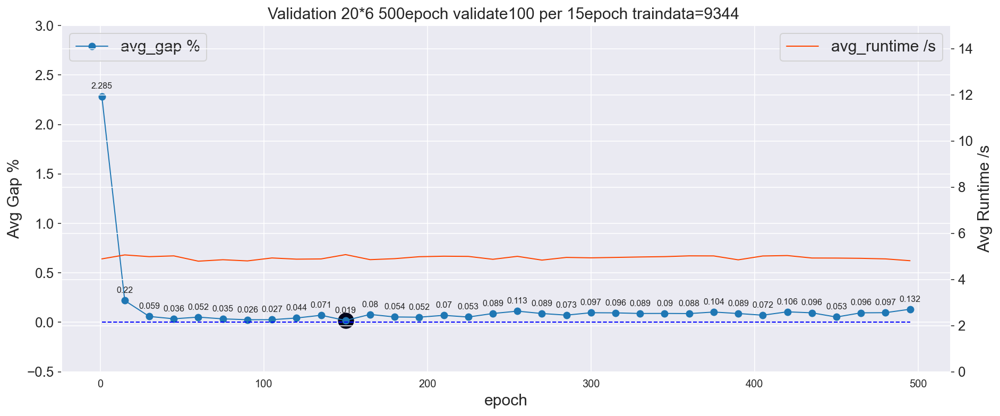

In [ ]:
sns.set_style('darkgrid')
fig, ax1 = plt.subplots(figsize=(15, 6), dpi=144) 
ax1.plot(epoch_idx_20x6_x100val_500epoch9344, avg_gap_20x6_x100val_500epoch9344, 'o-', label='avg_gap %', linewidth = 1) 
ax1.plot(epoch_idx_20x6_x100val_500epoch9344, auxiliary_0, 'b--', linewidth = 1)
plt.scatter(epoch_idx_20x6_x100val_500epoch9344[10], avg_gap_20x6_x100val_500epoch9344[10],s=200,c=1,marker='o') #"m"
for i in range(len(epoch_idx_20x6_x100val_500epoch9344)):
    plt.text(epoch_idx_20x6_x100val_500epoch9344[i], avg_gap_20x6_x100val_500epoch9344[i]+0.06, round(avg_gap_20x6_x100val_500epoch9344[i], 3)   , ha='center', va='bottom', fontsize=8)

plt.legend(loc=2,fontsize=15)
plt.yticks(size = 13)
ax2 = ax1.twinx() 
ax2.plot(epoch_idx_20x6_x100val_500epoch9344, avg_runtime_20x6_x100val_500epoch9344_, 'orangered',label='avg_runtime /s', linewidth = 1)
plt.legend(loc=1,fontsize=15)
plt.yticks(size = 13)
ax1.set_title("Validation 20*6 500epoch validate100 per 15epoch traindata=9344 ",size=15)  
ax1.set_xlabel("epoch",size=15)  
ax1.set_ylabel('Avg Gap %',size=15)
ax1.set_ylim(-0.5,3)
ax2.set_ylabel('Avg Runtime /s',size=15)
ax2.set_ylim(0,15)
#plt.grid() 
plt.show()

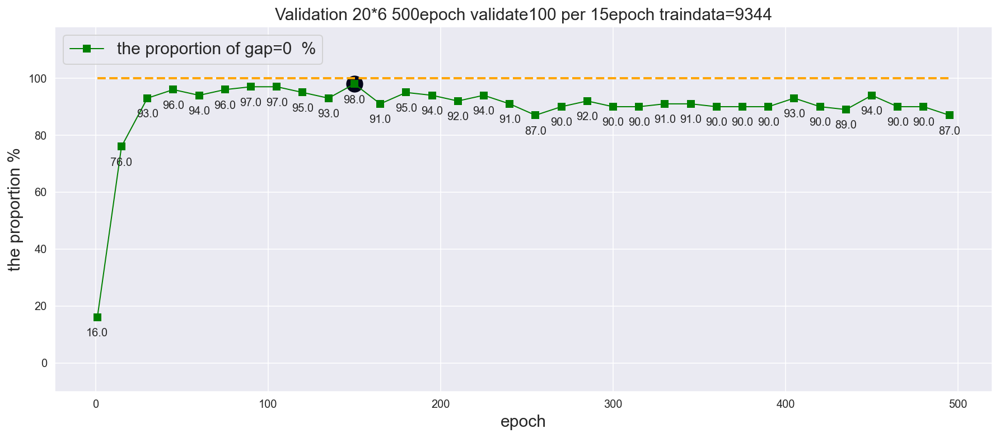

In [ ]:
fig, ax1 = plt.subplots(figsize=(15, 6), dpi=144) 
ax1.plot(epoch_idx_20x6_x100val_500epoch9344, gap0_proportion_20x6_x100val_500epoch9344, 'gs-',label='the proportion of gap=0  %', linewidth = 1)
ax1.plot(epoch_idx_20x6_x100val_500epoch9344, auxiliary_100, color='orange',linestyle='--', linewidth = 2)
for i in range(len(epoch_idx_20x6_x100val_500epoch9344)):
    plt.text(epoch_idx_20x6_x100val_500epoch9344[i], gap0_proportion_20x6_x100val_500epoch9344[i]-7.5, round(gap0_proportion_20x6_x100val_500epoch9344[i], 3)   , ha='center', va='bottom', fontsize=10)
plt.scatter(epoch_idx_20x6_x100val_500epoch9344[10], gap0_proportion_20x6_x100val_500epoch9344[10],s=200,c=1,marker='o') #"m"
plt.legend(loc=2,fontsize=15)

ax1.set_title("Validation 20*6 500epoch validate100 per 15epoch traindata=9344",size=15)  
ax1.set_xlabel("epoch",size=15)  
ax1.set_ylabel('the proportion %',size=15)
ax1.set_ylim(-10,118)
plt.grid() 
plt.show()

In [ ]:
epoch_idx_20x6_x100val_500epoch_colums=[]
for i in range(len((epoch_idx_20x6_x100val_500epoch9344))):
    epoch_idx_20x6_x100val_500epoch_colums.append(str(epoch_idx_20x6_x100val_500epoch9344[i]))
df_20x6_x100val_500epoch = pd.DataFrame(gap_distri_20x6_x100val_500epoch9344).T
df_20x6_x100val_500epoch.columns=epoch_idx_20x6_x100val_500epoch_colums
df_20x6_x100val_500epoch    

,1,15,30,45,60,75,90,105,120,135,...,360,375,390,405,420,435,450,465,480,495
0,3.460208,0.000000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,...,0.865052,0.00000,0.000000,0.865052,0.865052,0.00000,0.865052,0.865052,0.865052,0.865052
1,2.824859,0.941620,0.94162,0.94162,0.94162,0.94162,0.94162,0.94162,0.94162,0.94162,...,0.941620,0.94162,0.941620,0.941620,1.883239,0.94162,0.941620,0.941620,0.941620,0.941620
2,0.794913,0.794913,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,...,0.000000,0.00000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000
3,4.139073,0.000000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,...,0.000000,0.00000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000
4,4.332756,0.000000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,...,0.000000,0.00000,0.866551,0.000000,0.000000,0.00000,0.000000,0.866551,0.000000,0.866551
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.905797,0.000000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,...,0.000000,0.00000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000
96,4.655493,0.000000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,...,0.000000,0.00000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000
97,3.490401,0.872600,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,...,0.000000,0.00000,0.000000,0.000000,0.000000,0.00000,0.000000,0.872600,0.872600,0.000000
98,0.000000,0.838926,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,...,0.000000,0.00000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000


Text(0.5, 1.0, 'Scatter Validation 20*6 500epoch validate100 per 15epoch')

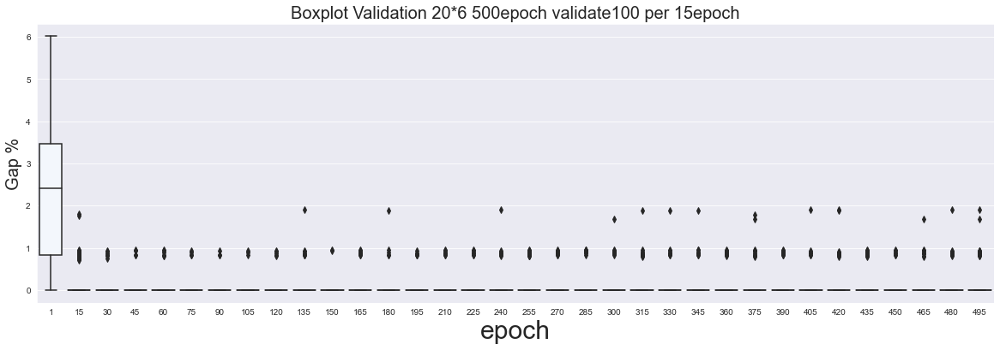

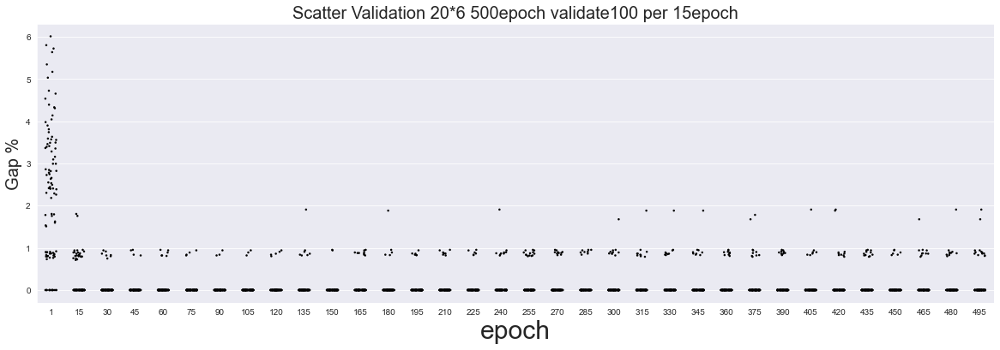

In [ ]:
#boxplot
plt.figure(figsize=(20,6))
#sns.set_style('darkgrid')
sns.boxplot(data=df_20x6_x100val_500epoch ,palette="Blues" ) # ,palette="Blues"  ,palette="Set2"
plt.ylabel("Gap %",fontsize=20)
plt.xlabel("epoch",fontsize=30)
plt.title('Boxplot Validation 20*6 500epoch validate100 per 15epoch',fontsize=20)
#stripplot  
plt.figure(figsize=(20,6))
sns.stripplot(data=df_20x6_x100val_500epoch,color="black", jitter=0.2, size=2.5 ) 
plt.ylabel("Gap %",fontsize=20)
plt.xlabel("epoch",fontsize=30)
plt.title('Scatter Validation 20*6 500epoch validate100 per 15epoch',fontsize=20)

In [ ]:
loss_RC_20x6_x100val_500epoch9344=[4610,3946,3677,3479,3298,3168,3120,2987,2945,2918,2856,2847,2826,2804,2801,2820,2799,2816,2837,2818,2813,2867,2839,2866,2836,2874,2862,2917,2878,2879,2974,2922,2934,2963]
loss_KLD_20x6_x100val_500epoch9344=[4.69,1332,2660,3711,4659,5419,5898,6265,6407,6778,6871,6977,7013,7152,7179,7284,7374,7263,7467,7402,7563,7363,7565,7561,7505,7523,7503,7667,7638,7517,7668,7662,7603,7595]
loss_20x6_x100val_500epoch9344=[]
loss_KLDwithWeight_20x6_x100val_500epoch9344=[]
for i in range(len(loss_RC_20x6_x100val_500epoch9344)):
    loss_20x6_x100val_500epoch9344.append(loss_RC_20x6_x100val_500epoch9344[i] + loss_KLD_20x6_x100val_500epoch9344[i] * config.KLD_weight)
    loss_KLDwithWeight_20x6_x100val_500epoch9344.append(loss_KLD_20x6_x100val_500epoch9344[i] * config.KLD_weight)

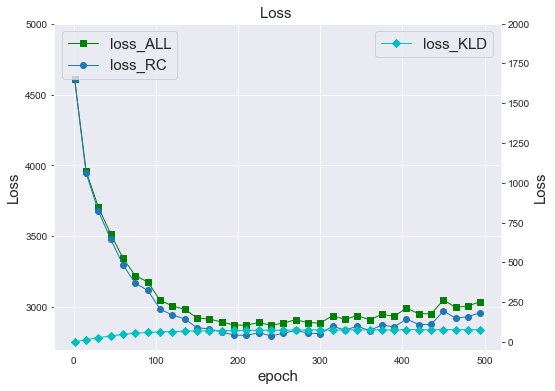

In [ ]:
fig, ax1 = plt.subplots(figsize=(8, 6), dpi=72) 
ax1.plot(epoch_idx_20x6_x100val_500epoch9344, loss_20x6_x100val_500epoch9344,'gs-', label='loss_ALL', linewidth = 1)
ax1.plot(epoch_idx_20x6_x100val_500epoch9344, loss_RC_20x6_x100val_500epoch9344, 'o-',label='loss_RC', linewidth = 1)
plt.legend(loc=2,fontsize=15)
ax2 = ax1.twinx() 
ax2.plot(epoch_idx_20x6_x100val_500epoch9344, loss_KLDwithWeight_20x6_x100val_500epoch9344,'cD-', label='loss_KLD', linewidth = 1)
plt.legend(loc=1,fontsize=15)
ax1.set_title("Loss ",size=15)  
ax1.set_xlabel("epoch",size=15)  
ax1.set_ylabel('Loss',size=15)
ax1.set_ylim(2700,5000)
ax2.set_ylabel('Loss',size=15)
ax2.set_ylim(-50,2000)
plt.grid() 
plt.show()

In [ ]:
loss_RC_20x6_x100val_500epoch9344_Divided=np.divide(loss_RC_20x6_x100val_500epoch9344, 128*20)
loss_RC_20x6_x100val_500epoch9344_Divided_probs=[]
for i in range(len(epoch_idx_20x6_x100val_500epoch9344)):
    loss_RC_20x6_x100val_500epoch9344_Divided_probs.append(pow(2.71828,-loss_RC_20x6_x100val_500epoch9344_Divided[i]))

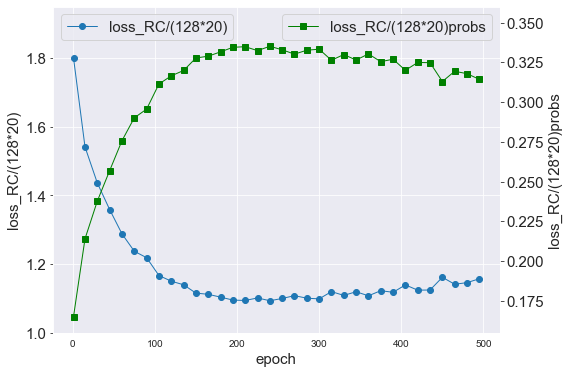

In [ ]:
fig, ax1 = plt.subplots(figsize=(8, 6), dpi=72) 
ax1.plot(epoch_idx_20x6_x100val_500epoch9344, loss_RC_20x6_x100val_500epoch9344_Divided,'o-', label='loss_RC/(128*20)', linewidth = 1)
plt.legend(loc=2,fontsize=15)
plt.yticks(size = 15)
ax2 = ax1.twinx() 
ax2.plot(epoch_idx_20x6_x100val_500epoch9344, loss_RC_20x6_x100val_500epoch9344_Divided_probs,'gs-', label='loss_RC/(128*20)probs', linewidth = 1)
plt.legend(loc=1,fontsize=15)
plt.yticks(size = 15)
ax1.set_ylim(1,1.95)
ax1.set_xlabel("epoch",size=15)  
ax1.set_ylabel('loss_RC/(128*20)',size=15)
ax2.set_ylabel('loss_RC/(128*20)probs',size=15)
ax2.set_ylim(0.155,0.36)
plt.grid() 
plt.show()

### epoch=300, validatedata=500 per 15 epoch

notice: this is the previous model validation (it has the restriction that it can only start from the first starting point in orginal paper).

In [ ]:
pickle_file = open(r"C:\Users\RI\jupyter\vae\flowdata\process_num=20x6(10000)\validation_solution_values_20x6(x500).pkl",'rb')
validation_solution_values_20x6_x500val_300epoch=pickle.load(pickle_file)
pickle_file.close()

pickle_file = open(r"C:\Users\RI\jupyter\vae\flowdata\process_num=20x6(10000)\validation_prediction_values_20x6(x500).pkl",'rb')
validation_prediction_values_20x6_x500val_300epoch=pickle.load(pickle_file)
pickle_file.close()

pickle_file = open(r"C:\Users\RI\jupyter\vae\flowdata\process_num=20x6(10000)\validation_prediction_runtime_values_20x6(x500).pkl",'rb')
validation_prediction_runtime_values_20x6_x500val_300epoch=pickle.load(pickle_file)
pickle_file.close()

In [ ]:
avg_gap_20x6_x500val_300epoch=[]
avg_runtime_20x6_x500val_300epoch=[]
gap_distri_20x6_x500val_300epoch=[]
for i in range(len(validation_prediction_values_20x6_x500val_300epoch)):
    gap=[]
    for j in range(len(validation_prediction_values_20x6_x500val_300epoch[i])):
        g=(abs((validation_prediction_values_20x6_x500val_300epoch[i][j]/validation_solution_values_20x6_x500val_300epoch[j])-1))*100
        gap.append(g)
    gap_distri_20x6_x500val_300epoch.append(gap) 
    avg_gap_20x6_x500val_300epoch.append(np.mean(gap))
    avg_runtime_20x6_x500val_300epoch.append(np.mean(validation_prediction_runtime_values_20x6_x500val_300epoch[i]))

gap0_proportion_20x6_x500val_300epoch=[]
for i in range(len(gap_distri_20x6_x500val_300epoch)):
    gap0_proportion_20x6_x500val_300epoch.append(gap_distri_20x6_x500val_300epoch[i].count(0)/500*100)

In [ ]:
df_20x6 = pd.DataFrame(gap_distri_20x6).T
df_20x6.columns=["1", "15","30", "45", "60", "75", "90", "105", "120", "135", "150", "165", "180", "195", "210", "225", "240", "255", "270", "285", "300"]
df_20x6

,1,15,30,45,60,75,90,105,120,135,...,165,180,195,210,225,240,255,270,285,300
0,2.595156,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.865052,0.000000,0.000000,0.000000,0.865052,0.000000
1,3.766478,2.824859,2.824859,2.824859,2.824859,2.824859,2.824859,2.824859,2.824859,2.824859,...,2.824859,2.824859,2.824859,2.824859,2.824859,2.824859,2.824859,2.824859,2.824859,2.824859
2,0.794913,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,2.483444,0.827815,0.827815,0.827815,0.827815,0.827815,0.827815,0.827815,0.827815,0.827815,...,0.827815,0.827815,0.827815,0.827815,0.827815,0.827815,0.827815,0.827815,0.827815,0.827815
4,2.599653,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,0.757576,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
496,3.795066,1.897533,0.948767,0.000000,0.948767,0.948767,0.948767,0.000000,0.000000,0.948767,...,0.948767,0.948767,0.948767,0.948767,0.948767,0.948767,0.000000,0.948767,0.948767,0.948767
497,2.415459,0.805153,0.805153,0.805153,0.805153,0.805153,0.805153,0.805153,0.805153,0.805153,...,0.805153,0.805153,0.805153,0.805153,0.805153,0.805153,0.805153,0.805153,0.805153,0.805153
498,3.961965,0.792393,0.792393,0.792393,0.792393,0.792393,0.792393,0.792393,0.792393,0.792393,...,0.792393,0.792393,0.792393,0.792393,0.792393,0.792393,0.792393,0.792393,0.792393,0.792393


Text(0.5, 1.0, 'scatter')

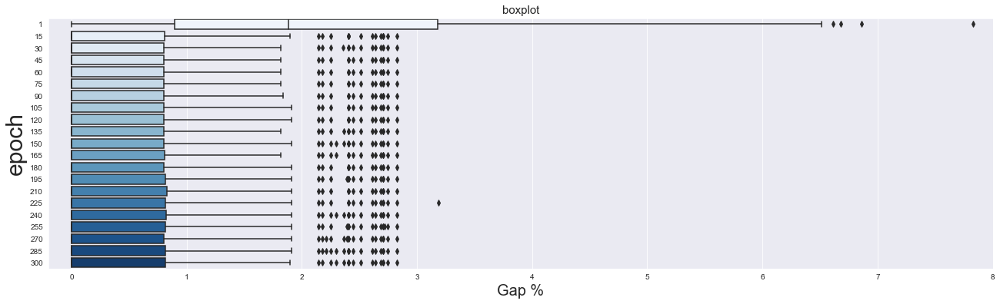

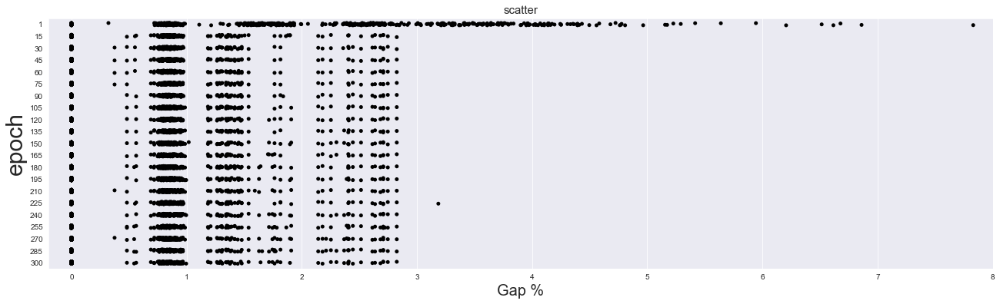

In [ ]:
#boxplot
plt.figure(figsize=(22,6))
#sns.set_style('darkgrid')
sns.boxplot(data=df, orient="h" ,palette="Blues" ) # ,palette="Blues"  ,palette="Set2"
plt.xlabel("Gap %",fontsize=20)
plt.ylabel("epoch",fontsize=30)
plt.xlim((-0.2, 8))
plt.title('boxplot',fontsize=15)
#stripplot
plt.figure(figsize=(22,6))
sns.stripplot(data=df, orient="h",color="black" ) # ,palette="Blues"  ,palette="Set2"
plt.xlabel("Gap %",fontsize=20)
plt.ylabel("epoch",fontsize=30)
plt.xlim((-0.2, 8))
plt.title('scatter',fontsize=15)


In [ ]:
epoch_idx_20x6=[1]
for i in range(15,301,15):
    epoch_idx_20x6.append(i)

In [ ]:
loss_RC_20x6=[4590,3871,3646,3423,3300,3201,3085,3043,2971,2948,2926,2868,2880,2846,2849,2817,2790,2776, 2800,2780,2784]
loss_KLD_20x6=[46,1452,3117,3707,4509,5188,5688,5985,6257,6774,6881,7001,7250,7325,7297,7373,7370,7451,7443,7672,7638]
loss_20x6=[]
loss_KLDwithWeight_20x6=[]
for i in range(len(loss_RC_20x6)):
    loss_20x6.append(loss_RC_20x6[i] + loss_KLD_20x6[i] * config.KLD_weight)
    loss_KLDwithWeight_20x6.append(loss_KLD_20x6[i] * config.KLD_weight)

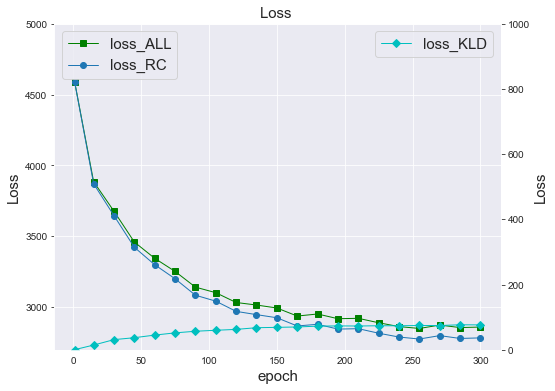

In [ ]:
fig, ax1 = plt.subplots(figsize=(8, 6), dpi=72) 
ax1.plot(epoch_idx_20x6, loss_20x6,'gs-', label='loss_ALL', linewidth = 1)
ax1.plot(epoch_idx_20x6, loss_RC_20x6, 'o-',label='loss_RC', linewidth = 1)
plt.legend(loc=2,fontsize=15)
ax2 = ax1.twinx() 
ax2.plot(epoch_idx_20x6, loss_KLDwithWeight_20x6,'cD-', label='loss_KLD', linewidth = 1)
plt.legend(loc=1,fontsize=15)
ax1.set_title("Loss ",size=15)  
ax1.set_xlabel("epoch",size=15)  
ax1.set_ylabel('Loss',size=15)
ax1.set_ylim(2700,5000)
ax2.set_ylabel('Loss',size=15)
ax2.set_ylim(0,1000)
plt.grid() 
plt.show()

In [ ]:
loss_RC_20x6_Divided=np.divide(loss_RC_20x6, 128*20)
loss_RC_20x6_Divided_probs=[]
for i in range(len(loss_RC_20x6)):
    loss_RC_20x6_Divided_probs.append(pow(2.71828,-loss_RC_20x6_Divided[i]))

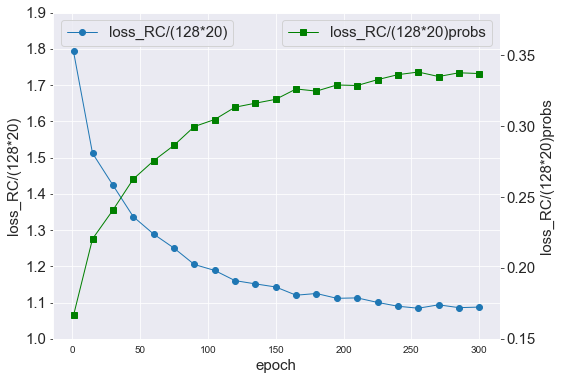

In [ ]:
fig, ax1 = plt.subplots(figsize=(8, 6), dpi=72) 
ax1.plot(epoch_idx_20x6, loss_RC_20x6_Divided,'o-', label='loss_RC/(128*20)', linewidth = 1)
plt.legend(loc=2,fontsize=15)
plt.yticks(size = 15)
ax2 = ax1.twinx() 
ax2.plot(epoch_idx_20x6, loss_RC_20x6_Divided_probs,'gs-', label='loss_RC/(128*20)probs', linewidth = 1)
plt.legend(loc=1,fontsize=15)
plt.yticks(size = 15)
ax1.set_ylim(1,1.9)
ax1.set_xlabel("epoch",size=15)  
ax1.set_ylabel('loss_RC/(128*20)',size=15)
ax2.set_ylabel('loss_RC/(128*20)probs',size=15)
ax2.set_ylim(0.15,0.38)
plt.grid() 
plt.show()

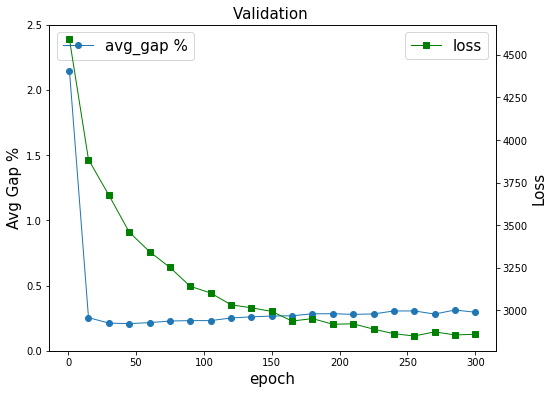

In [ ]:
fig, ax1 = plt.subplots(figsize=(8, 6), dpi=72) 
ax1.plot(epoch_idx, avg_gap, 'o-', label='avg_gap %', linewidth = 1) 
plt.legend(loc=2,fontsize=15)
ax2 = ax1.twinx() 
ax2.plot(epoch_idx, loss, 'gs-',label='loss', linewidth = 1)

plt.legend(loc=1,fontsize=15)
ax1.set_title("Validation ",size=15)  
ax1.set_xlabel("epoch",size=15)  
ax1.set_ylabel('Avg Gap %',size=15)
ax1.set_ylim(0,2.5)
ax2.set_ylabel('Loss',size=15)
plt.show()

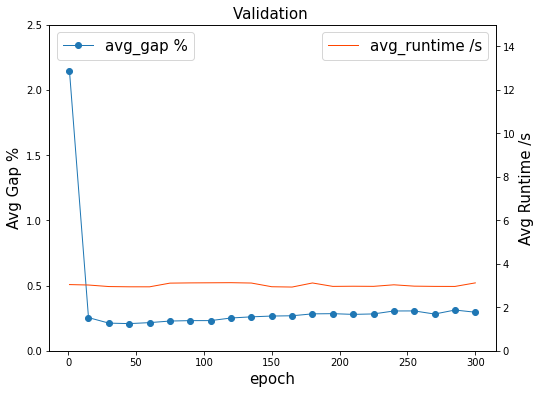

In [ ]:
fig, ax1 = plt.subplots(figsize=(8, 6), dpi=72) 
ax1.plot(epoch_idx, avg_gap, 'o-', label='avg_gap %', linewidth = 1) 
plt.legend(loc=2,fontsize=15)
ax2 = ax1.twinx() 
ax2.plot(epoch_idx, avg_runtime, 'orangered',label='avg_runtime /s', linewidth = 1)
plt.legend(loc=1,fontsize=15)
ax1.set_title("Validation ",size=15)  
ax1.set_xlabel("epoch",size=15)  
ax1.set_ylabel('Avg Gap %',size=15)
ax1.set_ylim(0,2.5)
ax2.set_ylabel('Avg Runtime /s',size=15)
ax2.set_ylim(0,15)
#plt.grid() 
plt.show()

### previous model vs current  model

previous :it has the restriction that it can only start from the first starting point in orginal paper.

current : Remove the restriction that it can only start from the first starting point,which is different from orginal paper

Text(0.5, 1.0, 'Avg Gap %  previous vs current')

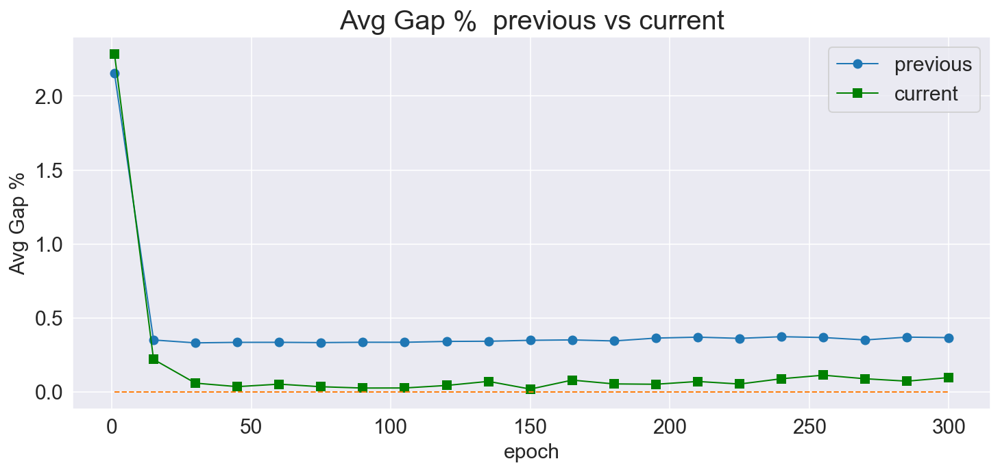

In [ ]:
plt.figure(figsize=(12, 5), dpi=144)
previous,=plt.plot(epoch_idx_20x6,avg_gap_20x6_x500val_300epoch,'o-',linewidth=1)
current,=plt.plot(epoch_idx_20x6,avg_gap_20x6_x100val_500epoch[:21],'gs-',linewidth=1)
plt.plot(epoch_idx_20x6, auxiliary_0[:21],'--', linewidth = 1)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel("epoch",fontsize=15)
plt.ylabel("Avg Gap %",fontsize=15)
plt.legend([previous,current],["previous","current"],fontsize=15,loc='upper right') 
plt.title("Avg Gap %  previous vs current",size=20)

Text(0.5, 1.0, 'The proportion of Gap=0  %  previous vs current')

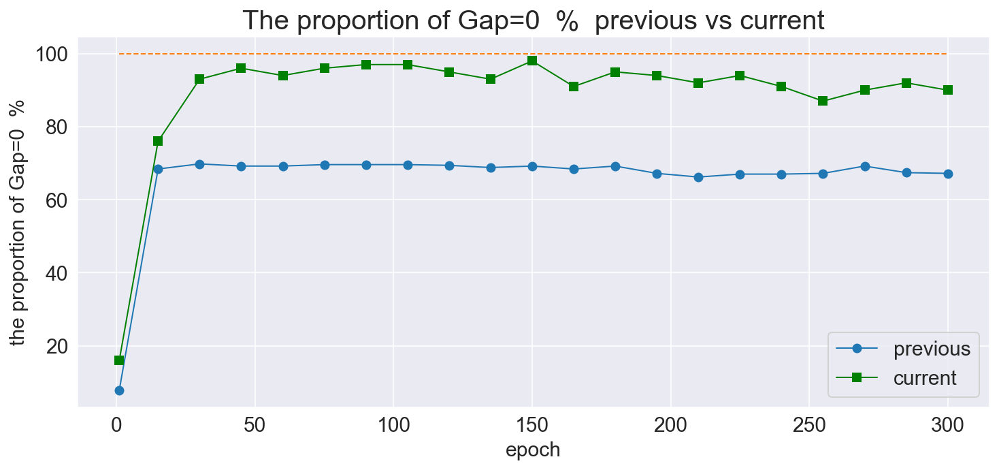

In [ ]:
plt.figure(figsize=(12, 5), dpi=144)
previous,=plt.plot(epoch_idx_20x6,gap0_proportion_20x6_x500val_300epoch,'o-',linewidth=1)
current,=plt.plot(epoch_idx_20x6,gap0_proportion_20x6_x100val_500epoch[:21],'gs-',linewidth=1)
plt.plot(epoch_idx_20x6, auxiliary_100[:21],'--', linewidth = 1)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel("epoch",fontsize=15)
plt.ylabel("the proportion of Gap=0  %",fontsize=15)
plt.legend([previous,current],["previous","current"],fontsize=15,loc='lower right') 
plt.title("The proportion of Gap=0  %  previous vs current",size=20)

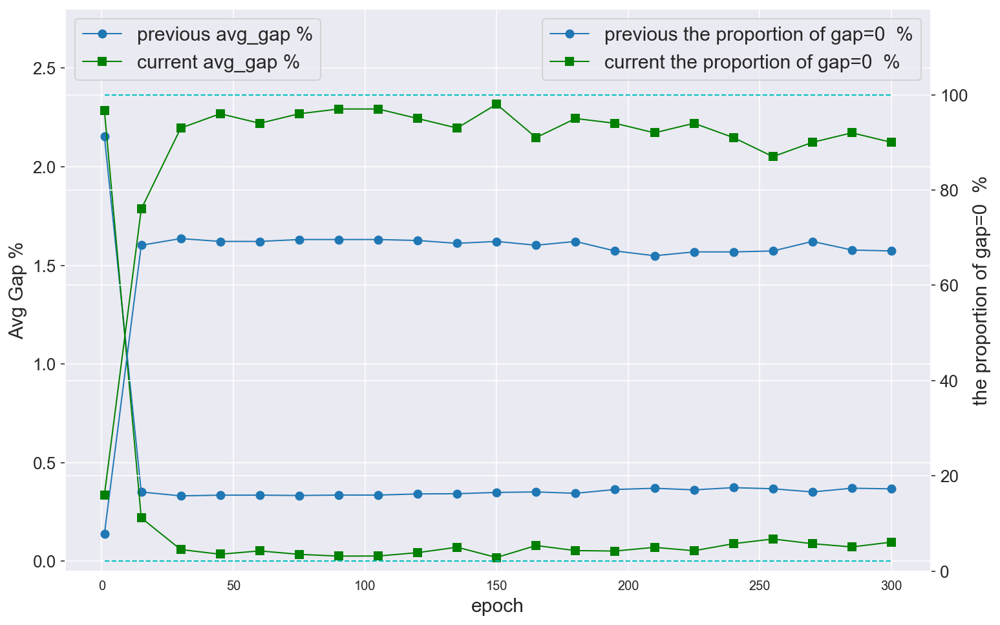

In [ ]:
fig, ax1 = plt.subplots(figsize=(12, 8), dpi=144) 
ax1.plot(epoch_idx_20x6, avg_gap_20x6_x500val_300epoch, 'o-', label='previous avg_gap %', linewidth = 1) 
ax1.plot(epoch_idx_20x6, avg_gap_20x6_x100val_500epoch[:21], 'gs-', label='current avg_gap %', linewidth = 1) 
ax1.plot(epoch_idx_20x6, auxiliary_0[:21],'c--', linewidth = 1)
plt.legend(loc=2,fontsize=15)
plt.yticks(size = 13)
ax2 = ax1.twinx() 
ax2.plot(epoch_idx_20x6, gap0_proportion_20x6_x500val_300epoch, 'o-',label='previous the proportion of gap=0  %', linewidth = 1)
ax2.plot(epoch_idx_20x6, gap0_proportion_20x6_x100val_500epoch[:21], 'gs-',label='current the proportion of gap=0  %', linewidth = 1)
ax2.plot(epoch_idx_20x6, auxiliary_100[:21], 'c--', linewidth = 1)
plt.legend(loc=1,fontsize=15)
plt.yticks(size = 13)
#ax1.set_title("Validation 20*6 500epoch validate100 per 15epoch ",size=15)  
ax1.set_xlabel("epoch",size=15)  
ax1.set_ylabel('Avg Gap %',size=15)
ax1.set_ylim(-0.05,2.8)
ax2.set_ylabel('the proportion of gap=0  %',size=15)
ax2.set_ylim(0,118)
#plt.grid() 
plt.show()

Text(0.5, 1.0, 'Loss previous vs current')

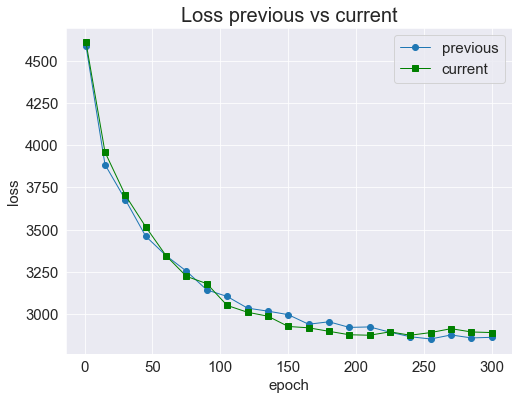

In [ ]:
plt.figure(figsize=(8, 6), dpi=72)
previous,=plt.plot(epoch_idx_20x6,loss_20x6,'o-',linewidth=1)
current,=plt.plot(epoch_idx_20x6,loss_20x6_x100val_500epoch[:21],'gs-',linewidth=1)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel("epoch",fontsize=15)
plt.ylabel("loss",fontsize=15)
plt.legend([previous,current],["previous","current"],fontsize=15,loc='upper right') 
plt.title("Loss previous vs current",size=20)

In [ ]:
fig, ax1 = plt.subplots(figsize=(8, 6), dpi=72) 
ax1.plot(epoch_idx_20x6, loss_20x6,'gs-', label='loss_ALL', linewidth = 1)
ax1.plot(epoch_idx_20x6, loss_RC_20x6, 'o-',label='loss_RC', linewidth = 1)
plt.legend(loc=2,fontsize=15)
ax2 = ax1.twinx() 
ax2.plot(epoch_idx_20x6, loss_KLDwithWeight_20x6,'cD-', label='loss_KLD', linewidth = 1)
plt.legend(loc=1,fontsize=15)
ax1.set_title("Loss ",size=15)  
ax1.set_xlabel("epoch",size=15)  
ax1.set_ylabel('Loss',size=15)
ax1.set_ylim(2700,5000)
ax2.set_ylabel('Loss',size=15)
ax2.set_ylim(0,1000)
plt.grid() 
plt.show()

### 9344traindata vs 28032 (traindata epoch=500 validatedata=100)

#### 28032 train data

In [ ]:
pickle_file = open(r"C:\Users\RI\jupyter\vae\flowdata\process_num=20x6(100000)\28032\validation_prediction_runtime_values_20x6(x100_500epoch)28032.pkl",'rb')
validation_prediction_runtime_values_20x6_x100val_500epoch28032=pickle.load(pickle_file)
pickle_file.close()

pickle_file = open(r"C:\Users\RI\jupyter\vae\flowdata\process_num=20x6(100000)\28032\validation_prediction_values_20x6(x100_500epoch)28032.pkl",'rb')
validation_prediction_values_20x6_x100val_500epoch28032=pickle.load(pickle_file)
pickle_file.close()

pickle_file = open(r"C:\Users\RI\jupyter\vae\flowdata\process_num=20x6(100000)\28032\validation_prediction_sequences_20x6(x100_500epoch)28032.pkl",'rb')
validation_prediction_sequences_20x6_x100val_500epoch28032=pickle.load(pickle_file)
pickle_file.close()

pickle_file = open(r"C:\Users\RI\jupyter\vae\flowdata\process_num=20x6(100000)\28032\validation_loss_KLDs_20x6(x100_500epoch)28032.pkl",'rb')
loss_KLDs_20x6_x100val_500epoch28032=pickle.load(pickle_file)
pickle_file.close()

pickle_file = open(r"C:\Users\RI\jupyter\vae\flowdata\process_num=20x6(100000)\28032\validation_loss_RCs_20x6(x100_500epoch)28032.pkl",'rb')
loss_RCs_20x6_x100val_500epoch28032=pickle.load(pickle_file)
pickle_file.close()

pickle_file = open(r"C:\Users\RI\jupyter\vae\flowdata\process_num=20x6(100000)\28032\validation_solution_groundtrue_values_20x6(x100_500epoch)28032.pkl",'rb')
validation_solution_groundtrue_values_20x6_x100val_500epoch28032=pickle.load(pickle_file)
pickle_file.close()

In [ ]:
loss_RC_20x6_x100val_500epoch28032=[]
loss_KLD_20x6_x100val_500epoch28032=[]
for i in epoch_idx_20x6_x100val_500epoch28032:
    loss_RC_20x6_x100val_500epoch28032.append(loss_RCs[i])
    loss_KLD_20x6_x100val_500epoch28032.append(loss_KLDs[i])

loss_20x6_x100val_500epoch28032=[]
loss_KLDwithWeight_20x6_x100val_500epoch28032=[]
for i in range(len(loss_RC_20x6_x100val_500epoch28032)):
    loss_20x6_x100val_500epoch28032.append(loss_RC_20x6_x100val_500epoch28032[i] + loss_KLD_20x6_x100val_500epoch28032[i] * config.KLD_weight)
    loss_KLDwithWeight_20x6_x100val_500epoch28032.append(loss_KLD_20x6_x100val_500epoch28032[i] * config.KLD_weight)

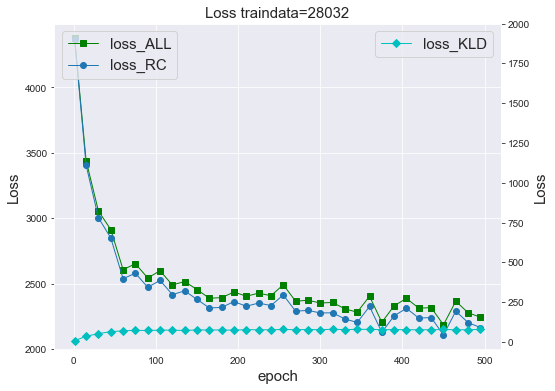

In [ ]:
fig, ax1 = plt.subplots(figsize=(8, 6), dpi=72) 
ax1.plot(epoch_idx_20x6_x100val_500epoch28032,loss_20x6_x100val_500epoch28032,'gs-', label='loss_ALL', linewidth = 1)
ax1.plot(epoch_idx_20x6_x100val_500epoch28032,loss_RC_20x6_x100val_500epoch28032, 'o-',label='loss_RC', linewidth = 1)
plt.legend(loc=2,fontsize=15)
ax2 = ax1.twinx() 
ax2.plot(epoch_idx_20x6_x100val_500epoch28032,loss_KLDwithWeight_20x6_x100val_500epoch28032,'cD-', label='loss_KLD', linewidth = 1)
plt.legend(loc=1,fontsize=15)
ax1.set_title("Loss traindata=28032",size=15)  
ax1.set_xlabel("epoch",size=15)  
ax1.set_ylabel('Loss',size=15)
#ax1.set_ylim(2700,5000)
ax2.set_ylabel('Loss',size=15)
ax2.set_ylim(-50,2000)
plt.grid() 
plt.show()

In [ ]:
loss_RC_20x6_x100val_500epoch28032_Divided=np.divide(loss_RC_20x6_x100val_500epoch28032, 128*20)
loss_RC_20x6_x100val_500epoch28032_Divided_probs=[]
for i in range(len(loss_RC_20x6_x100val_500epoch28032)):
    loss_RC_20x6_x100val_500epoch28032_Divided_probs.append(pow(2.71828,-loss_RC_20x6_x100val_500epoch28032_Divided[i]))

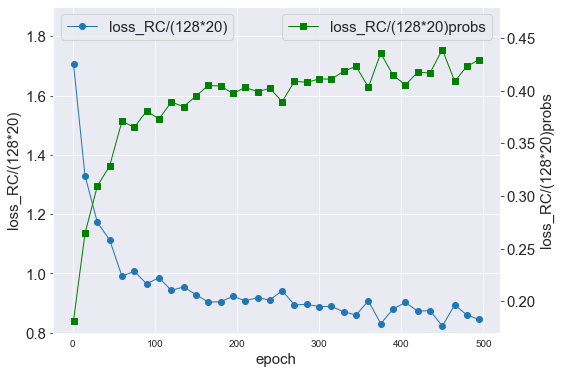

In [ ]:
fig, ax1 = plt.subplots(figsize=(8, 6), dpi=72) 
ax1.plot(epoch_idx_20x6_x100val_500epoch28032, loss_RC_20x6_x100val_500epoch28032_Divided,'o-', label='loss_RC/(128*20)', linewidth = 1)
plt.legend(loc=2,fontsize=15)
plt.yticks(size = 15)
ax2 = ax1.twinx() 
ax2.plot(epoch_idx_20x6_x100val_500epoch28032, loss_RC_20x6_x100val_500epoch28032_Divided_probs,'gs-', label='loss_RC/(128*20)probs', linewidth = 1)
plt.legend(loc=1,fontsize=15)
plt.yticks(size = 15)
ax1.set_ylim(0.8,1.9)
ax1.set_xlabel("epoch",size=15)  
ax1.set_ylabel('loss_RC/(128*20)',size=15)
ax2.set_ylabel('loss_RC/(128*20)probs',size=15)
ax2.set_ylim(0.17,0.48)
plt.grid() 
plt.show()

In [ ]:
avg_gap_20x6_x100val_500epoch28032=[]
avg_runtime_20x6_x100val_500epoch28032=[]
gap_distri_20x6_x100val_500epoch28032=[]
for i in range(len(validation_prediction_values_20x6_x100val_500epoch28032)):
    gap=[]
    for j in range(len(validation_prediction_values_20x6_x100val_500epoch28032[i])):
        g=((validation_prediction_values_20x6_x100val_500epoch28032[i][j]/validation_solution_groundtrue_values_20x6_x100val_500epoch28032[j])-1)*100
        gap.append(g)
    gap_distri_20x6_x100val_500epoch28032.append(gap) 
    avg_gap_20x6_x100val_500epoch28032.append(np.mean(gap))
    avg_runtime_20x6_x100val_500epoch28032.append(np.mean(validation_prediction_runtime_values_20x6_x100val_500epoch28032[i]))

gap0_proportion_20x6_x100val_500epoch28032=[]
gap_min_0_proportion_20x6_x100val_500epoch28032=[]
for i in range(len(gap_distri_20x6_x100val_500epoch28032)):
    gap0_proportion_20x6_x100val_500epoch28032.append((len([num for num in gap_distri_20x6_x100val_500epoch28032[i] if num == 0])/100)*100)
    gap_min_0_proportion_20x6_x100val_500epoch28032.append((len([num for num in gap_distri_20x6_x100val_500epoch28032[i] if num <= 0])/100)*100)     
    
epoch_idx_20x6_x100val_500epoch28032=[1]
for i in range(15,501,15):
    epoch_idx_20x6_x100val_500epoch28032.append(i)    
    
auxiliary_100=[]
for i in range(len(epoch_idx_20x6_x100val_500epoch28032)):
    auxiliary_100.append(100)
auxiliary_0=[]
for i in range(len(epoch_idx_20x6_x100val_500epoch28032)):
    auxiliary_0.append(0)        

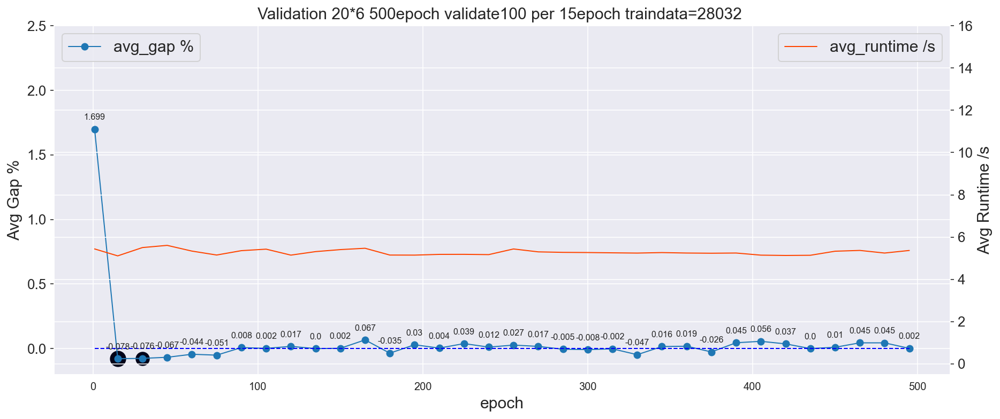

In [ ]:
sns.set_style('darkgrid')
#fig, ax1 = plt.subplots(figsize=(8, 6), dpi=72) 
fig, ax1 = plt.subplots(figsize=(15, 6), dpi=144) 
ax1.plot(epoch_idx_20x6_x100val_500epoch28032, avg_gap_20x6_x100val_500epoch28032, 'o-', label='avg_gap %', linewidth = 1) 
ax1.plot(epoch_idx_20x6_x100val_500epoch28032, auxiliary_0, 'b--', linewidth = 1)
plt.scatter(epoch_idx_20x6_x100val_500epoch28032[2], avg_gap_20x6_x100val_500epoch28032[2],s=150,c=1,marker='o') #"m"
plt.scatter(epoch_idx_20x6_x100val_500epoch28032[1], avg_gap_20x6_x100val_500epoch28032[1],s=200,c=1,marker='o') #"m"

for i in range(len(epoch_idx_20x6_x100val_500epoch28032)):
    plt.text(epoch_idx_20x6_x100val_500epoch28032[i], avg_gap_20x6_x100val_500epoch28032[i]+0.06, round(avg_gap_20x6_x100val_500epoch28032[i], 3)   , ha='center', va='bottom', fontsize=8)

plt.legend(loc=2,fontsize=15)
plt.yticks(size = 13)
ax2 = ax1.twinx() 
ax2.plot(epoch_idx_20x6_x100val_500epoch28032, avg_runtime_20x6_x100val_500epoch28032, 'orangered',label='avg_runtime /s', linewidth = 1)
plt.legend(loc=1,fontsize=15)
plt.yticks(size = 13)
ax1.set_title("Validation 20*6 500epoch validate100 per 15epoch traindata=28032 ",size=15)  
ax1.set_xlabel("epoch",size=15)  
ax1.set_ylabel('Avg Gap %',size=15)
ax1.set_ylim(-0.2,2.5)
ax2.set_ylabel('Avg Runtime /s',size=15)
ax2.set_ylim(-0.5,16)
#plt.grid() 
plt.show()

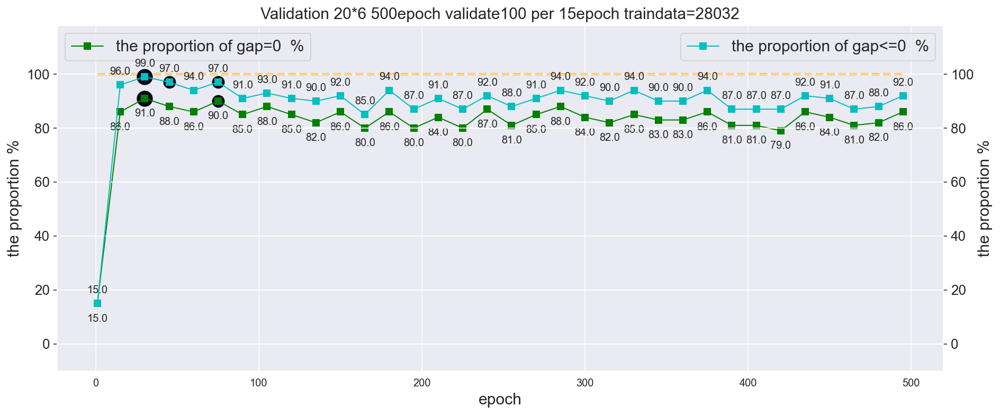

In [ ]:
fig, ax1 = plt.subplots(figsize=(15, 6), dpi=144) 
ax1.plot(epoch_idx_20x6_x100val_500epoch28032, gap0_proportion_20x6_x100val_500epoch28032, 'gs-',label='the proportion of gap=0  %', linewidth = 1)
ax1.plot(epoch_idx_20x6_x100val_500epoch28032, auxiliary_100, color='orange',linestyle='--', linewidth = 2)
for i in range(len(epoch_idx_20x6_x100val_500epoch28032)):
    plt.text(epoch_idx_20x6_x100val_500epoch28032[i], gap0_proportion_20x6_x100val_500epoch28032[i]-7.5, round(gap0_proportion_20x6_x100val_500epoch28032[i], 3)   , ha='center', va='bottom', fontsize=10)
plt.scatter(epoch_idx_20x6_x100val_500epoch28032[2], gap0_proportion_20x6_x100val_500epoch28032[2],s=200,c=1,marker='o') #"m"
plt.scatter(epoch_idx_20x6_x100val_500epoch28032[5], gap0_proportion_20x6_x100val_500epoch28032[5],s=120,c=1,marker='o') #"m"

plt.legend(loc=2,fontsize=15)
plt.yticks(size = 13)
ax2 = ax1.twinx() 
ax2.plot(epoch_idx_20x6_x100val_500epoch28032, gap_min_0_proportion_20x6_x100val_500epoch28032, 'cs-',label='the proportion of gap<=0  %', linewidth = 1)
for i in range(len(epoch_idx_20x6_x100val_500epoch28032)):
    plt.text(epoch_idx_20x6_x100val_500epoch28032[i], gap_min_0_proportion_20x6_x100val_500epoch28032[i]+3, round(gap_min_0_proportion_20x6_x100val_500epoch28032[i], 3)   , ha='center', va='bottom', fontsize=10)
plt.scatter(epoch_idx_20x6_x100val_500epoch28032[2], gap_min_0_proportion_20x6_x100val_500epoch28032[2],s=200,c=1,marker='o') #"m"
plt.scatter(epoch_idx_20x6_x100val_500epoch28032[3], gap_min_0_proportion_20x6_x100val_500epoch28032[3],s=120,c=1,marker='o') #"m"
plt.scatter(epoch_idx_20x6_x100val_500epoch28032[5], gap_min_0_proportion_20x6_x100val_500epoch28032[5],s=120,c=1,marker='o') #"m"

plt.legend(loc=1,fontsize=15)
plt.yticks(size = 13)
ax1.set_title("Validation 20*6 500epoch validate100 per 15epoch traindata=28032",size=15)  
ax1.set_xlabel("epoch",size=15)  
ax1.set_ylabel('the proportion %',size=15)
ax1.set_ylim(-10,118)
ax2.set_ylabel('the proportion %',size=15)
ax2.set_ylim(-10,118)
#plt.grid() 
plt.show()

In [ ]:
epoch_idx_20x6_x100val_500epoch28032_colums=[]
for i in range(len((epoch_idx_20x6_x100val_500epoch28032))):
    epoch_idx_20x6_x100val_500epoch28032_colums.append(str(epoch_idx_20x6_x100val_500epoch28032[i]))
df_20x6_x100val_500epoch28032 = pd.DataFrame(gap_distri_20x6_x100val_500epoch28032).T
df_20x6_x100val_500epoch28032.columns=epoch_idx_20x6_x100val_500epoch28032_colums
df_20x6_x100val_500epoch28032  

,1,15,30,45,60,75,90,105,120,135,...,360,375,390,405,420,435,450,465,480,495
0,1.652893,0.0,0.0,0.0,0.00000,0.00000,0.000000,0.0,0.0,0.000000,...,0.000000,0.0,0.00000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.0
1,2.228826,0.0,0.0,0.0,0.00000,0.00000,0.000000,0.0,0.0,0.000000,...,0.000000,0.0,0.00000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.0
2,2.613240,0.0,0.0,0.0,0.00000,0.00000,0.000000,0.0,0.0,0.000000,...,0.000000,0.0,0.00000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.0
3,1.650165,0.0,0.0,0.0,0.00000,0.00000,0.000000,0.0,0.0,0.000000,...,0.000000,0.0,0.00000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.0
4,0.754148,0.0,0.0,0.0,0.00000,0.00000,0.000000,0.0,0.0,0.000000,...,0.000000,0.0,0.00000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.850340,0.0,0.0,0.0,0.00000,0.00000,0.000000,0.0,0.0,0.000000,...,0.000000,0.0,0.00000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.0
96,0.920810,0.0,0.0,0.0,-0.92081,-0.92081,0.000000,0.0,0.0,-0.920810,...,0.000000,0.0,-0.92081,0.0,0.920810,0.0,0.000000,0.000000,0.000000,0.0
97,0.825083,0.0,0.0,0.0,0.00000,0.00000,0.000000,0.0,0.0,0.000000,...,0.000000,0.0,0.00000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.0
98,3.120125,0.0,0.0,0.0,0.00000,0.00000,0.780031,0.0,0.0,0.780031,...,0.780031,0.0,0.00000,0.0,0.780031,0.0,0.780031,0.780031,0.780031,0.0


Text(0.5, 1.0, 'Scatter Validation 20*6 500epoch validate100 per 15epoch traindata=28032')

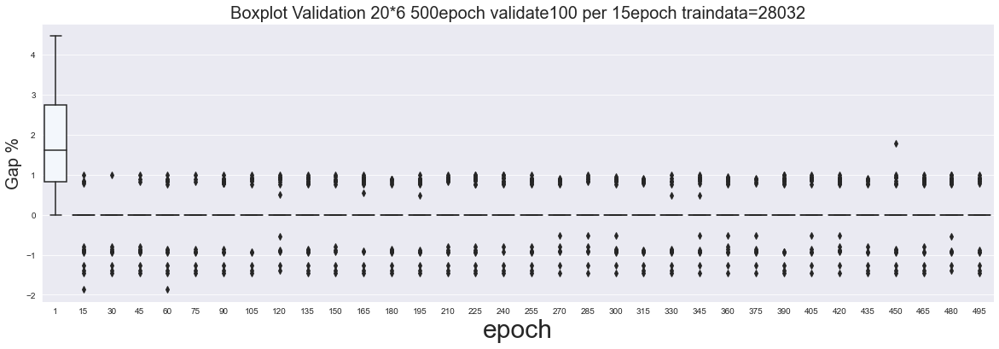

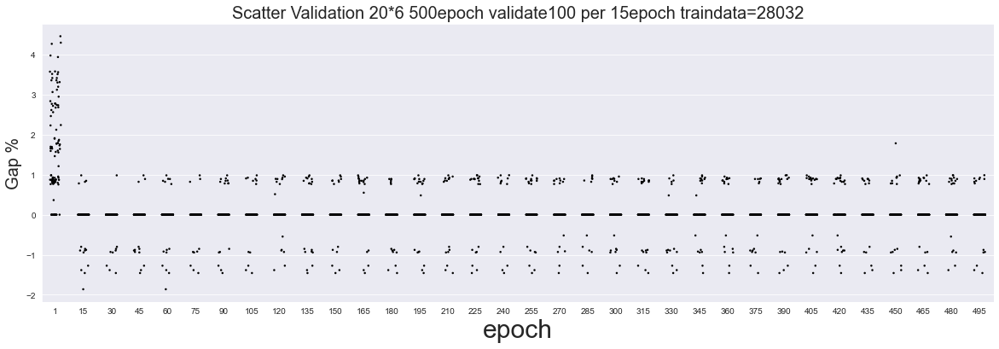

In [ ]:
#boxplot
plt.figure(figsize=(20,6))
#sns.set_style('darkgrid')
sns.boxplot(data=df_20x6_x100val_500epoch28032 ,palette="Blues" ) # ,palette="Blues"  ,palette="Set2"
plt.ylabel("Gap %",fontsize=20)
plt.xlabel("epoch",fontsize=30)
#plt.xlim((-0.2, 8))
plt.title('Boxplot Validation 20*6 500epoch validate100 per 15epoch traindata=28032',fontsize=20)
#stripplot  
plt.figure(figsize=(20,6))
sns.stripplot(data=df_20x6_x100val_500epoch28032,color="black", jitter=0.2, size=2.5 ) 
plt.ylabel("Gap %",fontsize=20)
plt.xlabel("epoch",fontsize=30)
#plt.xlim((-0.2, 8))
plt.title('Scatter Validation 20*6 500epoch validate100 per 15epoch traindata=28032',fontsize=20)

#### looking for are there the same sequence with the same value ?

In [ ]:
sequenceGap0predict=[]
sequenceGap0groundtrue=[]
for j in range(len(gap_distri_20x6_x100val_500epoch28032)):
    sequenceGap0predict_=[]
    sequenceGap0groundtrue_=[]
    for i in range(len(gap_distri_20x6_x100val_500epoch28032[j])):
        if  gap_distri_20x6_x100val_500epoch28032[j][i]==0:
            sequenceGap0predict_.append(predict_solutions[j][i])
            sequenceGap0groundtrue_.append(validation_datasolution_sequence_20[i])
    sequenceGap0predict.append(sequenceGap0predict_)
    sequenceGap0groundtrue.append(sequenceGap0groundtrue_)

In [ ]:
for i in range(len(sequenceGap0predict)):
    for j in range(len(sequenceGap0predict[i])):
        if sequenceGap0predict[i][j]==sequenceGap0groundtrue[i][j]:
            print("yes")

no

#### training data28032 vs training data 9344

Text(0.5, 1.0, 'Avg Gap %  train data=9344 vs train data=28032')

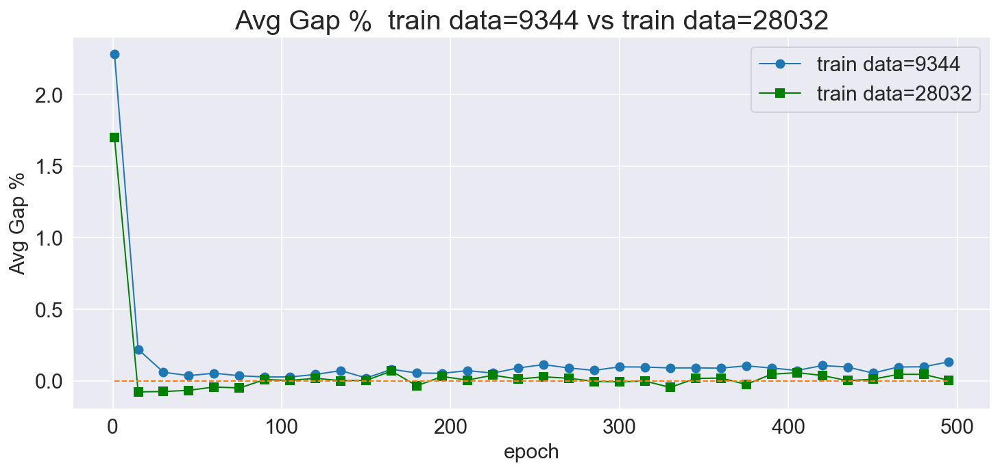

In [ ]:
plt.figure(figsize=(12, 5), dpi=144)
traindata9344,=plt.plot(epoch_idx_20x6_x100val_500epoch9344,avg_gap_20x6_x100val_500epoch9344,'o-',linewidth=1)
traindata28032,=plt.plot(epoch_idx_20x6_x100val_500epoch28032,avg_gap_20x6_x100val_500epoch28032,'gs-',linewidth=1)
plt.plot(epoch_idx_20x6_x100val_500epoch9344, auxiliary_0,'--', linewidth = 1)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel("epoch",fontsize=15)
plt.ylabel("Avg Gap %",fontsize=15)
plt.legend([traindata9344,traindata28032],["train data=9344","train data=28032"],fontsize=15,loc='upper right') 
plt.title("Avg Gap %  train data=9344 vs train data=28032",size=20)

Text(0.5, 1.0, 'The proportion of Gap= / <=0  %  train data=9344 vs train data=28032')

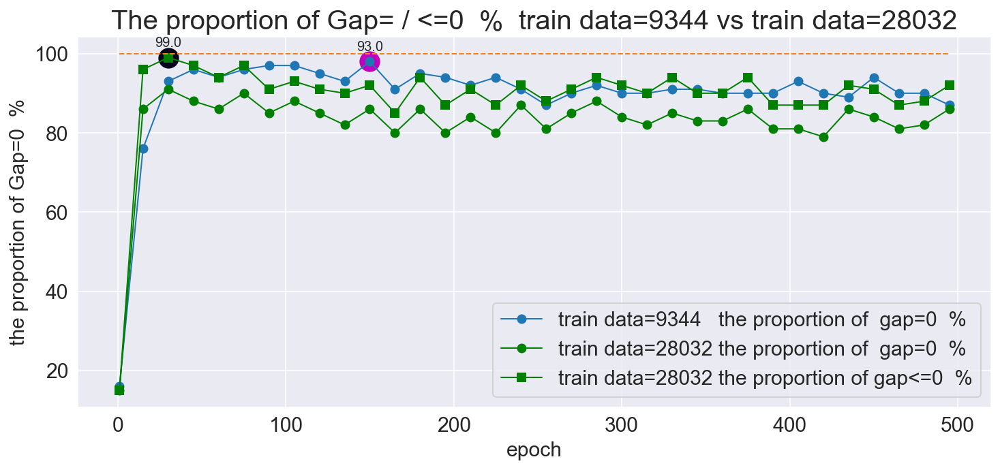

In [ ]:
plt.figure(figsize=(12, 5), dpi=144)
traindata9344gap0_proportion,=plt.plot(epoch_idx_20x6_x100val_500epoch9344,gap0_proportion_20x6_x100val_500epoch9344,'o-',linewidth=1)
traindata28032gap0_proportion,=plt.plot(epoch_idx_20x6_x100val_500epoch28032,gap0_proportion_20x6_x100val_500epoch28032,'go-',linewidth=1)
traindata28032gap_min_0_proportion,=plt.plot(epoch_idx_20x6_x100val_500epoch28032,gap_min_0_proportion_20x6_x100val_500epoch28032,'gs-',linewidth=1)

plt.text(epoch_idx_20x6_x100val_500epoch28032[2], gap_min_0_proportion_20x6_x100val_500epoch28032[2]+2, round(gap_min_0_proportion_20x6_x100val_500epoch28032[2], 3)   , ha='center', va='bottom', fontsize=10)
plt.scatter(epoch_idx_20x6_x100val_500epoch28032[2], gap_min_0_proportion_20x6_x100val_500epoch28032[2],s=200,c=1,marker='o') #"m"

plt.text(epoch_idx_20x6_x100val_500epoch28032[10], gap0_proportion_20x6_x100val_500epoch9344[10]+2, round(gap0_proportion_20x6_x100val_500epoch9344[9], 3)   , ha='center', va='bottom', fontsize=10)
plt.scatter(epoch_idx_20x6_x100val_500epoch28032[10], gap0_proportion_20x6_x100val_500epoch9344[10],s=200,c="m",marker='o') #"m"

plt.plot(epoch_idx_20x6_x100val_500epoch9344, auxiliary_100,'--', linewidth = 1)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel("epoch",fontsize=15)
plt.ylabel("the proportion of Gap=0  %",fontsize=15)
plt.legend([traindata9344gap0_proportion,traindata28032gap0_proportion,traindata28032gap_min_0_proportion],["train data=9344   the proportion of  gap=0  %","train data=28032 the proportion of  gap=0  %","train data=28032 the proportion of gap<=0  %"],fontsize=15,loc='lower right') 
plt.title("The proportion of Gap= / <=0  %  train data=9344 vs train data=28032",size=20)

Text(0.5, 1.0, 'Loss   train data=9344 vs train data=28032')

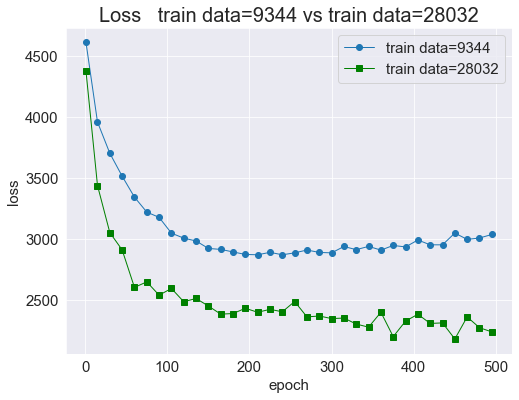

In [ ]:
plt.figure(figsize=(8, 6), dpi=72)
traindata9344,=plt.plot(epoch_idx_20x6_x100val_500epoch9344,loss_20x6_x100val_500epoch9344,'o-',linewidth=1)
traindata28032,=plt.plot(epoch_idx_20x6_x100val_500epoch28032,loss_20x6_x100val_500epoch28032,'gs-',linewidth=1)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel("epoch",fontsize=15)
plt.ylabel("loss",fontsize=15)
plt.legend([traindata9344,traindata28032],["train data=9344","train data=28032"],fontsize=15,loc='upper right') 
plt.title("Loss   train data=9344 vs train data=28032",size=20)

Text(0.5, 1.0, 'Loss   train data=9344 vs train data=28032')

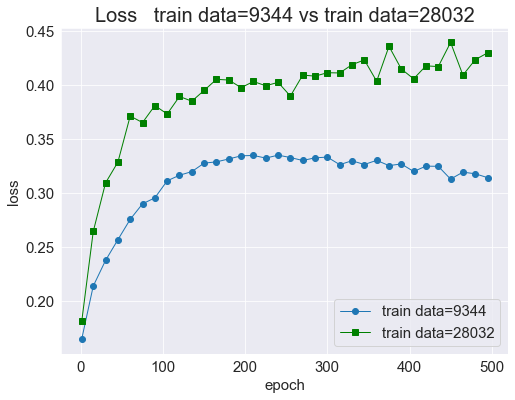

In [ ]:
plt.figure(figsize=(8, 6), dpi=72)
traindata9344,=plt.plot(epoch_idx_20x6_x100val_500epoch9344,loss_RC_20x6_x100val_500epoch9344_Divided_probs,'o-',linewidth=1)
traindata28032,=plt.plot(epoch_idx_20x6_x100val_500epoch28032,loss_RC_20x6_x100val_500epoch28032_Divided_probs,'gs-',linewidth=1)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel("epoch",fontsize=15)
plt.ylabel("loss",fontsize=15)
plt.legend([traindata9344,traindata28032],["train data=9344","train data=28032"],fontsize=15,loc='lower right') 
plt.title("Loss   train data=9344 vs train data=28032",size=20)

### penalty epoch=500, validatedata=100 per 15 epoch

In [ ]:
pickle_file = open(r"/home/nagashijun/cvae/flowdata/process_num=20x6(100000)/28032/penalty_validation_prediction_runtime_values_20x6(x100_500epoch)28032.pkl",'rb')
penalty_validation_prediction_runtime_values_20x6_x100val_500epoch28032=pickle.load(pickle_file)
pickle_file.close()

pickle_file = open(r"/home/nagashijun/cvae/flowdata/process_num=20x6(100000)/28032/penalty_validation_prediction_values_20x6(x100_500epoch)28032.pkl",'rb')
penalty_validation_prediction_values_20x6_x100val_500epoch28032=pickle.load(pickle_file)
pickle_file.close()

pickle_file = open(r"/home/nagashijun/cvae/flowdata/process_num=20x6(100000)/28032/penalty_validation_prediction_sequences_20x6(x100_500epoch)28032.pkl",'rb')
penalty_validation_prediction_sequences_20x6_x100val_500epoch28032=pickle.load(pickle_file)
pickle_file.close()

pickle_file = open(r"/home/nagashijun/cvae/flowdata/process_num=20x6(100000)/28032/penalty_validation_loss_KLDs_20x6(x100_500epoch)28032.pkl",'rb')
penalty_loss_KLDs_20x6_x100val_500epoch28032=pickle.load(pickle_file)
pickle_file.close()

pickle_file = open(r"/home/nagashijun/cvae/flowdata/process_num=20x6(100000)/28032/penalty_validation_loss_RCs_20x6(x100_500epoch)28032.pkl",'rb')
penalty_loss_RCs_20x6_x100val_500epoch28032=pickle.load(pickle_file)
pickle_file.close()

pickle_file = open(r"/home/nagashijun/cvae/flowdata/process_num=20x6(100000)/28032/penalty_validation_solution_groundtrue_values_20x6(x100_500epoch)28032.pkl",'rb')
penalty_validation_solution_groundtrue_values_20x6_x100val_500epoch28032=pickle.load(pickle_file)
pickle_file.close()

pickle_file = open(r"/home/nagashijun/cvae/flowdata/process_num=20x6(100000)/28032/penalty_validation_solution_groundtrue_sequences_20x6(x100_500epoch)28032.pkl",'rb')
penalty_validation_solution_groundtrue_sequences_20x6_x100val_500epoch28032=pickle.load(pickle_file)
pickle_file.close()

In [ ]:
penalty_avg_gap_20x6_x100val_500epoch28032=[]
penalty_avg_runtime_20x6_x100val_500epoch28032=[]
penalty_gap_distri_20x6_x100val_500epoch28032=[]
for i in range(len(penalty_validation_prediction_values_20x6_x100val_500epoch28032)):
    gap=[]
    for j in range(len(penalty_validation_prediction_values_20x6_x100val_500epoch28032[i])):
        g=((penalty_validation_prediction_values_20x6_x100val_500epoch28032[i][j]/penalty_validation_solution_groundtrue_values_20x6_x100val_500epoch28032[j])-1)*100
        gap.append(g)
    penalty_gap_distri_20x6_x100val_500epoch28032.append(gap) 
    penalty_avg_gap_20x6_x100val_500epoch28032.append(np.mean(gap))
    penalty_avg_runtime_20x6_x100val_500epoch28032.append(np.mean(penalty_validation_prediction_runtime_values_20x6_x100val_500epoch28032[i]))

penalty_gap0_proportion_20x6_x100val_500epoch28032=[]
penalty_gap_min_0_proportion_20x6_x100val_500epoch28032=[]
for i in range(len(penalty_gap_distri_20x6_x100val_500epoch28032)):
    penalty_gap0_proportion_20x6_x100val_500epoch28032.append((len([num for num in penalty_gap_distri_20x6_x100val_500epoch28032[i] if num == 0])/100)*100)
    penalty_gap_min_0_proportion_20x6_x100val_500epoch28032.append((len([num for num in penalty_gap_distri_20x6_x100val_500epoch28032[i] if num <= 0])/100)*100)     
    
penalty_epoch_idx_20x6_x100val_500epoch28032=[1]
for i in range(15,501,15):
    penalty_epoch_idx_20x6_x100val_500epoch28032.append(i)    
penalty_epoch_idx_20x6_x100val_500epoch28032.append(500)          

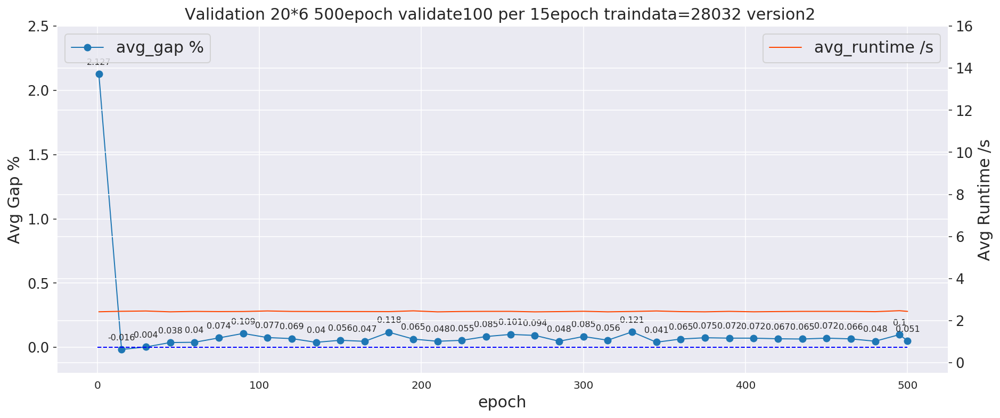

In [ ]:
sns.set_style('darkgrid')
fig, ax1 = plt.subplots(figsize=(15, 6), dpi=144) 
ax1.plot(penalty_epoch_idx_20x6_x100val_500epoch28032, penalty_avg_gap_20x6_x100val_500epoch28032, 'o-', label='avg_gap %', linewidth = 1) 
ax1.plot([0,500], [0,0], 'b--', linewidth = 1)
for i in range(len(penalty_epoch_idx_20x6_x100val_500epoch28032)):
    plt.text(penalty_epoch_idx_20x6_x100val_500epoch28032[i], penalty_avg_gap_20x6_x100val_500epoch28032[i]+0.06, round(penalty_avg_gap_20x6_x100val_500epoch28032[i], 3)   , ha='center', va='bottom', fontsize=8)

plt.legend(loc=2,fontsize=15)
plt.yticks(size = 13)
ax2 = ax1.twinx() 
ax2.plot(penalty_epoch_idx_20x6_x100val_500epoch28032, penalty_avg_runtime_20x6_x100val_500epoch28032, 'orangered',label='avg_runtime /s', linewidth = 1)
plt.legend(loc=1,fontsize=15)
plt.yticks(size = 13)
ax1.set_title("Validation 20*6 500epoch validate100 per 15epoch traindata=28032 version2 ",size=15)  
ax1.set_xlabel("epoch",size=15)  
ax1.set_ylabel('Avg Gap %',size=15)
ax1.set_ylim(-0.2,2.5)
ax2.set_ylabel('Avg Runtime /s',size=15)
ax2.set_ylim(-0.5,16)
plt.grid() 
plt.show()

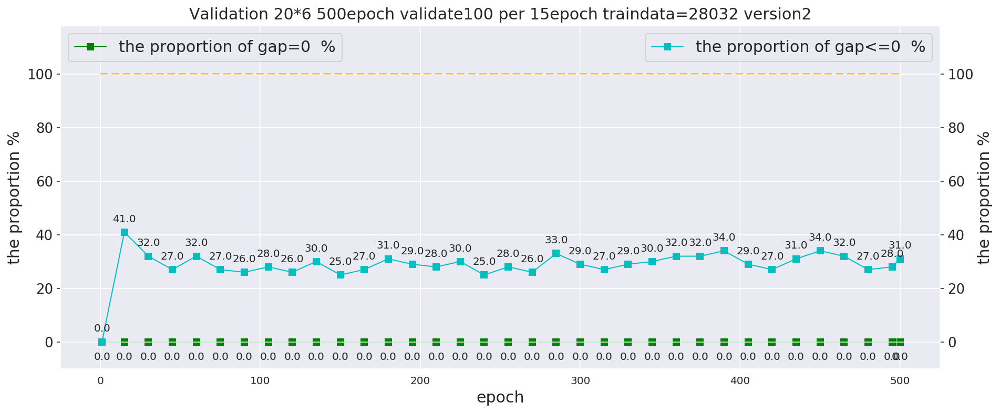

In [ ]:
fig, ax1 = plt.subplots(figsize=(15, 6), dpi=144) 
ax1.plot(penalty_epoch_idx_20x6_x100val_500epoch28032, penalty_gap0_proportion_20x6_x100val_500epoch28032, 'gs-',label='the proportion of gap=0  %', linewidth = 1)
ax1.plot([0,500], [100,100], color='orange',linestyle='--', linewidth = 2)

for i in range(len(penalty_epoch_idx_20x6_x100val_500epoch28032)):
    plt.text(penalty_epoch_idx_20x6_x100val_500epoch28032[i], penalty_gap0_proportion_20x6_x100val_500epoch28032[i]-7.5, round(penalty_gap0_proportion_20x6_x100val_500epoch28032[i], 3)   , ha='center', va='bottom', fontsize=10)

plt.legend(loc=2,fontsize=15)
plt.yticks(size = 13)
ax2 = ax1.twinx() 
ax2.plot(penalty_epoch_idx_20x6_x100val_500epoch28032, penalty_gap_min_0_proportion_20x6_x100val_500epoch28032, 'cs-',label='the proportion of gap<=0  %', linewidth = 1)
for i in range(len(penalty_epoch_idx_20x6_x100val_500epoch28032)):
    plt.text(penalty_epoch_idx_20x6_x100val_500epoch28032[i], penalty_gap_min_0_proportion_20x6_x100val_500epoch28032[i]+3, round(penalty_gap_min_0_proportion_20x6_x100val_500epoch28032[i], 3)   , ha='center', va='bottom', fontsize=10)

plt.legend(loc=1,fontsize=15)
plt.yticks(size = 13)
ax1.set_title("Validation 20*6 500epoch validate100 per 15epoch traindata=28032 version2",size=15)  
ax1.set_xlabel("epoch",size=15)  
ax1.set_ylabel('the proportion %',size=15)
ax1.set_ylim(-10,118)
ax2.set_ylabel('the proportion %',size=15)
ax2.set_ylim(-10,118)
plt.grid() 
plt.show()

In [ ]:
penalty_epoch_idx_20x6_x100val_500epoch28032_colums=[]
for i in range(len((penalty_epoch_idx_20x6_x100val_500epoch28032))):
    penalty_epoch_idx_20x6_x100val_500epoch28032_colums.append(str(penalty_epoch_idx_20x6_x100val_500epoch28032[i]))
penalty_df_20x6_x100val_500epoch28032 = pd.DataFrame(penalty_gap_distri_20x6_x100val_500epoch28032).T
penalty_df_20x6_x100val_500epoch28032.columns=penalty_epoch_idx_20x6_x100val_500epoch28032_colums
penalty_df_20x6_x100val_500epoch28032

,1,15,30,45,60,75,90,105,120,135,...,375,390,405,420,435,450,465,480,495,500
0,1.661467,0.000016,-4.546487e-06,0.000006,-0.000005,-0.000005,0.000006,0.000016,0.000006,0.000006,...,0.000016,-0.000005,0.000016,-0.000005,0.000016,-0.000005,0.000006,0.000016,0.000006,0.000016
1,0.028072,0.000312,3.080434e-05,0.000022,0.000004,0.000276,0.000303,0.000049,0.000004,0.000022,...,0.000004,0.000140,0.000004,0.000004,0.000004,0.000004,0.000140,0.000013,0.000013,0.000004
2,3.492443,-0.000831,-7.995501e-04,0.000540,0.000242,-0.000800,0.001114,0.005442,0.005442,0.005283,...,0.000157,0.000551,0.005431,0.010014,-0.000831,0.005442,-0.000534,0.000923,-0.000523,0.000870
3,3.306879,-0.001149,7.243388e-04,0.000765,-0.001471,-0.001189,0.000865,0.000765,0.000855,-0.001461,...,-0.001189,0.000865,-0.000907,-0.001189,-0.001078,-0.001471,-0.001078,0.000755,0.000855,-0.000897
4,0.780556,0.000513,6.232939e-05,0.000007,0.000007,0.000467,0.000357,0.000053,0.000026,0.000035,...,0.000016,0.000007,0.000007,0.000339,0.000016,0.000007,0.000016,0.000007,0.000007,0.000026
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,1.725792,0.000380,1.616555e-04,0.000037,0.000265,0.000151,0.000162,0.000276,0.000203,0.000515,...,0.000566,0.000359,0.000047,0.000214,0.000380,0.000027,0.001802,0.000027,0.000037,0.000162
96,2.768870,-0.915605,5.404674e-05,0.000032,0.000110,0.000054,0.000043,-0.000002,0.000290,0.000032,...,0.000009,0.000223,0.004606,-0.000002,-0.920696,0.000223,-0.920696,0.001043,0.000054,0.000223
97,1.658710,0.000672,-2.852038e-06,0.000007,0.000178,0.000027,0.000017,0.000420,-0.000003,-0.000003,...,-0.000003,0.000007,0.000501,0.000037,0.000058,-0.000003,0.000058,0.000007,0.000027,-0.000003
98,2.368384,0.000018,-6.935545e-07,0.000009,0.029136,0.000009,0.780006,0.012606,0.000009,0.000009,...,0.004646,0.780025,0.780044,0.012768,0.002656,0.004865,0.029183,0.004646,0.004351,0.004646


Text(0.5, 1.0, 'Scatter Validation 20*6 500epoch validate100 per 15epoch traindata=28032 version2')

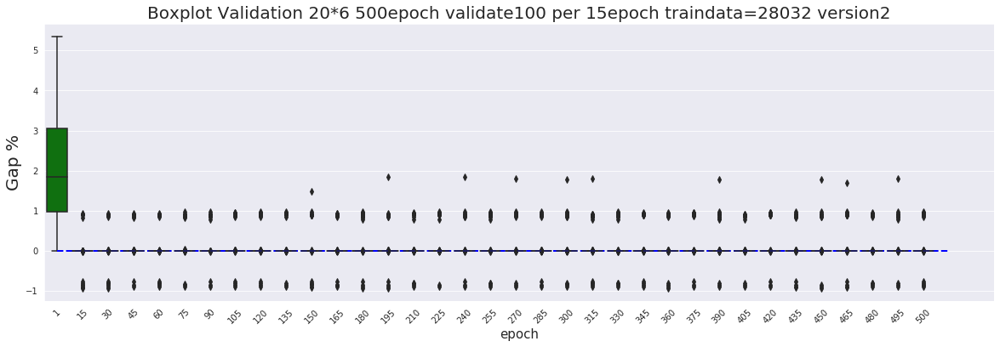

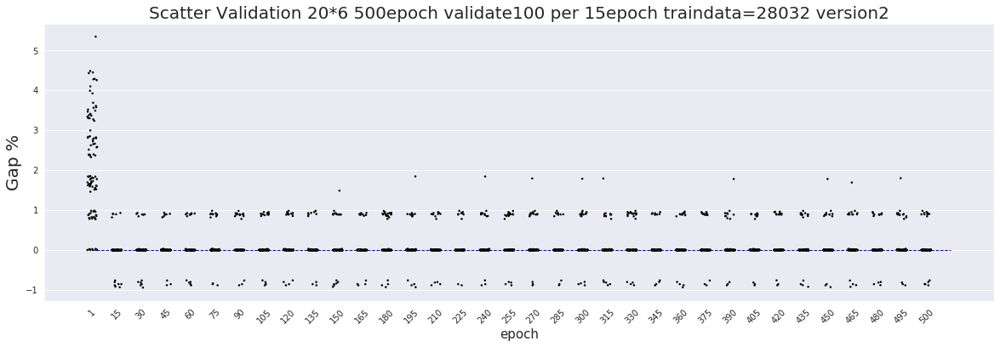

In [ ]:
#boxplot
plt.figure(figsize=(20,6))
#sns.set_style('darkgrid')
boxplot=sns.boxplot(data=penalty_df_20x6_x100val_500epoch28032 ,color="green" ) # ,palette="Blues"  ,palette="Set2"
plt.plot([0,35],[0,0],linewidth=2,linestyle='--',color="blue")
plt.ylabel("Gap %",fontsize=20)
plt.xlabel("epoch",fontsize=15)
boxplot.set_xticklabels(boxplot.get_xticklabels(), rotation=45)    
plt.title('Boxplot Validation 20*6 500epoch validate100 per 15epoch traindata=28032 version2',fontsize=20)
#stripplot  
plt.figure(figsize=(20,6))
stripplot=sns.stripplot(data=penalty_df_20x6_x100val_500epoch28032,color="black", jitter=0.2, size=2.5 ) 
plt.plot([0,35],[0,0],linewidth=1,linestyle='--',color="blue")
plt.ylabel("Gap %",fontsize=20)
plt.xlabel("epoch",fontsize=15)
stripplot.set_xticklabels(stripplot.get_xticklabels(), rotation=45)    
plt.title('Scatter Validation 20*6 500epoch validate100 per 15epoch traindata=28032 version2',fontsize=20)

In [ ]:
int_penalty_validation_prediction_values_20x6_x100val_500epoch28032=[]
for i in range(len(penalty_validation_prediction_values_20x6_x100val_500epoch28032)):
    l=[]
    for j in range(len(penalty_validation_prediction_values_20x6_x100val_500epoch28032[0])):
        l.append(int(penalty_validation_prediction_values_20x6_x100val_500epoch28032[i][j]))
    int_penalty_validation_prediction_values_20x6_x100val_500epoch28032.append(l)

In [ ]:
int_penalty_validation_solution_groundtrue_values_20x6_x100val_500epoch28032=[]
for i in range(len(penalty_validation_solution_groundtrue_values_20x6_x100val_500epoch28032)):
    int_penalty_validation_solution_groundtrue_values_20x6_x100val_500epoch28032.append(int(penalty_validation_solution_groundtrue_values_20x6_x100val_500epoch28032[i]))

In [ ]:
int_penalty_avg_gap_20x6_x100val_500epoch28032=[]
int_penalty_gap_distri_20x6_x100val_500epoch28032=[]
for i in range(len(int_penalty_validation_prediction_values_20x6_x100val_500epoch28032)):
    gap=[]
    for j in range(len(int_penalty_validation_prediction_values_20x6_x100val_500epoch28032[i])):
        g=((int_penalty_validation_prediction_values_20x6_x100val_500epoch28032[i][j]/int_penalty_validation_solution_groundtrue_values_20x6_x100val_500epoch28032[j])-1)*100
        gap.append(g)
    int_penalty_gap_distri_20x6_x100val_500epoch28032.append(gap) 
    int_penalty_avg_gap_20x6_x100val_500epoch28032.append(np.mean(gap))

int_penalty_gap0_proportion_20x6_x100val_500epoch28032=[]
int_penalty_gap_min_0_proportion_20x6_x100val_500epoch28032=[]
for i in range(len(int_penalty_gap_distri_20x6_x100val_500epoch28032)):
    int_penalty_gap0_proportion_20x6_x100val_500epoch28032.append((len([num for num in int_penalty_gap_distri_20x6_x100val_500epoch28032[i] if num == 0])/100)*100)
    int_penalty_gap_min_0_proportion_20x6_x100val_500epoch28032.append((len([num for num in int_penalty_gap_distri_20x6_x100val_500epoch28032[i] if num <= 0])/100)*100)     
    
penalty_epoch_idx_20x6_x100val_500epoch28032=[1]
for i in range(15,501,15):
    penalty_epoch_idx_20x6_x100val_500epoch28032.append(i)    
penalty_epoch_idx_20x6_x100val_500epoch28032.append(500)          

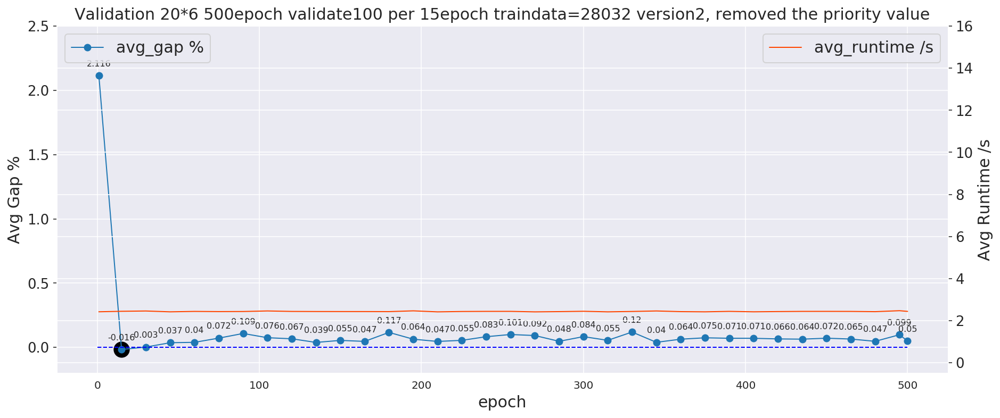

In [ ]:
sns.set_style('darkgrid')
#fig, ax1 = plt.subplots(figsize=(8, 6), dpi=72) 
fig, ax1 = plt.subplots(figsize=(15, 6), dpi=144) 
ax1.plot(penalty_epoch_idx_20x6_x100val_500epoch28032, int_penalty_avg_gap_20x6_x100val_500epoch28032, 'o-', label='avg_gap %', linewidth = 1) 
ax1.plot([0,500], [0,0], 'b--', linewidth = 1)

plt.scatter(penalty_epoch_idx_20x6_x100val_500epoch28032[1], int_penalty_avg_gap_20x6_x100val_500epoch28032[1],s=200,color="black",marker='o') #"m"
for i in range(len(penalty_epoch_idx_20x6_x100val_500epoch28032)):
    plt.text(penalty_epoch_idx_20x6_x100val_500epoch28032[i], int_penalty_avg_gap_20x6_x100val_500epoch28032[i]+0.06, round(int_penalty_avg_gap_20x6_x100val_500epoch28032[i], 3)   , ha='center', va='bottom', fontsize=8)

plt.legend(loc=2,fontsize=15)
plt.yticks(size = 13)
ax2 = ax1.twinx() 
ax2.plot(penalty_epoch_idx_20x6_x100val_500epoch28032, penalty_avg_runtime_20x6_x100val_500epoch28032, 'orangered',label='avg_runtime /s', linewidth = 1)
plt.legend(loc=1,fontsize=15)
plt.yticks(size = 13)
ax1.set_title("Validation 20*6 500epoch validate100 per 15epoch traindata=28032 version2, removed the priority value",size=15)  
ax1.set_xlabel("epoch",size=15)  
ax1.set_ylabel('Avg Gap %',size=15)
ax1.set_ylim(-0.2,2.5)
ax2.set_ylabel('Avg Runtime /s',size=15)
ax2.set_ylim(-0.5,16)
#plt.grid() 
plt.show()

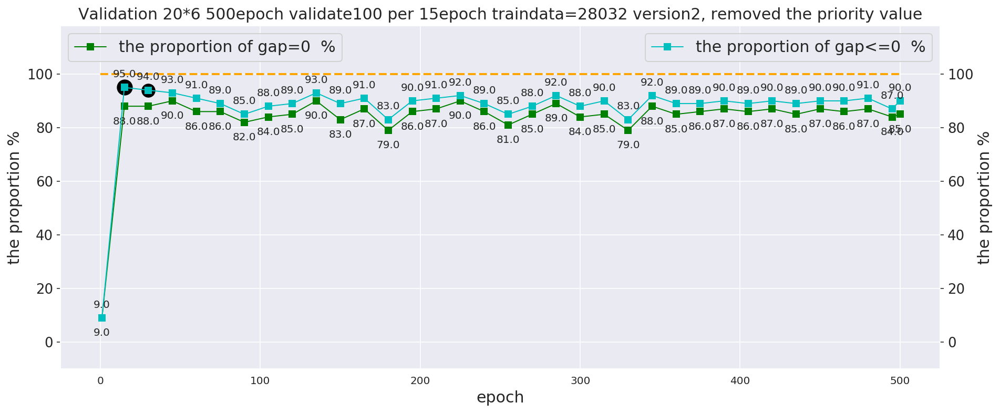

In [ ]:
fig, ax1 = plt.subplots(figsize=(15, 6), dpi=144) 
ax1.plot(penalty_epoch_idx_20x6_x100val_500epoch28032, int_penalty_gap0_proportion_20x6_x100val_500epoch28032, 'gs-',label='the proportion of gap=0  %', linewidth = 1)
ax1.plot([0,500], [100,100], color='orange',linestyle='--', linewidth = 2)
for i in range(len(penalty_epoch_idx_20x6_x100val_500epoch28032)):
    plt.text(penalty_epoch_idx_20x6_x100val_500epoch28032[i], int_penalty_gap0_proportion_20x6_x100val_500epoch28032[i]-7.5, round(int_penalty_gap0_proportion_20x6_x100val_500epoch28032[i], 3)   , ha='center', va='bottom', fontsize=10)

plt.legend(loc=2,fontsize=15)
plt.yticks(size = 13)
ax2 = ax1.twinx() 
ax2.plot(penalty_epoch_idx_20x6_x100val_500epoch28032, int_penalty_gap_min_0_proportion_20x6_x100val_500epoch28032, 'cs-',label='the proportion of gap<=0  %', linewidth = 1)

plt.scatter(penalty_epoch_idx_20x6_x100val_500epoch28032[2], int_penalty_gap_min_0_proportion_20x6_x100val_500epoch28032[2],s=150,color="black",marker='o') #"m"
plt.scatter(penalty_epoch_idx_20x6_x100val_500epoch28032[1], int_penalty_gap_min_0_proportion_20x6_x100val_500epoch28032[1],s=200,color="black",marker='o') #"m"
for i in range(len(penalty_epoch_idx_20x6_x100val_500epoch28032)):
    plt.text(penalty_epoch_idx_20x6_x100val_500epoch28032[i], int_penalty_gap_min_0_proportion_20x6_x100val_500epoch28032[i]+3, round(int_penalty_gap_min_0_proportion_20x6_x100val_500epoch28032[i], 3)   , ha='center', va='bottom', fontsize=10)

plt.legend(loc=1,fontsize=15)
plt.yticks(size = 13)
ax1.set_title("Validation 20*6 500epoch validate100 per 15epoch traindata=28032 version2, removed the priority value",size=15)  
ax1.set_xlabel("epoch",size=15)  
ax1.set_ylabel('the proportion %',size=15)
ax1.set_ylim(-10,118)
ax2.set_ylabel('the proportion %',size=15)
ax2.set_ylim(-10,118)
plt.grid() 
plt.show()

In [ ]:
penalty_loss_RC_20x6_x100val_500epoch28032=[]
penalty_loss_KLD_20x6_x100val_500epoch28032=[]
for i in penalty_epoch_idx_20x6_x100val_500epoch28032:
    penalty_loss_RC_20x6_x100val_500epoch28032.append(penalty_loss_RCs_20x6_x100val_500epoch28032[i-1])
    penalty_loss_KLD_20x6_x100val_500epoch28032.append(penalty_loss_KLDs_20x6_x100val_500epoch28032[i-1])

penalty_loss_20x6_x100val_500epoch28032=[]
penalty_loss_KLDwithWeight_20x6_x100val_500epoch28032=[]
for i in range(len(penalty_loss_RC_20x6_x100val_500epoch28032)):
    penalty_loss_20x6_x100val_500epoch28032.append(penalty_loss_RC_20x6_x100val_500epoch28032[i] + penalty_loss_KLD_20x6_x100val_500epoch28032[i] * config.KLD_weight)
    penalty_loss_KLDwithWeight_20x6_x100val_500epoch28032.append(penalty_loss_KLD_20x6_x100val_500epoch28032[i] * config.KLD_weight)

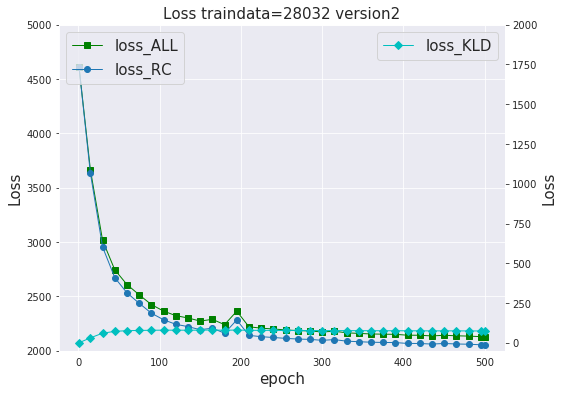

In [ ]:
fig, ax1 = plt.subplots(figsize=(8, 6), dpi=72) 
ax1.plot(penalty_epoch_idx_20x6_x100val_500epoch28032,penalty_loss_20x6_x100val_500epoch28032,'gs-', label='loss_ALL', linewidth = 1)
ax1.plot(penalty_epoch_idx_20x6_x100val_500epoch28032,penalty_loss_RC_20x6_x100val_500epoch28032, 'o-',label='loss_RC', linewidth = 1)
plt.legend(loc=2,fontsize=15)
ax2 = ax1.twinx() 
ax2.plot(penalty_epoch_idx_20x6_x100val_500epoch28032,penalty_loss_KLDwithWeight_20x6_x100val_500epoch28032,'cD-', label='loss_KLD', linewidth = 1)
plt.legend(loc=1,fontsize=15)
ax1.set_title("Loss traindata=28032 version2",size=15)  
ax1.set_xlabel("epoch",size=15)  
ax1.set_ylabel('Loss',size=15)
ax1.set_ylim(2000,5000)
ax2.set_ylabel('Loss',size=15)
ax2.set_ylim(-50,2000)
plt.grid() 
plt.show()

In [ ]:
penalty_loss_RC_20x6_x100val_500epoch28032_Divided=np.divide(penalty_loss_RC_20x6_x100val_500epoch28032, 128*20)
penalty_loss_RC_20x6_x100val_500epoch28032_Divided_probs=[]
for i in range(len(penalty_loss_RC_20x6_x100val_500epoch28032)):
    penalty_loss_RC_20x6_x100val_500epoch28032_Divided_probs.append(pow(2.71828,-penalty_loss_RC_20x6_x100val_500epoch28032_Divided[i]))

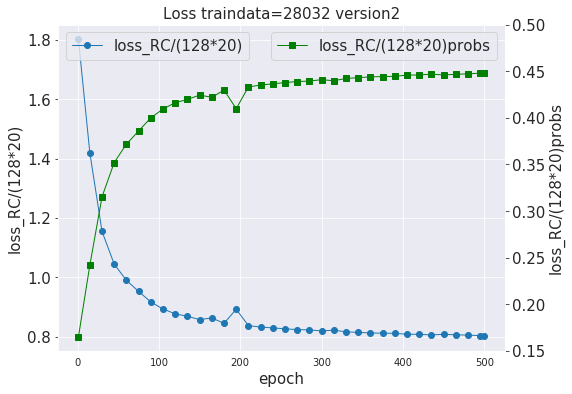

In [ ]:
fig, ax1 = plt.subplots(figsize=(8, 6), dpi=72) 
ax1.plot(penalty_epoch_idx_20x6_x100val_500epoch28032, penalty_loss_RC_20x6_x100val_500epoch28032_Divided,'o-', label='loss_RC/(128*20)', linewidth = 1)
plt.legend(loc=2,fontsize=15)
plt.yticks(size = 15)
ax2 = ax1.twinx() 
ax2.plot(penalty_epoch_idx_20x6_x100val_500epoch28032, penalty_loss_RC_20x6_x100val_500epoch28032_Divided_probs,'gs-', label='loss_RC/(128*20)probs', linewidth = 1)
plt.legend(loc=1,fontsize=15)
plt.yticks(size = 15)
#ax1.set_ylim(0.8,1.9)
ax1.set_title("Loss traindata=28032 version2",size=15)  
ax1.set_xlabel("epoch",size=15)  
ax1.set_ylabel('loss_RC/(128*20)',size=15)
ax2.set_ylabel('loss_RC/(128*20)probs',size=15)
ax2.set_ylim(0.15,0.5)
plt.grid() 
plt.show()

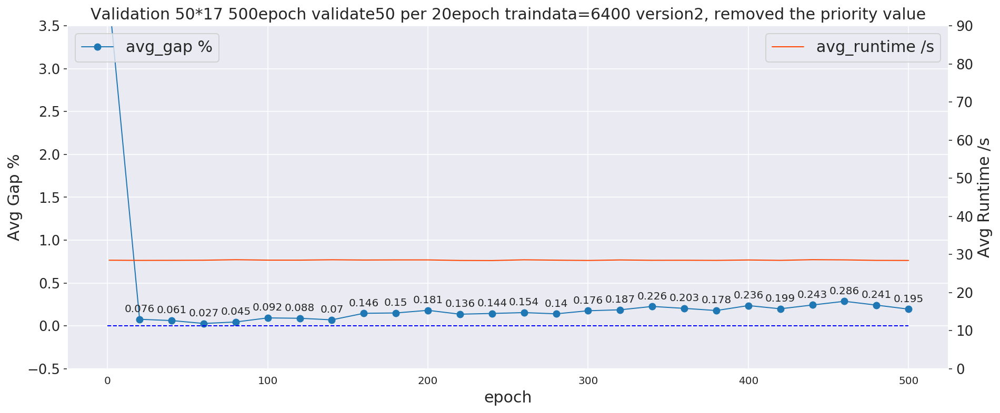

In [ ]:
sns.set_style('darkgrid')
fig, ax1 = plt.subplots(figsize=(15, 6), dpi=144) 
ax1.plot(penalty_epoch_idx_50x17_x50val_500epoch6400, int_penalty_avg_gap_50x17_x50val_500epoch6400, 'o-', label='avg_gap %', linewidth = 1) 
ax1.plot([0,500], [0,0], 'b--', linewidth = 1)

for i in range(len(penalty_epoch_idx_50x17_x50val_500epoch6400)-1):
    plt.text(penalty_epoch_idx_50x17_x50val_500epoch6400[i+1], int_penalty_avg_gap_50x17_x50val_500epoch6400[i+1]+0.06, round(int_penalty_avg_gap_50x17_x50val_500epoch6400[i+1], 3)   , ha='center', va='bottom', fontsize=10)

plt.legend(loc=2,fontsize=15)
plt.yticks(size = 13)
ax2 = ax1.twinx() 
ax2.plot(penalty_epoch_idx_50x17_x50val_500epoch6400, penalty_avg_runtime_50x17_x50val_500epoch6400, 'orangered',label='avg_runtime /s', linewidth = 1)
plt.legend(loc=1,fontsize=15)
plt.yticks(size = 13)
ax1.set_title("Validation 50*17 500epoch validate50 per 20epoch traindata=6400 version2, removed the priority value",size=15)  
ax1.set_xlabel("epoch",size=15)  
ax1.set_ylabel('Avg Gap %',size=15)
ax1.set_ylim(-0.5,3.5)
ax2.set_ylabel('Avg Runtime /s',size=15)
ax2.set_ylim(0,90)
plt.grid() 
plt.show()

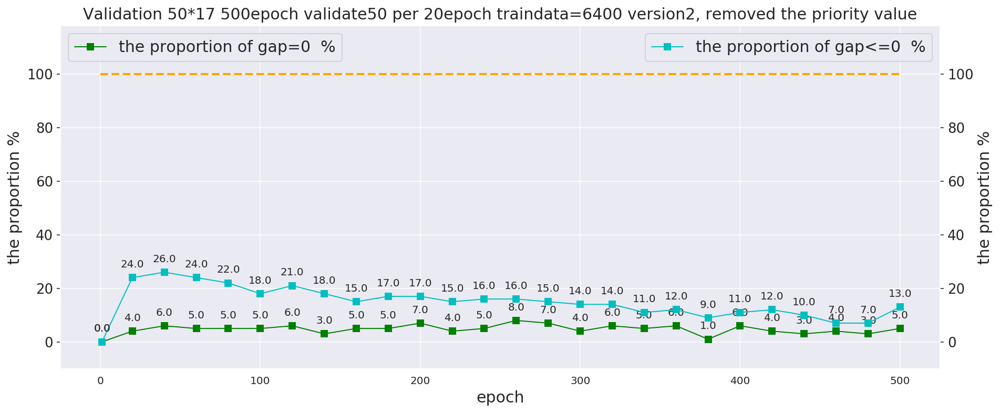

In [ ]:
fig, ax1 = plt.subplots(figsize=(15, 6), dpi=144) 
ax1.plot(penalty_epoch_idx_50x17_x50val_500epoch6400, int_penalty_gap0_proportion_50x17_x50val_500epoch6400, 'gs-',label='the proportion of gap=0  %', linewidth = 1)
ax1.plot([0,500], [100,100], color='orange',linestyle='--', linewidth = 2)

for i in range(len(penalty_epoch_idx_50x17_x50val_500epoch6400)):
    plt.text(penalty_epoch_idx_50x17_x50val_500epoch6400[i], int_penalty_gap0_proportion_50x17_x50val_500epoch6400[i]+3, round(int_penalty_gap0_proportion_50x17_x50val_500epoch6400[i], 3)   , ha='center', va='bottom', fontsize=10)

plt.legend(loc=2,fontsize=15)
plt.yticks(size = 13)
ax2 = ax1.twinx() 
ax2.plot(penalty_epoch_idx_50x17_x50val_500epoch6400, int_penalty_gap_min_0_proportion_50x17_x50val_500epoch6400, 'cs-',label='the proportion of gap<=0  %', linewidth = 1)
for i in range(len(penalty_epoch_idx_50x17_x50val_500epoch6400)):
    plt.text(penalty_epoch_idx_50x17_x50val_500epoch6400[i], int_penalty_gap_min_0_proportion_50x17_x50val_500epoch6400[i]+3, round(int_penalty_gap_min_0_proportion_50x17_x50val_500epoch6400[i], 3)   , ha='center', va='bottom', fontsize=10)

plt.legend(loc=1,fontsize=15)
plt.yticks(size = 13)
ax1.set_title("Validation 50*17 500epoch validate50 per 20epoch traindata=6400 version2, removed the priority value",size=15)  
ax1.set_xlabel("epoch",size=15)  
ax1.set_ylabel('the proportion %',size=15)
ax1.set_ylim(-10,118)
ax2.set_ylabel('the proportion %',size=15)
ax2.set_ylim(-10,118)
plt.grid() 
plt.show()

In [ ]:
loss_RCs_50x17_x50val_500epoch_6400_=[]
loss_KLDs_50x17_x50val_500epoch_6400_=[]
for i in epoch_idx_50x17_x50val_500epoch6400:
    loss_RCs_50x17_x50val_500epoch_6400_.append(loss_RCs_50x17_x50val_500epoch_6400[i-1])
    loss_KLDs_50x17_x50val_500epoch_6400_.append(loss_KLDs_50x17_x50val_500epoch_6400[i-1])

loss_50x17_x50val_500epoch6400=[]
loss_KLDwithWeight_50x17_x50val_500epoch6400=[]
for i in range(len(loss_RCs_50x17_x50val_500epoch_6400_)):
    loss_50x17_x50val_500epoch6400.append(loss_RCs_50x17_x50val_500epoch_6400_[i] + loss_KLDs_50x17_x50val_500epoch_6400_[i] * config.KLD_weight)
    loss_KLDwithWeight_50x17_x50val_500epoch6400.append(loss_KLDs_50x17_x50val_500epoch_6400_[i] * config.KLD_weight)

In [ ]:
penalty_loss_RC_50x17_x50val_500epoch6400=[]
penalty_loss_KLD_50x17_x50val_500epoch6400=[]
for i in penalty_epoch_idx_50x17_x50val_500epoch6400:
    penalty_loss_RC_50x17_x50val_500epoch6400.append(penalty_validation_loss_RCs_50x17_x50val_500epoch6400[i-1])
    penalty_loss_KLD_50x17_x50val_500epoch6400.append(penalty_validation_loss_KLDs_50x17_x50val_500epoch6400[i-1])

penalty_loss_50x17_x50val_500epoch6400=[]
penalty_loss_KLDwithWeight_50x17_x50val_500epoch6400=[]
for i in range(len(penalty_loss_RC_50x17_x50val_500epoch6400)):
    penalty_loss_50x17_x50val_500epoch6400.append(penalty_loss_RC_50x17_x50val_500epoch6400[i] + penalty_loss_KLD_50x17_x50val_500epoch6400[i] * config.KLD_weight)
    penalty_loss_KLDwithWeight_50x17_x50val_500epoch6400.append(penalty_loss_KLD_50x17_x50val_500epoch6400[i] * config.KLD_weight)

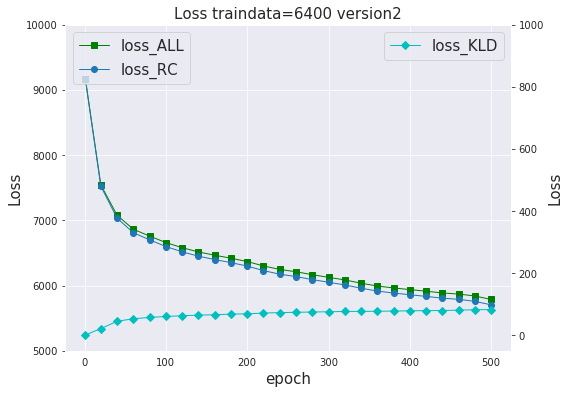

In [ ]:
fig, ax1 = plt.subplots(figsize=(8, 6), dpi=72) 
ax1.plot(penalty_epoch_idx_50x17_x50val_500epoch6400, penalty_loss_50x17_x50val_500epoch6400,'gs-', label='loss_ALL', linewidth = 1)
ax1.plot(penalty_epoch_idx_50x17_x50val_500epoch6400, penalty_loss_RC_50x17_x50val_500epoch6400, 'o-',label='loss_RC', linewidth = 1)
plt.legend(loc=2,fontsize=15)
ax2 = ax1.twinx() 
ax2.plot(penalty_epoch_idx_50x17_x50val_500epoch6400, penalty_loss_KLDwithWeight_50x17_x50val_500epoch6400,'cD-', label='loss_KLD', linewidth = 1)
plt.legend(loc=1,fontsize=15)
ax1.set_title("Loss traindata=6400 version2",size=15)  
ax1.set_xlabel("epoch",size=15)  
ax1.set_ylabel('Loss',size=15)
ax1.set_ylim(5000,10000)
ax2.set_ylabel('Loss',size=15)
ax2.set_ylim(-50,1000)
plt.grid() 
plt.show()

In [ ]:
penalty_loss_RC_50x17_x50val_500epoch_6400_Divided=np.divide(penalty_loss_RC_50x17_x50val_500epoch6400, 128*50)
penalty_loss_RC_50x17_x50val_500epoch_6400_Divided_probs=[]
for i in range(len(penalty_epoch_idx_50x17_x50val_500epoch6400)):
    penalty_loss_RC_50x17_x50val_500epoch_6400_Divided_probs.append(pow(2.71828,-penalty_loss_RC_50x17_x50val_500epoch_6400_Divided[i]))

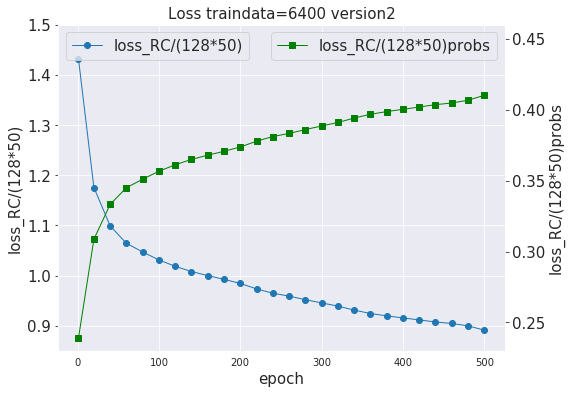

In [ ]:
fig, ax1 = plt.subplots(figsize=(8, 6), dpi=72) 
ax1.plot(penalty_epoch_idx_50x17_x50val_500epoch6400, penalty_loss_RC_50x17_x50val_500epoch_6400_Divided,'o-', label='loss_RC/(128*50)', linewidth = 1)
plt.legend(loc=2,fontsize=15)
plt.yticks(size = 15)
ax2 = ax1.twinx() 
ax2.plot(penalty_epoch_idx_50x17_x50val_500epoch6400, penalty_loss_RC_50x17_x50val_500epoch_6400_Divided_probs,'gs-', label='loss_RC/(128*50)probs', linewidth = 1)
plt.legend(loc=1,fontsize=15)
plt.yticks(size = 15)
ax1.set_title("Loss traindata=6400 version2",size=15)  
ax1.set_ylim(0.85,1.5)
ax1.set_xlabel("epoch",size=15)  
ax1.set_ylabel('loss_RC/(128*50)',size=15)
ax2.set_ylabel('loss_RC/(128*50)probs',size=15)
ax2.set_ylim(0.23,0.46)
plt.grid() 
plt.show()

## 20x6 vs 50x17

Text(0.5, 1.0, 'Avg Gap %  20x6 vs 50x17')

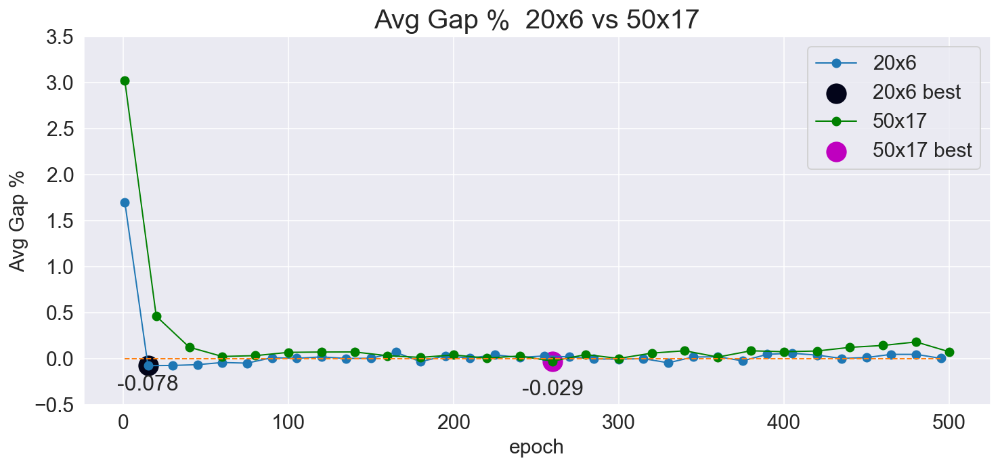

In [ ]:
plt.figure(figsize=(12, 5), dpi=144)
_20x6_,=plt.plot(epoch_idx_20x6_x100val_500epoch28032,avg_gap_20x6_x100val_500epoch28032,'o-',linewidth=1)
plt.text(epoch_idx_20x6_x100val_500epoch28032[1], avg_gap_20x6_x100val_500epoch28032[1]-0.1, round(avg_gap_20x6_x100val_500epoch28032[1],3), ha='center', va='top', fontsize=16)
g1 = plt.scatter(epoch_idx_20x6_x100val_500epoch28032[1], avg_gap_20x6_x100val_500epoch28032[1],s=200,c=1,marker='o') #"m"

_50x17_,=plt.plot(epoch_idx_50x17_x50val_500epoch6400,avg_gap_50x17_x50val_500epoch6400,'go-',linewidth=1)
plt.text(epoch_idx_50x17_x50val_500epoch6400[13], avg_gap_50x17_x50val_500epoch6400[13]-0.2, round(avg_gap_50x17_x50val_500epoch6400[13],3), ha='center', va='top', fontsize=16)
g2 = plt.scatter(epoch_idx_50x17_x50val_500epoch6400[13], avg_gap_50x17_x50val_500epoch6400[13],s=200,c="m",marker='o') #"m"

plt.plot(epoch_idx_20x6_x100val_500epoch9344, auxiliary_0[:34],'--', linewidth = 1)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel("epoch",fontsize=15)
plt.ylabel("Avg Gap %",fontsize=15)
plt.ylim((-0.5, 3.5))
#plt.legend(handles=[_20x6_,_50x17_,g1, g2],labels=["20x6","50x17",'20x6 best', '50x17 best'],fontsize=15,loc='upper right') 
plt.legend(handles=[_20x6_,g1, _50x17_,g2],labels=["20x6",'20x6 best', "50x17",'50x17 best'],fontsize=15,loc='upper right') 

plt.title("Avg Gap %  20x6 vs 50x17",size=20)

Text(0.5, 1.0, 'The proportion of Gap<=0  %  20x6 vs 50x17')

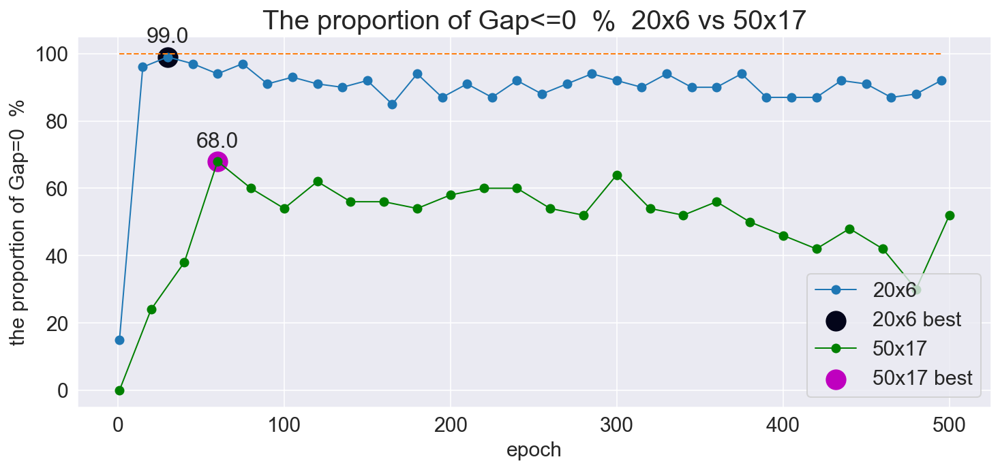

In [ ]:
plt.figure(figsize=(12, 5), dpi=144)
_20x6_,=plt.plot(epoch_idx_20x6_x100val_500epoch28032,gap_min_0_proportion_20x6_x100val_500epoch28032,'o-',linewidth=1)
plt.text(epoch_idx_20x6_x100val_500epoch28032[2], gap_min_0_proportion_20x6_x100val_500epoch28032[2]+3, round(gap_min_0_proportion_20x6_x100val_500epoch28032[2], 3), ha='center', va='bottom', fontsize=16)
g1 =plt.scatter(epoch_idx_20x6_x100val_500epoch28032[2], gap_min_0_proportion_20x6_x100val_500epoch28032[2],s=200,c=1,marker='o') #"m"

_50x17_,=plt.plot(epoch_idx_50x17_x50val_500epoch6400,gap_min_0_proportion_50x17_x50val_500epoch6400,'go-',linewidth=1)
plt.text(epoch_idx_50x17_x50val_500epoch6400[3], gap_min_0_proportion_50x17_x50val_500epoch6400[3]+3, round(gap_min_0_proportion_50x17_x50val_500epoch6400[3], 3), ha='center', va='bottom', fontsize=16)
g2 =plt.scatter(epoch_idx_50x17_x50val_500epoch6400[3], gap_min_0_proportion_50x17_x50val_500epoch6400[3],s=200,c="m",marker='o') #"m"

plt.plot(epoch_idx_20x6_x100val_500epoch9344, auxiliary_100,'--', linewidth = 1)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel("epoch",fontsize=15)
plt.ylabel("the proportion of Gap=0  %",fontsize=15)
plt.legend([_20x6_,g1,_50x17_,g2],["20x6","20x6 best","50x17","50x17 best"],fontsize=15,loc='lower right') 

plt.title("The proportion of Gap<=0  %  20x6 vs 50x17",size=20)

In [ ]:
merge_dt_dict = {'20x6 epoch No.15':df_20x6_x100val_500epoch["15"],
                '50x17 epoch No.260':df_50x17_x50val_500epoch["260"]}

data_df_AvgGapVS = DataFrame(merge_dt_dict)
data_df_AvgGapVS

,20x6 epoch No.15,50x17 epoch No.260
0,0.000000,-0.041085
1,0.941620,0.728988
2,0.794913,-0.171233
3,0.000000,0.041911
4,0.000000,-0.042717
...,...,...
95,0.000000,NaN
96,0.000000,NaN
97,0.872600,NaN
98,0.838926,NaN


Text(0.5, 1.0, '1.   20x6 vs 50x17 ')

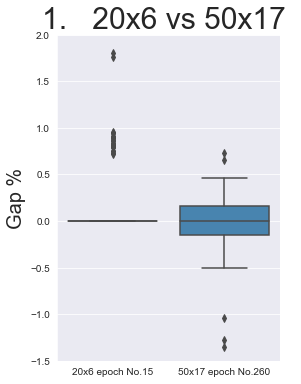

In [ ]:
#boxplot
plt.figure(figsize=(4,6))
sns.set_style('darkgrid')
sns.boxplot(data=data_df_AvgGapVS ,palette="Blues" ) # ,palette="Blues"  ,palette="Set2"
plt.ylabel("Gap %",fontsize=20)
#plt.ylabel("epoch",fontsize=30)
plt.ylim((-1.5, 2))
plt.title('1.   20x6 vs 50x17 ',fontsize=30)

In [ ]:
merge_dt_dict = {'20x6 epoch No.30':df_20x6_x100val_500epoch["30"],
                '50x17 epoch No.60':df_50x17_x50val_500epoch["60"]}

data_df_0proportionVS = DataFrame(merge_dt_dict)
data_df_0proportionVS

,20x6 epoch No.30,50x17 epoch No.60
0,0.00000,-0.041085
1,0.94162,0.771870
2,0.00000,0.000000
3,0.00000,0.000000
4,0.00000,0.170867
...,...,...
95,0.00000,NaN
96,0.00000,NaN
97,0.00000,NaN
98,0.00000,NaN
